# Sentiment Classification & How To "Frame Problems" for a Neural Network

by Andrew Trask

- **Twitter**: @iamtrask
- **Blog**: http://iamtrask.github.io

### What You Should Already Know

- neural networks, forward and back-propagation
- stochastic gradient descent
- mean squared error
- and train/test splits

### Where to Get Help if You Need it
- Re-watch previous Udacity Lectures
- Leverage the recommended Course Reading Material - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) (Check inside your classroom for a discount code)
- Shoot me a tweet @iamtrask


### Tutorial Outline:

- Intro: The Importance of "Framing a Problem" (this lesson)

- [Curate a Dataset](#lesson_1)
- [Developing a "Predictive Theory"](#lesson_2)
- [**PROJECT 1**: Quick Theory Validation](#project_1)


- [Transforming Text to Numbers](#lesson_3)
- [**PROJECT 2**: Creating the Input/Output Data](#project_2)


- Putting it all together in a Neural Network (video only - nothing in notebook)
- [**PROJECT 3**: Building our Neural Network](#project_3)


- [Understanding Neural Noise](#lesson_4)
- [**PROJECT 4**: Making Learning Faster by Reducing Noise](#project_4)


- [Analyzing Inefficiencies in our Network](#lesson_5)
- [**PROJECT 5**: Making our Network Train and Run Faster](#project_5)


- [Further Noise Reduction](#lesson_6)
- [**PROJECT 6**: Reducing Noise by Strategically Reducing the Vocabulary](#project_6)


- [Analysis: What's going on in the weights?](#lesson_7)

# Lesson: Curate a Dataset<a id='lesson_1'></a>
The cells from here until Project 1 include code Andrew shows in the videos leading up to mini project 1. We've included them so you can run the code along with the videos without having to type in everything.

In [1]:
def pretty_print_review_and_label(i):
    print(labels[i] + "\t:\t" + reviews[i][:80] + "...")

g = open('reviews.txt','r') # What we know!
reviews = list(map(lambda x:x[:-1],g.readlines()))
g.close()

g = open('labels.txt','r') # What we WANT to know!
labels = list(map(lambda x:x[:-1].upper(),g.readlines()))
g.close()

**Note:** The data in `reviews.txt` we're using has already been preprocessed a bit and contains only lower case characters. If we were working from raw data, where we didn't know it was all lower case, we would want to add a step here to convert it. That's so we treat different variations of the same word, like `The`, `the`, and `THE`, all the same way.

In [2]:
len(reviews)

25000

In [3]:
reviews[2]

'homelessness  or houselessness as george carlin stated  has been an issue for years but never a plan to help those on the street that were once considered human who did everything from going to school  work  or vote for the matter . most people think of the homeless as just a lost cause while worrying about things such as racism  the war on iraq  pressuring kids to succeed  technology  the elections  inflation  or worrying if they  ll be next to end up on the streets .  br    br   but what if you were given a bet to live on the streets for a month without the luxuries you once had from a home  the entertainment sets  a bathroom  pictures on the wall  a computer  and everything you once treasure to see what it  s like to be homeless  that is goddard bolt  s lesson .  br    br   mel brooks  who directs  who stars as bolt plays a rich man who has everything in the world until deciding to make a bet with a sissy rival  jeffery tambor  to see if he can live in the streets for thirty days w

In [4]:
labels[2]

'POSITIVE'

# Lesson: Develop a Predictive Theory<a id='lesson_2'></a>

In [5]:
print("labels.txt \t : \t reviews.txt\n")
pretty_print_review_and_label(2137)
pretty_print_review_and_label(12816)
pretty_print_review_and_label(6267)
pretty_print_review_and_label(21934)
pretty_print_review_and_label(5297)
pretty_print_review_and_label(4998)

labels.txt 	 : 	 reviews.txt

NEGATIVE	:	this movie is terrible but it has some good effects .  ...
POSITIVE	:	adrian pasdar is excellent is this film . he makes a fascinating woman .  ...
NEGATIVE	:	comment this movie is impossible . is terrible  very improbable  bad interpretat...
POSITIVE	:	excellent episode movie ala pulp fiction .  days   suicides . it doesnt get more...
NEGATIVE	:	if you haven  t seen this  it  s terrible . it is pure trash . i saw this about ...
POSITIVE	:	this schiffer guy is a real genius  the movie is of excellent quality and both e...


# Project 1: Quick Theory Validation<a id='project_1'></a>

There are multiple ways to implement these projects, but in order to get your code closer to what Andrew shows in his solutions, we've provided some hints and starter code throughout this notebook.

You'll find the [Counter](https://docs.python.org/2/library/collections.html#collections.Counter) class to be useful in this exercise, as well as the [numpy](https://docs.scipy.org/doc/numpy/reference/) library.

In [6]:
from collections import Counter
import numpy as np

We'll create three `Counter` objects, one for words from postive reviews, one for words from negative reviews, and one for all the words.

In [7]:
# Create three Counter objects to store positive, negative and total counts
positive_counts = Counter()
negative_counts = Counter()
total_counts = Counter()

**TODO:** Examine all the reviews. For each word in a positive review, increase the count for that word in both your positive counter and the total words counter; likewise, for each word in a negative review, increase the count for that word in both your negative counter and the total words counter.

**Note:** Throughout these projects, you should use `split(' ')` to divide a piece of text (such as a review) into individual words. If you use `split()` instead, you'll get slightly different results than what the videos and solutions show.

In [8]:
# TODO: Loop over all the words in all the reviews and increment the counts in the appropriate counter objects
for i in range(len(reviews)):
    words = reviews[i].split(" ")
    if labels[i]=="POSITIVE":
        for word in reviews[i].split(" "):
            positive_counts[word]+=1
            total_counts[word]+=1
    else :
        for word in reviews[i].split(" "):
            negative_counts[word]+=1
            total_counts[word]+=1

Run the following two cells to list the words used in positive reviews and negative reviews, respectively, ordered from most to least commonly used. 

In [9]:
# Examine the counts of the most common words in positive reviews
positive_counts.most_common()

[('', 550468),
 ('the', 173324),
 ('.', 159654),
 ('and', 89722),
 ('a', 83688),
 ('of', 76855),
 ('to', 66746),
 ('is', 57245),
 ('in', 50215),
 ('br', 49235),
 ('it', 48025),
 ('i', 40743),
 ('that', 35630),
 ('this', 35080),
 ('s', 33815),
 ('as', 26308),
 ('with', 23247),
 ('for', 22416),
 ('was', 21917),
 ('film', 20937),
 ('but', 20822),
 ('movie', 19074),
 ('his', 17227),
 ('on', 17008),
 ('you', 16681),
 ('he', 16282),
 ('are', 14807),
 ('not', 14272),
 ('t', 13720),
 ('one', 13655),
 ('have', 12587),
 ('be', 12416),
 ('by', 11997),
 ('all', 11942),
 ('who', 11464),
 ('an', 11294),
 ('at', 11234),
 ('from', 10767),
 ('her', 10474),
 ('they', 9895),
 ('has', 9186),
 ('so', 9154),
 ('like', 9038),
 ('about', 8313),
 ('very', 8305),
 ('out', 8134),
 ('there', 8057),
 ('she', 7779),
 ('what', 7737),
 ('or', 7732),
 ('good', 7720),
 ('more', 7521),
 ('when', 7456),
 ('some', 7441),
 ('if', 7285),
 ('just', 7152),
 ('can', 7001),
 ('story', 6780),
 ('time', 6515),
 ('my', 6488),
 ('g

In [10]:
# Examine the counts of the most common words in negative reviews
negative_counts.most_common()

[('', 561462),
 ('.', 167538),
 ('the', 163389),
 ('a', 79321),
 ('and', 74385),
 ('of', 69009),
 ('to', 68974),
 ('br', 52637),
 ('is', 50083),
 ('it', 48327),
 ('i', 46880),
 ('in', 43753),
 ('this', 40920),
 ('that', 37615),
 ('s', 31546),
 ('was', 26291),
 ('movie', 24965),
 ('for', 21927),
 ('but', 21781),
 ('with', 20878),
 ('as', 20625),
 ('t', 20361),
 ('film', 19218),
 ('you', 17549),
 ('on', 17192),
 ('not', 16354),
 ('have', 15144),
 ('are', 14623),
 ('be', 14541),
 ('he', 13856),
 ('one', 13134),
 ('they', 13011),
 ('at', 12279),
 ('his', 12147),
 ('all', 12036),
 ('so', 11463),
 ('like', 11238),
 ('there', 10775),
 ('just', 10619),
 ('by', 10549),
 ('or', 10272),
 ('an', 10266),
 ('who', 9969),
 ('from', 9731),
 ('if', 9518),
 ('about', 9061),
 ('out', 8979),
 ('what', 8422),
 ('some', 8306),
 ('no', 8143),
 ('her', 7947),
 ('even', 7687),
 ('can', 7653),
 ('has', 7604),
 ('good', 7423),
 ('bad', 7401),
 ('would', 7036),
 ('up', 6970),
 ('only', 6781),
 ('more', 6730),
 ('

As you can see, common words like "the" appear very often in both positive and negative reviews. Instead of finding the most common words in positive or negative reviews, what you really want are the words found in positive reviews more often than in negative reviews, and vice versa. To accomplish this, you'll need to calculate the **ratios** of word usage between positive and negative reviews.

**TODO:** Check all the words you've seen and calculate the ratio of postive to negative uses and store that ratio in `pos_neg_ratios`. 
>Hint: the positive-to-negative ratio for a given word can be calculated with `positive_counts[word] / float(negative_counts[word]+1)`. Notice the `+1` in the denominator – that ensures we don't divide by zero for words that are only seen in positive reviews.

In [11]:
# Create Counter object to store positive/negative ratios
pos_neg_ratios = Counter()

for word,count in list(total_counts.most_common()):
    if count>=100:
        pos_neg_ratios[word] = positive_counts[word]/float(negative_counts[word]+1)
    

# TODO: Calculate the ratios of positive and negative uses of the most common words
#       Consider words to be "common" if they've been used at least 100 times

Examine the ratios you've calculated for a few words:

In [12]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 1.0607993145235326
Pos-to-neg ratio for 'amazing' = 4.022813688212928
Pos-to-neg ratio for 'terrible' = 0.17744252873563218


Looking closely at the values you just calculated, we see the following:

* Words that you would expect to see more often in positive reviews – like "amazing" – have a ratio greater than 1. The more skewed a word is toward postive, the farther from 1 its positive-to-negative ratio  will be.
* Words that you would expect to see more often in negative reviews – like "terrible" – have positive values that are less than 1. The more skewed a word is toward negative, the closer to zero its positive-to-negative ratio will be.
* Neutral words, which don't really convey any sentiment because you would expect to see them in all sorts of reviews – like "the" – have values very close to 1. A perfectly neutral word – one that was used in exactly the same number of positive reviews as negative reviews – would be almost exactly 1. The `+1` we suggested you add to the denominator slightly biases words toward negative, but it won't matter because it will be a tiny bias and later we'll be ignoring words that are too close to neutral anyway.

Ok, the ratios tell us which words are used more often in postive or negative reviews, but the specific values we've calculated are a bit difficult to work with. A very positive word like "amazing" has a value above 4, whereas a very negative word like "terrible" has a value around 0.18. Those values aren't easy to compare for a couple of reasons:

* Right now, 1 is considered neutral, but the absolute value of the postive-to-negative rations of very postive words is larger than the absolute value of the ratios for the very negative words. So there is no way to directly compare two numbers and see if one word conveys the same magnitude of positive sentiment as another word conveys negative sentiment. So we should center all the values around netural so the absolute value fro neutral of the postive-to-negative ratio for a word would indicate how much sentiment (positive or negative) that word conveys.
* When comparing absolute values it's easier to do that around zero than one. 

To fix these issues, we'll convert all of our ratios to new values using logarithms.

**TODO:** Go through all the ratios you calculated and convert them to logarithms. (i.e. use `np.log(ratio)`)

In the end, extremely positive and extremely negative words will have positive-to-negative ratios with similar magnitudes but opposite signs.

In [13]:
# TODO: Convert ratios to logs
for word,ratio in pos_neg_ratios.most_common():
#     print ("Word ",word," Ratio ",ratio)
    if ratio>1:
        pos_neg_ratios[word] = np.log(ratio)
    else: pos_neg_ratios[word] = -np.log((1/(ratio+0.01)))
 

Examine the new ratios you've calculated for the same words from before:

In [14]:
print("Pos-to-neg ratio for 'the' = {}".format(pos_neg_ratios["the"]))
print("Pos-to-neg ratio for 'amazing' = {}".format(pos_neg_ratios["amazing"]))
print("Pos-to-neg ratio for 'terrible' = {}".format(pos_neg_ratios["terrible"]))

Pos-to-neg ratio for 'the' = 0.05902269426102881
Pos-to-neg ratio for 'amazing' = 1.3919815802404802
Pos-to-neg ratio for 'terrible' = -1.6742829939664696


If everything worked, now you should see neutral words with values close to zero. In this case, "the" is near zero but slightly positive, so it was probably used in more positive reviews than negative reviews. But look at "amazing"'s ratio - it's above `1`, showing it is clearly a word with positive sentiment. And "terrible" has a similar score, but in the opposite direction, so it's below `-1`. It's now clear that both of these words are associated with specific, opposing sentiments.

Now run the following cells to see more ratios. 

The first cell displays all the words, ordered by how associated they are with postive reviews. (Your notebook will most likely truncate the output so you won't actually see *all* the words in the list.)

The second cell displays the 30 words most associated with negative reviews by reversing the order of the first list and then looking at the first 30 words. (If you want the second cell to display all the words, ordered by how associated they are with negative reviews, you could just write `reversed(pos_neg_ratios.most_common())`.)

You should continue to see values similar to the earlier ones we checked – neutral words will be close to `0`, words will get more positive as their ratios approach and go above `1`, and words will get more negative as their ratios approach and go below `-1`. That's why we decided to use the logs instead of the raw ratios.

In [15]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

[('edie', 4.6913478822291435),
 ('paulie', 4.07753744390572),
 ('felix', 3.152736022363656),
 ('polanski', 2.8233610476132043),
 ('matthau', 2.80672172860924),
 ('victoria', 2.681021528714291),
 ('mildred', 2.6026896854443837),
 ('gandhi', 2.538973871058276),
 ('flawless', 2.451005098112319),
 ('superbly', 2.26002547857525),
 ('perfection', 2.159484249353372),
 ('astaire', 2.1400661634962708),
 ('captures', 2.038619547159581),
 ('voight', 2.030170492673053),
 ('wonderfully', 2.0218960560332353),
 ('powell', 1.978345424808467),
 ('brosnan', 1.9547990964725592),
 ('lily', 1.9203768470501485),
 ('bakshi', 1.9029851043382795),
 ('lincoln', 1.9014583864844796),
 ('refreshing', 1.8551812956655511),
 ('breathtaking', 1.8481124057791867),
 ('bourne', 1.8478489358790986),
 ('lemmon', 1.8458266904983307),
 ('delightful', 1.8002701588959635),
 ('flynn', 1.7996646487351682),
 ('andrews', 1.7764919970972666),
 ('homer', 1.7692866133759964),
 ('beautifully', 1.7626953362841438),
 ('soccer', 1.757857

In [16]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))

# Note: Above is the code Andrew uses in his solution video, 
#       so we've included it here to avoid confusion.
#       If you explore the documentation for the Counter class, 
#       you will see you could also find the 30 least common
#       words like this: pos_neg_ratios.most_common()[:-31:-1]

[('boll', -4.07781526027089),
 ('uwe', -3.921875301871158),
 ('seagal', -3.320250105858192),
 ('unwatchable', -3.0269848170580955),
 ('stinker', -2.9876839403711624),
 ('mst', -2.775383321170797),
 ('incoherent', -2.7641396677532537),
 ('unfunny', -2.5545257844967644),
 ('waste', -2.4907515123361046),
 ('blah', -2.4475792789485005),
 ('horrid', -2.371577964480997),
 ('pointless', -2.345107387713634),
 ('atrocious', -2.3187369339642556),
 ('redeeming', -2.2667790015910296),
 ('prom', -2.2601040980178784),
 ('drivel', -2.247602958576693),
 ('lousy', -2.2118080125207054),
 ('worst', -2.1930856334332267),
 ('laughable', -2.172468615469592),
 ('awful', -2.1385076866397488),
 ('poorly', -2.132613384420701),
 ('wasting', -2.117815554561451),
 ('remotely', -2.111046881095167),
 ('existent', -2.0024805005437076),
 ('boredom', -1.9241486572738005),
 ('miserably', -1.921661093801999),
 ('sucks', -1.9166645809588516),
 ('uninspired', -1.9131499212248517),
 ('lame', -1.9117232884159072),
 ('insult'

# End of Project 1. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Transforming Text into Numbers<a id='lesson_3'></a>
The cells here include code Andrew shows in the next video. We've included it so you can run the code along with the video without having to type in everything.

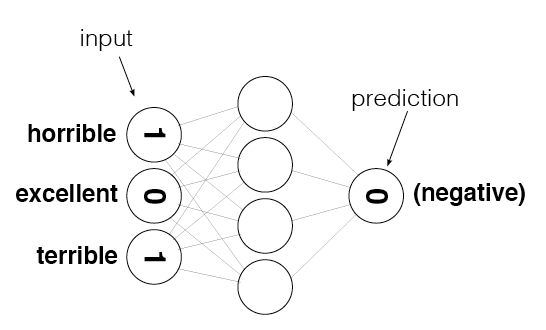

In [17]:
from IPython.display import Image

review = "This was a horrible, terrible movie."

Image(filename='sentiment_network.png')

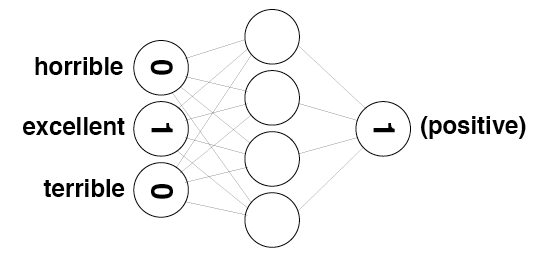

In [18]:
review = "The movie was excellent"

Image(filename='sentiment_network_pos.png')

# Project 2: Creating the Input/Output Data<a id='project_2'></a>

**TODO:** Create a [set](https://docs.python.org/3/tutorial/datastructures.html#sets) named `vocab` that contains every word in the vocabulary.

In [19]:
# TODO: Create set named "vocab" containing all of the words from all of the reviews
vocab = set()
for review in reviews:
    for word in review.split(" "):
        vocab.add(word)

Run the following cell to check your vocabulary size. If everything worked correctly, it should print **74074**

In [20]:
vocab_size = len(vocab)
print(vocab_size)

74074


Take a look at the following image. It represents the layers of the neural network you'll be building throughout this notebook. `layer_0` is the input layer, `layer_1` is a hidden layer, and `layer_2` is the output layer.

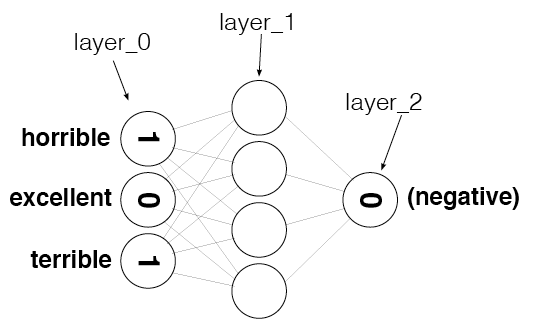

In [21]:
from IPython.display import Image
Image(filename='sentiment_network_2.png')

**TODO:** Create a numpy array called `layer_0` and initialize it to all zeros. You will find the [zeros](https://docs.scipy.org/doc/numpy/reference/generated/numpy.zeros.html) function particularly helpful here. Be sure you create `layer_0` as a 2-dimensional matrix with 1 row and `vocab_size` columns. 

In [22]:
# TODO: Create layer_0 matrix with dimensions 1 by vocab_size, initially filled with zeros
layer_0 = np.zeros((1,vocab_size))

Run the following cell. It should display `(1, 74074)`

In [23]:
layer_0.shape

(1, 74074)

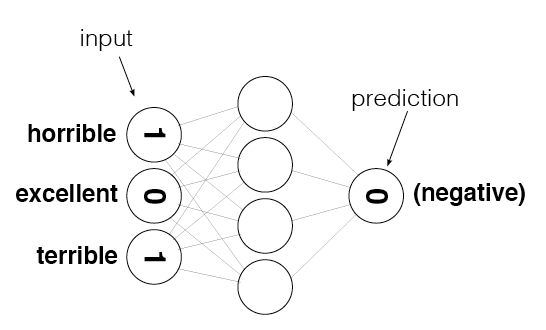

In [24]:
from IPython.display import Image
Image(filename='sentiment_network.png')

`layer_0` contains one entry for every word in the vocabulary, as shown in the above image. We need to make sure we know the index of each word, so run the following cell to create a lookup table that stores the index of every word.

In [25]:
# Create a dictionary of words in the vocabulary mapped to index positions
# (to be used in layer_0)
word2index = {}
for i,word in enumerate(vocab):
    word2index[word] = i
    
# display the map of words to indices
# word2index

**TODO:**  Complete the implementation of `update_input_layer`. It should count 
          how many times each word is used in the given review, and then store
          those counts at the appropriate indices inside `layer_0`.

In [26]:
def update_input_layer(review):
    """ Modify the global layer_0 to represent the vector form of review.
    The element at a given index of layer_0 should represent
    how many times the given word occurs in the review.
    Args:
        review(string) - the string of the review
    Returns:
        None
    """ 
    global layer_0
    # clear out previous state by resetting the layer to be all 0s
    layer_0 *= 0
    word_freq_counter = Counter()
    
    for word in review.split(" "):
        word_freq_counter[word]+=1
        layer_0[0][word2index[word]] = word_freq_counter[word]
        
    # TODO: count how many times each word is used in the given review and store the results in layer_0 

Run the following cell to test updating the input layer with the first review. The indices assigned may not be the same as in the solution, but hopefully you'll see some non-zero values in `layer_0`.  

In [27]:
update_input_layer(reviews[0])
layer_0



array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

**TODO:** Complete the implementation of `get_target_for_labels`. It should return `0` or `1`, 
          depending on whether the given label is `NEGATIVE` or `POSITIVE`, respectively.

In [28]:
def get_target_for_label(label):
    """Convert a label to `0` or `1`.
    Args:
        label(string) - Either "POSITIVE" or "NEGATIVE".
    Returns:
        `0` or `1`.
    """
    # TODO: Your code here
    if label == "POSITIVE":
        return 1
    else : return 0

Run the following two cells. They should print out`'POSITIVE'` and `1`, respectively.

In [29]:
labels[0]

'POSITIVE'

In [30]:
get_target_for_label(labels[0])

1

Run the following two cells. They should print out `'NEGATIVE'` and `0`, respectively.

In [31]:
labels[1]

'NEGATIVE'

In [32]:
get_target_for_label(labels[1])

0

# End of Project 2. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Project 3: Building a Neural Network<a id='project_3'></a>

**TODO:** We've included the framework of a class called `SentimentNetork`. Implement all of the items marked `TODO` in the code. These include doing the following:
- Create a basic neural network much like the networks you've seen in earlier lessons and in Project 1, with an input layer, a hidden layer, and an output layer. 
- Do **not** add a non-linearity in the hidden layer. That is, do not use an activation function when calculating the hidden layer outputs.
- Re-use the code from earlier in this notebook to create the training data (see `TODO`s in the code)
- Implement the `pre_process_data` function to create the vocabulary for our training data generating functions
- Ensure `train` trains over the entire corpus

### Where to Get Help if You Need it
- Re-watch earlier Udacity lectures
- Chapters 3-5 - [Grokking Deep Learning](https://www.manning.com/books/grokking-deep-learning) - (Check inside your classroom for a discount code)

In [34]:
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
#         self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] += 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert (len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            output = np.array(self.get_target_for_label(label))
            output = output.reshape((1,1))
            # print(review)
            # print(output)

            # print(review)
            # print(label)
            self.update_input_layer(review)

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # update_input_layer(review)
            # output = get_target_for_label(label)

            hidden_layer_input = np.dot(self.layer_0,self.weights_0_1)
            # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
            output_layer_input = np.dot(hidden_layer_input,self.weights_1_2)
            # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
            output_layer_output = self.sigmoid(output_layer_input)
            # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
            # print("Actual output ", output, "\nShape ", output.shape)
            output_layer_error = output_layer_output - output
            # print("Output Layer Error ", output_layer_error, "\nShape ", output_layer_error.shape)
            output_layer_error_term = output_layer_error * self.sigmoid_output_2_derivative(output_layer_output)
            # print("Output Layer Error Term ", output_layer_error_term, "\nShape ", output_layer_error_term.shape)

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.


            # print("Weight Shape ",self.weights_1_2.shape)
            # print("Output Layer Error Term Shape ",output_layer_error_term.shape)
            hidden_layer_error = np.dot(output_layer_error_term,self.weights_1_2.T)
            # print("Hidden layer error ",hidden_layer_error," Shape ",hidden_layer_error.shape)
            hidden_layer_error_term = hidden_layer_error
            # print("Hidden layer error term",hidden_layer_error_term, " Shape ", hidden_layer_error_term.shape)

            delta_weight_h_o = np.zeros((self.hidden_nodes,self.output_nodes))
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Output Layer Error term ",output_layer_error_term," Shape ",output_layer_error_term.shape)
            # print("Hidden Layer Output ",hidden_layer_input," Shape ",hidden_layer_input.shape)
            delta_weight_h_o += (output_layer_error_term*hidden_layer_input.T)
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Weight Hidden to Output ",self.weights_1_2," Shape ",self.weights_1_2.shape)
            self.weights_1_2 -=delta_weight_h_o * self.learning_rate
            # print("Weight Hidden to Output ", self.weights_1_2, " Shape ", self.weights_1_2.shape)

            delta_weight_i_h = np.zeros((self.input_nodes,self.hidden_nodes))
            delta_weight_i_h += (hidden_layer_error_term * self.layer_0.T)
            self.weights_0_1 -= delta_weight_i_h * self.learning_rate
            # print("Weight Input to Hidden", self.weights_0_1, " Shape ", self.weights_0_1.shape)





            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            print("Layer2",output_layer_output)
            if (output_layer_output[0] >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif (output_layer_output[0] < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i / float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i + 1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i + 1))[:4] + "%")
            if (i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.update_input_layer(review.lower())
        
        hidden_layer_input = np.dot(self.layer_0, self.weights_0_1)
        # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
        output_layer_input = np.dot(hidden_layer_input, self.weights_1_2)
        # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
        output_layer_output = self.sigmoid(output_layer_input)
        # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
        # print("Actual output ", output, "\nShape ", output.shape)
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if (output_layer_output[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

        
        

Run the following cell to create a `SentimentNetwork` that will train on all but the last 1000 reviews (we're saving those for testing). Here we use a learning rate of `0.1`.

In [36]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)

Run the following cell to test the network's performance against the last 1000 reviews (the ones we held out from our training set). 

**We have not trained the model yet, so the results should be about 50% as it will just be guessing and there are only two possible values to choose from.**

In [37]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:15.7% Speed(reviews/sec):693.7 #Correct:79 #Tested:158 Testing Accuracy:50.0%

Progress:33.5% Speed(reviews/sec):777.6 #Correct:168 #Tested:336 Testing Accuracy:50.0%

Progress:51.9% Speed(reviews/sec):820.6 #Correct:260 #Tested:520 Testing Accuracy:50.0%

Progress:71.4% Speed(reviews/sec):856.1 #Correct:358 #Tested:715 Testing Accuracy:50.0%

Progress:91.7% Speed(reviews/sec):885.7 #Correct:459 #Tested:918 Testing Accuracy:50.0%

Progress:99.9% Speed(reviews/sec):888.8 #Correct:500 #Tested:1000 Testing Accuracy:50.0%

Run the following cell to actually train the network. During training, it will display the model's accuracy repeatedly as it trains so you can see how well it's doing.

In [79]:
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):37.19 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):49.18 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[1.]]
Progress:0.01% Speed(reviews/sec):57.74 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.01% Speed(reviews/sec):65.36 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[1.]]
Progress:0.02% Speed(reviews/sec):71.30 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.02% Speed(reviews/sec):75.97 #Correct:4 #Trained:7 Training Accuracy:57.1%Layer2 [[1.]]
Progress:0.02% Speed(reviews/sec):79.52 #Correct:4 #Trained:8 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.03% Speed(reviews/sec):82.59 #Correct:5 #Trained:9 Training Accuracy:55.5%Layer2 [[1.]]
Progress:0.03% Speed(reviews/sec):84.65 #Correct:5 #Trained:10 Training Accuracy:50.0%Layer2 [[1

Progress:0.39% Speed(reviews/sec):111.9 #Correct:48 #Trained:95 Training Accuracy:50.5%Layer2 [[1.]]
Progress:0.39% Speed(reviews/sec):112.0 #Correct:48 #Trained:96 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.4% Speed(reviews/sec):112.1 #Correct:49 #Trained:97 Training Accuracy:50.5%Layer2 [[1.]]
Progress:0.40% Speed(reviews/sec):112.2 #Correct:49 #Trained:98 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.40% Speed(reviews/sec):112.0 #Correct:50 #Trained:99 Training Accuracy:50.5%Layer2 [[1.]]
Progress:0.41% Speed(reviews/sec):112.2 #Correct:50 #Trained:100 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.41% Speed(reviews/sec):112.3 #Correct:51 #Trained:101 Training Accuracy:50.4%Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):112.4 #Correct:51 #Trained:102 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):112.4 #Correct:52 #Trained:103 Training Accuracy:50.4%Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):112.6 #Correct:52 #Trained:104 Training Accuracy:50.0%

Progress:0.77% Speed(reviews/sec):112.5 #Correct:94 #Trained:188 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.78% Speed(reviews/sec):112.6 #Correct:95 #Trained:189 Training Accuracy:50.2%Layer2 [[1.]]
Progress:0.78% Speed(reviews/sec):112.6 #Correct:95 #Trained:190 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.79% Speed(reviews/sec):112.6 #Correct:96 #Trained:191 Training Accuracy:50.2%Layer2 [[1.]]
Progress:0.79% Speed(reviews/sec):112.6 #Correct:96 #Trained:192 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.8% Speed(reviews/sec):112.6 #Correct:97 #Trained:193 Training Accuracy:50.2%Layer2 [[1.]]
Progress:0.80% Speed(reviews/sec):112.6 #Correct:97 #Trained:194 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.80% Speed(reviews/sec):112.6 #Correct:98 #Trained:195 Training Accuracy:50.2%Layer2 [[1.]]
Progress:0.81% Speed(reviews/sec):112.6 #Correct:98 #Trained:196 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.81% Speed(reviews/sec):112.6 #Correct:99 #Trained:197 Training Accuracy:

Progress:1.18% Speed(reviews/sec):114.7 #Correct:143 #Trained:286 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.19% Speed(reviews/sec):114.7 #Correct:144 #Trained:287 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.19% Speed(reviews/sec):114.7 #Correct:144 #Trained:288 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.2% Speed(reviews/sec):114.7 #Correct:145 #Trained:289 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.20% Speed(reviews/sec):114.7 #Correct:145 #Trained:290 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.20% Speed(reviews/sec):114.7 #Correct:146 #Trained:291 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.21% Speed(reviews/sec):114.7 #Correct:146 #Trained:292 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.21% Speed(reviews/sec):114.7 #Correct:147 #Trained:293 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.22% Speed(reviews/sec):114.7 #Correct:147 #Trained:294 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.22% Speed(reviews/sec):114.6 #Correct:148 #Trained:295 Training

Progress:1.55% Speed(reviews/sec):112.9 #Correct:188 #Trained:375 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.56% Speed(reviews/sec):112.9 #Correct:188 #Trained:376 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.56% Speed(reviews/sec):112.9 #Correct:189 #Trained:377 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.57% Speed(reviews/sec):112.9 #Correct:189 #Trained:378 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.57% Speed(reviews/sec):112.9 #Correct:190 #Trained:379 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.57% Speed(reviews/sec):112.9 #Correct:190 #Trained:380 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.58% Speed(reviews/sec):112.8 #Correct:191 #Trained:381 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.58% Speed(reviews/sec):112.8 #Correct:191 #Trained:382 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.59% Speed(reviews/sec):112.8 #Correct:192 #Trained:383 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.59% Speed(reviews/sec):112.8 #Correct:192 #Trained:384 Trainin

Progress:1.90% Speed(reviews/sec):110.7 #Correct:230 #Trained:459 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.91% Speed(reviews/sec):110.7 #Correct:230 #Trained:460 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.91% Speed(reviews/sec):110.8 #Correct:231 #Trained:461 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.92% Speed(reviews/sec):110.8 #Correct:231 #Trained:462 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.92% Speed(reviews/sec):110.8 #Correct:232 #Trained:463 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.92% Speed(reviews/sec):110.9 #Correct:232 #Trained:464 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.93% Speed(reviews/sec):110.9 #Correct:233 #Trained:465 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.93% Speed(reviews/sec):110.9 #Correct:233 #Trained:466 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.94% Speed(reviews/sec):110.9 #Correct:234 #Trained:467 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.94% Speed(reviews/sec):110.9 #Correct:234 #Trained:468 Trainin

Progress:2.29% Speed(reviews/sec):111.1 #Correct:276 #Trained:552 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.3% Speed(reviews/sec):111.1 #Correct:277 #Trained:553 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.30% Speed(reviews/sec):111.1 #Correct:277 #Trained:554 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.30% Speed(reviews/sec):111.1 #Correct:278 #Trained:555 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.31% Speed(reviews/sec):111.1 #Correct:278 #Trained:556 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.31% Speed(reviews/sec):111.2 #Correct:279 #Trained:557 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.32% Speed(reviews/sec):111.2 #Correct:279 #Trained:558 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.32% Speed(reviews/sec):111.2 #Correct:280 #Trained:559 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.32% Speed(reviews/sec):111.1 #Correct:280 #Trained:560 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.33% Speed(reviews/sec):111.2 #Correct:281 #Trained:561 Training

Progress:2.70% Speed(reviews/sec):112.4 #Correct:326 #Trained:651 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.71% Speed(reviews/sec):112.4 #Correct:326 #Trained:652 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.71% Speed(reviews/sec):112.4 #Correct:327 #Trained:653 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.72% Speed(reviews/sec):112.4 #Correct:327 #Trained:654 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.72% Speed(reviews/sec):112.4 #Correct:328 #Trained:655 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.72% Speed(reviews/sec):112.4 #Correct:328 #Trained:656 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.73% Speed(reviews/sec):112.4 #Correct:329 #Trained:657 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.73% Speed(reviews/sec):112.4 #Correct:329 #Trained:658 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.74% Speed(reviews/sec):112.4 #Correct:330 #Trained:659 Training Accuracy:50.0%Layer2 [[1.]]
Progress:2.74% Speed(reviews/sec):112.4 #Correct:330 #Trained:660 Trainin

Progress:3.06% Speed(reviews/sec):111.2 #Correct:368 #Trained:736 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.06% Speed(reviews/sec):111.1 #Correct:369 #Trained:737 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.07% Speed(reviews/sec):111.1 #Correct:369 #Trained:738 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.07% Speed(reviews/sec):111.1 #Correct:370 #Trained:739 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.07% Speed(reviews/sec):111.1 #Correct:370 #Trained:740 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.08% Speed(reviews/sec):111.1 #Correct:371 #Trained:741 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.08% Speed(reviews/sec):111.0 #Correct:371 #Trained:742 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.09% Speed(reviews/sec):111.0 #Correct:372 #Trained:743 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.09% Speed(reviews/sec):111.0 #Correct:372 #Trained:744 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.1% Speed(reviews/sec):111.0 #Correct:373 #Trained:745 Training

Progress:3.43% Speed(reviews/sec):110.9 #Correct:413 #Trained:825 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.43% Speed(reviews/sec):110.9 #Correct:413 #Trained:826 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.44% Speed(reviews/sec):110.9 #Correct:414 #Trained:827 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.44% Speed(reviews/sec):110.9 #Correct:414 #Trained:828 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.45% Speed(reviews/sec):110.9 #Correct:415 #Trained:829 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.45% Speed(reviews/sec):110.9 #Correct:415 #Trained:830 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.45% Speed(reviews/sec):110.9 #Correct:416 #Trained:831 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.46% Speed(reviews/sec):110.9 #Correct:416 #Trained:832 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.46% Speed(reviews/sec):110.9 #Correct:417 #Trained:833 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.47% Speed(reviews/sec):110.9 #Correct:417 #Trained:834 Trainin

Progress:3.82% Speed(reviews/sec):111.3 #Correct:460 #Trained:920 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.83% Speed(reviews/sec):111.3 #Correct:461 #Trained:921 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.83% Speed(reviews/sec):111.3 #Correct:461 #Trained:922 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.84% Speed(reviews/sec):111.3 #Correct:462 #Trained:923 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.84% Speed(reviews/sec):111.3 #Correct:462 #Trained:924 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.85% Speed(reviews/sec):111.3 #Correct:463 #Trained:925 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.85% Speed(reviews/sec):111.3 #Correct:463 #Trained:926 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.85% Speed(reviews/sec):111.4 #Correct:464 #Trained:927 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.86% Speed(reviews/sec):111.4 #Correct:464 #Trained:928 Training Accuracy:50.0%Layer2 [[1.]]
Progress:3.86% Speed(reviews/sec):111.4 #Correct:465 #Trained:929 Trainin

Progress:4.22% Speed(reviews/sec):111.5 #Correct:507 #Trained:1014 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.22% Speed(reviews/sec):111.5 #Correct:508 #Trained:1015 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.22% Speed(reviews/sec):111.5 #Correct:508 #Trained:1016 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.23% Speed(reviews/sec):111.5 #Correct:509 #Trained:1017 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.23% Speed(reviews/sec):111.5 #Correct:509 #Trained:1018 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.24% Speed(reviews/sec):111.5 #Correct:510 #Trained:1019 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.24% Speed(reviews/sec):111.5 #Correct:510 #Trained:1020 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.25% Speed(reviews/sec):111.5 #Correct:511 #Trained:1021 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.25% Speed(reviews/sec):111.5 #Correct:511 #Trained:1022 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.25% Speed(reviews/sec):111.6 #Correct:512 #Trained:10

Progress:4.6% Speed(reviews/sec):111.4 #Correct:553 #Trained:1105 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.60% Speed(reviews/sec):111.4 #Correct:553 #Trained:1106 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.60% Speed(reviews/sec):111.4 #Correct:554 #Trained:1107 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.61% Speed(reviews/sec):111.4 #Correct:554 #Trained:1108 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.61% Speed(reviews/sec):111.5 #Correct:555 #Trained:1109 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.62% Speed(reviews/sec):111.5 #Correct:555 #Trained:1110 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.62% Speed(reviews/sec):111.5 #Correct:556 #Trained:1111 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.62% Speed(reviews/sec):111.5 #Correct:556 #Trained:1112 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.63% Speed(reviews/sec):111.5 #Correct:557 #Trained:1113 Training Accuracy:50.0%Layer2 [[1.]]
Progress:4.63% Speed(reviews/sec):111.5 #Correct:557 #Trained:111

Progress:5.00% Speed(reviews/sec):111.8 #Correct:601 #Trained:1202 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.00% Speed(reviews/sec):111.8 #Correct:602 #Trained:1203 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.01% Speed(reviews/sec):111.8 #Correct:602 #Trained:1204 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.01% Speed(reviews/sec):111.8 #Correct:603 #Trained:1205 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.02% Speed(reviews/sec):111.8 #Correct:603 #Trained:1206 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.02% Speed(reviews/sec):111.8 #Correct:604 #Trained:1207 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.02% Speed(reviews/sec):111.8 #Correct:604 #Trained:1208 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.03% Speed(reviews/sec):111.8 #Correct:605 #Trained:1209 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.03% Speed(reviews/sec):111.8 #Correct:605 #Trained:1210 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.04% Speed(reviews/sec):111.8 #Correct:606 #Trained:12

Progress:5.4% Speed(reviews/sec):112.1 #Correct:649 #Trained:1297 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.40% Speed(reviews/sec):112.1 #Correct:649 #Trained:1298 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.40% Speed(reviews/sec):112.1 #Correct:650 #Trained:1299 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.41% Speed(reviews/sec):112.1 #Correct:650 #Trained:1300 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.41% Speed(reviews/sec):112.1 #Correct:651 #Trained:1301 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.42% Speed(reviews/sec):112.1 #Correct:651 #Trained:1302 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.42% Speed(reviews/sec):112.1 #Correct:652 #Trained:1303 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.42% Speed(reviews/sec):112.1 #Correct:652 #Trained:1304 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.43% Speed(reviews/sec):112.1 #Correct:653 #Trained:1305 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.43% Speed(reviews/sec):112.1 #Correct:653 #Trained:130

Progress:5.8% Speed(reviews/sec):112.3 #Correct:697 #Trained:1393 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.80% Speed(reviews/sec):112.3 #Correct:697 #Trained:1394 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.80% Speed(reviews/sec):112.3 #Correct:698 #Trained:1395 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.81% Speed(reviews/sec):112.3 #Correct:698 #Trained:1396 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.81% Speed(reviews/sec):112.4 #Correct:699 #Trained:1397 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.82% Speed(reviews/sec):112.4 #Correct:699 #Trained:1398 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.82% Speed(reviews/sec):112.4 #Correct:700 #Trained:1399 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.82% Speed(reviews/sec):112.4 #Correct:700 #Trained:1400 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.83% Speed(reviews/sec):112.4 #Correct:701 #Trained:1401 Training Accuracy:50.0%Layer2 [[1.]]
Progress:5.83% Speed(reviews/sec):112.4 #Correct:701 #Trained:140

Progress:6.18% Speed(reviews/sec):112.3 #Correct:743 #Trained:1485 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.18% Speed(reviews/sec):112.3 #Correct:743 #Trained:1486 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.19% Speed(reviews/sec):112.3 #Correct:744 #Trained:1487 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.19% Speed(reviews/sec):112.3 #Correct:744 #Trained:1488 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.2% Speed(reviews/sec):112.3 #Correct:745 #Trained:1489 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.20% Speed(reviews/sec):112.3 #Correct:745 #Trained:1490 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.20% Speed(reviews/sec):112.3 #Correct:746 #Trained:1491 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.21% Speed(reviews/sec):112.3 #Correct:746 #Trained:1492 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.21% Speed(reviews/sec):112.3 #Correct:747 #Trained:1493 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.22% Speed(reviews/sec):112.3 #Correct:747 #Trained:149

Progress:6.56% Speed(reviews/sec):112.3 #Correct:789 #Trained:1577 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.57% Speed(reviews/sec):112.3 #Correct:789 #Trained:1578 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.57% Speed(reviews/sec):112.3 #Correct:790 #Trained:1579 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.57% Speed(reviews/sec):112.3 #Correct:790 #Trained:1580 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.58% Speed(reviews/sec):112.3 #Correct:791 #Trained:1581 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.58% Speed(reviews/sec):112.3 #Correct:791 #Trained:1582 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.59% Speed(reviews/sec):112.3 #Correct:792 #Trained:1583 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.59% Speed(reviews/sec):112.3 #Correct:792 #Trained:1584 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.6% Speed(reviews/sec):112.2 #Correct:793 #Trained:1585 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.60% Speed(reviews/sec):112.2 #Correct:793 #Trained:158

Progress:6.96% Speed(reviews/sec):112.5 #Correct:837 #Trained:1673 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):112.5 #Correct:837 #Trained:1674 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):112.5 #Correct:838 #Trained:1675 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.97% Speed(reviews/sec):112.5 #Correct:838 #Trained:1676 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.98% Speed(reviews/sec):112.5 #Correct:839 #Trained:1677 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.98% Speed(reviews/sec):112.5 #Correct:839 #Trained:1678 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.99% Speed(reviews/sec):112.5 #Correct:840 #Trained:1679 Training Accuracy:50.0%Layer2 [[1.]]
Progress:6.99% Speed(reviews/sec):112.5 #Correct:840 #Trained:1680 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.0% Speed(reviews/sec):112.5 #Correct:841 #Trained:1681 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.00% Speed(reviews/sec):112.5 #Correct:841 #Trained:168

Progress:7.35% Speed(reviews/sec):112.7 #Correct:884 #Trained:1767 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.36% Speed(reviews/sec):112.7 #Correct:884 #Trained:1768 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.36% Speed(reviews/sec):112.7 #Correct:885 #Trained:1769 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):112.7 #Correct:885 #Trained:1770 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):112.7 #Correct:886 #Trained:1771 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.37% Speed(reviews/sec):112.7 #Correct:886 #Trained:1772 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.38% Speed(reviews/sec):112.7 #Correct:887 #Trained:1773 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.38% Speed(reviews/sec):112.6 #Correct:887 #Trained:1774 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.39% Speed(reviews/sec):112.6 #Correct:888 #Trained:1775 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.39% Speed(reviews/sec):112.6 #Correct:888 #Trained:17

Progress:7.75% Speed(reviews/sec):112.8 #Correct:932 #Trained:1863 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.76% Speed(reviews/sec):112.8 #Correct:932 #Trained:1864 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.76% Speed(reviews/sec):112.9 #Correct:933 #Trained:1865 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.77% Speed(reviews/sec):112.9 #Correct:933 #Trained:1866 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.77% Speed(reviews/sec):112.9 #Correct:934 #Trained:1867 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.77% Speed(reviews/sec):112.9 #Correct:934 #Trained:1868 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.78% Speed(reviews/sec):112.9 #Correct:935 #Trained:1869 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.78% Speed(reviews/sec):112.9 #Correct:935 #Trained:1870 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.79% Speed(reviews/sec):112.9 #Correct:936 #Trained:1871 Training Accuracy:50.0%Layer2 [[1.]]
Progress:7.79% Speed(reviews/sec):112.9 #Correct:936 #Trained:18

Progress:8.13% Speed(reviews/sec):112.7 #Correct:977 #Trained:1954 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.14% Speed(reviews/sec):112.7 #Correct:978 #Trained:1955 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.14% Speed(reviews/sec):112.7 #Correct:978 #Trained:1956 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):112.7 #Correct:979 #Trained:1957 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):112.7 #Correct:979 #Trained:1958 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.15% Speed(reviews/sec):112.7 #Correct:980 #Trained:1959 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.16% Speed(reviews/sec):112.7 #Correct:980 #Trained:1960 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.16% Speed(reviews/sec):112.7 #Correct:981 #Trained:1961 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.17% Speed(reviews/sec):112.7 #Correct:981 #Trained:1962 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.17% Speed(reviews/sec):112.7 #Correct:982 #Trained:19

Progress:8.56% Speed(reviews/sec):113.1 #Correct:1028 #Trained:2056 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.56% Speed(reviews/sec):113.1 #Correct:1029 #Trained:2057 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.57% Speed(reviews/sec):113.1 #Correct:1029 #Trained:2058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.57% Speed(reviews/sec):113.1 #Correct:1030 #Trained:2059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.57% Speed(reviews/sec):113.1 #Correct:1030 #Trained:2060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.58% Speed(reviews/sec):113.1 #Correct:1031 #Trained:2061 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.58% Speed(reviews/sec):113.1 #Correct:1031 #Trained:2062 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.59% Speed(reviews/sec):113.1 #Correct:1032 #Trained:2063 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.59% Speed(reviews/sec):113.1 #Correct:1032 #Trained:2064 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.6% Speed(reviews/sec):113.1 #Correct:1033 #T

Progress:8.97% Speed(reviews/sec):113.4 #Correct:1078 #Trained:2155 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.97% Speed(reviews/sec):113.4 #Correct:1078 #Trained:2156 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.98% Speed(reviews/sec):113.4 #Correct:1079 #Trained:2157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.98% Speed(reviews/sec):113.4 #Correct:1079 #Trained:2158 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.99% Speed(reviews/sec):113.4 #Correct:1080 #Trained:2159 Training Accuracy:50.0%Layer2 [[1.]]
Progress:8.99% Speed(reviews/sec):113.4 #Correct:1080 #Trained:2160 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.0% Speed(reviews/sec):113.4 #Correct:1081 #Trained:2161 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.00% Speed(reviews/sec):113.4 #Correct:1081 #Trained:2162 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.00% Speed(reviews/sec):113.4 #Correct:1082 #Trained:2163 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.01% Speed(reviews/sec):113.4 #Correct:1082 #T

Progress:9.38% Speed(reviews/sec):113.7 #Correct:1127 #Trained:2254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.39% Speed(reviews/sec):113.7 #Correct:1128 #Trained:2255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.39% Speed(reviews/sec):113.7 #Correct:1128 #Trained:2256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.4% Speed(reviews/sec):113.7 #Correct:1129 #Trained:2257 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.40% Speed(reviews/sec):113.7 #Correct:1129 #Trained:2258 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.40% Speed(reviews/sec):113.7 #Correct:1130 #Trained:2259 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.41% Speed(reviews/sec):113.7 #Correct:1130 #Trained:2260 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.41% Speed(reviews/sec):113.7 #Correct:1131 #Trained:2261 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.42% Speed(reviews/sec):113.7 #Correct:1131 #Trained:2262 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.42% Speed(reviews/sec):113.7 #Correct:1132 #T

Progress:9.76% Speed(reviews/sec):113.4 #Correct:1172 #Trained:2344 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.76% Speed(reviews/sec):113.5 #Correct:1173 #Trained:2345 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.77% Speed(reviews/sec):113.5 #Correct:1173 #Trained:2346 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.77% Speed(reviews/sec):113.5 #Correct:1174 #Trained:2347 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.77% Speed(reviews/sec):113.5 #Correct:1174 #Trained:2348 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.78% Speed(reviews/sec):113.5 #Correct:1175 #Trained:2349 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.78% Speed(reviews/sec):113.4 #Correct:1175 #Trained:2350 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.79% Speed(reviews/sec):113.4 #Correct:1176 #Trained:2351 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.79% Speed(reviews/sec):113.4 #Correct:1176 #Trained:2352 Training Accuracy:50.0%Layer2 [[1.]]
Progress:9.8% Speed(reviews/sec):113.4 #Correct:1177 #T

Progress:10.1% Speed(reviews/sec):113.8 #Correct:1223 #Trained:2446 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.1% Speed(reviews/sec):113.8 #Correct:1224 #Trained:2447 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.1% Speed(reviews/sec):113.8 #Correct:1224 #Trained:2448 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1225 #Trained:2449 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1225 #Trained:2450 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1226 #Trained:2451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1226 #Trained:2452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1227 #Trained:2453 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1227 #Trained:2454 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.2% Speed(reviews/sec):113.8 #Correct:1228 #

Progress:10.5% Speed(reviews/sec):114.0 #Correct:1272 #Trained:2544 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1273 #Trained:2545 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1273 #Trained:2546 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1274 #Trained:2547 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1274 #Trained:2548 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1275 #Trained:2549 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.0 #Correct:1275 #Trained:2550 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.1 #Correct:1276 #Trained:2551 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.1 #Correct:1276 #Trained:2552 Training Accuracy:50.0%Layer2 [[1.]]
Progress:10.6% Speed(reviews/sec):114.1 #Correct:1277 #

Progress:11.0% Speed(reviews/sec):114.3 #Correct:1322 #Trained:2644 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1323 #Trained:2645 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1323 #Trained:2646 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1324 #Trained:2647 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1324 #Trained:2648 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1325 #Trained:2649 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1325 #Trained:2650 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1326 #Trained:2651 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1326 #Trained:2652 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.0% Speed(reviews/sec):114.3 #Correct:1327 #

Progress:11.4% Speed(reviews/sec):114.5 #Correct:1372 #Trained:2744 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1373 #Trained:2745 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1373 #Trained:2746 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1374 #Trained:2747 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1374 #Trained:2748 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1375 #Trained:2749 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1375 #Trained:2750 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1376 #Trained:2751 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1376 #Trained:2752 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.4% Speed(reviews/sec):114.5 #Correct:1377 #

Progress:11.8% Speed(reviews/sec):114.8 #Correct:1423 #Trained:2845 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1423 #Trained:2846 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1424 #Trained:2847 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1424 #Trained:2848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1425 #Trained:2849 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1425 #Trained:2850 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1426 #Trained:2851 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1426 #Trained:2852 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1427 #Trained:2853 Training Accuracy:50.0%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):114.8 #Correct:1427 #

Progress:12.2% Speed(reviews/sec):115.0 #Correct:1473 #Trained:2945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1473 #Trained:2946 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1474 #Trained:2947 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1474 #Trained:2948 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1475 #Trained:2949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1475 #Trained:2950 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1476 #Trained:2951 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.2% Speed(reviews/sec):115.0 #Correct:1476 #Trained:2952 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.3% Speed(reviews/sec):115.0 #Correct:1477 #Trained:2953 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.3% Speed(reviews/sec):115.0 #Correct:1477 #

Progress:12.6% Speed(reviews/sec):115.1 #Correct:1522 #Trained:3043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):115.1 #Correct:1522 #Trained:3044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):115.1 #Correct:1523 #Trained:3045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):115.1 #Correct:1523 #Trained:3046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):115.1 #Correct:1524 #Trained:3047 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.6% Speed(reviews/sec):115.1 #Correct:1524 #Trained:3048 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):115.1 #Correct:1525 #Trained:3049 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):115.1 #Correct:1525 #Trained:3050 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):115.1 #Correct:1526 #Trained:3051 Training Accuracy:50.0%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):115.1 #Correct:1526 #

Progress:13.0% Speed(reviews/sec):115.1 #Correct:1570 #Trained:3139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):115.1 #Correct:1570 #Trained:3140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):115.1 #Correct:1571 #Trained:3141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):115.1 #Correct:1571 #Trained:3142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):115.1 #Correct:1572 #Trained:3143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.0% Speed(reviews/sec):115.1 #Correct:1572 #Trained:3144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):115.2 #Correct:1573 #Trained:3145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):115.2 #Correct:1573 #Trained:3146 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):115.2 #Correct:1574 #Trained:3147 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):115.2 #Correct:1574 #

Progress:13.4% Speed(reviews/sec):115.3 #Correct:1619 #Trained:3238 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):115.3 #Correct:1620 #Trained:3239 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):115.3 #Correct:1620 #Trained:3240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1621 #Trained:3241 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1621 #Trained:3242 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1622 #Trained:3243 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1622 #Trained:3244 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1623 #Trained:3245 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1623 #Trained:3246 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.5% Speed(reviews/sec):115.3 #Correct:1624 #

Progress:13.8% Speed(reviews/sec):115.4 #Correct:1668 #Trained:3336 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1669 #Trained:3337 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1669 #Trained:3338 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1670 #Trained:3339 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1670 #Trained:3340 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1671 #Trained:3341 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1671 #Trained:3342 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1672 #Trained:3343 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1672 #Trained:3344 Training Accuracy:50.0%Layer2 [[1.]]
Progress:13.9% Speed(reviews/sec):115.4 #Correct:1673 #

Progress:14.3% Speed(reviews/sec):115.5 #Correct:1717 #Trained:3434 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1718 #Trained:3435 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1718 #Trained:3436 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1719 #Trained:3437 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1719 #Trained:3438 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1720 #Trained:3439 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1720 #Trained:3440 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1721 #Trained:3441 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1721 #Trained:3442 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.3% Speed(reviews/sec):115.5 #Correct:1722 #

Progress:14.7% Speed(reviews/sec):115.6 #Correct:1766 #Trained:3531 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1766 #Trained:3532 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1767 #Trained:3533 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1767 #Trained:3534 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1768 #Trained:3535 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1768 #Trained:3536 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1769 #Trained:3537 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1769 #Trained:3538 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1770 #Trained:3539 Training Accuracy:50.0%Layer2 [[1.]]
Progress:14.7% Speed(reviews/sec):115.6 #Correct:1770 #

Progress:15.1% Speed(reviews/sec):115.8 #Correct:1816 #Trained:3632 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1817 #Trained:3633 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1817 #Trained:3634 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1818 #Trained:3635 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1818 #Trained:3636 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1819 #Trained:3637 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1819 #Trained:3638 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1820 #Trained:3639 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1820 #Trained:3640 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.1% Speed(reviews/sec):115.8 #Correct:1821 #

Progress:15.5% Speed(reviews/sec):115.9 #Correct:1865 #Trained:3729 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.9 #Correct:1865 #Trained:3730 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.9 #Correct:1866 #Trained:3731 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.9 #Correct:1866 #Trained:3732 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1867 #Trained:3733 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1867 #Trained:3734 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1868 #Trained:3735 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1868 #Trained:3736 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1869 #Trained:3737 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.5% Speed(reviews/sec):115.8 #Correct:1869 #

Progress:15.9% Speed(reviews/sec):115.9 #Correct:1914 #Trained:3827 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1914 #Trained:3828 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1915 #Trained:3829 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1915 #Trained:3830 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1916 #Trained:3831 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1916 #Trained:3832 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1917 #Trained:3833 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1917 #Trained:3834 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1918 #Trained:3835 Training Accuracy:50.0%Layer2 [[1.]]
Progress:15.9% Speed(reviews/sec):115.9 #Correct:1918 #

Progress:16.3% Speed(reviews/sec):115.8 #Correct:1959 #Trained:3917 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1959 #Trained:3918 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1960 #Trained:3919 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1960 #Trained:3920 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1961 #Trained:3921 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1961 #Trained:3922 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1962 #Trained:3923 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1962 #Trained:3924 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1963 #Trained:3925 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.3% Speed(reviews/sec):115.8 #Correct:1963 #

Progress:16.7% Speed(reviews/sec):115.8 #Correct:2007 #Trained:4013 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2007 #Trained:4014 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2008 #Trained:4015 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2008 #Trained:4016 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2009 #Trained:4017 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2009 #Trained:4018 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2010 #Trained:4019 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2010 #Trained:4020 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.8 #Correct:2011 #Trained:4021 Training Accuracy:50.0%Layer2 [[1.]]
Progress:16.7% Speed(reviews/sec):115.7 #Correct:2011 #

Progress:17.1% Speed(reviews/sec):115.8 #Correct:2055 #Trained:4110 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2056 #Trained:4111 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2056 #Trained:4112 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2057 #Trained:4113 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2057 #Trained:4114 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2058 #Trained:4115 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2058 #Trained:4116 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2059 #Trained:4117 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2059 #Trained:4118 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.1% Speed(reviews/sec):115.8 #Correct:2060 #

Progress:17.4% Speed(reviews/sec):115.5 #Correct:2099 #Trained:4197 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.4% Speed(reviews/sec):115.5 #Correct:2099 #Trained:4198 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.4% Speed(reviews/sec):115.5 #Correct:2100 #Trained:4199 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.4% Speed(reviews/sec):115.5 #Correct:2100 #Trained:4200 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2101 #Trained:4201 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2101 #Trained:4202 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2102 #Trained:4203 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2102 #Trained:4204 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2103 #Trained:4205 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.5% Speed(reviews/sec):115.5 #Correct:2103 #

Progress:17.9% Speed(reviews/sec):115.7 #Correct:2149 #Trained:4298 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2150 #Trained:4299 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2150 #Trained:4300 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2151 #Trained:4301 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2151 #Trained:4302 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2152 #Trained:4303 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2152 #Trained:4304 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2153 #Trained:4305 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2153 #Trained:4306 Training Accuracy:50.0%Layer2 [[1.]]
Progress:17.9% Speed(reviews/sec):115.7 #Correct:2154 #

Progress:18.3% Speed(reviews/sec):115.8 #Correct:2200 #Trained:4399 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2200 #Trained:4400 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2201 #Trained:4401 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2201 #Trained:4402 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2202 #Trained:4403 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2202 #Trained:4404 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2203 #Trained:4405 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2203 #Trained:4406 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2204 #Trained:4407 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.3% Speed(reviews/sec):115.8 #Correct:2204 #

Progress:18.7% Speed(reviews/sec):116.0 #Correct:2250 #Trained:4500 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2251 #Trained:4501 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2251 #Trained:4502 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2252 #Trained:4503 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2252 #Trained:4504 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2253 #Trained:4505 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2253 #Trained:4506 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2254 #Trained:4507 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2254 #Trained:4508 Training Accuracy:50.0%Layer2 [[1.]]
Progress:18.7% Speed(reviews/sec):116.0 #Correct:2255 #

Progress:19.1% Speed(reviews/sec):116.1 #Correct:2301 #Trained:4601 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2301 #Trained:4602 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2302 #Trained:4603 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2302 #Trained:4604 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2303 #Trained:4605 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2303 #Trained:4606 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2304 #Trained:4607 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.1% Speed(reviews/sec):116.1 #Correct:2304 #Trained:4608 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):116.1 #Correct:2305 #Trained:4609 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.2% Speed(reviews/sec):116.1 #Correct:2305 #

Progress:19.5% Speed(reviews/sec):116.2 #Correct:2350 #Trained:4699 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.5% Speed(reviews/sec):116.2 #Correct:2350 #Trained:4700 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.5% Speed(reviews/sec):116.2 #Correct:2351 #Trained:4701 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.5% Speed(reviews/sec):116.2 #Correct:2351 #Trained:4702 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.5% Speed(reviews/sec):116.2 #Correct:2352 #Trained:4703 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.5% Speed(reviews/sec):116.2 #Correct:2352 #Trained:4704 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):116.2 #Correct:2353 #Trained:4705 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):116.2 #Correct:2353 #Trained:4706 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):116.2 #Correct:2354 #Trained:4707 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.6% Speed(reviews/sec):116.2 #Correct:2354 #

Progress:19.9% Speed(reviews/sec):116.3 #Correct:2400 #Trained:4799 Training Accuracy:50.0%Layer2 [[1.]]
Progress:19.9% Speed(reviews/sec):116.3 #Correct:2400 #Trained:4800 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2401 #Trained:4801 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2401 #Trained:4802 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2402 #Trained:4803 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2402 #Trained:4804 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2403 #Trained:4805 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2403 #Trained:4806 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2404 #Trained:4807 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.0% Speed(reviews/sec):116.3 #Correct:2404 #

Progress:20.4% Speed(reviews/sec):116.2 #Correct:2449 #Trained:4897 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2449 #Trained:4898 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2450 #Trained:4899 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2450 #Trained:4900 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2451 #Trained:4901 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2451 #Trained:4902 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2452 #Trained:4903 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2452 #Trained:4904 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2453 #Trained:4905 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.4% Speed(reviews/sec):116.2 #Correct:2453 #

Progress:20.8% Speed(reviews/sec):116.3 #Correct:2498 #Trained:4995 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2498 #Trained:4996 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2499 #Trained:4997 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2499 #Trained:4998 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2500 #Trained:4999 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2500 #Trained:5000 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2501 #Trained:5001 Training Accuracy:50.0%
Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2501 #Trained:5002 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2502 #Trained:5003 Training Accuracy:50.0%Layer2 [[1.]]
Progress:20.8% Speed(reviews/sec):116.3 #Correct:2502 

Progress:21.2% Speed(reviews/sec):116.4 #Correct:2549 #Trained:5097 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2549 #Trained:5098 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2550 #Trained:5099 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2550 #Trained:5100 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2551 #Trained:5101 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2551 #Trained:5102 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2552 #Trained:5103 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2552 #Trained:5104 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2553 #Trained:5105 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.2% Speed(reviews/sec):116.4 #Correct:2553 #

Progress:21.6% Speed(reviews/sec):116.5 #Correct:2598 #Trained:5195 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2598 #Trained:5196 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2599 #Trained:5197 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2599 #Trained:5198 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2600 #Trained:5199 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2600 #Trained:5200 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2601 #Trained:5201 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2601 #Trained:5202 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2602 #Trained:5203 Training Accuracy:50.0%Layer2 [[1.]]
Progress:21.6% Speed(reviews/sec):116.5 #Correct:2602 #

Progress:22.0% Speed(reviews/sec):116.6 #Correct:2648 #Trained:5296 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2649 #Trained:5297 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2649 #Trained:5298 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2650 #Trained:5299 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2650 #Trained:5300 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2651 #Trained:5301 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2651 #Trained:5302 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2652 #Trained:5303 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.0% Speed(reviews/sec):116.6 #Correct:2652 #Trained:5304 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.1% Speed(reviews/sec):116.6 #Correct:2653 #

Progress:22.4% Speed(reviews/sec):116.7 #Correct:2699 #Trained:5397 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.4% Speed(reviews/sec):116.7 #Correct:2699 #Trained:5398 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.4% Speed(reviews/sec):116.7 #Correct:2700 #Trained:5399 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.4% Speed(reviews/sec):116.7 #Correct:2700 #Trained:5400 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2701 #Trained:5401 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2701 #Trained:5402 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2702 #Trained:5403 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2702 #Trained:5404 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2703 #Trained:5405 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.5% Speed(reviews/sec):116.7 #Correct:2703 #

Progress:22.8% Speed(reviews/sec):116.7 #Correct:2747 #Trained:5494 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):116.7 #Correct:2748 #Trained:5495 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.8% Speed(reviews/sec):116.7 #Correct:2748 #Trained:5496 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.7 #Correct:2749 #Trained:5497 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2749 #Trained:5498 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2750 #Trained:5499 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2750 #Trained:5500 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2751 #Trained:5501 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2751 #Trained:5502 Training Accuracy:50.0%Layer2 [[1.]]
Progress:22.9% Speed(reviews/sec):116.8 #Correct:2752 #

Progress:23.3% Speed(reviews/sec):116.8 #Correct:2797 #Trained:5594 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.8 #Correct:2798 #Trained:5595 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.8 #Correct:2798 #Trained:5596 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.8 #Correct:2799 #Trained:5597 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.8 #Correct:2799 #Trained:5598 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.9 #Correct:2800 #Trained:5599 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.9 #Correct:2800 #Trained:5600 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.9 #Correct:2801 #Trained:5601 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.9 #Correct:2801 #Trained:5602 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.3% Speed(reviews/sec):116.9 #Correct:2802 #

Progress:23.7% Speed(reviews/sec):116.9 #Correct:2847 #Trained:5694 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2848 #Trained:5695 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2848 #Trained:5696 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2849 #Trained:5697 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2849 #Trained:5698 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2850 #Trained:5699 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2850 #Trained:5700 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2851 #Trained:5701 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2851 #Trained:5702 Training Accuracy:50.0%Layer2 [[1.]]
Progress:23.7% Speed(reviews/sec):116.9 #Correct:2852 #

Progress:24.1% Speed(reviews/sec):116.9 #Correct:2896 #Trained:5791 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):116.9 #Correct:2896 #Trained:5792 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):116.9 #Correct:2897 #Trained:5793 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):116.9 #Correct:2897 #Trained:5794 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):116.9 #Correct:2898 #Trained:5795 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):116.9 #Correct:2898 #Trained:5796 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):117.0 #Correct:2899 #Trained:5797 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):117.0 #Correct:2899 #Trained:5798 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):117.0 #Correct:2900 #Trained:5799 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.1% Speed(reviews/sec):117.0 #Correct:2900 #

Progress:24.5% Speed(reviews/sec):117.0 #Correct:2945 #Trained:5889 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2945 #Trained:5890 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2946 #Trained:5891 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2946 #Trained:5892 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2947 #Trained:5893 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2947 #Trained:5894 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2948 #Trained:5895 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2948 #Trained:5896 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2949 #Trained:5897 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.5% Speed(reviews/sec):117.0 #Correct:2949 #

Progress:24.9% Speed(reviews/sec):117.1 #Correct:2995 #Trained:5990 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2996 #Trained:5991 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2996 #Trained:5992 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2997 #Trained:5993 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2997 #Trained:5994 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2998 #Trained:5995 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2998 #Trained:5996 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2999 #Trained:5997 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:2999 #Trained:5998 Training Accuracy:50.0%Layer2 [[1.]]
Progress:24.9% Speed(reviews/sec):117.1 #Correct:3000 #

Progress:25.3% Speed(reviews/sec):117.1 #Correct:3045 #Trained:6090 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3046 #Trained:6091 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3046 #Trained:6092 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3047 #Trained:6093 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3047 #Trained:6094 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3048 #Trained:6095 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.3% Speed(reviews/sec):117.1 #Correct:3048 #Trained:6096 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.4% Speed(reviews/sec):117.1 #Correct:3049 #Trained:6097 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.4% Speed(reviews/sec):117.1 #Correct:3049 #Trained:6098 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.4% Speed(reviews/sec):117.1 #Correct:3050 #

Progress:25.7% Speed(reviews/sec):117.2 #Correct:3095 #Trained:6189 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.7% Speed(reviews/sec):117.2 #Correct:3095 #Trained:6190 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.7% Speed(reviews/sec):117.2 #Correct:3096 #Trained:6191 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.7% Speed(reviews/sec):117.2 #Correct:3096 #Trained:6192 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3097 #Trained:6193 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3097 #Trained:6194 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3098 #Trained:6195 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3098 #Trained:6196 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3099 #Trained:6197 Training Accuracy:50.0%Layer2 [[1.]]
Progress:25.8% Speed(reviews/sec):117.2 #Correct:3099 #

Progress:26.2% Speed(reviews/sec):117.2 #Correct:3145 #Trained:6289 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3145 #Trained:6290 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3146 #Trained:6291 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3146 #Trained:6292 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3147 #Trained:6293 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3147 #Trained:6294 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3148 #Trained:6295 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3148 #Trained:6296 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3149 #Trained:6297 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.2% Speed(reviews/sec):117.2 #Correct:3149 #

Progress:26.6% Speed(reviews/sec):117.2 #Correct:3193 #Trained:6385 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3193 #Trained:6386 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3194 #Trained:6387 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3194 #Trained:6388 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3195 #Trained:6389 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3195 #Trained:6390 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3196 #Trained:6391 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3196 #Trained:6392 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3197 #Trained:6393 Training Accuracy:50.0%Layer2 [[1.]]
Progress:26.6% Speed(reviews/sec):117.2 #Correct:3197 #

Progress:27.0% Speed(reviews/sec):117.3 #Correct:3242 #Trained:6484 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.3 #Correct:3243 #Trained:6485 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.3 #Correct:3243 #Trained:6486 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.3 #Correct:3244 #Trained:6487 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.3 #Correct:3244 #Trained:6488 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.2 #Correct:3245 #Trained:6489 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.2 #Correct:3245 #Trained:6490 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.2 #Correct:3246 #Trained:6491 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.2 #Correct:3246 #Trained:6492 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.0% Speed(reviews/sec):117.2 #Correct:3247 #

Progress:27.4% Speed(reviews/sec):117.3 #Correct:3291 #Trained:6582 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3292 #Trained:6583 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3292 #Trained:6584 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3293 #Trained:6585 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3293 #Trained:6586 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3294 #Trained:6587 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3294 #Trained:6588 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3295 #Trained:6589 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3295 #Trained:6590 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.4% Speed(reviews/sec):117.3 #Correct:3296 #

Progress:27.8% Speed(reviews/sec):117.4 #Correct:3342 #Trained:6683 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3342 #Trained:6684 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3343 #Trained:6685 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3343 #Trained:6686 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3344 #Trained:6687 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3344 #Trained:6688 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3345 #Trained:6689 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3345 #Trained:6690 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3346 #Trained:6691 Training Accuracy:50.0%Layer2 [[1.]]
Progress:27.8% Speed(reviews/sec):117.4 #Correct:3346 #

Progress:28.2% Speed(reviews/sec):117.4 #Correct:3392 #Trained:6783 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3392 #Trained:6784 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3393 #Trained:6785 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3393 #Trained:6786 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3394 #Trained:6787 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3394 #Trained:6788 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3395 #Trained:6789 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3395 #Trained:6790 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3396 #Trained:6791 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.2% Speed(reviews/sec):117.4 #Correct:3396 #

Progress:28.6% Speed(reviews/sec):117.5 #Correct:3441 #Trained:6882 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3442 #Trained:6883 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3442 #Trained:6884 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3443 #Trained:6885 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3443 #Trained:6886 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3444 #Trained:6887 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.6% Speed(reviews/sec):117.5 #Correct:3444 #Trained:6888 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.7% Speed(reviews/sec):117.5 #Correct:3445 #Trained:6889 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.7% Speed(reviews/sec):117.5 #Correct:3445 #Trained:6890 Training Accuracy:50.0%Layer2 [[1.]]
Progress:28.7% Speed(reviews/sec):117.5 #Correct:3446 #

Progress:29.4% Speed(reviews/sec):117.6 #Correct:3530 #Trained:7060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3531 #Trained:7061 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3531 #Trained:7062 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3532 #Trained:7063 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3532 #Trained:7064 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3533 #Trained:7065 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3533 #Trained:7066 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3534 #Trained:7067 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3534 #Trained:7068 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):117.6 #Correct:3535 #

Progress:29.8% Speed(reviews/sec):117.6 #Correct:3579 #Trained:7157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3579 #Trained:7158 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3580 #Trained:7159 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3580 #Trained:7160 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3581 #Trained:7161 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3581 #Trained:7162 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3582 #Trained:7163 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3582 #Trained:7164 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3583 #Trained:7165 Training Accuracy:50.0%Layer2 [[1.]]
Progress:29.8% Speed(reviews/sec):117.6 #Correct:3583 #

Progress:30.2% Speed(reviews/sec):117.6 #Correct:3628 #Trained:7256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3629 #Trained:7257 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3629 #Trained:7258 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3630 #Trained:7259 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3630 #Trained:7260 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3631 #Trained:7261 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3631 #Trained:7262 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3632 #Trained:7263 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3632 #Trained:7264 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.2% Speed(reviews/sec):117.6 #Correct:3633 #

Progress:30.6% Speed(reviews/sec):117.7 #Correct:3678 #Trained:7355 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3678 #Trained:7356 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3679 #Trained:7357 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3679 #Trained:7358 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3680 #Trained:7359 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3680 #Trained:7360 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3681 #Trained:7361 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3681 #Trained:7362 Training Accuracy:50.0%Layer2 [[0.99999999]]
Progress:30.6% Speed(reviews/sec):117.7 #Correct:3682 #Trained:7363 Training Accuracy:50.0%Layer2 [[1.]]
Progress:30.6% Speed(reviews/sec):117.7 #Correc

Progress:31.0% Speed(reviews/sec):117.7 #Correct:3727 #Trained:7454 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3728 #Trained:7455 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3728 #Trained:7456 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3729 #Trained:7457 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3729 #Trained:7458 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3730 #Trained:7459 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3730 #Trained:7460 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3731 #Trained:7461 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3731 #Trained:7462 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.0% Speed(reviews/sec):117.7 #Correct:3732 #

Progress:31.4% Speed(reviews/sec):117.8 #Correct:3778 #Trained:7555 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):117.8 #Correct:3778 #Trained:7556 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):117.8 #Correct:3779 #Trained:7557 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):117.8 #Correct:3779 #Trained:7558 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):117.8 #Correct:3780 #Trained:7559 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.4% Speed(reviews/sec):117.8 #Correct:3780 #Trained:7560 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.5% Speed(reviews/sec):117.8 #Correct:3781 #Trained:7561 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.5% Speed(reviews/sec):117.8 #Correct:3781 #Trained:7562 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.5% Speed(reviews/sec):117.8 #Correct:3782 #Trained:7563 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.5% Speed(reviews/sec):117.8 #Correct:3782 #

Progress:31.8% Speed(reviews/sec):117.8 #Correct:3827 #Trained:7654 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):117.8 #Correct:3828 #Trained:7655 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.8% Speed(reviews/sec):117.8 #Correct:3828 #Trained:7656 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3829 #Trained:7657 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3829 #Trained:7658 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3830 #Trained:7659 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3830 #Trained:7660 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3831 #Trained:7661 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3831 #Trained:7662 Training Accuracy:50.0%Layer2 [[1.]]
Progress:31.9% Speed(reviews/sec):117.8 #Correct:3832 #

Progress:32.2% Speed(reviews/sec):117.8 #Correct:3875 #Trained:7750 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.2% Speed(reviews/sec):117.8 #Correct:3876 #Trained:7751 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.2% Speed(reviews/sec):117.8 #Correct:3876 #Trained:7752 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3877 #Trained:7753 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3877 #Trained:7754 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3878 #Trained:7755 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3878 #Trained:7756 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3879 #Trained:7757 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3879 #Trained:7758 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.3% Speed(reviews/sec):117.8 #Correct:3880 #

Progress:32.7% Speed(reviews/sec):117.9 #Correct:3926 #Trained:7851 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3926 #Trained:7852 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3927 #Trained:7853 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3927 #Trained:7854 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3928 #Trained:7855 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3928 #Trained:7856 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3929 #Trained:7857 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3929 #Trained:7858 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3930 #Trained:7859 Training Accuracy:50.0%Layer2 [[1.]]
Progress:32.7% Speed(reviews/sec):117.9 #Correct:3930 #

Progress:33.1% Speed(reviews/sec):117.9 #Correct:3975 #Trained:7949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3975 #Trained:7950 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3976 #Trained:7951 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3976 #Trained:7952 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3977 #Trained:7953 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3977 #Trained:7954 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3978 #Trained:7955 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3978 #Trained:7956 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3979 #Trained:7957 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.1% Speed(reviews/sec):117.9 #Correct:3979 #

Progress:33.5% Speed(reviews/sec):117.9 #Correct:4024 #Trained:8048 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4025 #Trained:8049 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4025 #Trained:8050 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4026 #Trained:8051 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4026 #Trained:8052 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4027 #Trained:8053 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4027 #Trained:8054 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4028 #Trained:8055 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4028 #Trained:8056 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.5% Speed(reviews/sec):117.9 #Correct:4029 #

Progress:33.9% Speed(reviews/sec):118.0 #Correct:4075 #Trained:8149 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4075 #Trained:8150 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4076 #Trained:8151 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4076 #Trained:8152 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4077 #Trained:8153 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4077 #Trained:8154 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4078 #Trained:8155 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4078 #Trained:8156 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4079 #Trained:8157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:33.9% Speed(reviews/sec):118.0 #Correct:4079 #

Progress:34.3% Speed(reviews/sec):118.0 #Correct:4125 #Trained:8250 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4126 #Trained:8251 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4126 #Trained:8252 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4127 #Trained:8253 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4127 #Trained:8254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4128 #Trained:8255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.3% Speed(reviews/sec):118.0 #Correct:4128 #Trained:8256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.4% Speed(reviews/sec):118.0 #Correct:4129 #Trained:8257 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.4% Speed(reviews/sec):118.0 #Correct:4129 #Trained:8258 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.4% Speed(reviews/sec):118.0 #Correct:4130 #

Progress:34.7% Speed(reviews/sec):118.0 #Correct:4174 #Trained:8348 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.7% Speed(reviews/sec):118.0 #Correct:4175 #Trained:8349 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.7% Speed(reviews/sec):118.0 #Correct:4175 #Trained:8350 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.7% Speed(reviews/sec):118.0 #Correct:4176 #Trained:8351 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.7% Speed(reviews/sec):118.0 #Correct:4176 #Trained:8352 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):118.0 #Correct:4177 #Trained:8353 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):118.0 #Correct:4177 #Trained:8354 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):118.0 #Correct:4178 #Trained:8355 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):118.0 #Correct:4178 #Trained:8356 Training Accuracy:50.0%Layer2 [[1.]]
Progress:34.8% Speed(reviews/sec):118.0 #Correct:4179 #

Progress:35.1% Speed(reviews/sec):118.0 #Correct:4222 #Trained:8444 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.1% Speed(reviews/sec):118.0 #Correct:4223 #Trained:8445 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.1% Speed(reviews/sec):118.0 #Correct:4223 #Trained:8446 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.1% Speed(reviews/sec):118.0 #Correct:4224 #Trained:8447 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.1% Speed(reviews/sec):118.0 #Correct:4224 #Trained:8448 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):118.0 #Correct:4225 #Trained:8449 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):118.0 #Correct:4225 #Trained:8450 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):118.0 #Correct:4226 #Trained:8451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):118.0 #Correct:4226 #Trained:8452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.2% Speed(reviews/sec):118.0 #Correct:4227 #

Progress:35.5% Speed(reviews/sec):118.1 #Correct:4272 #Trained:8543 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.5% Speed(reviews/sec):118.1 #Correct:4272 #Trained:8544 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4273 #Trained:8545 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4273 #Trained:8546 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4274 #Trained:8547 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4274 #Trained:8548 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4275 #Trained:8549 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4275 #Trained:8550 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4276 #Trained:8551 Training Accuracy:50.0%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):118.1 #Correct:4276 #

Progress:36.0% Speed(reviews/sec):118.1 #Correct:4323 #Trained:8645 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4323 #Trained:8646 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4324 #Trained:8647 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4324 #Trained:8648 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4325 #Trained:8649 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4325 #Trained:8650 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4326 #Trained:8651 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4326 #Trained:8652 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4327 #Trained:8653 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.0% Speed(reviews/sec):118.1 #Correct:4327 #

Progress:36.4% Speed(reviews/sec):118.1 #Correct:4373 #Trained:8745 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4373 #Trained:8746 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4374 #Trained:8747 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4374 #Trained:8748 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4375 #Trained:8749 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4375 #Trained:8750 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4376 #Trained:8751 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4376 #Trained:8752 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4377 #Trained:8753 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.4% Speed(reviews/sec):118.1 #Correct:4377 #

Progress:36.8% Speed(reviews/sec):118.1 #Correct:4421 #Trained:8842 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4422 #Trained:8843 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4422 #Trained:8844 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4423 #Trained:8845 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4423 #Trained:8846 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4424 #Trained:8847 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4424 #Trained:8848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4425 #Trained:8849 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4425 #Trained:8850 Training Accuracy:50.0%Layer2 [[1.]]
Progress:36.8% Speed(reviews/sec):118.1 #Correct:4426 #

Progress:37.2% Speed(reviews/sec):118.2 #Correct:4471 #Trained:8941 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4471 #Trained:8942 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4472 #Trained:8943 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4472 #Trained:8944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4473 #Trained:8945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4473 #Trained:8946 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4474 #Trained:8947 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4474 #Trained:8948 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4475 #Trained:8949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.2% Speed(reviews/sec):118.2 #Correct:4475 #

Progress:37.6% Speed(reviews/sec):118.2 #Correct:4520 #Trained:9040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4521 #Trained:9041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4521 #Trained:9042 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4522 #Trained:9043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4522 #Trained:9044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4523 #Trained:9045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4523 #Trained:9046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4524 #Trained:9047 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.6% Speed(reviews/sec):118.2 #Correct:4524 #Trained:9048 Training Accuracy:50.0%Layer2 [[1.]]
Progress:37.7% Speed(reviews/sec):118.2 #Correct:4525 #

Progress:38.0% Speed(reviews/sec):118.2 #Correct:4570 #Trained:9139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):118.2 #Correct:4570 #Trained:9140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):118.2 #Correct:4571 #Trained:9141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):118.2 #Correct:4571 #Trained:9142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):118.2 #Correct:4572 #Trained:9143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.0% Speed(reviews/sec):118.2 #Correct:4572 #Trained:9144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.1% Speed(reviews/sec):118.2 #Correct:4573 #Trained:9145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.1% Speed(reviews/sec):118.2 #Correct:4573 #Trained:9146 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.1% Speed(reviews/sec):118.2 #Correct:4574 #Trained:9147 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.1% Speed(reviews/sec):118.2 #Correct:4574 #

Progress:38.4% Speed(reviews/sec):118.1 #Correct:4614 #Trained:9227 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4614 #Trained:9228 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4615 #Trained:9229 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4615 #Trained:9230 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4616 #Trained:9231 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4616 #Trained:9232 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4617 #Trained:9233 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4617 #Trained:9234 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4618 #Trained:9235 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.4% Speed(reviews/sec):118.1 #Correct:4618 #

Progress:38.8% Speed(reviews/sec):118.1 #Correct:4662 #Trained:9323 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4662 #Trained:9324 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4663 #Trained:9325 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4663 #Trained:9326 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4664 #Trained:9327 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4664 #Trained:9328 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4665 #Trained:9329 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4665 #Trained:9330 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4666 #Trained:9331 Training Accuracy:50.0%Layer2 [[1.]]
Progress:38.8% Speed(reviews/sec):118.1 #Correct:4666 #

Progress:39.2% Speed(reviews/sec):118.1 #Correct:4711 #Trained:9421 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4711 #Trained:9422 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4712 #Trained:9423 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4712 #Trained:9424 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4713 #Trained:9425 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4713 #Trained:9426 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4714 #Trained:9427 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4714 #Trained:9428 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4715 #Trained:9429 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.2% Speed(reviews/sec):118.1 #Correct:4715 #

Progress:39.6% Speed(reviews/sec):118.1 #Correct:4760 #Trained:9520 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4761 #Trained:9521 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4761 #Trained:9522 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4762 #Trained:9523 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4762 #Trained:9524 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4763 #Trained:9525 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4763 #Trained:9526 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4764 #Trained:9527 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.6% Speed(reviews/sec):118.1 #Correct:4764 #Trained:9528 Training Accuracy:50.0%Layer2 [[1.]]
Progress:39.7% Speed(reviews/sec):118.1 #Correct:4765 #

Progress:40.0% Speed(reviews/sec):118.1 #Correct:4809 #Trained:9618 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4810 #Trained:9619 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4810 #Trained:9620 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4811 #Trained:9621 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4811 #Trained:9622 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4812 #Trained:9623 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.0% Speed(reviews/sec):118.1 #Correct:4812 #Trained:9624 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.1% Speed(reviews/sec):118.1 #Correct:4813 #Trained:9625 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.1% Speed(reviews/sec):118.1 #Correct:4813 #Trained:9626 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.1% Speed(reviews/sec):118.1 #Correct:4814 #

Progress:40.4% Speed(reviews/sec):118.1 #Correct:4860 #Trained:9719 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.4% Speed(reviews/sec):118.1 #Correct:4860 #Trained:9720 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4861 #Trained:9721 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4861 #Trained:9722 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4862 #Trained:9723 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4862 #Trained:9724 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4863 #Trained:9725 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4863 #Trained:9726 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4864 #Trained:9727 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.5% Speed(reviews/sec):118.1 #Correct:4864 #

Progress:40.9% Speed(reviews/sec):118.2 #Correct:4910 #Trained:9819 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4910 #Trained:9820 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4911 #Trained:9821 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4911 #Trained:9822 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4912 #Trained:9823 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4912 #Trained:9824 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4913 #Trained:9825 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4913 #Trained:9826 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4914 #Trained:9827 Training Accuracy:50.0%Layer2 [[1.]]
Progress:40.9% Speed(reviews/sec):118.2 #Correct:4914 #

Progress:41.3% Speed(reviews/sec):118.2 #Correct:4960 #Trained:9919 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4960 #Trained:9920 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4961 #Trained:9921 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4961 #Trained:9922 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4962 #Trained:9923 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4962 #Trained:9924 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4963 #Trained:9925 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4963 #Trained:9926 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4964 #Trained:9927 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.3% Speed(reviews/sec):118.2 #Correct:4964 #

Progress:41.7% Speed(reviews/sec):118.2 #Correct:5010 #Trained:10019 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5010 #Trained:10020 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5011 #Trained:10021 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5011 #Trained:10022 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5012 #Trained:10023 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5012 #Trained:10024 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5013 #Trained:10025 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5013 #Trained:10026 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Correct:5014 #Trained:10027 Training Accuracy:50.0%Layer2 [[1.]]
Progress:41.7% Speed(reviews/sec):118.2 #Corre

Progress:42.1% Speed(reviews/sec):118.3 #Correct:5059 #Trained:10117 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5059 #Trained:10118 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5060 #Trained:10119 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5060 #Trained:10120 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5061 #Trained:10121 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5061 #Trained:10122 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5062 #Trained:10123 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5062 #Trained:10124 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Correct:5063 #Trained:10125 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.1% Speed(reviews/sec):118.3 #Corre

Progress:42.5% Speed(reviews/sec):118.3 #Correct:5109 #Trained:10217 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5109 #Trained:10218 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5110 #Trained:10219 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5110 #Trained:10220 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5111 #Trained:10221 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5111 #Trained:10222 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5112 #Trained:10223 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.5% Speed(reviews/sec):118.3 #Correct:5112 #Trained:10224 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.6% Speed(reviews/sec):118.3 #Correct:5113 #Trained:10225 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.6% Speed(reviews/sec):118.3 #Corre

Progress:42.9% Speed(reviews/sec):118.3 #Correct:5159 #Trained:10318 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):118.3 #Correct:5160 #Trained:10319 Training Accuracy:50.0%Layer2 [[1.]]
Progress:42.9% Speed(reviews/sec):118.3 #Correct:5160 #Trained:10320 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5161 #Trained:10321 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5161 #Trained:10322 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5162 #Trained:10323 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5162 #Trained:10324 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5163 #Trained:10325 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Correct:5163 #Trained:10326 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.0% Speed(reviews/sec):118.3 #Corre

Progress:43.4% Speed(reviews/sec):118.4 #Correct:5209 #Trained:10418 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5210 #Trained:10419 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5210 #Trained:10420 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5211 #Trained:10421 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5211 #Trained:10422 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5212 #Trained:10423 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5212 #Trained:10424 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5213 #Trained:10425 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Correct:5213 #Trained:10426 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.4% Speed(reviews/sec):118.4 #Corre

Progress:43.8% Speed(reviews/sec):118.4 #Correct:5260 #Trained:10519 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5260 #Trained:10520 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5261 #Trained:10521 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5261 #Trained:10522 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5262 #Trained:10523 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5262 #Trained:10524 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5263 #Trained:10525 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5263 #Trained:10526 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Correct:5264 #Trained:10527 Training Accuracy:50.0%Layer2 [[1.]]
Progress:43.8% Speed(reviews/sec):118.4 #Corre

Progress:44.2% Speed(reviews/sec):118.4 #Correct:5310 #Trained:10619 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5310 #Trained:10620 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5311 #Trained:10621 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5311 #Trained:10622 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5312 #Trained:10623 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5312 #Trained:10624 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5313 #Trained:10625 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5313 #Trained:10626 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Correct:5314 #Trained:10627 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.2% Speed(reviews/sec):118.4 #Corre

Progress:44.6% Speed(reviews/sec):118.5 #Correct:5359 #Trained:10718 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5360 #Trained:10719 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5360 #Trained:10720 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5361 #Trained:10721 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5361 #Trained:10722 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5362 #Trained:10723 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5362 #Trained:10724 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5363 #Trained:10725 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Correct:5363 #Trained:10726 Training Accuracy:50.0%Layer2 [[1.]]
Progress:44.6% Speed(reviews/sec):118.5 #Corre

Progress:45.0% Speed(reviews/sec):118.5 #Correct:5409 #Trained:10818 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5410 #Trained:10819 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5410 #Trained:10820 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5411 #Trained:10821 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5411 #Trained:10822 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5412 #Trained:10823 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.0% Speed(reviews/sec):118.5 #Correct:5412 #Trained:10824 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):118.5 #Correct:5413 #Trained:10825 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):118.5 #Correct:5413 #Trained:10826 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):118.5 #Corre

Progress:45.4% Speed(reviews/sec):118.5 #Correct:5458 #Trained:10915 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):118.5 #Correct:5458 #Trained:10916 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):118.5 #Correct:5459 #Trained:10917 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):118.5 #Correct:5459 #Trained:10918 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):118.5 #Correct:5460 #Trained:10919 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):118.5 #Correct:5460 #Trained:10920 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):118.5 #Correct:5461 #Trained:10921 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):118.5 #Correct:5461 #Trained:10922 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):118.5 #Correct:5462 #Trained:10923 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):118.5 #Corre

Progress:45.8% Speed(reviews/sec):118.5 #Correct:5508 #Trained:11015 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.8% Speed(reviews/sec):118.5 #Correct:5508 #Trained:11016 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5509 #Trained:11017 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5509 #Trained:11018 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5510 #Trained:11019 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5510 #Trained:11020 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5511 #Trained:11021 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5511 #Trained:11022 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Correct:5512 #Trained:11023 Training Accuracy:50.0%Layer2 [[1.]]
Progress:45.9% Speed(reviews/sec):118.5 #Corre

Progress:46.6% Speed(reviews/sec):118.5 #Correct:5596 #Trained:11191 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5596 #Trained:11192 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5597 #Trained:11193 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5597 #Trained:11194 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5598 #Trained:11195 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5598 #Trained:11196 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5599 #Trained:11197 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5599 #Trained:11198 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Correct:5600 #Trained:11199 Training Accuracy:50.0%Layer2 [[1.]]
Progress:46.6% Speed(reviews/sec):118.5 #Corre

Progress:47.0% Speed(reviews/sec):118.5 #Correct:5644 #Trained:11287 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5644 #Trained:11288 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5645 #Trained:11289 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5645 #Trained:11290 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5646 #Trained:11291 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5646 #Trained:11292 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5647 #Trained:11293 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5647 #Trained:11294 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Correct:5648 #Trained:11295 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.0% Speed(reviews/sec):118.5 #Corre

Progress:47.4% Speed(reviews/sec):118.5 #Correct:5693 #Trained:11386 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5694 #Trained:11387 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5694 #Trained:11388 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5695 #Trained:11389 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5695 #Trained:11390 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5696 #Trained:11391 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5696 #Trained:11392 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5697 #Trained:11393 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Correct:5697 #Trained:11394 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.4% Speed(reviews/sec):118.5 #Corre

Progress:47.8% Speed(reviews/sec):118.6 #Correct:5744 #Trained:11487 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5744 #Trained:11488 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5745 #Trained:11489 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5745 #Trained:11490 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5746 #Trained:11491 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5746 #Trained:11492 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5747 #Trained:11493 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5747 #Trained:11494 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Correct:5748 #Trained:11495 Training Accuracy:50.0%Layer2 [[1.]]
Progress:47.8% Speed(reviews/sec):118.6 #Corre

Progress:48.2% Speed(reviews/sec):118.6 #Correct:5795 #Trained:11589 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):118.6 #Correct:5795 #Trained:11590 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):118.6 #Correct:5796 #Trained:11591 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.2% Speed(reviews/sec):118.6 #Correct:5796 #Trained:11592 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Correct:5797 #Trained:11593 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Correct:5797 #Trained:11594 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Correct:5798 #Trained:11595 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Correct:5798 #Trained:11596 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Correct:5799 #Trained:11597 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.3% Speed(reviews/sec):118.6 #Corre

Progress:48.6% Speed(reviews/sec):118.6 #Correct:5844 #Trained:11688 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5845 #Trained:11689 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5845 #Trained:11690 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5846 #Trained:11691 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5846 #Trained:11692 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5847 #Trained:11693 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5847 #Trained:11694 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5848 #Trained:11695 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Correct:5848 #Trained:11696 Training Accuracy:50.0%Layer2 [[1.]]
Progress:48.7% Speed(reviews/sec):118.6 #Corre

Progress:49.1% Speed(reviews/sec):118.6 #Correct:5894 #Trained:11787 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5894 #Trained:11788 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5895 #Trained:11789 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5895 #Trained:11790 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5896 #Trained:11791 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5896 #Trained:11792 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5897 #Trained:11793 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5897 #Trained:11794 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Correct:5898 #Trained:11795 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.1% Speed(reviews/sec):118.6 #Corre

Progress:49.5% Speed(reviews/sec):118.6 #Correct:5943 #Trained:11886 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5944 #Trained:11887 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5944 #Trained:11888 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5945 #Trained:11889 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5945 #Trained:11890 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5946 #Trained:11891 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5946 #Trained:11892 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5947 #Trained:11893 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Correct:5947 #Trained:11894 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):118.6 #Corre

Progress:49.9% Speed(reviews/sec):118.7 #Correct:5994 #Trained:11987 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5994 #Trained:11988 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5995 #Trained:11989 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5995 #Trained:11990 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5996 #Trained:11991 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5996 #Trained:11992 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5997 #Trained:11993 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5997 #Trained:11994 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Correct:5998 #Trained:11995 Training Accuracy:50.0%Layer2 [[1.]]
Progress:49.9% Speed(reviews/sec):118.7 #Corre

Progress:50.3% Speed(reviews/sec):118.7 #Correct:6045 #Trained:12089 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6045 #Trained:12090 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6046 #Trained:12091 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6046 #Trained:12092 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6047 #Trained:12093 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6047 #Trained:12094 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6048 #Trained:12095 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.3% Speed(reviews/sec):118.7 #Correct:6048 #Trained:12096 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.4% Speed(reviews/sec):118.7 #Correct:6049 #Trained:12097 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.4% Speed(reviews/sec):118.7 #Corre

Progress:50.7% Speed(reviews/sec):118.7 #Correct:6094 #Trained:12188 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.7% Speed(reviews/sec):118.7 #Correct:6095 #Trained:12189 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.7% Speed(reviews/sec):118.7 #Correct:6095 #Trained:12190 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.7% Speed(reviews/sec):118.7 #Correct:6096 #Trained:12191 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.7% Speed(reviews/sec):118.7 #Correct:6096 #Trained:12192 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):118.7 #Correct:6097 #Trained:12193 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):118.7 #Correct:6097 #Trained:12194 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):118.7 #Correct:6098 #Trained:12195 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):118.7 #Correct:6098 #Trained:12196 Training Accuracy:50.0%Layer2 [[1.]]
Progress:50.8% Speed(reviews/sec):118.7 #Corre

Progress:51.1% Speed(reviews/sec):118.7 #Correct:6143 #Trained:12286 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):118.7 #Correct:6144 #Trained:12287 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.1% Speed(reviews/sec):118.7 #Correct:6144 #Trained:12288 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6145 #Trained:12289 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6145 #Trained:12290 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6146 #Trained:12291 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6146 #Trained:12292 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6147 #Trained:12293 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Correct:6147 #Trained:12294 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.2% Speed(reviews/sec):118.7 #Corre

Progress:51.9% Speed(reviews/sec):118.7 #Correct:6232 #Trained:12463 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6232 #Trained:12464 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6233 #Trained:12465 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6233 #Trained:12466 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6234 #Trained:12467 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6234 #Trained:12468 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6235 #Trained:12469 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6235 #Trained:12470 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Correct:6236 #Trained:12471 Training Accuracy:50.0%Layer2 [[1.]]
Progress:51.9% Speed(reviews/sec):118.7 #Corre

Progress:52.3% Speed(reviews/sec):118.8 #Correct:6282 #Trained:12563 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.8 #Correct:6282 #Trained:12564 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.8 #Correct:6283 #Trained:12565 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.8 #Correct:6283 #Trained:12566 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.8 #Correct:6284 #Trained:12567 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.8 #Correct:6284 #Trained:12568 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.7 #Correct:6285 #Trained:12569 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.7 #Correct:6285 #Trained:12570 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.7 #Correct:6286 #Trained:12571 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.3% Speed(reviews/sec):118.7 #Corre

Progress:52.7% Speed(reviews/sec):118.8 #Correct:6330 #Trained:12659 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6330 #Trained:12660 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6331 #Trained:12661 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6331 #Trained:12662 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6332 #Trained:12663 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6332 #Trained:12664 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6333 #Trained:12665 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6333 #Trained:12666 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Correct:6334 #Trained:12667 Training Accuracy:50.0%Layer2 [[1.]]
Progress:52.7% Speed(reviews/sec):118.8 #Corre

Progress:53.1% Speed(reviews/sec):118.8 #Correct:6379 #Trained:12757 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6379 #Trained:12758 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6380 #Trained:12759 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6380 #Trained:12760 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6381 #Trained:12761 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6381 #Trained:12762 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6382 #Trained:12763 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6382 #Trained:12764 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Correct:6383 #Trained:12765 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.1% Speed(reviews/sec):118.8 #Corre

Progress:53.5% Speed(reviews/sec):118.8 #Correct:6428 #Trained:12855 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6428 #Trained:12856 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6429 #Trained:12857 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6429 #Trained:12858 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6430 #Trained:12859 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6430 #Trained:12860 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6431 #Trained:12861 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6431 #Trained:12862 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Correct:6432 #Trained:12863 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.5% Speed(reviews/sec):118.8 #Corre

Progress:53.9% Speed(reviews/sec):118.8 #Correct:6477 #Trained:12953 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6477 #Trained:12954 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6478 #Trained:12955 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6478 #Trained:12956 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6479 #Trained:12957 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6479 #Trained:12958 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6480 #Trained:12959 Training Accuracy:50.0%Layer2 [[1.]]
Progress:53.9% Speed(reviews/sec):118.8 #Correct:6480 #Trained:12960 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):118.8 #Correct:6481 #Trained:12961 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.0% Speed(reviews/sec):118.8 #Corre

Progress:54.3% Speed(reviews/sec):118.8 #Correct:6526 #Trained:13052 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.3% Speed(reviews/sec):118.8 #Correct:6527 #Trained:13053 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.3% Speed(reviews/sec):118.8 #Correct:6527 #Trained:13054 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.3% Speed(reviews/sec):118.8 #Correct:6528 #Trained:13055 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.3% Speed(reviews/sec):118.8 #Correct:6528 #Trained:13056 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):118.8 #Correct:6529 #Trained:13057 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):118.8 #Correct:6529 #Trained:13058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):118.8 #Correct:6530 #Trained:13059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):118.8 #Correct:6530 #Trained:13060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.4% Speed(reviews/sec):118.8 #Corre

Progress:54.7% Speed(reviews/sec):118.8 #Correct:6575 #Trained:13149 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.7% Speed(reviews/sec):118.8 #Correct:6575 #Trained:13150 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.7% Speed(reviews/sec):118.8 #Correct:6576 #Trained:13151 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.7% Speed(reviews/sec):118.8 #Correct:6576 #Trained:13152 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Correct:6577 #Trained:13153 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Correct:6577 #Trained:13154 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Correct:6578 #Trained:13155 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Correct:6578 #Trained:13156 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Correct:6579 #Trained:13157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:54.8% Speed(reviews/sec):118.8 #Corre

Progress:55.1% Speed(reviews/sec):118.8 #Correct:6624 #Trained:13247 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.1% Speed(reviews/sec):118.8 #Correct:6624 #Trained:13248 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6625 #Trained:13249 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6625 #Trained:13250 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6626 #Trained:13251 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6626 #Trained:13252 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6627 #Trained:13253 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6627 #Trained:13254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Correct:6628 #Trained:13255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.2% Speed(reviews/sec):118.8 #Corre

Progress:55.6% Speed(reviews/sec):118.8 #Correct:6674 #Trained:13347 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6674 #Trained:13348 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6675 #Trained:13349 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6675 #Trained:13350 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6676 #Trained:13351 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6676 #Trained:13352 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6677 #Trained:13353 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6677 #Trained:13354 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Correct:6678 #Trained:13355 Training Accuracy:50.0%Layer2 [[1.]]
Progress:55.6% Speed(reviews/sec):118.8 #Corre

Progress:56.0% Speed(reviews/sec):118.8 #Correct:6724 #Trained:13447 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6724 #Trained:13448 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6725 #Trained:13449 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6725 #Trained:13450 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6726 #Trained:13451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6726 #Trained:13452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6727 #Trained:13453 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6727 #Trained:13454 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Correct:6728 #Trained:13455 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.0% Speed(reviews/sec):118.8 #Corre

Progress:56.4% Speed(reviews/sec):118.8 #Correct:6773 #Trained:13546 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6774 #Trained:13547 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6774 #Trained:13548 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6775 #Trained:13549 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6775 #Trained:13550 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6776 #Trained:13551 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6776 #Trained:13552 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6777 #Trained:13553 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Correct:6777 #Trained:13554 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.4% Speed(reviews/sec):118.8 #Corre

Progress:56.8% Speed(reviews/sec):118.8 #Correct:6822 #Trained:13643 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6822 #Trained:13644 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6823 #Trained:13645 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6823 #Trained:13646 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6824 #Trained:13647 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6824 #Trained:13648 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6825 #Trained:13649 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6825 #Trained:13650 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Correct:6826 #Trained:13651 Training Accuracy:50.0%Layer2 [[1.]]
Progress:56.8% Speed(reviews/sec):118.8 #Corre

Progress:57.2% Speed(reviews/sec):118.8 #Correct:6871 #Trained:13742 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6872 #Trained:13743 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6872 #Trained:13744 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6873 #Trained:13745 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6873 #Trained:13746 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6874 #Trained:13747 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6874 #Trained:13748 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6875 #Trained:13749 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Correct:6875 #Trained:13750 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.2% Speed(reviews/sec):118.8 #Corre

Progress:57.6% Speed(reviews/sec):118.8 #Correct:6920 #Trained:13840 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6921 #Trained:13841 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6921 #Trained:13842 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6922 #Trained:13843 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6922 #Trained:13844 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6923 #Trained:13845 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6923 #Trained:13846 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6924 #Trained:13847 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.6% Speed(reviews/sec):118.8 #Correct:6924 #Trained:13848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:57.7% Speed(reviews/sec):118.8 #Corre

Progress:58.0% Speed(reviews/sec):118.8 #Correct:6971 #Trained:13942 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):118.8 #Correct:6972 #Trained:13943 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):118.8 #Correct:6972 #Trained:13944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6973 #Trained:13945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6973 #Trained:13946 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6974 #Trained:13947 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6974 #Trained:13948 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6975 #Trained:13949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Correct:6975 #Trained:13950 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):118.8 #Corre

Progress:58.4% Speed(reviews/sec):118.8 #Correct:7020 #Trained:14039 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):118.8 #Correct:7020 #Trained:14040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7021 #Trained:14041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7021 #Trained:14042 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7022 #Trained:14043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7022 #Trained:14044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7023 #Trained:14045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7023 #Trained:14046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Correct:7024 #Trained:14047 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.5% Speed(reviews/sec):118.8 #Corre

Progress:58.9% Speed(reviews/sec):118.9 #Correct:7070 #Trained:14139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7070 #Trained:14140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7071 #Trained:14141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7071 #Trained:14142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7072 #Trained:14143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7072 #Trained:14144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7073 #Trained:14145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7073 #Trained:14146 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Correct:7074 #Trained:14147 Training Accuracy:50.0%Layer2 [[1.]]
Progress:58.9% Speed(reviews/sec):118.9 #Corre

Progress:59.3% Speed(reviews/sec):118.9 #Correct:7120 #Trained:14240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7121 #Trained:14241 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7121 #Trained:14242 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7122 #Trained:14243 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7122 #Trained:14244 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7123 #Trained:14245 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7123 #Trained:14246 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7124 #Trained:14247 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Correct:7124 #Trained:14248 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):118.9 #Corre

Progress:59.7% Speed(reviews/sec):118.9 #Correct:7169 #Trained:14338 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7170 #Trained:14339 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7170 #Trained:14340 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7171 #Trained:14341 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7171 #Trained:14342 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7172 #Trained:14343 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7172 #Trained:14344 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7173 #Trained:14345 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Correct:7173 #Trained:14346 Training Accuracy:50.0%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):118.9 #Corre

Progress:60.1% Speed(reviews/sec):118.9 #Correct:7218 #Trained:14436 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7219 #Trained:14437 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7219 #Trained:14438 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7220 #Trained:14439 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7220 #Trained:14440 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7221 #Trained:14441 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7221 #Trained:14442 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7222 #Trained:14443 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Correct:7222 #Trained:14444 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.1% Speed(reviews/sec):118.9 #Corre

Progress:60.5% Speed(reviews/sec):118.9 #Correct:7268 #Trained:14536 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7269 #Trained:14537 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7269 #Trained:14538 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7270 #Trained:14539 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7270 #Trained:14540 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7271 #Trained:14541 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7271 #Trained:14542 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7272 #Trained:14543 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.5% Speed(reviews/sec):118.9 #Correct:7272 #Trained:14544 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.6% Speed(reviews/sec):118.9 #Corre

Progress:60.9% Speed(reviews/sec):118.9 #Correct:7318 #Trained:14636 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.9% Speed(reviews/sec):118.9 #Correct:7319 #Trained:14637 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.9% Speed(reviews/sec):118.9 #Correct:7319 #Trained:14638 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.9% Speed(reviews/sec):118.9 #Correct:7320 #Trained:14639 Training Accuracy:50.0%Layer2 [[1.]]
Progress:60.9% Speed(reviews/sec):118.9 #Correct:7320 #Trained:14640 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):118.9 #Correct:7321 #Trained:14641 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):118.9 #Correct:7321 #Trained:14642 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):118.9 #Correct:7322 #Trained:14643 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):118.9 #Correct:7322 #Trained:14644 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.0% Speed(reviews/sec):118.9 #Corre

Progress:61.3% Speed(reviews/sec):118.9 #Correct:7368 #Trained:14735 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.3% Speed(reviews/sec):118.9 #Correct:7368 #Trained:14736 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7369 #Trained:14737 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7369 #Trained:14738 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7370 #Trained:14739 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7370 #Trained:14740 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7371 #Trained:14741 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7371 #Trained:14742 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Correct:7372 #Trained:14743 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.4% Speed(reviews/sec):118.9 #Corre

Progress:61.8% Speed(reviews/sec):118.9 #Correct:7418 #Trained:14835 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7418 #Trained:14836 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7419 #Trained:14837 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7419 #Trained:14838 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7420 #Trained:14839 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7420 #Trained:14840 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7421 #Trained:14841 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7421 #Trained:14842 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Correct:7422 #Trained:14843 Training Accuracy:50.0%Layer2 [[1.]]
Progress:61.8% Speed(reviews/sec):118.9 #Corre

Progress:62.2% Speed(reviews/sec):119.0 #Correct:7468 #Trained:14936 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7469 #Trained:14937 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7469 #Trained:14938 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7470 #Trained:14939 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7470 #Trained:14940 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7471 #Trained:14941 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7471 #Trained:14942 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7472 #Trained:14943 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Correct:7472 #Trained:14944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.2% Speed(reviews/sec):119.0 #Corre

Progress:62.6% Speed(reviews/sec):119.0 #Correct:7517 #Trained:15033 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7517 #Trained:15034 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7518 #Trained:15035 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7518 #Trained:15036 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7519 #Trained:15037 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7519 #Trained:15038 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7520 #Trained:15039 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7520 #Trained:15040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Correct:7521 #Trained:15041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):119.0 #Corre

Progress:63.0% Speed(reviews/sec):119.0 #Correct:7567 #Trained:15133 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7567 #Trained:15134 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7568 #Trained:15135 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7568 #Trained:15136 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7569 #Trained:15137 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7569 #Trained:15138 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7570 #Trained:15139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7570 #Trained:15140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Correct:7571 #Trained:15141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.0% Speed(reviews/sec):119.0 #Corre

Progress:63.4% Speed(reviews/sec):119.0 #Correct:7616 #Trained:15232 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7617 #Trained:15233 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7617 #Trained:15234 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7618 #Trained:15235 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7618 #Trained:15236 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7619 #Trained:15237 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7619 #Trained:15238 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7620 #Trained:15239 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.4% Speed(reviews/sec):119.0 #Correct:7620 #Trained:15240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.5% Speed(reviews/sec):119.0 #Corre

Progress:63.8% Speed(reviews/sec):119.0 #Correct:7665 #Trained:15329 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7665 #Trained:15330 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7666 #Trained:15331 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7666 #Trained:15332 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7667 #Trained:15333 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7667 #Trained:15334 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7668 #Trained:15335 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.8% Speed(reviews/sec):119.0 #Correct:7668 #Trained:15336 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):119.0 #Correct:7669 #Trained:15337 Training Accuracy:50.0%Layer2 [[1.]]
Progress:63.9% Speed(reviews/sec):119.0 #Corre

Progress:64.1% Speed(reviews/sec):119.0 #Correct:7704 #Trained:15407 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.1% Speed(reviews/sec):119.0 #Correct:7704 #Trained:15408 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7705 #Trained:15409 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7705 #Trained:15410 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7706 #Trained:15411 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7706 #Trained:15412 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7707 #Trained:15413 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7707 #Trained:15414 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Correct:7708 #Trained:15415 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.2% Speed(reviews/sec):119.0 #Corre

Progress:64.5% Speed(reviews/sec):119.0 #Correct:7752 #Trained:15503 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.5% Speed(reviews/sec):119.0 #Correct:7752 #Trained:15504 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7753 #Trained:15505 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7753 #Trained:15506 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7754 #Trained:15507 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7754 #Trained:15508 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7755 #Trained:15509 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7755 #Trained:15510 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Correct:7756 #Trained:15511 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.6% Speed(reviews/sec):119.0 #Corre

Progress:64.9% Speed(reviews/sec):119.0 #Correct:7791 #Trained:15581 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7791 #Trained:15582 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7792 #Trained:15583 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7792 #Trained:15584 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7793 #Trained:15585 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7793 #Trained:15586 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7794 #Trained:15587 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7794 #Trained:15588 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Correct:7795 #Trained:15589 Training Accuracy:50.0%Layer2 [[1.]]
Progress:64.9% Speed(reviews/sec):119.0 #Corre

Progress:65.3% Speed(reviews/sec):119.0 #Correct:7841 #Trained:15682 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7842 #Trained:15683 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7842 #Trained:15684 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7843 #Trained:15685 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7843 #Trained:15686 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7844 #Trained:15687 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7844 #Trained:15688 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7845 #Trained:15689 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Correct:7845 #Trained:15690 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.3% Speed(reviews/sec):119.0 #Corre

Progress:65.7% Speed(reviews/sec):119.1 #Correct:7891 #Trained:15781 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7891 #Trained:15782 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7892 #Trained:15783 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7892 #Trained:15784 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7893 #Trained:15785 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7893 #Trained:15786 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.1 #Correct:7894 #Trained:15787 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.0 #Correct:7894 #Trained:15788 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.0 #Correct:7895 #Trained:15789 Training Accuracy:50.0%Layer2 [[1.]]
Progress:65.7% Speed(reviews/sec):119.0 #Corre

Progress:66.1% Speed(reviews/sec):119.1 #Correct:7941 #Trained:15881 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7941 #Trained:15882 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7942 #Trained:15883 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7942 #Trained:15884 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7943 #Trained:15885 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7943 #Trained:15886 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7944 #Trained:15887 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):119.1 #Correct:7944 #Trained:15888 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):119.1 #Correct:7945 #Trained:15889 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):119.1 #Corre

Progress:66.9% Speed(reviews/sec):119.1 #Correct:8029 #Trained:16058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8030 #Trained:16059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8030 #Trained:16060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8031 #Trained:16061 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8031 #Trained:16062 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8032 #Trained:16063 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8032 #Trained:16064 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8033 #Trained:16065 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Correct:8033 #Trained:16066 Training Accuracy:50.0%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):119.1 #Corre

Progress:67.3% Speed(reviews/sec):119.1 #Correct:8078 #Trained:16156 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8079 #Trained:16157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8079 #Trained:16158 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8080 #Trained:16159 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8080 #Trained:16160 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8081 #Trained:16161 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8081 #Trained:16162 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8082 #Trained:16163 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Correct:8082 #Trained:16164 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):119.1 #Corre

Progress:67.7% Speed(reviews/sec):119.1 #Correct:8127 #Trained:16253 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8127 #Trained:16254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8128 #Trained:16255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8128 #Trained:16256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8129 #Trained:16257 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8129 #Trained:16258 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8130 #Trained:16259 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8130 #Trained:16260 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Correct:8131 #Trained:16261 Training Accuracy:50.0%Layer2 [[1.]]
Progress:67.7% Speed(reviews/sec):119.1 #Corre

Progress:68.1% Speed(reviews/sec):119.1 #Correct:8175 #Trained:16349 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8175 #Trained:16350 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8176 #Trained:16351 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8176 #Trained:16352 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8177 #Trained:16353 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8177 #Trained:16354 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8178 #Trained:16355 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8178 #Trained:16356 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Correct:8179 #Trained:16357 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.1% Speed(reviews/sec):119.1 #Corre

Progress:68.5% Speed(reviews/sec):119.1 #Correct:8224 #Trained:16448 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8225 #Trained:16449 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8225 #Trained:16450 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8226 #Trained:16451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8226 #Trained:16452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8227 #Trained:16453 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8227 #Trained:16454 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8228 #Trained:16455 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Correct:8228 #Trained:16456 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.5% Speed(reviews/sec):119.1 #Corre

Progress:68.9% Speed(reviews/sec):119.1 #Correct:8274 #Trained:16547 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8274 #Trained:16548 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8275 #Trained:16549 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8275 #Trained:16550 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8276 #Trained:16551 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8276 #Trained:16552 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8277 #Trained:16553 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8277 #Trained:16554 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Correct:8278 #Trained:16555 Training Accuracy:50.0%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):119.1 #Corre

Progress:69.3% Speed(reviews/sec):119.1 #Correct:8322 #Trained:16644 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8323 #Trained:16645 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8323 #Trained:16646 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8324 #Trained:16647 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8324 #Trained:16648 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8325 #Trained:16649 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8325 #Trained:16650 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8326 #Trained:16651 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Correct:8326 #Trained:16652 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.3% Speed(reviews/sec):119.1 #Corre

Progress:69.7% Speed(reviews/sec):119.1 #Correct:8370 #Trained:16740 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8371 #Trained:16741 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8371 #Trained:16742 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8372 #Trained:16743 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8372 #Trained:16744 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8373 #Trained:16745 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8373 #Trained:16746 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8374 #Trained:16747 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Correct:8374 #Trained:16748 Training Accuracy:50.0%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):119.1 #Corre

Progress:70.1% Speed(reviews/sec):119.1 #Correct:8421 #Trained:16841 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8421 #Trained:16842 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8422 #Trained:16843 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8422 #Trained:16844 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8423 #Trained:16845 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8423 #Trained:16846 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8424 #Trained:16847 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):119.1 #Correct:8424 #Trained:16848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.2% Speed(reviews/sec):119.1 #Correct:8425 #Trained:16849 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.2% Speed(reviews/sec):119.1 #Corre

Progress:70.5% Speed(reviews/sec):119.1 #Correct:8471 #Trained:16942 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):119.1 #Correct:8472 #Trained:16943 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):119.1 #Correct:8472 #Trained:16944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8473 #Trained:16945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8473 #Trained:16946 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8474 #Trained:16947 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8474 #Trained:16948 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8475 #Trained:16949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Correct:8475 #Trained:16950 Training Accuracy:50.0%Layer2 [[1.]]
Progress:70.6% Speed(reviews/sec):119.1 #Corre

Progress:71.0% Speed(reviews/sec):119.1 #Correct:8522 #Trained:17043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8522 #Trained:17044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8523 #Trained:17045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8523 #Trained:17046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8524 #Trained:17047 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8524 #Trained:17048 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8525 #Trained:17049 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8525 #Trained:17050 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Correct:8526 #Trained:17051 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.0% Speed(reviews/sec):119.1 #Corre

Progress:71.4% Speed(reviews/sec):119.1 #Correct:8571 #Trained:17142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8572 #Trained:17143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8572 #Trained:17144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8573 #Trained:17145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8573 #Trained:17146 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8574 #Trained:17147 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8574 #Trained:17148 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8575 #Trained:17149 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Correct:8575 #Trained:17150 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.4% Speed(reviews/sec):119.1 #Corre

Progress:71.8% Speed(reviews/sec):119.1 #Correct:8620 #Trained:17239 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8620 #Trained:17240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8621 #Trained:17241 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8621 #Trained:17242 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8622 #Trained:17243 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8622 #Trained:17244 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8623 #Trained:17245 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8623 #Trained:17246 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Correct:8624 #Trained:17247 Training Accuracy:50.0%Layer2 [[1.]]
Progress:71.8% Speed(reviews/sec):119.1 #Corre

Progress:72.5% Speed(reviews/sec):119.1 #Correct:8707 #Trained:17413 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8707 #Trained:17414 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8708 #Trained:17415 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8708 #Trained:17416 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8709 #Trained:17417 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8709 #Trained:17418 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8710 #Trained:17419 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8710 #Trained:17420 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Correct:8711 #Trained:17421 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.5% Speed(reviews/sec):119.1 #Corre

Progress:72.9% Speed(reviews/sec):119.1 #Correct:8755 #Trained:17509 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8755 #Trained:17510 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8756 #Trained:17511 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8756 #Trained:17512 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8757 #Trained:17513 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8757 #Trained:17514 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8758 #Trained:17515 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8758 #Trained:17516 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Correct:8759 #Trained:17517 Training Accuracy:50.0%Layer2 [[1.]]
Progress:72.9% Speed(reviews/sec):119.1 #Corre

Progress:73.3% Speed(reviews/sec):119.1 #Correct:8805 #Trained:17610 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8806 #Trained:17611 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8806 #Trained:17612 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8807 #Trained:17613 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8807 #Trained:17614 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8808 #Trained:17615 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.3% Speed(reviews/sec):119.1 #Correct:8808 #Trained:17616 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):119.1 #Correct:8809 #Trained:17617 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):119.1 #Correct:8809 #Trained:17618 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.4% Speed(reviews/sec):119.1 #Corre

Progress:73.7% Speed(reviews/sec):119.1 #Correct:8855 #Trained:17710 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):119.1 #Correct:8856 #Trained:17711 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.7% Speed(reviews/sec):119.1 #Correct:8856 #Trained:17712 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8857 #Trained:17713 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8857 #Trained:17714 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8858 #Trained:17715 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8858 #Trained:17716 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8859 #Trained:17717 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Correct:8859 #Trained:17718 Training Accuracy:50.0%Layer2 [[1.]]
Progress:73.8% Speed(reviews/sec):119.1 #Corre

Progress:74.1% Speed(reviews/sec):119.2 #Correct:8904 #Trained:17808 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8905 #Trained:17809 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8905 #Trained:17810 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8906 #Trained:17811 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8906 #Trained:17812 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8907 #Trained:17813 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8907 #Trained:17814 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8908 #Trained:17815 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Correct:8908 #Trained:17816 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):119.1 #Corre

Progress:74.6% Speed(reviews/sec):119.2 #Correct:8953 #Trained:17906 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8954 #Trained:17907 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8954 #Trained:17908 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8955 #Trained:17909 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8955 #Trained:17910 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8956 #Trained:17911 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8956 #Trained:17912 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8957 #Trained:17913 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.2 #Correct:8957 #Trained:17914 Training Accuracy:50.0%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):119.1 #Corre

Progress:75.0% Speed(reviews/sec):119.1 #Correct:9001 #Trained:18002 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9002 #Trained:18003 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9002 #Trained:18004 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9003 #Trained:18005 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9003 #Trained:18006 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9004 #Trained:18007 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9004 #Trained:18008 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9005 #Trained:18009 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Correct:9005 #Trained:18010 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):119.1 #Corre

Progress:75.4% Speed(reviews/sec):119.1 #Correct:9050 #Trained:18100 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9051 #Trained:18101 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9051 #Trained:18102 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9052 #Trained:18103 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9052 #Trained:18104 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9053 #Trained:18105 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9053 #Trained:18106 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9054 #Trained:18107 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Correct:9054 #Trained:18108 Training Accuracy:50.0%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):119.1 #Corre

Progress:76.1% Speed(reviews/sec):119.2 #Correct:9138 #Trained:18275 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9138 #Trained:18276 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9139 #Trained:18277 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9139 #Trained:18278 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9140 #Trained:18279 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9140 #Trained:18280 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.2 #Correct:9141 #Trained:18281 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.1 #Correct:9141 #Trained:18282 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.1 #Correct:9142 #Trained:18283 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):119.1 #Corre

Progress:76.5% Speed(reviews/sec):119.1 #Correct:9187 #Trained:18373 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9187 #Trained:18374 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9188 #Trained:18375 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9188 #Trained:18376 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9189 #Trained:18377 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9189 #Trained:18378 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9190 #Trained:18379 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9190 #Trained:18380 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Correct:9191 #Trained:18381 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):119.1 #Corre

Progress:76.9% Speed(reviews/sec):119.2 #Correct:9236 #Trained:18471 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9236 #Trained:18472 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9237 #Trained:18473 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9237 #Trained:18474 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9238 #Trained:18475 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9238 #Trained:18476 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9239 #Trained:18477 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9239 #Trained:18478 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Correct:9240 #Trained:18479 Training Accuracy:50.0%Layer2 [[1.]]
Progress:76.9% Speed(reviews/sec):119.1 #Corre

Progress:77.3% Speed(reviews/sec):119.1 #Correct:9284 #Trained:18567 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9284 #Trained:18568 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9285 #Trained:18569 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9285 #Trained:18570 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9286 #Trained:18571 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9286 #Trained:18572 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9287 #Trained:18573 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9287 #Trained:18574 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Correct:9288 #Trained:18575 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.3% Speed(reviews/sec):119.1 #Corre

Progress:77.7% Speed(reviews/sec):119.1 #Correct:9333 #Trained:18665 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9333 #Trained:18666 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9334 #Trained:18667 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9334 #Trained:18668 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9335 #Trained:18669 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9335 #Trained:18670 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9336 #Trained:18671 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.7% Speed(reviews/sec):119.1 #Correct:9336 #Trained:18672 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):119.1 #Correct:9337 #Trained:18673 Training Accuracy:50.0%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):119.1 #Corre

Progress:78.1% Speed(reviews/sec):119.1 #Correct:9381 #Trained:18762 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9382 #Trained:18763 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9382 #Trained:18764 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9383 #Trained:18765 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9383 #Trained:18766 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9384 #Trained:18767 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):119.1 #Correct:9384 #Trained:18768 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.2% Speed(reviews/sec):119.1 #Correct:9385 #Trained:18769 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.2% Speed(reviews/sec):119.1 #Correct:9385 #Trained:18770 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.2% Speed(reviews/sec):119.1 #Corre

Progress:78.5% Speed(reviews/sec):119.1 #Correct:9430 #Trained:18860 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):119.1 #Correct:9431 #Trained:18861 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):119.1 #Correct:9431 #Trained:18862 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):119.1 #Correct:9432 #Trained:18863 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.5% Speed(reviews/sec):119.1 #Correct:9432 #Trained:18864 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):119.1 #Correct:9433 #Trained:18865 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):119.1 #Correct:9433 #Trained:18866 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):119.1 #Correct:9434 #Trained:18867 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):119.1 #Correct:9434 #Trained:18868 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.6% Speed(reviews/sec):119.1 #Corre

Progress:78.9% Speed(reviews/sec):119.1 #Correct:9479 #Trained:18957 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):119.1 #Correct:9479 #Trained:18958 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):119.1 #Correct:9480 #Trained:18959 Training Accuracy:50.0%Layer2 [[1.]]
Progress:78.9% Speed(reviews/sec):119.1 #Correct:9480 #Trained:18960 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Correct:9481 #Trained:18961 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Correct:9481 #Trained:18962 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Correct:9482 #Trained:18963 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Correct:9482 #Trained:18964 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Correct:9483 #Trained:18965 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.0% Speed(reviews/sec):119.1 #Corre

Progress:79.4% Speed(reviews/sec):119.1 #Correct:9529 #Trained:19057 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9529 #Trained:19058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9530 #Trained:19059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9530 #Trained:19060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9531 #Trained:19061 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9531 #Trained:19062 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9532 #Trained:19063 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9532 #Trained:19064 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Correct:9533 #Trained:19065 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):119.1 #Corre

Progress:79.8% Speed(reviews/sec):119.1 #Correct:9577 #Trained:19154 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9578 #Trained:19155 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9578 #Trained:19156 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9579 #Trained:19157 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9579 #Trained:19158 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9580 #Trained:19159 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9580 #Trained:19160 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9581 #Trained:19161 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Correct:9581 #Trained:19162 Training Accuracy:50.0%Layer2 [[1.]]
Progress:79.8% Speed(reviews/sec):119.1 #Corre

Progress:80.2% Speed(reviews/sec):119.1 #Correct:9627 #Trained:19253 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9627 #Trained:19254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9628 #Trained:19255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9628 #Trained:19256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9629 #Trained:19257 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9629 #Trained:19258 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9630 #Trained:19259 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9630 #Trained:19260 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Correct:9631 #Trained:19261 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.2% Speed(reviews/sec):119.1 #Corre

Progress:80.6% Speed(reviews/sec):119.1 #Correct:9677 #Trained:19354 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9678 #Trained:19355 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9678 #Trained:19356 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9679 #Trained:19357 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9679 #Trained:19358 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9680 #Trained:19359 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9680 #Trained:19360 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9681 #Trained:19361 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Correct:9681 #Trained:19362 Training Accuracy:50.0%Layer2 [[1.]]
Progress:80.6% Speed(reviews/sec):119.1 #Corre

Progress:81.0% Speed(reviews/sec):119.1 #Correct:9726 #Trained:19451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9726 #Trained:19452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9727 #Trained:19453 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9727 #Trained:19454 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9728 #Trained:19455 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9728 #Trained:19456 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9729 #Trained:19457 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9729 #Trained:19458 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Correct:9730 #Trained:19459 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):119.1 #Corre

Progress:81.4% Speed(reviews/sec):119.1 #Correct:9774 #Trained:19547 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9774 #Trained:19548 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9775 #Trained:19549 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9775 #Trained:19550 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9776 #Trained:19551 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9776 #Trained:19552 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9777 #Trained:19553 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9777 #Trained:19554 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Correct:9778 #Trained:19555 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.4% Speed(reviews/sec):119.1 #Corre

Progress:81.8% Speed(reviews/sec):119.1 #Correct:9821 #Trained:19642 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9822 #Trained:19643 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9822 #Trained:19644 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9823 #Trained:19645 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9823 #Trained:19646 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9824 #Trained:19647 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9824 #Trained:19648 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9825 #Trained:19649 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Correct:9825 #Trained:19650 Training Accuracy:50.0%Layer2 [[1.]]
Progress:81.8% Speed(reviews/sec):119.1 #Corre

Progress:82.2% Speed(reviews/sec):119.1 #Correct:9870 #Trained:19740 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9871 #Trained:19741 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9871 #Trained:19742 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9872 #Trained:19743 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9872 #Trained:19744 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9873 #Trained:19745 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9873 #Trained:19746 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9874 #Trained:19747 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Correct:9874 #Trained:19748 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.2% Speed(reviews/sec):119.1 #Corre

Progress:82.6% Speed(reviews/sec):119.1 #Correct:9921 #Trained:19841 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9921 #Trained:19842 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9922 #Trained:19843 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9922 #Trained:19844 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9923 #Trained:19845 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9923 #Trained:19846 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9924 #Trained:19847 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):119.1 #Correct:9924 #Trained:19848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.7% Speed(reviews/sec):119.1 #Correct:9925 #Trained:19849 Training Accuracy:50.0%Layer2 [[1.]]
Progress:82.7% Speed(reviews/sec):119.1 #Corre

Progress:83.0% Speed(reviews/sec):119.1 #Correct:9969 #Trained:19937 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9969 #Trained:19938 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9970 #Trained:19939 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9970 #Trained:19940 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9971 #Trained:19941 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9971 #Trained:19942 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9972 #Trained:19943 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):119.1 #Correct:9972 #Trained:19944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):119.1 #Correct:9973 #Trained:19945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.1% Speed(reviews/sec):119.1 #Corre

Progress:83.4% Speed(reviews/sec):119.1 #Correct:10018 #Trained:20036 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):119.1 #Correct:10019 #Trained:20037 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):119.1 #Correct:10019 #Trained:20038 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):119.1 #Correct:10020 #Trained:20039 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.4% Speed(reviews/sec):119.1 #Correct:10020 #Trained:20040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):119.1 #Correct:10021 #Trained:20041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):119.1 #Correct:10021 #Trained:20042 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):119.1 #Correct:10022 #Trained:20043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):119.1 #Correct:10022 #Trained:20044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:83.5% Speed(reviews/sec):119

Progress:84.2% Speed(reviews/sec):119.1 #Correct:10106 #Trained:20211 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10106 #Trained:20212 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10107 #Trained:20213 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10107 #Trained:20214 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10108 #Trained:20215 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10108 #Trained:20216 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10109 #Trained:20217 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10109 #Trained:20218 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119.1 #Correct:10110 #Trained:20219 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.2% Speed(reviews/sec):119

Progress:84.6% Speed(reviews/sec):119.2 #Correct:10156 #Trained:20312 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10157 #Trained:20313 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10157 #Trained:20314 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10158 #Trained:20315 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10158 #Trained:20316 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10159 #Trained:20317 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10159 #Trained:20318 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10160 #Trained:20319 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119.2 #Correct:10160 #Trained:20320 Training Accuracy:50.0%Layer2 [[1.]]
Progress:84.6% Speed(reviews/sec):119

Progress:85.0% Speed(reviews/sec):119.2 #Correct:10205 #Trained:20409 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10205 #Trained:20410 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10206 #Trained:20411 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10206 #Trained:20412 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10207 #Trained:20413 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10207 #Trained:20414 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10208 #Trained:20415 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10208 #Trained:20416 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119.2 #Correct:10209 #Trained:20417 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):119

Progress:85.3% Speed(reviews/sec):119.2 #Correct:10243 #Trained:20486 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10244 #Trained:20487 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10244 #Trained:20488 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10245 #Trained:20489 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10245 #Trained:20490 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10246 #Trained:20491 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10246 #Trained:20492 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10247 #Trained:20493 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119.2 #Correct:10247 #Trained:20494 Training Accuracy:50.0%Layer2 [[1.]]
Progress:85.3% Speed(reviews/sec):119

Progress:86.0% Speed(reviews/sec):119.2 #Correct:10331 #Trained:20662 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):119.2 #Correct:10332 #Trained:20663 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.0% Speed(reviews/sec):119.2 #Correct:10332 #Trained:20664 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10333 #Trained:20665 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10333 #Trained:20666 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10334 #Trained:20667 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10334 #Trained:20668 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10335 #Trained:20669 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119.2 #Correct:10335 #Trained:20670 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):119

Progress:86.4% Speed(reviews/sec):119.2 #Correct:10380 #Trained:20759 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.4% Speed(reviews/sec):119.2 #Correct:10380 #Trained:20760 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10381 #Trained:20761 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10381 #Trained:20762 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10382 #Trained:20763 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10382 #Trained:20764 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10383 #Trained:20765 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10383 #Trained:20766 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119.2 #Correct:10384 #Trained:20767 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):119

Progress:86.9% Speed(reviews/sec):119.2 #Correct:10430 #Trained:20859 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10430 #Trained:20860 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10431 #Trained:20861 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10431 #Trained:20862 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10432 #Trained:20863 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10432 #Trained:20864 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10433 #Trained:20865 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10433 #Trained:20866 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119.2 #Correct:10434 #Trained:20867 Training Accuracy:50.0%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):119

Progress:87.3% Speed(reviews/sec):119.2 #Correct:10478 #Trained:20955 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10478 #Trained:20956 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10479 #Trained:20957 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10479 #Trained:20958 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10480 #Trained:20959 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10480 #Trained:20960 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10481 #Trained:20961 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10481 #Trained:20962 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119.2 #Correct:10482 #Trained:20963 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.3% Speed(reviews/sec):119

Progress:87.7% Speed(reviews/sec):119.2 #Correct:10526 #Trained:21051 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10526 #Trained:21052 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10527 #Trained:21053 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10527 #Trained:21054 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10528 #Trained:21055 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10528 #Trained:21056 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10529 #Trained:21057 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10529 #Trained:21058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119.2 #Correct:10530 #Trained:21059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:87.7% Speed(reviews/sec):119

Progress:88.3% Speed(reviews/sec):119.2 #Correct:10602 #Trained:21203 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10602 #Trained:21204 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10603 #Trained:21205 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10603 #Trained:21206 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10604 #Trained:21207 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10604 #Trained:21208 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10605 #Trained:21209 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10605 #Trained:21210 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119.2 #Correct:10606 #Trained:21211 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):119

Progress:88.7% Speed(reviews/sec):119.2 #Correct:10652 #Trained:21303 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10652 #Trained:21304 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10653 #Trained:21305 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10653 #Trained:21306 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10654 #Trained:21307 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10654 #Trained:21308 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10655 #Trained:21309 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10655 #Trained:21310 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119.2 #Correct:10656 #Trained:21311 Training Accuracy:50.0%Layer2 [[1.]]
Progress:88.7% Speed(reviews/sec):119

Progress:89.4% Speed(reviews/sec):119.2 #Correct:10739 #Trained:21478 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.4% Speed(reviews/sec):119.2 #Correct:10740 #Trained:21479 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.4% Speed(reviews/sec):119.2 #Correct:10740 #Trained:21480 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10741 #Trained:21481 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10741 #Trained:21482 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10742 #Trained:21483 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10742 #Trained:21484 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10743 #Trained:21485 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119.2 #Correct:10743 #Trained:21486 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):119

Progress:89.8% Speed(reviews/sec):119.2 #Correct:10788 #Trained:21576 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10789 #Trained:21577 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10789 #Trained:21578 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10790 #Trained:21579 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10790 #Trained:21580 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10791 #Trained:21581 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10791 #Trained:21582 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10792 #Trained:21583 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119.2 #Correct:10792 #Trained:21584 Training Accuracy:50.0%Layer2 [[1.]]
Progress:89.9% Speed(reviews/sec):119

Progress:90.3% Speed(reviews/sec):119.2 #Correct:10837 #Trained:21673 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10837 #Trained:21674 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10838 #Trained:21675 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10838 #Trained:21676 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10839 #Trained:21677 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10839 #Trained:21678 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10840 #Trained:21679 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10840 #Trained:21680 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119.2 #Correct:10841 #Trained:21681 Training Accuracy:50.0%Layer2 [[1.]]
Progress:90.3% Speed(reviews/sec):119

Progress:91.0% Speed(reviews/sec):119.2 #Correct:10924 #Trained:21848 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10925 #Trained:21849 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10925 #Trained:21850 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10926 #Trained:21851 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10926 #Trained:21852 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10927 #Trained:21853 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10927 #Trained:21854 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10928 #Trained:21855 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119.2 #Correct:10928 #Trained:21856 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.0% Speed(reviews/sec):119

Progress:91.4% Speed(reviews/sec):119.2 #Correct:10972 #Trained:21944 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10973 #Trained:21945 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10973 #Trained:21946 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10974 #Trained:21947 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10974 #Trained:21948 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10975 #Trained:21949 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10975 #Trained:21950 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10976 #Trained:21951 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119.2 #Correct:10976 #Trained:21952 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.4% Speed(reviews/sec):119

Progress:91.8% Speed(reviews/sec):119.2 #Correct:11020 #Trained:22040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11021 #Trained:22041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11021 #Trained:22042 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11022 #Trained:22043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11022 #Trained:22044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11023 #Trained:22045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11023 #Trained:22046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11024 #Trained:22047 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119.2 #Correct:11024 #Trained:22048 Training Accuracy:50.0%Layer2 [[1.]]
Progress:91.8% Speed(reviews/sec):119

Progress:92.2% Speed(reviews/sec):119.2 #Correct:11070 #Trained:22139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11070 #Trained:22140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11071 #Trained:22141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11071 #Trained:22142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11072 #Trained:22143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11072 #Trained:22144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11073 #Trained:22145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11073 #Trained:22146 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119.2 #Correct:11074 #Trained:22147 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.2% Speed(reviews/sec):119

Progress:92.6% Speed(reviews/sec):119.2 #Correct:11120 #Trained:22240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11121 #Trained:22241 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11121 #Trained:22242 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11122 #Trained:22243 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11122 #Trained:22244 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11123 #Trained:22245 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11123 #Trained:22246 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11124 #Trained:22247 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.6% Speed(reviews/sec):119.2 #Correct:11124 #Trained:22248 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):119

Progress:93.0% Speed(reviews/sec):119.2 #Correct:11170 #Trained:22339 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):119.2 #Correct:11170 #Trained:22340 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):119.2 #Correct:11171 #Trained:22341 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):119.2 #Correct:11171 #Trained:22342 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):119.2 #Correct:11172 #Trained:22343 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.0% Speed(reviews/sec):119.2 #Correct:11172 #Trained:22344 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.1% Speed(reviews/sec):119.2 #Correct:11173 #Trained:22345 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.1% Speed(reviews/sec):119.2 #Correct:11173 #Trained:22346 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.1% Speed(reviews/sec):119.2 #Correct:11174 #Trained:22347 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.1% Speed(reviews/sec):119

Progress:93.4% Speed(reviews/sec):119.2 #Correct:11218 #Trained:22436 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):119.2 #Correct:11219 #Trained:22437 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):119.2 #Correct:11219 #Trained:22438 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):119.2 #Correct:11220 #Trained:22439 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.4% Speed(reviews/sec):119.2 #Correct:11220 #Trained:22440 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):119.2 #Correct:11221 #Trained:22441 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):119.2 #Correct:11221 #Trained:22442 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):119.2 #Correct:11222 #Trained:22443 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):119.2 #Correct:11222 #Trained:22444 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.5% Speed(reviews/sec):119

Progress:93.8% Speed(reviews/sec):119.2 #Correct:11268 #Trained:22535 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.8% Speed(reviews/sec):119.2 #Correct:11268 #Trained:22536 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11269 #Trained:22537 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11269 #Trained:22538 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11270 #Trained:22539 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11270 #Trained:22540 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11271 #Trained:22541 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11271 #Trained:22542 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119.2 #Correct:11272 #Trained:22543 Training Accuracy:50.0%Layer2 [[1.]]
Progress:93.9% Speed(reviews/sec):119

Progress:94.6% Speed(reviews/sec):119.2 #Correct:11355 #Trained:22710 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11356 #Trained:22711 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11356 #Trained:22712 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11357 #Trained:22713 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11357 #Trained:22714 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11358 #Trained:22715 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11358 #Trained:22716 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11359 #Trained:22717 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119.2 #Correct:11359 #Trained:22718 Training Accuracy:50.0%Layer2 [[1.]]
Progress:94.6% Speed(reviews/sec):119

Progress:95.0% Speed(reviews/sec):119.3 #Correct:11405 #Trained:22809 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11405 #Trained:22810 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11406 #Trained:22811 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11406 #Trained:22812 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11407 #Trained:22813 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11407 #Trained:22814 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11408 #Trained:22815 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.3 #Correct:11408 #Trained:22816 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119.2 #Correct:11409 #Trained:22817 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.0% Speed(reviews/sec):119

Progress:95.6% Speed(reviews/sec):119.3 #Correct:11481 #Trained:22961 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11481 #Trained:22962 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11482 #Trained:22963 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11482 #Trained:22964 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11483 #Trained:22965 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11483 #Trained:22966 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11484 #Trained:22967 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.6% Speed(reviews/sec):119.3 #Correct:11484 #Trained:22968 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):119.3 #Correct:11485 #Trained:22969 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):119

Progress:95.9% Speed(reviews/sec):119.3 #Correct:11519 #Trained:23038 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):119.3 #Correct:11520 #Trained:23039 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.9% Speed(reviews/sec):119.3 #Correct:11520 #Trained:23040 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11521 #Trained:23041 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11521 #Trained:23042 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11522 #Trained:23043 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11522 #Trained:23044 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11523 #Trained:23045 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119.3 #Correct:11523 #Trained:23046 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):119

Progress:96.4% Speed(reviews/sec):119.3 #Correct:11569 #Trained:23137 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11569 #Trained:23138 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11570 #Trained:23139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11570 #Trained:23140 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11571 #Trained:23141 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11571 #Trained:23142 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11572 #Trained:23143 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11572 #Trained:23144 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119.3 #Correct:11573 #Trained:23145 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):119

Progress:96.8% Speed(reviews/sec):119.3 #Correct:11617 #Trained:23233 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11617 #Trained:23234 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11618 #Trained:23235 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11618 #Trained:23236 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11619 #Trained:23237 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11619 #Trained:23238 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11620 #Trained:23239 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11620 #Trained:23240 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119.3 #Correct:11621 #Trained:23241 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.8% Speed(reviews/sec):119

Progress:97.2% Speed(reviews/sec):119.3 #Correct:11665 #Trained:23330 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11666 #Trained:23331 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11666 #Trained:23332 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11667 #Trained:23333 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11667 #Trained:23334 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11668 #Trained:23335 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11668 #Trained:23336 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11669 #Trained:23337 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119.3 #Correct:11669 #Trained:23338 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.2% Speed(reviews/sec):119

Progress:97.6% Speed(reviews/sec):119.3 #Correct:11714 #Trained:23427 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11714 #Trained:23428 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11715 #Trained:23429 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11715 #Trained:23430 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11716 #Trained:23431 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11716 #Trained:23432 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11717 #Trained:23433 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11717 #Trained:23434 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119.3 #Correct:11718 #Trained:23435 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):119

Progress:98.3% Speed(reviews/sec):119.3 #Correct:11801 #Trained:23602 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11802 #Trained:23603 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11802 #Trained:23604 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11803 #Trained:23605 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11803 #Trained:23606 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11804 #Trained:23607 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11804 #Trained:23608 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11805 #Trained:23609 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119.3 #Correct:11805 #Trained:23610 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):119

Progress:98.7% Speed(reviews/sec):119.2 #Correct:11846 #Trained:23691 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11846 #Trained:23692 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11847 #Trained:23693 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11847 #Trained:23694 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11848 #Trained:23695 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11848 #Trained:23696 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11849 #Trained:23697 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11849 #Trained:23698 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119.2 #Correct:11850 #Trained:23699 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):119

Progress:99.1% Speed(reviews/sec):119.2 #Correct:11893 #Trained:23786 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11894 #Trained:23787 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11894 #Trained:23788 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11895 #Trained:23789 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11895 #Trained:23790 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11896 #Trained:23791 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11896 #Trained:23792 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11897 #Trained:23793 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119.2 #Correct:11897 #Trained:23794 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.1% Speed(reviews/sec):119

Progress:99.5% Speed(reviews/sec):119.2 #Correct:11944 #Trained:23887 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11944 #Trained:23888 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11945 #Trained:23889 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11945 #Trained:23890 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11946 #Trained:23891 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11946 #Trained:23892 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11947 #Trained:23893 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11947 #Trained:23894 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119.2 #Correct:11948 #Trained:23895 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.5% Speed(reviews/sec):119

That most likely didn't train very well. Part of the reason may be because the learning rate is too high. Run the following cell to recreate the network with a smaller learning rate, `0.01`, and then train the new network.

In [80]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[0.99943462]]
Progress:0.00% Speed(reviews/sec):58.51 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.00% Speed(reviews/sec):70.99 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[1.]]
Progress:0.01% Speed(reviews/sec):77.31 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[0.99999965]]
Progress:0.01% Speed(reviews/sec):84.41 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[0.99999956]]
Progress:0.02% Speed(reviews/sec):89.27 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[0.99998486]]
Progress:0.02% Speed(reviews/sec):93.09 #Correct:4 #Trained:7 Training Accuracy:57.1%Layer2 [[0.99999986]]
Progress:0.02% Speed(reviews/sec):95.59 #Correct:4 #Trained:8 Training Accuracy:50.0%Layer2 [[0.99997722]]
Progress:0.03% Speed(reviews/sec):98.95 #Correct:5 #Trained:9 Training Accuracy:55.5%Layer2 [[1.]]
Progress:0.03% Speed(reviews/sec):101.1 #Correct

Progress:0.39% Speed(reviews/sec):114.7 #Correct:48 #Trained:95 Training Accuracy:50.5%Layer2 [[1.]]
Progress:0.39% Speed(reviews/sec):114.7 #Correct:48 #Trained:96 Training Accuracy:50.0%Layer2 [[0.99905596]]
Progress:0.4% Speed(reviews/sec):114.7 #Correct:49 #Trained:97 Training Accuracy:50.5%Layer2 [[1.]]
Progress:0.40% Speed(reviews/sec):114.5 #Correct:49 #Trained:98 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.40% Speed(reviews/sec):113.9 #Correct:50 #Trained:99 Training Accuracy:50.5%Layer2 [[0.99998576]]
Progress:0.41% Speed(reviews/sec):113.8 #Correct:50 #Trained:100 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.41% Speed(reviews/sec):113.7 #Correct:51 #Trained:101 Training Accuracy:50.4%Layer2 [[0.99975955]]
Progress:0.42% Speed(reviews/sec):113.7 #Correct:51 #Trained:102 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.42% Speed(reviews/sec):113.6 #Correct:52 #Trained:103 Training Accuracy:50.4%Layer2 [[0.99998938]]
Progress:0.42% Speed(reviews/sec):113.5 #Correct:52 #Tra

Progress:0.76% Speed(reviews/sec):112.1 #Correct:93 #Trained:185 Training Accuracy:50.2%Layer2 [[0.99971457]]
Progress:0.77% Speed(reviews/sec):112.1 #Correct:93 #Trained:186 Training Accuracy:50.0%Layer2 [[0.99997436]]
Progress:0.77% Speed(reviews/sec):112.1 #Correct:94 #Trained:187 Training Accuracy:50.2%Layer2 [[0.99999978]]
Progress:0.77% Speed(reviews/sec):112.2 #Correct:94 #Trained:188 Training Accuracy:50.0%Layer2 [[1.]]
Progress:0.78% Speed(reviews/sec):112.2 #Correct:95 #Trained:189 Training Accuracy:50.2%Layer2 [[0.99988627]]
Progress:0.78% Speed(reviews/sec):112.2 #Correct:95 #Trained:190 Training Accuracy:50.0%Layer2 [[0.99108082]]
Progress:0.79% Speed(reviews/sec):112.2 #Correct:96 #Trained:191 Training Accuracy:50.2%Layer2 [[0.99270586]]
Progress:0.79% Speed(reviews/sec):112.2 #Correct:96 #Trained:192 Training Accuracy:50.0%Layer2 [[0.99961605]]
Progress:0.8% Speed(reviews/sec):112.2 #Correct:97 #Trained:193 Training Accuracy:50.2%Layer2 [[0.9999986]]
Progress:0.80% Speed

Progress:1.16% Speed(reviews/sec):113.2 #Correct:141 #Trained:281 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.17% Speed(reviews/sec):113.1 #Correct:141 #Trained:282 Training Accuracy:50.0%Layer2 [[0.9999998]]
Progress:1.17% Speed(reviews/sec):113.1 #Correct:142 #Trained:283 Training Accuracy:50.1%Layer2 [[0.99999998]]
Progress:1.17% Speed(reviews/sec):113.1 #Correct:142 #Trained:284 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.18% Speed(reviews/sec):113.1 #Correct:143 #Trained:285 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.18% Speed(reviews/sec):113.1 #Correct:143 #Trained:286 Training Accuracy:50.0%Layer2 [[0.9999999]]
Progress:1.19% Speed(reviews/sec):113.1 #Correct:144 #Trained:287 Training Accuracy:50.1%Layer2 [[0.99999753]]
Progress:1.19% Speed(reviews/sec):113.1 #Correct:144 #Trained:288 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.2% Speed(reviews/sec):113.0 #Correct:145 #Trained:289 Training Accuracy:50.1%Layer2 [[0.99999975]]
Progress:1.20% Speed(reviews/sec):11

Progress:1.57% Speed(reviews/sec):114.6 #Correct:190 #Trained:379 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.57% Speed(reviews/sec):114.6 #Correct:190 #Trained:380 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.58% Speed(reviews/sec):114.6 #Correct:191 #Trained:381 Training Accuracy:50.1%Layer2 [[0.99999838]]
Progress:1.58% Speed(reviews/sec):114.6 #Correct:191 #Trained:382 Training Accuracy:50.0%Layer2 [[0.99998058]]
Progress:1.59% Speed(reviews/sec):114.6 #Correct:192 #Trained:383 Training Accuracy:50.1%Layer2 [[0.99999776]]
Progress:1.59% Speed(reviews/sec):114.6 #Correct:192 #Trained:384 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.6% Speed(reviews/sec):114.5 #Correct:193 #Trained:385 Training Accuracy:50.1%Layer2 [[1.]]
Progress:1.60% Speed(reviews/sec):114.5 #Correct:193 #Trained:386 Training Accuracy:50.0%Layer2 [[1.]]
Progress:1.60% Speed(reviews/sec):114.5 #Correct:194 #Trained:387 Training Accuracy:50.1%Layer2 [[0.99998771]]
Progress:1.61% Speed(reviews/sec):114.5 #C

Progress:1.96% Speed(reviews/sec):114.2 #Correct:235 #Trained:472 Training Accuracy:49.7%Layer2 [[3.58059432e-05]]
Progress:1.96% Speed(reviews/sec):114.2 #Correct:235 #Trained:473 Training Accuracy:49.6%Layer2 [[8.62207584e-08]]
Progress:1.97% Speed(reviews/sec):114.1 #Correct:236 #Trained:474 Training Accuracy:49.7%Layer2 [[4.78382452e-11]]
Progress:1.97% Speed(reviews/sec):114.1 #Correct:236 #Trained:475 Training Accuracy:49.6%Layer2 [[2.28649438e-09]]
Progress:1.97% Speed(reviews/sec):114.0 #Correct:237 #Trained:476 Training Accuracy:49.7%Layer2 [[3.90766536e-09]]
Progress:1.98% Speed(reviews/sec):114.0 #Correct:237 #Trained:477 Training Accuracy:49.6%Layer2 [[3.87246275e-07]]
Progress:1.98% Speed(reviews/sec):114.0 #Correct:238 #Trained:478 Training Accuracy:49.7%Layer2 [[7.44636446e-14]]
Progress:1.99% Speed(reviews/sec):114.0 #Correct:238 #Trained:479 Training Accuracy:49.6%Layer2 [[4.56789987e-09]]
Progress:1.99% Speed(reviews/sec):113.9 #Correct:239 #Trained:480 Training Accur

Progress:2.35% Speed(reviews/sec):113.8 #Correct:280 #Trained:565 Training Accuracy:49.5%Layer2 [[1.59094546e-47]]
Progress:2.35% Speed(reviews/sec):113.7 #Correct:281 #Trained:566 Training Accuracy:49.6%Layer2 [[1.93181389e-15]]
Progress:2.35% Speed(reviews/sec):113.7 #Correct:281 #Trained:567 Training Accuracy:49.5%Layer2 [[7.30101495e-52]]
Progress:2.36% Speed(reviews/sec):113.8 #Correct:282 #Trained:568 Training Accuracy:49.6%Layer2 [[1.66890455e-17]]
Progress:2.36% Speed(reviews/sec):113.8 #Correct:282 #Trained:569 Training Accuracy:49.5%Layer2 [[1.34922567e-19]]
Progress:2.37% Speed(reviews/sec):113.8 #Correct:283 #Trained:570 Training Accuracy:49.6%Layer2 [[4.51085688e-05]]
Progress:2.37% Speed(reviews/sec):113.8 #Correct:283 #Trained:571 Training Accuracy:49.5%Layer2 [[9.53154731e-26]]
Progress:2.37% Speed(reviews/sec):113.8 #Correct:284 #Trained:572 Training Accuracy:49.6%Layer2 [[3.78703412e-33]]
Progress:2.38% Speed(reviews/sec):113.8 #Correct:284 #Trained:573 Training Accur

Progress:2.74% Speed(reviews/sec):114.1 #Correct:328 #Trained:660 Training Accuracy:49.6%Layer2 [[1.03091333e-22]]
Progress:2.75% Speed(reviews/sec):114.1 #Correct:328 #Trained:661 Training Accuracy:49.6%Layer2 [[2.57782099e-16]]
Progress:2.75% Speed(reviews/sec):114.1 #Correct:329 #Trained:662 Training Accuracy:49.6%Layer2 [[4.57514706e-17]]
Progress:2.75% Speed(reviews/sec):114.1 #Correct:329 #Trained:663 Training Accuracy:49.6%Layer2 [[1.69437257e-13]]
Progress:2.76% Speed(reviews/sec):114.1 #Correct:330 #Trained:664 Training Accuracy:49.6%Layer2 [[7.03355393e-30]]
Progress:2.76% Speed(reviews/sec):114.1 #Correct:330 #Trained:665 Training Accuracy:49.6%Layer2 [[2.77562484e-12]]
Progress:2.77% Speed(reviews/sec):114.1 #Correct:331 #Trained:666 Training Accuracy:49.6%Layer2 [[1.98007974e-38]]
Progress:2.77% Speed(reviews/sec):114.2 #Correct:331 #Trained:667 Training Accuracy:49.6%Layer2 [[1.36925019e-28]]
Progress:2.77% Speed(reviews/sec):114.2 #Correct:332 #Trained:668 Training Accur

Progress:3.41% Speed(reviews/sec):113.4 #Correct:408 #Trained:821 Training Accuracy:49.6%Layer2 [[5.34125124e-10]]
Progress:3.42% Speed(reviews/sec):113.4 #Correct:409 #Trained:822 Training Accuracy:49.7%Layer2 [[9.65629524e-29]]
Progress:3.42% Speed(reviews/sec):113.4 #Correct:409 #Trained:823 Training Accuracy:49.6%Layer2 [[1.69792267e-13]]
Progress:3.42% Speed(reviews/sec):113.4 #Correct:410 #Trained:824 Training Accuracy:49.7%Layer2 [[2.50767674e-13]]
Progress:3.43% Speed(reviews/sec):113.4 #Correct:410 #Trained:825 Training Accuracy:49.6%Layer2 [[3.81362021e-44]]
Progress:3.43% Speed(reviews/sec):113.4 #Correct:411 #Trained:826 Training Accuracy:49.7%Layer2 [[1.53321695e-23]]
Progress:3.44% Speed(reviews/sec):113.4 #Correct:411 #Trained:827 Training Accuracy:49.6%Layer2 [[3.43247862e-13]]
Progress:3.44% Speed(reviews/sec):113.4 #Correct:412 #Trained:828 Training Accuracy:49.7%Layer2 [[7.52207881e-20]]
Progress:3.45% Speed(reviews/sec):113.4 #Correct:412 #Trained:829 Training Accur

Progress:3.78% Speed(reviews/sec):112.8 #Correct:453 #Trained:910 Training Accuracy:49.7%Layer2 [[8.23353424e-21]]
Progress:3.79% Speed(reviews/sec):112.8 #Correct:453 #Trained:911 Training Accuracy:49.7%Layer2 [[1.04259888e-20]]
Progress:3.79% Speed(reviews/sec):112.8 #Correct:454 #Trained:912 Training Accuracy:49.7%Layer2 [[4.76854626e-19]]
Progress:3.8% Speed(reviews/sec):112.8 #Correct:454 #Trained:913 Training Accuracy:49.7%Layer2 [[2.4905336e-32]]
Progress:3.80% Speed(reviews/sec):112.8 #Correct:455 #Trained:914 Training Accuracy:49.7%Layer2 [[1.4559995e-36]]
Progress:3.80% Speed(reviews/sec):112.8 #Correct:455 #Trained:915 Training Accuracy:49.7%Layer2 [[6.1678344e-26]]
Progress:3.81% Speed(reviews/sec):112.8 #Correct:456 #Trained:916 Training Accuracy:49.7%Layer2 [[6.27297054e-40]]
Progress:3.81% Speed(reviews/sec):112.8 #Correct:456 #Trained:917 Training Accuracy:49.7%Layer2 [[1.69454193e-18]]
Progress:3.82% Speed(reviews/sec):112.8 #Correct:457 #Trained:918 Training Accuracy:

Progress:4.16% Speed(reviews/sec):112.6 #Correct:498 #Trained:1001 Training Accuracy:49.7%Layer2 [[4.23897965e-09]]
Progress:4.17% Speed(reviews/sec):112.6 #Correct:499 #Trained:1002 Training Accuracy:49.8%Layer2 [[1.14287133e-17]]
Progress:4.17% Speed(reviews/sec):112.6 #Correct:499 #Trained:1003 Training Accuracy:49.7%Layer2 [[4.43138917e-27]]
Progress:4.17% Speed(reviews/sec):112.6 #Correct:500 #Trained:1004 Training Accuracy:49.8%Layer2 [[2.59935163e-28]]
Progress:4.18% Speed(reviews/sec):112.6 #Correct:500 #Trained:1005 Training Accuracy:49.7%Layer2 [[1.22949469e-22]]
Progress:4.18% Speed(reviews/sec):112.6 #Correct:501 #Trained:1006 Training Accuracy:49.8%Layer2 [[3.5847503e-26]]
Progress:4.19% Speed(reviews/sec):112.6 #Correct:501 #Trained:1007 Training Accuracy:49.7%Layer2 [[3.86589891e-15]]
Progress:4.19% Speed(reviews/sec):112.6 #Correct:502 #Trained:1008 Training Accuracy:49.8%Layer2 [[2.83575121e-44]]
Progress:4.2% Speed(reviews/sec):112.6 #Correct:502 #Trained:1009 Trainin

Progress:4.46% Speed(reviews/sec):112.7 #Correct:534 #Trained:1072 Training Accuracy:49.8%Layer2 [[2.4626971e-19]]
Progress:4.46% Speed(reviews/sec):112.7 #Correct:534 #Trained:1073 Training Accuracy:49.7%Layer2 [[5.74496529e-11]]
Progress:4.47% Speed(reviews/sec):112.7 #Correct:535 #Trained:1074 Training Accuracy:49.8%Layer2 [[1.09971755e-54]]
Progress:4.47% Speed(reviews/sec):112.7 #Correct:535 #Trained:1075 Training Accuracy:49.7%Layer2 [[4.50774941e-15]]
Progress:4.47% Speed(reviews/sec):112.7 #Correct:536 #Trained:1076 Training Accuracy:49.8%Layer2 [[2.29539465e-20]]
Progress:4.48% Speed(reviews/sec):112.8 #Correct:536 #Trained:1077 Training Accuracy:49.7%Layer2 [[3.2404795e-13]]
Progress:4.48% Speed(reviews/sec):112.8 #Correct:537 #Trained:1078 Training Accuracy:49.8%Layer2 [[4.94970969e-17]]
Progress:4.49% Speed(reviews/sec):112.8 #Correct:537 #Trained:1079 Training Accuracy:49.7%Layer2 [[7.82077634e-27]]
Progress:4.49% Speed(reviews/sec):112.8 #Correct:538 #Trained:1080 Trainin

Progress:4.82% Speed(reviews/sec):112.1 #Correct:577 #Trained:1158 Training Accuracy:49.8%Layer2 [[3.09516947e-58]]
Progress:4.82% Speed(reviews/sec):112.1 #Correct:577 #Trained:1159 Training Accuracy:49.7%Layer2 [[1.76308313e-12]]
Progress:4.82% Speed(reviews/sec):112.1 #Correct:578 #Trained:1160 Training Accuracy:49.8%Layer2 [[3.90564355e-20]]
Progress:4.83% Speed(reviews/sec):112.0 #Correct:578 #Trained:1161 Training Accuracy:49.7%Layer2 [[2.87139038e-29]]
Progress:4.83% Speed(reviews/sec):112.0 #Correct:579 #Trained:1162 Training Accuracy:49.8%Layer2 [[1.45744892e-19]]
Progress:4.84% Speed(reviews/sec):112.0 #Correct:579 #Trained:1163 Training Accuracy:49.7%Layer2 [[4.933426e-25]]
Progress:4.84% Speed(reviews/sec):112.0 #Correct:580 #Trained:1164 Training Accuracy:49.8%Layer2 [[7.5052046e-22]]
Progress:4.85% Speed(reviews/sec):112.0 #Correct:580 #Trained:1165 Training Accuracy:49.7%Layer2 [[1.12203261e-41]]
Progress:4.85% Speed(reviews/sec):112.0 #Correct:581 #Trained:1166 Training

Progress:5.12% Speed(reviews/sec):112.3 #Correct:613 #Trained:1230 Training Accuracy:49.8%Layer2 [[1.762935e-25]]
Progress:5.12% Speed(reviews/sec):112.3 #Correct:613 #Trained:1231 Training Accuracy:49.7%Layer2 [[3.35314868e-22]]
Progress:5.12% Speed(reviews/sec):112.3 #Correct:614 #Trained:1232 Training Accuracy:49.8%Layer2 [[9.67685264e-124]]
Progress:5.13% Speed(reviews/sec):112.3 #Correct:614 #Trained:1233 Training Accuracy:49.7%Layer2 [[2.26824942e-49]]
Progress:5.13% Speed(reviews/sec):112.3 #Correct:615 #Trained:1234 Training Accuracy:49.8%Layer2 [[1.98516299e-09]]
Progress:5.14% Speed(reviews/sec):112.3 #Correct:615 #Trained:1235 Training Accuracy:49.7%Layer2 [[2.74924865e-36]]
Progress:5.14% Speed(reviews/sec):112.3 #Correct:616 #Trained:1236 Training Accuracy:49.8%Layer2 [[1.29394977e-13]]
Progress:5.15% Speed(reviews/sec):112.3 #Correct:616 #Trained:1237 Training Accuracy:49.7%Layer2 [[2.95058008e-16]]
Progress:5.15% Speed(reviews/sec):112.3 #Correct:617 #Trained:1238 Traini

Progress:5.50% Speed(reviews/sec):112.3 #Correct:659 #Trained:1322 Training Accuracy:49.8%Layer2 [[5.38168827e-13]]
Progress:5.50% Speed(reviews/sec):112.3 #Correct:659 #Trained:1323 Training Accuracy:49.8%Layer2 [[1.24932021e-27]]
Progress:5.51% Speed(reviews/sec):112.4 #Correct:660 #Trained:1324 Training Accuracy:49.8%Layer2 [[4.9480331e-15]]
Progress:5.51% Speed(reviews/sec):112.4 #Correct:660 #Trained:1325 Training Accuracy:49.8%Layer2 [[3.29496273e-16]]
Progress:5.52% Speed(reviews/sec):112.4 #Correct:661 #Trained:1326 Training Accuracy:49.8%Layer2 [[3.0846846e-06]]
Progress:5.52% Speed(reviews/sec):112.4 #Correct:661 #Trained:1327 Training Accuracy:49.8%Layer2 [[1.01870627e-09]]
Progress:5.52% Speed(reviews/sec):112.4 #Correct:662 #Trained:1328 Training Accuracy:49.8%Layer2 [[7.63649316e-27]]
Progress:5.53% Speed(reviews/sec):112.3 #Correct:662 #Trained:1329 Training Accuracy:49.8%Layer2 [[5.46105087e-37]]
Progress:5.53% Speed(reviews/sec):112.3 #Correct:663 #Trained:1330 Trainin

Progress:5.89% Speed(reviews/sec):112.4 #Correct:706 #Trained:1416 Training Accuracy:49.8%Layer2 [[9.81650529e-11]]
Progress:5.9% Speed(reviews/sec):112.4 #Correct:706 #Trained:1417 Training Accuracy:49.8%Layer2 [[4.39478238e-07]]
Progress:5.90% Speed(reviews/sec):112.4 #Correct:707 #Trained:1418 Training Accuracy:49.8%Layer2 [[8.05166743e-48]]
Progress:5.90% Speed(reviews/sec):112.4 #Correct:707 #Trained:1419 Training Accuracy:49.8%Layer2 [[2.26233679e-18]]
Progress:5.91% Speed(reviews/sec):112.4 #Correct:708 #Trained:1420 Training Accuracy:49.8%Layer2 [[0.00013355]]
Progress:5.91% Speed(reviews/sec):112.4 #Correct:708 #Trained:1421 Training Accuracy:49.8%Layer2 [[6.43735472e-17]]
Progress:5.92% Speed(reviews/sec):112.5 #Correct:709 #Trained:1422 Training Accuracy:49.8%Layer2 [[2.65933198e-57]]
Progress:5.92% Speed(reviews/sec):112.5 #Correct:709 #Trained:1423 Training Accuracy:49.8%Layer2 [[9.88548931e-33]]
Progress:5.92% Speed(reviews/sec):112.5 #Correct:710 #Trained:1424 Training A

Progress:6.20% Speed(reviews/sec):112.7 #Correct:743 #Trained:1490 Training Accuracy:49.8%Layer2 [[3.7087199e-05]]
Progress:6.20% Speed(reviews/sec):112.7 #Correct:743 #Trained:1491 Training Accuracy:49.8%Layer2 [[1.00020026e-10]]
Progress:6.21% Speed(reviews/sec):112.7 #Correct:744 #Trained:1492 Training Accuracy:49.8%Layer2 [[2.2103014e-21]]
Progress:6.21% Speed(reviews/sec):112.7 #Correct:744 #Trained:1493 Training Accuracy:49.8%Layer2 [[3.18910903e-14]]
Progress:6.22% Speed(reviews/sec):112.7 #Correct:745 #Trained:1494 Training Accuracy:49.8%Layer2 [[0.00055168]]
Progress:6.22% Speed(reviews/sec):112.7 #Correct:745 #Trained:1495 Training Accuracy:49.8%Layer2 [[6.16798745e-11]]
Progress:6.22% Speed(reviews/sec):112.7 #Correct:746 #Trained:1496 Training Accuracy:49.8%Layer2 [[1.49618754e-43]]
Progress:6.23% Speed(reviews/sec):112.7 #Correct:746 #Trained:1497 Training Accuracy:49.8%Layer2 [[1.32175014e-14]]
Progress:6.23% Speed(reviews/sec):112.7 #Correct:747 #Trained:1498 Training Ac

Progress:6.59% Speed(reviews/sec):112.8 #Correct:789 #Trained:1583 Training Accuracy:49.8%Layer2 [[4.04908295e-14]]
Progress:6.59% Speed(reviews/sec):112.8 #Correct:790 #Trained:1584 Training Accuracy:49.8%Layer2 [[5.83536781e-16]]
Progress:6.6% Speed(reviews/sec):112.8 #Correct:790 #Trained:1585 Training Accuracy:49.8%Layer2 [[1.47701925e-11]]
Progress:6.60% Speed(reviews/sec):112.8 #Correct:791 #Trained:1586 Training Accuracy:49.8%Layer2 [[1.45687643e-62]]
Progress:6.60% Speed(reviews/sec):112.8 #Correct:791 #Trained:1587 Training Accuracy:49.8%Layer2 [[7.02246295e-10]]
Progress:6.61% Speed(reviews/sec):112.8 #Correct:792 #Trained:1588 Training Accuracy:49.8%Layer2 [[1.43631113e-13]]
Progress:6.61% Speed(reviews/sec):112.8 #Correct:792 #Trained:1589 Training Accuracy:49.8%Layer2 [[6.21230348e-10]]
Progress:6.62% Speed(reviews/sec):112.8 #Correct:793 #Trained:1590 Training Accuracy:49.8%Layer2 [[1.06727983e-19]]
Progress:6.62% Speed(reviews/sec):112.8 #Correct:793 #Trained:1591 Traini

Progress:6.89% Speed(reviews/sec):112.9 #Correct:826 #Trained:1656 Training Accuracy:49.8%Layer2 [[0.00011431]]
Progress:6.9% Speed(reviews/sec):112.9 #Correct:826 #Trained:1657 Training Accuracy:49.8%Layer2 [[1.12046587e-44]]
Progress:6.90% Speed(reviews/sec):112.9 #Correct:827 #Trained:1658 Training Accuracy:49.8%Layer2 [[9.8763404e-30]]
Progress:6.90% Speed(reviews/sec):112.9 #Correct:827 #Trained:1659 Training Accuracy:49.8%Layer2 [[1.20663393e-21]]
Progress:6.91% Speed(reviews/sec):112.9 #Correct:828 #Trained:1660 Training Accuracy:49.8%Layer2 [[3.690473e-11]]
Progress:6.91% Speed(reviews/sec):112.9 #Correct:828 #Trained:1661 Training Accuracy:49.8%Layer2 [[1.12229269e-20]]
Progress:6.92% Speed(reviews/sec):112.9 #Correct:829 #Trained:1662 Training Accuracy:49.8%Layer2 [[1.89903779e-16]]
Progress:6.92% Speed(reviews/sec):112.9 #Correct:829 #Trained:1663 Training Accuracy:49.8%Layer2 [[7.02263723e-32]]
Progress:6.92% Speed(reviews/sec):112.9 #Correct:830 #Trained:1664 Training Accu

Progress:7.28% Speed(reviews/sec):113.0 #Correct:873 #Trained:1750 Training Accuracy:49.8%Layer2 [[1.194645e-09]]
Progress:7.29% Speed(reviews/sec):113.1 #Correct:873 #Trained:1751 Training Accuracy:49.8%Layer2 [[1.53634841e-15]]
Progress:7.29% Speed(reviews/sec):113.1 #Correct:874 #Trained:1752 Training Accuracy:49.8%Layer2 [[6.31133229e-64]]
Progress:7.3% Speed(reviews/sec):113.0 #Correct:874 #Trained:1753 Training Accuracy:49.8%Layer2 [[2.0962846e-14]]
Progress:7.30% Speed(reviews/sec):113.0 #Correct:875 #Trained:1754 Training Accuracy:49.8%Layer2 [[2.38830807e-16]]
Progress:7.30% Speed(reviews/sec):113.0 #Correct:875 #Trained:1755 Training Accuracy:49.8%Layer2 [[1.44418501e-26]]
Progress:7.31% Speed(reviews/sec):113.0 #Correct:876 #Trained:1756 Training Accuracy:49.8%Layer2 [[1.77276874e-19]]
Progress:7.31% Speed(reviews/sec):113.0 #Correct:876 #Trained:1757 Training Accuracy:49.8%Layer2 [[3.10540769e-11]]
Progress:7.32% Speed(reviews/sec):113.0 #Correct:877 #Trained:1758 Training 

Progress:7.59% Speed(reviews/sec):113.2 #Correct:909 #Trained:1823 Training Accuracy:49.8%Layer2 [[3.67278947e-26]]
Progress:7.59% Speed(reviews/sec):113.3 #Correct:910 #Trained:1824 Training Accuracy:49.8%Layer2 [[4.07053431e-15]]
Progress:7.6% Speed(reviews/sec):113.3 #Correct:910 #Trained:1825 Training Accuracy:49.8%Layer2 [[1.84108179e-11]]
Progress:7.60% Speed(reviews/sec):113.3 #Correct:911 #Trained:1826 Training Accuracy:49.8%Layer2 [[1.49259945e-11]]
Progress:7.60% Speed(reviews/sec):113.3 #Correct:911 #Trained:1827 Training Accuracy:49.8%Layer2 [[2.49913789e-15]]
Progress:7.61% Speed(reviews/sec):113.3 #Correct:912 #Trained:1828 Training Accuracy:49.8%Layer2 [[3.20672475e-29]]
Progress:7.61% Speed(reviews/sec):113.2 #Correct:912 #Trained:1829 Training Accuracy:49.8%Layer2 [[9.06304879e-51]]
Progress:7.62% Speed(reviews/sec):113.2 #Correct:913 #Trained:1830 Training Accuracy:49.8%Layer2 [[1.4282065e-22]]
Progress:7.62% Speed(reviews/sec):113.2 #Correct:913 #Trained:1831 Trainin

Progress:7.89% Speed(reviews/sec):113.4 #Correct:946 #Trained:1896 Training Accuracy:49.8%Layer2 [[7.60013672e-46]]
Progress:7.9% Speed(reviews/sec):113.4 #Correct:946 #Trained:1897 Training Accuracy:49.8%Layer2 [[1.76734362e-53]]
Progress:7.90% Speed(reviews/sec):113.4 #Correct:947 #Trained:1898 Training Accuracy:49.8%Layer2 [[1.92182921e-20]]
Progress:7.90% Speed(reviews/sec):113.4 #Correct:947 #Trained:1899 Training Accuracy:49.8%Layer2 [[7.33003051e-66]]
Progress:7.91% Speed(reviews/sec):113.4 #Correct:948 #Trained:1900 Training Accuracy:49.8%Layer2 [[1.18085223e-18]]
Progress:7.91% Speed(reviews/sec):113.4 #Correct:948 #Trained:1901 Training Accuracy:49.8%Layer2 [[2.72105729e-39]]
Progress:7.92% Speed(reviews/sec):113.4 #Correct:949 #Trained:1902 Training Accuracy:49.8%Layer2 [[1.54748095e-22]]
Progress:7.92% Speed(reviews/sec):113.4 #Correct:949 #Trained:1903 Training Accuracy:49.8%Layer2 [[5.54506315e-18]]
Progress:7.92% Speed(reviews/sec):113.4 #Correct:950 #Trained:1904 Traini

Progress:8.20% Speed(reviews/sec):113.7 #Correct:983 #Trained:1971 Training Accuracy:49.8%Layer2 [[2.08901213e-14]]
Progress:8.21% Speed(reviews/sec):113.7 #Correct:984 #Trained:1972 Training Accuracy:49.8%Layer2 [[7.51528548e-14]]
Progress:8.21% Speed(reviews/sec):113.7 #Correct:984 #Trained:1973 Training Accuracy:49.8%Layer2 [[2.9521671e-07]]
Progress:8.22% Speed(reviews/sec):113.7 #Correct:985 #Trained:1974 Training Accuracy:49.8%Layer2 [[3.30354155e-23]]
Progress:8.22% Speed(reviews/sec):113.7 #Correct:985 #Trained:1975 Training Accuracy:49.8%Layer2 [[8.70892406e-14]]
Progress:8.22% Speed(reviews/sec):113.7 #Correct:986 #Trained:1976 Training Accuracy:49.8%Layer2 [[6.39893887e-14]]
Progress:8.23% Speed(reviews/sec):113.7 #Correct:986 #Trained:1977 Training Accuracy:49.8%Layer2 [[1.87954294e-10]]
Progress:8.23% Speed(reviews/sec):113.7 #Correct:987 #Trained:1978 Training Accuracy:49.8%Layer2 [[5.60187302e-12]]
Progress:8.24% Speed(reviews/sec):113.7 #Correct:987 #Trained:1979 Traini

Progress:8.51% Speed(reviews/sec):113.9 #Correct:1020 #Trained:2045 Training Accuracy:49.8%Layer2 [[2.16447563e-24]]
Progress:8.52% Speed(reviews/sec):113.9 #Correct:1021 #Trained:2046 Training Accuracy:49.9%Layer2 [[1.06182332e-19]]
Progress:8.52% Speed(reviews/sec):113.9 #Correct:1021 #Trained:2047 Training Accuracy:49.8%Layer2 [[4.10551866e-22]]
Progress:8.52% Speed(reviews/sec):113.9 #Correct:1022 #Trained:2048 Training Accuracy:49.9%Layer2 [[1.19347643e-17]]
Progress:8.53% Speed(reviews/sec):113.9 #Correct:1022 #Trained:2049 Training Accuracy:49.8%Layer2 [[1.08794812e-11]]
Progress:8.53% Speed(reviews/sec):113.9 #Correct:1023 #Trained:2050 Training Accuracy:49.9%Layer2 [[2.93228076e-14]]
Progress:8.54% Speed(reviews/sec):113.9 #Correct:1023 #Trained:2051 Training Accuracy:49.8%Layer2 [[2.59639092e-15]]
Progress:8.54% Speed(reviews/sec):113.9 #Correct:1024 #Trained:2052 Training Accuracy:49.9%Layer2 [[3.31386778e-16]]
Progress:8.55% Speed(reviews/sec):113.9 #Correct:1024 #Trained:2

Progress:8.82% Speed(reviews/sec):114.2 #Correct:1058 #Trained:2120 Training Accuracy:49.9%Layer2 [[1.24662007e-33]]
Progress:8.83% Speed(reviews/sec):114.1 #Correct:1058 #Trained:2121 Training Accuracy:49.8%Layer2 [[7.66920779e-30]]
Progress:8.83% Speed(reviews/sec):114.2 #Correct:1059 #Trained:2122 Training Accuracy:49.9%Layer2 [[1.6002069e-15]]
Progress:8.84% Speed(reviews/sec):114.2 #Correct:1059 #Trained:2123 Training Accuracy:49.8%Layer2 [[2.2530686e-14]]
Progress:8.84% Speed(reviews/sec):114.2 #Correct:1060 #Trained:2124 Training Accuracy:49.9%Layer2 [[1.127142e-28]]
Progress:8.85% Speed(reviews/sec):114.2 #Correct:1060 #Trained:2125 Training Accuracy:49.8%Layer2 [[1.21931145e-58]]
Progress:8.85% Speed(reviews/sec):114.2 #Correct:1061 #Trained:2126 Training Accuracy:49.9%Layer2 [[2.42586093e-25]]
Progress:8.85% Speed(reviews/sec):114.2 #Correct:1061 #Trained:2127 Training Accuracy:49.8%Layer2 [[2.79214351e-49]]
Progress:8.86% Speed(reviews/sec):114.2 #Correct:1062 #Trained:2128 

Progress:9.14% Speed(reviews/sec):114.4 #Correct:1095 #Trained:2195 Training Accuracy:49.8%Layer2 [[1.23335712e-49]]
Progress:9.14% Speed(reviews/sec):114.4 #Correct:1096 #Trained:2196 Training Accuracy:49.9%Layer2 [[5.03658892e-31]]
Progress:9.15% Speed(reviews/sec):114.4 #Correct:1096 #Trained:2197 Training Accuracy:49.8%Layer2 [[2.62722987e-17]]
Progress:9.15% Speed(reviews/sec):114.4 #Correct:1097 #Trained:2198 Training Accuracy:49.9%Layer2 [[2.55219322e-48]]
Progress:9.15% Speed(reviews/sec):114.4 #Correct:1097 #Trained:2199 Training Accuracy:49.8%Layer2 [[4.69316378e-45]]
Progress:9.16% Speed(reviews/sec):114.4 #Correct:1098 #Trained:2200 Training Accuracy:49.9%Layer2 [[2.79771919e-16]]
Progress:9.16% Speed(reviews/sec):114.4 #Correct:1098 #Trained:2201 Training Accuracy:49.8%Layer2 [[1.46990903e-12]]
Progress:9.17% Speed(reviews/sec):114.3 #Correct:1099 #Trained:2202 Training Accuracy:49.9%Layer2 [[2.07808535e-30]]
Progress:9.17% Speed(reviews/sec):114.3 #Correct:1099 #Trained:2

Progress:9.44% Speed(reviews/sec):114.4 #Correct:1131 #Trained:2267 Training Accuracy:49.8%Layer2 [[5.05622068e-24]]
Progress:9.44% Speed(reviews/sec):114.4 #Correct:1132 #Trained:2268 Training Accuracy:49.9%Layer2 [[2.02183475e-42]]
Progress:9.45% Speed(reviews/sec):114.4 #Correct:1132 #Trained:2269 Training Accuracy:49.8%Layer2 [[7.72000644e-45]]
Progress:9.45% Speed(reviews/sec):114.4 #Correct:1133 #Trained:2270 Training Accuracy:49.9%Layer2 [[8.68727606e-49]]
Progress:9.45% Speed(reviews/sec):114.4 #Correct:1133 #Trained:2271 Training Accuracy:49.8%Layer2 [[3.09193153e-49]]
Progress:9.46% Speed(reviews/sec):114.5 #Correct:1134 #Trained:2272 Training Accuracy:49.9%Layer2 [[8.17341739e-30]]
Progress:9.46% Speed(reviews/sec):114.5 #Correct:1134 #Trained:2273 Training Accuracy:49.8%Layer2 [[5.7670795e-32]]
Progress:9.47% Speed(reviews/sec):114.5 #Correct:1135 #Trained:2274 Training Accuracy:49.9%Layer2 [[1.05772686e-17]]
Progress:9.47% Speed(reviews/sec):114.5 #Correct:1135 #Trained:22

Progress:9.73% Speed(reviews/sec):114.4 #Correct:1167 #Trained:2338 Training Accuracy:49.9%Layer2 [[5.56025523e-33]]
Progress:9.74% Speed(reviews/sec):114.4 #Correct:1167 #Trained:2339 Training Accuracy:49.8%Layer2 [[1.9499141e-38]]
Progress:9.74% Speed(reviews/sec):114.4 #Correct:1168 #Trained:2340 Training Accuracy:49.9%Layer2 [[7.72615986e-70]]
Progress:9.75% Speed(reviews/sec):114.4 #Correct:1168 #Trained:2341 Training Accuracy:49.8%Layer2 [[1.52680352e-13]]
Progress:9.75% Speed(reviews/sec):114.4 #Correct:1169 #Trained:2342 Training Accuracy:49.9%Layer2 [[3.89056421e-17]]
Progress:9.75% Speed(reviews/sec):114.4 #Correct:1169 #Trained:2343 Training Accuracy:49.8%Layer2 [[4.13067291e-72]]
Progress:9.76% Speed(reviews/sec):114.4 #Correct:1170 #Trained:2344 Training Accuracy:49.9%Layer2 [[3.05447338e-22]]
Progress:9.76% Speed(reviews/sec):114.4 #Correct:1170 #Trained:2345 Training Accuracy:49.8%Layer2 [[1.6480751e-21]]
Progress:9.77% Speed(reviews/sec):114.3 #Correct:1171 #Trained:234

Progress:10.1% Speed(reviews/sec):114.4 #Correct:1214 #Trained:2433 Training Accuracy:49.8%Layer2 [[8.04960718e-06]]
Progress:10.1% Speed(reviews/sec):114.4 #Correct:1215 #Trained:2434 Training Accuracy:49.9%Layer2 [[4.02711158e-13]]
Progress:10.1% Speed(reviews/sec):114.4 #Correct:1215 #Trained:2435 Training Accuracy:49.8%Layer2 [[3.618165e-29]]
Progress:10.1% Speed(reviews/sec):114.4 #Correct:1216 #Trained:2436 Training Accuracy:49.9%Layer2 [[3.00800198e-76]]
Progress:10.1% Speed(reviews/sec):114.4 #Correct:1216 #Trained:2437 Training Accuracy:49.8%Layer2 [[9.93161581e-13]]
Progress:10.1% Speed(reviews/sec):114.5 #Correct:1217 #Trained:2438 Training Accuracy:49.9%Layer2 [[7.25461227e-10]]
Progress:10.1% Speed(reviews/sec):114.5 #Correct:1217 #Trained:2439 Training Accuracy:49.8%Layer2 [[1.84892674e-47]]
Progress:10.1% Speed(reviews/sec):114.5 #Correct:1218 #Trained:2440 Training Accuracy:49.9%Layer2 [[4.41800037e-22]]
Progress:10.1% Speed(reviews/sec):114.5 #Correct:1218 #Trained:244

Progress:10.4% Speed(reviews/sec):114.5 #Correct:1251 #Trained:2506 Training Accuracy:49.9%Layer2 [[3.79310078e-16]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1251 #Trained:2507 Training Accuracy:49.9%Layer2 [[1.65490686e-45]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1252 #Trained:2508 Training Accuracy:49.9%Layer2 [[1.94310138e-71]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1252 #Trained:2509 Training Accuracy:49.9%Layer2 [[2.82737233e-17]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1253 #Trained:2510 Training Accuracy:49.9%Layer2 [[3.1102935e-45]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1253 #Trained:2511 Training Accuracy:49.9%Layer2 [[1.9612996e-11]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1254 #Trained:2512 Training Accuracy:49.9%Layer2 [[2.46970523e-30]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1254 #Trained:2513 Training Accuracy:49.9%Layer2 [[3.47787783e-93]]
Progress:10.4% Speed(reviews/sec):114.5 #Correct:1255 #Trained:251

Progress:10.7% Speed(reviews/sec):114.6 #Correct:1287 #Trained:2578 Training Accuracy:49.9%Layer2 [[5.07875857e-10]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1287 #Trained:2579 Training Accuracy:49.9%Layer2 [[2.06652155e-13]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1288 #Trained:2580 Training Accuracy:49.9%Layer2 [[6.57308153e-13]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1288 #Trained:2581 Training Accuracy:49.9%Layer2 [[1.52929932e-101]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1289 #Trained:2582 Training Accuracy:49.9%Layer2 [[8.91228766e-15]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1289 #Trained:2583 Training Accuracy:49.9%Layer2 [[7.13020497e-13]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1290 #Trained:2584 Training Accuracy:49.9%Layer2 [[1.67327341e-17]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1290 #Trained:2585 Training Accuracy:49.9%Layer2 [[6.69233787e-08]]
Progress:10.7% Speed(reviews/sec):114.6 #Correct:1291 #Trained:

Progress:11.0% Speed(reviews/sec):114.8 #Correct:1324 #Trained:2652 Training Accuracy:49.9%Layer2 [[5.02870489e-11]]
Progress:11.0% Speed(reviews/sec):114.8 #Correct:1324 #Trained:2653 Training Accuracy:49.9%Layer2 [[2.78507068e-13]]
Progress:11.0% Speed(reviews/sec):114.8 #Correct:1325 #Trained:2654 Training Accuracy:49.9%Layer2 [[9.1078809e-45]]
Progress:11.0% Speed(reviews/sec):114.8 #Correct:1325 #Trained:2655 Training Accuracy:49.9%Layer2 [[5.15511642e-51]]
Progress:11.0% Speed(reviews/sec):114.7 #Correct:1326 #Trained:2656 Training Accuracy:49.9%Layer2 [[8.06680562e-40]]
Progress:11.0% Speed(reviews/sec):114.7 #Correct:1326 #Trained:2657 Training Accuracy:49.9%Layer2 [[9.87249102e-10]]
Progress:11.0% Speed(reviews/sec):114.7 #Correct:1327 #Trained:2658 Training Accuracy:49.9%Layer2 [[6.28011519e-24]]
Progress:11.0% Speed(reviews/sec):114.7 #Correct:1327 #Trained:2659 Training Accuracy:49.9%Layer2 [[2.00714974e-44]]
Progress:11.0% Speed(reviews/sec):114.7 #Correct:1328 #Trained:26

Progress:11.3% Speed(reviews/sec):114.9 #Correct:1361 #Trained:2727 Training Accuracy:49.9%Layer2 [[4.75635613e-40]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1362 #Trained:2728 Training Accuracy:49.9%Layer2 [[8.83616844e-19]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1362 #Trained:2729 Training Accuracy:49.9%Layer2 [[6.30832454e-12]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1363 #Trained:2730 Training Accuracy:49.9%Layer2 [[5.52573106e-12]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1363 #Trained:2731 Training Accuracy:49.9%Layer2 [[1.99561125e-11]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1364 #Trained:2732 Training Accuracy:49.9%Layer2 [[1.91045109e-12]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1364 #Trained:2733 Training Accuracy:49.9%Layer2 [[3.10742312e-08]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1365 #Trained:2734 Training Accuracy:49.9%Layer2 [[3.48080476e-12]]
Progress:11.3% Speed(reviews/sec):114.9 #Correct:1365 #Trained:2

Progress:11.6% Speed(reviews/sec):115.1 #Correct:1399 #Trained:2802 Training Accuracy:49.9%Layer2 [[3.24234109e-06]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1399 #Trained:2803 Training Accuracy:49.9%Layer2 [[3.12254559e-22]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1400 #Trained:2804 Training Accuracy:49.9%Layer2 [[4.80703371e-31]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1400 #Trained:2805 Training Accuracy:49.9%Layer2 [[1.33275607e-13]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1401 #Trained:2806 Training Accuracy:49.9%Layer2 [[7.14229402e-12]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1401 #Trained:2807 Training Accuracy:49.9%Layer2 [[2.5157522e-11]]
Progress:11.6% Speed(reviews/sec):115.1 #Correct:1402 #Trained:2808 Training Accuracy:49.9%Layer2 [[5.17081352e-07]]
Progress:11.7% Speed(reviews/sec):115.1 #Correct:1402 #Trained:2809 Training Accuracy:49.9%Layer2 [[1.19131159e-24]]
Progress:11.7% Speed(reviews/sec):115.1 #Correct:1403 #Trained:28

Progress:11.9% Speed(reviews/sec):115.2 #Correct:1436 #Trained:2877 Training Accuracy:49.9%Layer2 [[8.27271536e-36]]
Progress:11.9% Speed(reviews/sec):115.2 #Correct:1437 #Trained:2878 Training Accuracy:49.9%Layer2 [[9.90122904e-27]]
Progress:11.9% Speed(reviews/sec):115.2 #Correct:1437 #Trained:2879 Training Accuracy:49.9%Layer2 [[5.95295323e-39]]
Progress:11.9% Speed(reviews/sec):115.2 #Correct:1438 #Trained:2880 Training Accuracy:49.9%Layer2 [[1.87283226e-59]]
Progress:12.0% Speed(reviews/sec):115.2 #Correct:1438 #Trained:2881 Training Accuracy:49.9%Layer2 [[1.42061895e-28]]
Progress:12.0% Speed(reviews/sec):115.2 #Correct:1439 #Trained:2882 Training Accuracy:49.9%Layer2 [[1.66511746e-47]]
Progress:12.0% Speed(reviews/sec):115.2 #Correct:1439 #Trained:2883 Training Accuracy:49.9%Layer2 [[1.68758728e-76]]
Progress:12.0% Speed(reviews/sec):115.2 #Correct:1440 #Trained:2884 Training Accuracy:49.9%Layer2 [[5.74786843e-40]]
Progress:12.0% Speed(reviews/sec):115.2 #Correct:1440 #Trained:2

Progress:12.2% Speed(reviews/sec):115.4 #Correct:1474 #Trained:2952 Training Accuracy:49.9%Layer2 [[2.52946303e-11]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1474 #Trained:2953 Training Accuracy:49.9%Layer2 [[4.20469972e-10]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1475 #Trained:2954 Training Accuracy:49.9%Layer2 [[1.0465482e-15]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1475 #Trained:2955 Training Accuracy:49.9%Layer2 [[1.15776106e-16]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1476 #Trained:2956 Training Accuracy:49.9%Layer2 [[1.05720183e-20]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1476 #Trained:2957 Training Accuracy:49.9%Layer2 [[4.04967234e-13]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1477 #Trained:2958 Training Accuracy:49.9%Layer2 [[3.88818145e-39]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1477 #Trained:2959 Training Accuracy:49.9%Layer2 [[1.10475248e-20]]
Progress:12.3% Speed(reviews/sec):115.4 #Correct:1478 #Trained:29

Progress:12.6% Speed(reviews/sec):115.6 #Correct:1512 #Trained:3029 Training Accuracy:49.9%Layer2 [[4.41491078e-12]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1513 #Trained:3030 Training Accuracy:49.9%Layer2 [[1.73527168e-29]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1513 #Trained:3031 Training Accuracy:49.9%Layer2 [[2.06651173e-15]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1514 #Trained:3032 Training Accuracy:49.9%Layer2 [[5.63712837e-49]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1514 #Trained:3033 Training Accuracy:49.9%Layer2 [[1.2093443e-15]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1515 #Trained:3034 Training Accuracy:49.9%Layer2 [[1.52626753e-27]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1515 #Trained:3035 Training Accuracy:49.9%Layer2 [[1.98083436e-25]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1516 #Trained:3036 Training Accuracy:49.9%Layer2 [[9.04197906e-67]]
Progress:12.6% Speed(reviews/sec):115.6 #Correct:1516 #Trained:30

Progress:12.9% Speed(reviews/sec):115.6 #Correct:1548 #Trained:3101 Training Accuracy:49.9%Layer2 [[1.30649941e-12]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1549 #Trained:3102 Training Accuracy:49.9%Layer2 [[4.66942667e-09]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1549 #Trained:3103 Training Accuracy:49.9%Layer2 [[7.47100728e-17]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1550 #Trained:3104 Training Accuracy:49.9%Layer2 [[3.41044577e-11]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1550 #Trained:3105 Training Accuracy:49.9%Layer2 [[1.91324102e-24]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1551 #Trained:3106 Training Accuracy:49.9%Layer2 [[2.24323222e-34]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1551 #Trained:3107 Training Accuracy:49.9%Layer2 [[5.36357132e-11]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1552 #Trained:3108 Training Accuracy:49.9%Layer2 [[1.36139713e-17]]
Progress:12.9% Speed(reviews/sec):115.6 #Correct:1552 #Trained:3

Progress:13.2% Speed(reviews/sec):115.7 #Correct:1586 #Trained:3176 Training Accuracy:49.9%Layer2 [[2.33912575e-21]]
Progress:13.2% Speed(reviews/sec):115.7 #Correct:1586 #Trained:3177 Training Accuracy:49.9%Layer2 [[8.68326852e-20]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1587 #Trained:3178 Training Accuracy:49.9%Layer2 [[1.0254656e-13]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1587 #Trained:3179 Training Accuracy:49.9%Layer2 [[5.16945133e-27]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1588 #Trained:3180 Training Accuracy:49.9%Layer2 [[1.59230624e-27]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1588 #Trained:3181 Training Accuracy:49.9%Layer2 [[2.00840685e-28]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1589 #Trained:3182 Training Accuracy:49.9%Layer2 [[1.9232773e-48]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1589 #Trained:3183 Training Accuracy:49.9%Layer2 [[2.74915546e-24]]
Progress:13.2% Speed(reviews/sec):115.8 #Correct:1590 #Trained:318

Progress:13.6% Speed(reviews/sec):115.6 #Correct:1631 #Trained:3267 Training Accuracy:49.9%Layer2 [[4.91678334e-77]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1632 #Trained:3268 Training Accuracy:49.9%Layer2 [[1.32650642e-09]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1632 #Trained:3269 Training Accuracy:49.9%Layer2 [[1.02009359e-36]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1633 #Trained:3270 Training Accuracy:49.9%Layer2 [[1.35580133e-17]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1633 #Trained:3271 Training Accuracy:49.9%Layer2 [[1.99381337e-06]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1634 #Trained:3272 Training Accuracy:49.9%Layer2 [[7.42802554e-23]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1634 #Trained:3273 Training Accuracy:49.9%Layer2 [[2.70782628e-06]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1635 #Trained:3274 Training Accuracy:49.9%Layer2 [[1.4156943e-21]]
Progress:13.6% Speed(reviews/sec):115.6 #Correct:1635 #Trained:32

Progress:13.9% Speed(reviews/sec):115.2 #Correct:1674 #Trained:3352 Training Accuracy:49.9%Layer2 [[1.72273902e-49]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1674 #Trained:3353 Training Accuracy:49.9%Layer2 [[3.94649293e-26]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1675 #Trained:3354 Training Accuracy:49.9%Layer2 [[8.10638942e-133]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1675 #Trained:3355 Training Accuracy:49.9%Layer2 [[1.80016914e-62]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1676 #Trained:3356 Training Accuracy:49.9%Layer2 [[9.45847478e-41]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1676 #Trained:3357 Training Accuracy:49.9%Layer2 [[1.40279473e-09]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1677 #Trained:3358 Training Accuracy:49.9%Layer2 [[2.91654535e-24]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1677 #Trained:3359 Training Accuracy:49.9%Layer2 [[1.40666458e-37]]
Progress:13.9% Speed(reviews/sec):115.2 #Correct:1678 #Trained:

Progress:14.3% Speed(reviews/sec):114.8 #Correct:1716 #Trained:3437 Training Accuracy:49.9%Layer2 [[1.54559408e-12]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1717 #Trained:3438 Training Accuracy:49.9%Layer2 [[1.8490111e-22]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1717 #Trained:3439 Training Accuracy:49.9%Layer2 [[1.0081556e-24]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1718 #Trained:3440 Training Accuracy:49.9%Layer2 [[9.32168009e-12]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1718 #Trained:3441 Training Accuracy:49.9%Layer2 [[2.13701722e-15]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1719 #Trained:3442 Training Accuracy:49.9%Layer2 [[8.67145887e-22]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1719 #Trained:3443 Training Accuracy:49.9%Layer2 [[7.95712583e-23]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1720 #Trained:3444 Training Accuracy:49.9%Layer2 [[3.61787147e-08]]
Progress:14.3% Speed(reviews/sec):114.8 #Correct:1720 #Trained:344

Progress:14.6% Speed(reviews/sec):114.9 #Correct:1752 #Trained:3509 Training Accuracy:49.9%Layer2 [[1.84011908e-27]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1753 #Trained:3510 Training Accuracy:49.9%Layer2 [[1.03088069e-11]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1753 #Trained:3511 Training Accuracy:49.9%Layer2 [[1.73628557e-11]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1754 #Trained:3512 Training Accuracy:49.9%Layer2 [[4.95075707e-38]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1754 #Trained:3513 Training Accuracy:49.9%Layer2 [[1.17498456e-16]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1755 #Trained:3514 Training Accuracy:49.9%Layer2 [[4.06165827e-22]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1755 #Trained:3515 Training Accuracy:49.9%Layer2 [[1.78012249e-17]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1756 #Trained:3516 Training Accuracy:49.9%Layer2 [[3.01539872e-84]]
Progress:14.6% Speed(reviews/sec):114.9 #Correct:1756 #Trained:3

Progress:14.9% Speed(reviews/sec):114.6 #Correct:1796 #Trained:3597 Training Accuracy:49.9%Layer2 [[3.17415717e-11]]
Progress:14.9% Speed(reviews/sec):114.6 #Correct:1797 #Trained:3598 Training Accuracy:49.9%Layer2 [[1.17044072e-11]]
Progress:14.9% Speed(reviews/sec):114.6 #Correct:1797 #Trained:3599 Training Accuracy:49.9%Layer2 [[2.97349376e-11]]
Progress:14.9% Speed(reviews/sec):114.6 #Correct:1798 #Trained:3600 Training Accuracy:49.9%Layer2 [[4.7760502e-16]]
Progress:15.0% Speed(reviews/sec):114.6 #Correct:1798 #Trained:3601 Training Accuracy:49.9%Layer2 [[3.55541659e-06]]
Progress:15.0% Speed(reviews/sec):114.6 #Correct:1799 #Trained:3602 Training Accuracy:49.9%Layer2 [[4.04091431e-44]]
Progress:15.0% Speed(reviews/sec):114.6 #Correct:1799 #Trained:3603 Training Accuracy:49.9%Layer2 [[2.54986851e-21]]
Progress:15.0% Speed(reviews/sec):114.6 #Correct:1800 #Trained:3604 Training Accuracy:49.9%Layer2 [[1.22448725e-48]]
Progress:15.0% Speed(reviews/sec):114.6 #Correct:1800 #Trained:36

Progress:15.3% Speed(reviews/sec):114.6 #Correct:1843 #Trained:3690 Training Accuracy:49.9%Layer2 [[2.10410143e-61]]
Progress:15.3% Speed(reviews/sec):114.6 #Correct:1843 #Trained:3691 Training Accuracy:49.9%Layer2 [[1.9009212e-32]]
Progress:15.3% Speed(reviews/sec):114.6 #Correct:1844 #Trained:3692 Training Accuracy:49.9%Layer2 [[9.87107349e-26]]
Progress:15.3% Speed(reviews/sec):114.5 #Correct:1844 #Trained:3693 Training Accuracy:49.9%Layer2 [[6.27538332e-13]]
Progress:15.3% Speed(reviews/sec):114.6 #Correct:1845 #Trained:3694 Training Accuracy:49.9%Layer2 [[1.11025577e-63]]
Progress:15.3% Speed(reviews/sec):114.6 #Correct:1845 #Trained:3695 Training Accuracy:49.9%Layer2 [[3.23057017e-30]]
Progress:15.3% Speed(reviews/sec):114.6 #Correct:1846 #Trained:3696 Training Accuracy:49.9%Layer2 [[3.6937586e-59]]
Progress:15.4% Speed(reviews/sec):114.5 #Correct:1846 #Trained:3697 Training Accuracy:49.9%Layer2 [[7.91228493e-15]]
Progress:15.4% Speed(reviews/sec):114.6 #Correct:1847 #Trained:369

Progress:15.6% Speed(reviews/sec):114.6 #Correct:1879 #Trained:3762 Training Accuracy:49.9%Layer2 [[5.34298692e-63]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1879 #Trained:3763 Training Accuracy:49.9%Layer2 [[1.35344003e-17]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1880 #Trained:3764 Training Accuracy:49.9%Layer2 [[7.85570345e-39]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1880 #Trained:3765 Training Accuracy:49.9%Layer2 [[1.76585745e-40]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1881 #Trained:3766 Training Accuracy:49.9%Layer2 [[1.01898922e-15]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1881 #Trained:3767 Training Accuracy:49.9%Layer2 [[3.38751829e-21]]
Progress:15.6% Speed(reviews/sec):114.6 #Correct:1882 #Trained:3768 Training Accuracy:49.9%Layer2 [[9.8914078e-09]]
Progress:15.7% Speed(reviews/sec):114.6 #Correct:1882 #Trained:3769 Training Accuracy:49.9%Layer2 [[2.8353867e-25]]
Progress:15.7% Speed(reviews/sec):114.6 #Correct:1883 #Trained:377

Progress:15.9% Speed(reviews/sec):114.6 #Correct:1915 #Trained:3834 Training Accuracy:49.9%Layer2 [[1.13183292e-12]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1915 #Trained:3835 Training Accuracy:49.9%Layer2 [[3.46807222e-25]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1916 #Trained:3836 Training Accuracy:49.9%Layer2 [[0.00032978]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1916 #Trained:3837 Training Accuracy:49.9%Layer2 [[7.52141685e-18]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1917 #Trained:3838 Training Accuracy:49.9%Layer2 [[4.12698891e-09]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1917 #Trained:3839 Training Accuracy:49.9%Layer2 [[2.23956232e-15]]
Progress:15.9% Speed(reviews/sec):114.6 #Correct:1918 #Trained:3840 Training Accuracy:49.9%Layer2 [[1.49314734e-05]]
Progress:16.0% Speed(reviews/sec):114.6 #Correct:1918 #Trained:3841 Training Accuracy:49.9%Layer2 [[1.02064735e-08]]
Progress:16.0% Speed(reviews/sec):114.6 #Correct:1919 #Trained:3842 

Progress:16.3% Speed(reviews/sec):114.2 #Correct:1956 #Trained:3916 Training Accuracy:49.9%Layer2 [[1.51871253e-15]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1956 #Trained:3917 Training Accuracy:49.9%Layer2 [[1.86556055e-21]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1957 #Trained:3918 Training Accuracy:49.9%Layer2 [[2.66664702e-18]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1957 #Trained:3919 Training Accuracy:49.9%Layer2 [[1.09937889e-24]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1958 #Trained:3920 Training Accuracy:49.9%Layer2 [[4.62731449e-06]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1958 #Trained:3921 Training Accuracy:49.9%Layer2 [[2.01896479e-09]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1959 #Trained:3922 Training Accuracy:49.9%Layer2 [[3.8724123e-11]]
Progress:16.3% Speed(reviews/sec):114.2 #Correct:1959 #Trained:3923 Training Accuracy:49.9%Layer2 [[4.44812359e-51]]
Progress:16.3% Speed(reviews/sec):114.1 #Correct:1960 #Trained:39

Progress:16.6% Speed(reviews/sec):113.9 #Correct:1999 #Trained:4002 Training Accuracy:49.9%Layer2 [[3.70378197e-33]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:1999 #Trained:4003 Training Accuracy:49.9%Layer2 [[3.92551324e-14]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:2000 #Trained:4004 Training Accuracy:49.9%Layer2 [[7.32522996e-19]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:2000 #Trained:4005 Training Accuracy:49.9%Layer2 [[9.59110208e-29]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:2001 #Trained:4006 Training Accuracy:49.9%Layer2 [[9.78292635e-67]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:2001 #Trained:4007 Training Accuracy:49.9%Layer2 [[2.80085701e-30]]
Progress:16.6% Speed(reviews/sec):113.9 #Correct:2002 #Trained:4008 Training Accuracy:49.9%Layer2 [[7.4135024e-08]]
Progress:16.7% Speed(reviews/sec):113.9 #Correct:2002 #Trained:4009 Training Accuracy:49.9%Layer2 [[9.13908888e-52]]
Progress:16.7% Speed(reviews/sec):113.9 #Correct:2003 #Trained:40

Progress:17.0% Speed(reviews/sec):113.9 #Correct:2044 #Trained:4093 Training Accuracy:49.9%Layer2 [[1.67413002e-10]]
Progress:17.0% Speed(reviews/sec):113.9 #Correct:2045 #Trained:4094 Training Accuracy:49.9%Layer2 [[2.24909945e-45]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2045 #Trained:4095 Training Accuracy:49.9%Layer2 [[1.21990402e-11]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2046 #Trained:4096 Training Accuracy:49.9%Layer2 [[7.83239565e-26]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2046 #Trained:4097 Training Accuracy:49.9%Layer2 [[3.00481661e-13]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2047 #Trained:4098 Training Accuracy:49.9%Layer2 [[5.31830174e-33]]
Progress:17.0% Speed(reviews/sec):113.9 #Correct:2047 #Trained:4099 Training Accuracy:49.9%Layer2 [[6.70429461e-16]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2048 #Trained:4100 Training Accuracy:49.9%Layer2 [[3.06876819e-09]]
Progress:17.0% Speed(reviews/sec):113.8 #Correct:2048 #Trained:4

Progress:17.3% Speed(reviews/sec):113.9 #Correct:2080 #Trained:4164 Training Accuracy:49.9%Layer2 [[1.50945158e-45]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2080 #Trained:4165 Training Accuracy:49.9%Layer2 [[9.65011893e-33]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2081 #Trained:4166 Training Accuracy:49.9%Layer2 [[3.96416157e-95]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2081 #Trained:4167 Training Accuracy:49.9%Layer2 [[2.88871694e-29]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2082 #Trained:4168 Training Accuracy:49.9%Layer2 [[3.13342913e-14]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2082 #Trained:4169 Training Accuracy:49.9%Layer2 [[1.53299786e-26]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2083 #Trained:4170 Training Accuracy:49.9%Layer2 [[1.55077412e-78]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2083 #Trained:4171 Training Accuracy:49.9%Layer2 [[3.77760263e-14]]
Progress:17.3% Speed(reviews/sec):113.9 #Correct:2084 #Trained:4

Progress:17.7% Speed(reviews/sec):113.8 #Correct:2126 #Trained:4256 Training Accuracy:49.9%Layer2 [[8.78345954e-20]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2126 #Trained:4257 Training Accuracy:49.9%Layer2 [[1.10085402e-13]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2127 #Trained:4258 Training Accuracy:49.9%Layer2 [[2.79934325e-08]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2127 #Trained:4259 Training Accuracy:49.9%Layer2 [[2.39783395e-57]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2128 #Trained:4260 Training Accuracy:49.9%Layer2 [[1.56520868e-59]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2128 #Trained:4261 Training Accuracy:49.9%Layer2 [[1.1396535e-15]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2129 #Trained:4262 Training Accuracy:49.9%Layer2 [[0.00456073]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2129 #Trained:4263 Training Accuracy:49.9%Layer2 [[8.85624823e-28]]
Progress:17.7% Speed(reviews/sec):113.8 #Correct:2130 #Trained:4264 T

Progress:18.3% Speed(reviews/sec):113.7 #Correct:2205 #Trained:4414 Training Accuracy:49.9%Layer2 [[6.3597878e-11]]
Progress:18.3% Speed(reviews/sec):113.7 #Correct:2205 #Trained:4415 Training Accuracy:49.9%Layer2 [[5.01693928e-39]]
Progress:18.3% Speed(reviews/sec):113.7 #Correct:2206 #Trained:4416 Training Accuracy:49.9%Layer2 [[1.46780106e-46]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2206 #Trained:4417 Training Accuracy:49.9%Layer2 [[4.53903472e-16]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2207 #Trained:4418 Training Accuracy:49.9%Layer2 [[1.34220585e-44]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2207 #Trained:4419 Training Accuracy:49.9%Layer2 [[1.6031063e-78]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2208 #Trained:4420 Training Accuracy:49.9%Layer2 [[1.41730415e-13]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2208 #Trained:4421 Training Accuracy:49.9%Layer2 [[1.24445293e-12]]
Progress:18.4% Speed(reviews/sec):113.7 #Correct:2209 #Trained:442

Progress:18.6% Speed(reviews/sec):113.7 #Correct:2240 #Trained:4485 Training Accuracy:49.9%Layer2 [[2.43458113e-26]]
Progress:18.6% Speed(reviews/sec):113.7 #Correct:2241 #Trained:4486 Training Accuracy:49.9%Layer2 [[3.30686483e-30]]
Progress:18.6% Speed(reviews/sec):113.7 #Correct:2241 #Trained:4487 Training Accuracy:49.9%Layer2 [[2.34562597e-17]]
Progress:18.6% Speed(reviews/sec):113.7 #Correct:2242 #Trained:4488 Training Accuracy:49.9%Layer2 [[1.62432249e-49]]
Progress:18.7% Speed(reviews/sec):113.7 #Correct:2242 #Trained:4489 Training Accuracy:49.9%Layer2 [[4.39587609e-06]]
Progress:18.7% Speed(reviews/sec):113.7 #Correct:2243 #Trained:4490 Training Accuracy:49.9%Layer2 [[1.70997053e-33]]
Progress:18.7% Speed(reviews/sec):113.7 #Correct:2243 #Trained:4491 Training Accuracy:49.9%Layer2 [[1.67240168e-25]]
Progress:18.7% Speed(reviews/sec):113.7 #Correct:2244 #Trained:4492 Training Accuracy:49.9%Layer2 [[4.97952606e-47]]
Progress:18.7% Speed(reviews/sec):113.7 #Correct:2244 #Trained:4

Progress:19.2% Speed(reviews/sec):113.7 #Correct:2311 #Trained:4627 Training Accuracy:49.9%Layer2 [[1.37986335e-17]]
Progress:19.2% Speed(reviews/sec):113.7 #Correct:2312 #Trained:4628 Training Accuracy:49.9%Layer2 [[3.2323728e-19]]
Progress:19.2% Speed(reviews/sec):113.7 #Correct:2312 #Trained:4629 Training Accuracy:49.9%Layer2 [[6.39602699e-19]]
Progress:19.2% Speed(reviews/sec):113.7 #Correct:2313 #Trained:4630 Training Accuracy:49.9%Layer2 [[6.45964312e-23]]
Progress:19.2% Speed(reviews/sec):113.7 #Correct:2313 #Trained:4631 Training Accuracy:49.9%Layer2 [[1.40206621e-37]]
Progress:19.2% Speed(reviews/sec):113.7 #Correct:2314 #Trained:4632 Training Accuracy:49.9%Layer2 [[1.11174133e-22]]
Progress:19.3% Speed(reviews/sec):113.7 #Correct:2314 #Trained:4633 Training Accuracy:49.9%Layer2 [[1.55473769e-27]]
Progress:19.3% Speed(reviews/sec):113.7 #Correct:2315 #Trained:4634 Training Accuracy:49.9%Layer2 [[5.29218525e-33]]
Progress:19.3% Speed(reviews/sec):113.7 #Correct:2315 #Trained:46

Progress:19.5% Speed(reviews/sec):113.7 #Correct:2347 #Trained:4699 Training Accuracy:49.9%Layer2 [[1.04887266e-11]]
Progress:19.5% Speed(reviews/sec):113.7 #Correct:2348 #Trained:4700 Training Accuracy:49.9%Layer2 [[1.92515632e-12]]
Progress:19.5% Speed(reviews/sec):113.7 #Correct:2348 #Trained:4701 Training Accuracy:49.9%Layer2 [[3.62073113e-44]]
Progress:19.5% Speed(reviews/sec):113.7 #Correct:2349 #Trained:4702 Training Accuracy:49.9%Layer2 [[4.04552401e-35]]
Progress:19.5% Speed(reviews/sec):113.7 #Correct:2349 #Trained:4703 Training Accuracy:49.9%Layer2 [[8.16506297e-07]]
Progress:19.5% Speed(reviews/sec):113.7 #Correct:2350 #Trained:4704 Training Accuracy:49.9%Layer2 [[5.38500536e-11]]
Progress:19.6% Speed(reviews/sec):113.7 #Correct:2350 #Trained:4705 Training Accuracy:49.9%Layer2 [[1.56487995e-35]]
Progress:19.6% Speed(reviews/sec):113.7 #Correct:2351 #Trained:4706 Training Accuracy:49.9%Layer2 [[4.87715612e-43]]
Progress:19.6% Speed(reviews/sec):113.7 #Correct:2351 #Trained:4

Progress:19.9% Speed(reviews/sec):113.7 #Correct:2394 #Trained:4792 Training Accuracy:49.9%Layer2 [[1.70486181e-36]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2394 #Trained:4793 Training Accuracy:49.9%Layer2 [[1.06672533e-51]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2395 #Trained:4794 Training Accuracy:49.9%Layer2 [[1.33641023e-45]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2395 #Trained:4795 Training Accuracy:49.9%Layer2 [[8.92902255e-41]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2396 #Trained:4796 Training Accuracy:49.9%Layer2 [[2.99446241e-37]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2396 #Trained:4797 Training Accuracy:49.9%Layer2 [[2.33526145e-14]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2397 #Trained:4798 Training Accuracy:49.9%Layer2 [[2.81025642e-10]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2397 #Trained:4799 Training Accuracy:49.9%Layer2 [[6.07892911e-76]]
Progress:19.9% Speed(reviews/sec):113.7 #Correct:2398 #Trained:4

Progress:20.3% Speed(reviews/sec):113.5 #Correct:2437 #Trained:4879 Training Accuracy:49.9%Layer2 [[6.52573489e-19]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2438 #Trained:4880 Training Accuracy:49.9%Layer2 [[9.87568884e-98]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2438 #Trained:4881 Training Accuracy:49.9%Layer2 [[1.10924173e-16]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2439 #Trained:4882 Training Accuracy:49.9%Layer2 [[3.65041139e-152]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2439 #Trained:4883 Training Accuracy:49.9%Layer2 [[1.74488919e-27]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2440 #Trained:4884 Training Accuracy:49.9%Layer2 [[4.82350139e-65]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2440 #Trained:4885 Training Accuracy:49.9%Layer2 [[1.90167749e-54]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2441 #Trained:4886 Training Accuracy:49.9%Layer2 [[8.45516859e-08]]
Progress:20.3% Speed(reviews/sec):113.5 #Correct:2441 #Trained:

Progress:20.6% Speed(reviews/sec):113.3 #Correct:2481 #Trained:4967 Training Accuracy:49.9%Layer2 [[1.09958668e-29]]
Progress:20.6% Speed(reviews/sec):113.3 #Correct:2482 #Trained:4968 Training Accuracy:49.9%Layer2 [[1.2591262e-31]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2482 #Trained:4969 Training Accuracy:49.9%Layer2 [[1.1140155e-17]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2483 #Trained:4970 Training Accuracy:49.9%Layer2 [[7.15034025e-29]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2483 #Trained:4971 Training Accuracy:49.9%Layer2 [[1.04208751e-13]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2484 #Trained:4972 Training Accuracy:49.9%Layer2 [[5.67942586e-46]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2484 #Trained:4973 Training Accuracy:49.9%Layer2 [[4.03996709e-26]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2485 #Trained:4974 Training Accuracy:49.9%Layer2 [[1.17344848e-13]]
Progress:20.7% Speed(reviews/sec):113.3 #Correct:2485 #Trained:497

Progress:20.9% Speed(reviews/sec):113.3 #Correct:2517 #Trained:5038 Training Accuracy:49.9%Layer2 [[1.31208903e-12]]
Progress:20.9% Speed(reviews/sec):113.3 #Correct:2517 #Trained:5039 Training Accuracy:49.9%Layer2 [[1.06171384e-33]]
Progress:20.9% Speed(reviews/sec):113.3 #Correct:2518 #Trained:5040 Training Accuracy:49.9%Layer2 [[2.19161808e-20]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2518 #Trained:5041 Training Accuracy:49.9%Layer2 [[3.0748551e-20]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2519 #Trained:5042 Training Accuracy:49.9%Layer2 [[5.50557652e-13]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2519 #Trained:5043 Training Accuracy:49.9%Layer2 [[4.61239609e-28]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2520 #Trained:5044 Training Accuracy:49.9%Layer2 [[4.61486466e-26]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2520 #Trained:5045 Training Accuracy:49.9%Layer2 [[4.16919115e-14]]
Progress:21.0% Speed(reviews/sec):113.3 #Correct:2521 #Trained:50

Progress:21.2% Speed(reviews/sec):113.4 #Correct:2553 #Trained:5110 Training Accuracy:49.9%Layer2 [[6.69243552e-13]]
Progress:21.2% Speed(reviews/sec):113.4 #Correct:2553 #Trained:5111 Training Accuracy:49.9%Layer2 [[2.43121132e-11]]
Progress:21.2% Speed(reviews/sec):113.4 #Correct:2554 #Trained:5112 Training Accuracy:49.9%Layer2 [[9.81474374e-05]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2554 #Trained:5113 Training Accuracy:49.9%Layer2 [[2.35582338e-69]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2555 #Trained:5114 Training Accuracy:49.9%Layer2 [[6.01919431e-40]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2555 #Trained:5115 Training Accuracy:49.9%Layer2 [[1.91586163e-46]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2556 #Trained:5116 Training Accuracy:49.9%Layer2 [[1.35338138e-41]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2556 #Trained:5117 Training Accuracy:49.9%Layer2 [[3.79383021e-55]]
Progress:21.3% Speed(reviews/sec):113.4 #Correct:2557 #Trained:5

Progress:21.6% Speed(reviews/sec):113.2 #Correct:2595 #Trained:5195 Training Accuracy:49.9%Layer2 [[9.73119781e-15]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2596 #Trained:5196 Training Accuracy:49.9%Layer2 [[1.25343797e-17]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2596 #Trained:5197 Training Accuracy:49.9%Layer2 [[1.37827475e-06]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2597 #Trained:5198 Training Accuracy:49.9%Layer2 [[6.72735463e-06]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2597 #Trained:5199 Training Accuracy:49.9%Layer2 [[8.89161096e-16]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2598 #Trained:5200 Training Accuracy:49.9%Layer2 [[2.32880396e-30]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2598 #Trained:5201 Training Accuracy:49.9%Layer2 [[1.17727573e-24]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2599 #Trained:5202 Training Accuracy:49.9%Layer2 [[3.14259612e-28]]
Progress:21.6% Speed(reviews/sec):113.2 #Correct:2599 #Trained:5

Progress:21.9% Speed(reviews/sec):112.9 #Correct:2636 #Trained:5276 Training Accuracy:49.9%Layer2 [[1.66543265e-48]]
Progress:21.9% Speed(reviews/sec):112.9 #Correct:2636 #Trained:5277 Training Accuracy:49.9%Layer2 [[8.15355437e-24]]
Progress:21.9% Speed(reviews/sec):112.9 #Correct:2637 #Trained:5278 Training Accuracy:49.9%Layer2 [[3.82766534e-29]]
Progress:21.9% Speed(reviews/sec):112.9 #Correct:2637 #Trained:5279 Training Accuracy:49.9%Layer2 [[2.69276759e-24]]
Progress:21.9% Speed(reviews/sec):112.9 #Correct:2638 #Trained:5280 Training Accuracy:49.9%Layer2 [[1.09328962e-53]]
Progress:22.0% Speed(reviews/sec):112.9 #Correct:2638 #Trained:5281 Training Accuracy:49.9%Layer2 [[3.18263398e-19]]
Progress:22.0% Speed(reviews/sec):112.9 #Correct:2639 #Trained:5282 Training Accuracy:49.9%Layer2 [[4.39994835e-32]]
Progress:22.0% Speed(reviews/sec):112.9 #Correct:2639 #Trained:5283 Training Accuracy:49.9%Layer2 [[9.97873214e-17]]
Progress:22.0% Speed(reviews/sec):112.9 #Correct:2640 #Trained:5

Progress:22.3% Speed(reviews/sec):112.7 #Correct:2678 #Trained:5361 Training Accuracy:49.9%Layer2 [[4.12930735e-31]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2679 #Trained:5362 Training Accuracy:49.9%Layer2 [[1.13677213e-07]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2679 #Trained:5363 Training Accuracy:49.9%Layer2 [[1.98369261e-42]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2680 #Trained:5364 Training Accuracy:49.9%Layer2 [[7.13522641e-12]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2680 #Trained:5365 Training Accuracy:49.9%Layer2 [[3.31176562e-23]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2681 #Trained:5366 Training Accuracy:49.9%Layer2 [[3.15975214e-08]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2681 #Trained:5367 Training Accuracy:49.9%Layer2 [[1.68317868e-25]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2682 #Trained:5368 Training Accuracy:49.9%Layer2 [[0.00082486]]
Progress:22.3% Speed(reviews/sec):112.7 #Correct:2682 #Trained:5369 

Progress:22.7% Speed(reviews/sec):112.6 #Correct:2722 #Trained:5449 Training Accuracy:49.9%Layer2 [[1.69240704e-28]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2723 #Trained:5450 Training Accuracy:49.9%Layer2 [[2.44515198e-25]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2723 #Trained:5451 Training Accuracy:49.9%Layer2 [[6.90370382e-09]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2724 #Trained:5452 Training Accuracy:49.9%Layer2 [[7.74505018e-20]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2724 #Trained:5453 Training Accuracy:49.9%Layer2 [[1.27680317e-18]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2725 #Trained:5454 Training Accuracy:49.9%Layer2 [[4.02505364e-13]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2725 #Trained:5455 Training Accuracy:49.9%Layer2 [[3.88213069e-34]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2726 #Trained:5456 Training Accuracy:49.9%Layer2 [[6.67078061e-12]]
Progress:22.7% Speed(reviews/sec):112.6 #Correct:2726 #Trained:5

Progress:23.0% Speed(reviews/sec):112.6 #Correct:2768 #Trained:5541 Training Accuracy:49.9%Layer2 [[1.18665283e-13]]
Progress:23.0% Speed(reviews/sec):112.6 #Correct:2769 #Trained:5542 Training Accuracy:49.9%Layer2 [[2.35266093e-21]]
Progress:23.0% Speed(reviews/sec):112.6 #Correct:2769 #Trained:5543 Training Accuracy:49.9%Layer2 [[3.94123069e-113]]
Progress:23.0% Speed(reviews/sec):112.6 #Correct:2770 #Trained:5544 Training Accuracy:49.9%Layer2 [[1.14846226e-29]]
Progress:23.1% Speed(reviews/sec):112.6 #Correct:2770 #Trained:5545 Training Accuracy:49.9%Layer2 [[4.63627212e-65]]
Progress:23.1% Speed(reviews/sec):112.6 #Correct:2771 #Trained:5546 Training Accuracy:49.9%Layer2 [[4.99747411e-16]]
Progress:23.1% Speed(reviews/sec):112.6 #Correct:2771 #Trained:5547 Training Accuracy:49.9%Layer2 [[7.19064036e-24]]
Progress:23.1% Speed(reviews/sec):112.6 #Correct:2772 #Trained:5548 Training Accuracy:49.9%Layer2 [[0.00092647]]
Progress:23.1% Speed(reviews/sec):112.6 #Correct:2772 #Trained:5549

Progress:23.4% Speed(reviews/sec):112.3 #Correct:2809 #Trained:5622 Training Accuracy:49.9%Layer2 [[6.54346539e-10]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2809 #Trained:5623 Training Accuracy:49.9%Layer2 [[4.21408402e-36]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2810 #Trained:5624 Training Accuracy:49.9%Layer2 [[1.94524022e-18]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2810 #Trained:5625 Training Accuracy:49.9%Layer2 [[8.97107722e-39]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2811 #Trained:5626 Training Accuracy:49.9%Layer2 [[2.61810936e-12]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2811 #Trained:5627 Training Accuracy:49.9%Layer2 [[2.79870971e-07]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2812 #Trained:5628 Training Accuracy:49.9%Layer2 [[4.94587846e-12]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2812 #Trained:5629 Training Accuracy:49.9%Layer2 [[6.87668862e-18]]
Progress:23.4% Speed(reviews/sec):112.3 #Correct:2813 #Trained:5

Progress:23.7% Speed(reviews/sec):112.3 #Correct:2854 #Trained:5712 Training Accuracy:49.9%Layer2 [[1.44375169e-34]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2854 #Trained:5713 Training Accuracy:49.9%Layer2 [[1.97890417e-14]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2855 #Trained:5714 Training Accuracy:49.9%Layer2 [[1.24157251e-157]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2855 #Trained:5715 Training Accuracy:49.9%Layer2 [[1.00448337e-21]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2856 #Trained:5716 Training Accuracy:49.9%Layer2 [[8.955667e-13]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2856 #Trained:5717 Training Accuracy:49.9%Layer2 [[3.39187264e-30]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2857 #Trained:5718 Training Accuracy:49.9%Layer2 [[8.67709692e-13]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2857 #Trained:5719 Training Accuracy:49.9%Layer2 [[5.8033856e-40]]
Progress:23.8% Speed(reviews/sec):112.3 #Correct:2858 #Trained:572

Progress:24.1% Speed(reviews/sec):112.2 #Correct:2898 #Trained:5800 Training Accuracy:49.9%Layer2 [[3.01371881e-11]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2898 #Trained:5801 Training Accuracy:49.9%Layer2 [[2.9835595e-11]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2899 #Trained:5802 Training Accuracy:49.9%Layer2 [[8.02007386e-05]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2899 #Trained:5803 Training Accuracy:49.9%Layer2 [[2.84950406e-20]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2900 #Trained:5804 Training Accuracy:49.9%Layer2 [[3.64508155e-23]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2900 #Trained:5805 Training Accuracy:49.9%Layer2 [[6.08333592e-23]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2901 #Trained:5806 Training Accuracy:49.9%Layer2 [[1.46711641e-11]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2901 #Trained:5807 Training Accuracy:49.9%Layer2 [[7.55050829e-15]]
Progress:24.1% Speed(reviews/sec):112.2 #Correct:2902 #Trained:58

Progress:24.5% Speed(reviews/sec):112.1 #Correct:2941 #Trained:5887 Training Accuracy:49.9%Layer2 [[1.09215874e-20]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2942 #Trained:5888 Training Accuracy:49.9%Layer2 [[4.43045493e-31]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2942 #Trained:5889 Training Accuracy:49.9%Layer2 [[6.99663322e-18]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2943 #Trained:5890 Training Accuracy:49.9%Layer2 [[6.41664562e-30]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2943 #Trained:5891 Training Accuracy:49.9%Layer2 [[6.47373395e-42]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2944 #Trained:5892 Training Accuracy:49.9%Layer2 [[2.34502132e-23]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2944 #Trained:5893 Training Accuracy:49.9%Layer2 [[2.58270711e-13]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2945 #Trained:5894 Training Accuracy:49.9%Layer2 [[3.48685146e-33]]
Progress:24.5% Speed(reviews/sec):112.1 #Correct:2945 #Trained:5

Progress:24.8% Speed(reviews/sec):112.0 #Correct:2985 #Trained:5975 Training Accuracy:49.9%Layer2 [[1.06925132e-39]]
Progress:24.8% Speed(reviews/sec):112.0 #Correct:2986 #Trained:5976 Training Accuracy:49.9%Layer2 [[4.6336091e-48]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2986 #Trained:5977 Training Accuracy:49.9%Layer2 [[6.78320036e-14]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2987 #Trained:5978 Training Accuracy:49.9%Layer2 [[1.08291315e-07]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2987 #Trained:5979 Training Accuracy:49.9%Layer2 [[1.15990011e-19]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2988 #Trained:5980 Training Accuracy:49.9%Layer2 [[1.08801188e-21]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2988 #Trained:5981 Training Accuracy:49.9%Layer2 [[5.21896338e-07]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2989 #Trained:5982 Training Accuracy:49.9%Layer2 [[5.89868221e-42]]
Progress:24.9% Speed(reviews/sec):112.0 #Correct:2989 #Trained:59

Progress:25.2% Speed(reviews/sec):111.9 #Correct:3029 #Trained:6063 Training Accuracy:49.9%Layer2 [[1.22472578e-06]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3030 #Trained:6064 Training Accuracy:49.9%Layer2 [[1.18286001e-27]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3030 #Trained:6065 Training Accuracy:49.9%Layer2 [[6.12933219e-32]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3031 #Trained:6066 Training Accuracy:49.9%Layer2 [[4.92333441e-17]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3031 #Trained:6067 Training Accuracy:49.9%Layer2 [[1.7420721e-32]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3032 #Trained:6068 Training Accuracy:49.9%Layer2 [[3.07805034e-15]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3032 #Trained:6069 Training Accuracy:49.9%Layer2 [[2.28460955e-24]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3033 #Trained:6070 Training Accuracy:49.9%Layer2 [[4.00566912e-30]]
Progress:25.2% Speed(reviews/sec):111.9 #Correct:3033 #Trained:60

Progress:25.6% Speed(reviews/sec):111.8 #Correct:3073 #Trained:6150 Training Accuracy:49.9%Layer2 [[1.42875034e-77]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3073 #Trained:6151 Training Accuracy:49.9%Layer2 [[2.36252312e-07]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3074 #Trained:6152 Training Accuracy:49.9%Layer2 [[6.75614915e-33]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3074 #Trained:6153 Training Accuracy:49.9%Layer2 [[2.61835513e-12]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3075 #Trained:6154 Training Accuracy:49.9%Layer2 [[4.86719944e-08]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3075 #Trained:6155 Training Accuracy:49.9%Layer2 [[7.07224781e-21]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3076 #Trained:6156 Training Accuracy:49.9%Layer2 [[3.49926235e-18]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3076 #Trained:6157 Training Accuracy:49.9%Layer2 [[3.07610183e-09]]
Progress:25.6% Speed(reviews/sec):111.8 #Correct:3077 #Trained:6

Progress:25.9% Speed(reviews/sec):111.8 #Correct:3118 #Trained:6240 Training Accuracy:49.9%Layer2 [[3.16166148e-58]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3118 #Trained:6241 Training Accuracy:49.9%Layer2 [[8.7664725e-19]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3119 #Trained:6242 Training Accuracy:49.9%Layer2 [[1.77118525e-46]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3119 #Trained:6243 Training Accuracy:49.9%Layer2 [[9.3999952e-11]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3120 #Trained:6244 Training Accuracy:49.9%Layer2 [[9.5582899e-15]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3120 #Trained:6245 Training Accuracy:49.9%Layer2 [[1.72246823e-08]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3121 #Trained:6246 Training Accuracy:49.9%Layer2 [[3.62777589e-15]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3121 #Trained:6247 Training Accuracy:49.9%Layer2 [[1.42513147e-10]]
Progress:26.0% Speed(reviews/sec):111.8 #Correct:3122 #Trained:6248

Progress:26.3% Speed(reviews/sec):111.7 #Correct:3162 #Trained:6329 Training Accuracy:49.9%Layer2 [[3.77231389e-17]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3163 #Trained:6330 Training Accuracy:49.9%Layer2 [[1.02204746e-41]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3163 #Trained:6331 Training Accuracy:49.9%Layer2 [[3.06878373e-06]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3164 #Trained:6332 Training Accuracy:49.9%Layer2 [[5.52046183e-18]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3164 #Trained:6333 Training Accuracy:49.9%Layer2 [[3.32743003e-59]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3165 #Trained:6334 Training Accuracy:49.9%Layer2 [[6.87566352e-19]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3165 #Trained:6335 Training Accuracy:49.9%Layer2 [[7.39261241e-20]]
Progress:26.3% Speed(reviews/sec):111.7 #Correct:3166 #Trained:6336 Training Accuracy:49.9%Layer2 [[2.13741545e-33]]
Progress:26.4% Speed(reviews/sec):111.7 #Correct:3166 #Trained:6

Progress:27.0% Speed(reviews/sec):111.7 #Correct:3243 #Trained:6491 Training Accuracy:49.9%Layer2 [[2.18080142e-20]]
Progress:27.0% Speed(reviews/sec):111.7 #Correct:3244 #Trained:6492 Training Accuracy:49.9%Layer2 [[2.36872672e-26]]
Progress:27.0% Speed(reviews/sec):111.7 #Correct:3244 #Trained:6493 Training Accuracy:49.9%Layer2 [[2.2835181e-12]]
Progress:27.0% Speed(reviews/sec):111.7 #Correct:3245 #Trained:6494 Training Accuracy:49.9%Layer2 [[1.78004002e-11]]
Progress:27.0% Speed(reviews/sec):111.7 #Correct:3245 #Trained:6495 Training Accuracy:49.9%Layer2 [[6.23497689e-10]]
Progress:27.0% Speed(reviews/sec):111.8 #Correct:3246 #Trained:6496 Training Accuracy:49.9%Layer2 [[5.90829693e-15]]
Progress:27.0% Speed(reviews/sec):111.8 #Correct:3246 #Trained:6497 Training Accuracy:49.9%Layer2 [[6.79025782e-09]]
Progress:27.0% Speed(reviews/sec):111.8 #Correct:3247 #Trained:6498 Training Accuracy:49.9%Layer2 [[1.782383e-39]]
Progress:27.0% Speed(reviews/sec):111.8 #Correct:3247 #Trained:6499

Progress:27.4% Speed(reviews/sec):111.7 #Correct:3288 #Trained:6580 Training Accuracy:49.9%Layer2 [[2.18749959e-30]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3288 #Trained:6581 Training Accuracy:49.9%Layer2 [[5.86176995e-19]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3289 #Trained:6582 Training Accuracy:49.9%Layer2 [[3.49032328e-10]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3289 #Trained:6583 Training Accuracy:49.9%Layer2 [[2.41428595e-16]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3290 #Trained:6584 Training Accuracy:49.9%Layer2 [[1.57653782e-17]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3290 #Trained:6585 Training Accuracy:49.9%Layer2 [[6.63549724e-14]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3291 #Trained:6586 Training Accuracy:49.9%Layer2 [[1.22595899e-19]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3291 #Trained:6587 Training Accuracy:49.9%Layer2 [[1.06969382e-19]]
Progress:27.4% Speed(reviews/sec):111.7 #Correct:3292 #Trained:6

Progress:27.7% Speed(reviews/sec):111.6 #Correct:3332 #Trained:6669 Training Accuracy:49.9%Layer2 [[1.12483516e-08]]
Progress:27.7% Speed(reviews/sec):111.6 #Correct:3333 #Trained:6670 Training Accuracy:49.9%Layer2 [[6.9447006e-54]]
Progress:27.7% Speed(reviews/sec):111.6 #Correct:3333 #Trained:6671 Training Accuracy:49.9%Layer2 [[1.76539211e-38]]
Progress:27.7% Speed(reviews/sec):111.6 #Correct:3334 #Trained:6672 Training Accuracy:49.9%Layer2 [[1.08285481e-62]]
Progress:27.8% Speed(reviews/sec):111.6 #Correct:3334 #Trained:6673 Training Accuracy:49.9%Layer2 [[1.06631653e-27]]
Progress:27.8% Speed(reviews/sec):111.6 #Correct:3335 #Trained:6674 Training Accuracy:49.9%Layer2 [[7.59663116e-13]]
Progress:27.8% Speed(reviews/sec):111.6 #Correct:3335 #Trained:6675 Training Accuracy:49.9%Layer2 [[2.03436215e-09]]
Progress:27.8% Speed(reviews/sec):111.6 #Correct:3336 #Trained:6676 Training Accuracy:49.9%Layer2 [[1.63397361e-29]]
Progress:27.8% Speed(reviews/sec):111.6 #Correct:3336 #Trained:66

Progress:28.1% Speed(reviews/sec):111.5 #Correct:3374 #Trained:6753 Training Accuracy:49.9%Layer2 [[2.21308764e-28]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3375 #Trained:6754 Training Accuracy:49.9%Layer2 [[1.88797271e-11]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3375 #Trained:6755 Training Accuracy:49.9%Layer2 [[1.5949407e-21]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3376 #Trained:6756 Training Accuracy:49.9%Layer2 [[1.57752248e-24]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3376 #Trained:6757 Training Accuracy:49.9%Layer2 [[4.21174269e-21]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3377 #Trained:6758 Training Accuracy:49.9%Layer2 [[6.63685235e-15]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3377 #Trained:6759 Training Accuracy:49.9%Layer2 [[2.70174474e-47]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3378 #Trained:6760 Training Accuracy:49.9%Layer2 [[2.94236473e-06]]
Progress:28.1% Speed(reviews/sec):111.5 #Correct:3378 #Trained:67

Progress:28.5% Speed(reviews/sec):111.4 #Correct:3418 #Trained:6841 Training Accuracy:49.9%Layer2 [[7.92560554e-10]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3419 #Trained:6842 Training Accuracy:49.9%Layer2 [[1.21862473e-22]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3419 #Trained:6843 Training Accuracy:49.9%Layer2 [[2.84250407e-15]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3420 #Trained:6844 Training Accuracy:49.9%Layer2 [[4.09769076e-82]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3420 #Trained:6845 Training Accuracy:49.9%Layer2 [[2.261718e-14]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3421 #Trained:6846 Training Accuracy:49.9%Layer2 [[1.01334716e-07]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3421 #Trained:6847 Training Accuracy:49.9%Layer2 [[2.85243455e-17]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3422 #Trained:6848 Training Accuracy:49.9%Layer2 [[1.56878382e-19]]
Progress:28.5% Speed(reviews/sec):111.4 #Correct:3422 #Trained:684

Progress:28.8% Speed(reviews/sec):111.4 #Correct:3463 #Trained:6931 Training Accuracy:49.9%Layer2 [[6.64528416e-124]]
Progress:28.8% Speed(reviews/sec):111.4 #Correct:3464 #Trained:6932 Training Accuracy:49.9%Layer2 [[1.58718852e-18]]
Progress:28.8% Speed(reviews/sec):111.4 #Correct:3464 #Trained:6933 Training Accuracy:49.9%Layer2 [[1.68510772e-24]]
Progress:28.8% Speed(reviews/sec):111.4 #Correct:3465 #Trained:6934 Training Accuracy:49.9%Layer2 [[6.12658371e-28]]
Progress:28.8% Speed(reviews/sec):111.4 #Correct:3465 #Trained:6935 Training Accuracy:49.9%Layer2 [[4.57373349e-10]]
Progress:28.8% Speed(reviews/sec):111.4 #Correct:3466 #Trained:6936 Training Accuracy:49.9%Layer2 [[3.22670319e-51]]
Progress:28.9% Speed(reviews/sec):111.4 #Correct:3466 #Trained:6937 Training Accuracy:49.9%Layer2 [[2.92217117e-42]]
Progress:28.9% Speed(reviews/sec):111.4 #Correct:3467 #Trained:6938 Training Accuracy:49.9%Layer2 [[1.2828603e-18]]
Progress:28.9% Speed(reviews/sec):111.4 #Correct:3467 #Trained:6

Progress:29.5% Speed(reviews/sec):111.3 #Correct:3539 #Trained:7083 Training Accuracy:49.9%Layer2 [[2.17245273e-75]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3540 #Trained:7084 Training Accuracy:49.9%Layer2 [[2.22038751e-12]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3540 #Trained:7085 Training Accuracy:49.9%Layer2 [[8.54466972e-13]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3541 #Trained:7086 Training Accuracy:49.9%Layer2 [[2.62771061e-84]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3541 #Trained:7087 Training Accuracy:49.9%Layer2 [[5.48593058e-10]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3542 #Trained:7088 Training Accuracy:49.9%Layer2 [[7.67579998e-11]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3542 #Trained:7089 Training Accuracy:49.9%Layer2 [[6.91183726e-46]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3543 #Trained:7090 Training Accuracy:49.9%Layer2 [[8.60857207e-33]]
Progress:29.5% Speed(reviews/sec):111.3 #Correct:3543 #Trained:7

Progress:29.8% Speed(reviews/sec):111.2 #Correct:3583 #Trained:7171 Training Accuracy:49.9%Layer2 [[1.58159011e-16]]
Progress:29.8% Speed(reviews/sec):111.2 #Correct:3584 #Trained:7172 Training Accuracy:49.9%Layer2 [[3.58197556e-75]]
Progress:29.8% Speed(reviews/sec):111.2 #Correct:3584 #Trained:7173 Training Accuracy:49.9%Layer2 [[2.78217399e-21]]
Progress:29.8% Speed(reviews/sec):111.2 #Correct:3585 #Trained:7174 Training Accuracy:49.9%Layer2 [[5.05855376e-68]]
Progress:29.8% Speed(reviews/sec):111.2 #Correct:3585 #Trained:7175 Training Accuracy:49.9%Layer2 [[2.31019899e-07]]
Progress:29.8% Speed(reviews/sec):111.2 #Correct:3586 #Trained:7176 Training Accuracy:49.9%Layer2 [[4.87867137e-18]]
Progress:29.9% Speed(reviews/sec):111.2 #Correct:3586 #Trained:7177 Training Accuracy:49.9%Layer2 [[1.6555026e-51]]
Progress:29.9% Speed(reviews/sec):111.2 #Correct:3587 #Trained:7178 Training Accuracy:49.9%Layer2 [[8.70760914e-50]]
Progress:29.9% Speed(reviews/sec):111.2 #Correct:3587 #Trained:71

Progress:30.2% Speed(reviews/sec):111.1 #Correct:3628 #Trained:7260 Training Accuracy:49.9%Layer2 [[3.21257804e-21]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3628 #Trained:7261 Training Accuracy:49.9%Layer2 [[9.32127746e-17]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3629 #Trained:7262 Training Accuracy:49.9%Layer2 [[8.91784926e-14]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3629 #Trained:7263 Training Accuracy:49.9%Layer2 [[1.77315693e-52]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3630 #Trained:7264 Training Accuracy:49.9%Layer2 [[5.32589713e-05]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3630 #Trained:7265 Training Accuracy:49.9%Layer2 [[6.03462862e-15]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3631 #Trained:7266 Training Accuracy:49.9%Layer2 [[2.66678083e-12]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3631 #Trained:7267 Training Accuracy:49.9%Layer2 [[5.33563675e-06]]
Progress:30.2% Speed(reviews/sec):111.1 #Correct:3632 #Trained:7

Progress:30.6% Speed(reviews/sec):111.1 #Correct:3673 #Trained:7351 Training Accuracy:49.9%Layer2 [[8.5233209e-06]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3674 #Trained:7352 Training Accuracy:49.9%Layer2 [[4.3395434e-10]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3674 #Trained:7353 Training Accuracy:49.9%Layer2 [[1.05352928e-17]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3675 #Trained:7354 Training Accuracy:49.9%Layer2 [[2.14631676e-62]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3675 #Trained:7355 Training Accuracy:49.9%Layer2 [[1.14706346e-35]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3676 #Trained:7356 Training Accuracy:49.9%Layer2 [[8.79210916e-08]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3676 #Trained:7357 Training Accuracy:49.9%Layer2 [[5.9571828e-18]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3677 #Trained:7358 Training Accuracy:49.9%Layer2 [[0.00015178]]
Progress:30.6% Speed(reviews/sec):111.1 #Correct:3677 #Trained:7359 Tra

Progress:31.0% Speed(reviews/sec):111.1 #Correct:3719 #Trained:7442 Training Accuracy:49.9%Layer2 [[5.51991902e-08]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3719 #Trained:7443 Training Accuracy:49.9%Layer2 [[1.08754825e-11]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3720 #Trained:7444 Training Accuracy:49.9%Layer2 [[7.73877885e-10]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3720 #Trained:7445 Training Accuracy:49.9%Layer2 [[2.35686093e-19]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3721 #Trained:7446 Training Accuracy:49.9%Layer2 [[2.57308088e-11]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3721 #Trained:7447 Training Accuracy:49.9%Layer2 [[2.73178469e-18]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3722 #Trained:7448 Training Accuracy:49.9%Layer2 [[8.70287268e-36]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3722 #Trained:7449 Training Accuracy:49.9%Layer2 [[1.25257143e-35]]
Progress:31.0% Speed(reviews/sec):111.1 #Correct:3723 #Trained:7

Progress:31.5% Speed(reviews/sec):111.1 #Correct:3789 #Trained:7583 Training Accuracy:49.9%Layer2 [[3.00719774e-16]]
Progress:31.5% Speed(reviews/sec):111.1 #Correct:3790 #Trained:7584 Training Accuracy:49.9%Layer2 [[9.17019651e-39]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3790 #Trained:7585 Training Accuracy:49.9%Layer2 [[2.33780879e-37]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3791 #Trained:7586 Training Accuracy:49.9%Layer2 [[2.68568773e-30]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3791 #Trained:7587 Training Accuracy:49.9%Layer2 [[6.23419614e-13]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3792 #Trained:7588 Training Accuracy:49.9%Layer2 [[2.1758581e-13]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3792 #Trained:7589 Training Accuracy:49.9%Layer2 [[1.70349446e-43]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3793 #Trained:7590 Training Accuracy:49.9%Layer2 [[1.26987688e-08]]
Progress:31.6% Speed(reviews/sec):111.1 #Correct:3793 #Trained:75

Progress:31.9% Speed(reviews/sec):111.1 #Correct:3835 #Trained:7675 Training Accuracy:49.9%Layer2 [[1.03133066e-23]]
Progress:31.9% Speed(reviews/sec):111.1 #Correct:3836 #Trained:7676 Training Accuracy:49.9%Layer2 [[3.31296203e-06]]
Progress:31.9% Speed(reviews/sec):111.1 #Correct:3836 #Trained:7677 Training Accuracy:49.9%Layer2 [[1.33947703e-42]]
Progress:31.9% Speed(reviews/sec):111.1 #Correct:3837 #Trained:7678 Training Accuracy:49.9%Layer2 [[2.55910371e-21]]
Progress:31.9% Speed(reviews/sec):111.1 #Correct:3837 #Trained:7679 Training Accuracy:49.9%Layer2 [[1.69769823e-23]]
Progress:31.9% Speed(reviews/sec):111.1 #Correct:3838 #Trained:7680 Training Accuracy:49.9%Layer2 [[1.21905863e-17]]
Progress:32.0% Speed(reviews/sec):111.1 #Correct:3838 #Trained:7681 Training Accuracy:49.9%Layer2 [[5.01649687e-13]]
Progress:32.0% Speed(reviews/sec):111.1 #Correct:3839 #Trained:7682 Training Accuracy:49.9%Layer2 [[8.41985765e-19]]
Progress:32.0% Speed(reviews/sec):111.1 #Correct:3839 #Trained:7

Progress:32.3% Speed(reviews/sec):111.1 #Correct:3880 #Trained:7765 Training Accuracy:49.9%Layer2 [[1.8278157e-39]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3881 #Trained:7766 Training Accuracy:49.9%Layer2 [[3.32155717e-28]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3881 #Trained:7767 Training Accuracy:49.9%Layer2 [[2.51249805e-17]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3882 #Trained:7768 Training Accuracy:49.9%Layer2 [[4.40623428e-10]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3882 #Trained:7769 Training Accuracy:49.9%Layer2 [[4.99900005e-15]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3883 #Trained:7770 Training Accuracy:49.9%Layer2 [[2.04753915e-23]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3883 #Trained:7771 Training Accuracy:49.9%Layer2 [[2.10184451e-14]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3884 #Trained:7772 Training Accuracy:49.9%Layer2 [[7.85568701e-14]]
Progress:32.3% Speed(reviews/sec):111.1 #Correct:3884 #Trained:77

Progress:32.6% Speed(reviews/sec):111.0 #Correct:3922 #Trained:7848 Training Accuracy:49.9%Layer2 [[6.63569005e-19]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3922 #Trained:7849 Training Accuracy:49.9%Layer2 [[7.19637435e-36]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3923 #Trained:7850 Training Accuracy:49.9%Layer2 [[2.69734017e-11]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3923 #Trained:7851 Training Accuracy:49.9%Layer2 [[2.8203657e-18]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3924 #Trained:7852 Training Accuracy:49.9%Layer2 [[2.52545723e-11]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3924 #Trained:7853 Training Accuracy:49.9%Layer2 [[4.45015712e-13]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3925 #Trained:7854 Training Accuracy:49.9%Layer2 [[5.71500588e-20]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3925 #Trained:7855 Training Accuracy:49.9%Layer2 [[5.4808977e-14]]
Progress:32.7% Speed(reviews/sec):110.9 #Correct:3926 #Trained:785

Progress:33.0% Speed(reviews/sec):110.8 #Correct:3962 #Trained:7929 Training Accuracy:49.9%Layer2 [[2.01332702e-08]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3963 #Trained:7930 Training Accuracy:49.9%Layer2 [[1.56860456e-33]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3963 #Trained:7931 Training Accuracy:49.9%Layer2 [[6.91560173e-46]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3964 #Trained:7932 Training Accuracy:49.9%Layer2 [[0.0038225]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3964 #Trained:7933 Training Accuracy:49.9%Layer2 [[2.02224405e-17]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3965 #Trained:7934 Training Accuracy:49.9%Layer2 [[1.56586635e-11]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3965 #Trained:7935 Training Accuracy:49.9%Layer2 [[2.64306019e-32]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3966 #Trained:7936 Training Accuracy:49.9%Layer2 [[1.56230004e-21]]
Progress:33.0% Speed(reviews/sec):110.8 #Correct:3966 #Trained:7937 T

Progress:33.4% Speed(reviews/sec):110.7 #Correct:4006 #Trained:8017 Training Accuracy:49.9%Layer2 [[6.29002571e-25]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4007 #Trained:8018 Training Accuracy:49.9%Layer2 [[1.87369684e-16]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4007 #Trained:8019 Training Accuracy:49.9%Layer2 [[2.91463158e-25]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4008 #Trained:8020 Training Accuracy:49.9%Layer2 [[0.00023934]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4008 #Trained:8021 Training Accuracy:49.9%Layer2 [[1.19212687e-12]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4009 #Trained:8022 Training Accuracy:49.9%Layer2 [[8.82795481e-07]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4009 #Trained:8023 Training Accuracy:49.9%Layer2 [[3.83276152e-15]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4010 #Trained:8024 Training Accuracy:49.9%Layer2 [[2.0013673e-09]]
Progress:33.4% Speed(reviews/sec):110.7 #Correct:4010 #Trained:8025 T

Progress:33.7% Speed(reviews/sec):110.7 #Correct:4050 #Trained:8104 Training Accuracy:49.9%Layer2 [[1.18532357e-12]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4050 #Trained:8105 Training Accuracy:49.9%Layer2 [[1.94915859e-47]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4051 #Trained:8106 Training Accuracy:49.9%Layer2 [[1.34534743e-17]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4051 #Trained:8107 Training Accuracy:49.9%Layer2 [[3.40173664e-10]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4052 #Trained:8108 Training Accuracy:49.9%Layer2 [[1.60275802e-20]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4052 #Trained:8109 Training Accuracy:49.9%Layer2 [[2.82412445e-18]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4053 #Trained:8110 Training Accuracy:49.9%Layer2 [[5.03327842e-18]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4053 #Trained:8111 Training Accuracy:49.9%Layer2 [[5.78467449e-20]]
Progress:33.7% Speed(reviews/sec):110.7 #Correct:4054 #Trained:8

Progress:34.1% Speed(reviews/sec):110.6 #Correct:4095 #Trained:8194 Training Accuracy:49.9%Layer2 [[3.52325696e-15]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4095 #Trained:8195 Training Accuracy:49.9%Layer2 [[3.0781347e-64]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4096 #Trained:8196 Training Accuracy:49.9%Layer2 [[5.02152776e-35]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4096 #Trained:8197 Training Accuracy:49.9%Layer2 [[1.98169596e-11]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4097 #Trained:8198 Training Accuracy:49.9%Layer2 [[1.52784766e-17]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4097 #Trained:8199 Training Accuracy:49.9%Layer2 [[7.56511095e-19]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4098 #Trained:8200 Training Accuracy:49.9%Layer2 [[6.70937631e-17]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4098 #Trained:8201 Training Accuracy:49.9%Layer2 [[1.36170091e-08]]
Progress:34.1% Speed(reviews/sec):110.6 #Correct:4099 #Trained:82

Progress:34.5% Speed(reviews/sec):110.6 #Correct:4140 #Trained:8284 Training Accuracy:49.9%Layer2 [[6.34099348e-30]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4140 #Trained:8285 Training Accuracy:49.9%Layer2 [[3.25798859e-17]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4141 #Trained:8286 Training Accuracy:49.9%Layer2 [[6.51273555e-06]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4141 #Trained:8287 Training Accuracy:49.9%Layer2 [[7.50652664e-38]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4142 #Trained:8288 Training Accuracy:49.9%Layer2 [[2.03802421e-38]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4142 #Trained:8289 Training Accuracy:49.9%Layer2 [[8.89307442e-29]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4143 #Trained:8290 Training Accuracy:49.9%Layer2 [[5.25710139e-17]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4143 #Trained:8291 Training Accuracy:49.9%Layer2 [[3.96994183e-22]]
Progress:34.5% Speed(reviews/sec):110.6 #Correct:4144 #Trained:8

Progress:34.8% Speed(reviews/sec):110.5 #Correct:4183 #Trained:8370 Training Accuracy:49.9%Layer2 [[1.90978064e-22]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4183 #Trained:8371 Training Accuracy:49.9%Layer2 [[7.80424896e-42]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4184 #Trained:8372 Training Accuracy:49.9%Layer2 [[9.56714619e-28]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4184 #Trained:8373 Training Accuracy:49.9%Layer2 [[3.26073178e-12]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4185 #Trained:8374 Training Accuracy:49.9%Layer2 [[1.61747198e-50]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4185 #Trained:8375 Training Accuracy:49.9%Layer2 [[1.23593785e-22]]
Progress:34.8% Speed(reviews/sec):110.5 #Correct:4186 #Trained:8376 Training Accuracy:49.9%Layer2 [[1.70908107e-27]]
Progress:34.9% Speed(reviews/sec):110.5 #Correct:4186 #Trained:8377 Training Accuracy:49.9%Layer2 [[2.84169393e-29]]
Progress:34.9% Speed(reviews/sec):110.5 #Correct:4187 #Trained:8

Progress:35.2% Speed(reviews/sec):110.5 #Correct:4226 #Trained:8457 Training Accuracy:49.9%Layer2 [[7.80480536e-14]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4227 #Trained:8458 Training Accuracy:49.9%Layer2 [[3.15947137e-28]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4227 #Trained:8459 Training Accuracy:49.9%Layer2 [[2.87562597e-11]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4228 #Trained:8460 Training Accuracy:49.9%Layer2 [[6.24998837e-28]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4228 #Trained:8461 Training Accuracy:49.9%Layer2 [[4.08975147e-18]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4229 #Trained:8462 Training Accuracy:49.9%Layer2 [[5.88068266e-33]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4229 #Trained:8463 Training Accuracy:49.9%Layer2 [[3.20445866e-11]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4230 #Trained:8464 Training Accuracy:49.9%Layer2 [[1.8254841e-23]]
Progress:35.2% Speed(reviews/sec):110.5 #Correct:4230 #Trained:84

Progress:35.6% Speed(reviews/sec):110.4 #Correct:4271 #Trained:8546 Training Accuracy:49.9%Layer2 [[1.02083481e-07]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4271 #Trained:8547 Training Accuracy:49.9%Layer2 [[1.00926398e-42]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4272 #Trained:8548 Training Accuracy:49.9%Layer2 [[8.87698592e-09]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4272 #Trained:8549 Training Accuracy:49.9%Layer2 [[3.29362255e-10]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4273 #Trained:8550 Training Accuracy:49.9%Layer2 [[2.64928635e-37]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4273 #Trained:8551 Training Accuracy:49.9%Layer2 [[2.87183239e-20]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4274 #Trained:8552 Training Accuracy:49.9%Layer2 [[1.52852331e-15]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4274 #Trained:8553 Training Accuracy:49.9%Layer2 [[4.12608397e-05]]
Progress:35.6% Speed(reviews/sec):110.4 #Correct:4275 #Trained:8

Progress:35.9% Speed(reviews/sec):110.4 #Correct:4315 #Trained:8634 Training Accuracy:49.9%Layer2 [[9.59477316e-17]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4315 #Trained:8635 Training Accuracy:49.9%Layer2 [[2.30815399e-16]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4316 #Trained:8636 Training Accuracy:49.9%Layer2 [[1.02958614e-40]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4316 #Trained:8637 Training Accuracy:49.9%Layer2 [[1.10918472e-17]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4317 #Trained:8638 Training Accuracy:49.9%Layer2 [[6.47560061e-08]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4317 #Trained:8639 Training Accuracy:49.9%Layer2 [[1.28929234e-10]]
Progress:35.9% Speed(reviews/sec):110.4 #Correct:4318 #Trained:8640 Training Accuracy:49.9%Layer2 [[5.39203896e-51]]
Progress:36.0% Speed(reviews/sec):110.4 #Correct:4318 #Trained:8641 Training Accuracy:49.9%Layer2 [[8.3922388e-27]]
Progress:36.0% Speed(reviews/sec):110.4 #Correct:4319 #Trained:86

Progress:36.3% Speed(reviews/sec):110.3 #Correct:4358 #Trained:8720 Training Accuracy:49.9%Layer2 [[0.00898118]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4358 #Trained:8721 Training Accuracy:49.9%Layer2 [[0.00227574]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4359 #Trained:8722 Training Accuracy:49.9%Layer2 [[1.84125812e-17]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4359 #Trained:8723 Training Accuracy:49.9%Layer2 [[1.28337779e-13]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4360 #Trained:8724 Training Accuracy:49.9%Layer2 [[0.00013637]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4360 #Trained:8725 Training Accuracy:49.9%Layer2 [[8.09311489e-14]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4361 #Trained:8726 Training Accuracy:49.9%Layer2 [[1.31155285e-19]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4361 #Trained:8727 Training Accuracy:49.9%Layer2 [[8.61683744e-18]]
Progress:36.3% Speed(reviews/sec):110.3 #Correct:4362 #Trained:8728 Training

Progress:36.6% Speed(reviews/sec):110.3 #Correct:4393 #Trained:8791 Training Accuracy:49.9%Layer2 [[1.76715484e-39]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4394 #Trained:8792 Training Accuracy:49.9%Layer2 [[1.33364703e-13]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4394 #Trained:8793 Training Accuracy:49.9%Layer2 [[4.50555288e-42]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4395 #Trained:8794 Training Accuracy:49.9%Layer2 [[3.48228405e-38]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4395 #Trained:8795 Training Accuracy:49.9%Layer2 [[2.1763719e-22]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4396 #Trained:8796 Training Accuracy:49.9%Layer2 [[2.5590055e-58]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4396 #Trained:8797 Training Accuracy:49.9%Layer2 [[1.54643912e-15]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4397 #Trained:8798 Training Accuracy:49.9%Layer2 [[9.22704702e-17]]
Progress:36.6% Speed(reviews/sec):110.3 #Correct:4397 #Trained:879

Progress:36.9% Speed(reviews/sec):110.3 #Correct:4438 #Trained:8880 Training Accuracy:49.9%Layer2 [[5.53521589e-49]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4438 #Trained:8881 Training Accuracy:49.9%Layer2 [[1.64319166e-26]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4439 #Trained:8882 Training Accuracy:49.9%Layer2 [[9.65023261e-05]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4439 #Trained:8883 Training Accuracy:49.9%Layer2 [[1.80331377e-12]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4440 #Trained:8884 Training Accuracy:49.9%Layer2 [[6.90367305e-11]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4440 #Trained:8885 Training Accuracy:49.9%Layer2 [[8.0767563e-20]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4441 #Trained:8886 Training Accuracy:49.9%Layer2 [[9.52993839e-20]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4441 #Trained:8887 Training Accuracy:49.9%Layer2 [[1.29197972e-17]]
Progress:37.0% Speed(reviews/sec):110.3 #Correct:4442 #Trained:88

Progress:37.3% Speed(reviews/sec):110.3 #Correct:4484 #Trained:8972 Training Accuracy:49.9%Layer2 [[9.18509943e-06]]
Progress:37.3% Speed(reviews/sec):110.3 #Correct:4484 #Trained:8973 Training Accuracy:49.9%Layer2 [[6.5176842e-22]]
Progress:37.3% Speed(reviews/sec):110.3 #Correct:4485 #Trained:8974 Training Accuracy:49.9%Layer2 [[1.89758237e-07]]
Progress:37.3% Speed(reviews/sec):110.3 #Correct:4485 #Trained:8975 Training Accuracy:49.9%Layer2 [[3.08988759e-19]]
Progress:37.3% Speed(reviews/sec):110.3 #Correct:4486 #Trained:8976 Training Accuracy:49.9%Layer2 [[6.16792634e-41]]
Progress:37.4% Speed(reviews/sec):110.3 #Correct:4486 #Trained:8977 Training Accuracy:49.9%Layer2 [[1.93261521e-27]]
Progress:37.4% Speed(reviews/sec):110.3 #Correct:4487 #Trained:8978 Training Accuracy:49.9%Layer2 [[3.0206435e-22]]
Progress:37.4% Speed(reviews/sec):110.3 #Correct:4487 #Trained:8979 Training Accuracy:49.9%Layer2 [[9.49501257e-58]]
Progress:37.4% Speed(reviews/sec):110.3 #Correct:4488 #Trained:898

Progress:37.9% Speed(reviews/sec):110.4 #Correct:4554 #Trained:9112 Training Accuracy:49.9%Layer2 [[3.7705847e-09]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4554 #Trained:9113 Training Accuracy:49.9%Layer2 [[2.23575316e-23]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4555 #Trained:9114 Training Accuracy:49.9%Layer2 [[2.95930539e-27]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4555 #Trained:9115 Training Accuracy:49.9%Layer2 [[6.54917546e-24]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4556 #Trained:9116 Training Accuracy:49.9%Layer2 [[1.1664819e-14]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4556 #Trained:9117 Training Accuracy:49.9%Layer2 [[1.24686253e-18]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4557 #Trained:9118 Training Accuracy:49.9%Layer2 [[8.11085824e-19]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4557 #Trained:9119 Training Accuracy:49.9%Layer2 [[7.11961876e-31]]
Progress:37.9% Speed(reviews/sec):110.4 #Correct:4558 #Trained:912

Progress:38.3% Speed(reviews/sec):110.4 #Correct:4599 #Trained:9202 Training Accuracy:49.9%Layer2 [[3.73242478e-22]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4599 #Trained:9203 Training Accuracy:49.9%Layer2 [[2.75204843e-19]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4600 #Trained:9204 Training Accuracy:49.9%Layer2 [[1.61484984e-19]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4600 #Trained:9205 Training Accuracy:49.9%Layer2 [[7.31815297e-19]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4601 #Trained:9206 Training Accuracy:49.9%Layer2 [[5.98579715e-45]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4601 #Trained:9207 Training Accuracy:49.9%Layer2 [[2.13826397e-70]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4602 #Trained:9208 Training Accuracy:49.9%Layer2 [[1.0978013e-27]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4602 #Trained:9209 Training Accuracy:49.9%Layer2 [[4.29099749e-21]]
Progress:38.3% Speed(reviews/sec):110.4 #Correct:4603 #Trained:92

Progress:38.6% Speed(reviews/sec):110.3 #Correct:4642 #Trained:9288 Training Accuracy:49.9%Layer2 [[6.84234014e-06]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4642 #Trained:9289 Training Accuracy:49.9%Layer2 [[3.36194821e-18]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4643 #Trained:9290 Training Accuracy:49.9%Layer2 [[1.19834034e-10]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4643 #Trained:9291 Training Accuracy:49.9%Layer2 [[3.20590069e-52]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4644 #Trained:9292 Training Accuracy:49.9%Layer2 [[4.93623643e-10]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4644 #Trained:9293 Training Accuracy:49.9%Layer2 [[1.07543159e-22]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4645 #Trained:9294 Training Accuracy:49.9%Layer2 [[0.00837763]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4645 #Trained:9295 Training Accuracy:49.9%Layer2 [[5.90237014e-13]]
Progress:38.7% Speed(reviews/sec):110.3 #Correct:4646 #Trained:9296 

Progress:39.0% Speed(reviews/sec):110.3 #Correct:4687 #Trained:9379 Training Accuracy:49.9%Layer2 [[2.30230979e-28]]
Progress:39.0% Speed(reviews/sec):110.3 #Correct:4688 #Trained:9380 Training Accuracy:49.9%Layer2 [[3.4230181e-06]]
Progress:39.0% Speed(reviews/sec):110.3 #Correct:4688 #Trained:9381 Training Accuracy:49.9%Layer2 [[8.87714588e-12]]
Progress:39.0% Speed(reviews/sec):110.3 #Correct:4689 #Trained:9382 Training Accuracy:49.9%Layer2 [[8.64008362e-08]]
Progress:39.0% Speed(reviews/sec):110.3 #Correct:4689 #Trained:9383 Training Accuracy:49.9%Layer2 [[1.67037026e-19]]
Progress:39.0% Speed(reviews/sec):110.3 #Correct:4690 #Trained:9384 Training Accuracy:49.9%Layer2 [[5.68318967e-12]]
Progress:39.1% Speed(reviews/sec):110.3 #Correct:4690 #Trained:9385 Training Accuracy:49.9%Layer2 [[1.46110055e-27]]
Progress:39.1% Speed(reviews/sec):110.3 #Correct:4691 #Trained:9386 Training Accuracy:49.9%Layer2 [[6.77768529e-16]]
Progress:39.1% Speed(reviews/sec):110.3 #Correct:4691 #Trained:93

Progress:39.4% Speed(reviews/sec):110.2 #Correct:4731 #Trained:9466 Training Accuracy:49.9%Layer2 [[3.28983922e-23]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4731 #Trained:9467 Training Accuracy:49.9%Layer2 [[2.41235181e-24]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4732 #Trained:9468 Training Accuracy:49.9%Layer2 [[3.19814361e-24]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4732 #Trained:9469 Training Accuracy:49.9%Layer2 [[4.00523012e-28]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4733 #Trained:9470 Training Accuracy:49.9%Layer2 [[3.28093965e-11]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4733 #Trained:9471 Training Accuracy:49.9%Layer2 [[3.33470219e-17]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4734 #Trained:9472 Training Accuracy:49.9%Layer2 [[5.1652951e-07]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4734 #Trained:9473 Training Accuracy:49.9%Layer2 [[1.39035374e-14]]
Progress:39.4% Speed(reviews/sec):110.2 #Correct:4735 #Trained:94

Progress:39.8% Speed(reviews/sec):110.2 #Correct:4777 #Trained:9558 Training Accuracy:49.9%Layer2 [[0.00014594]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4777 #Trained:9559 Training Accuracy:49.9%Layer2 [[3.9790783e-51]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4778 #Trained:9560 Training Accuracy:49.9%Layer2 [[1.3802845e-15]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4778 #Trained:9561 Training Accuracy:49.9%Layer2 [[1.67553172e-58]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4779 #Trained:9562 Training Accuracy:49.9%Layer2 [[3.4912188e-14]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4779 #Trained:9563 Training Accuracy:49.9%Layer2 [[1.62744939e-14]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4780 #Trained:9564 Training Accuracy:49.9%Layer2 [[8.8936197e-23]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4780 #Trained:9565 Training Accuracy:49.9%Layer2 [[2.29659851e-26]]
Progress:39.8% Speed(reviews/sec):110.2 #Correct:4781 #Trained:9566 Trai

Progress:40.1% Speed(reviews/sec):110.1 #Correct:4818 #Trained:9640 Training Accuracy:49.9%Layer2 [[7.59721932e-10]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4818 #Trained:9641 Training Accuracy:49.9%Layer2 [[7.74793537e-18]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4819 #Trained:9642 Training Accuracy:49.9%Layer2 [[3.55229181e-32]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4819 #Trained:9643 Training Accuracy:49.9%Layer2 [[3.72930645e-08]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4820 #Trained:9644 Training Accuracy:49.9%Layer2 [[1.07098893e-25]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4820 #Trained:9645 Training Accuracy:49.9%Layer2 [[1.42670939e-34]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4821 #Trained:9646 Training Accuracy:49.9%Layer2 [[2.20025117e-19]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4821 #Trained:9647 Training Accuracy:49.9%Layer2 [[3.49200039e-06]]
Progress:40.1% Speed(reviews/sec):110.1 #Correct:4822 #Trained:9

Progress:40.5% Speed(reviews/sec):110.1 #Correct:4862 #Trained:9729 Training Accuracy:49.9%Layer2 [[8.44251431e-13]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4863 #Trained:9730 Training Accuracy:49.9%Layer2 [[3.40638535e-17]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4863 #Trained:9731 Training Accuracy:49.9%Layer2 [[8.14252423e-09]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4864 #Trained:9732 Training Accuracy:49.9%Layer2 [[2.87925429e-29]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4864 #Trained:9733 Training Accuracy:49.9%Layer2 [[9.17057721e-11]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4865 #Trained:9734 Training Accuracy:49.9%Layer2 [[6.40960799e-36]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4865 #Trained:9735 Training Accuracy:49.9%Layer2 [[6.24919902e-09]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4866 #Trained:9736 Training Accuracy:49.9%Layer2 [[3.29070247e-11]]
Progress:40.5% Speed(reviews/sec):110.1 #Correct:4866 #Trained:9

Progress:40.8% Speed(reviews/sec):110.0 #Correct:4905 #Trained:9814 Training Accuracy:49.9%Layer2 [[2.66325197e-34]]
Progress:40.8% Speed(reviews/sec):110.0 #Correct:4905 #Trained:9815 Training Accuracy:49.9%Layer2 [[1.36912987e-30]]
Progress:40.8% Speed(reviews/sec):110.0 #Correct:4906 #Trained:9816 Training Accuracy:49.9%Layer2 [[1.51947398e-09]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4906 #Trained:9817 Training Accuracy:49.9%Layer2 [[6.93371649e-38]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4907 #Trained:9818 Training Accuracy:49.9%Layer2 [[1.59669389e-23]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4907 #Trained:9819 Training Accuracy:49.9%Layer2 [[6.02735398e-16]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4908 #Trained:9820 Training Accuracy:49.9%Layer2 [[3.81247022e-11]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4908 #Trained:9821 Training Accuracy:49.9%Layer2 [[1.60717997e-05]]
Progress:40.9% Speed(reviews/sec):110.0 #Correct:4909 #Trained:9

Progress:41.2% Speed(reviews/sec):110.0 #Correct:4946 #Trained:9897 Training Accuracy:49.9%Layer2 [[2.75935045e-49]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4947 #Trained:9898 Training Accuracy:49.9%Layer2 [[0.00134205]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4947 #Trained:9899 Training Accuracy:49.9%Layer2 [[1.0601658e-28]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4948 #Trained:9900 Training Accuracy:49.9%Layer2 [[3.54262681e-14]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4948 #Trained:9901 Training Accuracy:49.9%Layer2 [[3.56138321e-49]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4949 #Trained:9902 Training Accuracy:49.9%Layer2 [[0.00050977]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4949 #Trained:9903 Training Accuracy:49.9%Layer2 [[9.65222362e-46]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4950 #Trained:9904 Training Accuracy:49.9%Layer2 [[4.04520305e-23]]
Progress:41.2% Speed(reviews/sec):110.0 #Correct:4950 #Trained:9905 Train

Progress:41.6% Speed(reviews/sec):109.9 #Correct:4990 #Trained:9985 Training Accuracy:49.9%Layer2 [[7.75169891e-14]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4991 #Trained:9986 Training Accuracy:49.9%Layer2 [[4.41290869e-29]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4991 #Trained:9987 Training Accuracy:49.9%Layer2 [[4.25957283e-17]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4992 #Trained:9988 Training Accuracy:49.9%Layer2 [[1.31437489e-37]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4992 #Trained:9989 Training Accuracy:49.9%Layer2 [[7.38063758e-50]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4993 #Trained:9990 Training Accuracy:49.9%Layer2 [[1.05021791e-10]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4993 #Trained:9991 Training Accuracy:49.9%Layer2 [[2.53804716e-17]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4994 #Trained:9992 Training Accuracy:49.9%Layer2 [[0.01793656]]
Progress:41.6% Speed(reviews/sec):109.9 #Correct:4994 #Trained:9993 

Progress:41.9% Speed(reviews/sec):109.9 #Correct:5035 #Trained:10074 Training Accuracy:49.9%Layer2 [[3.27858883e-41]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5035 #Trained:10075 Training Accuracy:49.9%Layer2 [[4.81207936e-41]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5036 #Trained:10076 Training Accuracy:49.9%Layer2 [[1.00514265e-30]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5036 #Trained:10077 Training Accuracy:49.9%Layer2 [[1.48154297e-18]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5037 #Trained:10078 Training Accuracy:49.9%Layer2 [[4.98208779e-16]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5037 #Trained:10079 Training Accuracy:49.9%Layer2 [[8.96750147e-22]]
Progress:41.9% Speed(reviews/sec):109.9 #Correct:5038 #Trained:10080 Training Accuracy:49.9%Layer2 [[4.59943864e-77]]
Progress:42.0% Speed(reviews/sec):109.9 #Correct:5038 #Trained:10081 Training Accuracy:49.9%Layer2 [[4.59587626e-27]]
Progress:42.0% Speed(reviews/sec):109.9 #Correct:5039 #T

Progress:42.3% Speed(reviews/sec):109.9 #Correct:5080 #Trained:10165 Training Accuracy:49.9%Layer2 [[1.6444632e-17]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5081 #Trained:10166 Training Accuracy:49.9%Layer2 [[9.73844333e-10]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5081 #Trained:10167 Training Accuracy:49.9%Layer2 [[3.64453757e-16]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5082 #Trained:10168 Training Accuracy:49.9%Layer2 [[3.39494356e-29]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5082 #Trained:10169 Training Accuracy:49.9%Layer2 [[7.41998364e-62]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5083 #Trained:10170 Training Accuracy:49.9%Layer2 [[6.96578379e-35]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5083 #Trained:10171 Training Accuracy:49.9%Layer2 [[9.09998797e-18]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5084 #Trained:10172 Training Accuracy:49.9%Layer2 [[1.17897969e-09]]
Progress:42.3% Speed(reviews/sec):109.9 #Correct:5084 #Tr

Progress:42.7% Speed(reviews/sec):109.9 #Correct:5123 #Trained:10251 Training Accuracy:49.9%Layer2 [[8.82595781e-19]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5124 #Trained:10252 Training Accuracy:49.9%Layer2 [[4.12277711e-14]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5124 #Trained:10253 Training Accuracy:49.9%Layer2 [[4.44395274e-14]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5125 #Trained:10254 Training Accuracy:49.9%Layer2 [[6.3854103e-52]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5125 #Trained:10255 Training Accuracy:49.9%Layer2 [[2.59177155e-21]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5126 #Trained:10256 Training Accuracy:49.9%Layer2 [[1.69575478e-22]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5126 #Trained:10257 Training Accuracy:49.9%Layer2 [[3.07004267e-08]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5127 #Trained:10258 Training Accuracy:49.9%Layer2 [[2.88038554e-09]]
Progress:42.7% Speed(reviews/sec):109.9 #Correct:5127 #Tr

Progress:43.0% Speed(reviews/sec):109.9 #Correct:5159 #Trained:10322 Training Accuracy:49.9%Layer2 [[6.40281332e-09]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5159 #Trained:10323 Training Accuracy:49.9%Layer2 [[0.0032847]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5160 #Trained:10324 Training Accuracy:49.9%Layer2 [[6.69704185e-25]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5160 #Trained:10325 Training Accuracy:49.9%Layer2 [[1.00433561e-20]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5161 #Trained:10326 Training Accuracy:49.9%Layer2 [[4.52999187e-30]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5161 #Trained:10327 Training Accuracy:49.9%Layer2 [[8.93557112e-07]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5162 #Trained:10328 Training Accuracy:49.9%Layer2 [[1.74988607e-33]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5162 #Trained:10329 Training Accuracy:49.9%Layer2 [[1.66490183e-07]]
Progress:43.0% Speed(reviews/sec):109.9 #Correct:5163 #Traine

Progress:43.3% Speed(reviews/sec):109.9 #Correct:5194 #Trained:10393 Training Accuracy:49.9%Layer2 [[1.50556755e-10]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5195 #Trained:10394 Training Accuracy:49.9%Layer2 [[6.81766086e-10]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5195 #Trained:10395 Training Accuracy:49.9%Layer2 [[1.41571959e-15]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5196 #Trained:10396 Training Accuracy:49.9%Layer2 [[7.43948167e-10]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5196 #Trained:10397 Training Accuracy:49.9%Layer2 [[6.26940217e-06]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5197 #Trained:10398 Training Accuracy:49.9%Layer2 [[5.37701278e-08]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5197 #Trained:10399 Training Accuracy:49.9%Layer2 [[1.78198252e-06]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5198 #Trained:10400 Training Accuracy:49.9%Layer2 [[2.75597706e-14]]
Progress:43.3% Speed(reviews/sec):109.9 #Correct:5198 #T

Progress:43.8% Speed(reviews/sec):110.0 #Correct:5263 #Trained:10531 Training Accuracy:49.9%Layer2 [[1.22010425e-09]]
Progress:43.8% Speed(reviews/sec):110.0 #Correct:5264 #Trained:10532 Training Accuracy:49.9%Layer2 [[6.74287314e-05]]
Progress:43.8% Speed(reviews/sec):110.0 #Correct:5264 #Trained:10533 Training Accuracy:49.9%Layer2 [[4.55743239e-15]]
Progress:43.8% Speed(reviews/sec):110.0 #Correct:5265 #Trained:10534 Training Accuracy:49.9%Layer2 [[1.68858e-06]]
Progress:43.8% Speed(reviews/sec):110.0 #Correct:5265 #Trained:10535 Training Accuracy:49.9%Layer2 [[3.67872952e-22]]
Progress:43.8% Speed(reviews/sec):110.0 #Correct:5266 #Trained:10536 Training Accuracy:49.9%Layer2 [[2.12979393e-13]]
Progress:43.9% Speed(reviews/sec):110.0 #Correct:5266 #Trained:10537 Training Accuracy:49.9%Layer2 [[2.14112353e-08]]
Progress:43.9% Speed(reviews/sec):110.0 #Correct:5267 #Trained:10538 Training Accuracy:49.9%Layer2 [[6.16295191e-09]]
Progress:43.9% Speed(reviews/sec):110.0 #Correct:5267 #Trai

Progress:44.1% Speed(reviews/sec):110.0 #Correct:5300 #Trained:10604 Training Accuracy:49.9%Layer2 [[3.28817827e-24]]
Progress:44.1% Speed(reviews/sec):110.0 #Correct:5300 #Trained:10605 Training Accuracy:49.9%Layer2 [[1.31960317e-09]]
Progress:44.1% Speed(reviews/sec):110.0 #Correct:5301 #Trained:10606 Training Accuracy:49.9%Layer2 [[2.82472459e-08]]
Progress:44.1% Speed(reviews/sec):110.0 #Correct:5301 #Trained:10607 Training Accuracy:49.9%Layer2 [[2.95572526e-12]]
Progress:44.1% Speed(reviews/sec):110.0 #Correct:5302 #Trained:10608 Training Accuracy:49.9%Layer2 [[1.87270225e-18]]
Progress:44.2% Speed(reviews/sec):110.0 #Correct:5302 #Trained:10609 Training Accuracy:49.9%Layer2 [[3.25003643e-09]]
Progress:44.2% Speed(reviews/sec):110.0 #Correct:5303 #Trained:10610 Training Accuracy:49.9%Layer2 [[8.05593729e-65]]
Progress:44.2% Speed(reviews/sec):110.0 #Correct:5303 #Trained:10611 Training Accuracy:49.9%Layer2 [[4.75802976e-05]]
Progress:44.2% Speed(reviews/sec):110.0 #Correct:5304 #T

Progress:44.5% Speed(reviews/sec):110.0 #Correct:5344 #Trained:10693 Training Accuracy:49.9%Layer2 [[3.05539115e-29]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5345 #Trained:10694 Training Accuracy:49.9%Layer2 [[4.76034326e-50]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5345 #Trained:10695 Training Accuracy:49.9%Layer2 [[1.18980059e-11]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5346 #Trained:10696 Training Accuracy:49.9%Layer2 [[1.08677422e-87]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5346 #Trained:10697 Training Accuracy:49.9%Layer2 [[6.24158149e-18]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5347 #Trained:10698 Training Accuracy:49.9%Layer2 [[4.58534488e-39]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5347 #Trained:10699 Training Accuracy:49.9%Layer2 [[1.51944823e-43]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5348 #Trained:10700 Training Accuracy:49.9%Layer2 [[1.18054206e-24]]
Progress:44.5% Speed(reviews/sec):110.0 #Correct:5348 #T

Progress:45.2% Speed(reviews/sec):110.0 #Correct:5423 #Trained:10851 Training Accuracy:49.9%Layer2 [[9.39207134e-11]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5424 #Trained:10852 Training Accuracy:49.9%Layer2 [[0.0005008]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5424 #Trained:10853 Training Accuracy:49.9%Layer2 [[1.87732928e-08]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5425 #Trained:10854 Training Accuracy:49.9%Layer2 [[1.94960772e-11]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5425 #Trained:10855 Training Accuracy:49.9%Layer2 [[1.40891938e-08]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5426 #Trained:10856 Training Accuracy:49.9%Layer2 [[4.22281331e-12]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5426 #Trained:10857 Training Accuracy:49.9%Layer2 [[1.53157426e-06]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5427 #Trained:10858 Training Accuracy:49.9%Layer2 [[9.41652157e-13]]
Progress:45.2% Speed(reviews/sec):110.0 #Correct:5427 #Traine

Progress:45.5% Speed(reviews/sec):109.9 #Correct:5465 #Trained:10935 Training Accuracy:49.9%Layer2 [[3.58574524e-08]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5466 #Trained:10936 Training Accuracy:49.9%Layer2 [[5.4429366e-29]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5466 #Trained:10937 Training Accuracy:49.9%Layer2 [[8.59290002e-15]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5467 #Trained:10938 Training Accuracy:49.9%Layer2 [[1.02558817e-67]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5467 #Trained:10939 Training Accuracy:49.9%Layer2 [[1.52791707e-12]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5468 #Trained:10940 Training Accuracy:49.9%Layer2 [[3.95456537e-57]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5468 #Trained:10941 Training Accuracy:49.9%Layer2 [[1.25796993e-23]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5469 #Trained:10942 Training Accuracy:49.9%Layer2 [[4.46979792e-32]]
Progress:45.5% Speed(reviews/sec):109.9 #Correct:5469 #Tr

Progress:45.9% Speed(reviews/sec):109.9 #Correct:5509 #Trained:11023 Training Accuracy:49.9%Layer2 [[1.04752854e-11]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5510 #Trained:11024 Training Accuracy:49.9%Layer2 [[2.74973739e-91]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5510 #Trained:11025 Training Accuracy:49.9%Layer2 [[1.08074747e-16]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5511 #Trained:11026 Training Accuracy:49.9%Layer2 [[9.53858065e-34]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5511 #Trained:11027 Training Accuracy:49.9%Layer2 [[2.14183951e-33]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5512 #Trained:11028 Training Accuracy:49.9%Layer2 [[2.54434093e-14]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5512 #Trained:11029 Training Accuracy:49.9%Layer2 [[2.32172872e-64]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5513 #Trained:11030 Training Accuracy:49.9%Layer2 [[8.05639976e-14]]
Progress:45.9% Speed(reviews/sec):109.9 #Correct:5513 #T

Progress:46.2% Speed(reviews/sec):109.8 #Correct:5552 #Trained:11108 Training Accuracy:49.9%Layer2 [[1.323491e-12]]
Progress:46.2% Speed(reviews/sec):109.8 #Correct:5552 #Trained:11109 Training Accuracy:49.9%Layer2 [[5.84553212e-30]]
Progress:46.2% Speed(reviews/sec):109.8 #Correct:5553 #Trained:11110 Training Accuracy:49.9%Layer2 [[1.69230178e-29]]
Progress:46.2% Speed(reviews/sec):109.8 #Correct:5553 #Trained:11111 Training Accuracy:49.9%Layer2 [[1.64842028e-18]]
Progress:46.2% Speed(reviews/sec):109.8 #Correct:5554 #Trained:11112 Training Accuracy:49.9%Layer2 [[2.78839746e-13]]
Progress:46.3% Speed(reviews/sec):109.8 #Correct:5554 #Trained:11113 Training Accuracy:49.9%Layer2 [[1.87052439e-11]]
Progress:46.3% Speed(reviews/sec):109.8 #Correct:5555 #Trained:11114 Training Accuracy:49.9%Layer2 [[1.29255903e-10]]
Progress:46.3% Speed(reviews/sec):109.8 #Correct:5555 #Trained:11115 Training Accuracy:49.9%Layer2 [[5.55917907e-09]]
Progress:46.3% Speed(reviews/sec):109.8 #Correct:5556 #Tra

Progress:46.5% Speed(reviews/sec):109.8 #Correct:5587 #Trained:11179 Training Accuracy:49.9%Layer2 [[1.0178963e-42]]
Progress:46.5% Speed(reviews/sec):109.8 #Correct:5588 #Trained:11180 Training Accuracy:49.9%Layer2 [[2.90386145e-09]]
Progress:46.5% Speed(reviews/sec):109.8 #Correct:5588 #Trained:11181 Training Accuracy:49.9%Layer2 [[2.62041562e-21]]
Progress:46.5% Speed(reviews/sec):109.8 #Correct:5589 #Trained:11182 Training Accuracy:49.9%Layer2 [[0.0006713]]
Progress:46.5% Speed(reviews/sec):109.8 #Correct:5589 #Trained:11183 Training Accuracy:49.9%Layer2 [[1.65711863e-19]]
Progress:46.5% Speed(reviews/sec):109.8 #Correct:5590 #Trained:11184 Training Accuracy:49.9%Layer2 [[6.31525445e-09]]
Progress:46.6% Speed(reviews/sec):109.8 #Correct:5590 #Trained:11185 Training Accuracy:49.9%Layer2 [[1.41156028e-28]]
Progress:46.6% Speed(reviews/sec):109.8 #Correct:5591 #Trained:11186 Training Accuracy:49.9%Layer2 [[5.83251013e-54]]
Progress:46.6% Speed(reviews/sec):109.8 #Correct:5591 #Trained

Progress:46.8% Speed(reviews/sec):109.9 #Correct:5623 #Trained:11250 Training Accuracy:49.9%Layer2 [[7.44430975e-46]]
Progress:46.8% Speed(reviews/sec):109.9 #Correct:5623 #Trained:11251 Training Accuracy:49.9%Layer2 [[4.45615176e-16]]
Progress:46.8% Speed(reviews/sec):109.9 #Correct:5624 #Trained:11252 Training Accuracy:49.9%Layer2 [[1.4090742e-68]]
Progress:46.8% Speed(reviews/sec):109.9 #Correct:5624 #Trained:11253 Training Accuracy:49.9%Layer2 [[1.28992208e-18]]
Progress:46.8% Speed(reviews/sec):109.8 #Correct:5625 #Trained:11254 Training Accuracy:49.9%Layer2 [[8.73448604e-36]]
Progress:46.8% Speed(reviews/sec):109.8 #Correct:5625 #Trained:11255 Training Accuracy:49.9%Layer2 [[9.52562592e-11]]
Progress:46.8% Speed(reviews/sec):109.8 #Correct:5626 #Trained:11256 Training Accuracy:49.9%Layer2 [[4.51419082e-20]]
Progress:46.9% Speed(reviews/sec):109.8 #Correct:5626 #Trained:11257 Training Accuracy:49.9%Layer2 [[1.31105135e-11]]
Progress:46.9% Speed(reviews/sec):109.8 #Correct:5627 #Tr

Progress:47.4% Speed(reviews/sec):109.9 #Correct:5692 #Trained:11388 Training Accuracy:49.9%Layer2 [[6.97200322e-25]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5692 #Trained:11389 Training Accuracy:49.9%Layer2 [[6.04094298e-05]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5693 #Trained:11390 Training Accuracy:49.9%Layer2 [[2.74201052e-18]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5693 #Trained:11391 Training Accuracy:49.9%Layer2 [[1.10410296e-13]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5694 #Trained:11392 Training Accuracy:49.9%Layer2 [[1.5023212e-43]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5694 #Trained:11393 Training Accuracy:49.9%Layer2 [[6.77032906e-32]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5695 #Trained:11394 Training Accuracy:49.9%Layer2 [[2.89407616e-12]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5695 #Trained:11395 Training Accuracy:49.9%Layer2 [[2.35527027e-12]]
Progress:47.4% Speed(reviews/sec):109.9 #Correct:5696 #Tr

Progress:47.8% Speed(reviews/sec):109.9 #Correct:5737 #Trained:11479 Training Accuracy:49.9%Layer2 [[4.32234461e-21]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5738 #Trained:11480 Training Accuracy:49.9%Layer2 [[9.29089224e-11]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5738 #Trained:11481 Training Accuracy:49.9%Layer2 [[2.82824009e-08]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5739 #Trained:11482 Training Accuracy:49.9%Layer2 [[8.09977316e-37]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5739 #Trained:11483 Training Accuracy:49.9%Layer2 [[3.47076688e-39]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5740 #Trained:11484 Training Accuracy:49.9%Layer2 [[1.10025294e-17]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5740 #Trained:11485 Training Accuracy:49.9%Layer2 [[3.30451681e-07]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5741 #Trained:11486 Training Accuracy:49.9%Layer2 [[6.21659263e-18]]
Progress:47.8% Speed(reviews/sec):109.9 #Correct:5741 #T

Progress:48.4% Speed(reviews/sec):109.9 #Correct:5807 #Trained:11618 Training Accuracy:49.9%Layer2 [[8.22521663e-27]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5807 #Trained:11619 Training Accuracy:49.9%Layer2 [[1.15799292e-49]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5808 #Trained:11620 Training Accuracy:49.9%Layer2 [[1.76538891e-15]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5808 #Trained:11621 Training Accuracy:49.9%Layer2 [[6.30695136e-14]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5809 #Trained:11622 Training Accuracy:49.9%Layer2 [[4.08249594e-08]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5809 #Trained:11623 Training Accuracy:49.9%Layer2 [[1.27913571e-07]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5810 #Trained:11624 Training Accuracy:49.9%Layer2 [[1.22632954e-17]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5810 #Trained:11625 Training Accuracy:49.9%Layer2 [[2.36232345e-08]]
Progress:48.4% Speed(reviews/sec):109.9 #Correct:5811 #T

Progress:48.7% Speed(reviews/sec):109.9 #Correct:5842 #Trained:11689 Training Accuracy:49.9%Layer2 [[1.88405814e-11]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5843 #Trained:11690 Training Accuracy:49.9%Layer2 [[1.8526864e-31]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5843 #Trained:11691 Training Accuracy:49.9%Layer2 [[6.23181826e-28]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5844 #Trained:11692 Training Accuracy:49.9%Layer2 [[8.40259948e-55]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5844 #Trained:11693 Training Accuracy:49.9%Layer2 [[5.16886191e-27]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5845 #Trained:11694 Training Accuracy:49.9%Layer2 [[1.00272901e-16]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5845 #Trained:11695 Training Accuracy:49.9%Layer2 [[9.84272216e-51]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5846 #Trained:11696 Training Accuracy:49.9%Layer2 [[1.99996373e-41]]
Progress:48.7% Speed(reviews/sec):109.9 #Correct:5846 #Tr

Progress:48.9% Speed(reviews/sec):110.0 #Correct:5877 #Trained:11759 Training Accuracy:49.9%Layer2 [[1.66527036e-69]]
Progress:48.9% Speed(reviews/sec):110.0 #Correct:5878 #Trained:11760 Training Accuracy:49.9%Layer2 [[1.92199057e-43]]
Progress:49.0% Speed(reviews/sec):110.0 #Correct:5878 #Trained:11761 Training Accuracy:49.9%Layer2 [[1.98940399e-11]]
Progress:49.0% Speed(reviews/sec):110.0 #Correct:5879 #Trained:11762 Training Accuracy:49.9%Layer2 [[9.87566586e-19]]
Progress:49.0% Speed(reviews/sec):110.0 #Correct:5879 #Trained:11763 Training Accuracy:49.9%Layer2 [[2.41223313e-10]]
Progress:49.0% Speed(reviews/sec):109.9 #Correct:5880 #Trained:11764 Training Accuracy:49.9%Layer2 [[5.66852578e-14]]
Progress:49.0% Speed(reviews/sec):109.9 #Correct:5880 #Trained:11765 Training Accuracy:49.9%Layer2 [[9.24707629e-10]]
Progress:49.0% Speed(reviews/sec):109.9 #Correct:5881 #Trained:11766 Training Accuracy:49.9%Layer2 [[3.70594795e-14]]
Progress:49.0% Speed(reviews/sec):109.9 #Correct:5881 #T

Progress:49.3% Speed(reviews/sec):109.9 #Correct:5919 #Trained:11843 Training Accuracy:49.9%Layer2 [[5.57161007e-13]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5920 #Trained:11844 Training Accuracy:49.9%Layer2 [[5.30649412e-35]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5920 #Trained:11845 Training Accuracy:49.9%Layer2 [[6.66254996e-07]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5921 #Trained:11846 Training Accuracy:49.9%Layer2 [[5.84859547e-15]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5921 #Trained:11847 Training Accuracy:49.9%Layer2 [[0.000129]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5922 #Trained:11848 Training Accuracy:49.9%Layer2 [[1.18460255e-11]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5922 #Trained:11849 Training Accuracy:49.9%Layer2 [[5.7875228e-30]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5923 #Trained:11850 Training Accuracy:49.9%Layer2 [[5.64784172e-06]]
Progress:49.3% Speed(reviews/sec):109.9 #Correct:5923 #Trained:

Progress:49.7% Speed(reviews/sec):109.8 #Correct:5963 #Trained:11930 Training Accuracy:49.9%Layer2 [[5.52041529e-07]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5963 #Trained:11931 Training Accuracy:49.9%Layer2 [[6.0199696e-07]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5964 #Trained:11932 Training Accuracy:49.9%Layer2 [[3.09523099e-40]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5964 #Trained:11933 Training Accuracy:49.9%Layer2 [[1.74161086e-16]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5965 #Trained:11934 Training Accuracy:49.9%Layer2 [[3.34616324e-21]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5965 #Trained:11935 Training Accuracy:49.9%Layer2 [[4.04571549e-11]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5966 #Trained:11936 Training Accuracy:49.9%Layer2 [[5.3987762e-07]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5966 #Trained:11937 Training Accuracy:49.9%Layer2 [[0.00144444]]
Progress:49.7% Speed(reviews/sec):109.8 #Correct:5967 #Trained

Progress:50.0% Speed(reviews/sec):109.8 #Correct:6005 #Trained:12014 Training Accuracy:49.9%Layer2 [[2.80724997e-07]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6005 #Trained:12015 Training Accuracy:49.9%Layer2 [[6.89624195e-29]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6006 #Trained:12016 Training Accuracy:49.9%Layer2 [[0.00041384]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6006 #Trained:12017 Training Accuracy:49.9%Layer2 [[1.05666043e-49]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6007 #Trained:12018 Training Accuracy:49.9%Layer2 [[1.70526343e-08]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6007 #Trained:12019 Training Accuracy:49.9%Layer2 [[1.11016317e-07]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6008 #Trained:12020 Training Accuracy:49.9%Layer2 [[1.33906053e-06]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6008 #Trained:12021 Training Accuracy:49.9%Layer2 [[1.16880052e-14]]
Progress:50.0% Speed(reviews/sec):109.8 #Correct:6009 #Train

Progress:50.4% Speed(reviews/sec):109.7 #Correct:6047 #Trained:12099 Training Accuracy:49.9%Layer2 [[5.96783434e-17]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6048 #Trained:12100 Training Accuracy:49.9%Layer2 [[4.08349079e-20]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6048 #Trained:12101 Training Accuracy:49.9%Layer2 [[1.3270249e-15]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6049 #Trained:12102 Training Accuracy:49.9%Layer2 [[2.7756154e-60]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6049 #Trained:12103 Training Accuracy:49.9%Layer2 [[3.95542858e-22]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6050 #Trained:12104 Training Accuracy:49.9%Layer2 [[1.20688516e-19]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6050 #Trained:12105 Training Accuracy:49.9%Layer2 [[4.1096229e-37]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6051 #Trained:12106 Training Accuracy:49.9%Layer2 [[2.16657042e-29]]
Progress:50.4% Speed(reviews/sec):109.7 #Correct:6051 #Trai

Progress:50.7% Speed(reviews/sec):109.7 #Correct:6090 #Trained:12185 Training Accuracy:49.9%Layer2 [[5.32704827e-05]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6091 #Trained:12186 Training Accuracy:49.9%Layer2 [[3.22093688e-35]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6091 #Trained:12187 Training Accuracy:49.9%Layer2 [[7.94403387e-10]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6092 #Trained:12188 Training Accuracy:49.9%Layer2 [[1.76117331e-12]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6092 #Trained:12189 Training Accuracy:49.9%Layer2 [[5.74162893e-29]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6093 #Trained:12190 Training Accuracy:49.9%Layer2 [[4.29011911e-12]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6093 #Trained:12191 Training Accuracy:49.9%Layer2 [[7.37844704e-32]]
Progress:50.7% Speed(reviews/sec):109.7 #Correct:6094 #Trained:12192 Training Accuracy:49.9%Layer2 [[7.07194548e-11]]
Progress:50.8% Speed(reviews/sec):109.7 #Correct:6094 #T

Progress:51.4% Speed(reviews/sec):109.7 #Correct:6169 #Trained:12342 Training Accuracy:49.9%Layer2 [[1.25736633e-06]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6169 #Trained:12343 Training Accuracy:49.9%Layer2 [[3.66923105e-41]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6170 #Trained:12344 Training Accuracy:49.9%Layer2 [[1.85129732e-14]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6170 #Trained:12345 Training Accuracy:49.9%Layer2 [[2.73384482e-46]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6171 #Trained:12346 Training Accuracy:49.9%Layer2 [[4.05617227e-07]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6171 #Trained:12347 Training Accuracy:49.9%Layer2 [[3.35336024e-09]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6172 #Trained:12348 Training Accuracy:49.9%Layer2 [[9.80179975e-13]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6172 #Trained:12349 Training Accuracy:49.9%Layer2 [[5.58023954e-13]]
Progress:51.4% Speed(reviews/sec):109.7 #Correct:6173 #T

Progress:51.7% Speed(reviews/sec):109.7 #Correct:6204 #Trained:12413 Training Accuracy:49.9%Layer2 [[3.6442142e-06]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6205 #Trained:12414 Training Accuracy:49.9%Layer2 [[3.70103425e-09]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6205 #Trained:12415 Training Accuracy:49.9%Layer2 [[1.26974111e-23]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6206 #Trained:12416 Training Accuracy:49.9%Layer2 [[1.56490886e-05]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6206 #Trained:12417 Training Accuracy:49.9%Layer2 [[1.62535516e-13]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6207 #Trained:12418 Training Accuracy:49.9%Layer2 [[7.37744425e-07]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6207 #Trained:12419 Training Accuracy:49.9%Layer2 [[4.13757741e-18]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6208 #Trained:12420 Training Accuracy:49.9%Layer2 [[1.87594202e-09]]
Progress:51.7% Speed(reviews/sec):109.7 #Correct:6208 #Tr

Progress:52.0% Speed(reviews/sec):109.7 #Correct:6250 #Trained:12504 Training Accuracy:49.9%Layer2 [[6.84412981e-41]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6250 #Trained:12505 Training Accuracy:49.9%Layer2 [[1.42105832e-18]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6251 #Trained:12506 Training Accuracy:49.9%Layer2 [[0.00395457]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6251 #Trained:12507 Training Accuracy:49.9%Layer2 [[2.51139583e-15]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6252 #Trained:12508 Training Accuracy:49.9%Layer2 [[9.25451115e-08]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6252 #Trained:12509 Training Accuracy:49.9%Layer2 [[2.09650264e-16]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6253 #Trained:12510 Training Accuracy:49.9%Layer2 [[9.90353387e-21]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6253 #Trained:12511 Training Accuracy:49.9%Layer2 [[8.53572742e-12]]
Progress:52.1% Speed(reviews/sec):109.7 #Correct:6254 #Train

Progress:52.3% Speed(reviews/sec):109.7 #Correct:6285 #Trained:12575 Training Accuracy:49.9%Layer2 [[2.01310781e-12]]
Progress:52.3% Speed(reviews/sec):109.7 #Correct:6286 #Trained:12576 Training Accuracy:49.9%Layer2 [[2.21252313e-05]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6286 #Trained:12577 Training Accuracy:49.9%Layer2 [[1.30010861e-17]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6287 #Trained:12578 Training Accuracy:49.9%Layer2 [[1.04416613e-15]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6287 #Trained:12579 Training Accuracy:49.9%Layer2 [[7.78106102e-08]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6288 #Trained:12580 Training Accuracy:49.9%Layer2 [[4.44674065e-35]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6288 #Trained:12581 Training Accuracy:49.9%Layer2 [[3.39714122e-12]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6289 #Trained:12582 Training Accuracy:49.9%Layer2 [[2.32129696e-21]]
Progress:52.4% Speed(reviews/sec):109.7 #Correct:6289 #T

Progress:52.7% Speed(reviews/sec):109.7 #Correct:6328 #Trained:12661 Training Accuracy:49.9%Layer2 [[4.03102035e-05]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6329 #Trained:12662 Training Accuracy:49.9%Layer2 [[0.03388112]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6329 #Trained:12663 Training Accuracy:49.9%Layer2 [[9.47241823e-13]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6330 #Trained:12664 Training Accuracy:49.9%Layer2 [[1.0537976e-10]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6330 #Trained:12665 Training Accuracy:49.9%Layer2 [[6.09827715e-24]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6331 #Trained:12666 Training Accuracy:49.9%Layer2 [[7.36170562e-05]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6331 #Trained:12667 Training Accuracy:49.9%Layer2 [[5.09850964e-10]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6332 #Trained:12668 Training Accuracy:49.9%Layer2 [[7.39444364e-16]]
Progress:52.7% Speed(reviews/sec):109.7 #Correct:6332 #Traine

Progress:53.1% Speed(reviews/sec):109.6 #Correct:6369 #Trained:12750 Training Accuracy:49.9%Layer2 [[4.03314089e-06]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6369 #Trained:12751 Training Accuracy:49.9%Layer2 [[4.84369024e-28]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6370 #Trained:12752 Training Accuracy:49.9%Layer2 [[0.01094278]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6370 #Trained:12753 Training Accuracy:49.9%Layer2 [[4.24824959e-12]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6371 #Trained:12754 Training Accuracy:49.9%Layer2 [[0.00177261]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6371 #Trained:12755 Training Accuracy:49.9%Layer2 [[1.2346043e-43]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6372 #Trained:12756 Training Accuracy:49.9%Layer2 [[6.91875123e-07]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6372 #Trained:12757 Training Accuracy:49.9%Layer2 [[6.37763348e-24]]
Progress:53.1% Speed(reviews/sec):109.6 #Correct:6373 #Trained:12

Progress:53.5% Speed(reviews/sec):109.7 #Correct:6413 #Trained:12841 Training Accuracy:49.9%Layer2 [[8.88867296e-14]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6414 #Trained:12842 Training Accuracy:49.9%Layer2 [[3.40162575e-28]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6414 #Trained:12843 Training Accuracy:49.9%Layer2 [[0.00089575]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6415 #Trained:12844 Training Accuracy:49.9%Layer2 [[6.62545456e-39]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6415 #Trained:12845 Training Accuracy:49.9%Layer2 [[8.21095047e-10]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6416 #Trained:12846 Training Accuracy:49.9%Layer2 [[1.52828292e-06]]
Progress:53.5% Speed(reviews/sec):109.7 #Correct:6416 #Trained:12847 Training Accuracy:49.9%Layer2 [[1.66070881e-26]]
Progress:53.5% Speed(reviews/sec):109.6 #Correct:6417 #Trained:12848 Training Accuracy:49.9%Layer2 [[3.03121287e-38]]
Progress:53.5% Speed(reviews/sec):109.6 #Correct:6417 #Train

Progress:53.8% Speed(reviews/sec):109.7 #Correct:6459 #Trained:12933 Training Accuracy:49.9%Layer2 [[5.33696939e-33]]
Progress:53.8% Speed(reviews/sec):109.7 #Correct:6460 #Trained:12934 Training Accuracy:49.9%Layer2 [[1.95339179e-07]]
Progress:53.8% Speed(reviews/sec):109.7 #Correct:6460 #Trained:12935 Training Accuracy:49.9%Layer2 [[1.42226519e-17]]
Progress:53.8% Speed(reviews/sec):109.7 #Correct:6461 #Trained:12936 Training Accuracy:49.9%Layer2 [[3.62837721e-06]]
Progress:53.9% Speed(reviews/sec):109.7 #Correct:6461 #Trained:12937 Training Accuracy:49.9%Layer2 [[1.45616384e-20]]
Progress:53.9% Speed(reviews/sec):109.7 #Correct:6462 #Trained:12938 Training Accuracy:49.9%Layer2 [[1.25323557e-24]]
Progress:53.9% Speed(reviews/sec):109.7 #Correct:6462 #Trained:12939 Training Accuracy:49.9%Layer2 [[2.49197546e-73]]
Progress:53.9% Speed(reviews/sec):109.7 #Correct:6463 #Trained:12940 Training Accuracy:49.9%Layer2 [[6.75419109e-09]]
Progress:53.9% Speed(reviews/sec):109.7 #Correct:6463 #T

Progress:54.2% Speed(reviews/sec):109.5 #Correct:6498 #Trained:13010 Training Accuracy:49.9%Layer2 [[1.94101756e-18]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6498 #Trained:13011 Training Accuracy:49.9%Layer2 [[2.30015871e-23]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6499 #Trained:13012 Training Accuracy:49.9%Layer2 [[0.00873375]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6499 #Trained:13013 Training Accuracy:49.9%Layer2 [[9.0344588e-49]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6500 #Trained:13014 Training Accuracy:49.9%Layer2 [[1.07520662e-25]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6500 #Trained:13015 Training Accuracy:49.9%Layer2 [[8.18931201e-17]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6501 #Trained:13016 Training Accuracy:49.9%Layer2 [[3.06871936e-43]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6501 #Trained:13017 Training Accuracy:49.9%Layer2 [[3.21282459e-23]]
Progress:54.2% Speed(reviews/sec):109.5 #Correct:6502 #Traine

Progress:54.5% Speed(reviews/sec):109.4 #Correct:6538 #Trained:13091 Training Accuracy:49.9%Layer2 [[1.49990211e-37]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6539 #Trained:13092 Training Accuracy:49.9%Layer2 [[8.87405845e-23]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6539 #Trained:13093 Training Accuracy:49.9%Layer2 [[1.53861071e-17]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6540 #Trained:13094 Training Accuracy:49.9%Layer2 [[7.30736793e-34]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6540 #Trained:13095 Training Accuracy:49.9%Layer2 [[2.61295028e-07]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6541 #Trained:13096 Training Accuracy:49.9%Layer2 [[2.73385906e-17]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6541 #Trained:13097 Training Accuracy:49.9%Layer2 [[8.24149206e-09]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6542 #Trained:13098 Training Accuracy:49.9%Layer2 [[4.17589885e-05]]
Progress:54.5% Speed(reviews/sec):109.4 #Correct:6542 #T

Progress:55.2% Speed(reviews/sec):109.5 #Correct:6618 #Trained:13253 Training Accuracy:49.9%Layer2 [[3.64159073e-21]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6619 #Trained:13254 Training Accuracy:49.9%Layer2 [[0.00116369]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6619 #Trained:13255 Training Accuracy:49.9%Layer2 [[1.31379375e-32]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6620 #Trained:13256 Training Accuracy:49.9%Layer2 [[8.01163574e-08]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6620 #Trained:13257 Training Accuracy:49.9%Layer2 [[2.23879087e-25]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6621 #Trained:13258 Training Accuracy:49.9%Layer2 [[5.70385364e-07]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6621 #Trained:13259 Training Accuracy:49.9%Layer2 [[6.30010651e-20]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6622 #Trained:13260 Training Accuracy:49.9%Layer2 [[3.15498237e-06]]
Progress:55.2% Speed(reviews/sec):109.5 #Correct:6622 #Train

Progress:55.5% Speed(reviews/sec):109.5 #Correct:6662 #Trained:13340 Training Accuracy:49.9%Layer2 [[6.0286233e-26]]
Progress:55.5% Speed(reviews/sec):109.5 #Correct:6662 #Trained:13341 Training Accuracy:49.9%Layer2 [[1.97345377e-09]]
Progress:55.5% Speed(reviews/sec):109.5 #Correct:6663 #Trained:13342 Training Accuracy:49.9%Layer2 [[5.54811029e-18]]
Progress:55.5% Speed(reviews/sec):109.5 #Correct:6663 #Trained:13343 Training Accuracy:49.9%Layer2 [[9.90856536e-22]]
Progress:55.5% Speed(reviews/sec):109.5 #Correct:6664 #Trained:13344 Training Accuracy:49.9%Layer2 [[1.15688312e-16]]
Progress:55.6% Speed(reviews/sec):109.5 #Correct:6664 #Trained:13345 Training Accuracy:49.9%Layer2 [[1.76064224e-17]]
Progress:55.6% Speed(reviews/sec):109.5 #Correct:6665 #Trained:13346 Training Accuracy:49.9%Layer2 [[2.99637431e-14]]
Progress:55.6% Speed(reviews/sec):109.5 #Correct:6665 #Trained:13347 Training Accuracy:49.9%Layer2 [[7.17885918e-26]]
Progress:55.6% Speed(reviews/sec):109.5 #Correct:6666 #Tr

Progress:55.8% Speed(reviews/sec):109.5 #Correct:6698 #Trained:13412 Training Accuracy:49.9%Layer2 [[6.1706943e-50]]
Progress:55.8% Speed(reviews/sec):109.5 #Correct:6698 #Trained:13413 Training Accuracy:49.9%Layer2 [[1.46885771e-11]]
Progress:55.8% Speed(reviews/sec):109.5 #Correct:6699 #Trained:13414 Training Accuracy:49.9%Layer2 [[4.42372931e-16]]
Progress:55.8% Speed(reviews/sec):109.5 #Correct:6699 #Trained:13415 Training Accuracy:49.9%Layer2 [[2.35443729e-12]]
Progress:55.8% Speed(reviews/sec):109.5 #Correct:6700 #Trained:13416 Training Accuracy:49.9%Layer2 [[4.30427898e-32]]
Progress:55.9% Speed(reviews/sec):109.5 #Correct:6700 #Trained:13417 Training Accuracy:49.9%Layer2 [[4.95819302e-43]]
Progress:55.9% Speed(reviews/sec):109.5 #Correct:6701 #Trained:13418 Training Accuracy:49.9%Layer2 [[1.13267902e-07]]
Progress:55.9% Speed(reviews/sec):109.5 #Correct:6701 #Trained:13419 Training Accuracy:49.9%Layer2 [[2.98513708e-13]]
Progress:55.9% Speed(reviews/sec):109.5 #Correct:6702 #Tr

Progress:56.2% Speed(reviews/sec):109.5 #Correct:6742 #Trained:13501 Training Accuracy:49.9%Layer2 [[0.00108837]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6743 #Trained:13502 Training Accuracy:49.9%Layer2 [[6.69390076e-27]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6743 #Trained:13503 Training Accuracy:49.9%Layer2 [[0.02946035]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6744 #Trained:13504 Training Accuracy:49.9%Layer2 [[8.34089955e-08]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6744 #Trained:13505 Training Accuracy:49.9%Layer2 [[3.43796366e-13]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6745 #Trained:13506 Training Accuracy:49.9%Layer2 [[1.96367717e-34]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6745 #Trained:13507 Training Accuracy:49.9%Layer2 [[2.25276567e-19]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6746 #Trained:13508 Training Accuracy:49.9%Layer2 [[3.67563717e-10]]
Progress:56.2% Speed(reviews/sec):109.5 #Correct:6746 #Trained:1

Progress:56.9% Speed(reviews/sec):109.5 #Correct:6821 #Trained:13661 Training Accuracy:49.9%Layer2 [[2.27141703e-10]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6822 #Trained:13662 Training Accuracy:49.9%Layer2 [[4.05372621e-30]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6822 #Trained:13663 Training Accuracy:49.9%Layer2 [[7.42878538e-10]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6823 #Trained:13664 Training Accuracy:49.9%Layer2 [[1.90357566e-16]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6823 #Trained:13665 Training Accuracy:49.9%Layer2 [[3.55693707e-30]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6824 #Trained:13666 Training Accuracy:49.9%Layer2 [[1.08606215e-08]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6824 #Trained:13667 Training Accuracy:49.9%Layer2 [[6.41079426e-18]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6825 #Trained:13668 Training Accuracy:49.9%Layer2 [[0.05682325]]
Progress:56.9% Speed(reviews/sec):109.5 #Correct:6825 #Train

Progress:57.2% Speed(reviews/sec):109.5 #Correct:6867 #Trained:13752 Training Accuracy:49.9%Layer2 [[1.16209303e-11]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6867 #Trained:13753 Training Accuracy:49.9%Layer2 [[9.86979237e-06]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6868 #Trained:13754 Training Accuracy:49.9%Layer2 [[0.01348389]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6868 #Trained:13755 Training Accuracy:49.9%Layer2 [[1.40342797e-05]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6869 #Trained:13756 Training Accuracy:49.9%Layer2 [[1.42522341e-05]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6869 #Trained:13757 Training Accuracy:49.9%Layer2 [[1.56476147e-11]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6870 #Trained:13758 Training Accuracy:49.9%Layer2 [[7.1289215e-13]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6870 #Trained:13759 Training Accuracy:49.9%Layer2 [[7.92451808e-22]]
Progress:57.3% Speed(reviews/sec):109.5 #Correct:6871 #Traine

Progress:57.9% Speed(reviews/sec):109.3 #Correct:6946 #Trained:13912 Training Accuracy:49.9%Layer2 [[1.0310987e-140]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6946 #Trained:13913 Training Accuracy:49.9%Layer2 [[2.03958248e-15]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6947 #Trained:13914 Training Accuracy:49.9%Layer2 [[0.00016463]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6947 #Trained:13915 Training Accuracy:49.9%Layer2 [[3.05372458e-12]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6948 #Trained:13916 Training Accuracy:49.9%Layer2 [[1.83585728e-11]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6948 #Trained:13917 Training Accuracy:49.9%Layer2 [[1.02776888e-31]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6949 #Trained:13918 Training Accuracy:49.9%Layer2 [[7.98089022e-49]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6949 #Trained:13919 Training Accuracy:49.9%Layer2 [[9.50598416e-44]]
Progress:57.9% Speed(reviews/sec):109.3 #Correct:6950 #Train

Progress:58.2% Speed(reviews/sec):109.3 #Correct:6981 #Trained:13983 Training Accuracy:49.9%Layer2 [[6.13280597e-20]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6982 #Trained:13984 Training Accuracy:49.9%Layer2 [[7.22610904e-15]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6982 #Trained:13985 Training Accuracy:49.9%Layer2 [[4.16770793e-11]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6983 #Trained:13986 Training Accuracy:49.9%Layer2 [[2.75571523e-05]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6983 #Trained:13987 Training Accuracy:49.9%Layer2 [[5.1201595e-13]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6984 #Trained:13988 Training Accuracy:49.9%Layer2 [[5.75722135e-23]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6984 #Trained:13989 Training Accuracy:49.9%Layer2 [[6.12881909e-25]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6985 #Trained:13990 Training Accuracy:49.9%Layer2 [[3.49544283e-24]]
Progress:58.2% Speed(reviews/sec):109.3 #Correct:6985 #Tr

Progress:58.6% Speed(reviews/sec):109.3 #Correct:7026 #Trained:14073 Training Accuracy:49.9%Layer2 [[2.90376202e-32]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7027 #Trained:14074 Training Accuracy:49.9%Layer2 [[2.07577669e-27]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7027 #Trained:14075 Training Accuracy:49.9%Layer2 [[1.03772473e-19]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7028 #Trained:14076 Training Accuracy:49.9%Layer2 [[4.16840623e-47]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7028 #Trained:14077 Training Accuracy:49.9%Layer2 [[2.55355188e-10]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7029 #Trained:14078 Training Accuracy:49.9%Layer2 [[1.73720634e-10]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7029 #Trained:14079 Training Accuracy:49.9%Layer2 [[1.57200287e-14]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7030 #Trained:14080 Training Accuracy:49.9%Layer2 [[2.04091915e-11]]
Progress:58.6% Speed(reviews/sec):109.3 #Correct:7030 #T

Progress:58.9% Speed(reviews/sec):109.3 #Correct:7061 #Trained:14143 Training Accuracy:49.9%Layer2 [[3.15668663e-06]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7062 #Trained:14144 Training Accuracy:49.9%Layer2 [[6.11493462e-17]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7062 #Trained:14145 Training Accuracy:49.9%Layer2 [[1.60249239e-12]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7063 #Trained:14146 Training Accuracy:49.9%Layer2 [[2.24679454e-05]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7063 #Trained:14147 Training Accuracy:49.9%Layer2 [[1.23999303e-12]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7064 #Trained:14148 Training Accuracy:49.9%Layer2 [[2.02122516e-23]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7064 #Trained:14149 Training Accuracy:49.9%Layer2 [[5.71163884e-16]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7065 #Trained:14150 Training Accuracy:49.9%Layer2 [[2.32090874e-63]]
Progress:58.9% Speed(reviews/sec):109.3 #Correct:7065 #T

Progress:59.2% Speed(reviews/sec):109.4 #Correct:7096 #Trained:14213 Training Accuracy:49.9%Layer2 [[6.62228354e-05]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7097 #Trained:14214 Training Accuracy:49.9%Layer2 [[4.80988698e-33]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7097 #Trained:14215 Training Accuracy:49.9%Layer2 [[8.35756649e-24]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7098 #Trained:14216 Training Accuracy:49.9%Layer2 [[9.09920984e-25]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7098 #Trained:14217 Training Accuracy:49.9%Layer2 [[3.90835028e-09]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7099 #Trained:14218 Training Accuracy:49.9%Layer2 [[2.82127669e-10]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7099 #Trained:14219 Training Accuracy:49.9%Layer2 [[7.14029375e-15]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7100 #Trained:14220 Training Accuracy:49.9%Layer2 [[0.00021119]]
Progress:59.2% Speed(reviews/sec):109.4 #Correct:7100 #Train

Progress:59.6% Speed(reviews/sec):109.4 #Correct:7142 #Trained:14305 Training Accuracy:49.9%Layer2 [[3.53003901e-12]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7143 #Trained:14306 Training Accuracy:49.9%Layer2 [[7.33385684e-24]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7143 #Trained:14307 Training Accuracy:49.9%Layer2 [[1.66539134e-16]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7144 #Trained:14308 Training Accuracy:49.9%Layer2 [[5.69090608e-17]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7144 #Trained:14309 Training Accuracy:49.9%Layer2 [[3.32526323e-14]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7145 #Trained:14310 Training Accuracy:49.9%Layer2 [[0.00043731]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7145 #Trained:14311 Training Accuracy:49.9%Layer2 [[4.00282193e-47]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7146 #Trained:14312 Training Accuracy:49.9%Layer2 [[9.57984219e-06]]
Progress:59.6% Speed(reviews/sec):109.4 #Correct:7146 #Train

Progress:59.9% Speed(reviews/sec):109.4 #Correct:7178 #Trained:14377 Training Accuracy:49.9%Layer2 [[8.60256587e-10]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7179 #Trained:14378 Training Accuracy:49.9%Layer2 [[2.74047892e-34]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7179 #Trained:14379 Training Accuracy:49.9%Layer2 [[1.50082772e-37]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7180 #Trained:14380 Training Accuracy:49.9%Layer2 [[1.99636436e-13]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7180 #Trained:14381 Training Accuracy:49.9%Layer2 [[1.36254353e-05]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7181 #Trained:14382 Training Accuracy:49.9%Layer2 [[5.46965291e-12]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7181 #Trained:14383 Training Accuracy:49.9%Layer2 [[1.68142239e-05]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7182 #Trained:14384 Training Accuracy:49.9%Layer2 [[1.59446603e-48]]
Progress:59.9% Speed(reviews/sec):109.4 #Correct:7182 #T

Progress:60.2% Speed(reviews/sec):109.4 #Correct:7214 #Trained:14449 Training Accuracy:49.9%Layer2 [[5.83180558e-14]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7215 #Trained:14450 Training Accuracy:49.9%Layer2 [[2.45094324e-16]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7215 #Trained:14451 Training Accuracy:49.9%Layer2 [[7.53909009e-20]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7216 #Trained:14452 Training Accuracy:49.9%Layer2 [[0.00733777]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7216 #Trained:14453 Training Accuracy:49.9%Layer2 [[1.0818789e-75]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7217 #Trained:14454 Training Accuracy:49.9%Layer2 [[9.33036999e-37]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7217 #Trained:14455 Training Accuracy:49.9%Layer2 [[2.28698356e-12]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7218 #Trained:14456 Training Accuracy:49.9%Layer2 [[2.98672052e-32]]
Progress:60.2% Speed(reviews/sec):109.4 #Correct:7218 #Traine

Progress:60.5% Speed(reviews/sec):109.5 #Correct:7251 #Trained:14522 Training Accuracy:49.9%Layer2 [[1.66218657e-15]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7251 #Trained:14523 Training Accuracy:49.9%Layer2 [[4.01779232e-14]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7252 #Trained:14524 Training Accuracy:49.9%Layer2 [[3.03718431e-20]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7252 #Trained:14525 Training Accuracy:49.9%Layer2 [[5.58821581e-21]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7253 #Trained:14526 Training Accuracy:49.9%Layer2 [[2.13503865e-19]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7253 #Trained:14527 Training Accuracy:49.9%Layer2 [[2.78567641e-18]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7254 #Trained:14528 Training Accuracy:49.9%Layer2 [[8.21096569e-17]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7254 #Trained:14529 Training Accuracy:49.9%Layer2 [[3.08895851e-94]]
Progress:60.5% Speed(reviews/sec):109.5 #Correct:7255 #T

Progress:60.8% Speed(reviews/sec):109.5 #Correct:7286 #Trained:14593 Training Accuracy:49.9%Layer2 [[7.98306169e-25]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7287 #Trained:14594 Training Accuracy:49.9%Layer2 [[6.03497443e-45]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7287 #Trained:14595 Training Accuracy:49.9%Layer2 [[8.95991771e-08]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7288 #Trained:14596 Training Accuracy:49.9%Layer2 [[1.6274418e-21]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7288 #Trained:14597 Training Accuracy:49.9%Layer2 [[9.32740462e-07]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7289 #Trained:14598 Training Accuracy:49.9%Layer2 [[2.00325296e-38]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7289 #Trained:14599 Training Accuracy:49.9%Layer2 [[4.31499959e-05]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7290 #Trained:14600 Training Accuracy:49.9%Layer2 [[2.33128973e-11]]
Progress:60.8% Speed(reviews/sec):109.5 #Correct:7290 #Tr

Progress:61.1% Speed(reviews/sec):109.5 #Correct:7323 #Trained:14666 Training Accuracy:49.9%Layer2 [[6.77172912e-14]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7323 #Trained:14667 Training Accuracy:49.9%Layer2 [[2.86064704e-43]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7324 #Trained:14668 Training Accuracy:49.9%Layer2 [[1.29625611e-06]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7324 #Trained:14669 Training Accuracy:49.9%Layer2 [[3.09010633e-09]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7325 #Trained:14670 Training Accuracy:49.9%Layer2 [[1.35813345e-47]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7325 #Trained:14671 Training Accuracy:49.9%Layer2 [[1.82696469e-25]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7326 #Trained:14672 Training Accuracy:49.9%Layer2 [[2.10053226e-65]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7326 #Trained:14673 Training Accuracy:49.9%Layer2 [[6.69830419e-34]]
Progress:61.1% Speed(reviews/sec):109.5 #Correct:7327 #T

Progress:61.6% Speed(reviews/sec):109.5 #Correct:7392 #Trained:14805 Training Accuracy:49.9%Layer2 [[1.46998637e-05]]
Progress:61.6% Speed(reviews/sec):109.5 #Correct:7393 #Trained:14806 Training Accuracy:49.9%Layer2 [[5.15408283e-42]]
Progress:61.6% Speed(reviews/sec):109.5 #Correct:7393 #Trained:14807 Training Accuracy:49.9%Layer2 [[3.49311803e-23]]
Progress:61.6% Speed(reviews/sec):109.5 #Correct:7394 #Trained:14808 Training Accuracy:49.9%Layer2 [[2.1528393e-27]]
Progress:61.7% Speed(reviews/sec):109.5 #Correct:7394 #Trained:14809 Training Accuracy:49.9%Layer2 [[5.21976594e-06]]
Progress:61.7% Speed(reviews/sec):109.5 #Correct:7395 #Trained:14810 Training Accuracy:49.9%Layer2 [[0.00011261]]
Progress:61.7% Speed(reviews/sec):109.5 #Correct:7395 #Trained:14811 Training Accuracy:49.9%Layer2 [[2.31388934e-17]]
Progress:61.7% Speed(reviews/sec):109.5 #Correct:7396 #Trained:14812 Training Accuracy:49.9%Layer2 [[3.85962901e-30]]
Progress:61.7% Speed(reviews/sec):109.5 #Correct:7396 #Traine

Progress:62.0% Speed(reviews/sec):109.6 #Correct:7438 #Trained:14897 Training Accuracy:49.9%Layer2 [[2.86033172e-33]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7439 #Trained:14898 Training Accuracy:49.9%Layer2 [[1.06409098e-08]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7439 #Trained:14899 Training Accuracy:49.9%Layer2 [[7.09136857e-25]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7440 #Trained:14900 Training Accuracy:49.9%Layer2 [[1.22017796e-55]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7440 #Trained:14901 Training Accuracy:49.9%Layer2 [[2.95761327e-20]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7441 #Trained:14902 Training Accuracy:49.9%Layer2 [[6.32107201e-17]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7441 #Trained:14903 Training Accuracy:49.9%Layer2 [[3.72937257e-62]]
Progress:62.0% Speed(reviews/sec):109.6 #Correct:7442 #Trained:14904 Training Accuracy:49.9%Layer2 [[0.00027278]]
Progress:62.1% Speed(reviews/sec):109.6 #Correct:7442 #Train

Progress:62.3% Speed(reviews/sec):109.6 #Correct:7473 #Trained:14967 Training Accuracy:49.9%Layer2 [[2.1554893e-16]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7474 #Trained:14968 Training Accuracy:49.9%Layer2 [[3.78369735e-24]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7474 #Trained:14969 Training Accuracy:49.9%Layer2 [[5.19182211e-14]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7475 #Trained:14970 Training Accuracy:49.9%Layer2 [[0.01002898]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7475 #Trained:14971 Training Accuracy:49.9%Layer2 [[1.20595554e-28]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7476 #Trained:14972 Training Accuracy:49.9%Layer2 [[3.41669172e-08]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7476 #Trained:14973 Training Accuracy:49.9%Layer2 [[6.39604878e-20]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7477 #Trained:14974 Training Accuracy:49.9%Layer2 [[0.05203063]]
Progress:62.3% Speed(reviews/sec):109.6 #Correct:7477 #Trained:14

Progress:62.7% Speed(reviews/sec):109.6 #Correct:7518 #Trained:15059 Training Accuracy:49.9%Layer2 [[9.05934328e-34]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7519 #Trained:15060 Training Accuracy:49.9%Layer2 [[1.55257349e-05]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7519 #Trained:15061 Training Accuracy:49.9%Layer2 [[3.89052041e-14]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7520 #Trained:15062 Training Accuracy:49.9%Layer2 [[1.35686485e-18]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7520 #Trained:15063 Training Accuracy:49.9%Layer2 [[1.07192274e-30]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7521 #Trained:15064 Training Accuracy:49.9%Layer2 [[2.17183721e-86]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7521 #Trained:15065 Training Accuracy:49.9%Layer2 [[9.58241065e-10]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7522 #Trained:15066 Training Accuracy:49.9%Layer2 [[4.61850394e-10]]
Progress:62.7% Speed(reviews/sec):109.6 #Correct:7522 #T

Progress:63.0% Speed(reviews/sec):109.5 #Correct:7559 #Trained:15140 Training Accuracy:49.9%Layer2 [[5.17148026e-07]]
Progress:63.0% Speed(reviews/sec):109.5 #Correct:7559 #Trained:15141 Training Accuracy:49.9%Layer2 [[0.00143082]]
Progress:63.0% Speed(reviews/sec):109.5 #Correct:7560 #Trained:15142 Training Accuracy:49.9%Layer2 [[3.02866478e-19]]
Progress:63.0% Speed(reviews/sec):109.5 #Correct:7560 #Trained:15143 Training Accuracy:49.9%Layer2 [[3.41602304e-22]]
Progress:63.0% Speed(reviews/sec):109.5 #Correct:7561 #Trained:15144 Training Accuracy:49.9%Layer2 [[5.17044402e-08]]
Progress:63.1% Speed(reviews/sec):109.5 #Correct:7561 #Trained:15145 Training Accuracy:49.9%Layer2 [[0.00676021]]
Progress:63.1% Speed(reviews/sec):109.5 #Correct:7562 #Trained:15146 Training Accuracy:49.9%Layer2 [[2.80632841e-08]]
Progress:63.1% Speed(reviews/sec):109.5 #Correct:7562 #Trained:15147 Training Accuracy:49.9%Layer2 [[2.89656247e-17]]
Progress:63.1% Speed(reviews/sec):109.5 #Correct:7563 #Trained:1

Progress:63.3% Speed(reviews/sec):109.4 #Correct:7594 #Trained:15210 Training Accuracy:49.9%Layer2 [[5.81157957e-06]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7594 #Trained:15211 Training Accuracy:49.9%Layer2 [[6.53154325e-71]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7595 #Trained:15212 Training Accuracy:49.9%Layer2 [[5.61997351e-11]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7595 #Trained:15213 Training Accuracy:49.9%Layer2 [[2.46108758e-10]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7596 #Trained:15214 Training Accuracy:49.9%Layer2 [[1.4953056e-50]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7596 #Trained:15215 Training Accuracy:49.9%Layer2 [[4.28999746e-23]]
Progress:63.3% Speed(reviews/sec):109.4 #Correct:7597 #Trained:15216 Training Accuracy:49.9%Layer2 [[1.95495805e-35]]
Progress:63.4% Speed(reviews/sec):109.4 #Correct:7597 #Trained:15217 Training Accuracy:49.9%Layer2 [[4.09887806e-35]]
Progress:63.4% Speed(reviews/sec):109.4 #Correct:7598 #Tr

Progress:63.6% Speed(reviews/sec):109.2 #Correct:7631 #Trained:15285 Training Accuracy:49.9%Layer2 [[5.03102859e-21]]
Progress:63.6% Speed(reviews/sec):109.2 #Correct:7632 #Trained:15286 Training Accuracy:49.9%Layer2 [[3.3533497e-61]]
Progress:63.6% Speed(reviews/sec):109.2 #Correct:7632 #Trained:15287 Training Accuracy:49.9%Layer2 [[2.53757209e-16]]
Progress:63.6% Speed(reviews/sec):109.2 #Correct:7633 #Trained:15288 Training Accuracy:49.9%Layer2 [[3.30870193e-09]]
Progress:63.7% Speed(reviews/sec):109.2 #Correct:7633 #Trained:15289 Training Accuracy:49.9%Layer2 [[4.14079595e-08]]
Progress:63.7% Speed(reviews/sec):109.2 #Correct:7634 #Trained:15290 Training Accuracy:49.9%Layer2 [[8.15943532e-20]]
Progress:63.7% Speed(reviews/sec):109.2 #Correct:7634 #Trained:15291 Training Accuracy:49.9%Layer2 [[0.00016979]]
Progress:63.7% Speed(reviews/sec):109.2 #Correct:7635 #Trained:15292 Training Accuracy:49.9%Layer2 [[6.33934524e-26]]
Progress:63.7% Speed(reviews/sec):109.2 #Correct:7635 #Traine

Progress:64.0% Speed(reviews/sec):109.2 #Correct:7675 #Trained:15373 Training Accuracy:49.9%Layer2 [[2.5702538e-06]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7676 #Trained:15374 Training Accuracy:49.9%Layer2 [[3.57171353e-15]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7676 #Trained:15375 Training Accuracy:49.9%Layer2 [[0.15044111]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7677 #Trained:15376 Training Accuracy:49.9%Layer2 [[1.27504253e-44]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7677 #Trained:15377 Training Accuracy:49.9%Layer2 [[3.45121797e-73]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7678 #Trained:15378 Training Accuracy:49.9%Layer2 [[2.68256787e-05]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7678 #Trained:15379 Training Accuracy:49.9%Layer2 [[2.35654413e-10]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7679 #Trained:15380 Training Accuracy:49.9%Layer2 [[1.28646463e-10]]
Progress:64.0% Speed(reviews/sec):109.2 #Correct:7679 #Traine

Progress:64.4% Speed(reviews/sec):109.2 #Correct:7719 #Trained:15460 Training Accuracy:49.9%Layer2 [[6.01502577e-08]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7719 #Trained:15461 Training Accuracy:49.9%Layer2 [[3.11300156e-08]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7720 #Trained:15462 Training Accuracy:49.9%Layer2 [[1.28197906e-21]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7720 #Trained:15463 Training Accuracy:49.9%Layer2 [[7.055616e-71]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7721 #Trained:15464 Training Accuracy:49.9%Layer2 [[6.72570154e-07]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7721 #Trained:15465 Training Accuracy:49.9%Layer2 [[4.80603992e-20]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7722 #Trained:15466 Training Accuracy:49.9%Layer2 [[4.88431748e-12]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7722 #Trained:15467 Training Accuracy:49.9%Layer2 [[5.0599115e-09]]
Progress:64.4% Speed(reviews/sec):109.2 #Correct:7723 #Trai

Progress:64.7% Speed(reviews/sec):109.2 #Correct:7763 #Trained:15546 Training Accuracy:49.9%Layer2 [[9.10486454e-24]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7763 #Trained:15547 Training Accuracy:49.9%Layer2 [[7.64747523e-18]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7764 #Trained:15548 Training Accuracy:49.9%Layer2 [[5.1175626e-05]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7764 #Trained:15549 Training Accuracy:49.9%Layer2 [[9.21220784e-15]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7765 #Trained:15550 Training Accuracy:49.9%Layer2 [[2.1784273e-13]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7765 #Trained:15551 Training Accuracy:49.9%Layer2 [[0.01192589]]
Progress:64.7% Speed(reviews/sec):109.2 #Correct:7766 #Trained:15552 Training Accuracy:49.9%Layer2 [[3.88053893e-22]]
Progress:64.8% Speed(reviews/sec):109.2 #Correct:7766 #Trained:15553 Training Accuracy:49.9%Layer2 [[6.70340782e-12]]
Progress:64.8% Speed(reviews/sec):109.2 #Correct:7767 #Trained

Progress:65.1% Speed(reviews/sec):109.1 #Correct:7805 #Trained:15630 Training Accuracy:49.9%Layer2 [[1.32524242e-15]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7805 #Trained:15631 Training Accuracy:49.9%Layer2 [[2.9522838e-41]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7806 #Trained:15632 Training Accuracy:49.9%Layer2 [[2.18145924e-23]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7806 #Trained:15633 Training Accuracy:49.9%Layer2 [[4.01309915e-22]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7807 #Trained:15634 Training Accuracy:49.9%Layer2 [[6.3746194e-10]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7807 #Trained:15635 Training Accuracy:49.9%Layer2 [[5.68797628e-08]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7808 #Trained:15636 Training Accuracy:49.9%Layer2 [[4.01667626e-06]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7808 #Trained:15637 Training Accuracy:49.9%Layer2 [[1.6273058e-31]]
Progress:65.1% Speed(reviews/sec):109.1 #Correct:7809 #Trai

Progress:65.4% Speed(reviews/sec):109.1 #Correct:7847 #Trained:15715 Training Accuracy:49.9%Layer2 [[6.3166786e-29]]
Progress:65.4% Speed(reviews/sec):109.1 #Correct:7848 #Trained:15716 Training Accuracy:49.9%Layer2 [[0.00158955]]
Progress:65.4% Speed(reviews/sec):109.1 #Correct:7848 #Trained:15717 Training Accuracy:49.9%Layer2 [[8.47228778e-31]]
Progress:65.4% Speed(reviews/sec):109.1 #Correct:7849 #Trained:15718 Training Accuracy:49.9%Layer2 [[0.00372148]]
Progress:65.4% Speed(reviews/sec):109.1 #Correct:7849 #Trained:15719 Training Accuracy:49.9%Layer2 [[1.07577719e-11]]
Progress:65.4% Speed(reviews/sec):109.1 #Correct:7850 #Trained:15720 Training Accuracy:49.9%Layer2 [[7.31025611e-11]]
Progress:65.5% Speed(reviews/sec):109.1 #Correct:7850 #Trained:15721 Training Accuracy:49.9%Layer2 [[5.01465796e-10]]
Progress:65.5% Speed(reviews/sec):109.1 #Correct:7851 #Trained:15722 Training Accuracy:49.9%Layer2 [[1.21210345e-19]]
Progress:65.5% Speed(reviews/sec):109.1 #Correct:7851 #Trained:15

Progress:65.8% Speed(reviews/sec):109.1 #Correct:7892 #Trained:15804 Training Accuracy:49.9%Layer2 [[3.09648723e-09]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7892 #Trained:15805 Training Accuracy:49.9%Layer2 [[0.00065467]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7893 #Trained:15806 Training Accuracy:49.9%Layer2 [[1.64091775e-12]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7893 #Trained:15807 Training Accuracy:49.9%Layer2 [[1.11200745e-06]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7894 #Trained:15808 Training Accuracy:49.9%Layer2 [[0.00500076]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7894 #Trained:15809 Training Accuracy:49.9%Layer2 [[1.10307309e-05]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7895 #Trained:15810 Training Accuracy:49.9%Layer2 [[7.04729642e-35]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7895 #Trained:15811 Training Accuracy:49.9%Layer2 [[1.62755882e-08]]
Progress:65.8% Speed(reviews/sec):109.1 #Correct:7896 #Trained:1

Progress:66.1% Speed(reviews/sec):109.0 #Correct:7931 #Trained:15882 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7932 #Trained:15883 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7932 #Trained:15884 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7933 #Trained:15885 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7933 #Trained:15886 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7934 #Trained:15887 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.1% Speed(reviews/sec):109.0 #Correct:7934 #Trained:15888 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):109.0 #Correct:7935 #Trained:15889 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):109.0 #Correct:7935 #Trained:15890 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.2% Speed(reviews/sec):109.0 #Corre

Progress:66.5% Speed(reviews/sec):108.9 #Correct:7974 #Trained:15967 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7974 #Trained:15968 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7975 #Trained:15969 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7975 #Trained:15970 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7976 #Trained:15971 Training Accuracy:49.9%Layer2 [[0.99999997]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7976 #Trained:15972 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7977 #Trained:15973 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7977 #Trained:15974 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.9 #Correct:7978 #Trained:15975 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.5% Speed(reviews/sec):108.

Progress:66.8% Speed(reviews/sec):108.9 #Correct:8018 #Trained:16055 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.8% Speed(reviews/sec):108.9 #Correct:8018 #Trained:16056 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8019 #Trained:16057 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8019 #Trained:16058 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8020 #Trained:16059 Training Accuracy:49.9%Layer2 [[0.99998084]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8020 #Trained:16060 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8021 #Trained:16061 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8021 #Trained:16062 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/sec):108.9 #Correct:8022 #Trained:16063 Training Accuracy:49.9%Layer2 [[1.]]
Progress:66.9% Speed(reviews/s

Progress:67.2% Speed(reviews/sec):108.9 #Correct:8063 #Trained:16145 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8063 #Trained:16146 Training Accuracy:49.9%Layer2 [[0.99863303]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8064 #Trained:16147 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8064 #Trained:16148 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8065 #Trained:16149 Training Accuracy:49.9%Layer2 [[0.99999435]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8065 #Trained:16150 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8066 #Trained:16151 Training Accuracy:49.9%Layer2 [[0.99989322]]
Progress:67.2% Speed(reviews/sec):108.9 #Correct:8066 #Trained:16152 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):108.9 #Correct:8067 #Trained:16153 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.3% Speed(r

Progress:67.6% Speed(reviews/sec):108.9 #Correct:8103 #Trained:16226 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8104 #Trained:16227 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8104 #Trained:16228 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8105 #Trained:16229 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8105 #Trained:16230 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8106 #Trained:16231 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.9 #Correct:8106 #Trained:16232 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.8 #Correct:8107 #Trained:16233 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.8 #Correct:8107 #Trained:16234 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.6% Speed(reviews/sec):108.8 #Corre

Progress:67.9% Speed(reviews/sec):108.9 #Correct:8150 #Trained:16319 Training Accuracy:49.9%Layer2 [[1.]]
Progress:67.9% Speed(reviews/sec):108.9 #Correct:8150 #Trained:16320 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8151 #Trained:16321 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8151 #Trained:16322 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8152 #Trained:16323 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8152 #Trained:16324 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8153 #Trained:16325 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8153 #Trained:16326 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Correct:8154 #Trained:16327 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.0% Speed(reviews/sec):108.9 #Corre

Progress:68.3% Speed(reviews/sec):108.8 #Correct:8192 #Trained:16403 Training Accuracy:49.9%Layer2 [[0.99995231]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8192 #Trained:16404 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8193 #Trained:16405 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8193 #Trained:16406 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8194 #Trained:16407 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8194 #Trained:16408 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8195 #Trained:16409 Training Accuracy:49.9%Layer2 [[0.99961075]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8195 #Trained:16410 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.3% Speed(reviews/sec):108.8 #Correct:8196 #Trained:16411 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.3%

Progress:68.6% Speed(reviews/sec):108.8 #Correct:8233 #Trained:16486 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):108.8 #Correct:8234 #Trained:16487 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.6% Speed(reviews/sec):108.8 #Correct:8234 #Trained:16488 Training Accuracy:49.9%Layer2 [[0.99999908]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8235 #Trained:16489 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8235 #Trained:16490 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8236 #Trained:16491 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8236 #Trained:16492 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8237 #Trained:16493 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.8 #Correct:8237 #Trained:16494 Training Accuracy:49.9%Layer2 [[1.]]
Progress:68.7% Speed(reviews/sec):108.

Progress:69.0% Speed(reviews/sec):108.7 #Correct:8276 #Trained:16571 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8276 #Trained:16572 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8277 #Trained:16573 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8277 #Trained:16574 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8278 #Trained:16575 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8278 #Trained:16576 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8279 #Trained:16577 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8279 #Trained:16578 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.0% Speed(reviews/sec):108.7 #Correct:8280 #Trained:16579 Training Accuracy:49.9%Layer2 [[0.99999996]]
Progress:69.0% Speed(reviews/sec):108.

Progress:69.4% Speed(reviews/sec):108.7 #Correct:8319 #Trained:16658 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8320 #Trained:16659 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8320 #Trained:16660 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8321 #Trained:16661 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8321 #Trained:16662 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8322 #Trained:16663 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8322 #Trained:16664 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8323 #Trained:16665 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Correct:8323 #Trained:16666 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.4% Speed(reviews/sec):108.7 #Corre

Progress:69.7% Speed(reviews/sec):108.7 #Correct:8362 #Trained:16743 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8362 #Trained:16744 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8363 #Trained:16745 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8363 #Trained:16746 Training Accuracy:49.9%Layer2 [[0.99999968]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8364 #Trained:16747 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8364 #Trained:16748 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8365 #Trained:16749 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8365 #Trained:16750 Training Accuracy:49.9%Layer2 [[0.99999997]]
Progress:69.7% Speed(reviews/sec):108.7 #Correct:8366 #Trained:16751 Training Accuracy:49.9%Layer2 [[1.]]
Progress:69.7% Speed(reviews/s

Progress:70.1% Speed(reviews/sec):108.7 #Correct:8406 #Trained:16832 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8407 #Trained:16833 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8407 #Trained:16834 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8408 #Trained:16835 Training Accuracy:49.9%Layer2 [[0.99832376]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8408 #Trained:16836 Training Accuracy:49.9%Layer2 [[0.99982413]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8409 #Trained:16837 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8409 #Trained:16838 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8410 #Trained:16839 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/sec):108.7 #Correct:8410 #Trained:16840 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.1% Speed(reviews/s

Progress:70.4% Speed(reviews/sec):108.6 #Correct:8450 #Trained:16919 Training Accuracy:49.9%Layer2 [[0.99999993]]
Progress:70.4% Speed(reviews/sec):108.6 #Correct:8450 #Trained:16920 Training Accuracy:49.9%Layer2 [[0.99999413]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8451 #Trained:16921 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8451 #Trained:16922 Training Accuracy:49.9%Layer2 [[0.99985029]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8452 #Trained:16923 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8452 #Trained:16924 Training Accuracy:49.9%Layer2 [[0.99998307]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8453 #Trained:16925 Training Accuracy:49.9%Layer2 [[0.99942259]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8453 #Trained:16926 Training Accuracy:49.9%Layer2 [[0.99998233]]
Progress:70.5% Speed(reviews/sec):108.6 #Correct:8454 #Trained:16927 Training Accuracy:49.9%Layer2 [[0.9

Progress:70.8% Speed(reviews/sec):108.7 #Correct:8496 #Trained:17012 Training Accuracy:49.9%Layer2 [[0.99989279]]
Progress:70.8% Speed(reviews/sec):108.7 #Correct:8497 #Trained:17013 Training Accuracy:49.9%Layer2 [[0.99999968]]
Progress:70.8% Speed(reviews/sec):108.7 #Correct:8497 #Trained:17014 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:70.8% Speed(reviews/sec):108.7 #Correct:8498 #Trained:17015 Training Accuracy:49.9%Layer2 [[0.99935327]]
Progress:70.8% Speed(reviews/sec):108.7 #Correct:8498 #Trained:17016 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):108.7 #Correct:8499 #Trained:17017 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):108.7 #Correct:8499 #Trained:17018 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):108.7 #Correct:8500 #Trained:17019 Training Accuracy:49.9%Layer2 [[1.]]
Progress:70.9% Speed(reviews/sec):108.7 #Correct:8500 #Trained:17020 Training Accuracy:49.9%Layer2 [[0.99999876]]
Progre

Progress:71.2% Speed(reviews/sec):108.7 #Correct:8543 #Trained:17105 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8543 #Trained:17106 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8544 #Trained:17107 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8544 #Trained:17108 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8545 #Trained:17109 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8545 #Trained:17110 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8546 #Trained:17111 Training Accuracy:49.9%Layer2 [[0.99993672]]
Progress:71.2% Speed(reviews/sec):108.7 #Correct:8546 #Trained:17112 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.3% Speed(reviews/sec):108.7 #Correct:8547 #Trained:17113 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.3% Speed(reviews/s

Progress:71.6% Speed(reviews/sec):108.7 #Correct:8589 #Trained:17197 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8589 #Trained:17198 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8590 #Trained:17199 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8590 #Trained:17200 Training Accuracy:49.9%Layer2 [[0.99995413]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8591 #Trained:17201 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8591 #Trained:17202 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8592 #Trained:17203 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8592 #Trained:17204 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/sec):108.7 #Correct:8593 #Trained:17205 Training Accuracy:49.9%Layer2 [[1.]]
Progress:71.6% Speed(reviews/s

Progress:72.0% Speed(reviews/sec):108.7 #Correct:8633 #Trained:17286 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8634 #Trained:17287 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8634 #Trained:17288 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8635 #Trained:17289 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8635 #Trained:17290 Training Accuracy:49.9%Layer2 [[0.99999975]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8636 #Trained:17291 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8636 #Trained:17292 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8637 #Trained:17293 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.0% Speed(reviews/sec):108.7 #Correct:8637 #Trained:17294 Training Accuracy:49.9%Layer2 [[0.99981069]]
Progress:72.0% Speed(r

Progress:72.3% Speed(reviews/sec):108.7 #Correct:8678 #Trained:17375 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.3% Speed(reviews/sec):108.7 #Correct:8678 #Trained:17376 Training Accuracy:49.9%Layer2 [[0.99876425]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8679 #Trained:17377 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8679 #Trained:17378 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8680 #Trained:17379 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8680 #Trained:17380 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8681 #Trained:17381 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8681 #Trained:17382 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.7 #Correct:8682 #Trained:17383 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.4% Speed(reviews/sec):108.

Progress:72.7% Speed(reviews/sec):108.7 #Correct:8724 #Trained:17467 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.7% Speed(reviews/sec):108.7 #Correct:8724 #Trained:17468 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.7% Speed(reviews/sec):108.7 #Correct:8725 #Trained:17469 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.7% Speed(reviews/sec):108.7 #Correct:8725 #Trained:17470 Training Accuracy:49.9%Layer2 [[0.99999952]]
Progress:72.7% Speed(reviews/sec):108.7 #Correct:8726 #Trained:17471 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.7% Speed(reviews/sec):108.7 #Correct:8726 #Trained:17472 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):108.7 #Correct:8727 #Trained:17473 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):108.7 #Correct:8727 #Trained:17474 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):108.7 #Correct:8728 #Trained:17475 Training Accuracy:49.9%Layer2 [[1.]]
Progress:72.8% Speed(reviews/sec):108.

Progress:73.1% Speed(reviews/sec):108.7 #Correct:8769 #Trained:17558 Training Accuracy:49.9%Layer2 [[0.99999996]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8770 #Trained:17559 Training Accuracy:49.9%Layer2 [[0.99999946]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8770 #Trained:17560 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8771 #Trained:17561 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8771 #Trained:17562 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8772 #Trained:17563 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8772 #Trained:17564 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8773 #Trained:17565 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):108.7 #Correct:8773 #Trained:17566 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:73.1%

Progress:73.5% Speed(reviews/sec):108.7 #Correct:8813 #Trained:17645 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8813 #Trained:17646 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8814 #Trained:17647 Training Accuracy:49.9%Layer2 [[0.99999706]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8814 #Trained:17648 Training Accuracy:49.9%Layer2 [[0.99164845]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8815 #Trained:17649 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8815 #Trained:17650 Training Accuracy:49.9%Layer2 [[0.99904474]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8816 #Trained:17651 Training Accuracy:49.9%Layer2 [[0.99988926]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8816 #Trained:17652 Training Accuracy:49.9%Layer2 [[0.99999989]]
Progress:73.5% Speed(reviews/sec):108.7 #Correct:8817 #Trained:17653 Training Accuracy:49.9%Layer2 [[0.99999998]

Progress:73.8% Speed(reviews/sec):108.7 #Correct:8857 #Trained:17734 Training Accuracy:49.9%Layer2 [[0.99999833]]
Progress:73.8% Speed(reviews/sec):108.7 #Correct:8858 #Trained:17735 Training Accuracy:49.9%Layer2 [[0.99999992]]
Progress:73.8% Speed(reviews/sec):108.7 #Correct:8858 #Trained:17736 Training Accuracy:49.9%Layer2 [[0.99999995]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8859 #Trained:17737 Training Accuracy:49.9%Layer2 [[0.99994486]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8859 #Trained:17738 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8860 #Trained:17739 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8860 #Trained:17740 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8861 #Trained:17741 Training Accuracy:49.9%Layer2 [[1.]]
Progress:73.9% Speed(reviews/sec):108.7 #Correct:8861 #Trained:17742 Training Accuracy:49.9%Layer2 [[1.]]
Progre

Progress:74.2% Speed(reviews/sec):108.7 #Correct:8901 #Trained:17823 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8901 #Trained:17824 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8902 #Trained:17825 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8902 #Trained:17826 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8903 #Trained:17827 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8903 #Trained:17828 Training Accuracy:49.9%Layer2 [[0.99991037]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8904 #Trained:17829 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8904 #Trained:17830 Training Accuracy:49.9%Layer2 [[0.9999055]]
Progress:74.2% Speed(reviews/sec):108.7 #Correct:8905 #Trained:17831 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.2% Speed(reviews/se

Progress:74.6% Speed(reviews/sec):108.7 #Correct:8946 #Trained:17914 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8947 #Trained:17915 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8947 #Trained:17916 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8948 #Trained:17917 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8948 #Trained:17918 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8949 #Trained:17919 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8949 #Trained:17920 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8950 #Trained:17921 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Correct:8950 #Trained:17922 Training Accuracy:49.9%Layer2 [[1.]]
Progress:74.6% Speed(reviews/sec):108.7 #Corre

Progress:75.0% Speed(reviews/sec):108.7 #Correct:8993 #Trained:18008 Training Accuracy:49.9%Layer2 [[0.99999875]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8994 #Trained:18009 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8994 #Trained:18010 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8995 #Trained:18011 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8995 #Trained:18012 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8996 #Trained:18013 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8996 #Trained:18014 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8997 #Trained:18015 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.7 #Correct:8997 #Trained:18016 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.0% Speed(reviews/sec):108.

Progress:75.4% Speed(reviews/sec):108.7 #Correct:9038 #Trained:18098 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9039 #Trained:18099 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9039 #Trained:18100 Training Accuracy:49.9%Layer2 [[0.99999986]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9040 #Trained:18101 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9040 #Trained:18102 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9041 #Trained:18103 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9041 #Trained:18104 Training Accuracy:49.9%Layer2 [[0.99999172]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9042 #Trained:18105 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.4% Speed(reviews/sec):108.7 #Correct:9042 #Trained:18106 Training Accuracy:49.9%Layer2 [[0.99999556]]
Progress:75.4%

Progress:75.8% Speed(reviews/sec):108.7 #Correct:9086 #Trained:18193 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9086 #Trained:18194 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9087 #Trained:18195 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9087 #Trained:18196 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9088 #Trained:18197 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9088 #Trained:18198 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9089 #Trained:18199 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9089 #Trained:18200 Training Accuracy:49.9%Layer2 [[1.]]
Progress:75.8% Speed(reviews/sec):108.7 #Correct:9090 #Trained:18201 Training Accuracy:49.9%Layer2 [[0.99999477]]
Progress:75.8% Speed(reviews/sec):108.

Progress:76.1% Speed(reviews/sec):108.7 #Correct:9130 #Trained:18281 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9130 #Trained:18282 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9131 #Trained:18283 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9131 #Trained:18284 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9132 #Trained:18285 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9132 #Trained:18286 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9133 #Trained:18287 Training Accuracy:49.9%Layer2 [[0.99999982]]
Progress:76.1% Speed(reviews/sec):108.7 #Correct:9133 #Trained:18288 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):108.7 #Correct:9134 #Trained:18289 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.2% Speed(reviews/sec):108.

Progress:76.5% Speed(reviews/sec):108.7 #Correct:9170 #Trained:18361 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9170 #Trained:18362 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9171 #Trained:18363 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9171 #Trained:18364 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9172 #Trained:18365 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9172 #Trained:18366 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9173 #Trained:18367 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9173 #Trained:18368 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/sec):108.7 #Correct:9174 #Trained:18369 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.5% Speed(reviews/s

Progress:76.8% Speed(reviews/sec):108.6 #Correct:9211 #Trained:18443 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9211 #Trained:18444 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9212 #Trained:18445 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9212 #Trained:18446 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9213 #Trained:18447 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9213 #Trained:18448 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9214 #Trained:18449 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9214 #Trained:18450 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Correct:9215 #Trained:18451 Training Accuracy:49.9%Layer2 [[1.]]
Progress:76.8% Speed(reviews/sec):108.6 #Corre

Progress:77.1% Speed(reviews/sec):108.5 #Correct:9250 #Trained:18521 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9250 #Trained:18522 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9251 #Trained:18523 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9251 #Trained:18524 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9252 #Trained:18525 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9252 #Trained:18526 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9253 #Trained:18527 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:77.1% Speed(reviews/sec):108.5 #Correct:9253 #Trained:18528 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.2% Speed(reviews/sec):108.5 #Correct:9254 #Trained:18529 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.2% Speed(reviews/sec):108.

Progress:77.4% Speed(reviews/sec):108.5 #Correct:9289 #Trained:18599 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.4% Speed(reviews/sec):108.5 #Correct:9289 #Trained:18600 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9290 #Trained:18601 Training Accuracy:49.9%Layer2 [[0.99998958]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9290 #Trained:18602 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9291 #Trained:18603 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9291 #Trained:18604 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9292 #Trained:18605 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9292 #Trained:18606 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.5 #Correct:9293 #Trained:18607 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.5% Speed(reviews/sec):108.

Progress:77.8% Speed(reviews/sec):108.4 #Correct:9330 #Trained:18681 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9330 #Trained:18682 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9331 #Trained:18683 Training Accuracy:49.9%Layer2 [[0.99999995]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9331 #Trained:18684 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9332 #Trained:18685 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9332 #Trained:18686 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9333 #Trained:18687 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9333 #Trained:18688 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.4 #Correct:9334 #Trained:18689 Training Accuracy:49.9%Layer2 [[1.]]
Progress:77.8% Speed(reviews/sec):108.

Progress:78.1% Speed(reviews/sec):108.3 #Correct:9368 #Trained:18758 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9369 #Trained:18759 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9369 #Trained:18760 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9370 #Trained:18761 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9370 #Trained:18762 Training Accuracy:49.9%Layer2 [[0.99998898]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9371 #Trained:18763 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9371 #Trained:18764 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9372 #Trained:18765 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.3 #Correct:9372 #Trained:18766 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.1% Speed(reviews/sec):108.

Progress:78.7% Speed(reviews/sec):108.2 #Correct:9445 #Trained:18911 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.7% Speed(reviews/sec):108.2 #Correct:9445 #Trained:18912 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9446 #Trained:18913 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9446 #Trained:18914 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9447 #Trained:18915 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9447 #Trained:18916 Training Accuracy:49.9%Layer2 [[0.99904098]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9448 #Trained:18917 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9448 #Trained:18918 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.2 #Correct:9449 #Trained:18919 Training Accuracy:49.9%Layer2 [[1.]]
Progress:78.8% Speed(reviews/sec):108.

Progress:79.4% Speed(reviews/sec):108.0 #Correct:9521 #Trained:19063 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9521 #Trained:19064 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9522 #Trained:19065 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9522 #Trained:19066 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9523 #Trained:19067 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9523 #Trained:19068 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9524 #Trained:19069 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9524 #Trained:19070 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Correct:9525 #Trained:19071 Training Accuracy:49.9%Layer2 [[1.]]
Progress:79.4% Speed(reviews/sec):108.0 #Corre

Progress:80.1% Speed(reviews/sec):107.8 #Correct:9605 #Trained:19231 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9605 #Trained:19232 Training Accuracy:49.9%Layer2 [[0.99999666]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9606 #Trained:19233 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9606 #Trained:19234 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9607 #Trained:19235 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9607 #Trained:19236 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9608 #Trained:19237 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9608 #Trained:19238 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.8 #Correct:9609 #Trained:19239 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.1% Speed(reviews/sec):107.

Progress:80.4% Speed(reviews/sec):107.7 #Correct:9643 #Trained:19308 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9644 #Trained:19309 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9644 #Trained:19310 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9645 #Trained:19311 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9645 #Trained:19312 Training Accuracy:49.9%Layer2 [[0.99991739]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9646 #Trained:19313 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9646 #Trained:19314 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9647 #Trained:19315 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.7 #Correct:9647 #Trained:19316 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.4% Speed(reviews/sec):107.

Progress:80.8% Speed(reviews/sec):107.6 #Correct:9690 #Trained:19402 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9691 #Trained:19403 Training Accuracy:49.9%Layer2 [[0.99998382]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9691 #Trained:19404 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9692 #Trained:19405 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9692 #Trained:19406 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9693 #Trained:19407 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9693 #Trained:19408 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9694 #Trained:19409 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.6 #Correct:9694 #Trained:19410 Training Accuracy:49.9%Layer2 [[1.]]
Progress:80.8% Speed(reviews/sec):107.

Progress:81.2% Speed(reviews/sec):107.5 #Correct:9736 #Trained:19494 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9737 #Trained:19495 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9737 #Trained:19496 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9738 #Trained:19497 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9738 #Trained:19498 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9739 #Trained:19499 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9739 #Trained:19500 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9740 #Trained:19501 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Correct:9740 #Trained:19502 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.2% Speed(reviews/sec):107.5 #Corre

Progress:81.5% Speed(reviews/sec):107.5 #Correct:9776 #Trained:19574 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9777 #Trained:19575 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9777 #Trained:19576 Training Accuracy:49.9%Layer2 [[0.99999452]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9778 #Trained:19577 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9778 #Trained:19578 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9779 #Trained:19579 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9779 #Trained:19580 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.5 #Correct:9780 #Trained:19581 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.4 #Correct:9780 #Trained:19582 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.5% Speed(reviews/sec):107.

Progress:81.9% Speed(reviews/sec):107.4 #Correct:9823 #Trained:19667 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.4 #Correct:9823 #Trained:19668 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.4 #Correct:9824 #Trained:19669 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.4 #Correct:9824 #Trained:19670 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.3 #Correct:9825 #Trained:19671 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.3 #Correct:9825 #Trained:19672 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.3 #Correct:9826 #Trained:19673 Training Accuracy:49.9%Layer2 [[0.99974336]]
Progress:81.9% Speed(reviews/sec):107.3 #Correct:9826 #Trained:19674 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.3 #Correct:9827 #Trained:19675 Training Accuracy:49.9%Layer2 [[1.]]
Progress:81.9% Speed(reviews/sec):107.

Progress:82.5% Speed(reviews/sec):107.2 #Correct:9899 #Trained:19819 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):107.2 #Correct:9899 #Trained:19820 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):107.2 #Correct:9900 #Trained:19821 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):107.2 #Correct:9900 #Trained:19822 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.5% Speed(reviews/sec):107.2 #Correct:9901 #Trained:19823 Training Accuracy:49.9%Layer2 [[0.99999992]]
Progress:82.5% Speed(reviews/sec):107.2 #Correct:9901 #Trained:19824 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):107.2 #Correct:9902 #Trained:19825 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):107.2 #Correct:9902 #Trained:19826 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.6% Speed(reviews/sec):107.2 #Correct:9903 #Trained:19827 Training Accuracy:49.9%Layer2 [[0.99999998]]
Progress:82.6% Speed(reviews/s

Progress:82.9% Speed(reviews/sec):107.1 #Correct:9946 #Trained:19913 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9946 #Trained:19914 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9947 #Trained:19915 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9947 #Trained:19916 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9948 #Trained:19917 Training Accuracy:49.9%Layer2 [[0.99999983]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9948 #Trained:19918 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9949 #Trained:19919 Training Accuracy:49.9%Layer2 [[1.]]
Progress:82.9% Speed(reviews/sec):107.1 #Correct:9949 #Trained:19920 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):107.1 #Correct:9950 #Trained:19921 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.0% Speed(reviews/sec):107.

Progress:83.2% Speed(reviews/sec):107.0 #Correct:9985 #Trained:19991 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.2% Speed(reviews/sec):107.0 #Correct:9985 #Trained:19992 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9986 #Trained:19993 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9986 #Trained:19994 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9987 #Trained:19995 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9987 #Trained:19996 Training Accuracy:49.9%Layer2 [[0.99999993]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9988 #Trained:19997 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9988 #Trained:19998 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.0 #Correct:9989 #Trained:19999 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.3% Speed(reviews/sec):107.

Progress:83.9% Speed(reviews/sec):106.9 #Correct:10069 #Trained:20159 Training Accuracy:49.9%Layer2 [[1.]]
Progress:83.9% Speed(reviews/sec):106.9 #Correct:10069 #Trained:20160 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10070 #Trained:20161 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10070 #Trained:20162 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10071 #Trained:20163 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10071 #Trained:20164 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10072 #Trained:20165 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10072 #Trained:20166 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106.9 #Correct:10073 #Trained:20167 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.0% Speed(reviews/sec):106

Progress:84.3% Speed(reviews/sec):106.8 #Correct:10114 #Trained:20250 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10115 #Trained:20251 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10115 #Trained:20252 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10116 #Trained:20253 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10116 #Trained:20254 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10117 #Trained:20255 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):106.8 #Correct:10117 #Trained:20256 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):106.8 #Correct:10118 #Trained:20257 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):106.8 #Correct:10118 #Trained:20258 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.4% Speed(reviews/sec):106

Progress:84.7% Speed(reviews/sec):106.6 #Correct:10159 #Trained:20339 Training Accuracy:49.9%Layer2 [[0.99999995]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10159 #Trained:20340 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10160 #Trained:20341 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10160 #Trained:20342 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10161 #Trained:20343 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10161 #Trained:20344 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10162 #Trained:20345 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10162 #Trained:20346 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/sec):106.6 #Correct:10163 #Trained:20347 Training Accuracy:49.9%Layer2 [[1.]]
Progress:84.7% Speed(reviews/

Progress:85.0% Speed(reviews/sec):106.5 #Correct:10198 #Trained:20418 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10199 #Trained:20419 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10199 #Trained:20420 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10200 #Trained:20421 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10200 #Trained:20422 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10201 #Trained:20423 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.0% Speed(reviews/sec):106.5 #Correct:10201 #Trained:20424 Training Accuracy:49.9%Layer2 [[0.99999812]]
Progress:85.1% Speed(reviews/sec):106.5 #Correct:10202 #Trained:20425 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.1% Speed(reviews/sec):106.5 #Correct:10202 #Trained:20426 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.1% Speed(reviews/

Progress:85.4% Speed(reviews/sec):106.4 #Correct:10244 #Trained:20509 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10244 #Trained:20510 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10245 #Trained:20511 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10245 #Trained:20512 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10246 #Trained:20513 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10246 #Trained:20514 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10247 #Trained:20515 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10247 #Trained:20516 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106.4 #Correct:10248 #Trained:20517 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.4% Speed(reviews/sec):106

Progress:85.7% Speed(reviews/sec):106.3 #Correct:10282 #Trained:20586 Training Accuracy:49.9%Layer2 [[0.99997903]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10283 #Trained:20587 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10283 #Trained:20588 Training Accuracy:49.9%Layer2 [[0.99999934]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10284 #Trained:20589 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10284 #Trained:20590 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10285 #Trained:20591 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.7% Speed(reviews/sec):106.3 #Correct:10285 #Trained:20592 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):106.3 #Correct:10286 #Trained:20593 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.8% Speed(reviews/sec):106.3 #Correct:10286 #Trained:20594 Training Accuracy:49.9%Layer2 [[1.]]
Progress:85.8% Speed(

Progress:86.1% Speed(reviews/sec):106.2 #Correct:10328 #Trained:20678 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10329 #Trained:20679 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10329 #Trained:20680 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10330 #Trained:20681 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10330 #Trained:20682 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10331 #Trained:20683 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10331 #Trained:20684 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10332 #Trained:20685 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106.2 #Correct:10332 #Trained:20686 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.1% Speed(reviews/sec):106

Progress:86.5% Speed(reviews/sec):106.1 #Correct:10374 #Trained:20770 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10375 #Trained:20771 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10375 #Trained:20772 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10376 #Trained:20773 Training Accuracy:49.9%Layer2 [[0.99999969]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10376 #Trained:20774 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10377 #Trained:20775 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10377 #Trained:20776 Training Accuracy:49.9%Layer2 [[0.99999772]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10378 #Trained:20777 Training Accuracy:49.9%Layer2 [[0.99999986]]
Progress:86.5% Speed(reviews/sec):106.1 #Correct:10378 #Trained:20778 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.5

Progress:86.9% Speed(reviews/sec):106.0 #Correct:10420 #Trained:20861 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10420 #Trained:20862 Training Accuracy:49.9%Layer2 [[0.99913326]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10421 #Trained:20863 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10421 #Trained:20864 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10422 #Trained:20865 Training Accuracy:49.9%Layer2 [[0.99999865]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10422 #Trained:20866 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10423 #Trained:20867 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10423 #Trained:20868 Training Accuracy:49.9%Layer2 [[0.99991766]]
Progress:86.9% Speed(reviews/sec):106.0 #Correct:10424 #Trained:20869 Training Accuracy:49.9%Layer2 [[1.]]
Progress:86.9

Progress:87.2% Speed(reviews/sec):105.9 #Correct:10457 #Trained:20936 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10458 #Trained:20937 Training Accuracy:49.9%Layer2 [[0.99999991]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10458 #Trained:20938 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10459 #Trained:20939 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10459 #Trained:20940 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10460 #Trained:20941 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10460 #Trained:20942 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10461 #Trained:20943 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/sec):105.9 #Correct:10461 #Trained:20944 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.2% Speed(reviews/

Progress:87.5% Speed(reviews/sec):105.9 #Correct:10496 #Trained:21014 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10497 #Trained:21015 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10497 #Trained:21016 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10498 #Trained:21017 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10498 #Trained:21018 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10499 #Trained:21019 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10499 #Trained:21020 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10500 #Trained:21021 Training Accuracy:49.9%Layer2 [[0.99999978]]
Progress:87.5% Speed(reviews/sec):105.9 #Correct:10500 #Trained:21022 Training Accuracy:49.9%Layer2 [[0.99992296]]
Progress:87.5% Speed(

Progress:87.9% Speed(reviews/sec):105.8 #Correct:10539 #Trained:21099 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10539 #Trained:21100 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10540 #Trained:21101 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10540 #Trained:21102 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10541 #Trained:21103 Training Accuracy:49.9%Layer2 [[0.99999986]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10541 #Trained:21104 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10542 #Trained:21105 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10542 #Trained:21106 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/sec):105.7 #Correct:10543 #Trained:21107 Training Accuracy:49.9%Layer2 [[1.]]
Progress:87.9% Speed(reviews/

Progress:88.2% Speed(reviews/sec):105.7 #Correct:10584 #Trained:21189 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):105.7 #Correct:10584 #Trained:21190 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):105.7 #Correct:10585 #Trained:21191 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.2% Speed(reviews/sec):105.7 #Correct:10585 #Trained:21192 Training Accuracy:49.9%Layer2 [[0.99999789]]
Progress:88.3% Speed(reviews/sec):105.7 #Correct:10586 #Trained:21193 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):105.7 #Correct:10586 #Trained:21194 Training Accuracy:49.9%Layer2 [[0.99996134]]
Progress:88.3% Speed(reviews/sec):105.7 #Correct:10587 #Trained:21195 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):105.6 #Correct:10587 #Trained:21196 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.3% Speed(reviews/sec):105.6 #Correct:10588 #Trained:21197 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.3% Speed(

Progress:88.9% Speed(reviews/sec):105.5 #Correct:10659 #Trained:21340 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10660 #Trained:21341 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10660 #Trained:21342 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10661 #Trained:21343 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10661 #Trained:21344 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10662 #Trained:21345 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10662 #Trained:21346 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10663 #Trained:21347 Training Accuracy:49.9%Layer2 [[1.]]
Progress:88.9% Speed(reviews/sec):105.5 #Correct:10663 #Trained:21348 Training Accuracy:49.9%Layer2 [[0.99999999]]
Progress:88.9% Speed(reviews/

Progress:89.2% Speed(reviews/sec):105.5 #Correct:10697 #Trained:21416 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10698 #Trained:21417 Training Accuracy:49.9%Layer2 [[0.93650448]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10698 #Trained:21418 Training Accuracy:49.9%Layer2 [[0.99999997]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10699 #Trained:21419 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10699 #Trained:21420 Training Accuracy:49.9%Layer2 [[0.9934717]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10700 #Trained:21421 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10700 #Trained:21422 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):105.5 #Correct:10701 #Trained:21423 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2% Speed(reviews/sec):105.4 #Correct:10701 #Trained:21424 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.2%

Progress:89.5% Speed(reviews/sec):105.4 #Correct:10736 #Trained:21491 Training Accuracy:49.9%Layer2 [[2.31246658e-51]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10737 #Trained:21492 Training Accuracy:49.9%Layer2 [[0.99999522]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10738 #Trained:21493 Training Accuracy:49.9%Layer2 [[1.]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10738 #Trained:21494 Training Accuracy:49.9%Layer2 [[0.99980543]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10739 #Trained:21495 Training Accuracy:49.9%Layer2 [[0.99962316]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10739 #Trained:21496 Training Accuracy:49.9%Layer2 [[0.00283215]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10739 #Trained:21497 Training Accuracy:49.9%Layer2 [[1.19408973e-05]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10740 #Trained:21498 Training Accuracy:49.9%Layer2 [[0.00165433]]
Progress:89.5% Speed(reviews/sec):105.4 #Correct:10740 #Trained:21499 Training A

Progress:89.8% Speed(reviews/sec):105.3 #Correct:10772 #Trained:21562 Training Accuracy:49.9%Layer2 [[9.99651921e-46]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10772 #Trained:21563 Training Accuracy:49.9%Layer2 [[1.74119348e-15]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10773 #Trained:21564 Training Accuracy:49.9%Layer2 [[1.98917091e-12]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10773 #Trained:21565 Training Accuracy:49.9%Layer2 [[2.62419932e-21]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10774 #Trained:21566 Training Accuracy:49.9%Layer2 [[0.05109463]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10774 #Trained:21567 Training Accuracy:49.9%Layer2 [[1.02514754e-37]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10775 #Trained:21568 Training Accuracy:49.9%Layer2 [[6.10342475e-29]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:10775 #Trained:21569 Training Accuracy:49.9%Layer2 [[4.50688259e-23]]
Progress:89.8% Speed(reviews/sec):105.3 #Correct:107

Progress:90.1% Speed(reviews/sec):105.2 #Correct:10807 #Trained:21632 Training Accuracy:49.9%Layer2 [[0.00426879]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10807 #Trained:21633 Training Accuracy:49.9%Layer2 [[5.1336397e-47]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10808 #Trained:21634 Training Accuracy:49.9%Layer2 [[9.53186216e-18]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10808 #Trained:21635 Training Accuracy:49.9%Layer2 [[5.33786937e-30]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10809 #Trained:21636 Training Accuracy:49.9%Layer2 [[2.59729287e-47]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10809 #Trained:21637 Training Accuracy:49.9%Layer2 [[3.74301325e-68]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10810 #Trained:21638 Training Accuracy:49.9%Layer2 [[0.01978521]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10810 #Trained:21639 Training Accuracy:49.9%Layer2 [[4.79488504e-16]]
Progress:90.1% Speed(reviews/sec):105.2 #Correct:10811 #T

Progress:90.4% Speed(reviews/sec):105.1 #Correct:10846 #Trained:21707 Training Accuracy:49.9%Layer2 [[0.00052373]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10847 #Trained:21708 Training Accuracy:49.9%Layer2 [[5.21008692e-36]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10847 #Trained:21709 Training Accuracy:49.9%Layer2 [[4.93882797e-60]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10848 #Trained:21710 Training Accuracy:49.9%Layer2 [[0.99949609]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10849 #Trained:21711 Training Accuracy:49.9%Layer2 [[1.3615637e-07]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10850 #Trained:21712 Training Accuracy:49.9%Layer2 [[0.05038115]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10850 #Trained:21713 Training Accuracy:49.9%Layer2 [[2.91932784e-22]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10851 #Trained:21714 Training Accuracy:49.9%Layer2 [[2.53841581e-12]]
Progress:90.4% Speed(reviews/sec):105.1 #Correct:10851 #Train

Progress:90.7% Speed(reviews/sec):105.1 #Correct:10889 #Trained:21781 Training Accuracy:49.9%Layer2 [[0.33222764]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10890 #Trained:21782 Training Accuracy:49.9%Layer2 [[1.7308405e-06]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10890 #Trained:21783 Training Accuracy:49.9%Layer2 [[5.0208136e-06]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10891 #Trained:21784 Training Accuracy:49.9%Layer2 [[1.60725439e-15]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10891 #Trained:21785 Training Accuracy:49.9%Layer2 [[1.47160897e-18]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10892 #Trained:21786 Training Accuracy:49.9%Layer2 [[4.64930886e-28]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10892 #Trained:21787 Training Accuracy:49.9%Layer2 [[1.45190516e-26]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10893 #Trained:21788 Training Accuracy:49.9%Layer2 [[2.09685226e-23]]
Progress:90.7% Speed(reviews/sec):105.1 #Correct:10893

Progress:91.0% Speed(reviews/sec):105.0 #Correct:10926 #Trained:21855 Training Accuracy:49.9%Layer2 [[0.02462847]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10927 #Trained:21856 Training Accuracy:49.9%Layer2 [[3.98727291e-44]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10927 #Trained:21857 Training Accuracy:49.9%Layer2 [[1.39493387e-54]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10928 #Trained:21858 Training Accuracy:49.9%Layer2 [[0.9999976]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10929 #Trained:21859 Training Accuracy:49.9%Layer2 [[2.13880693e-14]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10930 #Trained:21860 Training Accuracy:50.0%Layer2 [[4.85975549e-33]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10930 #Trained:21861 Training Accuracy:49.9%Layer2 [[2.05632676e-24]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10931 #Trained:21862 Training Accuracy:50.0%Layer2 [[8.81423516e-26]]
Progress:91.0% Speed(reviews/sec):105.0 #Correct:10931 #T

Progress:91.3% Speed(reviews/sec):104.9 #Correct:10965 #Trained:21928 Training Accuracy:50.0%Layer2 [[3.41402558e-36]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10965 #Trained:21929 Training Accuracy:50.0%Layer2 [[1.93443454e-06]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10966 #Trained:21930 Training Accuracy:50.0%Layer2 [[1.97122162e-07]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10966 #Trained:21931 Training Accuracy:50.0%Layer2 [[1.57466145e-24]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10967 #Trained:21932 Training Accuracy:50.0%Layer2 [[1.46843025e-22]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10967 #Trained:21933 Training Accuracy:50.0%Layer2 [[8.72336239e-11]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10968 #Trained:21934 Training Accuracy:50.0%Layer2 [[6.01895174e-11]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct:10968 #Trained:21935 Training Accuracy:50.0%Layer2 [[1.66163408e-28]]
Progress:91.3% Speed(reviews/sec):104.9 #Correct

Progress:91.7% Speed(reviews/sec):104.8 #Correct:11007 #Trained:22012 Training Accuracy:50.0%Layer2 [[1.36883474e-26]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11007 #Trained:22013 Training Accuracy:50.0%Layer2 [[0.99982273]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11007 #Trained:22014 Training Accuracy:50.0%Layer2 [[1.48724409e-70]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11007 #Trained:22015 Training Accuracy:49.9%Layer2 [[6.35665823e-20]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11008 #Trained:22016 Training Accuracy:50.0%Layer2 [[1.10494014e-14]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11008 #Trained:22017 Training Accuracy:49.9%Layer2 [[0.00111399]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11009 #Trained:22018 Training Accuracy:50.0%Layer2 [[2.75760681e-16]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11009 #Trained:22019 Training Accuracy:49.9%Layer2 [[1.15512503e-10]]
Progress:91.7% Speed(reviews/sec):104.8 #Correct:11010 #

Progress:92.0% Speed(reviews/sec):104.8 #Correct:11044 #Trained:22089 Training Accuracy:49.9%Layer2 [[0.00066221]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11045 #Trained:22090 Training Accuracy:50.0%Layer2 [[0.99973861]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11046 #Trained:22091 Training Accuracy:50.0%Layer2 [[1.50158068e-10]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:22092 Training Accuracy:50.0%Layer2 [[0.01679487]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:22093 Training Accuracy:50.0%Layer2 [[0.99986481]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:22094 Training Accuracy:50.0%Layer2 [[5.94293889e-18]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:22095 Training Accuracy:49.9%Layer2 [[0.99289136]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:22096 Training Accuracy:49.9%Layer2 [[3.93956432e-12]]
Progress:92.0% Speed(reviews/sec):104.8 #Correct:11047 #Trained:2209

Progress:92.3% Speed(reviews/sec):104.7 #Correct:11084 #Trained:22171 Training Accuracy:49.9%Layer2 [[0.17183866]]
Progress:92.3% Speed(reviews/sec):104.7 #Correct:11085 #Trained:22172 Training Accuracy:49.9%Layer2 [[0.04377853]]
Progress:92.3% Speed(reviews/sec):104.7 #Correct:11085 #Trained:22173 Training Accuracy:49.9%Layer2 [[5.54329279e-11]]
Progress:92.3% Speed(reviews/sec):104.7 #Correct:11086 #Trained:22174 Training Accuracy:49.9%Layer2 [[7.43077875e-22]]
Progress:92.3% Speed(reviews/sec):104.7 #Correct:11086 #Trained:22175 Training Accuracy:49.9%Layer2 [[2.34168211e-27]]
Progress:92.3% Speed(reviews/sec):104.7 #Correct:11087 #Trained:22176 Training Accuracy:49.9%Layer2 [[0.99301992]]
Progress:92.4% Speed(reviews/sec):104.7 #Correct:11088 #Trained:22177 Training Accuracy:49.9%Layer2 [[7.80300852e-29]]
Progress:92.4% Speed(reviews/sec):104.7 #Correct:11089 #Trained:22178 Training Accuracy:50.0%Layer2 [[0.86232432]]
Progress:92.4% Speed(reviews/sec):104.7 #Correct:11090 #Trained:

Progress:92.7% Speed(reviews/sec):104.7 #Correct:11128 #Trained:22253 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11128 #Trained:22254 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11129 #Trained:22255 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11129 #Trained:22256 Training Accuracy:50.0%Layer2 [[1.]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11130 #Trained:22257 Training Accuracy:50.0%Layer2 [[0.66166865]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11130 #Trained:22258 Training Accuracy:50.0%Layer2 [[1.95280018e-16]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11130 #Trained:22259 Training Accuracy:50.0%Layer2 [[9.83744064e-33]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11131 #Trained:22260 Training Accuracy:50.0%Layer2 [[0.17846122]]
Progress:92.7% Speed(reviews/sec):104.7 #Correct:11131 #Trained:22261 Training Accuracy:50.0%Layer2 [[0.

Progress:93.0% Speed(reviews/sec):104.7 #Correct:11174 #Trained:22334 Training Accuracy:50.0%Layer2 [[1.22406317e-15]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11174 #Trained:22335 Training Accuracy:50.0%Layer2 [[4.81972387e-08]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11175 #Trained:22336 Training Accuracy:50.0%Layer2 [[0.00081796]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11175 #Trained:22337 Training Accuracy:50.0%Layer2 [[3.65840735e-10]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11176 #Trained:22338 Training Accuracy:50.0%Layer2 [[4.61371651e-19]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11176 #Trained:22339 Training Accuracy:50.0%Layer2 [[0.99999999]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11176 #Trained:22340 Training Accuracy:50.0%Layer2 [[0.99999992]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11177 #Trained:22341 Training Accuracy:50.0%Layer2 [[8.66808754e-11]]
Progress:93.0% Speed(reviews/sec):104.7 #Correct:11178 #Trai

Progress:93.3% Speed(reviews/sec):104.7 #Correct:11220 #Trained:22415 Training Accuracy:50.0%Layer2 [[9.63483515e-20]]
Progress:93.3% Speed(reviews/sec):104.7 #Correct:11221 #Trained:22416 Training Accuracy:50.0%Layer2 [[1.22258348e-25]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11221 #Trained:22417 Training Accuracy:50.0%Layer2 [[1.69824847e-19]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11222 #Trained:22418 Training Accuracy:50.0%Layer2 [[2.27539571e-58]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11222 #Trained:22419 Training Accuracy:50.0%Layer2 [[0.00018651]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11223 #Trained:22420 Training Accuracy:50.0%Layer2 [[8.53375601e-14]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11223 #Trained:22421 Training Accuracy:50.0%Layer2 [[0.99999733]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11223 #Trained:22422 Training Accuracy:50.0%Layer2 [[2.05117712e-22]]
Progress:93.4% Speed(reviews/sec):104.7 #Correct:11223 #

Progress:93.7% Speed(reviews/sec):104.6 #Correct:11260 #Trained:22495 Training Accuracy:50.0%Layer2 [[2.9509836e-09]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11261 #Trained:22496 Training Accuracy:50.0%Layer2 [[0.01079036]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11261 #Trained:22497 Training Accuracy:50.0%Layer2 [[1.42469574e-62]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11262 #Trained:22498 Training Accuracy:50.0%Layer2 [[0.03727669]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11262 #Trained:22499 Training Accuracy:50.0%Layer2 [[3.30926203e-13]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11263 #Trained:22500 Training Accuracy:50.0%Layer2 [[1.4861951e-09]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11263 #Trained:22501 Training Accuracy:50.0%
Layer2 [[0.99775682]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11263 #Trained:22502 Training Accuracy:50.0%Layer2 [[0.99285813]]
Progress:93.7% Speed(reviews/sec):104.6 #Correct:11264 #Trained:2

Progress:94.0% Speed(reviews/sec):104.6 #Correct:11301 #Trained:22579 Training Accuracy:50.0%Layer2 [[3.34717901e-57]]
Progress:94.0% Speed(reviews/sec):104.6 #Correct:11302 #Trained:22580 Training Accuracy:50.0%Layer2 [[6.42331322e-25]]
Progress:94.0% Speed(reviews/sec):104.6 #Correct:11302 #Trained:22581 Training Accuracy:50.0%Layer2 [[2.00808117e-10]]
Progress:94.0% Speed(reviews/sec):104.6 #Correct:11303 #Trained:22582 Training Accuracy:50.0%Layer2 [[2.16313788e-16]]
Progress:94.0% Speed(reviews/sec):104.6 #Correct:11303 #Trained:22583 Training Accuracy:50.0%Layer2 [[4.43435777e-90]]
Progress:94.0% Speed(reviews/sec):104.6 #Correct:11304 #Trained:22584 Training Accuracy:50.0%Layer2 [[2.00837772e-05]]
Progress:94.1% Speed(reviews/sec):104.6 #Correct:11304 #Trained:22585 Training Accuracy:50.0%Layer2 [[9.64622557e-18]]
Progress:94.1% Speed(reviews/sec):104.6 #Correct:11305 #Trained:22586 Training Accuracy:50.0%Layer2 [[4.10523614e-77]]
Progress:94.1% Speed(reviews/sec):104.6 #Correct

Progress:94.4% Speed(reviews/sec):104.6 #Correct:11340 #Trained:22657 Training Accuracy:50.0%Layer2 [[1.37032538e-07]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11341 #Trained:22658 Training Accuracy:50.0%Layer2 [[5.92572828e-13]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11341 #Trained:22659 Training Accuracy:50.0%Layer2 [[0.9999902]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11341 #Trained:22660 Training Accuracy:50.0%Layer2 [[5.78635476e-14]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11341 #Trained:22661 Training Accuracy:50.0%Layer2 [[1.22399753e-09]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11342 #Trained:22662 Training Accuracy:50.0%Layer2 [[1.90003402e-38]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11342 #Trained:22663 Training Accuracy:50.0%Layer2 [[3.96561641e-39]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11343 #Trained:22664 Training Accuracy:50.0%Layer2 [[6.8587456e-42]]
Progress:94.4% Speed(reviews/sec):104.6 #Correct:11343

Progress:94.7% Speed(reviews/sec):104.5 #Correct:11382 #Trained:22736 Training Accuracy:50.0%Layer2 [[5.84820368e-06]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11382 #Trained:22737 Training Accuracy:50.0%Layer2 [[0.99980591]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11382 #Trained:22738 Training Accuracy:50.0%Layer2 [[3.25665242e-05]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11382 #Trained:22739 Training Accuracy:50.0%Layer2 [[4.77512528e-122]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11383 #Trained:22740 Training Accuracy:50.0%Layer2 [[0.18725926]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11383 #Trained:22741 Training Accuracy:50.0%Layer2 [[1.38975237e-14]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11384 #Trained:22742 Training Accuracy:50.0%Layer2 [[0.00035831]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11384 #Trained:22743 Training Accuracy:50.0%Layer2 [[1.06473504e-21]]
Progress:94.7% Speed(reviews/sec):104.5 #Correct:11385 #Tra

Progress:95.0% Speed(reviews/sec):104.5 #Correct:11426 #Trained:22816 Training Accuracy:50.0%Layer2 [[1.83169843e-50]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11426 #Trained:22817 Training Accuracy:50.0%Layer2 [[0.02285706]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11427 #Trained:22818 Training Accuracy:50.0%Layer2 [[8.07304279e-14]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11427 #Trained:22819 Training Accuracy:50.0%Layer2 [[2.31017951e-81]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11428 #Trained:22820 Training Accuracy:50.0%Layer2 [[1.87243497e-14]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11428 #Trained:22821 Training Accuracy:50.0%Layer2 [[0.00627306]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11429 #Trained:22822 Training Accuracy:50.0%Layer2 [[7.41253695e-13]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11429 #Trained:22823 Training Accuracy:50.0%Layer2 [[4.60544877e-09]]
Progress:95.0% Speed(reviews/sec):104.5 #Correct:11430 #

Progress:95.3% Speed(reviews/sec):104.5 #Correct:11467 #Trained:22894 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):104.5 #Correct:11468 #Trained:22895 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.3% Speed(reviews/sec):104.5 #Correct:11468 #Trained:22896 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11469 #Trained:22897 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11469 #Trained:22898 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11470 #Trained:22899 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11470 #Trained:22900 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11471 #Trained:22901 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104.5 #Correct:11471 #Trained:22902 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.4% Speed(reviews/sec):104

Progress:95.7% Speed(reviews/sec):104.4 #Correct:11506 #Trained:22972 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11507 #Trained:22973 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11507 #Trained:22974 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11508 #Trained:22975 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11508 #Trained:22976 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11509 #Trained:22977 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11509 #Trained:22978 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11510 #Trained:22979 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104.4 #Correct:11510 #Trained:22980 Training Accuracy:50.0%Layer2 [[1.]]
Progress:95.7% Speed(reviews/sec):104

Progress:96.0% Speed(reviews/sec):104.4 #Correct:11546 #Trained:23052 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11547 #Trained:23053 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11547 #Trained:23054 Training Accuracy:50.0%Layer2 [[0.99999854]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11548 #Trained:23055 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11548 #Trained:23056 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11549 #Trained:23057 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11549 #Trained:23058 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11550 #Trained:23059 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/sec):104.4 #Correct:11550 #Trained:23060 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.0% Speed(reviews/

Progress:96.3% Speed(reviews/sec):104.4 #Correct:11586 #Trained:23131 Training Accuracy:50.0%Layer2 [[0.99998247]]
Progress:96.3% Speed(reviews/sec):104.4 #Correct:11586 #Trained:23132 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):104.4 #Correct:11587 #Trained:23133 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):104.4 #Correct:11587 #Trained:23134 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):104.4 #Correct:11588 #Trained:23135 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.3% Speed(reviews/sec):104.3 #Correct:11588 #Trained:23136 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):104.3 #Correct:11589 #Trained:23137 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):104.3 #Correct:11589 #Trained:23138 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/sec):104.3 #Correct:11590 #Trained:23139 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.4% Speed(reviews/

Progress:96.7% Speed(reviews/sec):104.3 #Correct:11625 #Trained:23209 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11625 #Trained:23210 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11626 #Trained:23211 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11626 #Trained:23212 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11627 #Trained:23213 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11627 #Trained:23214 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11628 #Trained:23215 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11628 #Trained:23216 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104.3 #Correct:11629 #Trained:23217 Training Accuracy:50.0%Layer2 [[1.]]
Progress:96.7% Speed(reviews/sec):104

Progress:97.0% Speed(reviews/sec):104.3 #Correct:11664 #Trained:23288 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11665 #Trained:23289 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11665 #Trained:23290 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11666 #Trained:23291 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11666 #Trained:23292 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11667 #Trained:23293 Training Accuracy:50.0%Layer2 [[0.99999999]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11667 #Trained:23294 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11668 #Trained:23295 Training Accuracy:50.0%Layer2 [[0.99999835]]
Progress:97.0% Speed(reviews/sec):104.3 #Correct:11668 #Trained:23296 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.0% Speed(

Progress:97.3% Speed(reviews/sec):104.2 #Correct:11704 #Trained:23367 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11704 #Trained:23368 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11705 #Trained:23369 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11705 #Trained:23370 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11706 #Trained:23371 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11706 #Trained:23372 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11707 #Trained:23373 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11707 #Trained:23374 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104.2 #Correct:11708 #Trained:23375 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.3% Speed(reviews/sec):104

Progress:97.6% Speed(reviews/sec):104.2 #Correct:11743 #Trained:23445 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):104.2 #Correct:11743 #Trained:23446 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):104.2 #Correct:11744 #Trained:23447 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.6% Speed(reviews/sec):104.2 #Correct:11744 #Trained:23448 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104.2 #Correct:11745 #Trained:23449 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104.2 #Correct:11745 #Trained:23450 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104.2 #Correct:11746 #Trained:23451 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104.2 #Correct:11746 #Trained:23452 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104.2 #Correct:11747 #Trained:23453 Training Accuracy:50.0%Layer2 [[1.]]
Progress:97.7% Speed(reviews/sec):104

Progress:98.0% Speed(reviews/sec):104.2 #Correct:11782 #Trained:23523 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11782 #Trained:23524 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11783 #Trained:23525 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11783 #Trained:23526 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11784 #Trained:23527 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11784 #Trained:23528 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11785 #Trained:23529 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11785 #Trained:23530 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104.2 #Correct:11786 #Trained:23531 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.0% Speed(reviews/sec):104

Progress:98.4% Speed(reviews/sec):104.1 #Correct:11829 #Trained:23617 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11829 #Trained:23618 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11830 #Trained:23619 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11830 #Trained:23620 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11831 #Trained:23621 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11831 #Trained:23622 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11832 #Trained:23623 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11832 #Trained:23624 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.4% Speed(reviews/sec):104.1 #Correct:11833 #Trained:23625 Training Accuracy:50.0%Layer2 [[0.99999999]]
Progress:98.4% Speed(reviews/

Progress:98.7% Speed(reviews/sec):104.1 #Correct:11867 #Trained:23694 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.1 #Correct:11868 #Trained:23695 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.1 #Correct:11868 #Trained:23696 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.1 #Correct:11869 #Trained:23697 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.1 #Correct:11869 #Trained:23698 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.0 #Correct:11870 #Trained:23699 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.0 #Correct:11870 #Trained:23700 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.0 #Correct:11871 #Trained:23701 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104.0 #Correct:11871 #Trained:23702 Training Accuracy:50.0%Layer2 [[1.]]
Progress:98.7% Speed(reviews/sec):104

Progress:99.0% Speed(reviews/sec):104.0 #Correct:11906 #Trained:23772 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11907 #Trained:23773 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11907 #Trained:23774 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11908 #Trained:23775 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11908 #Trained:23776 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11909 #Trained:23777 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11909 #Trained:23778 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11910 #Trained:23779 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104.0 #Correct:11910 #Trained:23780 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.0% Speed(reviews/sec):104

Progress:99.3% Speed(reviews/sec):104.0 #Correct:11946 #Trained:23851 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):104.0 #Correct:11946 #Trained:23852 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):104.0 #Correct:11947 #Trained:23853 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):104.0 #Correct:11947 #Trained:23854 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):104.0 #Correct:11948 #Trained:23855 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.3% Speed(reviews/sec):104.0 #Correct:11948 #Trained:23856 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):104.0 #Correct:11949 #Trained:23857 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):104.0 #Correct:11949 #Trained:23858 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):104.0 #Correct:11950 #Trained:23859 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.4% Speed(reviews/sec):104

Progress:99.7% Speed(reviews/sec):104.0 #Correct:11985 #Trained:23930 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):104.0 #Correct:11986 #Trained:23931 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11986 #Trained:23932 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11987 #Trained:23933 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11987 #Trained:23934 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11988 #Trained:23935 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11988 #Trained:23936 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11989 #Trained:23937 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103.9 #Correct:11989 #Trained:23938 Training Accuracy:50.0%Layer2 [[1.]]
Progress:99.7% Speed(reviews/sec):103

That probably wasn't much different. Run the following cell to recreate the network one more time with an even smaller learning rate, `0.001`, and then train the new network.

In [81]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.001)
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[0.67868718]]
Progress:0.00% Speed(reviews/sec):53.38 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[0.8994228]]
Progress:0.00% Speed(reviews/sec):71.62 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[0.99889847]]
Progress:0.01% Speed(reviews/sec):78.09 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[0.74024353]]
Progress:0.01% Speed(reviews/sec):84.71 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[0.83433046]]
Progress:0.02% Speed(reviews/sec):89.43 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[0.55779618]]
Progress:0.02% Speed(reviews/sec):91.46 #Correct:4 #Trained:7 Training Accuracy:57.1%Layer2 [[0.78058248]]
Progress:0.02% Speed(reviews/sec):95.10 #Correct:4 #Trained:8 Training Accuracy:50.0%Layer2 [[0.42841419]]
Progress:0.03% Speed(reviews/sec):96.00 #Correct:4 #Trained:9 Training Accuracy:44.4%Layer2 [[0.81454405]]
Progress:0.03% Speed(revi

Progress:0.34% Speed(reviews/sec):98.54 #Correct:35 #Trained:83 Training Accuracy:42.1%Layer2 [[0.93647628]]
Progress:0.34% Speed(reviews/sec):98.52 #Correct:35 #Trained:84 Training Accuracy:41.6%Layer2 [[0.99905121]]
Progress:0.35% Speed(reviews/sec):98.31 #Correct:36 #Trained:85 Training Accuracy:42.3%Layer2 [[0.81254834]]
Progress:0.35% Speed(reviews/sec):98.21 #Correct:36 #Trained:86 Training Accuracy:41.8%Layer2 [[0.83761963]]
Progress:0.35% Speed(reviews/sec):98.32 #Correct:37 #Trained:87 Training Accuracy:42.5%Layer2 [[0.81003643]]
Progress:0.36% Speed(reviews/sec):98.14 #Correct:37 #Trained:88 Training Accuracy:42.0%Layer2 [[0.26883019]]
Progress:0.36% Speed(reviews/sec):98.29 #Correct:37 #Trained:89 Training Accuracy:41.5%Layer2 [[0.0476092]]
Progress:0.37% Speed(reviews/sec):98.40 #Correct:38 #Trained:90 Training Accuracy:42.2%Layer2 [[0.59878639]]
Progress:0.37% Speed(reviews/sec):98.17 #Correct:39 #Trained:91 Training Accuracy:42.8%Layer2 [[0.38696335]]
Progress:0.37% Speed

Progress:0.72% Speed(reviews/sec):93.98 #Correct:81 #Trained:176 Training Accuracy:46.0%Layer2 [[0.99999959]]
Progress:0.73% Speed(reviews/sec):94.07 #Correct:82 #Trained:177 Training Accuracy:46.3%Layer2 [[0.99999999]]
Progress:0.73% Speed(reviews/sec):94.03 #Correct:82 #Trained:178 Training Accuracy:46.0%Layer2 [[1.]]
Progress:0.74% Speed(reviews/sec):94.17 #Correct:83 #Trained:179 Training Accuracy:46.3%Layer2 [[0.99984]]
Progress:0.74% Speed(reviews/sec):94.27 #Correct:83 #Trained:180 Training Accuracy:46.1%Layer2 [[1.]]
Progress:0.75% Speed(reviews/sec):94.29 #Correct:84 #Trained:181 Training Accuracy:46.4%Layer2 [[0.99993579]]
Progress:0.75% Speed(reviews/sec):94.32 #Correct:84 #Trained:182 Training Accuracy:46.1%Layer2 [[0.99911618]]
Progress:0.75% Speed(reviews/sec):94.23 #Correct:85 #Trained:183 Training Accuracy:46.4%Layer2 [[0.9999987]]
Progress:0.76% Speed(reviews/sec):94.26 #Correct:85 #Trained:184 Training Accuracy:46.1%Layer2 [[1.]]
Progress:0.76% Speed(reviews/sec):94.1

Progress:1.06% Speed(reviews/sec):94.71 #Correct:121 #Trained:256 Training Accuracy:47.2%Layer2 [[0.99999943]]
Progress:1.06% Speed(reviews/sec):94.68 #Correct:122 #Trained:257 Training Accuracy:47.4%Layer2 [[0.99999365]]
Progress:1.07% Speed(reviews/sec):94.70 #Correct:122 #Trained:258 Training Accuracy:47.2%Layer2 [[0.99975061]]
Progress:1.07% Speed(reviews/sec):94.68 #Correct:123 #Trained:259 Training Accuracy:47.4%Layer2 [[0.99999966]]
Progress:1.07% Speed(reviews/sec):94.69 #Correct:123 #Trained:260 Training Accuracy:47.3%Layer2 [[0.99999951]]
Progress:1.08% Speed(reviews/sec):94.73 #Correct:124 #Trained:261 Training Accuracy:47.5%Layer2 [[0.99999902]]
Progress:1.08% Speed(reviews/sec):94.73 #Correct:124 #Trained:262 Training Accuracy:47.3%Layer2 [[0.9999785]]
Progress:1.09% Speed(reviews/sec):94.75 #Correct:125 #Trained:263 Training Accuracy:47.5%Layer2 [[0.98790576]]
Progress:1.09% Speed(reviews/sec):94.80 #Correct:125 #Trained:264 Training Accuracy:47.3%Layer2 [[0.99999998]]
Pr

Progress:1.4% Speed(reviews/sec):95.02 #Correct:162 #Trained:337 Training Accuracy:48.0%Layer2 [[1.]]
Progress:1.40% Speed(reviews/sec):95.06 #Correct:162 #Trained:338 Training Accuracy:47.9%Layer2 [[0.99999904]]
Progress:1.40% Speed(reviews/sec):95.02 #Correct:163 #Trained:339 Training Accuracy:48.0%Layer2 [[0.98708456]]
Progress:1.41% Speed(reviews/sec):95.02 #Correct:163 #Trained:340 Training Accuracy:47.9%Layer2 [[0.99947005]]
Progress:1.41% Speed(reviews/sec):95.02 #Correct:164 #Trained:341 Training Accuracy:48.0%Layer2 [[1.]]
Progress:1.42% Speed(reviews/sec):95.00 #Correct:164 #Trained:342 Training Accuracy:47.9%Layer2 [[0.99998996]]
Progress:1.42% Speed(reviews/sec):94.97 #Correct:165 #Trained:343 Training Accuracy:48.1%Layer2 [[0.99994859]]
Progress:1.42% Speed(reviews/sec):95.03 #Correct:165 #Trained:344 Training Accuracy:47.9%Layer2 [[0.99999953]]
Progress:1.43% Speed(reviews/sec):95.04 #Correct:166 #Trained:345 Training Accuracy:48.1%Layer2 [[1.]]
Progress:1.43% Speed(revie

Progress:1.73% Speed(reviews/sec):95.30 #Correct:202 #Trained:417 Training Accuracy:48.4%Layer2 [[1.]]
Progress:1.73% Speed(reviews/sec):95.31 #Correct:202 #Trained:418 Training Accuracy:48.3%Layer2 [[1.]]
Progress:1.74% Speed(reviews/sec):95.31 #Correct:203 #Trained:419 Training Accuracy:48.4%Layer2 [[0.99999458]]
Progress:1.74% Speed(reviews/sec):95.32 #Correct:203 #Trained:420 Training Accuracy:48.3%Layer2 [[0.99389649]]
Progress:1.75% Speed(reviews/sec):95.33 #Correct:204 #Trained:421 Training Accuracy:48.4%Layer2 [[0.99999999]]
Progress:1.75% Speed(reviews/sec):95.33 #Correct:204 #Trained:422 Training Accuracy:48.3%Layer2 [[1.]]
Progress:1.75% Speed(reviews/sec):95.36 #Correct:205 #Trained:423 Training Accuracy:48.4%Layer2 [[0.99983347]]
Progress:1.76% Speed(reviews/sec):95.35 #Correct:205 #Trained:424 Training Accuracy:48.3%Layer2 [[0.99999323]]
Progress:1.76% Speed(reviews/sec):95.37 #Correct:206 #Trained:425 Training Accuracy:48.4%Layer2 [[0.99467048]]
Progress:1.77% Speed(revi

Progress:2.06% Speed(reviews/sec):95.26 #Correct:242 #Trained:497 Training Accuracy:48.6%Layer2 [[0.99999729]]
Progress:2.07% Speed(reviews/sec):95.20 #Correct:242 #Trained:498 Training Accuracy:48.5%Layer2 [[1.]]
Progress:2.07% Speed(reviews/sec):95.18 #Correct:243 #Trained:499 Training Accuracy:48.6%Layer2 [[1.]]
Progress:2.07% Speed(reviews/sec):95.19 #Correct:243 #Trained:500 Training Accuracy:48.6%Layer2 [[0.99993235]]
Progress:2.08% Speed(reviews/sec):95.19 #Correct:244 #Trained:501 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.08% Speed(reviews/sec):95.18 #Correct:244 #Trained:502 Training Accuracy:48.6%Layer2 [[0.9999961]]
Progress:2.09% Speed(reviews/sec):95.20 #Correct:245 #Trained:503 Training Accuracy:48.7%Layer2 [[0.9999997]]
Progress:2.09% Speed(reviews/sec):95.17 #Correct:245 #Trained:504 Training Accuracy:48.6%Layer2 [[1.]]
Progress:2.1% Speed(reviews/sec):95.17 #Correct:246 #Trained:505 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.10% Speed(reviews/sec):95.17 #Cor

Progress:2.38% Speed(reviews/sec):94.82 #Correct:280 #Trained:574 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.39% Speed(reviews/sec):94.81 #Correct:281 #Trained:575 Training Accuracy:48.8%Layer2 [[0.99977942]]
Progress:2.39% Speed(reviews/sec):94.81 #Correct:281 #Trained:576 Training Accuracy:48.7%Layer2 [[1.]]
Progress:2.4% Speed(reviews/sec):94.81 #Correct:282 #Trained:577 Training Accuracy:48.8%Layer2 [[0.99999833]]
Progress:2.40% Speed(reviews/sec):94.80 #Correct:282 #Trained:578 Training Accuracy:48.7%Layer2 [[0.99988571]]
Progress:2.40% Speed(reviews/sec):94.80 #Correct:283 #Trained:579 Training Accuracy:48.8%Layer2 [[0.99858238]]
Progress:2.41% Speed(reviews/sec):94.80 #Correct:283 #Trained:580 Training Accuracy:48.7%Layer2 [[0.99995559]]
Progress:2.41% Speed(reviews/sec):94.78 #Correct:284 #Trained:581 Training Accuracy:48.8%Layer2 [[1.]]
Progress:2.42% Speed(reviews/sec):94.77 #Correct:284 #Trained:582 Training Accuracy:48.7%Layer2 [[0.98126827]]
Progress:2.42% Speed(revie

Progress:2.72% Speed(reviews/sec):94.98 #Correct:320 #Trained:654 Training Accuracy:48.9%Layer2 [[0.99402241]]
Progress:2.72% Speed(reviews/sec):94.96 #Correct:321 #Trained:655 Training Accuracy:49.0%Layer2 [[0.99996656]]
Progress:2.72% Speed(reviews/sec):94.95 #Correct:321 #Trained:656 Training Accuracy:48.9%Layer2 [[0.99594062]]
Progress:2.73% Speed(reviews/sec):94.95 #Correct:322 #Trained:657 Training Accuracy:49.0%Layer2 [[0.99999998]]
Progress:2.73% Speed(reviews/sec):94.97 #Correct:322 #Trained:658 Training Accuracy:48.9%Layer2 [[0.99996285]]
Progress:2.74% Speed(reviews/sec):94.98 #Correct:323 #Trained:659 Training Accuracy:49.0%Layer2 [[1.]]
Progress:2.74% Speed(reviews/sec):94.95 #Correct:323 #Trained:660 Training Accuracy:48.9%Layer2 [[0.99999966]]
Progress:2.75% Speed(reviews/sec):94.93 #Correct:324 #Trained:661 Training Accuracy:49.0%Layer2 [[0.99998031]]
Progress:2.75% Speed(reviews/sec):94.93 #Correct:324 #Trained:662 Training Accuracy:48.9%Layer2 [[0.99996571]]
Progress:

Progress:3.04% Speed(reviews/sec):94.79 #Correct:359 #Trained:731 Training Accuracy:49.1%Layer2 [[0.99990871]]
Progress:3.04% Speed(reviews/sec):94.79 #Correct:359 #Trained:732 Training Accuracy:49.0%Layer2 [[0.99999639]]
Progress:3.05% Speed(reviews/sec):94.79 #Correct:360 #Trained:733 Training Accuracy:49.1%Layer2 [[0.99999875]]
Progress:3.05% Speed(reviews/sec):94.80 #Correct:360 #Trained:734 Training Accuracy:49.0%Layer2 [[0.99999999]]
Progress:3.05% Speed(reviews/sec):94.81 #Correct:361 #Trained:735 Training Accuracy:49.1%Layer2 [[0.99999991]]
Progress:3.06% Speed(reviews/sec):94.77 #Correct:361 #Trained:736 Training Accuracy:49.0%Layer2 [[1.]]
Progress:3.06% Speed(reviews/sec):94.74 #Correct:362 #Trained:737 Training Accuracy:49.1%Layer2 [[0.999999]]
Progress:3.07% Speed(reviews/sec):94.71 #Correct:362 #Trained:738 Training Accuracy:49.0%Layer2 [[0.99999991]]
Progress:3.07% Speed(reviews/sec):94.72 #Correct:363 #Trained:739 Training Accuracy:49.1%Layer2 [[0.99999959]]
Progress:3.

Progress:3.37% Speed(reviews/sec):94.83 #Correct:399 #Trained:811 Training Accuracy:49.1%Layer2 [[0.99999701]]
Progress:3.37% Speed(reviews/sec):94.82 #Correct:399 #Trained:812 Training Accuracy:49.1%Layer2 [[0.99999709]]
Progress:3.38% Speed(reviews/sec):94.82 #Correct:400 #Trained:813 Training Accuracy:49.2%Layer2 [[0.99993402]]
Progress:3.38% Speed(reviews/sec):94.82 #Correct:400 #Trained:814 Training Accuracy:49.1%Layer2 [[0.99999976]]
Progress:3.39% Speed(reviews/sec):94.80 #Correct:401 #Trained:815 Training Accuracy:49.2%Layer2 [[0.99996094]]
Progress:3.39% Speed(reviews/sec):94.80 #Correct:401 #Trained:816 Training Accuracy:49.1%Layer2 [[0.99998593]]
Progress:3.4% Speed(reviews/sec):94.81 #Correct:402 #Trained:817 Training Accuracy:49.2%Layer2 [[0.99999996]]
Progress:3.40% Speed(reviews/sec):94.80 #Correct:402 #Trained:818 Training Accuracy:49.1%Layer2 [[0.99999795]]
Progress:3.40% Speed(reviews/sec):94.79 #Correct:403 #Trained:819 Training Accuracy:49.2%Layer2 [[0.99999985]]
Pr

Progress:3.70% Speed(reviews/sec):95.00 #Correct:439 #Trained:891 Training Accuracy:49.2%Layer2 [[0.9999994]]
Progress:3.71% Speed(reviews/sec):95.01 #Correct:439 #Trained:892 Training Accuracy:49.2%Layer2 [[1.]]
Progress:3.71% Speed(reviews/sec):95.02 #Correct:440 #Trained:893 Training Accuracy:49.2%Layer2 [[1.]]
Progress:3.72% Speed(reviews/sec):95.02 #Correct:440 #Trained:894 Training Accuracy:49.2%Layer2 [[0.99997785]]
Progress:3.72% Speed(reviews/sec):95.04 #Correct:441 #Trained:895 Training Accuracy:49.2%Layer2 [[0.99999859]]
Progress:3.72% Speed(reviews/sec):95.04 #Correct:441 #Trained:896 Training Accuracy:49.2%Layer2 [[0.99999999]]
Progress:3.73% Speed(reviews/sec):95.05 #Correct:442 #Trained:897 Training Accuracy:49.2%Layer2 [[0.96112301]]
Progress:3.73% Speed(reviews/sec):95.06 #Correct:442 #Trained:898 Training Accuracy:49.2%Layer2 [[0.99886945]]
Progress:3.74% Speed(reviews/sec):95.07 #Correct:443 #Trained:899 Training Accuracy:49.2%Layer2 [[0.99939379]]
Progress:3.74% Spe

Progress:4.03% Speed(reviews/sec):94.97 #Correct:478 #Trained:970 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.04% Speed(reviews/sec):94.97 #Correct:479 #Trained:971 Training Accuracy:49.3%Layer2 [[0.99997476]]
Progress:4.04% Speed(reviews/sec):94.98 #Correct:479 #Trained:972 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:480 #Trained:973 Training Accuracy:49.3%Layer2 [[0.99988225]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:480 #Trained:974 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.05% Speed(reviews/sec):94.98 #Correct:481 #Trained:975 Training Accuracy:49.3%Layer2 [[0.99994545]]
Progress:4.06% Speed(reviews/sec):95.00 #Correct:481 #Trained:976 Training Accuracy:49.2%Layer2 [[0.99999995]]
Progress:4.06% Speed(reviews/sec):95.00 #Correct:482 #Trained:977 Training Accuracy:49.3%Layer2 [[0.99995114]]
Progress:4.07% Speed(reviews/sec):95.02 #Correct:482 #Trained:978 Training Accuracy:49.2%Layer2 [[1.]]
Progress:4.07% Speed(reviews/sec)

Progress:4.38% Speed(reviews/sec):95.34 #Correct:520 #Trained:1053 Training Accuracy:49.3%Layer2 [[0.99310937]]
Progress:4.38% Speed(reviews/sec):95.33 #Correct:520 #Trained:1054 Training Accuracy:49.3%Layer2 [[0.99995558]]
Progress:4.39% Speed(reviews/sec):95.34 #Correct:521 #Trained:1055 Training Accuracy:49.3%Layer2 [[0.99951127]]
Progress:4.39% Speed(reviews/sec):95.36 #Correct:521 #Trained:1056 Training Accuracy:49.3%Layer2 [[0.99999992]]
Progress:4.4% Speed(reviews/sec):95.36 #Correct:522 #Trained:1057 Training Accuracy:49.3%Layer2 [[0.99995666]]
Progress:4.40% Speed(reviews/sec):95.35 #Correct:522 #Trained:1058 Training Accuracy:49.3%Layer2 [[0.999999]]
Progress:4.40% Speed(reviews/sec):95.37 #Correct:523 #Trained:1059 Training Accuracy:49.3%Layer2 [[0.97377956]]
Progress:4.41% Speed(reviews/sec):95.38 #Correct:523 #Trained:1060 Training Accuracy:49.3%Layer2 [[0.99999988]]
Progress:4.41% Speed(reviews/sec):95.37 #Correct:524 #Trained:1061 Training Accuracy:49.3%Layer2 [[0.999568

Progress:4.72% Speed(reviews/sec):95.46 #Correct:561 #Trained:1135 Training Accuracy:49.4%Layer2 [[1.]]
Progress:4.72% Speed(reviews/sec):95.46 #Correct:561 #Trained:1136 Training Accuracy:49.3%Layer2 [[0.99999988]]
Progress:4.73% Speed(reviews/sec):95.47 #Correct:562 #Trained:1137 Training Accuracy:49.4%Layer2 [[1.]]
Progress:4.73% Speed(reviews/sec):95.47 #Correct:562 #Trained:1138 Training Accuracy:49.3%Layer2 [[0.99485059]]
Progress:4.74% Speed(reviews/sec):95.47 #Correct:563 #Trained:1139 Training Accuracy:49.4%Layer2 [[0.99921882]]
Progress:4.74% Speed(reviews/sec):95.48 #Correct:563 #Trained:1140 Training Accuracy:49.3%Layer2 [[0.99813196]]
Progress:4.75% Speed(reviews/sec):95.48 #Correct:564 #Trained:1141 Training Accuracy:49.4%Layer2 [[0.99989193]]
Progress:4.75% Speed(reviews/sec):95.49 #Correct:564 #Trained:1142 Training Accuracy:49.3%Layer2 [[0.99992245]]
Progress:4.75% Speed(reviews/sec):95.49 #Correct:565 #Trained:1143 Training Accuracy:49.4%Layer2 [[0.99999996]]
Progress

Progress:5.06% Speed(reviews/sec):95.56 #Correct:602 #Trained:1217 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.07% Speed(reviews/sec):95.55 #Correct:602 #Trained:1218 Training Accuracy:49.4%Layer2 [[0.99988989]]
Progress:5.07% Speed(reviews/sec):95.55 #Correct:603 #Trained:1219 Training Accuracy:49.4%Layer2 [[0.9999671]]
Progress:5.07% Speed(reviews/sec):95.54 #Correct:603 #Trained:1220 Training Accuracy:49.4%Layer2 [[0.99990802]]
Progress:5.08% Speed(reviews/sec):95.53 #Correct:604 #Trained:1221 Training Accuracy:49.4%Layer2 [[0.99970151]]
Progress:5.08% Speed(reviews/sec):95.52 #Correct:604 #Trained:1222 Training Accuracy:49.4%Layer2 [[0.99999997]]
Progress:5.09% Speed(reviews/sec):95.52 #Correct:605 #Trained:1223 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.09% Speed(reviews/sec):95.50 #Correct:605 #Trained:1224 Training Accuracy:49.4%Layer2 [[0.99999999]]
Progress:5.1% Speed(reviews/sec):95.49 #Correct:606 #Trained:1225 Training Accuracy:49.4%Layer2 [[0.99994771]]
Progress:5

Progress:5.40% Speed(reviews/sec):95.63 #Correct:643 #Trained:1299 Training Accuracy:49.4%Layer2 [[0.98983335]]
Progress:5.41% Speed(reviews/sec):95.64 #Correct:643 #Trained:1300 Training Accuracy:49.4%Layer2 [[1.]]
Progress:5.41% Speed(reviews/sec):95.64 #Correct:644 #Trained:1301 Training Accuracy:49.5%Layer2 [[0.99976938]]
Progress:5.42% Speed(reviews/sec):95.64 #Correct:644 #Trained:1302 Training Accuracy:49.4%Layer2 [[0.9770625]]
Progress:5.42% Speed(reviews/sec):95.65 #Correct:645 #Trained:1303 Training Accuracy:49.5%Layer2 [[0.99999999]]
Progress:5.42% Speed(reviews/sec):95.64 #Correct:645 #Trained:1304 Training Accuracy:49.4%Layer2 [[0.99999998]]
Progress:5.43% Speed(reviews/sec):95.64 #Correct:646 #Trained:1305 Training Accuracy:49.5%Layer2 [[0.92179327]]
Progress:5.43% Speed(reviews/sec):95.65 #Correct:646 #Trained:1306 Training Accuracy:49.4%Layer2 [[0.99021754]]
Progress:5.44% Speed(reviews/sec):95.66 #Correct:647 #Trained:1307 Training Accuracy:49.5%Layer2 [[0.99954714]]
P

Progress:5.74% Speed(reviews/sec):95.78 #Correct:683 #Trained:1380 Training Accuracy:49.4%Layer2 [[0.27360056]]
Progress:5.75% Speed(reviews/sec):95.79 #Correct:683 #Trained:1381 Training Accuracy:49.4%Layer2 [[3.46694275e-07]]
Progress:5.75% Speed(reviews/sec):95.80 #Correct:684 #Trained:1382 Training Accuracy:49.4%Layer2 [[0.75262596]]
Progress:5.75% Speed(reviews/sec):95.80 #Correct:685 #Trained:1383 Training Accuracy:49.5%Layer2 [[0.00032809]]
Progress:5.76% Speed(reviews/sec):95.80 #Correct:686 #Trained:1384 Training Accuracy:49.5%Layer2 [[0.00141105]]
Progress:5.76% Speed(reviews/sec):95.80 #Correct:686 #Trained:1385 Training Accuracy:49.5%Layer2 [[0.00121824]]
Progress:5.77% Speed(reviews/sec):95.81 #Correct:687 #Trained:1386 Training Accuracy:49.5%Layer2 [[0.99164294]]
Progress:5.77% Speed(reviews/sec):95.79 #Correct:688 #Trained:1387 Training Accuracy:49.6%Layer2 [[2.42267788e-05]]
Progress:5.77% Speed(reviews/sec):95.79 #Correct:689 #Trained:1388 Training Accuracy:49.6%Layer2

Progress:6.09% Speed(reviews/sec):95.99 #Correct:728 #Trained:1463 Training Accuracy:49.7%Layer2 [[1.63588208e-20]]
Progress:6.09% Speed(reviews/sec):96.00 #Correct:729 #Trained:1464 Training Accuracy:49.7%Layer2 [[1.19196186e-08]]
Progress:6.1% Speed(reviews/sec):96.00 #Correct:729 #Trained:1465 Training Accuracy:49.7%Layer2 [[0.00040367]]
Progress:6.10% Speed(reviews/sec):96.01 #Correct:730 #Trained:1466 Training Accuracy:49.7%Layer2 [[0.04469667]]
Progress:6.10% Speed(reviews/sec):96.02 #Correct:730 #Trained:1467 Training Accuracy:49.7%Layer2 [[1.15660796e-06]]
Progress:6.11% Speed(reviews/sec):96.03 #Correct:731 #Trained:1468 Training Accuracy:49.7%Layer2 [[5.53463265e-11]]
Progress:6.11% Speed(reviews/sec):96.02 #Correct:731 #Trained:1469 Training Accuracy:49.7%Layer2 [[4.33909121e-18]]
Progress:6.12% Speed(reviews/sec):96.03 #Correct:732 #Trained:1470 Training Accuracy:49.7%Layer2 [[4.9128049e-19]]
Progress:6.12% Speed(reviews/sec):96.03 #Correct:732 #Trained:1471 Training Accura

Progress:6.42% Speed(reviews/sec):96.06 #Correct:770 #Trained:1544 Training Accuracy:49.8%Layer2 [[0.00075207]]
Progress:6.43% Speed(reviews/sec):96.06 #Correct:770 #Trained:1545 Training Accuracy:49.8%Layer2 [[5.66625631e-15]]
Progress:6.43% Speed(reviews/sec):96.04 #Correct:771 #Trained:1546 Training Accuracy:49.8%Layer2 [[2.14282634e-08]]
Progress:6.44% Speed(reviews/sec):96.04 #Correct:771 #Trained:1547 Training Accuracy:49.8%Layer2 [[0.98134395]]
Progress:6.44% Speed(reviews/sec):96.04 #Correct:771 #Trained:1548 Training Accuracy:49.8%Layer2 [[0.00148704]]
Progress:6.45% Speed(reviews/sec):96.02 #Correct:771 #Trained:1549 Training Accuracy:49.7%Layer2 [[3.66412431e-08]]
Progress:6.45% Speed(reviews/sec):96.02 #Correct:772 #Trained:1550 Training Accuracy:49.8%Layer2 [[6.44947229e-10]]
Progress:6.45% Speed(reviews/sec):96.01 #Correct:772 #Trained:1551 Training Accuracy:49.7%Layer2 [[2.12328526e-21]]
Progress:6.46% Speed(reviews/sec):96.00 #Correct:773 #Trained:1552 Training Accuracy

Progress:6.77% Speed(reviews/sec):96.23 #Correct:808 #Trained:1627 Training Accuracy:49.6%Layer2 [[1.41680673e-08]]
Progress:6.77% Speed(reviews/sec):96.23 #Correct:809 #Trained:1628 Training Accuracy:49.6%Layer2 [[1.80847346e-07]]
Progress:6.78% Speed(reviews/sec):96.23 #Correct:809 #Trained:1629 Training Accuracy:49.6%Layer2 [[6.39042467e-14]]
Progress:6.78% Speed(reviews/sec):96.24 #Correct:810 #Trained:1630 Training Accuracy:49.6%Layer2 [[1.48093092e-14]]
Progress:6.79% Speed(reviews/sec):96.24 #Correct:810 #Trained:1631 Training Accuracy:49.6%Layer2 [[0.04642769]]
Progress:6.79% Speed(reviews/sec):96.25 #Correct:811 #Trained:1632 Training Accuracy:49.6%Layer2 [[0.12219396]]
Progress:6.8% Speed(reviews/sec):96.25 #Correct:811 #Trained:1633 Training Accuracy:49.6%Layer2 [[2.26910881e-16]]
Progress:6.80% Speed(reviews/sec):96.26 #Correct:812 #Trained:1634 Training Accuracy:49.6%Layer2 [[0.00061179]]
Progress:6.80% Speed(reviews/sec):96.27 #Correct:812 #Trained:1635 Training Accuracy:

Progress:7.12% Speed(reviews/sec):96.35 #Correct:853 #Trained:1710 Training Accuracy:49.8%Layer2 [[0.2477546]]
Progress:7.12% Speed(reviews/sec):96.36 #Correct:853 #Trained:1711 Training Accuracy:49.8%Layer2 [[0.00163223]]
Progress:7.12% Speed(reviews/sec):96.36 #Correct:854 #Trained:1712 Training Accuracy:49.8%Layer2 [[1.53475153e-05]]
Progress:7.13% Speed(reviews/sec):96.36 #Correct:854 #Trained:1713 Training Accuracy:49.8%Layer2 [[0.00019265]]
Progress:7.13% Speed(reviews/sec):96.36 #Correct:855 #Trained:1714 Training Accuracy:49.8%Layer2 [[0.06942424]]
Progress:7.14% Speed(reviews/sec):96.36 #Correct:855 #Trained:1715 Training Accuracy:49.8%Layer2 [[0.00542136]]
Progress:7.14% Speed(reviews/sec):96.37 #Correct:856 #Trained:1716 Training Accuracy:49.8%Layer2 [[0.07050703]]
Progress:7.15% Speed(reviews/sec):96.37 #Correct:856 #Trained:1717 Training Accuracy:49.8%Layer2 [[0.00014918]]
Progress:7.15% Speed(reviews/sec):96.37 #Correct:857 #Trained:1718 Training Accuracy:49.8%Layer2 [[0.

Progress:7.46% Speed(reviews/sec):96.47 #Correct:891 #Trained:1792 Training Accuracy:49.7%Layer2 [[0.98456269]]
Progress:7.46% Speed(reviews/sec):96.47 #Correct:892 #Trained:1793 Training Accuracy:49.7%Layer2 [[0.167923]]
Progress:7.47% Speed(reviews/sec):96.47 #Correct:893 #Trained:1794 Training Accuracy:49.7%Layer2 [[0.22469651]]
Progress:7.47% Speed(reviews/sec):96.48 #Correct:893 #Trained:1795 Training Accuracy:49.7%Layer2 [[0.00960739]]
Progress:7.47% Speed(reviews/sec):96.48 #Correct:894 #Trained:1796 Training Accuracy:49.7%Layer2 [[0.90298079]]
Progress:7.48% Speed(reviews/sec):96.48 #Correct:895 #Trained:1797 Training Accuracy:49.8%Layer2 [[0.41360482]]
Progress:7.48% Speed(reviews/sec):96.48 #Correct:896 #Trained:1798 Training Accuracy:49.8%Layer2 [[9.26681515e-06]]
Progress:7.49% Speed(reviews/sec):96.48 #Correct:896 #Trained:1799 Training Accuracy:49.8%Layer2 [[0.57134001]]
Progress:7.49% Speed(reviews/sec):96.48 #Correct:896 #Trained:1800 Training Accuracy:49.7%Layer2 [[0.0

Progress:7.80% Speed(reviews/sec):96.61 #Correct:930 #Trained:1874 Training Accuracy:49.6%Layer2 [[0.96585422]]
Progress:7.80% Speed(reviews/sec):96.61 #Correct:931 #Trained:1875 Training Accuracy:49.6%Layer2 [[0.99999989]]
Progress:7.81% Speed(reviews/sec):96.60 #Correct:931 #Trained:1876 Training Accuracy:49.6%Layer2 [[0.98937262]]
Progress:7.81% Speed(reviews/sec):96.59 #Correct:932 #Trained:1877 Training Accuracy:49.6%Layer2 [[0.98310067]]
Progress:7.82% Speed(reviews/sec):96.59 #Correct:932 #Trained:1878 Training Accuracy:49.6%Layer2 [[0.99999382]]
Progress:7.82% Speed(reviews/sec):96.58 #Correct:933 #Trained:1879 Training Accuracy:49.6%Layer2 [[0.97157285]]
Progress:7.82% Speed(reviews/sec):96.58 #Correct:933 #Trained:1880 Training Accuracy:49.6%Layer2 [[0.98759838]]
Progress:7.83% Speed(reviews/sec):96.57 #Correct:934 #Trained:1881 Training Accuracy:49.6%Layer2 [[0.99965233]]
Progress:7.83% Speed(reviews/sec):96.57 #Correct:934 #Trained:1882 Training Accuracy:49.6%Layer2 [[0.999

Progress:8.14% Speed(reviews/sec):96.67 #Correct:969 #Trained:1955 Training Accuracy:49.5%Layer2 [[0.9220176]]
Progress:8.14% Speed(reviews/sec):96.67 #Correct:969 #Trained:1956 Training Accuracy:49.5%Layer2 [[0.99999759]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:970 #Trained:1957 Training Accuracy:49.5%Layer2 [[0.69967479]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:970 #Trained:1958 Training Accuracy:49.5%Layer2 [[0.96559951]]
Progress:8.15% Speed(reviews/sec):96.68 #Correct:971 #Trained:1959 Training Accuracy:49.5%Layer2 [[0.62983488]]
Progress:8.16% Speed(reviews/sec):96.68 #Correct:971 #Trained:1960 Training Accuracy:49.5%Layer2 [[0.72949247]]
Progress:8.16% Speed(reviews/sec):96.68 #Correct:972 #Trained:1961 Training Accuracy:49.5%Layer2 [[0.95693375]]
Progress:8.17% Speed(reviews/sec):96.68 #Correct:972 #Trained:1962 Training Accuracy:49.5%Layer2 [[0.9075507]]
Progress:8.17% Speed(reviews/sec):96.68 #Correct:973 #Trained:1963 Training Accuracy:49.5%Layer2 [[0.00094

Progress:8.46% Speed(reviews/sec):96.57 #Correct:1013 #Trained:2033 Training Accuracy:49.8%Layer2 [[0.86567864]]
Progress:8.47% Speed(reviews/sec):96.57 #Correct:1013 #Trained:2034 Training Accuracy:49.8%Layer2 [[0.96373313]]
Progress:8.47% Speed(reviews/sec):96.58 #Correct:1014 #Trained:2035 Training Accuracy:49.8%Layer2 [[0.9999823]]
Progress:8.47% Speed(reviews/sec):96.58 #Correct:1014 #Trained:2036 Training Accuracy:49.8%Layer2 [[0.68312406]]
Progress:8.48% Speed(reviews/sec):96.58 #Correct:1015 #Trained:2037 Training Accuracy:49.8%Layer2 [[0.3421684]]
Progress:8.48% Speed(reviews/sec):96.58 #Correct:1016 #Trained:2038 Training Accuracy:49.8%Layer2 [[0.55186652]]
Progress:8.49% Speed(reviews/sec):96.58 #Correct:1017 #Trained:2039 Training Accuracy:49.8%Layer2 [[0.19323234]]
Progress:8.49% Speed(reviews/sec):96.58 #Correct:1018 #Trained:2040 Training Accuracy:49.9%Layer2 [[0.96763152]]
Progress:8.5% Speed(reviews/sec):96.57 #Correct:1019 #Trained:2041 Training Accuracy:49.9%Layer2 [

Progress:8.8% Speed(reviews/sec):96.57 #Correct:1054 #Trained:2113 Training Accuracy:49.8%Layer2 [[0.17081873]]
Progress:8.80% Speed(reviews/sec):96.58 #Correct:1055 #Trained:2114 Training Accuracy:49.9%Layer2 [[0.37658925]]
Progress:8.80% Speed(reviews/sec):96.57 #Correct:1055 #Trained:2115 Training Accuracy:49.8%Layer2 [[0.03977774]]
Progress:8.81% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2116 Training Accuracy:49.9%Layer2 [[0.00021243]]
Progress:8.81% Speed(reviews/sec):96.57 #Correct:1056 #Trained:2117 Training Accuracy:49.8%Layer2 [[0.89449449]]
Progress:8.82% Speed(reviews/sec):96.57 #Correct:1056 #Trained:2118 Training Accuracy:49.8%Layer2 [[0.2070654]]
Progress:8.82% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2119 Training Accuracy:49.8%Layer2 [[0.92348249]]
Progress:8.82% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2120 Training Accuracy:49.8%Layer2 [[0.01627113]]
Progress:8.83% Speed(reviews/sec):96.58 #Correct:1056 #Trained:2121 Training Accuracy:49.7%Layer2 

Progress:9.13% Speed(reviews/sec):96.62 #Correct:1096 #Trained:2194 Training Accuracy:49.9%Layer2 [[0.00020672]]
Progress:9.14% Speed(reviews/sec):96.62 #Correct:1096 #Trained:2195 Training Accuracy:49.9%Layer2 [[0.00010353]]
Progress:9.14% Speed(reviews/sec):96.62 #Correct:1097 #Trained:2196 Training Accuracy:49.9%Layer2 [[0.00058769]]
Progress:9.15% Speed(reviews/sec):96.62 #Correct:1097 #Trained:2197 Training Accuracy:49.9%Layer2 [[0.03825895]]
Progress:9.15% Speed(reviews/sec):96.62 #Correct:1098 #Trained:2198 Training Accuracy:49.9%Layer2 [[0.14602548]]
Progress:9.15% Speed(reviews/sec):96.61 #Correct:1098 #Trained:2199 Training Accuracy:49.9%Layer2 [[0.991036]]
Progress:9.16% Speed(reviews/sec):96.61 #Correct:1098 #Trained:2200 Training Accuracy:49.9%Layer2 [[0.99971856]]
Progress:9.16% Speed(reviews/sec):96.61 #Correct:1099 #Trained:2201 Training Accuracy:49.9%Layer2 [[0.94741536]]
Progress:9.17% Speed(reviews/sec):96.60 #Correct:1099 #Trained:2202 Training Accuracy:49.9%Layer2 

Progress:9.47% Speed(reviews/sec):96.66 #Correct:1139 #Trained:2276 Training Accuracy:50.0%Layer2 [[0.00346106]]
Progress:9.48% Speed(reviews/sec):96.66 #Correct:1139 #Trained:2277 Training Accuracy:50.0%Layer2 [[0.02586055]]
Progress:9.48% Speed(reviews/sec):96.66 #Correct:1140 #Trained:2278 Training Accuracy:50.0%Layer2 [[0.99987253]]
Progress:9.49% Speed(reviews/sec):96.67 #Correct:1141 #Trained:2279 Training Accuracy:50.0%Layer2 [[4.54973852e-08]]
Progress:9.49% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2280 Training Accuracy:50.0%Layer2 [[5.44924404e-13]]
Progress:9.5% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2281 Training Accuracy:50.0%Layer2 [[0.75688828]]
Progress:9.50% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2282 Training Accuracy:50.0%Layer2 [[0.00015535]]
Progress:9.50% Speed(reviews/sec):96.66 #Correct:1142 #Trained:2283 Training Accuracy:50.0%Layer2 [[1.52430522e-10]]
Progress:9.51% Speed(reviews/sec):96.66 #Correct:1143 #Trained:2284 Training Accuracy

Progress:9.81% Speed(reviews/sec):96.61 #Correct:1178 #Trained:2356 Training Accuracy:50.0%Layer2 [[0.80135653]]
Progress:9.81% Speed(reviews/sec):96.60 #Correct:1179 #Trained:2357 Training Accuracy:50.0%Layer2 [[0.43287373]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2358 Training Accuracy:50.0%Layer2 [[0.328702]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2359 Training Accuracy:50.0%Layer2 [[0.83791086]]
Progress:9.82% Speed(reviews/sec):96.59 #Correct:1180 #Trained:2360 Training Accuracy:50.0%Layer2 [[0.53814719]]
Progress:9.83% Speed(reviews/sec):96.59 #Correct:1181 #Trained:2361 Training Accuracy:50.0%Layer2 [[0.1742481]]
Progress:9.83% Speed(reviews/sec):96.58 #Correct:1182 #Trained:2362 Training Accuracy:50.0%Layer2 [[0.0037257]]
Progress:9.84% Speed(reviews/sec):96.58 #Correct:1182 #Trained:2363 Training Accuracy:50.0%Layer2 [[0.9185526]]
Progress:9.84% Speed(reviews/sec):96.57 #Correct:1182 #Trained:2364 Training Accuracy:50.0%Layer2 [[0

Progress:10.1% Speed(reviews/sec):96.60 #Correct:1220 #Trained:2437 Training Accuracy:50.0%Layer2 [[0.00579743]]
Progress:10.1% Speed(reviews/sec):96.58 #Correct:1221 #Trained:2438 Training Accuracy:50.0%Layer2 [[0.30666792]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1221 #Trained:2439 Training Accuracy:50.0%Layer2 [[5.97697031e-10]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1222 #Trained:2440 Training Accuracy:50.0%Layer2 [[2.47429144e-06]]
Progress:10.1% Speed(reviews/sec):96.57 #Correct:1222 #Trained:2441 Training Accuracy:50.0%Layer2 [[1.61809232e-10]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1223 #Trained:2442 Training Accuracy:50.0%Layer2 [[3.70422056e-09]]
Progress:10.1% Speed(reviews/sec):96.55 #Correct:1223 #Trained:2443 Training Accuracy:50.0%Layer2 [[0.00121905]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1224 #Trained:2444 Training Accuracy:50.0%Layer2 [[0.32613587]]
Progress:10.1% Speed(reviews/sec):96.56 #Correct:1224 #Trained:2445 Training Acc

Progress:10.4% Speed(reviews/sec):96.50 #Correct:1268 #Trained:2515 Training Accuracy:50.4%Layer2 [[0.99999956]]
Progress:10.4% Speed(reviews/sec):96.50 #Correct:1268 #Trained:2516 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):96.49 #Correct:1269 #Trained:2517 Training Accuracy:50.4%Layer2 [[0.99999979]]
Progress:10.4% Speed(reviews/sec):96.48 #Correct:1269 #Trained:2518 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.4% Speed(reviews/sec):96.47 #Correct:1270 #Trained:2519 Training Accuracy:50.4%Layer2 [[0.91233823]]
Progress:10.4% Speed(reviews/sec):96.47 #Correct:1270 #Trained:2520 Training Accuracy:50.3%Layer2 [[1.]]
Progress:10.5% Speed(reviews/sec):96.46 #Correct:1271 #Trained:2521 Training Accuracy:50.4%Layer2 [[0.99992369]]
Progress:10.5% Speed(reviews/sec):96.45 #Correct:1271 #Trained:2522 Training Accuracy:50.3%Layer2 [[0.9999517]]
Progress:10.5% Speed(reviews/sec):96.46 #Correct:1272 #Trained:2523 Training Accuracy:50.4%Layer2 [[0.99999999]]
Progress

Progress:10.7% Speed(reviews/sec):96.38 #Correct:1306 #Trained:2592 Training Accuracy:50.3%Layer2 [[9.90266233e-05]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1306 #Trained:2593 Training Accuracy:50.3%Layer2 [[0.00062537]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1307 #Trained:2594 Training Accuracy:50.3%Layer2 [[0.99991059]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1308 #Trained:2595 Training Accuracy:50.4%Layer2 [[0.00017965]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1309 #Trained:2596 Training Accuracy:50.4%Layer2 [[0.98933511]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1310 #Trained:2597 Training Accuracy:50.4%Layer2 [[0.00123078]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1311 #Trained:2598 Training Accuracy:50.4%Layer2 [[0.04122251]]
Progress:10.8% Speed(reviews/sec):96.39 #Correct:1311 #Trained:2599 Training Accuracy:50.4%Layer2 [[0.68622025]]
Progress:10.8% Speed(reviews/sec):96.38 #Correct:1311 #Trained:2600 Training Accuracy:50.4%L

Progress:11.1% Speed(reviews/sec):96.35 #Correct:1348 #Trained:2672 Training Accuracy:50.4%Layer2 [[0.99958681]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1349 #Trained:2673 Training Accuracy:50.4%Layer2 [[1.]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1349 #Trained:2674 Training Accuracy:50.4%Layer2 [[1.]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1350 #Trained:2675 Training Accuracy:50.4%Layer2 [[0.98571178]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1350 #Trained:2676 Training Accuracy:50.4%Layer2 [[0.99999856]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1351 #Trained:2677 Training Accuracy:50.4%Layer2 [[0.99995911]]
Progress:11.1% Speed(reviews/sec):96.34 #Correct:1351 #Trained:2678 Training Accuracy:50.4%Layer2 [[0.96640571]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1352 #Trained:2679 Training Accuracy:50.4%Layer2 [[0.85696277]]
Progress:11.1% Speed(reviews/sec):96.35 #Correct:1352 #Trained:2680 Training Accuracy:50.4%Layer2 [[0.96278915]]

Progress:11.4% Speed(reviews/sec):96.40 #Correct:1390 #Trained:2753 Training Accuracy:50.4%Layer2 [[0.06772699]]
Progress:11.4% Speed(reviews/sec):96.40 #Correct:1391 #Trained:2754 Training Accuracy:50.5%Layer2 [[0.98608604]]
Progress:11.4% Speed(reviews/sec):96.39 #Correct:1392 #Trained:2755 Training Accuracy:50.5%Layer2 [[0.2894089]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1393 #Trained:2756 Training Accuracy:50.5%Layer2 [[0.73294598]]
Progress:11.4% Speed(reviews/sec):96.39 #Correct:1394 #Trained:2757 Training Accuracy:50.5%Layer2 [[0.99992845]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1394 #Trained:2758 Training Accuracy:50.5%Layer2 [[0.17449353]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1394 #Trained:2759 Training Accuracy:50.5%Layer2 [[0.35636782]]
Progress:11.4% Speed(reviews/sec):96.38 #Correct:1395 #Trained:2760 Training Accuracy:50.5%Layer2 [[0.97032523]]
Progress:11.5% Speed(reviews/sec):96.37 #Correct:1396 #Trained:2761 Training Accuracy:50.5%Layer2

Progress:11.8% Speed(reviews/sec):96.34 #Correct:1444 #Trained:2834 Training Accuracy:50.9%Layer2 [[0.18876652]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1444 #Trained:2835 Training Accuracy:50.9%Layer2 [[0.99999999]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1444 #Trained:2836 Training Accuracy:50.9%Layer2 [[1.]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1445 #Trained:2837 Training Accuracy:50.9%Layer2 [[0.99721514]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1445 #Trained:2838 Training Accuracy:50.9%Layer2 [[0.99766211]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1446 #Trained:2839 Training Accuracy:50.9%Layer2 [[0.99999878]]
Progress:11.8% Speed(reviews/sec):96.32 #Correct:1446 #Trained:2840 Training Accuracy:50.9%Layer2 [[0.99961437]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1447 #Trained:2841 Training Accuracy:50.9%Layer2 [[0.9984395]]
Progress:11.8% Speed(reviews/sec):96.33 #Correct:1447 #Trained:2842 Training Accuracy:50.9%Layer2 [[1.]]


Progress:12.1% Speed(reviews/sec):96.23 #Correct:1482 #Trained:2911 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.23 #Correct:1482 #Trained:2912 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1483 #Trained:2913 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1483 #Trained:2914 Training Accuracy:50.8%Layer2 [[0.95183126]]
Progress:12.1% Speed(reviews/sec):96.22 #Correct:1484 #Trained:2915 Training Accuracy:50.9%Layer2 [[0.99999996]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1484 #Trained:2916 Training Accuracy:50.8%Layer2 [[0.99886537]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1485 #Trained:2917 Training Accuracy:50.9%Layer2 [[0.99994559]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1485 #Trained:2918 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.1% Speed(reviews/sec):96.21 #Correct:1486 #Trained:2919 Training Accuracy:50.9%Layer2 [[1.]]
Progress:12.1% Speed(re

Progress:12.4% Speed(reviews/sec):96.15 #Correct:1521 #Trained:2989 Training Accuracy:50.8%Layer2 [[0.99999899]]
Progress:12.4% Speed(reviews/sec):96.15 #Correct:1521 #Trained:2990 Training Accuracy:50.8%Layer2 [[0.99910895]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1522 #Trained:2991 Training Accuracy:50.8%Layer2 [[0.99747328]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1522 #Trained:2992 Training Accuracy:50.8%Layer2 [[0.75091444]]
Progress:12.4% Speed(reviews/sec):96.14 #Correct:1523 #Trained:2993 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):96.13 #Correct:1523 #Trained:2994 Training Accuracy:50.8%Layer2 [[0.99848127]]
Progress:12.4% Speed(reviews/sec):96.12 #Correct:1524 #Trained:2995 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.4% Speed(reviews/sec):96.11 #Correct:1524 #Trained:2996 Training Accuracy:50.8%Layer2 [[0.99579443]]
Progress:12.4% Speed(reviews/sec):96.11 #Correct:1525 #Trained:2997 Training Accuracy:50.8%Layer2 [[0.99801463]]

Progress:12.7% Speed(reviews/sec):96.08 #Correct:1560 #Trained:3067 Training Accuracy:50.8%Layer2 [[0.99962712]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1560 #Trained:3068 Training Accuracy:50.8%Layer2 [[0.99999782]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1561 #Trained:3069 Training Accuracy:50.8%Layer2 [[0.9999999]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1561 #Trained:3070 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):96.08 #Correct:1562 #Trained:3071 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.7% Speed(reviews/sec):96.07 #Correct:1562 #Trained:3072 Training Accuracy:50.8%Layer2 [[0.99998138]]
Progress:12.8% Speed(reviews/sec):96.08 #Correct:1563 #Trained:3073 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):96.08 #Correct:1563 #Trained:3074 Training Accuracy:50.8%Layer2 [[1.]]
Progress:12.8% Speed(reviews/sec):96.07 #Correct:1564 #Trained:3075 Training Accuracy:50.8%Layer2 [[0.99999997]]
Progress:12.8% S

Progress:13.1% Speed(reviews/sec):96.05 #Correct:1599 #Trained:3145 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1599 #Trained:3146 Training Accuracy:50.8%Layer2 [[0.74124422]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1600 #Trained:3147 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1600 #Trained:3148 Training Accuracy:50.8%Layer2 [[0.99999969]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1601 #Trained:3149 Training Accuracy:50.8%Layer2 [[0.99977879]]
Progress:13.1% Speed(reviews/sec):96.04 #Correct:1601 #Trained:3150 Training Accuracy:50.8%Layer2 [[0.99999998]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1602 #Trained:3151 Training Accuracy:50.8%Layer2 [[0.99813221]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1602 #Trained:3152 Training Accuracy:50.8%Layer2 [[0.99999908]]
Progress:13.1% Speed(reviews/sec):96.03 #Correct:1603 #Trained:3153 Training Accuracy:50.8%Layer2 [[0.99924745]]

Progress:13.4% Speed(reviews/sec):96.04 #Correct:1640 #Trained:3226 Training Accuracy:50.8%Layer2 [[1.]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1641 #Trained:3227 Training Accuracy:50.8%Layer2 [[0.01089194]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1642 #Trained:3228 Training Accuracy:50.8%Layer2 [[0.99504698]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1643 #Trained:3229 Training Accuracy:50.8%Layer2 [[0.80075091]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1643 #Trained:3230 Training Accuracy:50.8%Layer2 [[0.96095752]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1644 #Trained:3231 Training Accuracy:50.8%Layer2 [[0.41922323]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1645 #Trained:3232 Training Accuracy:50.8%Layer2 [[0.64880725]]
Progress:13.4% Speed(reviews/sec):96.03 #Correct:1646 #Trained:3233 Training Accuracy:50.9%Layer2 [[0.00019997]]
Progress:13.4% Speed(reviews/sec):96.04 #Correct:1647 #Trained:3234 Training Accuracy:50.9%Layer2 [[0.99

Progress:13.7% Speed(reviews/sec):95.97 #Correct:1686 #Trained:3305 Training Accuracy:51.0%Layer2 [[0.98023198]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1686 #Trained:3306 Training Accuracy:50.9%Layer2 [[0.99817903]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1687 #Trained:3307 Training Accuracy:51.0%Layer2 [[0.94993701]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1687 #Trained:3308 Training Accuracy:50.9%Layer2 [[0.688775]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1688 #Trained:3309 Training Accuracy:51.0%Layer2 [[0.99762971]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1688 #Trained:3310 Training Accuracy:50.9%Layer2 [[0.84392437]]
Progress:13.7% Speed(reviews/sec):95.97 #Correct:1689 #Trained:3311 Training Accuracy:51.0%Layer2 [[0.99950874]]
Progress:13.7% Speed(reviews/sec):95.98 #Correct:1689 #Trained:3312 Training Accuracy:50.9%Layer2 [[0.9793059]]
Progress:13.8% Speed(reviews/sec):95.98 #Correct:1690 #Trained:3313 Training Accuracy:51.0%Layer2 [

Progress:14.1% Speed(reviews/sec):95.97 #Correct:1725 #Trained:3385 Training Accuracy:50.9%Layer2 [[1.]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1725 #Trained:3386 Training Accuracy:50.9%Layer2 [[0.99992942]]
Progress:14.1% Speed(reviews/sec):95.98 #Correct:1726 #Trained:3387 Training Accuracy:50.9%Layer2 [[0.99999997]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1726 #Trained:3388 Training Accuracy:50.9%Layer2 [[0.99990262]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1727 #Trained:3389 Training Accuracy:50.9%Layer2 [[0.98780543]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1727 #Trained:3390 Training Accuracy:50.9%Layer2 [[0.96070329]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1728 #Trained:3391 Training Accuracy:50.9%Layer2 [[0.99557148]]
Progress:14.1% Speed(reviews/sec):95.97 #Correct:1728 #Trained:3392 Training Accuracy:50.9%Layer2 [[1.]]
Progress:14.1% Speed(reviews/sec):95.96 #Correct:1729 #Trained:3393 Training Accuracy:50.9%Layer2 [[0.99973327]]

Progress:14.4% Speed(reviews/sec):95.93 #Correct:1763 #Trained:3463 Training Accuracy:50.9%Layer2 [[4.86967002e-11]]
Progress:14.4% Speed(reviews/sec):95.92 #Correct:1764 #Trained:3464 Training Accuracy:50.9%Layer2 [[0.0047998]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1764 #Trained:3465 Training Accuracy:50.9%Layer2 [[0.00858806]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1765 #Trained:3466 Training Accuracy:50.9%Layer2 [[0.41747082]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1765 #Trained:3467 Training Accuracy:50.9%Layer2 [[4.80228968e-08]]
Progress:14.4% Speed(reviews/sec):95.92 #Correct:1766 #Trained:3468 Training Accuracy:50.9%Layer2 [[0.00619623]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1766 #Trained:3469 Training Accuracy:50.9%Layer2 [[9.95023057e-09]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1767 #Trained:3470 Training Accuracy:50.9%Layer2 [[1.47900738e-07]]
Progress:14.4% Speed(reviews/sec):95.93 #Correct:1767 #Trained:3471 Training Accu

Progress:14.7% Speed(reviews/sec):95.93 #Correct:1804 #Trained:3544 Training Accuracy:50.9%Layer2 [[0.00036657]]
Progress:14.7% Speed(reviews/sec):95.93 #Correct:1804 #Trained:3545 Training Accuracy:50.8%Layer2 [[0.0343027]]
Progress:14.7% Speed(reviews/sec):95.93 #Correct:1805 #Trained:3546 Training Accuracy:50.9%Layer2 [[0.63178925]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1806 #Trained:3547 Training Accuracy:50.9%Layer2 [[0.00774223]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1807 #Trained:3548 Training Accuracy:50.9%Layer2 [[0.05914009]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1807 #Trained:3549 Training Accuracy:50.9%Layer2 [[0.05867084]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1808 #Trained:3550 Training Accuracy:50.9%Layer2 [[0.37159441]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1808 #Trained:3551 Training Accuracy:50.9%Layer2 [[0.00076036]]
Progress:14.7% Speed(reviews/sec):95.92 #Correct:1809 #Trained:3552 Training Accuracy:50.9%Layer2

Progress:15.0% Speed(reviews/sec):95.91 #Correct:1848 #Trained:3624 Training Accuracy:50.9%Layer2 [[8.4209901e-19]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1848 #Trained:3625 Training Accuracy:50.9%Layer2 [[8.70948666e-07]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1849 #Trained:3626 Training Accuracy:50.9%Layer2 [[0.00154899]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1849 #Trained:3627 Training Accuracy:50.9%Layer2 [[1.91388885e-10]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1850 #Trained:3628 Training Accuracy:50.9%Layer2 [[4.91084862e-05]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1850 #Trained:3629 Training Accuracy:50.9%Layer2 [[8.00511932e-10]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1851 #Trained:3630 Training Accuracy:50.9%Layer2 [[0.00625707]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1851 #Trained:3631 Training Accuracy:50.9%Layer2 [[2.7665665e-06]]
Progress:15.1% Speed(reviews/sec):95.91 #Correct:1852 #Trained:3632 Traini

Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3706 Training Accuracy:51.2%Layer2 [[0.34718187]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3707 Training Accuracy:51.2%Layer2 [[0.55357696]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1898 #Trained:3708 Training Accuracy:51.1%Layer2 [[0.66329311]]
Progress:15.4% Speed(reviews/sec):95.95 #Correct:1899 #Trained:3709 Training Accuracy:51.1%Layer2 [[0.92951767]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1899 #Trained:3710 Training Accuracy:51.1%Layer2 [[0.02310695]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1899 #Trained:3711 Training Accuracy:51.1%Layer2 [[4.35977178e-06]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1900 #Trained:3712 Training Accuracy:51.1%Layer2 [[0.93142107]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1901 #Trained:3713 Training Accuracy:51.1%Layer2 [[4.57925892e-06]]
Progress:15.4% Speed(reviews/sec):95.96 #Correct:1902 #Trained:3714 Training Accuracy:51

Progress:15.7% Speed(reviews/sec):95.97 #Correct:1938 #Trained:3787 Training Accuracy:51.1%Layer2 [[0.04879891]]
Progress:15.7% Speed(reviews/sec):95.97 #Correct:1939 #Trained:3788 Training Accuracy:51.1%Layer2 [[0.02750288]]
Progress:15.7% Speed(reviews/sec):95.97 #Correct:1939 #Trained:3789 Training Accuracy:51.1%Layer2 [[0.00249135]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1940 #Trained:3790 Training Accuracy:51.1%Layer2 [[0.00035187]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1940 #Trained:3791 Training Accuracy:51.1%Layer2 [[1.41564603e-14]]
Progress:15.7% Speed(reviews/sec):95.98 #Correct:1941 #Trained:3792 Training Accuracy:51.1%Layer2 [[0.01197642]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1941 #Trained:3793 Training Accuracy:51.1%Layer2 [[5.37209931e-06]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1942 #Trained:3794 Training Accuracy:51.1%Layer2 [[0.00377086]]
Progress:15.8% Speed(reviews/sec):95.97 #Correct:1942 #Trained:3795 Training Accuracy:51

Progress:16.1% Speed(reviews/sec):95.96 #Correct:1977 #Trained:3867 Training Accuracy:51.1%Layer2 [[0.00826695]]
Progress:16.1% Speed(reviews/sec):95.96 #Correct:1978 #Trained:3868 Training Accuracy:51.1%Layer2 [[0.99163958]]
Progress:16.1% Speed(reviews/sec):95.93 #Correct:1979 #Trained:3869 Training Accuracy:51.1%Layer2 [[0.20795727]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1980 #Trained:3870 Training Accuracy:51.1%Layer2 [[0.00048439]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1980 #Trained:3871 Training Accuracy:51.1%Layer2 [[0.04630342]]
Progress:16.1% Speed(reviews/sec):95.92 #Correct:1981 #Trained:3872 Training Accuracy:51.1%Layer2 [[0.96237907]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1982 #Trained:3873 Training Accuracy:51.1%Layer2 [[0.01514522]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1983 #Trained:3874 Training Accuracy:51.1%Layer2 [[0.01300577]]
Progress:16.1% Speed(reviews/sec):95.91 #Correct:1983 #Trained:3875 Training Accuracy:51.1%Layer

Progress:16.4% Speed(reviews/sec):95.99 #Correct:2022 #Trained:3950 Training Accuracy:51.1%Layer2 [[0.10433716]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3951 Training Accuracy:51.1%Layer2 [[0.98341586]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3952 Training Accuracy:51.1%Layer2 [[0.12192371]]
Progress:16.4% Speed(reviews/sec):96.00 #Correct:2022 #Trained:3953 Training Accuracy:51.1%Layer2 [[0.95545445]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2022 #Trained:3954 Training Accuracy:51.1%Layer2 [[0.99986647]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2023 #Trained:3955 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.4% Speed(reviews/sec):95.98 #Correct:2023 #Trained:3956 Training Accuracy:51.1%Layer2 [[0.99972009]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2024 #Trained:3957 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.4% Speed(reviews/sec):95.99 #Correct:2024 #Trained:3958 Training Accuracy:51.1%Layer2 [[1.]]
Progres

Progress:16.7% Speed(reviews/sec):96.03 #Correct:2062 #Trained:4031 Training Accuracy:51.1%Layer2 [[0.04728644]]
Progress:16.7% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4032 Training Accuracy:51.1%Layer2 [[0.10846748]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4033 Training Accuracy:51.1%Layer2 [[0.99952306]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2063 #Trained:4034 Training Accuracy:51.1%Layer2 [[0.96932883]]
Progress:16.8% Speed(reviews/sec):96.02 #Correct:2064 #Trained:4035 Training Accuracy:51.1%Layer2 [[0.99998509]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2064 #Trained:4036 Training Accuracy:51.1%Layer2 [[0.99937539]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2065 #Trained:4037 Training Accuracy:51.1%Layer2 [[0.99638863]]
Progress:16.8% Speed(reviews/sec):96.03 #Correct:2065 #Trained:4038 Training Accuracy:51.1%Layer2 [[1.]]
Progress:16.8% Speed(reviews/sec):96.02 #Correct:2066 #Trained:4039 Training Accuracy:51.1%Layer2 [[0.99

Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4113 Training Accuracy:51.1%Layer2 [[0.96386189]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4114 Training Accuracy:51.1%Layer2 [[0.15488484]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2104 #Trained:4115 Training Accuracy:51.1%Layer2 [[0.00793991]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2105 #Trained:4116 Training Accuracy:51.1%Layer2 [[0.99144087]]
Progress:17.1% Speed(reviews/sec):96.06 #Correct:2106 #Trained:4117 Training Accuracy:51.1%Layer2 [[0.00708422]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2107 #Trained:4118 Training Accuracy:51.1%Layer2 [[0.15723557]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2107 #Trained:4119 Training Accuracy:51.1%Layer2 [[0.13678199]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2108 #Trained:4120 Training Accuracy:51.1%Layer2 [[0.99808787]]
Progress:17.1% Speed(reviews/sec):96.07 #Correct:2109 #Trained:4121 Training Accuracy:51.1%Layer

Progress:17.4% Speed(reviews/sec):96.10 #Correct:2151 #Trained:4195 Training Accuracy:51.2%Layer2 [[0.01109921]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2152 #Trained:4196 Training Accuracy:51.2%Layer2 [[0.56777464]]
Progress:17.4% Speed(reviews/sec):96.10 #Correct:2153 #Trained:4197 Training Accuracy:51.2%Layer2 [[0.39347735]]
Progress:17.4% Speed(reviews/sec):96.10 #Correct:2154 #Trained:4198 Training Accuracy:51.3%Layer2 [[0.04354463]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2154 #Trained:4199 Training Accuracy:51.2%Layer2 [[2.76049823e-06]]
Progress:17.4% Speed(reviews/sec):96.09 #Correct:2155 #Trained:4200 Training Accuracy:51.3%Layer2 [[0.00332883]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2155 #Trained:4201 Training Accuracy:51.2%Layer2 [[0.26833592]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2156 #Trained:4202 Training Accuracy:51.3%Layer2 [[0.56426904]]
Progress:17.5% Speed(reviews/sec):96.09 #Correct:2157 #Trained:4203 Training Accuracy:51.3%L

Progress:17.8% Speed(reviews/sec):96.11 #Correct:2195 #Trained:4275 Training Accuracy:51.3%Layer2 [[1.18794227e-23]]
Progress:17.8% Speed(reviews/sec):96.11 #Correct:2196 #Trained:4276 Training Accuracy:51.3%Layer2 [[0.01190696]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2196 #Trained:4277 Training Accuracy:51.3%Layer2 [[3.93088137e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2197 #Trained:4278 Training Accuracy:51.3%Layer2 [[1.25270609e-11]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2197 #Trained:4279 Training Accuracy:51.3%Layer2 [[3.03724312e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2198 #Trained:4280 Training Accuracy:51.3%Layer2 [[0.00041971]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2198 #Trained:4281 Training Accuracy:51.3%Layer2 [[4.73638127e-05]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2199 #Trained:4282 Training Accuracy:51.3%Layer2 [[1.31272001e-06]]
Progress:17.8% Speed(reviews/sec):96.10 #Correct:2199 #Trained:4283 Trai

Progress:18.1% Speed(reviews/sec):96.08 #Correct:2241 #Trained:4355 Training Accuracy:51.4%Layer2 [[0.96582773]]
Progress:18.1% Speed(reviews/sec):96.08 #Correct:2241 #Trained:4356 Training Accuracy:51.4%Layer2 [[0.84971019]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2242 #Trained:4357 Training Accuracy:51.4%Layer2 [[0.89855182]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2242 #Trained:4358 Training Accuracy:51.4%Layer2 [[0.99606506]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2243 #Trained:4359 Training Accuracy:51.4%Layer2 [[0.99999999]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2243 #Trained:4360 Training Accuracy:51.4%Layer2 [[0.89158913]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2244 #Trained:4361 Training Accuracy:51.4%Layer2 [[0.49038276]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2245 #Trained:4362 Training Accuracy:51.4%Layer2 [[0.4412032]]
Progress:18.1% Speed(reviews/sec):96.07 #Correct:2245 #Trained:4363 Training Accuracy:51.4%Layer2

Progress:18.4% Speed(reviews/sec):96.03 #Correct:2280 #Trained:4434 Training Accuracy:51.4%Layer2 [[5.83137483e-05]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2280 #Trained:4435 Training Accuracy:51.4%Layer2 [[8.38624069e-07]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2281 #Trained:4436 Training Accuracy:51.4%Layer2 [[4.77981423e-06]]
Progress:18.4% Speed(reviews/sec):96.02 #Correct:2281 #Trained:4437 Training Accuracy:51.4%Layer2 [[3.36281813e-45]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2282 #Trained:4438 Training Accuracy:51.4%Layer2 [[7.40264334e-09]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2282 #Trained:4439 Training Accuracy:51.4%Layer2 [[1.66901635e-19]]
Progress:18.4% Speed(reviews/sec):96.01 #Correct:2283 #Trained:4440 Training Accuracy:51.4%Layer2 [[6.7262159e-05]]
Progress:18.5% Speed(reviews/sec):96.00 #Correct:2283 #Trained:4441 Training Accuracy:51.4%Layer2 [[1.14928972e-06]]
Progress:18.5% Speed(reviews/sec):96.00 #Correct:2284 #Trained:44

Progress:18.8% Speed(reviews/sec):96.05 #Correct:2321 #Trained:4515 Training Accuracy:51.4%Layer2 [[0.00012477]]
Progress:18.8% Speed(reviews/sec):96.05 #Correct:2322 #Trained:4516 Training Accuracy:51.4%Layer2 [[1.73064959e-13]]
Progress:18.8% Speed(reviews/sec):96.05 #Correct:2322 #Trained:4517 Training Accuracy:51.4%Layer2 [[3.85711377e-05]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2323 #Trained:4518 Training Accuracy:51.4%Layer2 [[1.00077347e-13]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2323 #Trained:4519 Training Accuracy:51.4%Layer2 [[3.47141073e-06]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2324 #Trained:4520 Training Accuracy:51.4%Layer2 [[2.09990933e-08]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2324 #Trained:4521 Training Accuracy:51.4%Layer2 [[8.59335363e-08]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2325 #Trained:4522 Training Accuracy:51.4%Layer2 [[3.84002958e-11]]
Progress:18.8% Speed(reviews/sec):96.06 #Correct:2325 #Trained:4523 

Progress:19.1% Speed(reviews/sec):96.04 #Correct:2361 #Trained:4594 Training Accuracy:51.3%Layer2 [[1.48301157e-05]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2361 #Trained:4595 Training Accuracy:51.3%Layer2 [[4.21526501e-08]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2362 #Trained:4596 Training Accuracy:51.3%Layer2 [[7.98394384e-12]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2362 #Trained:4597 Training Accuracy:51.3%Layer2 [[0.00284219]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2363 #Trained:4598 Training Accuracy:51.3%Layer2 [[0.01025299]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2363 #Trained:4599 Training Accuracy:51.3%Layer2 [[0.00211416]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2364 #Trained:4600 Training Accuracy:51.3%Layer2 [[0.94294888]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2365 #Trained:4601 Training Accuracy:51.4%Layer2 [[2.60311605e-06]]
Progress:19.1% Speed(reviews/sec):96.05 #Correct:2366 #Trained:4602 Training Acc

Progress:19.4% Speed(reviews/sec):96.07 #Correct:2404 #Trained:4676 Training Accuracy:51.4%Layer2 [[0.96286323]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2405 #Trained:4677 Training Accuracy:51.4%Layer2 [[4.24706601e-05]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2406 #Trained:4678 Training Accuracy:51.4%Layer2 [[7.64243117e-12]]
Progress:19.4% Speed(reviews/sec):96.07 #Correct:2406 #Trained:4679 Training Accuracy:51.4%Layer2 [[0.02183479]]
Progress:19.4% Speed(reviews/sec):96.08 #Correct:2407 #Trained:4680 Training Accuracy:51.4%Layer2 [[0.09355932]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2407 #Trained:4681 Training Accuracy:51.4%Layer2 [[0.05903203]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2408 #Trained:4682 Training Accuracy:51.4%Layer2 [[0.00238032]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2408 #Trained:4683 Training Accuracy:51.4%Layer2 [[1.3992957e-20]]
Progress:19.5% Speed(reviews/sec):96.08 #Correct:2409 #Trained:4684 Training Accuracy

Progress:19.8% Speed(reviews/sec):96.06 #Correct:2447 #Trained:4756 Training Accuracy:51.4%Layer2 [[0.00074853]]
Progress:19.8% Speed(reviews/sec):96.05 #Correct:2447 #Trained:4757 Training Accuracy:51.4%Layer2 [[0.02928584]]
Progress:19.8% Speed(reviews/sec):96.05 #Correct:2448 #Trained:4758 Training Accuracy:51.4%Layer2 [[2.47631302e-05]]
Progress:19.8% Speed(reviews/sec):96.04 #Correct:2448 #Trained:4759 Training Accuracy:51.4%Layer2 [[1.15376774e-19]]
Progress:19.8% Speed(reviews/sec):96.04 #Correct:2449 #Trained:4760 Training Accuracy:51.4%Layer2 [[3.89853421e-10]]
Progress:19.8% Speed(reviews/sec):96.03 #Correct:2449 #Trained:4761 Training Accuracy:51.4%Layer2 [[5.83535326e-10]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2450 #Trained:4762 Training Accuracy:51.4%Layer2 [[0.04037518]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2450 #Trained:4763 Training Accuracy:51.4%Layer2 [[2.12803672e-17]]
Progress:19.8% Speed(reviews/sec):96.02 #Correct:2451 #Trained:4764 Training

Progress:20.1% Speed(reviews/sec):96.07 #Correct:2488 #Trained:4836 Training Accuracy:51.4%Layer2 [[1.17026581e-05]]
Progress:20.1% Speed(reviews/sec):96.07 #Correct:2488 #Trained:4837 Training Accuracy:51.4%Layer2 [[3.25511517e-12]]
Progress:20.1% Speed(reviews/sec):96.07 #Correct:2489 #Trained:4838 Training Accuracy:51.4%Layer2 [[0.00018117]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2489 #Trained:4839 Training Accuracy:51.4%Layer2 [[0.0102007]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4840 Training Accuracy:51.4%Layer2 [[7.35177744e-06]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4841 Training Accuracy:51.4%Layer2 [[0.73153812]]
Progress:20.1% Speed(reviews/sec):96.06 #Correct:2490 #Trained:4842 Training Accuracy:51.4%Layer2 [[5.22367079e-06]]
Progress:20.1% Speed(reviews/sec):96.05 #Correct:2490 #Trained:4843 Training Accuracy:51.4%Layer2 [[0.4615375]]
Progress:20.1% Speed(reviews/sec):96.05 #Correct:2491 #Trained:4844 Training Accur

Progress:20.4% Speed(reviews/sec):96.01 #Correct:2527 #Trained:4914 Training Accuracy:51.4%Layer2 [[0.00093318]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2527 #Trained:4915 Training Accuracy:51.4%Layer2 [[0.00094836]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2528 #Trained:4916 Training Accuracy:51.4%Layer2 [[0.00031078]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2528 #Trained:4917 Training Accuracy:51.4%Layer2 [[5.28547138e-13]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2529 #Trained:4918 Training Accuracy:51.4%Layer2 [[0.50477931]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2530 #Trained:4919 Training Accuracy:51.4%Layer2 [[0.04460257]]
Progress:20.4% Speed(reviews/sec):96.01 #Correct:2531 #Trained:4920 Training Accuracy:51.4%Layer2 [[0.16013927]]
Progress:20.5% Speed(reviews/sec):96.01 #Correct:2531 #Trained:4921 Training Accuracy:51.4%Layer2 [[0.25645714]]
Progress:20.5% Speed(reviews/sec):96.00 #Correct:2532 #Trained:4922 Training Accuracy:51.4%L

Progress:20.8% Speed(reviews/sec):96.04 #Correct:2569 #Trained:4995 Training Accuracy:51.4%Layer2 [[0.0173816]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2570 #Trained:4996 Training Accuracy:51.4%Layer2 [[0.1447814]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2570 #Trained:4997 Training Accuracy:51.4%Layer2 [[0.06782511]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2571 #Trained:4998 Training Accuracy:51.4%Layer2 [[0.358729]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2571 #Trained:4999 Training Accuracy:51.4%Layer2 [[3.67451602e-06]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2572 #Trained:5000 Training Accuracy:51.4%Layer2 [[0.95907335]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2573 #Trained:5001 Training Accuracy:51.4%
Layer2 [[0.98871024]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2573 #Trained:5002 Training Accuracy:51.4%Layer2 [[0.77534113]]
Progress:20.8% Speed(reviews/sec):96.04 #Correct:2574 #Trained:5003 Training Accuracy:51.4%Laye

Progress:21.1% Speed(reviews/sec):96.04 #Correct:2620 #Trained:5076 Training Accuracy:51.6%Layer2 [[0.82434128]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2621 #Trained:5077 Training Accuracy:51.6%Layer2 [[0.12858586]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2622 #Trained:5078 Training Accuracy:51.6%Layer2 [[0.00179819]]
Progress:21.1% Speed(reviews/sec):96.03 #Correct:2622 #Trained:5079 Training Accuracy:51.6%Layer2 [[0.12976197]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2623 #Trained:5080 Training Accuracy:51.6%Layer2 [[0.9894485]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2624 #Trained:5081 Training Accuracy:51.6%Layer2 [[0.01784423]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2625 #Trained:5082 Training Accuracy:51.6%Layer2 [[0.99718046]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2626 #Trained:5083 Training Accuracy:51.6%Layer2 [[0.17122462]]
Progress:21.1% Speed(reviews/sec):96.04 #Correct:2627 #Trained:5084 Training Accuracy:51.6%Layer2

Progress:21.4% Speed(reviews/sec):96.06 #Correct:2668 #Trained:5157 Training Accuracy:51.7%Layer2 [[0.0684714]]
Progress:21.4% Speed(reviews/sec):96.06 #Correct:2669 #Trained:5158 Training Accuracy:51.7%Layer2 [[2.470167e-05]]
Progress:21.4% Speed(reviews/sec):96.06 #Correct:2669 #Trained:5159 Training Accuracy:51.7%Layer2 [[0.00016142]]
Progress:21.4% Speed(reviews/sec):96.05 #Correct:2670 #Trained:5160 Training Accuracy:51.7%Layer2 [[0.45964118]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2670 #Trained:5161 Training Accuracy:51.7%Layer2 [[0.00298062]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2671 #Trained:5162 Training Accuracy:51.7%Layer2 [[0.00483647]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2671 #Trained:5163 Training Accuracy:51.7%Layer2 [[0.11499085]]
Progress:21.5% Speed(reviews/sec):96.04 #Correct:2672 #Trained:5164 Training Accuracy:51.7%Layer2 [[0.44956015]]
Progress:21.5% Speed(reviews/sec):96.05 #Correct:2672 #Trained:5165 Training Accuracy:51.7%Laye

Progress:21.8% Speed(reviews/sec):96.07 #Correct:2717 #Trained:5238 Training Accuracy:51.8%Layer2 [[0.99358807]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2718 #Trained:5239 Training Accuracy:51.8%Layer2 [[0.90374606]]
Progress:21.8% Speed(reviews/sec):96.07 #Correct:2718 #Trained:5240 Training Accuracy:51.8%Layer2 [[0.99976625]]
Progress:21.8% Speed(reviews/sec):96.07 #Correct:2719 #Trained:5241 Training Accuracy:51.8%Layer2 [[0.16354202]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2720 #Trained:5242 Training Accuracy:51.8%Layer2 [[0.0472762]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2720 #Trained:5243 Training Accuracy:51.8%Layer2 [[0.47839304]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2721 #Trained:5244 Training Accuracy:51.8%Layer2 [[0.89224609]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2722 #Trained:5245 Training Accuracy:51.8%Layer2 [[0.0003815]]
Progress:21.8% Speed(reviews/sec):96.08 #Correct:2723 #Trained:5246 Training Accuracy:51.9%Layer2 

Progress:22.1% Speed(reviews/sec):96.08 #Correct:2766 #Trained:5319 Training Accuracy:52.0%Layer2 [[0.00051591]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2767 #Trained:5320 Training Accuracy:52.0%Layer2 [[0.99900996]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2768 #Trained:5321 Training Accuracy:52.0%Layer2 [[0.00051591]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2769 #Trained:5322 Training Accuracy:52.0%Layer2 [[0.77869053]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2770 #Trained:5323 Training Accuracy:52.0%Layer2 [[0.20065561]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2771 #Trained:5324 Training Accuracy:52.0%Layer2 [[0.8849096]]
Progress:22.1% Speed(reviews/sec):96.08 #Correct:2772 #Trained:5325 Training Accuracy:52.0%Layer2 [[1.99267174e-07]]
Progress:22.1% Speed(reviews/sec):96.09 #Correct:2773 #Trained:5326 Training Accuracy:52.0%Layer2 [[0.96964323]]
Progress:22.1% Speed(reviews/sec):96.09 #Correct:2774 #Trained:5327 Training Accuracy:52.0%La

Progress:22.5% Speed(reviews/sec):96.10 #Correct:2818 #Trained:5401 Training Accuracy:52.1%Layer2 [[0.02863139]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2819 #Trained:5402 Training Accuracy:52.1%Layer2 [[0.93648146]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5403 Training Accuracy:52.1%Layer2 [[0.99872979]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5404 Training Accuracy:52.1%Layer2 [[0.3875387]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5405 Training Accuracy:52.1%Layer2 [[0.88094292]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2820 #Trained:5406 Training Accuracy:52.1%Layer2 [[0.99999987]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2821 #Trained:5407 Training Accuracy:52.1%Layer2 [[0.96590781]]
Progress:22.5% Speed(reviews/sec):96.10 #Correct:2821 #Trained:5408 Training Accuracy:52.1%Layer2 [[0.99998254]]
Progress:22.5% Speed(reviews/sec):96.09 #Correct:2822 #Trained:5409 Training Accuracy:52.1%Layer2

Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5479 Training Accuracy:52.1%Layer2 [[0.75510194]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2860 #Trained:5480 Training Accuracy:52.1%Layer2 [[0.47455125]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5481 Training Accuracy:52.1%Layer2 [[0.99999771]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2860 #Trained:5482 Training Accuracy:52.1%Layer2 [[0.9999996]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2861 #Trained:5483 Training Accuracy:52.1%Layer2 [[0.99999013]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2861 #Trained:5484 Training Accuracy:52.1%Layer2 [[0.99975605]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2862 #Trained:5485 Training Accuracy:52.1%Layer2 [[0.9458783]]
Progress:22.8% Speed(reviews/sec):96.08 #Correct:2862 #Trained:5486 Training Accuracy:52.1%Layer2 [[0.99975456]]
Progress:22.8% Speed(reviews/sec):96.09 #Correct:2863 #Trained:5487 Training Accuracy:52.1%Layer2 

Progress:23.1% Speed(reviews/sec):96.05 #Correct:2897 #Trained:5556 Training Accuracy:52.1%Layer2 [[0.80777597]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5557 Training Accuracy:52.1%Layer2 [[0.64735297]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5558 Training Accuracy:52.1%Layer2 [[3.14174198e-06]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2898 #Trained:5559 Training Accuracy:52.1%Layer2 [[0.05419049]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2899 #Trained:5560 Training Accuracy:52.1%Layer2 [[0.00051719]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2899 #Trained:5561 Training Accuracy:52.1%Layer2 [[0.00154634]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2900 #Trained:5562 Training Accuracy:52.1%Layer2 [[0.07272101]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2900 #Trained:5563 Training Accuracy:52.1%Layer2 [[0.06839891]]
Progress:23.1% Speed(reviews/sec):96.03 #Correct:2901 #Trained:5564 Training Accuracy:52.1%L

Progress:23.4% Speed(reviews/sec):96.01 #Correct:2944 #Trained:5635 Training Accuracy:52.2%Layer2 [[0.97005004]]
Progress:23.4% Speed(reviews/sec):96.01 #Correct:2944 #Trained:5636 Training Accuracy:52.2%Layer2 [[0.00013756]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2944 #Trained:5637 Training Accuracy:52.2%Layer2 [[0.00570309]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2945 #Trained:5638 Training Accuracy:52.2%Layer2 [[9.13181963e-07]]
Progress:23.4% Speed(reviews/sec):95.98 #Correct:2945 #Trained:5639 Training Accuracy:52.2%Layer2 [[0.62654314]]
Progress:23.4% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5640 Training Accuracy:52.2%Layer2 [[0.47810312]]
Progress:23.5% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5641 Training Accuracy:52.2%Layer2 [[0.94989793]]
Progress:23.5% Speed(reviews/sec):95.99 #Correct:2945 #Trained:5642 Training Accuracy:52.1%Layer2 [[0.99998624]]
Progress:23.5% Speed(reviews/sec):95.98 #Correct:2946 #Trained:5643 Training Accuracy:52.2%L

Progress:23.8% Speed(reviews/sec):95.98 #Correct:2976 #Trained:5713 Training Accuracy:52.0%Layer2 [[0.94097515]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2976 #Trained:5714 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2977 #Trained:5715 Training Accuracy:52.0%Layer2 [[0.99482523]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2977 #Trained:5716 Training Accuracy:52.0%Layer2 [[0.99706225]]
Progress:23.8% Speed(reviews/sec):95.99 #Correct:2978 #Trained:5717 Training Accuracy:52.0%Layer2 [[0.99998397]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2978 #Trained:5718 Training Accuracy:52.0%Layer2 [[0.99998771]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2979 #Trained:5719 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2979 #Trained:5720 Training Accuracy:52.0%Layer2 [[1.]]
Progress:23.8% Speed(reviews/sec):95.98 #Correct:2980 #Trained:5721 Training Accuracy:52.0%Layer2 [[0.99665]]
Progress:2

Progress:24.1% Speed(reviews/sec):95.98 #Correct:3022 #Trained:5793 Training Accuracy:52.1%Layer2 [[0.01511432]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3023 #Trained:5794 Training Accuracy:52.1%Layer2 [[0.02548107]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3023 #Trained:5795 Training Accuracy:52.1%Layer2 [[0.00022386]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3024 #Trained:5796 Training Accuracy:52.1%Layer2 [[0.02708156]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3024 #Trained:5797 Training Accuracy:52.1%Layer2 [[0.07532019]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3025 #Trained:5798 Training Accuracy:52.1%Layer2 [[0.7850065]]
Progress:24.1% Speed(reviews/sec):95.99 #Correct:3026 #Trained:5799 Training Accuracy:52.1%Layer2 [[0.99999803]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3026 #Trained:5800 Training Accuracy:52.1%Layer2 [[0.16199496]]
Progress:24.1% Speed(reviews/sec):95.98 #Correct:3026 #Trained:5801 Training Accuracy:52.1%Layer2

Progress:24.4% Speed(reviews/sec):96.00 #Correct:3065 #Trained:5874 Training Accuracy:52.1%Layer2 [[8.68746459e-12]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3065 #Trained:5875 Training Accuracy:52.1%Layer2 [[0.00030757]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3066 #Trained:5876 Training Accuracy:52.1%Layer2 [[0.80855313]]
Progress:24.4% Speed(reviews/sec):95.99 #Correct:3067 #Trained:5877 Training Accuracy:52.1%Layer2 [[0.12700031]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3068 #Trained:5878 Training Accuracy:52.1%Layer2 [[0.99997671]]
Progress:24.4% Speed(reviews/sec):96.00 #Correct:3069 #Trained:5879 Training Accuracy:52.2%Layer2 [[0.21440055]]
Progress:24.4% Speed(reviews/sec):95.99 #Correct:3070 #Trained:5880 Training Accuracy:52.2%Layer2 [[0.58263464]]
Progress:24.5% Speed(reviews/sec):95.99 #Correct:3071 #Trained:5881 Training Accuracy:52.2%Layer2 [[0.96453568]]
Progress:24.5% Speed(reviews/sec):95.99 #Correct:3071 #Trained:5882 Training Accuracy:52.2%L

Progress:24.7% Speed(reviews/sec):95.96 #Correct:3113 #Trained:5951 Training Accuracy:52.3%Layer2 [[0.00210027]]
Progress:24.7% Speed(reviews/sec):95.96 #Correct:3114 #Trained:5952 Training Accuracy:52.3%Layer2 [[2.38367507e-10]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3114 #Trained:5953 Training Accuracy:52.3%Layer2 [[2.18389592e-07]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3115 #Trained:5954 Training Accuracy:52.3%Layer2 [[0.02255443]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3115 #Trained:5955 Training Accuracy:52.3%Layer2 [[0.00868806]]
Progress:24.8% Speed(reviews/sec):95.95 #Correct:3116 #Trained:5956 Training Accuracy:52.3%Layer2 [[0.84086103]]
Progress:24.8% Speed(reviews/sec):95.94 #Correct:3117 #Trained:5957 Training Accuracy:52.3%Layer2 [[3.3374356e-06]]
Progress:24.8% Speed(reviews/sec):95.94 #Correct:3118 #Trained:5958 Training Accuracy:52.3%Layer2 [[1.07603195e-06]]
Progress:24.8% Speed(reviews/sec):95.93 #Correct:3118 #Trained:5959 Training Accu

Progress:25.1% Speed(reviews/sec):95.97 #Correct:3160 #Trained:6032 Training Accuracy:52.3%Layer2 [[0.95556574]]
Progress:25.1% Speed(reviews/sec):95.97 #Correct:3161 #Trained:6033 Training Accuracy:52.3%Layer2 [[0.02387403]]
Progress:25.1% Speed(reviews/sec):95.97 #Correct:3162 #Trained:6034 Training Accuracy:52.4%Layer2 [[0.45418565]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3162 #Trained:6035 Training Accuracy:52.3%Layer2 [[0.0429289]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3163 #Trained:6036 Training Accuracy:52.4%Layer2 [[0.99985977]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3164 #Trained:6037 Training Accuracy:52.4%Layer2 [[0.99998516]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3164 #Trained:6038 Training Accuracy:52.4%Layer2 [[0.64025237]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3165 #Trained:6039 Training Accuracy:52.4%Layer2 [[0.12780198]]
Progress:25.1% Speed(reviews/sec):95.96 #Correct:3166 #Trained:6040 Training Accuracy:52.4%Layer2

Progress:25.4% Speed(reviews/sec):95.93 #Correct:3212 #Trained:6111 Training Accuracy:52.5%Layer2 [[0.00695406]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3213 #Trained:6112 Training Accuracy:52.5%Layer2 [[0.01277565]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3213 #Trained:6113 Training Accuracy:52.5%Layer2 [[0.63036617]]
Progress:25.4% Speed(reviews/sec):95.92 #Correct:3213 #Trained:6114 Training Accuracy:52.5%Layer2 [[0.9999069]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3214 #Trained:6115 Training Accuracy:52.5%Layer2 [[0.11276747]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3215 #Trained:6116 Training Accuracy:52.5%Layer2 [[0.08639928]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3215 #Trained:6117 Training Accuracy:52.5%Layer2 [[0.45073277]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3216 #Trained:6118 Training Accuracy:52.5%Layer2 [[0.99999926]]
Progress:25.4% Speed(reviews/sec):95.93 #Correct:3217 #Trained:6119 Training Accuracy:52.5%Layer2

Progress:25.7% Speed(reviews/sec):95.93 #Correct:3266 #Trained:6191 Training Accuracy:52.7%Layer2 [[0.99999697]]
Progress:25.7% Speed(reviews/sec):95.93 #Correct:3266 #Trained:6192 Training Accuracy:52.7%Layer2 [[0.99694906]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3267 #Trained:6193 Training Accuracy:52.7%Layer2 [[0.00832609]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3268 #Trained:6194 Training Accuracy:52.7%Layer2 [[0.99339202]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3269 #Trained:6195 Training Accuracy:52.7%Layer2 [[0.99994668]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3269 #Trained:6196 Training Accuracy:52.7%Layer2 [[0.78823323]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3270 #Trained:6197 Training Accuracy:52.7%Layer2 [[0.00869335]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3271 #Trained:6198 Training Accuracy:52.7%Layer2 [[0.99994374]]
Progress:25.8% Speed(reviews/sec):95.92 #Correct:3272 #Trained:6199 Training Accuracy:52.7%Layer

Progress:26.1% Speed(reviews/sec):95.94 #Correct:3319 #Trained:6271 Training Accuracy:52.9%Layer2 [[0.95821176]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3319 #Trained:6272 Training Accuracy:52.9%Layer2 [[0.51768162]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3320 #Trained:6273 Training Accuracy:52.9%Layer2 [[0.92410005]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3320 #Trained:6274 Training Accuracy:52.9%Layer2 [[0.91533302]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6275 Training Accuracy:52.9%Layer2 [[0.64395258]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6276 Training Accuracy:52.9%Layer2 [[0.47100421]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3321 #Trained:6277 Training Accuracy:52.9%Layer2 [[0.1528362]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3322 #Trained:6278 Training Accuracy:52.9%Layer2 [[0.60816139]]
Progress:26.1% Speed(reviews/sec):95.94 #Correct:3323 #Trained:6279 Training Accuracy:52.9%Layer2

Progress:26.4% Speed(reviews/sec):95.88 #Correct:3357 #Trained:6347 Training Accuracy:52.8%Layer2 [[1.26022193e-10]]
Progress:26.4% Speed(reviews/sec):95.88 #Correct:3358 #Trained:6348 Training Accuracy:52.8%Layer2 [[0.06083879]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3358 #Trained:6349 Training Accuracy:52.8%Layer2 [[0.00036409]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3359 #Trained:6350 Training Accuracy:52.8%Layer2 [[3.22021138e-05]]
Progress:26.4% Speed(reviews/sec):95.87 #Correct:3359 #Trained:6351 Training Accuracy:52.8%Layer2 [[3.82596065e-22]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3360 #Trained:6352 Training Accuracy:52.8%Layer2 [[0.02923187]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3360 #Trained:6353 Training Accuracy:52.8%Layer2 [[2.67150031e-12]]
Progress:26.4% Speed(reviews/sec):95.86 #Correct:3361 #Trained:6354 Training Accuracy:52.8%Layer2 [[0.19341825]]
Progress:26.4% Speed(reviews/sec):95.85 #Correct:3361 #Trained:6355 Training Acc

Progress:26.8% Speed(reviews/sec):95.70 #Correct:3397 #Trained:6434 Training Accuracy:52.7%Layer2 [[0.00036482]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3397 #Trained:6435 Training Accuracy:52.7%Layer2 [[0.00125021]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3398 #Trained:6436 Training Accuracy:52.7%Layer2 [[0.39087768]]
Progress:26.8% Speed(reviews/sec):95.70 #Correct:3398 #Trained:6437 Training Accuracy:52.7%Layer2 [[3.97510822e-11]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3399 #Trained:6438 Training Accuracy:52.7%Layer2 [[0.08674902]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3399 #Trained:6439 Training Accuracy:52.7%Layer2 [[0.00010139]]
Progress:26.8% Speed(reviews/sec):95.69 #Correct:3400 #Trained:6440 Training Accuracy:52.7%Layer2 [[2.02564307e-08]]
Progress:26.8% Speed(reviews/sec):95.66 #Correct:3400 #Trained:6441 Training Accuracy:52.7%Layer2 [[1.16781313e-06]]
Progress:26.8% Speed(reviews/sec):95.65 #Correct:3401 #Trained:6442 Training Accurac

Progress:27.1% Speed(reviews/sec):95.46 #Correct:3452 #Trained:6521 Training Accuracy:52.9%Layer2 [[0.21785857]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3453 #Trained:6522 Training Accuracy:52.9%Layer2 [[0.99120994]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3454 #Trained:6523 Training Accuracy:52.9%Layer2 [[0.39963355]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3455 #Trained:6524 Training Accuracy:52.9%Layer2 [[0.23480481]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3455 #Trained:6525 Training Accuracy:52.9%Layer2 [[0.0035112]]
Progress:27.1% Speed(reviews/sec):95.47 #Correct:3456 #Trained:6526 Training Accuracy:52.9%Layer2 [[0.19173785]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3456 #Trained:6527 Training Accuracy:52.9%Layer2 [[0.97962907]]
Progress:27.1% Speed(reviews/sec):95.46 #Correct:3456 #Trained:6528 Training Accuracy:52.9%Layer2 [[0.94880887]]
Progress:27.2% Speed(reviews/sec):95.46 #Correct:3457 #Trained:6529 Training Accuracy:52.9%Layer2

Progress:27.4% Speed(reviews/sec):95.41 #Correct:3495 #Trained:6598 Training Accuracy:52.9%Layer2 [[0.99999354]]
Progress:27.4% Speed(reviews/sec):95.42 #Correct:3496 #Trained:6599 Training Accuracy:52.9%Layer2 [[0.11121099]]
Progress:27.4% Speed(reviews/sec):95.41 #Correct:3497 #Trained:6600 Training Accuracy:52.9%Layer2 [[0.99918105]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3498 #Trained:6601 Training Accuracy:52.9%Layer2 [[0.89331525]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3498 #Trained:6602 Training Accuracy:52.9%Layer2 [[0.75580788]]
Progress:27.5% Speed(reviews/sec):95.41 #Correct:3499 #Trained:6603 Training Accuracy:52.9%Layer2 [[0.99653772]]
Progress:27.5% Speed(reviews/sec):95.40 #Correct:3499 #Trained:6604 Training Accuracy:52.9%Layer2 [[1.]]
Progress:27.5% Speed(reviews/sec):95.39 #Correct:3500 #Trained:6605 Training Accuracy:52.9%Layer2 [[0.79547116]]
Progress:27.5% Speed(reviews/sec):95.39 #Correct:3500 #Trained:6606 Training Accuracy:52.9%Layer2 [[0.99

Progress:27.8% Speed(reviews/sec):95.35 #Correct:3541 #Trained:6673 Training Accuracy:53.0%Layer2 [[1.91537083e-10]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3542 #Trained:6674 Training Accuracy:53.0%Layer2 [[0.00429147]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3542 #Trained:6675 Training Accuracy:53.0%Layer2 [[0.32716904]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3543 #Trained:6676 Training Accuracy:53.0%Layer2 [[4.60939871e-05]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3543 #Trained:6677 Training Accuracy:53.0%Layer2 [[0.56392946]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3543 #Trained:6678 Training Accuracy:53.0%Layer2 [[0.07037857]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3543 #Trained:6679 Training Accuracy:53.0%Layer2 [[0.31453163]]
Progress:27.8% Speed(reviews/sec):95.33 #Correct:3544 #Trained:6680 Training Accuracy:53.0%Layer2 [[0.00390418]]
Progress:27.8% Speed(reviews/sec):95.34 #Correct:3544 #Trained:6681 Training Accuracy:53

Progress:28.1% Speed(reviews/sec):95.32 #Correct:3583 #Trained:6752 Training Accuracy:53.0%Layer2 [[0.75602161]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3584 #Trained:6753 Training Accuracy:53.0%Layer2 [[5.15157185e-06]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3585 #Trained:6754 Training Accuracy:53.0%Layer2 [[0.99925322]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3586 #Trained:6755 Training Accuracy:53.0%Layer2 [[0.00067331]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3587 #Trained:6756 Training Accuracy:53.0%Layer2 [[0.01355164]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3587 #Trained:6757 Training Accuracy:53.0%Layer2 [[0.0167182]]
Progress:28.1% Speed(reviews/sec):95.33 #Correct:3588 #Trained:6758 Training Accuracy:53.0%Layer2 [[0.53706685]]
Progress:28.1% Speed(reviews/sec):95.33 #Correct:3589 #Trained:6759 Training Accuracy:53.0%Layer2 [[2.6267464e-08]]
Progress:28.1% Speed(reviews/sec):95.32 #Correct:3590 #Trained:6760 Training Accuracy:53.1

Progress:28.4% Speed(reviews/sec):95.28 #Correct:3624 #Trained:6828 Training Accuracy:53.0%Layer2 [[7.01927693e-10]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3624 #Trained:6829 Training Accuracy:53.0%Layer2 [[1.5737692e-08]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3625 #Trained:6830 Training Accuracy:53.0%Layer2 [[1.08543967e-10]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3625 #Trained:6831 Training Accuracy:53.0%Layer2 [[3.62197173e-06]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3626 #Trained:6832 Training Accuracy:53.0%Layer2 [[2.84283981e-07]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3626 #Trained:6833 Training Accuracy:53.0%Layer2 [[5.30293499e-09]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3627 #Trained:6834 Training Accuracy:53.0%Layer2 [[6.24193367e-05]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3627 #Trained:6835 Training Accuracy:53.0%Layer2 [[7.93297074e-06]]
Progress:28.4% Speed(reviews/sec):95.28 #Correct:3628 #Trained:68

Progress:28.7% Speed(reviews/sec):95.25 #Correct:3671 #Trained:6905 Training Accuracy:53.1%Layer2 [[0.54782669]]
Progress:28.7% Speed(reviews/sec):95.25 #Correct:3671 #Trained:6906 Training Accuracy:53.1%Layer2 [[0.14959949]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3671 #Trained:6907 Training Accuracy:53.1%Layer2 [[0.00062021]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3672 #Trained:6908 Training Accuracy:53.1%Layer2 [[0.99017228]]
Progress:28.7% Speed(reviews/sec):95.24 #Correct:3673 #Trained:6909 Training Accuracy:53.1%Layer2 [[0.99450134]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6910 Training Accuracy:53.1%Layer2 [[0.37363924]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6911 Training Accuracy:53.1%Layer2 [[0.63952095]]
Progress:28.7% Speed(reviews/sec):95.23 #Correct:3673 #Trained:6912 Training Accuracy:53.1%Layer2 [[0.83844418]]
Progress:28.8% Speed(reviews/sec):95.23 #Correct:3674 #Trained:6913 Training Accuracy:53.1%Layer

Progress:29.0% Speed(reviews/sec):95.22 #Correct:3715 #Trained:6983 Training Accuracy:53.2%Layer2 [[0.12939012]]
Progress:29.0% Speed(reviews/sec):95.22 #Correct:3716 #Trained:6984 Training Accuracy:53.2%Layer2 [[0.99999985]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3717 #Trained:6985 Training Accuracy:53.2%Layer2 [[0.97692737]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3717 #Trained:6986 Training Accuracy:53.2%Layer2 [[0.99079217]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3718 #Trained:6987 Training Accuracy:53.2%Layer2 [[0.88971119]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3718 #Trained:6988 Training Accuracy:53.2%Layer2 [[0.83328245]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3719 #Trained:6989 Training Accuracy:53.2%Layer2 [[0.0152514]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3720 #Trained:6990 Training Accuracy:53.2%Layer2 [[0.16189222]]
Progress:29.1% Speed(reviews/sec):95.22 #Correct:3720 #Trained:6991 Training Accuracy:53.2%Layer2

Progress:29.4% Speed(reviews/sec):95.18 #Correct:3761 #Trained:7060 Training Accuracy:53.2%Layer2 [[0.91758503]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3762 #Trained:7061 Training Accuracy:53.2%Layer2 [[0.99998158]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3762 #Trained:7062 Training Accuracy:53.2%Layer2 [[0.99955636]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7063 Training Accuracy:53.2%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7064 Training Accuracy:53.2%Layer2 [[0.15654598]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7065 Training Accuracy:53.2%Layer2 [[0.997515]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3763 #Trained:7066 Training Accuracy:53.2%Layer2 [[0.92155725]]
Progress:29.4% Speed(reviews/sec):95.18 #Correct:3764 #Trained:7067 Training Accuracy:53.2%Layer2 [[1.]]
Progress:29.4% Speed(reviews/sec):95.17 #Correct:3764 #Trained:7068 Training Accuracy:53.2%Layer2 [[1.]]
Progress:

Progress:29.7% Speed(reviews/sec):95.19 #Correct:3798 #Trained:7140 Training Accuracy:53.1%Layer2 [[0.02581354]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3798 #Trained:7141 Training Accuracy:53.1%Layer2 [[1.16700038e-12]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3799 #Trained:7142 Training Accuracy:53.1%Layer2 [[0.00215709]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3799 #Trained:7143 Training Accuracy:53.1%Layer2 [[2.46925073e-06]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3800 #Trained:7144 Training Accuracy:53.1%Layer2 [[0.01681805]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3800 #Trained:7145 Training Accuracy:53.1%Layer2 [[0.0006956]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3801 #Trained:7146 Training Accuracy:53.1%Layer2 [[0.0139529]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3801 #Trained:7147 Training Accuracy:53.1%Layer2 [[1.95200792e-05]]
Progress:29.7% Speed(reviews/sec):95.19 #Correct:3802 #Trained:7148 Training Accuracy:

Progress:30.0% Speed(reviews/sec):95.21 #Correct:3843 #Trained:7221 Training Accuracy:53.2%Layer2 [[0.99480088]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3843 #Trained:7222 Training Accuracy:53.2%Layer2 [[0.99886455]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3844 #Trained:7223 Training Accuracy:53.2%Layer2 [[0.99924638]]
Progress:30.0% Speed(reviews/sec):95.21 #Correct:3844 #Trained:7224 Training Accuracy:53.2%Layer2 [[0.99906736]]
Progress:30.1% Speed(reviews/sec):95.21 #Correct:3845 #Trained:7225 Training Accuracy:53.2%Layer2 [[0.994798]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3845 #Trained:7226 Training Accuracy:53.2%Layer2 [[0.99999985]]
Progress:30.1% Speed(reviews/sec):95.21 #Correct:3846 #Trained:7227 Training Accuracy:53.2%Layer2 [[1.]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3846 #Trained:7228 Training Accuracy:53.2%Layer2 [[0.96985213]]
Progress:30.1% Speed(reviews/sec):95.20 #Correct:3847 #Trained:7229 Training Accuracy:53.2%Layer2 [[0.9622

Progress:30.4% Speed(reviews/sec):95.18 #Correct:3889 #Trained:7298 Training Accuracy:53.2%Layer2 [[6.30423995e-07]]
Progress:30.4% Speed(reviews/sec):95.18 #Correct:3889 #Trained:7299 Training Accuracy:53.2%Layer2 [[8.39121265e-05]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3890 #Trained:7300 Training Accuracy:53.2%Layer2 [[0.16071784]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3890 #Trained:7301 Training Accuracy:53.2%Layer2 [[1.29374235e-08]]
Progress:30.4% Speed(reviews/sec):95.17 #Correct:3891 #Trained:7302 Training Accuracy:53.2%Layer2 [[6.74004334e-06]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3891 #Trained:7303 Training Accuracy:53.2%Layer2 [[0.01451124]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3892 #Trained:7304 Training Accuracy:53.2%Layer2 [[0.92370808]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3893 #Trained:7305 Training Accuracy:53.2%Layer2 [[2.88726009e-05]]
Progress:30.4% Speed(reviews/sec):95.16 #Correct:3894 #Trained:7306 Training

Progress:30.7% Speed(reviews/sec):94.99 #Correct:3941 #Trained:7383 Training Accuracy:53.3%Layer2 [[0.00136685]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3942 #Trained:7384 Training Accuracy:53.3%Layer2 [[0.89736]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3943 #Trained:7385 Training Accuracy:53.3%Layer2 [[4.88700549e-09]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3944 #Trained:7386 Training Accuracy:53.3%Layer2 [[0.65478034]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3945 #Trained:7387 Training Accuracy:53.4%Layer2 [[5.33393277e-07]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3946 #Trained:7388 Training Accuracy:53.4%Layer2 [[0.87284464]]
Progress:30.7% Speed(reviews/sec):94.99 #Correct:3947 #Trained:7389 Training Accuracy:53.4%Layer2 [[0.00026142]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3948 #Trained:7390 Training Accuracy:53.4%Layer2 [[0.83618989]]
Progress:30.7% Speed(reviews/sec):94.98 #Correct:3949 #Trained:7391 Training Accuracy:53.4%

Progress:31.0% Speed(reviews/sec):94.95 #Correct:3996 #Trained:7458 Training Accuracy:53.5%Layer2 [[0.67254092]]
Progress:31.0% Speed(reviews/sec):94.95 #Correct:3997 #Trained:7459 Training Accuracy:53.5%Layer2 [[0.1373013]]
Progress:31.0% Speed(reviews/sec):94.95 #Correct:3998 #Trained:7460 Training Accuracy:53.5%Layer2 [[0.0038608]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3998 #Trained:7461 Training Accuracy:53.5%Layer2 [[0.29613432]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3999 #Trained:7462 Training Accuracy:53.5%Layer2 [[0.00120522]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:3999 #Trained:7463 Training Accuracy:53.5%Layer2 [[0.02752323]]
Progress:31.0% Speed(reviews/sec):94.94 #Correct:4000 #Trained:7464 Training Accuracy:53.5%Layer2 [[0.03884667]]
Progress:31.1% Speed(reviews/sec):94.94 #Correct:4000 #Trained:7465 Training Accuracy:53.5%Layer2 [[6.16138298e-06]]
Progress:31.1% Speed(reviews/sec):94.94 #Correct:4001 #Trained:7466 Training Accuracy:53.5%Lay

Progress:31.3% Speed(reviews/sec):94.89 #Correct:4040 #Trained:7532 Training Accuracy:53.6%Layer2 [[0.00061065]]
Progress:31.3% Speed(reviews/sec):94.89 #Correct:4040 #Trained:7533 Training Accuracy:53.6%Layer2 [[0.03725569]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4041 #Trained:7534 Training Accuracy:53.6%Layer2 [[0.04985323]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4041 #Trained:7535 Training Accuracy:53.6%Layer2 [[1.89292541e-11]]
Progress:31.3% Speed(reviews/sec):94.90 #Correct:4042 #Trained:7536 Training Accuracy:53.6%Layer2 [[0.00492127]]
Progress:31.4% Speed(reviews/sec):94.90 #Correct:4042 #Trained:7537 Training Accuracy:53.6%Layer2 [[0.01010227]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4043 #Trained:7538 Training Accuracy:53.6%Layer2 [[0.88692834]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4044 #Trained:7539 Training Accuracy:53.6%Layer2 [[6.89873582e-05]]
Progress:31.4% Speed(reviews/sec):94.89 #Correct:4045 #Trained:7540 Training Accuracy:53

Progress:31.7% Speed(reviews/sec):94.86 #Correct:4087 #Trained:7609 Training Accuracy:53.7%Layer2 [[0.90339328]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4087 #Trained:7610 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4088 #Trained:7611 Training Accuracy:53.7%Layer2 [[0.99112559]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4088 #Trained:7612 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4089 #Trained:7613 Training Accuracy:53.7%Layer2 [[0.2632032]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4090 #Trained:7614 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4091 #Trained:7615 Training Accuracy:53.7%Layer2 [[1.]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4091 #Trained:7616 Training Accuracy:53.7%Layer2 [[0.99999993]]
Progress:31.7% Speed(reviews/sec):94.86 #Correct:4092 #Trained:7617 Training Accuracy:53.7%Layer2 [[0.9509631]]
Progress:31.7% Sp

Progress:32.0% Speed(reviews/sec):94.85 #Correct:4136 #Trained:7688 Training Accuracy:53.7%Layer2 [[0.00743757]]
Progress:32.0% Speed(reviews/sec):94.85 #Correct:4136 #Trained:7689 Training Accuracy:53.7%Layer2 [[0.00065708]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4137 #Trained:7690 Training Accuracy:53.7%Layer2 [[0.09782587]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4137 #Trained:7691 Training Accuracy:53.7%Layer2 [[0.0101986]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4138 #Trained:7692 Training Accuracy:53.7%Layer2 [[0.03763652]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4138 #Trained:7693 Training Accuracy:53.7%Layer2 [[0.01322599]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4139 #Trained:7694 Training Accuracy:53.7%Layer2 [[0.93586949]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4140 #Trained:7695 Training Accuracy:53.8%Layer2 [[0.00082543]]
Progress:32.0% Speed(reviews/sec):94.84 #Correct:4141 #Trained:7696 Training Accuracy:53.8%Layer2

Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7763 Training Accuracy:53.8%Layer2 [[0.70558911]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7764 Training Accuracy:53.8%Layer2 [[0.25564531]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4182 #Trained:7765 Training Accuracy:53.8%Layer2 [[0.10616947]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4183 #Trained:7766 Training Accuracy:53.8%Layer2 [[0.98541765]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4184 #Trained:7767 Training Accuracy:53.8%Layer2 [[0.67317229]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4184 #Trained:7768 Training Accuracy:53.8%Layer2 [[0.04464923]]
Progress:32.3% Speed(reviews/sec):94.79 #Correct:4184 #Trained:7769 Training Accuracy:53.8%Layer2 [[0.07215662]]
Progress:32.3% Speed(reviews/sec):94.79 #Correct:4185 #Trained:7770 Training Accuracy:53.8%Layer2 [[0.00584662]]
Progress:32.3% Speed(reviews/sec):94.80 #Correct:4185 #Trained:7771 Training Accuracy:53.8%Layer

Progress:32.6% Speed(reviews/sec):94.80 #Correct:4232 #Trained:7843 Training Accuracy:53.9%Layer2 [[0.07135325]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4233 #Trained:7844 Training Accuracy:53.9%Layer2 [[0.89893663]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4234 #Trained:7845 Training Accuracy:53.9%Layer2 [[6.00299104e-13]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4235 #Trained:7846 Training Accuracy:53.9%Layer2 [[0.00297692]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4235 #Trained:7847 Training Accuracy:53.9%Layer2 [[0.05410114]]
Progress:32.6% Speed(reviews/sec):94.80 #Correct:4236 #Trained:7848 Training Accuracy:53.9%Layer2 [[0.42108328]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4236 #Trained:7849 Training Accuracy:53.9%Layer2 [[0.00013795]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4237 #Trained:7850 Training Accuracy:53.9%Layer2 [[0.99920328]]
Progress:32.7% Speed(reviews/sec):94.79 #Correct:4238 #Trained:7851 Training Accuracy:53.9%L

Progress:32.9% Speed(reviews/sec):94.77 #Correct:4274 #Trained:7920 Training Accuracy:53.9%Layer2 [[0.99727092]]
Progress:33.0% Speed(reviews/sec):94.77 #Correct:4275 #Trained:7921 Training Accuracy:53.9%Layer2 [[0.06188713]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4276 #Trained:7922 Training Accuracy:53.9%Layer2 [[0.87881156]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4277 #Trained:7923 Training Accuracy:53.9%Layer2 [[0.97372929]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4277 #Trained:7924 Training Accuracy:53.9%Layer2 [[0.99256507]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7925 Training Accuracy:53.9%Layer2 [[0.98144429]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7926 Training Accuracy:53.9%Layer2 [[0.29879042]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4278 #Trained:7927 Training Accuracy:53.9%Layer2 [[0.02356321]]
Progress:33.0% Speed(reviews/sec):94.78 #Correct:4279 #Trained:7928 Training Accuracy:53.9%Layer

Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:7998 Training Accuracy:54.0%Layer2 [[0.49821788]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:7999 Training Accuracy:54.0%Layer2 [[0.99983266]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4325 #Trained:8000 Training Accuracy:54.0%Layer2 [[0.99999084]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4326 #Trained:8001 Training Accuracy:54.0%Layer2 [[0.00257776]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4327 #Trained:8002 Training Accuracy:54.0%Layer2 [[0.89277165]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4328 #Trained:8003 Training Accuracy:54.0%Layer2 [[0.15654429]]
Progress:33.3% Speed(reviews/sec):94.77 #Correct:4329 #Trained:8004 Training Accuracy:54.0%Layer2 [[0.99900293]]
Progress:33.3% Speed(reviews/sec):94.76 #Correct:4330 #Trained:8005 Training Accuracy:54.0%Layer2 [[0.91129805]]
Progress:33.3% Speed(reviews/sec):94.76 #Correct:4330 #Trained:8006 Training Accuracy:54.0%Layer

Progress:33.6% Speed(reviews/sec):94.76 #Correct:4373 #Trained:8076 Training Accuracy:54.1%Layer2 [[0.99988631]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4374 #Trained:8077 Training Accuracy:54.1%Layer2 [[0.75684217]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4374 #Trained:8078 Training Accuracy:54.1%Layer2 [[0.9999945]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4375 #Trained:8079 Training Accuracy:54.1%Layer2 [[0.72508912]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4375 #Trained:8080 Training Accuracy:54.1%Layer2 [[0.68658504]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4376 #Trained:8081 Training Accuracy:54.1%Layer2 [[0.00120001]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4377 #Trained:8082 Training Accuracy:54.1%Layer2 [[0.87476268]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4378 #Trained:8083 Training Accuracy:54.1%Layer2 [[0.91104233]]
Progress:33.6% Speed(reviews/sec):94.76 #Correct:4378 #Trained:8084 Training Accuracy:54.1%Layer2

Progress:33.9% Speed(reviews/sec):94.79 #Correct:4430 #Trained:8159 Training Accuracy:54.2%Layer2 [[0.45417731]]
Progress:33.9% Speed(reviews/sec):94.79 #Correct:4431 #Trained:8160 Training Accuracy:54.3%Layer2 [[0.38008613]]
Progress:34.0% Speed(reviews/sec):94.79 #Correct:4431 #Trained:8161 Training Accuracy:54.2%Layer2 [[0.00897697]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4432 #Trained:8162 Training Accuracy:54.3%Layer2 [[0.99998429]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4433 #Trained:8163 Training Accuracy:54.3%Layer2 [[0.8015746]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4433 #Trained:8164 Training Accuracy:54.2%Layer2 [[0.78113571]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4434 #Trained:8165 Training Accuracy:54.3%Layer2 [[3.81656624e-05]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4435 #Trained:8166 Training Accuracy:54.3%Layer2 [[0.01869292]]
Progress:34.0% Speed(reviews/sec):94.80 #Correct:4435 #Trained:8167 Training Accuracy:54.3%La

Progress:34.3% Speed(reviews/sec):94.82 #Correct:4480 #Trained:8241 Training Accuracy:54.3%Layer2 [[0.99968368]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4480 #Trained:8242 Training Accuracy:54.3%Layer2 [[0.76404738]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4481 #Trained:8243 Training Accuracy:54.3%Layer2 [[0.99931716]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4481 #Trained:8244 Training Accuracy:54.3%Layer2 [[0.93683108]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4482 #Trained:8245 Training Accuracy:54.3%Layer2 [[0.6822134]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4482 #Trained:8246 Training Accuracy:54.3%Layer2 [[0.99296764]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4483 #Trained:8247 Training Accuracy:54.3%Layer2 [[0.67745837]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4483 #Trained:8248 Training Accuracy:54.3%Layer2 [[0.70070475]]
Progress:34.3% Speed(reviews/sec):94.82 #Correct:4484 #Trained:8249 Training Accuracy:54.3%Layer2

Progress:34.6% Speed(reviews/sec):94.76 #Correct:4527 #Trained:8314 Training Accuracy:54.4%Layer2 [[0.98456712]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4528 #Trained:8315 Training Accuracy:54.4%Layer2 [[0.00054039]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4529 #Trained:8316 Training Accuracy:54.4%Layer2 [[0.95968523]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4530 #Trained:8317 Training Accuracy:54.4%Layer2 [[0.30760532]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4531 #Trained:8318 Training Accuracy:54.4%Layer2 [[0.99672654]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4532 #Trained:8319 Training Accuracy:54.4%Layer2 [[0.24954253]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4533 #Trained:8320 Training Accuracy:54.4%Layer2 [[0.99973735]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4534 #Trained:8321 Training Accuracy:54.4%Layer2 [[0.52186034]]
Progress:34.6% Speed(reviews/sec):94.76 #Correct:4534 #Trained:8322 Training Accuracy:54.4%Layer

Progress:34.9% Speed(reviews/sec):94.74 #Correct:4571 #Trained:8392 Training Accuracy:54.4%Layer2 [[0.06002692]]
Progress:34.9% Speed(reviews/sec):94.74 #Correct:4571 #Trained:8393 Training Accuracy:54.4%Layer2 [[0.11285544]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4572 #Trained:8394 Training Accuracy:54.4%Layer2 [[0.59768511]]
Progress:34.9% Speed(reviews/sec):94.74 #Correct:4573 #Trained:8395 Training Accuracy:54.4%Layer2 [[0.01372914]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8396 Training Accuracy:54.4%Layer2 [[0.00027013]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8397 Training Accuracy:54.4%Layer2 [[0.57473838]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8398 Training Accuracy:54.4%Layer2 [[0.00903923]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8399 Training Accuracy:54.4%Layer2 [[0.77995723]]
Progress:34.9% Speed(reviews/sec):94.73 #Correct:4574 #Trained:8400 Training Accuracy:54.4%Layer

Progress:35.2% Speed(reviews/sec):94.71 #Correct:4627 #Trained:8468 Training Accuracy:54.6%Layer2 [[0.99576838]]
Progress:35.2% Speed(reviews/sec):94.71 #Correct:4628 #Trained:8469 Training Accuracy:54.6%Layer2 [[0.01272028]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4629 #Trained:8470 Training Accuracy:54.6%Layer2 [[0.99995825]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4630 #Trained:8471 Training Accuracy:54.6%Layer2 [[0.00023427]]
Progress:35.2% Speed(reviews/sec):94.70 #Correct:4631 #Trained:8472 Training Accuracy:54.6%Layer2 [[0.95220238]]
Progress:35.3% Speed(reviews/sec):94.70 #Correct:4632 #Trained:8473 Training Accuracy:54.6%Layer2 [[0.89808226]]
Progress:35.3% Speed(reviews/sec):94.70 #Correct:4632 #Trained:8474 Training Accuracy:54.6%Layer2 [[0.86750103]]
Progress:35.3% Speed(reviews/sec):94.69 #Correct:4633 #Trained:8475 Training Accuracy:54.6%Layer2 [[0.83364351]]
Progress:35.3% Speed(reviews/sec):94.69 #Correct:4633 #Trained:8476 Training Accuracy:54.6%Layer

Progress:35.6% Speed(reviews/sec):94.69 #Correct:4672 #Trained:8545 Training Accuracy:54.6%Layer2 [[0.99829797]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4672 #Trained:8546 Training Accuracy:54.6%Layer2 [[0.99453212]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4673 #Trained:8547 Training Accuracy:54.6%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4673 #Trained:8548 Training Accuracy:54.6%Layer2 [[0.99995483]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4674 #Trained:8549 Training Accuracy:54.6%Layer2 [[0.69120848]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4674 #Trained:8550 Training Accuracy:54.6%Layer2 [[1.]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4675 #Trained:8551 Training Accuracy:54.6%Layer2 [[0.9999904]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4675 #Trained:8552 Training Accuracy:54.6%Layer2 [[0.99955406]]
Progress:35.6% Speed(reviews/sec):94.68 #Correct:4676 #Trained:8553 Training Accuracy:54.6%Layer2 [[0.63130452]]


Progress:35.9% Speed(reviews/sec):94.67 #Correct:4712 #Trained:8625 Training Accuracy:54.6%Layer2 [[0.35966997]]
Progress:35.9% Speed(reviews/sec):94.67 #Correct:4713 #Trained:8626 Training Accuracy:54.6%Layer2 [[0.99726403]]
Progress:35.9% Speed(reviews/sec):94.67 #Correct:4714 #Trained:8627 Training Accuracy:54.6%Layer2 [[0.92856928]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8628 Training Accuracy:54.6%Layer2 [[0.27708864]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8629 Training Accuracy:54.6%Layer2 [[0.97465296]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4714 #Trained:8630 Training Accuracy:54.6%Layer2 [[0.93620436]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4715 #Trained:8631 Training Accuracy:54.6%Layer2 [[4.15798636e-05]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4716 #Trained:8632 Training Accuracy:54.6%Layer2 [[7.96378012e-05]]
Progress:35.9% Speed(reviews/sec):94.68 #Correct:4716 #Trained:8633 Training Accuracy:54

Progress:36.2% Speed(reviews/sec):94.67 #Correct:4760 #Trained:8704 Training Accuracy:54.6%Layer2 [[0.99999979]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4761 #Trained:8705 Training Accuracy:54.6%Layer2 [[0.00311536]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4762 #Trained:8706 Training Accuracy:54.6%Layer2 [[0.39123362]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4762 #Trained:8707 Training Accuracy:54.6%Layer2 [[0.23562147]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4763 #Trained:8708 Training Accuracy:54.6%Layer2 [[0.56936079]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4764 #Trained:8709 Training Accuracy:54.7%Layer2 [[0.43169209]]
Progress:36.2% Speed(reviews/sec):94.68 #Correct:4765 #Trained:8710 Training Accuracy:54.7%Layer2 [[0.81537442]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4766 #Trained:8711 Training Accuracy:54.7%Layer2 [[0.67099099]]
Progress:36.2% Speed(reviews/sec):94.67 #Correct:4766 #Trained:8712 Training Accuracy:54.7%Layer

Progress:36.5% Speed(reviews/sec):94.68 #Correct:4806 #Trained:8784 Training Accuracy:54.7%Layer2 [[0.99223027]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4807 #Trained:8785 Training Accuracy:54.7%Layer2 [[0.89199839]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4807 #Trained:8786 Training Accuracy:54.7%Layer2 [[0.65917039]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8787 Training Accuracy:54.7%Layer2 [[0.97839583]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8788 Training Accuracy:54.7%Layer2 [[0.04989429]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4808 #Trained:8789 Training Accuracy:54.7%Layer2 [[0.04470906]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8790 Training Accuracy:54.7%Layer2 [[0.39347903]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8791 Training Accuracy:54.7%Layer2 [[0.72704742]]
Progress:36.6% Speed(reviews/sec):94.68 #Correct:4809 #Trained:8792 Training Accuracy:54.6%Layer

Progress:36.9% Speed(reviews/sec):94.69 #Correct:4858 #Trained:8863 Training Accuracy:54.8%Layer2 [[0.05856607]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4859 #Trained:8864 Training Accuracy:54.8%Layer2 [[0.92212909]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4860 #Trained:8865 Training Accuracy:54.8%Layer2 [[0.99967486]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4860 #Trained:8866 Training Accuracy:54.8%Layer2 [[0.9169767]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4861 #Trained:8867 Training Accuracy:54.8%Layer2 [[2.65903495e-06]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4862 #Trained:8868 Training Accuracy:54.8%Layer2 [[0.99999946]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4863 #Trained:8869 Training Accuracy:54.8%Layer2 [[0.0013752]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4864 #Trained:8870 Training Accuracy:54.8%Layer2 [[0.93773448]]
Progress:36.9% Speed(reviews/sec):94.69 #Correct:4865 #Trained:8871 Training Accuracy:54.8%Lay

Progress:37.2% Speed(reviews/sec):94.70 #Correct:4922 #Trained:8944 Training Accuracy:55.0%Layer2 [[0.99999999]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4923 #Trained:8945 Training Accuracy:55.0%Layer2 [[0.37102205]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4924 #Trained:8946 Training Accuracy:55.0%Layer2 [[0.00016041]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4924 #Trained:8947 Training Accuracy:55.0%Layer2 [[2.03906438e-08]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4925 #Trained:8948 Training Accuracy:55.0%Layer2 [[0.05459402]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4925 #Trained:8949 Training Accuracy:55.0%Layer2 [[2.68552901e-06]]
Progress:37.2% Speed(reviews/sec):94.70 #Correct:4926 #Trained:8950 Training Accuracy:55.0%Layer2 [[0.31755915]]
Progress:37.2% Speed(reviews/sec):94.69 #Correct:4926 #Trained:8951 Training Accuracy:55.0%Layer2 [[0.7892584]]
Progress:37.2% Speed(reviews/sec):94.69 #Correct:4926 #Trained:8952 Training Accuracy:55.

Progress:37.5% Speed(reviews/sec):94.68 #Correct:4968 #Trained:9022 Training Accuracy:55.0%Layer2 [[0.79282101]]
Progress:37.5% Speed(reviews/sec):94.68 #Correct:4969 #Trained:9023 Training Accuracy:55.0%Layer2 [[0.9569309]]
Progress:37.5% Speed(reviews/sec):94.68 #Correct:4969 #Trained:9024 Training Accuracy:55.0%Layer2 [[0.96828737]]
Progress:37.6% Speed(reviews/sec):94.68 #Correct:4970 #Trained:9025 Training Accuracy:55.0%Layer2 [[0.3235394]]
Progress:37.6% Speed(reviews/sec):94.68 #Correct:4971 #Trained:9026 Training Accuracy:55.0%Layer2 [[0.99960745]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4972 #Trained:9027 Training Accuracy:55.0%Layer2 [[0.99995234]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4972 #Trained:9028 Training Accuracy:55.0%Layer2 [[0.99573046]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4973 #Trained:9029 Training Accuracy:55.0%Layer2 [[0.03435806]]
Progress:37.6% Speed(reviews/sec):94.67 #Correct:4974 #Trained:9030 Training Accuracy:55.0%Layer2 

Progress:37.9% Speed(reviews/sec):94.64 #Correct:5014 #Trained:9097 Training Accuracy:55.1%Layer2 [[9.920949e-05]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5015 #Trained:9098 Training Accuracy:55.1%Layer2 [[0.01216454]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5015 #Trained:9099 Training Accuracy:55.1%Layer2 [[0.0885954]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5016 #Trained:9100 Training Accuracy:55.1%Layer2 [[0.19349274]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5016 #Trained:9101 Training Accuracy:55.1%Layer2 [[0.24412863]]
Progress:37.9% Speed(reviews/sec):94.64 #Correct:5017 #Trained:9102 Training Accuracy:55.1%Layer2 [[0.66163323]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5018 #Trained:9103 Training Accuracy:55.1%Layer2 [[0.44414956]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5019 #Trained:9104 Training Accuracy:55.1%Layer2 [[0.99997951]]
Progress:37.9% Speed(reviews/sec):94.63 #Correct:5020 #Trained:9105 Training Accuracy:55.1%Laye

Progress:38.2% Speed(reviews/sec):94.63 #Correct:5067 #Trained:9175 Training Accuracy:55.2%Layer2 [[0.42008071]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5068 #Trained:9176 Training Accuracy:55.2%Layer2 [[0.99998903]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5069 #Trained:9177 Training Accuracy:55.2%Layer2 [[4.48183315e-05]]
Progress:38.2% Speed(reviews/sec):94.64 #Correct:5070 #Trained:9178 Training Accuracy:55.2%Layer2 [[0.99914578]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5071 #Trained:9179 Training Accuracy:55.2%Layer2 [[0.07025756]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5072 #Trained:9180 Training Accuracy:55.2%Layer2 [[0.99203888]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5073 #Trained:9181 Training Accuracy:55.2%Layer2 [[0.11874016]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5074 #Trained:9182 Training Accuracy:55.2%Layer2 [[0.97481806]]
Progress:38.2% Speed(reviews/sec):94.63 #Correct:5075 #Trained:9183 Training Accuracy:55.2%L

Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9253 Training Accuracy:55.3%Layer2 [[0.64496499]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9254 Training Accuracy:55.3%Layer2 [[0.01153049]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5121 #Trained:9255 Training Accuracy:55.3%Layer2 [[0.00364047]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5122 #Trained:9256 Training Accuracy:55.3%Layer2 [[0.0011408]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5122 #Trained:9257 Training Accuracy:55.3%Layer2 [[2.67823302e-08]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5123 #Trained:9258 Training Accuracy:55.3%Layer2 [[0.65348467]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5124 #Trained:9259 Training Accuracy:55.3%Layer2 [[1.32432745e-06]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5125 #Trained:9260 Training Accuracy:55.3%Layer2 [[0.01268884]]
Progress:38.5% Speed(reviews/sec):94.63 #Correct:5125 #Trained:9261 Training Accuracy:55.

Progress:38.8% Speed(reviews/sec):94.63 #Correct:5164 #Trained:9332 Training Accuracy:55.3%Layer2 [[0.91409683]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5165 #Trained:9333 Training Accuracy:55.3%Layer2 [[0.198549]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5166 #Trained:9334 Training Accuracy:55.3%Layer2 [[0.99395296]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5167 #Trained:9335 Training Accuracy:55.3%Layer2 [[0.00248551]]
Progress:38.8% Speed(reviews/sec):94.63 #Correct:5168 #Trained:9336 Training Accuracy:55.3%Layer2 [[0.89020627]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9337 Training Accuracy:55.3%Layer2 [[0.80204739]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9338 Training Accuracy:55.3%Layer2 [[0.16049452]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5169 #Trained:9339 Training Accuracy:55.3%Layer2 [[1.66230914e-08]]
Progress:38.9% Speed(reviews/sec):94.63 #Correct:5170 #Trained:9340 Training Accuracy:55.3%Lay

Progress:39.2% Speed(reviews/sec):94.62 #Correct:5214 #Trained:9410 Training Accuracy:55.4%Layer2 [[0.00013458]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5214 #Trained:9411 Training Accuracy:55.4%Layer2 [[3.94399803e-17]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5215 #Trained:9412 Training Accuracy:55.4%Layer2 [[0.03205856]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5215 #Trained:9413 Training Accuracy:55.4%Layer2 [[0.00015254]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5216 #Trained:9414 Training Accuracy:55.4%Layer2 [[0.00960344]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5216 #Trained:9415 Training Accuracy:55.4%Layer2 [[4.17847874e-08]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5217 #Trained:9416 Training Accuracy:55.4%Layer2 [[0.0052344]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5217 #Trained:9417 Training Accuracy:55.3%Layer2 [[1.01717591e-23]]
Progress:39.2% Speed(reviews/sec):94.62 #Correct:5218 #Trained:9418 Training Accuracy

Progress:39.5% Speed(reviews/sec):94.61 #Correct:5254 #Trained:9488 Training Accuracy:55.3%Layer2 [[0.76624595]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5255 #Trained:9489 Training Accuracy:55.3%Layer2 [[0.00104079]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5256 #Trained:9490 Training Accuracy:55.3%Layer2 [[3.95299599e-11]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5256 #Trained:9491 Training Accuracy:55.3%Layer2 [[2.51298007e-19]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5257 #Trained:9492 Training Accuracy:55.3%Layer2 [[0.00477495]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5257 #Trained:9493 Training Accuracy:55.3%Layer2 [[8.16771547e-13]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5258 #Trained:9494 Training Accuracy:55.3%Layer2 [[0.00416187]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5258 #Trained:9495 Training Accuracy:55.3%Layer2 [[5.31866053e-05]]
Progress:39.5% Speed(reviews/sec):94.61 #Correct:5259 #Trained:9496 Training Acc

Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9570 Training Accuracy:55.3%Layer2 [[0.23797345]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9571 Training Accuracy:55.3%Layer2 [[0.73413896]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9572 Training Accuracy:55.3%Layer2 [[0.00066658]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5299 #Trained:9573 Training Accuracy:55.3%Layer2 [[0.03476485]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5300 #Trained:9574 Training Accuracy:55.3%Layer2 [[0.93761415]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5301 #Trained:9575 Training Accuracy:55.3%Layer2 [[0.1831442]]
Progress:39.8% Speed(reviews/sec):94.64 #Correct:5302 #Trained:9576 Training Accuracy:55.3%Layer2 [[0.93481198]]
Progress:39.9% Speed(reviews/sec):94.64 #Correct:5303 #Trained:9577 Training Accuracy:55.3%Layer2 [[3.62846124e-05]]
Progress:39.9% Speed(reviews/sec):94.64 #Correct:5304 #Trained:9578 Training Accuracy:55.3%La

Progress:40.1% Speed(reviews/sec):94.62 #Correct:5354 #Trained:9646 Training Accuracy:55.5%Layer2 [[0.99850086]]
Progress:40.1% Speed(reviews/sec):94.61 #Correct:5355 #Trained:9647 Training Accuracy:55.5%Layer2 [[0.21638855]]
Progress:40.1% Speed(reviews/sec):94.62 #Correct:5356 #Trained:9648 Training Accuracy:55.5%Layer2 [[0.51992293]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5357 #Trained:9649 Training Accuracy:55.5%Layer2 [[0.03970973]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5358 #Trained:9650 Training Accuracy:55.5%Layer2 [[0.71708935]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5359 #Trained:9651 Training Accuracy:55.5%Layer2 [[0.00664102]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5360 #Trained:9652 Training Accuracy:55.5%Layer2 [[0.99998862]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5361 #Trained:9653 Training Accuracy:55.5%Layer2 [[0.09618275]]
Progress:40.2% Speed(reviews/sec):94.62 #Correct:5362 #Trained:9654 Training Accuracy:55.5%Layer

Progress:40.5% Speed(reviews/sec):94.62 #Correct:5403 #Trained:9726 Training Accuracy:55.5%Layer2 [[0.94488701]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5404 #Trained:9727 Training Accuracy:55.5%Layer2 [[0.99632855]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5404 #Trained:9728 Training Accuracy:55.5%Layer2 [[0.9977613]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5405 #Trained:9729 Training Accuracy:55.5%Layer2 [[0.02197527]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5406 #Trained:9730 Training Accuracy:55.5%Layer2 [[0.99758649]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5407 #Trained:9731 Training Accuracy:55.5%Layer2 [[0.92380054]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5407 #Trained:9732 Training Accuracy:55.5%Layer2 [[0.99999619]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5408 #Trained:9733 Training Accuracy:55.5%Layer2 [[0.56149309]]
Progress:40.5% Speed(reviews/sec):94.62 #Correct:5408 #Trained:9734 Training Accuracy:55.5%Layer2

Progress:40.8% Speed(reviews/sec):94.60 #Correct:5452 #Trained:9802 Training Accuracy:55.6%Layer2 [[0.9860488]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5453 #Trained:9803 Training Accuracy:55.6%Layer2 [[0.01540864]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5454 #Trained:9804 Training Accuracy:55.6%Layer2 [[2.22968829e-05]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5454 #Trained:9805 Training Accuracy:55.6%Layer2 [[0.03597973]]
Progress:40.8% Speed(reviews/sec):94.60 #Correct:5455 #Trained:9806 Training Accuracy:55.6%Layer2 [[0.99792094]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5456 #Trained:9807 Training Accuracy:55.6%Layer2 [[0.38755783]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5457 #Trained:9808 Training Accuracy:55.6%Layer2 [[0.09880041]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5457 #Trained:9809 Training Accuracy:55.6%Layer2 [[0.04994367]]
Progress:40.8% Speed(reviews/sec):94.59 #Correct:5458 #Trained:9810 Training Accuracy:55.6%La

Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9879 Training Accuracy:55.7%Layer2 [[0.67288741]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9880 Training Accuracy:55.7%Layer2 [[0.11724403]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5504 #Trained:9881 Training Accuracy:55.7%Layer2 [[0.17368761]]
Progress:41.1% Speed(reviews/sec):94.57 #Correct:5505 #Trained:9882 Training Accuracy:55.7%Layer2 [[0.3343748]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5505 #Trained:9883 Training Accuracy:55.7%Layer2 [[0.99948323]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5505 #Trained:9884 Training Accuracy:55.6%Layer2 [[0.99912614]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5506 #Trained:9885 Training Accuracy:55.7%Layer2 [[0.99998763]]
Progress:41.1% Speed(reviews/sec):94.56 #Correct:5506 #Trained:9886 Training Accuracy:55.6%Layer2 [[0.87848843]]
Progress:41.1% Speed(reviews/sec):94.57 #Correct:5507 #Trained:9887 Training Accuracy:55.6%Layer2

Progress:41.4% Speed(reviews/sec):94.54 #Correct:5547 #Trained:9956 Training Accuracy:55.7%Layer2 [[0.00043791]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5547 #Trained:9957 Training Accuracy:55.7%Layer2 [[0.19125241]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5548 #Trained:9958 Training Accuracy:55.7%Layer2 [[8.00713174e-05]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5548 #Trained:9959 Training Accuracy:55.7%Layer2 [[9.55958702e-07]]
Progress:41.4% Speed(reviews/sec):94.54 #Correct:5549 #Trained:9960 Training Accuracy:55.7%Layer2 [[0.25222571]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5549 #Trained:9961 Training Accuracy:55.7%Layer2 [[0.00724235]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5550 #Trained:9962 Training Accuracy:55.7%Layer2 [[0.19967871]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5550 #Trained:9963 Training Accuracy:55.7%Layer2 [[0.00010438]]
Progress:41.5% Speed(reviews/sec):94.54 #Correct:5551 #Trained:9964 Training Accuracy:55

Progress:41.8% Speed(reviews/sec):94.55 #Correct:5590 #Trained:10036 Training Accuracy:55.6%Layer2 [[0.00691029]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5590 #Trained:10037 Training Accuracy:55.6%Layer2 [[1.51188451e-13]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5591 #Trained:10038 Training Accuracy:55.6%Layer2 [[0.00266342]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5591 #Trained:10039 Training Accuracy:55.6%Layer2 [[0.00749859]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5592 #Trained:10040 Training Accuracy:55.6%Layer2 [[0.73055458]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5593 #Trained:10041 Training Accuracy:55.7%Layer2 [[2.80961708e-08]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5594 #Trained:10042 Training Accuracy:55.7%Layer2 [[1.10729668e-05]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5594 #Trained:10043 Training Accuracy:55.7%Layer2 [[0.00267278]]
Progress:41.8% Speed(reviews/sec):94.55 #Correct:5595 #Trained:10044 Trainin

Progress:42.1% Speed(reviews/sec):94.56 #Correct:5640 #Trained:10115 Training Accuracy:55.7%Layer2 [[0.01267993]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5641 #Trained:10116 Training Accuracy:55.7%Layer2 [[0.10731353]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5641 #Trained:10117 Training Accuracy:55.7%Layer2 [[0.15297005]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10118 Training Accuracy:55.7%Layer2 [[0.41641016]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10119 Training Accuracy:55.7%Layer2 [[0.70566419]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10120 Training Accuracy:55.7%Layer2 [[0.04387595]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5642 #Trained:10121 Training Accuracy:55.7%Layer2 [[0.45345495]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5643 #Trained:10122 Training Accuracy:55.7%Layer2 [[0.85461134]]
Progress:42.1% Speed(reviews/sec):94.56 #Correct:5644 #Trained:10123 Training Accuracy:5

Progress:42.4% Speed(reviews/sec):94.59 #Correct:5691 #Trained:10198 Training Accuracy:55.8%Layer2 [[0.04592892]]
Progress:42.4% Speed(reviews/sec):94.59 #Correct:5691 #Trained:10199 Training Accuracy:55.7%Layer2 [[1.26019437e-07]]
Progress:42.4% Speed(reviews/sec):94.59 #Correct:5692 #Trained:10200 Training Accuracy:55.8%Layer2 [[0.00013072]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5692 #Trained:10201 Training Accuracy:55.7%Layer2 [[0.00027828]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5693 #Trained:10202 Training Accuracy:55.8%Layer2 [[0.00021265]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5693 #Trained:10203 Training Accuracy:55.7%Layer2 [[6.08552106e-07]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5694 #Trained:10204 Training Accuracy:55.8%Layer2 [[0.94542386]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5695 #Trained:10205 Training Accuracy:55.8%Layer2 [[8.92586811e-06]]
Progress:42.5% Speed(reviews/sec):94.59 #Correct:5696 #Trained:10206 Trainin

Progress:42.8% Speed(reviews/sec):94.61 #Correct:5745 #Trained:10279 Training Accuracy:55.8%Layer2 [[2.04881832e-05]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5746 #Trained:10280 Training Accuracy:55.8%Layer2 [[0.00115022]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5746 #Trained:10281 Training Accuracy:55.8%Layer2 [[2.63610896e-09]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5747 #Trained:10282 Training Accuracy:55.8%Layer2 [[0.05454109]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5747 #Trained:10283 Training Accuracy:55.8%Layer2 [[0.00015116]]
Progress:42.8% Speed(reviews/sec):94.60 #Correct:5748 #Trained:10284 Training Accuracy:55.8%Layer2 [[0.00221786]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5748 #Trained:10285 Training Accuracy:55.8%Layer2 [[0.00051193]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5749 #Trained:10286 Training Accuracy:55.8%Layer2 [[0.32982517]]
Progress:42.8% Speed(reviews/sec):94.61 #Correct:5749 #Trained:10287 Training Ac

Progress:43.1% Speed(reviews/sec):94.58 #Correct:5787 #Trained:10356 Training Accuracy:55.8%Layer2 [[1.]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10357 Training Accuracy:55.8%Layer2 [[0.51394949]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10358 Training Accuracy:55.8%Layer2 [[0.49622807]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10359 Training Accuracy:55.8%Layer2 [[0.89335257]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5788 #Trained:10360 Training Accuracy:55.8%Layer2 [[0.7992961]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5789 #Trained:10361 Training Accuracy:55.8%Layer2 [[0.15515043]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5790 #Trained:10362 Training Accuracy:55.8%Layer2 [[0.99242876]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5791 #Trained:10363 Training Accuracy:55.8%Layer2 [[0.00141053]]
Progress:43.1% Speed(reviews/sec):94.58 #Correct:5792 #Trained:10364 Training Accuracy:55.8%Layer

Progress:43.4% Speed(reviews/sec):94.59 #Correct:5839 #Trained:10437 Training Accuracy:55.9%Layer2 [[0.44752379]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5840 #Trained:10438 Training Accuracy:55.9%Layer2 [[0.99995155]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5841 #Trained:10439 Training Accuracy:55.9%Layer2 [[0.01048967]]
Progress:43.4% Speed(reviews/sec):94.59 #Correct:5842 #Trained:10440 Training Accuracy:55.9%Layer2 [[0.98826465]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5843 #Trained:10441 Training Accuracy:55.9%Layer2 [[0.90526337]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5843 #Trained:10442 Training Accuracy:55.9%Layer2 [[0.99566756]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10443 Training Accuracy:55.9%Layer2 [[0.55428899]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10444 Training Accuracy:55.9%Layer2 [[0.00159153]]
Progress:43.5% Speed(reviews/sec):94.59 #Correct:5844 #Trained:10445 Training Accuracy:5

Progress:43.8% Speed(reviews/sec):94.60 #Correct:5893 #Trained:10517 Training Accuracy:56.0%Layer2 [[0.22429769]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5894 #Trained:10518 Training Accuracy:56.0%Layer2 [[0.96513936]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5895 #Trained:10519 Training Accuracy:56.0%Layer2 [[0.06946151]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5896 #Trained:10520 Training Accuracy:56.0%Layer2 [[0.34753559]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5896 #Trained:10521 Training Accuracy:56.0%Layer2 [[0.00061246]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5897 #Trained:10522 Training Accuracy:56.0%Layer2 [[0.52854809]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5898 #Trained:10523 Training Accuracy:56.0%Layer2 [[0.00104628]]
Progress:43.8% Speed(reviews/sec):94.60 #Correct:5899 #Trained:10524 Training Accuracy:56.0%Layer2 [[4.63956547e-07]]
Progress:43.8% Speed(reviews/sec):94.59 #Correct:5899 #Trained:10525 Training Accura

Progress:44.1% Speed(reviews/sec):94.60 #Correct:5939 #Trained:10597 Training Accuracy:56.0%Layer2 [[0.00027158]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5940 #Trained:10598 Training Accuracy:56.0%Layer2 [[0.0061501]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5940 #Trained:10599 Training Accuracy:56.0%Layer2 [[0.0711994]]
Progress:44.1% Speed(reviews/sec):94.60 #Correct:5941 #Trained:10600 Training Accuracy:56.0%Layer2 [[0.01519077]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5941 #Trained:10601 Training Accuracy:56.0%Layer2 [[3.41440321e-06]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5942 #Trained:10602 Training Accuracy:56.0%Layer2 [[0.02237134]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5942 #Trained:10603 Training Accuracy:56.0%Layer2 [[8.60957089e-06]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5943 #Trained:10604 Training Accuracy:56.0%Layer2 [[0.9999982]]
Progress:44.1% Speed(reviews/sec):94.61 #Correct:5944 #Trained:10605 Training Accur

Progress:44.4% Speed(reviews/sec):94.61 #Correct:5985 #Trained:10676 Training Accuracy:56.0%Layer2 [[0.84990814]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5986 #Trained:10677 Training Accuracy:56.0%Layer2 [[0.00568846]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5987 #Trained:10678 Training Accuracy:56.0%Layer2 [[0.93318667]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5988 #Trained:10679 Training Accuracy:56.0%Layer2 [[0.46925359]]
Progress:44.4% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10680 Training Accuracy:56.0%Layer2 [[0.33970293]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10681 Training Accuracy:56.0%Layer2 [[0.56457831]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5989 #Trained:10682 Training Accuracy:56.0%Layer2 [[0.52755358]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5990 #Trained:10683 Training Accuracy:56.0%Layer2 [[8.21067925e-05]]
Progress:44.5% Speed(reviews/sec):94.61 #Correct:5991 #Trained:10684 Training Accura

Progress:44.8% Speed(reviews/sec):94.62 #Correct:6037 #Trained:10757 Training Accuracy:56.1%Layer2 [[7.90132401e-20]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6038 #Trained:10758 Training Accuracy:56.1%Layer2 [[0.33934086]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6038 #Trained:10759 Training Accuracy:56.1%Layer2 [[0.02388798]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6039 #Trained:10760 Training Accuracy:56.1%Layer2 [[0.85210108]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6040 #Trained:10761 Training Accuracy:56.1%Layer2 [[0.01010279]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6041 #Trained:10762 Training Accuracy:56.1%Layer2 [[0.15277054]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6041 #Trained:10763 Training Accuracy:56.1%Layer2 [[0.01730196]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6042 #Trained:10764 Training Accuracy:56.1%Layer2 [[0.21417461]]
Progress:44.8% Speed(reviews/sec):94.61 #Correct:6042 #Trained:10765 Training Accura

Progress:45.1% Speed(reviews/sec):94.63 #Correct:6084 #Trained:10837 Training Accuracy:56.1%Layer2 [[0.99987554]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6084 #Trained:10838 Training Accuracy:56.1%Layer2 [[0.98578063]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6085 #Trained:10839 Training Accuracy:56.1%Layer2 [[0.99996887]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6085 #Trained:10840 Training Accuracy:56.1%Layer2 [[0.99805522]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6086 #Trained:10841 Training Accuracy:56.1%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6086 #Trained:10842 Training Accuracy:56.1%Layer2 [[1.]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6087 #Trained:10843 Training Accuracy:56.1%Layer2 [[0.99655302]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6087 #Trained:10844 Training Accuracy:56.1%Layer2 [[0.98449224]]
Progress:45.1% Speed(reviews/sec):94.63 #Correct:6088 #Trained:10845 Training Accuracy:56.1%Layer2 [[1.]

Progress:45.4% Speed(reviews/sec):94.64 #Correct:6123 #Trained:10918 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):94.65 #Correct:6124 #Trained:10919 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.4% Speed(reviews/sec):94.64 #Correct:6124 #Trained:10920 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6125 #Trained:10921 Training Accuracy:56.0%Layer2 [[0.99999945]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6125 #Trained:10922 Training Accuracy:56.0%Layer2 [[1.]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6126 #Trained:10923 Training Accuracy:56.0%Layer2 [[0.96482594]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6126 #Trained:10924 Training Accuracy:56.0%Layer2 [[0.9956358]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6127 #Trained:10925 Training Accuracy:56.0%Layer2 [[0.99027489]]
Progress:45.5% Speed(reviews/sec):94.64 #Correct:6127 #Trained:10926 Training Accuracy:56.0%Layer2 [[0.99863702]]
Progres

Progress:45.8% Speed(reviews/sec):94.63 #Correct:6165 #Trained:10995 Training Accuracy:56.0%Layer2 [[0.39320559]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6166 #Trained:10996 Training Accuracy:56.0%Layer2 [[0.98370982]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6167 #Trained:10997 Training Accuracy:56.0%Layer2 [[0.22514991]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6168 #Trained:10998 Training Accuracy:56.0%Layer2 [[0.99284266]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6169 #Trained:10999 Training Accuracy:56.0%Layer2 [[0.67696989]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6169 #Trained:11000 Training Accuracy:56.0%Layer2 [[0.95395815]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6170 #Trained:11001 Training Accuracy:56.0%Layer2 [[0.89419213]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6170 #Trained:11002 Training Accuracy:56.0%Layer2 [[0.99745947]]
Progress:45.8% Speed(reviews/sec):94.63 #Correct:6171 #Trained:11003 Training Accuracy:5

Progress:46.1% Speed(reviews/sec):94.66 #Correct:6215 #Trained:11078 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6216 #Trained:11079 Training Accuracy:56.1%Layer2 [[0.7568483]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6216 #Trained:11080 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.66 #Correct:6217 #Trained:11081 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6217 #Trained:11082 Training Accuracy:56.0%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6218 #Trained:11083 Training Accuracy:56.1%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6218 #Trained:11084 Training Accuracy:56.0%Layer2 [[1.]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6219 #Trained:11085 Training Accuracy:56.1%Layer2 [[0.99997779]]
Progress:46.1% Speed(reviews/sec):94.65 #Correct:6219 #Trained:11086 Training Accuracy:56.0%Layer2 [[0.9999178]]
Progress:46.1% Speed(rev

Progress:46.4% Speed(reviews/sec):94.66 #Correct:6260 #Trained:11157 Training Accuracy:56.1%Layer2 [[4.77706015e-06]]
Progress:46.4% Speed(reviews/sec):94.66 #Correct:6261 #Trained:11158 Training Accuracy:56.1%Layer2 [[0.88023341]]
Progress:46.4% Speed(reviews/sec):94.65 #Correct:6262 #Trained:11159 Training Accuracy:56.1%Layer2 [[0.0050843]]
Progress:46.4% Speed(reviews/sec):94.66 #Correct:6263 #Trained:11160 Training Accuracy:56.1%Layer2 [[0.80050966]]
Progress:46.5% Speed(reviews/sec):94.65 #Correct:6264 #Trained:11161 Training Accuracy:56.1%Layer2 [[5.48301283e-05]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6265 #Trained:11162 Training Accuracy:56.1%Layer2 [[0.9999234]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6266 #Trained:11163 Training Accuracy:56.1%Layer2 [[0.24995113]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6267 #Trained:11164 Training Accuracy:56.1%Layer2 [[0.24676297]]
Progress:46.5% Speed(reviews/sec):94.66 #Correct:6267 #Trained:11165 Training Accu

Progress:46.8% Speed(reviews/sec):94.67 #Correct:6313 #Trained:11237 Training Accuracy:56.1%Layer2 [[0.99554644]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6313 #Trained:11238 Training Accuracy:56.1%Layer2 [[0.75401012]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6314 #Trained:11239 Training Accuracy:56.1%Layer2 [[0.9943374]]
Progress:46.8% Speed(reviews/sec):94.67 #Correct:6314 #Trained:11240 Training Accuracy:56.1%Layer2 [[0.9978695]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6315 #Trained:11241 Training Accuracy:56.1%Layer2 [[0.00053463]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6316 #Trained:11242 Training Accuracy:56.1%Layer2 [[0.46707555]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6316 #Trained:11243 Training Accuracy:56.1%Layer2 [[0.29917964]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6317 #Trained:11244 Training Accuracy:56.1%Layer2 [[0.99908733]]
Progress:46.8% Speed(reviews/sec):94.66 #Correct:6318 #Trained:11245 Training Accuracy:56.

Progress:47.1% Speed(reviews/sec):94.63 #Correct:6352 #Trained:11312 Training Accuracy:56.1%Layer2 [[0.53739901]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6353 #Trained:11313 Training Accuracy:56.1%Layer2 [[0.61250285]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6353 #Trained:11314 Training Accuracy:56.1%Layer2 [[0.95889179]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6354 #Trained:11315 Training Accuracy:56.1%Layer2 [[8.85501844e-05]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6355 #Trained:11316 Training Accuracy:56.1%Layer2 [[0.52158484]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6356 #Trained:11317 Training Accuracy:56.1%Layer2 [[0.99999956]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6356 #Trained:11318 Training Accuracy:56.1%Layer2 [[0.99999982]]
Progress:47.1% Speed(reviews/sec):94.63 #Correct:6357 #Trained:11319 Training Accuracy:56.1%Layer2 [[0.50369002]]
Progress:47.1% Speed(reviews/sec):94.62 #Correct:6357 #Trained:11320 Training Accura

Progress:47.4% Speed(reviews/sec):94.63 #Correct:6411 #Trained:11392 Training Accuracy:56.2%Layer2 [[0.99999434]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6412 #Trained:11393 Training Accuracy:56.2%Layer2 [[2.65065148e-05]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6413 #Trained:11394 Training Accuracy:56.2%Layer2 [[0.74693677]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11395 Training Accuracy:56.2%Layer2 [[0.94747428]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11396 Training Accuracy:56.2%Layer2 [[0.01408001]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11397 Training Accuracy:56.2%Layer2 [[0.98971208]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6414 #Trained:11398 Training Accuracy:56.2%Layer2 [[0.99611132]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6415 #Trained:11399 Training Accuracy:56.2%Layer2 [[0.06048791]]
Progress:47.4% Speed(reviews/sec):94.63 #Correct:6416 #Trained:11400 Training Accura

Progress:47.8% Speed(reviews/sec):94.65 #Correct:6466 #Trained:11473 Training Accuracy:56.3%Layer2 [[0.26555]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6467 #Trained:11474 Training Accuracy:56.3%Layer2 [[0.99425683]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6468 #Trained:11475 Training Accuracy:56.3%Layer2 [[0.21093525]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6469 #Trained:11476 Training Accuracy:56.3%Layer2 [[0.87046332]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6470 #Trained:11477 Training Accuracy:56.3%Layer2 [[0.00320909]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6471 #Trained:11478 Training Accuracy:56.3%Layer2 [[0.54026754]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6472 #Trained:11479 Training Accuracy:56.3%Layer2 [[0.18833359]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6473 #Trained:11480 Training Accuracy:56.3%Layer2 [[0.62018765]]
Progress:47.8% Speed(reviews/sec):94.65 #Correct:6474 #Trained:11481 Training Accuracy:56.3

Progress:48.1% Speed(reviews/sec):94.68 #Correct:6525 #Trained:11557 Training Accuracy:56.4%Layer2 [[0.39028189]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6526 #Trained:11558 Training Accuracy:56.4%Layer2 [[0.7117272]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6527 #Trained:11559 Training Accuracy:56.4%Layer2 [[0.02409763]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6528 #Trained:11560 Training Accuracy:56.4%Layer2 [[0.27270338]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6528 #Trained:11561 Training Accuracy:56.4%Layer2 [[0.01498211]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6529 #Trained:11562 Training Accuracy:56.4%Layer2 [[0.94102756]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6530 #Trained:11563 Training Accuracy:56.4%Layer2 [[0.06483871]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6531 #Trained:11564 Training Accuracy:56.4%Layer2 [[0.33419883]]
Progress:48.1% Speed(reviews/sec):94.68 #Correct:6531 #Trained:11565 Training Accuracy:56

Progress:48.4% Speed(reviews/sec):94.69 #Correct:6579 #Trained:11637 Training Accuracy:56.5%Layer2 [[1.]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6579 #Trained:11638 Training Accuracy:56.5%Layer2 [[0.99992877]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6580 #Trained:11639 Training Accuracy:56.5%Layer2 [[0.95274546]]
Progress:48.4% Speed(reviews/sec):94.69 #Correct:6580 #Trained:11640 Training Accuracy:56.5%Layer2 [[0.92187937]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6581 #Trained:11641 Training Accuracy:56.5%Layer2 [[0.99993274]]
Progress:48.5% Speed(reviews/sec):94.70 #Correct:6581 #Trained:11642 Training Accuracy:56.5%Layer2 [[1.]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6582 #Trained:11643 Training Accuracy:56.5%Layer2 [[0.98781912]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6582 #Trained:11644 Training Accuracy:56.5%Layer2 [[0.99999934]]
Progress:48.5% Speed(reviews/sec):94.69 #Correct:6583 #Trained:11645 Training Accuracy:56.5%Layer2 [[0.6

Progress:48.8% Speed(reviews/sec):94.70 #Correct:6630 #Trained:11717 Training Accuracy:56.5%Layer2 [[0.06289661]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6631 #Trained:11718 Training Accuracy:56.5%Layer2 [[0.99999511]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6632 #Trained:11719 Training Accuracy:56.5%Layer2 [[0.15719856]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6633 #Trained:11720 Training Accuracy:56.5%Layer2 [[0.57433856]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11721 Training Accuracy:56.5%Layer2 [[0.79050482]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11722 Training Accuracy:56.5%Layer2 [[0.33259064]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6634 #Trained:11723 Training Accuracy:56.5%Layer2 [[0.07385582]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6635 #Trained:11724 Training Accuracy:56.5%Layer2 [[0.99248189]]
Progress:48.8% Speed(reviews/sec):94.70 #Correct:6636 #Trained:11725 Training Accuracy:5

Progress:49.1% Speed(reviews/sec):94.71 #Correct:6677 #Trained:11798 Training Accuracy:56.5%Layer2 [[0.93087614]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11799 Training Accuracy:56.5%Layer2 [[0.65824762]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11800 Training Accuracy:56.5%Layer2 [[0.36004647]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11801 Training Accuracy:56.5%Layer2 [[0.98530356]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11802 Training Accuracy:56.5%Layer2 [[0.09972563]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11803 Training Accuracy:56.5%Layer2 [[0.98807753]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6678 #Trained:11804 Training Accuracy:56.5%Layer2 [[0.96026537]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6679 #Trained:11805 Training Accuracy:56.5%Layer2 [[0.48598713]]
Progress:49.1% Speed(reviews/sec):94.71 #Correct:6680 #Trained:11806 Training Accuracy:5

Progress:49.4% Speed(reviews/sec):94.72 #Correct:6726 #Trained:11877 Training Accuracy:56.6%Layer2 [[0.99999011]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6726 #Trained:11878 Training Accuracy:56.6%Layer2 [[0.99999969]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6727 #Trained:11879 Training Accuracy:56.6%Layer2 [[0.70298706]]
Progress:49.4% Speed(reviews/sec):94.72 #Correct:6727 #Trained:11880 Training Accuracy:56.6%Layer2 [[0.99184602]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6728 #Trained:11881 Training Accuracy:56.6%Layer2 [[0.99555378]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6728 #Trained:11882 Training Accuracy:56.6%Layer2 [[1.]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6729 #Trained:11883 Training Accuracy:56.6%Layer2 [[0.0028491]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6730 #Trained:11884 Training Accuracy:56.6%Layer2 [[0.99223994]]
Progress:49.5% Speed(reviews/sec):94.72 #Correct:6731 #Trained:11885 Training Accuracy:56.6%Layer

Progress:49.8% Speed(reviews/sec):94.73 #Correct:6775 #Trained:11956 Training Accuracy:56.6%Layer2 [[0.29307622]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6775 #Trained:11957 Training Accuracy:56.6%Layer2 [[0.00594071]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6776 #Trained:11958 Training Accuracy:56.6%Layer2 [[0.73968193]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6777 #Trained:11959 Training Accuracy:56.6%Layer2 [[8.37166084e-06]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6778 #Trained:11960 Training Accuracy:56.6%Layer2 [[0.00148642]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6778 #Trained:11961 Training Accuracy:56.6%Layer2 [[0.00588664]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6779 #Trained:11962 Training Accuracy:56.6%Layer2 [[0.22517634]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6779 #Trained:11963 Training Accuracy:56.6%Layer2 [[0.00167215]]
Progress:49.8% Speed(reviews/sec):94.73 #Correct:6780 #Trained:11964 Training Accura

Progress:50.1% Speed(reviews/sec):94.75 #Correct:6835 #Trained:12039 Training Accuracy:56.7%Layer2 [[0.13231826]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12040 Training Accuracy:56.7%Layer2 [[0.49842442]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12041 Training Accuracy:56.7%Layer2 [[0.75290915]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6836 #Trained:12042 Training Accuracy:56.7%Layer2 [[0.99977071]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12043 Training Accuracy:56.7%Layer2 [[0.90844453]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12044 Training Accuracy:56.7%Layer2 [[0.00023554]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6837 #Trained:12045 Training Accuracy:56.7%Layer2 [[2.46677994e-05]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6838 #Trained:12046 Training Accuracy:56.7%Layer2 [[3.33605177e-10]]
Progress:50.1% Speed(reviews/sec):94.75 #Correct:6838 #Trained:12047 Training Ac

Progress:50.4% Speed(reviews/sec):94.76 #Correct:6885 #Trained:12120 Training Accuracy:56.8%Layer2 [[0.85837142]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6886 #Trained:12121 Training Accuracy:56.8%Layer2 [[9.11563847e-15]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6887 #Trained:12122 Training Accuracy:56.8%Layer2 [[0.68997685]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6888 #Trained:12123 Training Accuracy:56.8%Layer2 [[0.69738881]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6888 #Trained:12124 Training Accuracy:56.8%Layer2 [[0.99999982]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6889 #Trained:12125 Training Accuracy:56.8%Layer2 [[0.03330219]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6890 #Trained:12126 Training Accuracy:56.8%Layer2 [[0.99929582]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6891 #Trained:12127 Training Accuracy:56.8%Layer2 [[1.17261913e-05]]
Progress:50.5% Speed(reviews/sec):94.76 #Correct:6892 #Trained:12128 Training Ac

Progress:50.8% Speed(reviews/sec):94.77 #Correct:6946 #Trained:12199 Training Accuracy:56.9%Layer2 [[0.01120904]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12200 Training Accuracy:56.9%Layer2 [[0.01506635]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12201 Training Accuracy:56.9%Layer2 [[0.6515616]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6947 #Trained:12202 Training Accuracy:56.9%Layer2 [[0.99962137]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6948 #Trained:12203 Training Accuracy:56.9%Layer2 [[0.0442805]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6949 #Trained:12204 Training Accuracy:56.9%Layer2 [[0.0268167]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6949 #Trained:12205 Training Accuracy:56.9%Layer2 [[1.38477658e-06]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6950 #Trained:12206 Training Accuracy:56.9%Layer2 [[0.49486978]]
Progress:50.8% Speed(reviews/sec):94.77 #Correct:6950 #Trained:12207 Training Accuracy:

Progress:51.1% Speed(reviews/sec):94.79 #Correct:7002 #Trained:12281 Training Accuracy:57.0%Layer2 [[0.00044632]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7003 #Trained:12282 Training Accuracy:57.0%Layer2 [[0.95374353]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7004 #Trained:12283 Training Accuracy:57.0%Layer2 [[7.68275211e-05]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7005 #Trained:12284 Training Accuracy:57.0%Layer2 [[0.03214335]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7005 #Trained:12285 Training Accuracy:57.0%Layer2 [[0.02558826]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7006 #Trained:12286 Training Accuracy:57.0%Layer2 [[0.31127705]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7006 #Trained:12287 Training Accuracy:57.0%Layer2 [[0.00510436]]
Progress:51.1% Speed(reviews/sec):94.79 #Correct:7007 #Trained:12288 Training Accuracy:57.0%Layer2 [[0.93545203]]
Progress:51.2% Speed(reviews/sec):94.79 #Correct:7008 #Trained:12289 Training Accura

Progress:51.5% Speed(reviews/sec):94.80 #Correct:7055 #Trained:12361 Training Accuracy:57.0%Layer2 [[0.41356087]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7056 #Trained:12362 Training Accuracy:57.0%Layer2 [[0.91689811]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7057 #Trained:12363 Training Accuracy:57.0%Layer2 [[0.0045991]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7058 #Trained:12364 Training Accuracy:57.0%Layer2 [[0.95179865]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7059 #Trained:12365 Training Accuracy:57.0%Layer2 [[1.97299925e-05]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7060 #Trained:12366 Training Accuracy:57.0%Layer2 [[0.90729547]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7061 #Trained:12367 Training Accuracy:57.0%Layer2 [[0.18902461]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7062 #Trained:12368 Training Accuracy:57.0%Layer2 [[0.00124494]]
Progress:51.5% Speed(reviews/sec):94.80 #Correct:7062 #Trained:12369 Training Accurac

Progress:51.8% Speed(reviews/sec):94.79 #Correct:7116 #Trained:12440 Training Accuracy:57.2%Layer2 [[0.99784938]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7117 #Trained:12441 Training Accuracy:57.2%Layer2 [[0.00767761]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7118 #Trained:12442 Training Accuracy:57.2%Layer2 [[0.09467647]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7118 #Trained:12443 Training Accuracy:57.2%Layer2 [[7.74228264e-10]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7119 #Trained:12444 Training Accuracy:57.2%Layer2 [[0.99990609]]
Progress:51.8% Speed(reviews/sec):94.79 #Correct:7120 #Trained:12445 Training Accuracy:57.2%Layer2 [[1.20735261e-10]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7121 #Trained:12446 Training Accuracy:57.2%Layer2 [[0.98193896]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7122 #Trained:12447 Training Accuracy:57.2%Layer2 [[0.14215378]]
Progress:51.8% Speed(reviews/sec):94.78 #Correct:7123 #Trained:12448 Training Ac

Progress:52.1% Speed(reviews/sec):94.79 #Correct:7172 #Trained:12520 Training Accuracy:57.2%Layer2 [[0.99928576]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7173 #Trained:12521 Training Accuracy:57.2%Layer2 [[3.96277846e-06]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7174 #Trained:12522 Training Accuracy:57.2%Layer2 [[0.999239]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7175 #Trained:12523 Training Accuracy:57.2%Layer2 [[0.00011941]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7176 #Trained:12524 Training Accuracy:57.2%Layer2 [[0.93574756]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7177 #Trained:12525 Training Accuracy:57.3%Layer2 [[3.58972899e-08]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7178 #Trained:12526 Training Accuracy:57.3%Layer2 [[0.9999998]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7179 #Trained:12527 Training Accuracy:57.3%Layer2 [[0.001801]]
Progress:52.1% Speed(reviews/sec):94.79 #Correct:7180 #Trained:12528 Training Accurac

Progress:52.4% Speed(reviews/sec):94.78 #Correct:7222 #Trained:12597 Training Accuracy:57.3%Layer2 [[0.00064307]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7223 #Trained:12598 Training Accuracy:57.3%Layer2 [[0.99994071]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7224 #Trained:12599 Training Accuracy:57.3%Layer2 [[0.08752337]]
Progress:52.4% Speed(reviews/sec):94.78 #Correct:7225 #Trained:12600 Training Accuracy:57.3%Layer2 [[0.96703277]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7226 #Trained:12601 Training Accuracy:57.3%Layer2 [[0.00133242]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7227 #Trained:12602 Training Accuracy:57.3%Layer2 [[0.9778489]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12603 Training Accuracy:57.3%Layer2 [[0.99025619]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12604 Training Accuracy:57.3%Layer2 [[0.01596354]]
Progress:52.5% Speed(reviews/sec):94.78 #Correct:7228 #Trained:12605 Training Accuracy:57

Progress:52.8% Speed(reviews/sec):94.79 #Correct:7278 #Trained:12678 Training Accuracy:57.4%Layer2 [[0.69922658]]
Progress:52.8% Speed(reviews/sec):94.80 #Correct:7279 #Trained:12679 Training Accuracy:57.4%Layer2 [[1.05319012e-10]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7280 #Trained:12680 Training Accuracy:57.4%Layer2 [[0.99990931]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7281 #Trained:12681 Training Accuracy:57.4%Layer2 [[0.99999563]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7281 #Trained:12682 Training Accuracy:57.4%Layer2 [[0.93137195]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7282 #Trained:12683 Training Accuracy:57.4%Layer2 [[0.01834876]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7283 #Trained:12684 Training Accuracy:57.4%Layer2 [[0.0048035]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7283 #Trained:12685 Training Accuracy:57.4%Layer2 [[0.00162957]]
Progress:52.8% Speed(reviews/sec):94.79 #Correct:7284 #Trained:12686 Training Accurac

Progress:53.1% Speed(reviews/sec):94.76 #Correct:7336 #Trained:12754 Training Accuracy:57.5%Layer2 [[0.73512719]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7337 #Trained:12755 Training Accuracy:57.5%Layer2 [[0.00025842]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7338 #Trained:12756 Training Accuracy:57.5%Layer2 [[0.48667629]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7338 #Trained:12757 Training Accuracy:57.5%Layer2 [[0.00112196]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7339 #Trained:12758 Training Accuracy:57.5%Layer2 [[0.01249799]]
Progress:53.1% Speed(reviews/sec):94.76 #Correct:7339 #Trained:12759 Training Accuracy:57.5%Layer2 [[0.99971629]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7339 #Trained:12760 Training Accuracy:57.5%Layer2 [[0.97642003]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7340 #Trained:12761 Training Accuracy:57.5%Layer2 [[0.99949468]]
Progress:53.1% Speed(reviews/sec):94.75 #Correct:7340 #Trained:12762 Training Accuracy:5

Progress:53.4% Speed(reviews/sec):94.75 #Correct:7377 #Trained:12831 Training Accuracy:57.4%Layer2 [[0.99999663]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12832 Training Accuracy:57.4%Layer2 [[0.39018562]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12833 Training Accuracy:57.4%Layer2 [[0.99999368]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7377 #Trained:12834 Training Accuracy:57.4%Layer2 [[0.89567593]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7378 #Trained:12835 Training Accuracy:57.4%Layer2 [[0.99977554]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7378 #Trained:12836 Training Accuracy:57.4%Layer2 [[0.99999471]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7379 #Trained:12837 Training Accuracy:57.4%Layer2 [[0.99998162]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7379 #Trained:12838 Training Accuracy:57.4%Layer2 [[0.99926625]]
Progress:53.4% Speed(reviews/sec):94.74 #Correct:7380 #Trained:12839 Training Accuracy:5

Progress:53.7% Speed(reviews/sec):94.74 #Correct:7426 #Trained:12910 Training Accuracy:57.5%Layer2 [[0.00892637]]
Progress:53.7% Speed(reviews/sec):94.74 #Correct:7426 #Trained:12911 Training Accuracy:57.5%Layer2 [[0.0001162]]
Progress:53.7% Speed(reviews/sec):94.74 #Correct:7427 #Trained:12912 Training Accuracy:57.5%Layer2 [[0.50750736]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7428 #Trained:12913 Training Accuracy:57.5%Layer2 [[0.00339097]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7429 #Trained:12914 Training Accuracy:57.5%Layer2 [[0.87272204]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7430 #Trained:12915 Training Accuracy:57.5%Layer2 [[0.171662]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7431 #Trained:12916 Training Accuracy:57.5%Layer2 [[0.99852876]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7432 #Trained:12917 Training Accuracy:57.5%Layer2 [[0.00055722]]
Progress:53.8% Speed(reviews/sec):94.74 #Correct:7433 #Trained:12918 Training Accuracy:57.5

Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12988 Training Accuracy:57.5%Layer2 [[0.41625684]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12989 Training Accuracy:57.5%Layer2 [[0.9863419]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7479 #Trained:12990 Training Accuracy:57.5%Layer2 [[0.99963521]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7480 #Trained:12991 Training Accuracy:57.5%Layer2 [[0.7394092]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7480 #Trained:12992 Training Accuracy:57.5%Layer2 [[0.99312675]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7481 #Trained:12993 Training Accuracy:57.5%Layer2 [[0.28912707]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7482 #Trained:12994 Training Accuracy:57.5%Layer2 [[0.99994848]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7483 #Trained:12995 Training Accuracy:57.5%Layer2 [[0.00163798]]
Progress:54.1% Speed(reviews/sec):94.73 #Correct:7484 #Trained:12996 Training Accuracy:57.

Progress:54.4% Speed(reviews/sec):94.72 #Correct:7523 #Trained:13065 Training Accuracy:57.5%Layer2 [[0.0020426]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7524 #Trained:13066 Training Accuracy:57.5%Layer2 [[0.0010562]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7524 #Trained:13067 Training Accuracy:57.5%Layer2 [[0.00171117]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7525 #Trained:13068 Training Accuracy:57.5%Layer2 [[0.99990159]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7526 #Trained:13069 Training Accuracy:57.5%Layer2 [[1.30232065e-05]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7527 #Trained:13070 Training Accuracy:57.5%Layer2 [[0.00068723]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7527 #Trained:13071 Training Accuracy:57.5%Layer2 [[0.01671307]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7528 #Trained:13072 Training Accuracy:57.5%Layer2 [[0.99945204]]
Progress:54.4% Speed(reviews/sec):94.72 #Correct:7529 #Trained:13073 Training Accuracy

Progress:54.7% Speed(reviews/sec):94.71 #Correct:7579 #Trained:13144 Training Accuracy:57.6%Layer2 [[0.99968842]]
Progress:54.7% Speed(reviews/sec):94.71 #Correct:7580 #Trained:13145 Training Accuracy:57.6%Layer2 [[0.04092919]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7581 #Trained:13146 Training Accuracy:57.6%Layer2 [[0.81678694]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7582 #Trained:13147 Training Accuracy:57.6%Layer2 [[0.00609688]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13148 Training Accuracy:57.6%Layer2 [[0.05648152]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13149 Training Accuracy:57.6%Layer2 [[0.83596117]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7583 #Trained:13150 Training Accuracy:57.6%Layer2 [[0.5492847]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7584 #Trained:13151 Training Accuracy:57.6%Layer2 [[0.00120545]]
Progress:54.7% Speed(reviews/sec):94.70 #Correct:7585 #Trained:13152 Training Accuracy:57

Progress:55.0% Speed(reviews/sec):94.72 #Correct:7635 #Trained:13224 Training Accuracy:57.7%Layer2 [[0.97104386]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7636 #Trained:13225 Training Accuracy:57.7%Layer2 [[0.87145553]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7636 #Trained:13226 Training Accuracy:57.7%Layer2 [[0.9504074]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7637 #Trained:13227 Training Accuracy:57.7%Layer2 [[0.98301719]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7637 #Trained:13228 Training Accuracy:57.7%Layer2 [[0.76056966]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7638 #Trained:13229 Training Accuracy:57.7%Layer2 [[0.0065582]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7639 #Trained:13230 Training Accuracy:57.7%Layer2 [[0.97595129]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7640 #Trained:13231 Training Accuracy:57.7%Layer2 [[0.40486479]]
Progress:55.1% Speed(reviews/sec):94.72 #Correct:7641 #Trained:13232 Training Accuracy:57.

Progress:55.4% Speed(reviews/sec):94.74 #Correct:7688 #Trained:13306 Training Accuracy:57.7%Layer2 [[0.99905148]]
Progress:55.4% Speed(reviews/sec):94.74 #Correct:7689 #Trained:13307 Training Accuracy:57.7%Layer2 [[0.99082416]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7689 #Trained:13308 Training Accuracy:57.7%Layer2 [[0.24093653]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7689 #Trained:13309 Training Accuracy:57.7%Layer2 [[2.02399893e-13]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7690 #Trained:13310 Training Accuracy:57.7%Layer2 [[0.1209172]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7690 #Trained:13311 Training Accuracy:57.7%Layer2 [[0.0002367]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7691 #Trained:13312 Training Accuracy:57.7%Layer2 [[1.08664978e-05]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7691 #Trained:13313 Training Accuracy:57.7%Layer2 [[0.10875734]]
Progress:55.4% Speed(reviews/sec):94.73 #Correct:7692 #Trained:13314 Training Accu

Progress:55.7% Speed(reviews/sec):94.73 #Correct:7732 #Trained:13385 Training Accuracy:57.7%Layer2 [[4.04352651e-05]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7733 #Trained:13386 Training Accuracy:57.7%Layer2 [[0.99977251]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7734 #Trained:13387 Training Accuracy:57.7%Layer2 [[0.3501771]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13388 Training Accuracy:57.7%Layer2 [[0.00306786]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13389 Training Accuracy:57.7%Layer2 [[0.9687103]]
Progress:55.7% Speed(reviews/sec):94.73 #Correct:7735 #Trained:13390 Training Accuracy:57.7%Layer2 [[0.99998508]]
Progress:55.7% Speed(reviews/sec):94.74 #Correct:7736 #Trained:13391 Training Accuracy:57.7%Layer2 [[0.04483695]]
Progress:55.7% Speed(reviews/sec):94.74 #Correct:7737 #Trained:13392 Training Accuracy:57.7%Layer2 [[0.94446779]]
Progress:55.8% Speed(reviews/sec):94.74 #Correct:7738 #Trained:13393 Training Accuracy

Progress:56.1% Speed(reviews/sec):94.73 #Correct:7785 #Trained:13465 Training Accuracy:57.8%Layer2 [[2.14520483e-07]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7786 #Trained:13466 Training Accuracy:57.8%Layer2 [[0.99999678]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7787 #Trained:13467 Training Accuracy:57.8%Layer2 [[0.41517202]]
Progress:56.1% Speed(reviews/sec):94.73 #Correct:7788 #Trained:13468 Training Accuracy:57.8%Layer2 [[2.97639612e-15]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7788 #Trained:13469 Training Accuracy:57.8%Layer2 [[1.922044e-11]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7789 #Trained:13470 Training Accuracy:57.8%Layer2 [[1.11688155e-05]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7789 #Trained:13471 Training Accuracy:57.8%Layer2 [[0.00057205]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7790 #Trained:13472 Training Accuracy:57.8%Layer2 [[0.54173003]]
Progress:56.1% Speed(reviews/sec):94.72 #Correct:7791 #Trained:13473 Train

Progress:56.4% Speed(reviews/sec):94.71 #Correct:7847 #Trained:13541 Training Accuracy:57.9%Layer2 [[0.016595]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7848 #Trained:13542 Training Accuracy:57.9%Layer2 [[0.8435483]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7849 #Trained:13543 Training Accuracy:57.9%Layer2 [[0.21045256]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7850 #Trained:13544 Training Accuracy:57.9%Layer2 [[0.95484346]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7851 #Trained:13545 Training Accuracy:57.9%Layer2 [[6.12476861e-09]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7852 #Trained:13546 Training Accuracy:57.9%Layer2 [[0.99791108]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7853 #Trained:13547 Training Accuracy:57.9%Layer2 [[0.00072545]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7854 #Trained:13548 Training Accuracy:57.9%Layer2 [[0.00010368]]
Progress:56.4% Speed(reviews/sec):94.71 #Correct:7854 #Trained:13549 Training Accuracy:

Progress:56.7% Speed(reviews/sec):94.71 #Correct:7908 #Trained:13620 Training Accuracy:58.0%Layer2 [[0.92073617]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7909 #Trained:13621 Training Accuracy:58.0%Layer2 [[0.35216536]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7910 #Trained:13622 Training Accuracy:58.0%Layer2 [[0.07222451]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7910 #Trained:13623 Training Accuracy:58.0%Layer2 [[3.3756489e-06]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7911 #Trained:13624 Training Accuracy:58.0%Layer2 [[1.23667199e-05]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7911 #Trained:13625 Training Accuracy:58.0%Layer2 [[6.51837705e-08]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7912 #Trained:13626 Training Accuracy:58.0%Layer2 [[0.99113906]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7913 #Trained:13627 Training Accuracy:58.0%Layer2 [[0.00629663]]
Progress:56.7% Speed(reviews/sec):94.71 #Correct:7914 #Trained:13628 Training

Progress:57.0% Speed(reviews/sec):94.70 #Correct:7955 #Trained:13698 Training Accuracy:58.0%Layer2 [[0.99999959]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7956 #Trained:13699 Training Accuracy:58.0%Layer2 [[0.99882623]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7956 #Trained:13700 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7957 #Trained:13701 Training Accuracy:58.0%Layer2 [[0.99999997]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7957 #Trained:13702 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7958 #Trained:13703 Training Accuracy:58.0%Layer2 [[0.99949504]]
Progress:57.0% Speed(reviews/sec):94.70 #Correct:7958 #Trained:13704 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.1% Speed(reviews/sec):94.70 #Correct:7959 #Trained:13705 Training Accuracy:58.0%Layer2 [[0.99951453]]
Progress:57.1% Speed(reviews/sec):94.70 #Correct:7959 #Trained:13706 Training Accuracy:58.0%Layer2 [[0.99999919]

Progress:57.3% Speed(reviews/sec):94.69 #Correct:8001 #Trained:13776 Training Accuracy:58.0%Layer2 [[0.99999996]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8002 #Trained:13777 Training Accuracy:58.0%Layer2 [[0.99987734]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8002 #Trained:13778 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8003 #Trained:13779 Training Accuracy:58.0%Layer2 [[0.99999994]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8003 #Trained:13780 Training Accuracy:58.0%Layer2 [[0.99999999]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8004 #Trained:13781 Training Accuracy:58.0%Layer2 [[0.58697063]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8004 #Trained:13782 Training Accuracy:58.0%Layer2 [[1.]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8005 #Trained:13783 Training Accuracy:58.0%Layer2 [[0.00851938]]
Progress:57.4% Speed(reviews/sec):94.69 #Correct:8006 #Trained:13784 Training Accuracy:58.0%Layer2 [[0.9

Progress:57.7% Speed(reviews/sec):94.71 #Correct:8051 #Trained:13857 Training Accuracy:58.1%Layer2 [[0.87368685]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8051 #Trained:13858 Training Accuracy:58.0%Layer2 [[0.99999985]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8052 #Trained:13859 Training Accuracy:58.0%Layer2 [[0.15405361]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8053 #Trained:13860 Training Accuracy:58.1%Layer2 [[0.99773554]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8054 #Trained:13861 Training Accuracy:58.1%Layer2 [[0.00297537]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13862 Training Accuracy:58.1%Layer2 [[0.42259309]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13863 Training Accuracy:58.1%Layer2 [[0.87545815]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8055 #Trained:13864 Training Accuracy:58.1%Layer2 [[0.99719406]]
Progress:57.7% Speed(reviews/sec):94.71 #Correct:8056 #Trained:13865 Training Accuracy:5

Progress:58.0% Speed(reviews/sec):94.72 #Correct:8102 #Trained:13938 Training Accuracy:58.1%Layer2 [[0.99999737]]
Progress:58.0% Speed(reviews/sec):94.72 #Correct:8103 #Trained:13939 Training Accuracy:58.1%Layer2 [[0.99589948]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8103 #Trained:13940 Training Accuracy:58.1%Layer2 [[0.85819077]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8104 #Trained:13941 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8104 #Trained:13942 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8105 #Trained:13943 Training Accuracy:58.1%Layer2 [[0.99999999]]
Progress:58.0% Speed(reviews/sec):94.71 #Correct:8105 #Trained:13944 Training Accuracy:58.1%Layer2 [[0.99963831]]
Progress:58.1% Speed(reviews/sec):94.71 #Correct:8106 #Trained:13945 Training Accuracy:58.1%Layer2 [[1.]]
Progress:58.1% Speed(reviews/sec):94.71 #Correct:8106 #Trained:13946 Training Accuracy:58.1%Layer2 [[0.99999988]

Progress:58.4% Speed(reviews/sec):94.72 #Correct:8142 #Trained:14017 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8142 #Trained:14018 Training Accuracy:58.0%Layer2 [[0.99999991]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8143 #Trained:14019 Training Accuracy:58.0%Layer2 [[0.99985883]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8143 #Trained:14020 Training Accuracy:58.0%Layer2 [[0.99849608]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8144 #Trained:14021 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8144 #Trained:14022 Training Accuracy:58.0%Layer2 [[0.99948885]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8145 #Trained:14023 Training Accuracy:58.0%Layer2 [[0.99874716]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8145 #Trained:14024 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.4% Speed(reviews/sec):94.72 #Correct:8146 #Trained:14025 Training Accuracy:58.0%Layer2 [[1.]]
Progre

Progress:58.7% Speed(reviews/sec):94.72 #Correct:8179 #Trained:14095 Training Accuracy:58.0%Layer2 [[0.99692311]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8179 #Trained:14096 Training Accuracy:58.0%Layer2 [[0.99942224]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8180 #Trained:14097 Training Accuracy:58.0%Layer2 [[0.99983177]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8180 #Trained:14098 Training Accuracy:58.0%Layer2 [[0.99999993]]
Progress:58.7% Speed(reviews/sec):94.72 #Correct:8181 #Trained:14099 Training Accuracy:58.0%Layer2 [[0.99985943]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8181 #Trained:14100 Training Accuracy:58.0%Layer2 [[0.99999912]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8182 #Trained:14101 Training Accuracy:58.0%Layer2 [[1.]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8182 #Trained:14102 Training Accuracy:58.0%Layer2 [[0.9999877]]
Progress:58.7% Speed(reviews/sec):94.71 #Correct:8183 #Trained:14103 Training Accuracy:58.0%Layer

Progress:59.0% Speed(reviews/sec):94.70 #Correct:8225 #Trained:14172 Training Accuracy:58.0%Layer2 [[0.98785962]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14173 Training Accuracy:58.0%Layer2 [[0.95013074]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14174 Training Accuracy:58.0%Layer2 [[0.00596368]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8226 #Trained:14175 Training Accuracy:58.0%Layer2 [[0.0502485]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8227 #Trained:14176 Training Accuracy:58.0%Layer2 [[0.95293058]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8228 #Trained:14177 Training Accuracy:58.0%Layer2 [[0.00357854]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8229 #Trained:14178 Training Accuracy:58.0%Layer2 [[0.00032034]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8229 #Trained:14179 Training Accuracy:58.0%Layer2 [[0.054916]]
Progress:59.0% Speed(reviews/sec):94.70 #Correct:8230 #Trained:14180 Training Accuracy:58.0

Progress:59.3% Speed(reviews/sec):94.70 #Correct:8277 #Trained:14251 Training Accuracy:58.0%Layer2 [[1.]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8277 #Trained:14252 Training Accuracy:58.0%Layer2 [[0.93467531]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8278 #Trained:14253 Training Accuracy:58.0%Layer2 [[0.96127629]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8278 #Trained:14254 Training Accuracy:58.0%Layer2 [[0.99987751]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8279 #Trained:14255 Training Accuracy:58.0%Layer2 [[0.9999819]]
Progress:59.3% Speed(reviews/sec):94.70 #Correct:8279 #Trained:14256 Training Accuracy:58.0%Layer2 [[0.99805353]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8280 #Trained:14257 Training Accuracy:58.0%Layer2 [[1.06951756e-06]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8281 #Trained:14258 Training Accuracy:58.0%Layer2 [[0.00145211]]
Progress:59.4% Speed(reviews/sec):94.70 #Correct:8281 #Trained:14259 Training Accuracy:58.0%L

Progress:59.7% Speed(reviews/sec):94.71 #Correct:8329 #Trained:14333 Training Accuracy:58.1%Layer2 [[0.63469757]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8329 #Trained:14334 Training Accuracy:58.1%Layer2 [[0.66609965]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8330 #Trained:14335 Training Accuracy:58.1%Layer2 [[0.01027183]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8331 #Trained:14336 Training Accuracy:58.1%Layer2 [[0.99967095]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8332 #Trained:14337 Training Accuracy:58.1%Layer2 [[0.00152307]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8333 #Trained:14338 Training Accuracy:58.1%Layer2 [[1.]]
Progress:59.7% Speed(reviews/sec):94.71 #Correct:8334 #Trained:14339 Training Accuracy:58.1%Layer2 [[0.05318506]]
Progress:59.7% Speed(reviews/sec):94.70 #Correct:8335 #Trained:14340 Training Accuracy:58.1%Layer2 [[0.99502615]]
Progress:59.7% Speed(reviews/sec):94.70 #Correct:8336 #Trained:14341 Training Accuracy:58.1%Laye

Progress:60.0% Speed(reviews/sec):94.70 #Correct:8378 #Trained:14410 Training Accuracy:58.1%Layer2 [[0.00557542]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8378 #Trained:14411 Training Accuracy:58.1%Layer2 [[2.89473731e-05]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8379 #Trained:14412 Training Accuracy:58.1%Layer2 [[0.32242245]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8379 #Trained:14413 Training Accuracy:58.1%Layer2 [[6.30019282e-05]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8380 #Trained:14414 Training Accuracy:58.1%Layer2 [[0.61686526]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8381 #Trained:14415 Training Accuracy:58.1%Layer2 [[0.23065716]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8382 #Trained:14416 Training Accuracy:58.1%Layer2 [[0.00141159]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8382 #Trained:14417 Training Accuracy:58.1%Layer2 [[0.00045904]]
Progress:60.0% Speed(reviews/sec):94.70 #Correct:8383 #Trained:14418 Training Ac

Progress:60.3% Speed(reviews/sec):94.67 #Correct:8424 #Trained:14487 Training Accuracy:58.1%Layer2 [[0.89936742]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8424 #Trained:14488 Training Accuracy:58.1%Layer2 [[0.64170236]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8425 #Trained:14489 Training Accuracy:58.1%Layer2 [[0.01466602]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8426 #Trained:14490 Training Accuracy:58.1%Layer2 [[0.99999986]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14491 Training Accuracy:58.1%Layer2 [[0.99998321]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14492 Training Accuracy:58.1%Layer2 [[0.03128056]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14493 Training Accuracy:58.1%Layer2 [[0.57434605]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8427 #Trained:14494 Training Accuracy:58.1%Layer2 [[0.99992628]]
Progress:60.3% Speed(reviews/sec):94.67 #Correct:8428 #Trained:14495 Training Accuracy:5

Progress:60.6% Speed(reviews/sec):94.67 #Correct:8475 #Trained:14566 Training Accuracy:58.1%Layer2 [[0.45136654]]
Progress:60.6% Speed(reviews/sec):94.67 #Correct:8475 #Trained:14567 Training Accuracy:58.1%Layer2 [[0.23790337]]
Progress:60.6% Speed(reviews/sec):94.67 #Correct:8476 #Trained:14568 Training Accuracy:58.1%Layer2 [[0.53925273]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8477 #Trained:14569 Training Accuracy:58.1%Layer2 [[0.10300376]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8478 #Trained:14570 Training Accuracy:58.1%Layer2 [[0.97976807]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8479 #Trained:14571 Training Accuracy:58.1%Layer2 [[8.27572146e-08]]
Progress:60.7% Speed(reviews/sec):94.67 #Correct:8480 #Trained:14572 Training Accuracy:58.1%Layer2 [[0.22146565]]
Progress:60.7% Speed(reviews/sec):94.68 #Correct:8480 #Trained:14573 Training Accuracy:58.1%Layer2 [[0.00109008]]
Progress:60.7% Speed(reviews/sec):94.68 #Correct:8481 #Trained:14574 Training Accura

Progress:60.9% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14639 Training Accuracy:58.2%Layer2 [[0.61345069]]
Progress:60.9% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14640 Training Accuracy:58.2%Layer2 [[1.93858535e-22]]
Progress:61.0% Speed(reviews/sec):94.64 #Correct:8523 #Trained:14641 Training Accuracy:58.2%Layer2 [[0.36056108]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8524 #Trained:14642 Training Accuracy:58.2%Layer2 [[0.00334267]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8524 #Trained:14643 Training Accuracy:58.2%Layer2 [[3.18261765e-19]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8525 #Trained:14644 Training Accuracy:58.2%Layer2 [[0.98015307]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8526 #Trained:14645 Training Accuracy:58.2%Layer2 [[0.00333879]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8527 #Trained:14646 Training Accuracy:58.2%Layer2 [[0.01124726]]
Progress:61.0% Speed(reviews/sec):94.63 #Correct:8527 #Trained:14647 Training Ac

Progress:61.2% Speed(reviews/sec):94.59 #Correct:8571 #Trained:14712 Training Accuracy:58.2%Layer2 [[4.35743357e-09]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8571 #Trained:14713 Training Accuracy:58.2%Layer2 [[0.00010544]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8572 #Trained:14714 Training Accuracy:58.2%Layer2 [[0.05278377]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8572 #Trained:14715 Training Accuracy:58.2%Layer2 [[0.0112827]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8573 #Trained:14716 Training Accuracy:58.2%Layer2 [[0.76443281]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8574 #Trained:14717 Training Accuracy:58.2%Layer2 [[0.00013455]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8575 #Trained:14718 Training Accuracy:58.2%Layer2 [[0.16430364]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8575 #Trained:14719 Training Accuracy:58.2%Layer2 [[0.09751133]]
Progress:61.3% Speed(reviews/sec):94.59 #Correct:8576 #Trained:14720 Training Accurac

Progress:61.6% Speed(reviews/sec):94.58 #Correct:8619 #Trained:14789 Training Accuracy:58.2%Layer2 [[2.36710307e-10]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8620 #Trained:14790 Training Accuracy:58.2%Layer2 [[1.46643568e-08]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8620 #Trained:14791 Training Accuracy:58.2%Layer2 [[1.55758634e-08]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8621 #Trained:14792 Training Accuracy:58.2%Layer2 [[0.0011781]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8621 #Trained:14793 Training Accuracy:58.2%Layer2 [[6.9027347e-06]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8622 #Trained:14794 Training Accuracy:58.2%Layer2 [[5.88134587e-05]]
Progress:61.6% Speed(reviews/sec):94.58 #Correct:8622 #Trained:14795 Training Accuracy:58.2%Layer2 [[9.89050877e-22]]
Progress:61.6% Speed(reviews/sec):94.57 #Correct:8623 #Trained:14796 Training Accuracy:58.2%Layer2 [[0.00131831]]
Progress:61.6% Speed(reviews/sec):94.57 #Correct:8623 #Trained:147

Progress:61.9% Speed(reviews/sec):94.57 #Correct:8662 #Trained:14866 Training Accuracy:58.2%Layer2 [[0.99999821]]
Progress:61.9% Speed(reviews/sec):94.57 #Correct:8663 #Trained:14867 Training Accuracy:58.2%Layer2 [[0.99787889]]
Progress:61.9% Speed(reviews/sec):94.57 #Correct:8663 #Trained:14868 Training Accuracy:58.2%Layer2 [[1.]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8664 #Trained:14869 Training Accuracy:58.2%Layer2 [[0.40728654]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8665 #Trained:14870 Training Accuracy:58.2%Layer2 [[0.96728476]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8666 #Trained:14871 Training Accuracy:58.2%Layer2 [[0.00364036]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8667 #Trained:14872 Training Accuracy:58.2%Layer2 [[0.00667695]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8667 #Trained:14873 Training Accuracy:58.2%Layer2 [[0.00601673]]
Progress:61.9% Speed(reviews/sec):94.56 #Correct:8668 #Trained:14874 Training Accuracy:58.2%Laye

Progress:62.2% Speed(reviews/sec):94.56 #Correct:8724 #Trained:14945 Training Accuracy:58.3%Layer2 [[0.00060246]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8725 #Trained:14946 Training Accuracy:58.3%Layer2 [[0.52606871]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8726 #Trained:14947 Training Accuracy:58.3%Layer2 [[0.00159528]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8727 #Trained:14948 Training Accuracy:58.3%Layer2 [[0.5461428]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8728 #Trained:14949 Training Accuracy:58.3%Layer2 [[0.21260538]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8729 #Trained:14950 Training Accuracy:58.3%Layer2 [[0.99999908]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8730 #Trained:14951 Training Accuracy:58.3%Layer2 [[0.42295188]]
Progress:62.2% Speed(reviews/sec):94.56 #Correct:8731 #Trained:14952 Training Accuracy:58.3%Layer2 [[0.4483986]]
Progress:62.3% Speed(reviews/sec):94.56 #Correct:8731 #Trained:14953 Training Accuracy:58.

Progress:62.6% Speed(reviews/sec):94.61 #Correct:8778 #Trained:15030 Training Accuracy:58.4%Layer2 [[0.98906367]]
Progress:62.6% Speed(reviews/sec):94.61 #Correct:8779 #Trained:15031 Training Accuracy:58.4%Layer2 [[0.99619422]]
Progress:62.6% Speed(reviews/sec):94.61 #Correct:8779 #Trained:15032 Training Accuracy:58.4%Layer2 [[0.15678392]]
Progress:62.6% Speed(reviews/sec):94.60 #Correct:8779 #Trained:15033 Training Accuracy:58.3%Layer2 [[0.99981443]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8779 #Trained:15034 Training Accuracy:58.3%Layer2 [[0.99993007]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8780 #Trained:15035 Training Accuracy:58.3%Layer2 [[1.]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8780 #Trained:15036 Training Accuracy:58.3%Layer2 [[0.99987904]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8781 #Trained:15037 Training Accuracy:58.3%Layer2 [[0.16169208]]
Progress:62.6% Speed(reviews/sec):94.59 #Correct:8782 #Trained:15038 Training Accuracy:58.3%Laye

Progress:62.9% Speed(reviews/sec):94.55 #Correct:8824 #Trained:15102 Training Accuracy:58.4%Layer2 [[1.79264448e-09]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8824 #Trained:15103 Training Accuracy:58.4%Layer2 [[1.06066325e-13]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8825 #Trained:15104 Training Accuracy:58.4%Layer2 [[2.14986646e-05]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8825 #Trained:15105 Training Accuracy:58.4%Layer2 [[1.12183254e-20]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8826 #Trained:15106 Training Accuracy:58.4%Layer2 [[0.04339702]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8826 #Trained:15107 Training Accuracy:58.4%Layer2 [[7.11883637e-36]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8827 #Trained:15108 Training Accuracy:58.4%Layer2 [[3.51300953e-16]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8827 #Trained:15109 Training Accuracy:58.4%Layer2 [[7.1091384e-07]]
Progress:62.9% Speed(reviews/sec):94.55 #Correct:8828 #Traine

Progress:63.2% Speed(reviews/sec):94.55 #Correct:8863 #Trained:15181 Training Accuracy:58.3%Layer2 [[4.45076489e-10]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8864 #Trained:15182 Training Accuracy:58.3%Layer2 [[1.56878471e-07]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8864 #Trained:15183 Training Accuracy:58.3%Layer2 [[7.01284073e-28]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8865 #Trained:15184 Training Accuracy:58.3%Layer2 [[4.33900567e-23]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8865 #Trained:15185 Training Accuracy:58.3%Layer2 [[7.12544122e-06]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8866 #Trained:15186 Training Accuracy:58.3%Layer2 [[1.77078321e-13]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8866 #Trained:15187 Training Accuracy:58.3%Layer2 [[9.91045209e-05]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8867 #Trained:15188 Training Accuracy:58.3%Layer2 [[3.7628912e-09]]
Progress:63.2% Speed(reviews/sec):94.55 #Correct:8867 #Tr

Progress:63.5% Speed(reviews/sec):94.53 #Correct:8901 #Trained:15257 Training Accuracy:58.3%Layer2 [[1.30448206e-06]]
Progress:63.5% Speed(reviews/sec):94.53 #Correct:8902 #Trained:15258 Training Accuracy:58.3%Layer2 [[2.76060659e-11]]
Progress:63.5% Speed(reviews/sec):94.53 #Correct:8902 #Trained:15259 Training Accuracy:58.3%Layer2 [[1.38833706e-07]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8903 #Trained:15260 Training Accuracy:58.3%Layer2 [[3.04472031e-08]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8903 #Trained:15261 Training Accuracy:58.3%Layer2 [[8.40756889e-09]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8904 #Trained:15262 Training Accuracy:58.3%Layer2 [[1.11012798e-17]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8904 #Trained:15263 Training Accuracy:58.3%Layer2 [[9.63248983e-11]]
Progress:63.5% Speed(reviews/sec):94.52 #Correct:8905 #Trained:15264 Training Accuracy:58.3%Layer2 [[7.72596358e-21]]
Progress:63.6% Speed(reviews/sec):94.52 #Correct:8905 #T

Progress:63.8% Speed(reviews/sec):94.52 #Correct:8939 #Trained:15335 Training Accuracy:58.2%Layer2 [[1.1129192e-06]]
Progress:63.8% Speed(reviews/sec):94.52 #Correct:8940 #Trained:15336 Training Accuracy:58.2%Layer2 [[0.06224568]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8940 #Trained:15337 Training Accuracy:58.2%Layer2 [[8.36888973e-07]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8941 #Trained:15338 Training Accuracy:58.2%Layer2 [[0.0022072]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8941 #Trained:15339 Training Accuracy:58.2%Layer2 [[2.88159792e-06]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8942 #Trained:15340 Training Accuracy:58.2%Layer2 [[0.00059701]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8942 #Trained:15341 Training Accuracy:58.2%Layer2 [[0.00078501]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8943 #Trained:15342 Training Accuracy:58.2%Layer2 [[0.96741079]]
Progress:63.9% Speed(reviews/sec):94.52 #Correct:8944 #Trained:15343 Training 

Progress:64.2% Speed(reviews/sec):94.50 #Correct:8986 #Trained:15410 Training Accuracy:58.3%Layer2 [[2.60623314e-07]]
Progress:64.2% Speed(reviews/sec):94.50 #Correct:8986 #Trained:15411 Training Accuracy:58.3%Layer2 [[0.01226841]]
Progress:64.2% Speed(reviews/sec):94.50 #Correct:8987 #Trained:15412 Training Accuracy:58.3%Layer2 [[0.00787474]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8987 #Trained:15413 Training Accuracy:58.3%Layer2 [[1.52229641e-07]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8988 #Trained:15414 Training Accuracy:58.3%Layer2 [[0.00596289]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8988 #Trained:15415 Training Accuracy:58.3%Layer2 [[4.03337931e-10]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8989 #Trained:15416 Training Accuracy:58.3%Layer2 [[0.01063707]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8989 #Trained:15417 Training Accuracy:58.3%Layer2 [[7.97287655e-08]]
Progress:64.2% Speed(reviews/sec):94.49 #Correct:8990 #Trained:15418 Tra

Progress:64.5% Speed(reviews/sec):94.49 #Correct:9039 #Trained:15490 Training Accuracy:58.3%Layer2 [[1.06193727e-08]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9039 #Trained:15491 Training Accuracy:58.3%Layer2 [[1.15375589e-05]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9040 #Trained:15492 Training Accuracy:58.3%Layer2 [[0.77621241]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9041 #Trained:15493 Training Accuracy:58.3%Layer2 [[8.8919269e-08]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9042 #Trained:15494 Training Accuracy:58.3%Layer2 [[0.0001087]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9042 #Trained:15495 Training Accuracy:58.3%Layer2 [[0.01146244]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9043 #Trained:15496 Training Accuracy:58.3%Layer2 [[0.00478237]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9043 #Trained:15497 Training Accuracy:58.3%Layer2 [[0.00105227]]
Progress:64.5% Speed(reviews/sec):94.49 #Correct:9044 #Trained:15498 Training 

Progress:64.8% Speed(reviews/sec):94.38 #Correct:9104 #Trained:15574 Training Accuracy:58.4%Layer2 [[0.11195817]]
Progress:64.8% Speed(reviews/sec):94.38 #Correct:9104 #Trained:15575 Training Accuracy:58.4%Layer2 [[0.00822709]]
Progress:64.8% Speed(reviews/sec):94.37 #Correct:9105 #Trained:15576 Training Accuracy:58.4%Layer2 [[0.65878406]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15577 Training Accuracy:58.4%Layer2 [[0.78643152]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15578 Training Accuracy:58.4%Layer2 [[0.0124064]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9106 #Trained:15579 Training Accuracy:58.4%Layer2 [[0.00688185]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15580 Training Accuracy:58.4%Layer2 [[0.41877002]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15581 Training Accuracy:58.4%Layer2 [[0.99997492]]
Progress:64.9% Speed(reviews/sec):94.37 #Correct:9107 #Trained:15582 Training Accuracy:58

Progress:65.2% Speed(reviews/sec):94.29 #Correct:9160 #Trained:15658 Training Accuracy:58.5%Layer2 [[0.02446167]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9160 #Trained:15659 Training Accuracy:58.4%Layer2 [[9.19982902e-09]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9161 #Trained:15660 Training Accuracy:58.4%Layer2 [[0.01053516]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9161 #Trained:15661 Training Accuracy:58.4%Layer2 [[4.53604694e-07]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9162 #Trained:15662 Training Accuracy:58.4%Layer2 [[0.99697627]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9163 #Trained:15663 Training Accuracy:58.5%Layer2 [[1.47659684e-08]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15664 Training Accuracy:58.5%Layer2 [[0.0973435]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15665 Training Accuracy:58.4%Layer2 [[0.88900824]]
Progress:65.2% Speed(reviews/sec):94.29 #Correct:9164 #Trained:15666 Training

Progress:65.5% Speed(reviews/sec):94.21 #Correct:9206 #Trained:15743 Training Accuracy:58.4%Layer2 [[0.00019091]]
Progress:65.5% Speed(reviews/sec):94.21 #Correct:9207 #Trained:15744 Training Accuracy:58.4%Layer2 [[0.46277165]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9207 #Trained:15745 Training Accuracy:58.4%Layer2 [[0.79640307]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9207 #Trained:15746 Training Accuracy:58.4%Layer2 [[0.99787596]]
Progress:65.6% Speed(reviews/sec):94.20 #Correct:9208 #Trained:15747 Training Accuracy:58.4%Layer2 [[9.62201742e-07]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9209 #Trained:15748 Training Accuracy:58.4%Layer2 [[0.00049653]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9209 #Trained:15749 Training Accuracy:58.4%Layer2 [[0.04729834]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9210 #Trained:15750 Training Accuracy:58.4%Layer2 [[0.10948306]]
Progress:65.6% Speed(reviews/sec):94.19 #Correct:9210 #Trained:15751 Training Accura

Progress:65.9% Speed(reviews/sec):94.15 #Correct:9262 #Trained:15832 Training Accuracy:58.5%Layer2 [[0.99626179]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9263 #Trained:15833 Training Accuracy:58.5%Layer2 [[0.43259571]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15834 Training Accuracy:58.5%Layer2 [[0.12375556]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15835 Training Accuracy:58.5%Layer2 [[0.98701259]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9264 #Trained:15836 Training Accuracy:58.4%Layer2 [[0.99949293]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9265 #Trained:15837 Training Accuracy:58.5%Layer2 [[0.34569252]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9266 #Trained:15838 Training Accuracy:58.5%Layer2 [[0.91074685]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9267 #Trained:15839 Training Accuracy:58.5%Layer2 [[0.02882514]]
Progress:65.9% Speed(reviews/sec):94.15 #Correct:9268 #Trained:15840 Training Accuracy:5

Progress:66.3% Speed(reviews/sec):94.07 #Correct:9326 #Trained:15918 Training Accuracy:58.5%Layer2 [[0.99992518]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9327 #Trained:15919 Training Accuracy:58.5%Layer2 [[0.03272053]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9328 #Trained:15920 Training Accuracy:58.5%Layer2 [[0.99999685]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9329 #Trained:15921 Training Accuracy:58.5%Layer2 [[0.03453138]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9330 #Trained:15922 Training Accuracy:58.5%Layer2 [[0.99997789]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9331 #Trained:15923 Training Accuracy:58.6%Layer2 [[0.3889923]]
Progress:66.3% Speed(reviews/sec):94.07 #Correct:9332 #Trained:15924 Training Accuracy:58.6%Layer2 [[0.99997513]]
Progress:66.3% Speed(reviews/sec):94.06 #Correct:9333 #Trained:15925 Training Accuracy:58.6%Layer2 [[0.77216314]]
Progress:66.3% Speed(reviews/sec):94.06 #Correct:9333 #Trained:15926 Training Accuracy:58

Progress:66.6% Speed(reviews/sec):93.95 #Correct:9363 #Trained:15997 Training Accuracy:58.5%Layer2 [[4.35805483e-06]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9364 #Trained:15998 Training Accuracy:58.5%Layer2 [[0.88112842]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9365 #Trained:15999 Training Accuracy:58.5%Layer2 [[0.00021596]]
Progress:66.6% Speed(reviews/sec):93.95 #Correct:9366 #Trained:16000 Training Accuracy:58.5%Layer2 [[0.24093134]]
Progress:66.6% Speed(reviews/sec):93.94 #Correct:9366 #Trained:16001 Training Accuracy:58.5%Layer2 [[0.6970456]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9366 #Trained:16002 Training Accuracy:58.5%Layer2 [[0.99388661]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9367 #Trained:16003 Training Accuracy:58.5%Layer2 [[0.00126241]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9368 #Trained:16004 Training Accuracy:58.5%Layer2 [[0.0022203]]
Progress:66.6% Speed(reviews/sec):93.93 #Correct:9368 #Trained:16005 Training Accuracy

Progress:66.9% Speed(reviews/sec):93.84 #Correct:9405 #Trained:16075 Training Accuracy:58.5%Layer2 [[0.80781473]]
Progress:66.9% Speed(reviews/sec):93.84 #Correct:9405 #Trained:16076 Training Accuracy:58.5%Layer2 [[0.94129326]]
Progress:66.9% Speed(reviews/sec):93.84 #Correct:9406 #Trained:16077 Training Accuracy:58.5%Layer2 [[0.99999999]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9406 #Trained:16078 Training Accuracy:58.5%Layer2 [[0.99971678]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9407 #Trained:16079 Training Accuracy:58.5%Layer2 [[0.89410039]]
Progress:66.9% Speed(reviews/sec):93.83 #Correct:9407 #Trained:16080 Training Accuracy:58.5%Layer2 [[0.99116874]]
Progress:67.0% Speed(reviews/sec):93.83 #Correct:9408 #Trained:16081 Training Accuracy:58.5%Layer2 [[0.00103535]]
Progress:67.0% Speed(reviews/sec):93.83 #Correct:9409 #Trained:16082 Training Accuracy:58.5%Layer2 [[0.99999797]]
Progress:67.0% Speed(reviews/sec):93.82 #Correct:9410 #Trained:16083 Training Accuracy:5

Progress:67.3% Speed(reviews/sec):93.73 #Correct:9465 #Trained:16157 Training Accuracy:58.5%Layer2 [[0.02450663]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9466 #Trained:16158 Training Accuracy:58.5%Layer2 [[0.99830127]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9467 #Trained:16159 Training Accuracy:58.5%Layer2 [[0.00076929]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9468 #Trained:16160 Training Accuracy:58.5%Layer2 [[0.9999999]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9469 #Trained:16161 Training Accuracy:58.5%Layer2 [[0.12655431]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9470 #Trained:16162 Training Accuracy:58.5%Layer2 [[0.99999999]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9471 #Trained:16163 Training Accuracy:58.5%Layer2 [[0.00231331]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9472 #Trained:16164 Training Accuracy:58.5%Layer2 [[1.]]
Progress:67.3% Speed(reviews/sec):93.73 #Correct:9473 #Trained:16165 Training Accuracy:58.6%Layer

Progress:67.9% Speed(reviews/sec):93.43 #Correct:9556 #Trained:16301 Training Accuracy:58.6%Layer2 [[0.00034406]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9557 #Trained:16302 Training Accuracy:58.6%Layer2 [[0.00410653]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9557 #Trained:16303 Training Accuracy:58.6%Layer2 [[0.31355358]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9558 #Trained:16304 Training Accuracy:58.6%Layer2 [[0.08580562]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9558 #Trained:16305 Training Accuracy:58.6%Layer2 [[2.2129653e-05]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16306 Training Accuracy:58.6%Layer2 [[0.10932084]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16307 Training Accuracy:58.6%Layer2 [[0.99106632]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9559 #Trained:16308 Training Accuracy:58.6%Layer2 [[0.70264347]]
Progress:67.9% Speed(reviews/sec):93.43 #Correct:9560 #Trained:16309 Training Accurac

Progress:68.2% Speed(reviews/sec):93.34 #Correct:9607 #Trained:16384 Training Accuracy:58.6%Layer2 [[0.99999916]]
Progress:68.2% Speed(reviews/sec):93.34 #Correct:9608 #Trained:16385 Training Accuracy:58.6%Layer2 [[0.9999626]]
Progress:68.2% Speed(reviews/sec):93.34 #Correct:9608 #Trained:16386 Training Accuracy:58.6%Layer2 [[0.98549264]]
Progress:68.2% Speed(reviews/sec):93.33 #Correct:9609 #Trained:16387 Training Accuracy:58.6%Layer2 [[1.]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9609 #Trained:16388 Training Accuracy:58.6%Layer2 [[0.99999643]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9610 #Trained:16389 Training Accuracy:58.6%Layer2 [[0.99979539]]
Progress:68.2% Speed(reviews/sec):93.32 #Correct:9610 #Trained:16390 Training Accuracy:58.6%Layer2 [[0.99972643]]
Progress:68.2% Speed(reviews/sec):93.31 #Correct:9611 #Trained:16391 Training Accuracy:58.6%Layer2 [[0.37140247]]
Progress:68.2% Speed(reviews/sec):93.31 #Correct:9612 #Trained:16392 Training Accuracy:58.6%Layer

Progress:68.5% Speed(reviews/sec):93.20 #Correct:9651 #Trained:16458 Training Accuracy:58.6%Layer2 [[0.97561605]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9652 #Trained:16459 Training Accuracy:58.6%Layer2 [[0.0902508]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9653 #Trained:16460 Training Accuracy:58.6%Layer2 [[0.65081709]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9654 #Trained:16461 Training Accuracy:58.6%Layer2 [[0.99275486]]
Progress:68.5% Speed(reviews/sec):93.19 #Correct:9654 #Trained:16462 Training Accuracy:58.6%Layer2 [[0.99872984]]
Progress:68.5% Speed(reviews/sec):93.18 #Correct:9655 #Trained:16463 Training Accuracy:58.6%Layer2 [[0.00035526]]
Progress:68.5% Speed(reviews/sec):93.18 #Correct:9656 #Trained:16464 Training Accuracy:58.6%Layer2 [[0.3332969]]
Progress:68.6% Speed(reviews/sec):93.17 #Correct:9656 #Trained:16465 Training Accuracy:58.6%Layer2 [[0.00322536]]
Progress:68.6% Speed(reviews/sec):93.17 #Correct:9657 #Trained:16466 Training Accuracy:58.

Progress:68.8% Speed(reviews/sec):92.96 #Correct:9708 #Trained:16535 Training Accuracy:58.7%Layer2 [[0.75063187]]
Progress:68.8% Speed(reviews/sec):92.95 #Correct:9708 #Trained:16536 Training Accuracy:58.7%Layer2 [[0.19881669]]
Progress:68.9% Speed(reviews/sec):92.95 #Correct:9708 #Trained:16537 Training Accuracy:58.7%Layer2 [[0.97671434]]
Progress:68.9% Speed(reviews/sec):92.94 #Correct:9708 #Trained:16538 Training Accuracy:58.7%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):92.94 #Correct:9709 #Trained:16539 Training Accuracy:58.7%Layer2 [[0.98916256]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9709 #Trained:16540 Training Accuracy:58.7%Layer2 [[0.99999988]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9710 #Trained:16541 Training Accuracy:58.7%Layer2 [[0.99982162]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9710 #Trained:16542 Training Accuracy:58.6%Layer2 [[1.]]
Progress:68.9% Speed(reviews/sec):92.93 #Correct:9711 #Trained:16543 Training Accuracy:58.7%Layer2 [[0.2

Progress:69.2% Speed(reviews/sec):92.71 #Correct:9763 #Trained:16610 Training Accuracy:58.7%Layer2 [[0.99999]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9764 #Trained:16611 Training Accuracy:58.7%Layer2 [[0.0139421]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9765 #Trained:16612 Training Accuracy:58.7%Layer2 [[0.95474938]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9766 #Trained:16613 Training Accuracy:58.7%Layer2 [[8.39748046e-05]]
Progress:69.2% Speed(reviews/sec):92.70 #Correct:9767 #Trained:16614 Training Accuracy:58.7%Layer2 [[0.91683002]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9768 #Trained:16615 Training Accuracy:58.7%Layer2 [[0.29871909]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9769 #Trained:16616 Training Accuracy:58.7%Layer2 [[0.99863398]]
Progress:69.2% Speed(reviews/sec):92.69 #Correct:9770 #Trained:16617 Training Accuracy:58.7%Layer2 [[0.11447054]]
Progress:69.2% Speed(reviews/sec):92.68 #Correct:9771 #Trained:16618 Training Accuracy:5

Progress:69.5% Speed(reviews/sec):92.47 #Correct:9819 #Trained:16685 Training Accuracy:58.8%Layer2 [[4.40240656e-06]]
Progress:69.5% Speed(reviews/sec):92.47 #Correct:9820 #Trained:16686 Training Accuracy:58.8%Layer2 [[0.99593122]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9821 #Trained:16687 Training Accuracy:58.8%Layer2 [[2.12583104e-06]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9822 #Trained:16688 Training Accuracy:58.8%Layer2 [[0.33215173]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9822 #Trained:16689 Training Accuracy:58.8%Layer2 [[0.02450184]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16690 Training Accuracy:58.8%Layer2 [[0.21056854]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16691 Training Accuracy:58.8%Layer2 [[0.50940623]]
Progress:69.5% Speed(reviews/sec):92.46 #Correct:9823 #Trained:16692 Training Accuracy:58.8%Layer2 [[0.88817817]]
Progress:69.5% Speed(reviews/sec):92.45 #Correct:9824 #Trained:16693 Training Ac

Progress:69.8% Speed(reviews/sec):92.37 #Correct:9868 #Trained:16764 Training Accuracy:58.8%Layer2 [[0.60419844]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9869 #Trained:16765 Training Accuracy:58.8%Layer2 [[0.99921324]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9869 #Trained:16766 Training Accuracy:58.8%Layer2 [[0.99999962]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9870 #Trained:16767 Training Accuracy:58.8%Layer2 [[0.9838965]]
Progress:69.8% Speed(reviews/sec):92.36 #Correct:9870 #Trained:16768 Training Accuracy:58.8%Layer2 [[0.99999841]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9871 #Trained:16769 Training Accuracy:58.8%Layer2 [[0.99965318]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9871 #Trained:16770 Training Accuracy:58.8%Layer2 [[0.99932751]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9872 #Trained:16771 Training Accuracy:58.8%Layer2 [[0.99676537]]
Progress:69.8% Speed(reviews/sec):92.35 #Correct:9872 #Trained:16772 Training Accuracy:58

Progress:70.2% Speed(reviews/sec):92.29 #Correct:9922 #Trained:16850 Training Accuracy:58.8%Layer2 [[0.78969051]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9923 #Trained:16851 Training Accuracy:58.8%Layer2 [[0.00723088]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9924 #Trained:16852 Training Accuracy:58.8%Layer2 [[0.85938252]]
Progress:70.2% Speed(reviews/sec):92.29 #Correct:9925 #Trained:16853 Training Accuracy:58.8%Layer2 [[5.08200279e-05]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9926 #Trained:16854 Training Accuracy:58.8%Layer2 [[0.58875694]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16855 Training Accuracy:58.8%Layer2 [[0.99998877]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16856 Training Accuracy:58.8%Layer2 [[0.2949195]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16857 Training Accuracy:58.8%Layer2 [[0.99999848]]
Progress:70.2% Speed(reviews/sec):92.28 #Correct:9927 #Trained:16858 Training Accurac

Progress:70.5% Speed(reviews/sec):92.08 #Correct:9961 #Trained:16928 Training Accuracy:58.8%Layer2 [[0.9040415]]
Progress:70.5% Speed(reviews/sec):92.07 #Correct:9962 #Trained:16929 Training Accuracy:58.8%Layer2 [[0.12266105]]
Progress:70.5% Speed(reviews/sec):92.07 #Correct:9963 #Trained:16930 Training Accuracy:58.8%Layer2 [[0.99839711]]
Progress:70.5% Speed(reviews/sec):92.05 #Correct:9964 #Trained:16931 Training Accuracy:58.8%Layer2 [[0.99974813]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9964 #Trained:16932 Training Accuracy:58.8%Layer2 [[0.59244256]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9965 #Trained:16933 Training Accuracy:58.8%Layer2 [[0.99970855]]
Progress:70.5% Speed(reviews/sec):92.04 #Correct:9965 #Trained:16934 Training Accuracy:58.8%Layer2 [[1.]]
Progress:70.5% Speed(reviews/sec):92.03 #Correct:9966 #Trained:16935 Training Accuracy:58.8%Layer2 [[0.99999999]]
Progress:70.5% Speed(reviews/sec):92.03 #Correct:9966 #Trained:16936 Training Accuracy:58.8%Layer

Progress:70.8% Speed(reviews/sec):91.79 #Correct:10018 #Trained:17009 Training Accuracy:58.8%Layer2 [[0.00130934]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10019 #Trained:17010 Training Accuracy:58.9%Layer2 [[0.50671789]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17011 Training Accuracy:58.9%Layer2 [[0.89372427]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17012 Training Accuracy:58.8%Layer2 [[0.30112063]]
Progress:70.8% Speed(reviews/sec):91.78 #Correct:10020 #Trained:17013 Training Accuracy:58.8%Layer2 [[0.97651218]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10020 #Trained:17014 Training Accuracy:58.8%Layer2 [[0.64761042]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10021 #Trained:17015 Training Accuracy:58.8%Layer2 [[0.33949673]]
Progress:70.8% Speed(reviews/sec):91.77 #Correct:10022 #Trained:17016 Training Accuracy:58.8%Layer2 [[0.9847359]]
Progress:70.9% Speed(reviews/sec):91.77 #Correct:10023 #Trained:17017 Training Ac

Progress:71.5% Speed(reviews/sec):91.23 #Correct:10130 #Trained:17161 Training Accuracy:59.0%Layer2 [[0.00319156]]
Progress:71.5% Speed(reviews/sec):91.22 #Correct:10131 #Trained:17162 Training Accuracy:59.0%Layer2 [[0.01953047]]
Progress:71.5% Speed(reviews/sec):91.22 #Correct:10131 #Trained:17163 Training Accuracy:59.0%Layer2 [[4.21556502e-07]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10132 #Trained:17164 Training Accuracy:59.0%Layer2 [[0.06495198]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10132 #Trained:17165 Training Accuracy:59.0%Layer2 [[1.34555906e-05]]
Progress:71.5% Speed(reviews/sec):91.21 #Correct:10133 #Trained:17166 Training Accuracy:59.0%Layer2 [[0.51411073]]
Progress:71.5% Speed(reviews/sec):91.20 #Correct:10134 #Trained:17167 Training Accuracy:59.0%Layer2 [[0.15118794]]
Progress:71.5% Speed(reviews/sec):91.20 #Correct:10135 #Trained:17168 Training Accuracy:59.0%Layer2 [[0.99965852]]
Progress:71.5% Speed(reviews/sec):91.19 #Correct:10136 #Trained:17169 Tr

Progress:71.8% Speed(reviews/sec):90.91 #Correct:10190 #Trained:17239 Training Accuracy:59.1%Layer2 [[0.99939135]]
Progress:71.8% Speed(reviews/sec):90.91 #Correct:10190 #Trained:17240 Training Accuracy:59.1%Layer2 [[0.98990383]]
Progress:71.8% Speed(reviews/sec):90.91 #Correct:10191 #Trained:17241 Training Accuracy:59.1%Layer2 [[0.99998449]]
Progress:71.8% Speed(reviews/sec):90.90 #Correct:10191 #Trained:17242 Training Accuracy:59.1%Layer2 [[0.99992834]]
Progress:71.8% Speed(reviews/sec):90.90 #Correct:10192 #Trained:17243 Training Accuracy:59.1%Layer2 [[0.99999857]]
Progress:71.8% Speed(reviews/sec):90.89 #Correct:10192 #Trained:17244 Training Accuracy:59.1%Layer2 [[0.9999874]]
Progress:71.8% Speed(reviews/sec):90.89 #Correct:10193 #Trained:17245 Training Accuracy:59.1%Layer2 [[0.97379907]]
Progress:71.8% Speed(reviews/sec):90.88 #Correct:10193 #Trained:17246 Training Accuracy:59.1%Layer2 [[0.99995329]]
Progress:71.8% Speed(reviews/sec):90.88 #Correct:10194 #Trained:17247 Training Ac

Progress:72.1% Speed(reviews/sec):90.62 #Correct:10233 #Trained:17319 Training Accuracy:59.0%Layer2 [[0.10856057]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17320 Training Accuracy:59.0%Layer2 [[0.46791169]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17321 Training Accuracy:59.0%Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10234 #Trained:17322 Training Accuracy:59.0%Layer2 [[0.99924973]]
Progress:72.1% Speed(reviews/sec):90.61 #Correct:10235 #Trained:17323 Training Accuracy:59.0%Layer2 [[0.99963874]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10235 #Trained:17324 Training Accuracy:59.0%Layer2 [[0.99999958]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10236 #Trained:17325 Training Accuracy:59.0%Layer2 [[1.]]
Progress:72.1% Speed(reviews/sec):90.60 #Correct:10236 #Trained:17326 Training Accuracy:59.0%Layer2 [[0.90199553]]
Progress:72.1% Speed(reviews/sec):90.59 #Correct:10237 #Trained:17327 Training Accuracy:59.0%Lay

Progress:72.4% Speed(reviews/sec):90.40 #Correct:10276 #Trained:17391 Training Accuracy:59.0%Layer2 [[0.30937419]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10277 #Trained:17392 Training Accuracy:59.0%Layer2 [[0.99939972]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10278 #Trained:17393 Training Accuracy:59.0%Layer2 [[0.01104708]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10279 #Trained:17394 Training Accuracy:59.0%Layer2 [[0.99914873]]
Progress:72.4% Speed(reviews/sec):90.39 #Correct:10280 #Trained:17395 Training Accuracy:59.0%Layer2 [[0.94203265]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10280 #Trained:17396 Training Accuracy:59.0%Layer2 [[0.04565265]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10280 #Trained:17397 Training Accuracy:59.0%Layer2 [[8.98297611e-14]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10281 #Trained:17398 Training Accuracy:59.0%Layer2 [[0.04924157]]
Progress:72.4% Speed(reviews/sec):90.38 #Correct:10281 #Trained:17399 Traini

Progress:72.7% Speed(reviews/sec):90.27 #Correct:10326 #Trained:17464 Training Accuracy:59.1%Layer2 [[0.98521412]]
Progress:72.7% Speed(reviews/sec):90.26 #Correct:10327 #Trained:17465 Training Accuracy:59.1%Layer2 [[0.00174243]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10328 #Trained:17466 Training Accuracy:59.1%Layer2 [[0.99999987]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10329 #Trained:17467 Training Accuracy:59.1%Layer2 [[0.04917659]]
Progress:72.7% Speed(reviews/sec):90.25 #Correct:10330 #Trained:17468 Training Accuracy:59.1%Layer2 [[0.97676041]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17469 Training Accuracy:59.1%Layer2 [[0.99999988]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17470 Training Accuracy:59.1%Layer2 [[0.43362537]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17471 Training Accuracy:59.1%Layer2 [[0.96817059]]
Progress:72.7% Speed(reviews/sec):90.24 #Correct:10331 #Trained:17472 Training A

Progress:73.0% Speed(reviews/sec):90.07 #Correct:10373 #Trained:17538 Training Accuracy:59.1%Layer2 [[0.99998969]]
Progress:73.0% Speed(reviews/sec):90.07 #Correct:10374 #Trained:17539 Training Accuracy:59.1%Layer2 [[0.99521034]]
Progress:73.0% Speed(reviews/sec):90.06 #Correct:10374 #Trained:17540 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.05 #Correct:10375 #Trained:17541 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.04 #Correct:10375 #Trained:17542 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.0% Speed(reviews/sec):90.03 #Correct:10376 #Trained:17543 Training Accuracy:59.1%Layer2 [[0.99930521]]
Progress:73.0% Speed(reviews/sec):90.03 #Correct:10376 #Trained:17544 Training Accuracy:59.1%Layer2 [[1.]]
Progress:73.1% Speed(reviews/sec):90.02 #Correct:10377 #Trained:17545 Training Accuracy:59.1%Layer2 [[0.9999998]]
Progress:73.1% Speed(reviews/sec):90.02 #Correct:10377 #Trained:17546 Training Accuracy:59.1%Layer2 [[0.99999972]

Progress:73.4% Speed(reviews/sec):90.16 #Correct:10418 #Trained:17622 Training Accuracy:59.1%Layer2 [[0.99996523]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10419 #Trained:17623 Training Accuracy:59.1%Layer2 [[0.28722883]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10420 #Trained:17624 Training Accuracy:59.1%Layer2 [[0.99936264]]
Progress:73.4% Speed(reviews/sec):90.15 #Correct:10421 #Trained:17625 Training Accuracy:59.1%Layer2 [[0.44964407]]
Progress:73.4% Speed(reviews/sec):90.14 #Correct:10422 #Trained:17626 Training Accuracy:59.1%Layer2 [[0.98330483]]
Progress:73.4% Speed(reviews/sec):90.12 #Correct:10423 #Trained:17627 Training Accuracy:59.1%Layer2 [[0.00392904]]
Progress:73.4% Speed(reviews/sec):90.12 #Correct:10424 #Trained:17628 Training Accuracy:59.1%Layer2 [[0.98881761]]
Progress:73.4% Speed(reviews/sec):90.11 #Correct:10425 #Trained:17629 Training Accuracy:59.1%Layer2 [[0.24526009]]
Progress:73.4% Speed(reviews/sec):90.11 #Correct:10426 #Trained:17630 Training A

Progress:73.7% Speed(reviews/sec):89.94 #Correct:10474 #Trained:17694 Training Accuracy:59.1%Layer2 [[0.9999002]]
Progress:73.7% Speed(reviews/sec):89.93 #Correct:10475 #Trained:17695 Training Accuracy:59.1%Layer2 [[0.0019145]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17696 Training Accuracy:59.1%Layer2 [[0.00987574]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17697 Training Accuracy:59.1%Layer2 [[0.61335244]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10476 #Trained:17698 Training Accuracy:59.1%Layer2 [[0.92349414]]
Progress:73.7% Speed(reviews/sec):89.92 #Correct:10477 #Trained:17699 Training Accuracy:59.1%Layer2 [[0.00364109]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10478 #Trained:17700 Training Accuracy:59.1%Layer2 [[0.9894636]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10479 #Trained:17701 Training Accuracy:59.2%Layer2 [[0.48847752]]
Progress:73.7% Speed(reviews/sec):89.91 #Correct:10480 #Trained:17702 Training Accu

Progress:74.0% Speed(reviews/sec):89.84 #Correct:10525 #Trained:17772 Training Accuracy:59.2%Layer2 [[0.99999573]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10526 #Trained:17773 Training Accuracy:59.2%Layer2 [[0.00011718]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10527 #Trained:17774 Training Accuracy:59.2%Layer2 [[0.02792475]]
Progress:74.0% Speed(reviews/sec):89.84 #Correct:10527 #Trained:17775 Training Accuracy:59.2%Layer2 [[0.04583236]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10528 #Trained:17776 Training Accuracy:59.2%Layer2 [[0.99982913]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10529 #Trained:17777 Training Accuracy:59.2%Layer2 [[2.04235982e-06]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10530 #Trained:17778 Training Accuracy:59.2%Layer2 [[0.99715194]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10531 #Trained:17779 Training Accuracy:59.2%Layer2 [[0.00131336]]
Progress:74.0% Speed(reviews/sec):89.83 #Correct:10532 #Trained:17780 Traini

Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17847 Training Accuracy:59.2%Layer2 [[0.68891307]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17848 Training Accuracy:59.2%Layer2 [[0.49250279]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10578 #Trained:17849 Training Accuracy:59.2%Layer2 [[5.24413206e-08]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10579 #Trained:17850 Training Accuracy:59.2%Layer2 [[0.99999984]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10580 #Trained:17851 Training Accuracy:59.2%Layer2 [[3.74917922e-08]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10581 #Trained:17852 Training Accuracy:59.2%Layer2 [[0.99922888]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10582 #Trained:17853 Training Accuracy:59.2%Layer2 [[0.00545292]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10583 #Trained:17854 Training Accuracy:59.2%Layer2 [[0.35569697]]
Progress:74.3% Speed(reviews/sec):89.84 #Correct:10583 #Trained:17855 Tr

Progress:74.9% Speed(reviews/sec):89.79 #Correct:10679 #Trained:17993 Training Accuracy:59.3%Layer2 [[0.1227482]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10680 #Trained:17994 Training Accuracy:59.3%Layer2 [[0.99865096]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10681 #Trained:17995 Training Accuracy:59.3%Layer2 [[0.59459687]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10681 #Trained:17996 Training Accuracy:59.3%Layer2 [[0.85804662]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10682 #Trained:17997 Training Accuracy:59.3%Layer2 [[0.00033387]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:17998 Training Accuracy:59.3%Layer2 [[5.50801277e-08]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:17999 Training Accuracy:59.3%Layer2 [[0.69041929]]
Progress:74.9% Speed(reviews/sec):89.79 #Correct:10683 #Trained:18000 Training Accuracy:59.3%Layer2 [[0.74792978]]
Progress:75.0% Speed(reviews/sec):89.78 #Correct:10684 #Trained:18001 Trainin

Progress:75.2% Speed(reviews/sec):89.81 #Correct:10737 #Trained:18072 Training Accuracy:59.4%Layer2 [[0.97133983]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18073 Training Accuracy:59.4%Layer2 [[0.73616698]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18074 Training Accuracy:59.4%Layer2 [[3.13678709e-06]]
Progress:75.3% Speed(reviews/sec):89.81 #Correct:10738 #Trained:18075 Training Accuracy:59.4%Layer2 [[2.51931134e-12]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10739 #Trained:18076 Training Accuracy:59.4%Layer2 [[1.50346922e-09]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10739 #Trained:18077 Training Accuracy:59.4%Layer2 [[6.31507349e-08]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10740 #Trained:18078 Training Accuracy:59.4%Layer2 [[2.5901908e-07]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10740 #Trained:18079 Training Accuracy:59.4%Layer2 [[7.72710263e-07]]
Progress:75.3% Speed(reviews/sec):89.82 #Correct:10741 #T

Progress:75.6% Speed(reviews/sec):89.89 #Correct:10783 #Trained:18163 Training Accuracy:59.3%Layer2 [[5.63807594e-05]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10784 #Trained:18164 Training Accuracy:59.3%Layer2 [[0.12831215]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10784 #Trained:18165 Training Accuracy:59.3%Layer2 [[0.00194655]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10785 #Trained:18166 Training Accuracy:59.3%Layer2 [[0.03889608]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10785 #Trained:18167 Training Accuracy:59.3%Layer2 [[5.17164984e-12]]
Progress:75.6% Speed(reviews/sec):89.89 #Correct:10786 #Trained:18168 Training Accuracy:59.3%Layer2 [[1.62064852e-09]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10786 #Trained:18169 Training Accuracy:59.3%Layer2 [[5.16700958e-05]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10787 #Trained:18170 Training Accuracy:59.3%Layer2 [[0.00125555]]
Progress:75.7% Speed(reviews/sec):89.89 #Correct:10787 #Trained:

Progress:76.0% Speed(reviews/sec):89.87 #Correct:10838 #Trained:18251 Training Accuracy:59.3%Layer2 [[0.87136969]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10838 #Trained:18252 Training Accuracy:59.3%Layer2 [[0.8519743]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10839 #Trained:18253 Training Accuracy:59.3%Layer2 [[0.09757639]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10840 #Trained:18254 Training Accuracy:59.3%Layer2 [[0.9944079]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10841 #Trained:18255 Training Accuracy:59.3%Layer2 [[5.9371131e-08]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10842 #Trained:18256 Training Accuracy:59.3%Layer2 [[0.99999874]]
Progress:76.0% Speed(reviews/sec):89.85 #Correct:10843 #Trained:18257 Training Accuracy:59.3%Layer2 [[0.05267054]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10844 #Trained:18258 Training Accuracy:59.3%Layer2 [[0.34240254]]
Progress:76.0% Speed(reviews/sec):89.86 #Correct:10844 #Trained:18259 Training 

Progress:76.6% Speed(reviews/sec):90.00 #Correct:10915 #Trained:18393 Training Accuracy:59.3%Layer2 [[0.00029587]]
Progress:76.6% Speed(reviews/sec):90.00 #Correct:10916 #Trained:18394 Training Accuracy:59.3%Layer2 [[0.98603271]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10917 #Trained:18395 Training Accuracy:59.3%Layer2 [[9.14184181e-21]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10918 #Trained:18396 Training Accuracy:59.3%Layer2 [[0.00486112]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10918 #Trained:18397 Training Accuracy:59.3%Layer2 [[3.24530602e-07]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10919 #Trained:18398 Training Accuracy:59.3%Layer2 [[6.52356554e-07]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10919 #Trained:18399 Training Accuracy:59.3%Layer2 [[0.01065713]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10920 #Trained:18400 Training Accuracy:59.3%Layer2 [[0.18432093]]
Progress:76.6% Speed(reviews/sec):90.01 #Correct:10920 #Trained:1840

Progress:76.9% Speed(reviews/sec):90.09 #Correct:10961 #Trained:18466 Training Accuracy:59.3%Layer2 [[0.00554554]]
Progress:76.9% Speed(reviews/sec):90.09 #Correct:10961 #Trained:18467 Training Accuracy:59.3%Layer2 [[0.00132046]]
Progress:76.9% Speed(reviews/sec):90.09 #Correct:10962 #Trained:18468 Training Accuracy:59.3%Layer2 [[0.04576826]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10962 #Trained:18469 Training Accuracy:59.3%Layer2 [[2.05121702e-06]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10963 #Trained:18470 Training Accuracy:59.3%Layer2 [[0.17810089]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10963 #Trained:18471 Training Accuracy:59.3%Layer2 [[0.00048279]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10964 #Trained:18472 Training Accuracy:59.3%Layer2 [[0.99999999]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10965 #Trained:18473 Training Accuracy:59.3%Layer2 [[0.87588271]]
Progress:76.9% Speed(reviews/sec):90.10 #Correct:10965 #Trained:18474 Traini

Progress:77.2% Speed(reviews/sec):90.19 #Correct:11006 #Trained:18541 Training Accuracy:59.3%Layer2 [[4.66776817e-16]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11007 #Trained:18542 Training Accuracy:59.3%Layer2 [[6.83864226e-07]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11007 #Trained:18543 Training Accuracy:59.3%Layer2 [[1.38376253e-06]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11008 #Trained:18544 Training Accuracy:59.3%Layer2 [[2.96100475e-09]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11008 #Trained:18545 Training Accuracy:59.3%Layer2 [[2.7361506e-05]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11009 #Trained:18546 Training Accuracy:59.3%Layer2 [[1.4281462e-18]]
Progress:77.2% Speed(reviews/sec):90.19 #Correct:11009 #Trained:18547 Training Accuracy:59.3%Layer2 [[1.49253968e-07]]
Progress:77.2% Speed(reviews/sec):90.20 #Correct:11010 #Trained:18548 Training Accuracy:59.3%Layer2 [[1.41687575e-05]]
Progress:77.2% Speed(reviews/sec):90.20 #Correct:1

Progress:77.5% Speed(reviews/sec):90.28 #Correct:11046 #Trained:18615 Training Accuracy:59.3%Layer2 [[3.88941123e-11]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11047 #Trained:18616 Training Accuracy:59.3%Layer2 [[0.87936636]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11048 #Trained:18617 Training Accuracy:59.3%Layer2 [[9.09321878e-05]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11049 #Trained:18618 Training Accuracy:59.3%Layer2 [[0.99992207]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11050 #Trained:18619 Training Accuracy:59.3%Layer2 [[3.9266059e-08]]
Progress:77.5% Speed(reviews/sec):90.28 #Correct:11051 #Trained:18620 Training Accuracy:59.3%Layer2 [[0.14030462]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11051 #Trained:18621 Training Accuracy:59.3%Layer2 [[8.64131045e-07]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11052 #Trained:18622 Training Accuracy:59.3%Layer2 [[0.02053276]]
Progress:77.5% Speed(reviews/sec):90.29 #Correct:11052 #Trained:1

Progress:77.8% Speed(reviews/sec):90.38 #Correct:11103 #Trained:18692 Training Accuracy:59.3%Layer2 [[0.99462685]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11104 #Trained:18693 Training Accuracy:59.4%Layer2 [[0.00014226]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11105 #Trained:18694 Training Accuracy:59.4%Layer2 [[0.98236347]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11106 #Trained:18695 Training Accuracy:59.4%Layer2 [[1.73943903e-07]]
Progress:77.8% Speed(reviews/sec):90.38 #Correct:11107 #Trained:18696 Training Accuracy:59.4%Layer2 [[0.00025016]]
Progress:77.9% Speed(reviews/sec):90.38 #Correct:11107 #Trained:18697 Training Accuracy:59.4%Layer2 [[0.00134947]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11108 #Trained:18698 Training Accuracy:59.4%Layer2 [[0.78534738]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11109 #Trained:18699 Training Accuracy:59.4%Layer2 [[0.16570608]]
Progress:77.9% Speed(reviews/sec):90.39 #Correct:11110 #Trained:18700 Traini

Progress:78.1% Speed(reviews/sec):90.47 #Correct:11160 #Trained:18767 Training Accuracy:59.4%Layer2 [[0.00199531]]
Progress:78.1% Speed(reviews/sec):90.47 #Correct:11161 #Trained:18768 Training Accuracy:59.4%Layer2 [[0.95833659]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11162 #Trained:18769 Training Accuracy:59.4%Layer2 [[0.13760979]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11163 #Trained:18770 Training Accuracy:59.4%Layer2 [[0.16822314]]
Progress:78.2% Speed(reviews/sec):90.47 #Correct:11163 #Trained:18771 Training Accuracy:59.4%Layer2 [[0.05202712]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11164 #Trained:18772 Training Accuracy:59.4%Layer2 [[0.99995184]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11165 #Trained:18773 Training Accuracy:59.4%Layer2 [[0.00316996]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11166 #Trained:18774 Training Accuracy:59.4%Layer2 [[0.00888211]]
Progress:78.2% Speed(reviews/sec):90.48 #Correct:11166 #Trained:18775 Training A

Progress:78.4% Speed(reviews/sec):90.55 #Correct:11213 #Trained:18840 Training Accuracy:59.5%Layer2 [[0.99871408]]
Progress:78.5% Speed(reviews/sec):90.55 #Correct:11214 #Trained:18841 Training Accuracy:59.5%Layer2 [[0.40391918]]
Progress:78.5% Speed(reviews/sec):90.55 #Correct:11215 #Trained:18842 Training Accuracy:59.5%Layer2 [[0.99972152]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11216 #Trained:18843 Training Accuracy:59.5%Layer2 [[0.56903173]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11216 #Trained:18844 Training Accuracy:59.5%Layer2 [[0.98917665]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11217 #Trained:18845 Training Accuracy:59.5%Layer2 [[3.01728416e-08]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11218 #Trained:18846 Training Accuracy:59.5%Layer2 [[0.85149584]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11219 #Trained:18847 Training Accuracy:59.5%Layer2 [[0.0815241]]
Progress:78.5% Speed(reviews/sec):90.56 #Correct:11220 #Trained:18848 Trainin

Progress:78.7% Speed(reviews/sec):90.63 #Correct:11257 #Trained:18912 Training Accuracy:59.5%Layer2 [[0.00082343]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11257 #Trained:18913 Training Accuracy:59.5%Layer2 [[6.7947947e-06]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11258 #Trained:18914 Training Accuracy:59.5%Layer2 [[0.01680442]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11258 #Trained:18915 Training Accuracy:59.5%Layer2 [[0.00032389]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11259 #Trained:18916 Training Accuracy:59.5%Layer2 [[0.85480951]]
Progress:78.8% Speed(reviews/sec):90.63 #Correct:11260 #Trained:18917 Training Accuracy:59.5%Layer2 [[0.17719131]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11261 #Trained:18918 Training Accuracy:59.5%Layer2 [[0.01364041]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11261 #Trained:18919 Training Accuracy:59.5%Layer2 [[0.00305408]]
Progress:78.8% Speed(reviews/sec):90.64 #Correct:11262 #Trained:18920 Trainin

Progress:79.1% Speed(reviews/sec):90.67 #Correct:11311 #Trained:18997 Training Accuracy:59.5%Layer2 [[0.61961037]]
Progress:79.1% Speed(reviews/sec):90.67 #Correct:11311 #Trained:18998 Training Accuracy:59.5%Layer2 [[0.78622681]]
Progress:79.1% Speed(reviews/sec):90.66 #Correct:11312 #Trained:18999 Training Accuracy:59.5%Layer2 [[0.99897196]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11312 #Trained:19000 Training Accuracy:59.5%Layer2 [[0.21769829]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11312 #Trained:19001 Training Accuracy:59.5%Layer2 [[0.09350843]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11313 #Trained:19002 Training Accuracy:59.5%Layer2 [[0.99668186]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11314 #Trained:19003 Training Accuracy:59.5%Layer2 [[0.27889567]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11315 #Trained:19004 Training Accuracy:59.5%Layer2 [[0.99903284]]
Progress:79.1% Speed(reviews/sec):90.65 #Correct:11316 #Trained:19005 Training A

Progress:79.7% Speed(reviews/sec):90.72 #Correct:11404 #Trained:19141 Training Accuracy:59.5%Layer2 [[0.25423698]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19142 Training Accuracy:59.5%Layer2 [[0.10428098]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19143 Training Accuracy:59.5%Layer2 [[0.97120767]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11405 #Trained:19144 Training Accuracy:59.5%Layer2 [[0.98210709]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11406 #Trained:19145 Training Accuracy:59.5%Layer2 [[4.65668827e-06]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11407 #Trained:19146 Training Accuracy:59.5%Layer2 [[0.52040628]]
Progress:79.7% Speed(reviews/sec):90.72 #Correct:11408 #Trained:19147 Training Accuracy:59.5%Layer2 [[0.33267788]]
Progress:79.7% Speed(reviews/sec):90.73 #Correct:11409 #Trained:19148 Training Accuracy:59.5%Layer2 [[0.99421042]]
Progress:79.7% Speed(reviews/sec):90.73 #Correct:11410 #Trained:19149 Traini

Progress:80.0% Speed(reviews/sec):90.80 #Correct:11453 #Trained:19214 Training Accuracy:59.6%Layer2 [[0.02958088]]
Progress:80.0% Speed(reviews/sec):90.80 #Correct:11453 #Trained:19215 Training Accuracy:59.6%Layer2 [[6.76168769e-08]]
Progress:80.0% Speed(reviews/sec):90.80 #Correct:11454 #Trained:19216 Training Accuracy:59.6%Layer2 [[0.99968286]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11455 #Trained:19217 Training Accuracy:59.6%Layer2 [[0.31376854]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11456 #Trained:19218 Training Accuracy:59.6%Layer2 [[4.8601941e-07]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11456 #Trained:19219 Training Accuracy:59.6%Layer2 [[4.59693069e-12]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11457 #Trained:19220 Training Accuracy:59.6%Layer2 [[0.99982019]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11458 #Trained:19221 Training Accuracy:59.6%Layer2 [[4.39393068e-09]]
Progress:80.0% Speed(reviews/sec):90.81 #Correct:11459 #Trained:1

Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19288 Training Accuracy:59.6%Layer2 [[0.41554842]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19289 Training Accuracy:59.6%Layer2 [[0.8556577]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11503 #Trained:19290 Training Accuracy:59.6%Layer2 [[0.99989974]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11504 #Trained:19291 Training Accuracy:59.6%Layer2 [[0.01162444]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11505 #Trained:19292 Training Accuracy:59.6%Layer2 [[1.]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11506 #Trained:19293 Training Accuracy:59.6%Layer2 [[0.02795687]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11507 #Trained:19294 Training Accuracy:59.6%Layer2 [[0.99945979]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11508 #Trained:19295 Training Accuracy:59.6%Layer2 [[0.8679904]]
Progress:80.3% Speed(reviews/sec):90.89 #Correct:11508 #Trained:19296 Training Accuracy:59

Progress:80.6% Speed(reviews/sec):90.97 #Correct:11559 #Trained:19363 Training Accuracy:59.6%Layer2 [[0.41112944]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11560 #Trained:19364 Training Accuracy:59.6%Layer2 [[8.34326941e-07]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11560 #Trained:19365 Training Accuracy:59.6%Layer2 [[0.22243919]]
Progress:80.6% Speed(reviews/sec):90.97 #Correct:11561 #Trained:19366 Training Accuracy:59.6%Layer2 [[0.09473453]]
Progress:80.6% Speed(reviews/sec):90.98 #Correct:11561 #Trained:19367 Training Accuracy:59.6%Layer2 [[0.00202352]]
Progress:80.6% Speed(reviews/sec):90.98 #Correct:11562 #Trained:19368 Training Accuracy:59.6%Layer2 [[0.19520347]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11562 #Trained:19369 Training Accuracy:59.6%Layer2 [[0.36212834]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11563 #Trained:19370 Training Accuracy:59.6%Layer2 [[0.99978434]]
Progress:80.7% Speed(reviews/sec):90.98 #Correct:11564 #Trained:19371 Traini

Progress:80.9% Speed(reviews/sec):91.06 #Correct:11611 #Trained:19438 Training Accuracy:59.7%Layer2 [[0.92212174]]
Progress:80.9% Speed(reviews/sec):91.06 #Correct:11612 #Trained:19439 Training Accuracy:59.7%Layer2 [[0.1458281]]
Progress:80.9% Speed(reviews/sec):91.06 #Correct:11613 #Trained:19440 Training Accuracy:59.7%Layer2 [[1.]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11614 #Trained:19441 Training Accuracy:59.7%Layer2 [[0.05052488]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11615 #Trained:19442 Training Accuracy:59.7%Layer2 [[0.99999465]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11616 #Trained:19443 Training Accuracy:59.7%Layer2 [[0.07958131]]
Progress:81.0% Speed(reviews/sec):91.06 #Correct:11617 #Trained:19444 Training Accuracy:59.7%Layer2 [[0.15328196]]
Progress:81.0% Speed(reviews/sec):91.07 #Correct:11617 #Trained:19445 Training Accuracy:59.7%Layer2 [[0.00109545]]
Progress:81.0% Speed(reviews/sec):91.07 #Correct:11618 #Trained:19446 Training Accuracy:5

Progress:81.2% Speed(reviews/sec):91.14 #Correct:11655 #Trained:19512 Training Accuracy:59.7%Layer2 [[1.58864638e-08]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11655 #Trained:19513 Training Accuracy:59.7%Layer2 [[0.00592213]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11656 #Trained:19514 Training Accuracy:59.7%Layer2 [[2.76736941e-15]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11656 #Trained:19515 Training Accuracy:59.7%Layer2 [[0.00807617]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11657 #Trained:19516 Training Accuracy:59.7%Layer2 [[0.86609371]]
Progress:81.3% Speed(reviews/sec):91.14 #Correct:11658 #Trained:19517 Training Accuracy:59.7%Layer2 [[2.26166737e-06]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11659 #Trained:19518 Training Accuracy:59.7%Layer2 [[0.74850296]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11660 #Trained:19519 Training Accuracy:59.7%Layer2 [[0.0018829]]
Progress:81.3% Speed(reviews/sec):91.15 #Correct:11661 #Trained:19520

Progress:81.6% Speed(reviews/sec):91.22 #Correct:11696 #Trained:19585 Training Accuracy:59.7%Layer2 [[2.49382913e-13]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11697 #Trained:19586 Training Accuracy:59.7%Layer2 [[1.13126571e-19]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11697 #Trained:19587 Training Accuracy:59.7%Layer2 [[4.08781671e-23]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11698 #Trained:19588 Training Accuracy:59.7%Layer2 [[4.56550874e-23]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11698 #Trained:19589 Training Accuracy:59.7%Layer2 [[2.62722136e-59]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11699 #Trained:19590 Training Accuracy:59.7%Layer2 [[0.03658547]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11699 #Trained:19591 Training Accuracy:59.7%Layer2 [[3.85912399e-11]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:11700 #Trained:19592 Training Accuracy:59.7%Layer2 [[5.30234316e-06]]
Progress:81.6% Speed(reviews/sec):91.22 #Correct:117

Progress:81.9% Speed(reviews/sec):91.29 #Correct:11734 #Trained:19658 Training Accuracy:59.6%Layer2 [[1.47587768e-08]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11734 #Trained:19659 Training Accuracy:59.6%Layer2 [[8.81564305e-16]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11735 #Trained:19660 Training Accuracy:59.6%Layer2 [[0.05009501]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11735 #Trained:19661 Training Accuracy:59.6%Layer2 [[0.02161148]]
Progress:81.9% Speed(reviews/sec):91.29 #Correct:11736 #Trained:19662 Training Accuracy:59.6%Layer2 [[1.21183005e-10]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11736 #Trained:19663 Training Accuracy:59.6%Layer2 [[0.13622431]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11737 #Trained:19664 Training Accuracy:59.6%Layer2 [[3.58999506e-20]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11737 #Trained:19665 Training Accuracy:59.6%Layer2 [[8.72636422e-25]]
Progress:81.9% Speed(reviews/sec):91.30 #Correct:11738 #Trai

Progress:82.2% Speed(reviews/sec):91.36 #Correct:11771 #Trained:19730 Training Accuracy:59.6%Layer2 [[8.66838641e-07]]
Progress:82.2% Speed(reviews/sec):91.36 #Correct:11771 #Trained:19731 Training Accuracy:59.6%Layer2 [[5.39988286e-06]]
Progress:82.2% Speed(reviews/sec):91.36 #Correct:11772 #Trained:19732 Training Accuracy:59.6%Layer2 [[0.00334953]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11772 #Trained:19733 Training Accuracy:59.6%Layer2 [[8.26509668e-07]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11773 #Trained:19734 Training Accuracy:59.6%Layer2 [[0.00960882]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11773 #Trained:19735 Training Accuracy:59.6%Layer2 [[5.76614913e-24]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11774 #Trained:19736 Training Accuracy:59.6%Layer2 [[0.01600868]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11774 #Trained:19737 Training Accuracy:59.6%Layer2 [[2.38540976e-17]]
Progress:82.2% Speed(reviews/sec):91.37 #Correct:11775 #Trai

Progress:82.5% Speed(reviews/sec):91.44 #Correct:11809 #Trained:19804 Training Accuracy:59.6%Layer2 [[7.24137216e-14]]
Progress:82.5% Speed(reviews/sec):91.44 #Correct:11809 #Trained:19805 Training Accuracy:59.6%Layer2 [[0.01520545]]
Progress:82.5% Speed(reviews/sec):91.44 #Correct:11810 #Trained:19806 Training Accuracy:59.6%Layer2 [[0.74295485]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11811 #Trained:19807 Training Accuracy:59.6%Layer2 [[1.56391704e-08]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11812 #Trained:19808 Training Accuracy:59.6%Layer2 [[0.16821913]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11812 #Trained:19809 Training Accuracy:59.6%Layer2 [[1.80808694e-05]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11813 #Trained:19810 Training Accuracy:59.6%Layer2 [[0.01144784]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11813 #Trained:19811 Training Accuracy:59.6%Layer2 [[1.01879169e-40]]
Progress:82.5% Speed(reviews/sec):91.45 #Correct:11814 #Trained:

Progress:82.8% Speed(reviews/sec):91.50 #Correct:11858 #Trained:19892 Training Accuracy:59.6%Layer2 [[0.43231933]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11858 #Trained:19893 Training Accuracy:59.6%Layer2 [[0.31813564]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11859 #Trained:19894 Training Accuracy:59.6%Layer2 [[0.98055277]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19895 Training Accuracy:59.6%Layer2 [[0.55249978]]
Progress:82.8% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19896 Training Accuracy:59.6%Layer2 [[0.01059949]]
Progress:82.9% Speed(reviews/sec):91.50 #Correct:11860 #Trained:19897 Training Accuracy:59.6%Layer2 [[0.00590172]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11861 #Trained:19898 Training Accuracy:59.6%Layer2 [[0.02080904]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11861 #Trained:19899 Training Accuracy:59.6%Layer2 [[1.71194303e-07]]
Progress:82.9% Speed(reviews/sec):91.51 #Correct:11862 #Trained:19900 Traini

Progress:83.2% Speed(reviews/sec):91.55 #Correct:11910 #Trained:19979 Training Accuracy:59.6%Layer2 [[3.98555077e-31]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11911 #Trained:19980 Training Accuracy:59.6%Layer2 [[7.78479524e-05]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11911 #Trained:19981 Training Accuracy:59.6%Layer2 [[4.56181271e-18]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11912 #Trained:19982 Training Accuracy:59.6%Layer2 [[0.02047498]]
Progress:83.2% Speed(reviews/sec):91.55 #Correct:11912 #Trained:19983 Training Accuracy:59.6%Layer2 [[0.00280219]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11913 #Trained:19984 Training Accuracy:59.6%Layer2 [[0.1153497]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11913 #Trained:19985 Training Accuracy:59.6%Layer2 [[4.9074667e-14]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11914 #Trained:19986 Training Accuracy:59.6%Layer2 [[0.00058153]]
Progress:83.2% Speed(reviews/sec):91.54 #Correct:11914 #Trained:19

Progress:83.6% Speed(reviews/sec):91.60 #Correct:11952 #Trained:20067 Training Accuracy:59.5%Layer2 [[0.000619]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11953 #Trained:20068 Training Accuracy:59.5%Layer2 [[7.77527741e-05]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11953 #Trained:20069 Training Accuracy:59.5%Layer2 [[0.05293472]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11954 #Trained:20070 Training Accuracy:59.5%Layer2 [[0.41386639]]
Progress:83.6% Speed(reviews/sec):91.61 #Correct:11954 #Trained:20071 Training Accuracy:59.5%Layer2 [[0.00091073]]
Progress:83.6% Speed(reviews/sec):91.61 #Correct:11955 #Trained:20072 Training Accuracy:59.5%Layer2 [[0.01745145]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11955 #Trained:20073 Training Accuracy:59.5%Layer2 [[0.03938661]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11956 #Trained:20074 Training Accuracy:59.5%Layer2 [[0.03815124]]
Progress:83.6% Speed(reviews/sec):91.60 #Correct:11956 #Trained:20075 Training

Progress:83.9% Speed(reviews/sec):91.68 #Correct:12020 #Trained:20159 Training Accuracy:59.6%Layer2 [[3.15658787e-08]]
Progress:83.9% Speed(reviews/sec):91.68 #Correct:12021 #Trained:20160 Training Accuracy:59.6%Layer2 [[7.51896769e-05]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12021 #Trained:20161 Training Accuracy:59.6%Layer2 [[8.81665852e-14]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12022 #Trained:20162 Training Accuracy:59.6%Layer2 [[0.00203936]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12022 #Trained:20163 Training Accuracy:59.6%Layer2 [[9.19758961e-09]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12023 #Trained:20164 Training Accuracy:59.6%Layer2 [[0.99466143]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12024 #Trained:20165 Training Accuracy:59.6%Layer2 [[1.75051419e-13]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12025 #Trained:20166 Training Accuracy:59.6%Layer2 [[0.22697121]]
Progress:84.0% Speed(reviews/sec):91.68 #Correct:12025 #Trai

Progress:84.2% Speed(reviews/sec):91.74 #Correct:12070 #Trained:20230 Training Accuracy:59.6%Layer2 [[0.02669394]]
Progress:84.2% Speed(reviews/sec):91.74 #Correct:12070 #Trained:20231 Training Accuracy:59.6%Layer2 [[0.04046847]]
Progress:84.2% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20232 Training Accuracy:59.6%Layer2 [[0.41360248]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20233 Training Accuracy:59.6%Layer2 [[0.64567178]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12071 #Trained:20234 Training Accuracy:59.6%Layer2 [[1.]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12072 #Trained:20235 Training Accuracy:59.6%Layer2 [[0.99992532]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12072 #Trained:20236 Training Accuracy:59.6%Layer2 [[0.9988873]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12073 #Trained:20237 Training Accuracy:59.6%Layer2 [[0.80801008]]
Progress:84.3% Speed(reviews/sec):91.74 #Correct:12073 #Trained:20238 Training Accuracy:5

Progress:84.9% Speed(reviews/sec):91.85 #Correct:12174 #Trained:20389 Training Accuracy:59.7%Layer2 [[0.02916723]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20390 Training Accuracy:59.7%Layer2 [[0.00130339]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20391 Training Accuracy:59.7%Layer2 [[0.8305446]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20392 Training Accuracy:59.7%Layer2 [[4.69505877e-05]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12175 #Trained:20393 Training Accuracy:59.7%Layer2 [[0.00073398]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12176 #Trained:20394 Training Accuracy:59.7%Layer2 [[0.0002137]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12176 #Trained:20395 Training Accuracy:59.7%Layer2 [[0.0057609]]
Progress:84.9% Speed(reviews/sec):91.85 #Correct:12177 #Trained:20396 Training Accuracy:59.7%Layer2 [[0.70883892]]
Progress:84.9% Speed(reviews/sec):91.86 #Correct:12178 #Trained:20397 Training 

Progress:85.3% Speed(reviews/sec):91.90 #Correct:12229 #Trained:20476 Training Accuracy:59.7%Layer2 [[0.99987486]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12230 #Trained:20477 Training Accuracy:59.7%Layer2 [[0.01521116]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12231 #Trained:20478 Training Accuracy:59.7%Layer2 [[0.91670254]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20479 Training Accuracy:59.7%Layer2 [[0.76228855]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20480 Training Accuracy:59.7%Layer2 [[6.50399808e-05]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12232 #Trained:20481 Training Accuracy:59.7%Layer2 [[1.73633238e-19]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12233 #Trained:20482 Training Accuracy:59.7%Layer2 [[1.69245673e-05]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12233 #Trained:20483 Training Accuracy:59.7%Layer2 [[8.95239719e-09]]
Progress:85.3% Speed(reviews/sec):91.90 #Correct:12234 #Trained:

Progress:85.6% Speed(reviews/sec):91.96 #Correct:12285 #Trained:20568 Training Accuracy:59.7%Layer2 [[0.0123171]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12285 #Trained:20569 Training Accuracy:59.7%Layer2 [[1.27291062e-14]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12286 #Trained:20570 Training Accuracy:59.7%Layer2 [[8.77454737e-09]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12286 #Trained:20571 Training Accuracy:59.7%Layer2 [[0.00067893]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12287 #Trained:20572 Training Accuracy:59.7%Layer2 [[1.79130046e-09]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12287 #Trained:20573 Training Accuracy:59.7%Layer2 [[0.00161517]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12288 #Trained:20574 Training Accuracy:59.7%Layer2 [[0.02148343]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12288 #Trained:20575 Training Accuracy:59.7%Layer2 [[0.1100793]]
Progress:85.7% Speed(reviews/sec):91.97 #Correct:12289 #Trained:20576 

Progress:86.0% Speed(reviews/sec):92.03 #Correct:12349 #Trained:20658 Training Accuracy:59.7%Layer2 [[0.96752763]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12350 #Trained:20659 Training Accuracy:59.7%Layer2 [[0.09033703]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12351 #Trained:20660 Training Accuracy:59.7%Layer2 [[0.15930251]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12351 #Trained:20661 Training Accuracy:59.7%Layer2 [[0.02576762]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20662 Training Accuracy:59.7%Layer2 [[0.13680242]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20663 Training Accuracy:59.7%Layer2 [[0.90265414]]
Progress:86.0% Speed(reviews/sec):92.03 #Correct:12352 #Trained:20664 Training Accuracy:59.7%Layer2 [[0.97569751]]
Progress:86.1% Speed(reviews/sec):92.03 #Correct:12353 #Trained:20665 Training Accuracy:59.7%Layer2 [[0.99890193]]
Progress:86.1% Speed(reviews/sec):92.03 #Correct:12353 #Trained:20666 Training A

Progress:86.4% Speed(reviews/sec):92.07 #Correct:12411 #Trained:20743 Training Accuracy:59.8%Layer2 [[4.79812921e-07]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12412 #Trained:20744 Training Accuracy:59.8%Layer2 [[0.94366178]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12413 #Trained:20745 Training Accuracy:59.8%Layer2 [[0.0050742]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12414 #Trained:20746 Training Accuracy:59.8%Layer2 [[0.96180529]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12415 #Trained:20747 Training Accuracy:59.8%Layer2 [[1.33899693e-09]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12416 #Trained:20748 Training Accuracy:59.8%Layer2 [[0.02914796]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12416 #Trained:20749 Training Accuracy:59.8%Layer2 [[0.21728203]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12417 #Trained:20750 Training Accuracy:59.8%Layer2 [[0.99996303]]
Progress:86.4% Speed(reviews/sec):92.07 #Correct:12418 #Trained:20751 Tra

Progress:86.8% Speed(reviews/sec):92.14 #Correct:12479 #Trained:20836 Training Accuracy:59.8%Layer2 [[0.96222011]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12480 #Trained:20837 Training Accuracy:59.8%Layer2 [[0.0002107]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12481 #Trained:20838 Training Accuracy:59.8%Layer2 [[0.96393011]]
Progress:86.8% Speed(reviews/sec):92.14 #Correct:12482 #Trained:20839 Training Accuracy:59.8%Layer2 [[0.01004497]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12483 #Trained:20840 Training Accuracy:59.8%Layer2 [[1.]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12484 #Trained:20841 Training Accuracy:59.9%Layer2 [[0.0011866]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12485 #Trained:20842 Training Accuracy:59.9%Layer2 [[1.]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12486 #Trained:20843 Training Accuracy:59.9%Layer2 [[0.27008083]]
Progress:86.8% Speed(reviews/sec):92.15 #Correct:12487 #Trained:20844 Training Accuracy:59.9%Layer

Progress:87.1% Speed(reviews/sec):92.21 #Correct:12529 #Trained:20908 Training Accuracy:59.9%Layer2 [[0.99994098]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20909 Training Accuracy:59.9%Layer2 [[0.8144881]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20910 Training Accuracy:59.9%Layer2 [[2.0687197e-12]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12530 #Trained:20911 Training Accuracy:59.9%Layer2 [[6.27889836e-08]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12531 #Trained:20912 Training Accuracy:59.9%Layer2 [[0.00179249]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12531 #Trained:20913 Training Accuracy:59.9%Layer2 [[1.60554001e-12]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12532 #Trained:20914 Training Accuracy:59.9%Layer2 [[1.95476879e-05]]
Progress:87.1% Speed(reviews/sec):92.21 #Correct:12532 #Trained:20915 Training Accuracy:59.9%Layer2 [[0.00017772]]
Progress:87.1% Speed(reviews/sec):92.22 #Correct:12533 #Trained:20

Progress:87.4% Speed(reviews/sec):92.27 #Correct:12579 #Trained:20997 Training Accuracy:59.9%Layer2 [[0.30500852]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12580 #Trained:20998 Training Accuracy:59.9%Layer2 [[0.00128724]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12580 #Trained:20999 Training Accuracy:59.9%Layer2 [[0.04901595]]
Progress:87.4% Speed(reviews/sec):92.27 #Correct:12581 #Trained:21000 Training Accuracy:59.9%Layer2 [[0.92955691]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12582 #Trained:21001 Training Accuracy:59.9%Layer2 [[0.00068135]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12583 #Trained:21002 Training Accuracy:59.9%Layer2 [[0.99999831]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12584 #Trained:21003 Training Accuracy:59.9%Layer2 [[0.71645966]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12584 #Trained:21004 Training Accuracy:59.9%Layer2 [[0.99229015]]
Progress:87.5% Speed(reviews/sec):92.27 #Correct:12585 #Trained:21005 Training A

Progress:88.1% Speed(reviews/sec):92.39 #Correct:12700 #Trained:21158 Training Accuracy:60.0%Layer2 [[0.75816438]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12701 #Trained:21159 Training Accuracy:60.0%Layer2 [[0.88483734]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12701 #Trained:21160 Training Accuracy:60.0%Layer2 [[0.58259116]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12702 #Trained:21161 Training Accuracy:60.0%Layer2 [[0.01188784]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12703 #Trained:21162 Training Accuracy:60.0%Layer2 [[0.69536743]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12704 #Trained:21163 Training Accuracy:60.0%Layer2 [[5.72591304e-06]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12705 #Trained:21164 Training Accuracy:60.0%Layer2 [[0.05155859]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12705 #Trained:21165 Training Accuracy:60.0%Layer2 [[1.33366095e-05]]
Progress:88.1% Speed(reviews/sec):92.39 #Correct:12706 #Trained:21166 Tr

Progress:88.4% Speed(reviews/sec):92.44 #Correct:12753 #Trained:21229 Training Accuracy:60.0%Layer2 [[0.15764906]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12754 #Trained:21230 Training Accuracy:60.0%Layer2 [[0.00025335]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12754 #Trained:21231 Training Accuracy:60.0%Layer2 [[0.000182]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12755 #Trained:21232 Training Accuracy:60.0%Layer2 [[0.08523551]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12755 #Trained:21233 Training Accuracy:60.0%Layer2 [[0.04866726]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12756 #Trained:21234 Training Accuracy:60.0%Layer2 [[0.89433149]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12757 #Trained:21235 Training Accuracy:60.0%Layer2 [[0.02756714]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12758 #Trained:21236 Training Accuracy:60.0%Layer2 [[0.95044146]]
Progress:88.4% Speed(reviews/sec):92.44 #Correct:12759 #Trained:21237 Training Acc

Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21372 Training Accuracy:60.1%Layer2 [[4.69264204e-06]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21373 Training Accuracy:60.1%Layer2 [[0.99923747]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12857 #Trained:21374 Training Accuracy:60.1%Layer2 [[0.98497425]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12858 #Trained:21375 Training Accuracy:60.1%Layer2 [[0.01407573]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12859 #Trained:21376 Training Accuracy:60.1%Layer2 [[0.23899045]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12859 #Trained:21377 Training Accuracy:60.1%Layer2 [[0.0001576]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12860 #Trained:21378 Training Accuracy:60.1%Layer2 [[0.3685045]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12860 #Trained:21379 Training Accuracy:60.1%Layer2 [[0.1259989]]
Progress:89.0% Speed(reviews/sec):92.56 #Correct:12861 #Trained:21380 Training 

Progress:89.6% Speed(reviews/sec):92.67 #Correct:12958 #Trained:21514 Training Accuracy:60.2%Layer2 [[0.00203361]]
Progress:89.6% Speed(reviews/sec):92.67 #Correct:12958 #Trained:21515 Training Accuracy:60.2%Layer2 [[1.10607235e-05]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12959 #Trained:21516 Training Accuracy:60.2%Layer2 [[0.79983888]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12960 #Trained:21517 Training Accuracy:60.2%Layer2 [[0.18768231]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12961 #Trained:21518 Training Accuracy:60.2%Layer2 [[0.00035834]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12961 #Trained:21519 Training Accuracy:60.2%Layer2 [[0.00037798]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21520 Training Accuracy:60.2%Layer2 [[1.15959895e-05]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21521 Training Accuracy:60.2%Layer2 [[0.88661919]]
Progress:89.6% Speed(reviews/sec):92.68 #Correct:12962 #Trained:21522 Tr

Progress:89.9% Speed(reviews/sec):92.74 #Correct:13005 #Trained:21585 Training Accuracy:60.2%Layer2 [[0.00012368]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13006 #Trained:21586 Training Accuracy:60.2%Layer2 [[0.99999631]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13007 #Trained:21587 Training Accuracy:60.2%Layer2 [[0.00208855]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13008 #Trained:21588 Training Accuracy:60.2%Layer2 [[0.91642207]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13009 #Trained:21589 Training Accuracy:60.2%Layer2 [[0.00161766]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13010 #Trained:21590 Training Accuracy:60.2%Layer2 [[0.59054082]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13011 #Trained:21591 Training Accuracy:60.2%Layer2 [[0.92020073]]
Progress:89.9% Speed(reviews/sec):92.74 #Correct:13011 #Trained:21592 Training Accuracy:60.2%Layer2 [[0.88921006]]
Progress:89.9% Speed(reviews/sec):92.75 #Correct:13012 #Trained:21593 Training A

Progress:90.2% Speed(reviews/sec):92.81 #Correct:13067 #Trained:21661 Training Accuracy:60.3%Layer2 [[0.00135634]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13068 #Trained:21662 Training Accuracy:60.3%Layer2 [[0.99997441]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13069 #Trained:21663 Training Accuracy:60.3%Layer2 [[0.99157238]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13069 #Trained:21664 Training Accuracy:60.3%Layer2 [[0.99998443]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13070 #Trained:21665 Training Accuracy:60.3%Layer2 [[0.24635981]]
Progress:90.2% Speed(reviews/sec):92.81 #Correct:13071 #Trained:21666 Training Accuracy:60.3%Layer2 [[0.94580364]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13072 #Trained:21667 Training Accuracy:60.3%Layer2 [[0.00013089]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13073 #Trained:21668 Training Accuracy:60.3%Layer2 [[0.99904153]]
Progress:90.2% Speed(reviews/sec):92.82 #Correct:13074 #Trained:21669 Training A

Progress:90.5% Speed(reviews/sec):92.88 #Correct:13121 #Trained:21734 Training Accuracy:60.3%Layer2 [[0.00124778]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13121 #Trained:21735 Training Accuracy:60.3%Layer2 [[0.05800879]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13122 #Trained:21736 Training Accuracy:60.3%Layer2 [[0.08990282]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13122 #Trained:21737 Training Accuracy:60.3%Layer2 [[8.10665813e-07]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13123 #Trained:21738 Training Accuracy:60.3%Layer2 [[6.62978992e-06]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13123 #Trained:21739 Training Accuracy:60.3%Layer2 [[0.39810833]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13124 #Trained:21740 Training Accuracy:60.3%Layer2 [[0.87795187]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13125 #Trained:21741 Training Accuracy:60.3%Layer2 [[0.56333101]]
Progress:90.5% Speed(reviews/sec):92.88 #Correct:13125 #Trained:21742 Tr

Progress:90.8% Speed(reviews/sec):92.95 #Correct:13169 #Trained:21809 Training Accuracy:60.3%Layer2 [[0.27128101]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21810 Training Accuracy:60.3%Layer2 [[0.07278843]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21811 Training Accuracy:60.3%Layer2 [[0.98359706]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13170 #Trained:21812 Training Accuracy:60.3%Layer2 [[0.99876664]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13171 #Trained:21813 Training Accuracy:60.3%Layer2 [[0.13658795]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13172 #Trained:21814 Training Accuracy:60.3%Layer2 [[0.08249489]]
Progress:90.8% Speed(reviews/sec):92.95 #Correct:13172 #Trained:21815 Training Accuracy:60.3%Layer2 [[0.04570569]]
Progress:90.8% Speed(reviews/sec):92.96 #Correct:13173 #Trained:21816 Training Accuracy:60.3%Layer2 [[0.92114212]]
Progress:90.9% Speed(reviews/sec):92.96 #Correct:13174 #Trained:21817 Training A

Progress:91.1% Speed(reviews/sec):93.02 #Correct:13220 #Trained:21882 Training Accuracy:60.4%Layer2 [[0.99917974]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21883 Training Accuracy:60.4%Layer2 [[0.97054865]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21884 Training Accuracy:60.4%Layer2 [[0.08400369]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21885 Training Accuracy:60.4%Layer2 [[0.99398227]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13221 #Trained:21886 Training Accuracy:60.4%Layer2 [[0.99999888]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13222 #Trained:21887 Training Accuracy:60.4%Layer2 [[0.99999917]]
Progress:91.1% Speed(reviews/sec):93.02 #Correct:13222 #Trained:21888 Training Accuracy:60.4%Layer2 [[0.54644085]]
Progress:91.2% Speed(reviews/sec):93.02 #Correct:13223 #Trained:21889 Training Accuracy:60.4%Layer2 [[0.04852434]]
Progress:91.2% Speed(reviews/sec):93.02 #Correct:13224 #Trained:21890 Training A

Progress:91.4% Speed(reviews/sec):93.08 #Correct:13259 #Trained:21955 Training Accuracy:60.3%Layer2 [[0.98906997]]
Progress:91.4% Speed(reviews/sec):93.08 #Correct:13259 #Trained:21956 Training Accuracy:60.3%Layer2 [[0.99999997]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13260 #Trained:21957 Training Accuracy:60.3%Layer2 [[0.70368119]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13260 #Trained:21958 Training Accuracy:60.3%Layer2 [[0.88330365]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13261 #Trained:21959 Training Accuracy:60.3%Layer2 [[0.506205]]
Progress:91.4% Speed(reviews/sec):93.09 #Correct:13261 #Trained:21960 Training Accuracy:60.3%Layer2 [[0.54334875]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13262 #Trained:21961 Training Accuracy:60.3%Layer2 [[0.9994873]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13262 #Trained:21962 Training Accuracy:60.3%Layer2 [[0.95072794]]
Progress:91.5% Speed(reviews/sec):93.09 #Correct:13263 #Trained:21963 Training Accu

Progress:91.7% Speed(reviews/sec):93.15 #Correct:13308 #Trained:22029 Training Accuracy:60.4%Layer2 [[0.00333274]]
Progress:91.7% Speed(reviews/sec):93.15 #Correct:13309 #Trained:22030 Training Accuracy:60.4%Layer2 [[0.01048455]]
Progress:91.7% Speed(reviews/sec):93.15 #Correct:13309 #Trained:22031 Training Accuracy:60.4%Layer2 [[0.77256644]]
Progress:91.7% Speed(reviews/sec):93.16 #Correct:13309 #Trained:22032 Training Accuracy:60.4%Layer2 [[0.00146229]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13309 #Trained:22033 Training Accuracy:60.4%Layer2 [[0.47147806]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13310 #Trained:22034 Training Accuracy:60.4%Layer2 [[0.83451588]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13311 #Trained:22035 Training Accuracy:60.4%Layer2 [[0.00468086]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13312 #Trained:22036 Training Accuracy:60.4%Layer2 [[0.99944122]]
Progress:91.8% Speed(reviews/sec):93.16 #Correct:13313 #Trained:22037 Training A

Progress:92.0% Speed(reviews/sec):93.22 #Correct:13353 #Trained:22102 Training Accuracy:60.4%Layer2 [[0.9821808]]
Progress:92.0% Speed(reviews/sec):93.22 #Correct:13354 #Trained:22103 Training Accuracy:60.4%Layer2 [[0.01141689]]
Progress:92.0% Speed(reviews/sec):93.22 #Correct:13355 #Trained:22104 Training Accuracy:60.4%Layer2 [[0.11928213]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13355 #Trained:22105 Training Accuracy:60.4%Layer2 [[1.26120896e-08]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13356 #Trained:22106 Training Accuracy:60.4%Layer2 [[0.02025626]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13356 #Trained:22107 Training Accuracy:60.4%Layer2 [[0.00101035]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13357 #Trained:22108 Training Accuracy:60.4%Layer2 [[0.80551298]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13358 #Trained:22109 Training Accuracy:60.4%Layer2 [[0.09735707]]
Progress:92.1% Speed(reviews/sec):93.22 #Correct:13359 #Trained:22110 Trainin

Progress:92.3% Speed(reviews/sec):93.28 #Correct:13406 #Trained:22175 Training Accuracy:60.4%Layer2 [[7.96486887e-05]]
Progress:92.3% Speed(reviews/sec):93.28 #Correct:13407 #Trained:22176 Training Accuracy:60.4%Layer2 [[0.98969013]]
Progress:92.4% Speed(reviews/sec):93.28 #Correct:13408 #Trained:22177 Training Accuracy:60.4%Layer2 [[0.99997098]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13408 #Trained:22178 Training Accuracy:60.4%Layer2 [[0.99999996]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13409 #Trained:22179 Training Accuracy:60.4%Layer2 [[0.00636296]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13410 #Trained:22180 Training Accuracy:60.4%Layer2 [[1.]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13411 #Trained:22181 Training Accuracy:60.4%Layer2 [[0.14892611]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13412 #Trained:22182 Training Accuracy:60.4%Layer2 [[0.99986894]]
Progress:92.4% Speed(reviews/sec):93.29 #Correct:13413 #Trained:22183 Training Accur

Progress:92.7% Speed(reviews/sec):93.35 #Correct:13459 #Trained:22249 Training Accuracy:60.4%Layer2 [[0.00014173]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13460 #Trained:22250 Training Accuracy:60.4%Layer2 [[0.71663959]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13461 #Trained:22251 Training Accuracy:60.4%Layer2 [[8.5618814e-05]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13462 #Trained:22252 Training Accuracy:60.4%Layer2 [[0.01663752]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13462 #Trained:22253 Training Accuracy:60.4%Layer2 [[1.73573257e-09]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13463 #Trained:22254 Training Accuracy:60.4%Layer2 [[2.66952799e-05]]
Progress:92.7% Speed(reviews/sec):93.35 #Correct:13463 #Trained:22255 Training Accuracy:60.4%Layer2 [[1.57206004e-05]]
Progress:92.7% Speed(reviews/sec):93.36 #Correct:13464 #Trained:22256 Training Accuracy:60.4%Layer2 [[0.96070478]]
Progress:92.7% Speed(reviews/sec):93.36 #Correct:13465 #Trained:2

Progress:93.0% Speed(reviews/sec):93.41 #Correct:13513 #Trained:22321 Training Accuracy:60.5%Layer2 [[0.02685854]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13514 #Trained:22322 Training Accuracy:60.5%Layer2 [[0.76194002]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13515 #Trained:22323 Training Accuracy:60.5%Layer2 [[0.00395685]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13516 #Trained:22324 Training Accuracy:60.5%Layer2 [[0.00050099]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13516 #Trained:22325 Training Accuracy:60.5%Layer2 [[3.38059623e-07]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22326 Training Accuracy:60.5%Layer2 [[0.29073457]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22327 Training Accuracy:60.5%Layer2 [[0.98995352]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13517 #Trained:22328 Training Accuracy:60.5%Layer2 [[0.90221239]]
Progress:93.0% Speed(reviews/sec):93.41 #Correct:13518 #Trained:22329 Traini

Progress:93.3% Speed(reviews/sec):93.44 #Correct:13565 #Trained:22407 Training Accuracy:60.5%Layer2 [[0.43709604]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13566 #Trained:22408 Training Accuracy:60.5%Layer2 [[0.99999724]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13567 #Trained:22409 Training Accuracy:60.5%Layer2 [[0.01446017]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13568 #Trained:22410 Training Accuracy:60.5%Layer2 [[0.88647318]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13569 #Trained:22411 Training Accuracy:60.5%Layer2 [[0.75203965]]
Progress:93.3% Speed(reviews/sec):93.44 #Correct:13569 #Trained:22412 Training Accuracy:60.5%Layer2 [[0.08567031]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13569 #Trained:22413 Training Accuracy:60.5%Layer2 [[4.92431078e-16]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13570 #Trained:22414 Training Accuracy:60.5%Layer2 [[0.62711189]]
Progress:93.3% Speed(reviews/sec):93.45 #Correct:13571 #Trained:22415 Traini

Progress:93.7% Speed(reviews/sec):93.50 #Correct:13625 #Trained:22498 Training Accuracy:60.5%Layer2 [[0.94875899]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13626 #Trained:22499 Training Accuracy:60.5%Layer2 [[0.89144179]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13626 #Trained:22500 Training Accuracy:60.5%Layer2 [[0.94184831]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13627 #Trained:22501 Training Accuracy:60.5%
Layer2 [[0.99308748]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13627 #Trained:22502 Training Accuracy:60.5%Layer2 [[0.99706271]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13628 #Trained:22503 Training Accuracy:60.5%Layer2 [[0.04454187]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22504 Training Accuracy:60.5%Layer2 [[0.0535116]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22505 Training Accuracy:60.5%Layer2 [[0.8511081]]
Progress:93.7% Speed(reviews/sec):93.50 #Correct:13629 #Trained:22506 Training Ac

Progress:94.0% Speed(reviews/sec):93.53 #Correct:13671 #Trained:22583 Training Accuracy:60.5%Layer2 [[0.95579801]]
Progress:94.0% Speed(reviews/sec):93.53 #Correct:13671 #Trained:22584 Training Accuracy:60.5%Layer2 [[0.94997337]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13672 #Trained:22585 Training Accuracy:60.5%Layer2 [[0.01615421]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13673 #Trained:22586 Training Accuracy:60.5%Layer2 [[0.99996195]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13674 #Trained:22587 Training Accuracy:60.5%Layer2 [[0.02298628]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13675 #Trained:22588 Training Accuracy:60.5%Layer2 [[0.90418574]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13676 #Trained:22589 Training Accuracy:60.5%Layer2 [[0.98215839]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13676 #Trained:22590 Training Accuracy:60.5%Layer2 [[0.99970823]]
Progress:94.1% Speed(reviews/sec):93.54 #Correct:13677 #Trained:22591 Training A

Progress:94.4% Speed(reviews/sec):93.59 #Correct:13734 #Trained:22677 Training Accuracy:60.5%Layer2 [[0.78101383]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13734 #Trained:22678 Training Accuracy:60.5%Layer2 [[0.99957286]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13735 #Trained:22679 Training Accuracy:60.5%Layer2 [[1.31694321e-07]]
Progress:94.4% Speed(reviews/sec):93.60 #Correct:13736 #Trained:22680 Training Accuracy:60.5%Layer2 [[0.0001481]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13736 #Trained:22681 Training Accuracy:60.5%Layer2 [[0.0003307]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13737 #Trained:22682 Training Accuracy:60.5%Layer2 [[0.95864267]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13738 #Trained:22683 Training Accuracy:60.5%Layer2 [[0.0055246]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13739 #Trained:22684 Training Accuracy:60.5%Layer2 [[0.01102968]]
Progress:94.5% Speed(reviews/sec):93.60 #Correct:13739 #Trained:22685 Training 

Progress:94.7% Speed(reviews/sec):93.65 #Correct:13789 #Trained:22749 Training Accuracy:60.6%Layer2 [[0.00058039]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13790 #Trained:22750 Training Accuracy:60.6%Layer2 [[0.84816582]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13791 #Trained:22751 Training Accuracy:60.6%Layer2 [[0.03902418]]
Progress:94.7% Speed(reviews/sec):93.65 #Correct:13792 #Trained:22752 Training Accuracy:60.6%Layer2 [[0.99326104]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13793 #Trained:22753 Training Accuracy:60.6%Layer2 [[0.99770617]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13793 #Trained:22754 Training Accuracy:60.6%Layer2 [[0.99916013]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13794 #Trained:22755 Training Accuracy:60.6%Layer2 [[0.02240785]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13795 #Trained:22756 Training Accuracy:60.6%Layer2 [[0.10312462]]
Progress:94.8% Speed(reviews/sec):93.65 #Correct:13795 #Trained:22757 Training A

Progress:95.1% Speed(reviews/sec):93.71 #Correct:13859 #Trained:22844 Training Accuracy:60.6%Layer2 [[0.95755575]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13860 #Trained:22845 Training Accuracy:60.6%Layer2 [[0.01828684]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13861 #Trained:22846 Training Accuracy:60.6%Layer2 [[0.99897914]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13862 #Trained:22847 Training Accuracy:60.6%Layer2 [[0.99933027]]
Progress:95.1% Speed(reviews/sec):93.71 #Correct:13862 #Trained:22848 Training Accuracy:60.6%Layer2 [[0.68670096]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13863 #Trained:22849 Training Accuracy:60.6%Layer2 [[0.00699406]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13864 #Trained:22850 Training Accuracy:60.6%Layer2 [[0.9758375]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13865 #Trained:22851 Training Accuracy:60.6%Layer2 [[0.99695107]]
Progress:95.2% Speed(reviews/sec):93.71 #Correct:13865 #Trained:22852 Training Ac

Progress:95.5% Speed(reviews/sec):93.76 #Correct:13915 #Trained:22935 Training Accuracy:60.6%Layer2 [[0.16850561]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13916 #Trained:22936 Training Accuracy:60.6%Layer2 [[0.99812959]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13917 #Trained:22937 Training Accuracy:60.6%Layer2 [[8.88742058e-05]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13918 #Trained:22938 Training Accuracy:60.6%Layer2 [[0.99998136]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13919 #Trained:22939 Training Accuracy:60.6%Layer2 [[0.00033855]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13920 #Trained:22940 Training Accuracy:60.6%Layer2 [[0.99670596]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22941 Training Accuracy:60.6%Layer2 [[0.56668521]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22942 Training Accuracy:60.6%Layer2 [[0.09025418]]
Progress:95.5% Speed(reviews/sec):93.76 #Correct:13921 #Trained:22943 Traini

Progress:95.9% Speed(reviews/sec):93.79 #Correct:13974 #Trained:23022 Training Accuracy:60.6%Layer2 [[0.4485679]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13974 #Trained:23023 Training Accuracy:60.6%Layer2 [[0.00528932]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13975 #Trained:23024 Training Accuracy:60.6%Layer2 [[0.9855204]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23025 Training Accuracy:60.6%Layer2 [[0.90058198]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23026 Training Accuracy:60.6%Layer2 [[0.17873989]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13976 #Trained:23027 Training Accuracy:60.6%Layer2 [[0.19286468]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13977 #Trained:23028 Training Accuracy:60.6%Layer2 [[0.9997861]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13978 #Trained:23029 Training Accuracy:60.6%Layer2 [[0.00059706]]
Progress:95.9% Speed(reviews/sec):93.80 #Correct:13979 #Trained:23030 Training Accu

Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23115 Training Accuracy:60.7%Layer2 [[0.99168243]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23116 Training Accuracy:60.7%Layer2 [[0.22685368]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23117 Training Accuracy:60.7%Layer2 [[0.99511418]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14044 #Trained:23118 Training Accuracy:60.7%Layer2 [[0.50532514]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14045 #Trained:23119 Training Accuracy:60.7%Layer2 [[0.03332176]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23120 Training Accuracy:60.7%Layer2 [[0.3966289]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23121 Training Accuracy:60.7%Layer2 [[0.99931831]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23122 Training Accuracy:60.7%Layer2 [[0.24317731]]
Progress:96.3% Speed(reviews/sec):93.86 #Correct:14046 #Trained:23123 Training Ac

Progress:96.6% Speed(reviews/sec):93.92 #Correct:14096 #Trained:23188 Training Accuracy:60.7%Layer2 [[0.99999831]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14097 #Trained:23189 Training Accuracy:60.7%Layer2 [[0.00167545]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14098 #Trained:23190 Training Accuracy:60.7%Layer2 [[0.9963894]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14099 #Trained:23191 Training Accuracy:60.7%Layer2 [[6.43511532e-05]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23192 Training Accuracy:60.7%Layer2 [[0.25239913]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23193 Training Accuracy:60.7%Layer2 [[0.97183163]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14100 #Trained:23194 Training Accuracy:60.7%Layer2 [[1.]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14101 #Trained:23195 Training Accuracy:60.7%Layer2 [[0.00739257]]
Progress:96.6% Speed(reviews/sec):93.92 #Correct:14102 #Trained:23196 Training Accura

Progress:96.9% Speed(reviews/sec):93.98 #Correct:14145 #Trained:23261 Training Accuracy:60.8%Layer2 [[0.98150597]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14145 #Trained:23262 Training Accuracy:60.8%Layer2 [[0.74499697]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23263 Training Accuracy:60.8%Layer2 [[0.60296801]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23264 Training Accuracy:60.8%Layer2 [[2.67148795e-10]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14146 #Trained:23265 Training Accuracy:60.8%Layer2 [[0.00074147]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14147 #Trained:23266 Training Accuracy:60.8%Layer2 [[0.59703326]]
Progress:96.9% Speed(reviews/sec):93.98 #Correct:14148 #Trained:23267 Training Accuracy:60.8%Layer2 [[0.01120496]]
Progress:96.9% Speed(reviews/sec):93.99 #Correct:14149 #Trained:23268 Training Accuracy:60.8%Layer2 [[6.77158396e-10]]
Progress:96.9% Speed(reviews/sec):93.99 #Correct:14149 #Trained:23269 Tr

Progress:97.5% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23423 Training Accuracy:60.7%Layer2 [[0.81164962]]
Progress:97.5% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23424 Training Accuracy:60.7%Layer2 [[0.00104341]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14236 #Trained:23425 Training Accuracy:60.7%Layer2 [[3.53822002e-06]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14237 #Trained:23426 Training Accuracy:60.7%Layer2 [[0.30852532]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14237 #Trained:23427 Training Accuracy:60.7%Layer2 [[1.36685294e-05]]
Progress:97.6% Speed(reviews/sec):94.08 #Correct:14238 #Trained:23428 Training Accuracy:60.7%Layer2 [[0.00414265]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14238 #Trained:23429 Training Accuracy:60.7%Layer2 [[0.00017539]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14239 #Trained:23430 Training Accuracy:60.7%Layer2 [[0.77276908]]
Progress:97.6% Speed(reviews/sec):94.09 #Correct:14240 #Trained:23431 Tr

Progress:97.8% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23496 Training Accuracy:60.8%Layer2 [[0.06959171]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23497 Training Accuracy:60.8%Layer2 [[0.68922001]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23498 Training Accuracy:60.8%Layer2 [[0.37363626]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14291 #Trained:23499 Training Accuracy:60.8%Layer2 [[0.01949071]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14292 #Trained:23500 Training Accuracy:60.8%Layer2 [[0.99999388]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14293 #Trained:23501 Training Accuracy:60.8%Layer2 [[0.95907174]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14293 #Trained:23502 Training Accuracy:60.8%Layer2 [[0.91772451]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14294 #Trained:23503 Training Accuracy:60.8%Layer2 [[0.0128925]]
Progress:97.9% Speed(reviews/sec):94.14 #Correct:14295 #Trained:23504 Training Ac

Progress:98.2% Speed(reviews/sec):94.20 #Correct:14360 #Trained:23590 Training Accuracy:60.8%Layer2 [[0.0991267]]
Progress:98.2% Speed(reviews/sec):94.20 #Correct:14360 #Trained:23591 Training Accuracy:60.8%Layer2 [[0.00112058]]
Progress:98.2% Speed(reviews/sec):94.21 #Correct:14361 #Trained:23592 Training Accuracy:60.8%Layer2 [[0.9999984]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14362 #Trained:23593 Training Accuracy:60.8%Layer2 [[0.97362741]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14362 #Trained:23594 Training Accuracy:60.8%Layer2 [[0.99098088]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14363 #Trained:23595 Training Accuracy:60.8%Layer2 [[0.991732]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14363 #Trained:23596 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14364 #Trained:23597 Training Accuracy:60.8%Layer2 [[0.19054124]]
Progress:98.3% Speed(reviews/sec):94.21 #Correct:14365 #Trained:23598 Training Accuracy:60.8

Progress:98.5% Speed(reviews/sec):94.27 #Correct:14404 #Trained:23663 Training Accuracy:60.8%Layer2 [[0.99994911]]
Progress:98.5% Speed(reviews/sec):94.27 #Correct:14404 #Trained:23664 Training Accuracy:60.8%Layer2 [[0.99999327]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14405 #Trained:23665 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14405 #Trained:23666 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14406 #Trained:23667 Training Accuracy:60.8%Layer2 [[0.97081793]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14406 #Trained:23668 Training Accuracy:60.8%Layer2 [[1.]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14407 #Trained:23669 Training Accuracy:60.8%Layer2 [[0.99079645]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14407 #Trained:23670 Training Accuracy:60.8%Layer2 [[0.99991219]]
Progress:98.6% Speed(reviews/sec):94.27 #Correct:14408 #Trained:23671 Training Accuracy:60.8%Layer2 [[0.

Progress:98.8% Speed(reviews/sec):94.32 #Correct:14446 #Trained:23736 Training Accuracy:60.8%Layer2 [[0.75297272]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14447 #Trained:23737 Training Accuracy:60.8%Layer2 [[0.99998899]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14447 #Trained:23738 Training Accuracy:60.8%Layer2 [[0.99896327]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14448 #Trained:23739 Training Accuracy:60.8%Layer2 [[0.0088344]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14449 #Trained:23740 Training Accuracy:60.8%Layer2 [[0.99983999]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14450 #Trained:23741 Training Accuracy:60.8%Layer2 [[0.79244126]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14450 #Trained:23742 Training Accuracy:60.8%Layer2 [[0.97615401]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14451 #Trained:23743 Training Accuracy:60.8%Layer2 [[0.99099592]]
Progress:98.9% Speed(reviews/sec):94.32 #Correct:14451 #Trained:23744 Training Ac

Progress:99.2% Speed(reviews/sec):94.35 #Correct:14516 #Trained:23823 Training Accuracy:60.9%Layer2 [[0.00249535]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14517 #Trained:23824 Training Accuracy:60.9%Layer2 [[1.]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14518 #Trained:23825 Training Accuracy:60.9%Layer2 [[9.5083284e-06]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14519 #Trained:23826 Training Accuracy:60.9%Layer2 [[0.98485957]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14520 #Trained:23827 Training Accuracy:60.9%Layer2 [[0.25060115]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14521 #Trained:23828 Training Accuracy:60.9%Layer2 [[0.93815671]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14522 #Trained:23829 Training Accuracy:60.9%Layer2 [[0.56780466]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14522 #Trained:23830 Training Accuracy:60.9%Layer2 [[0.99553508]]
Progress:99.2% Speed(reviews/sec):94.35 #Correct:14523 #Trained:23831 Training Accura

Progress:99.6% Speed(reviews/sec):94.40 #Correct:14586 #Trained:23916 Training Accuracy:60.9%Layer2 [[0.99948177]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14587 #Trained:23917 Training Accuracy:60.9%Layer2 [[0.00424038]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14588 #Trained:23918 Training Accuracy:60.9%Layer2 [[0.9986672]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14589 #Trained:23919 Training Accuracy:60.9%Layer2 [[0.04883215]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14590 #Trained:23920 Training Accuracy:60.9%Layer2 [[0.99504944]]
Progress:99.6% Speed(reviews/sec):94.40 #Correct:14591 #Trained:23921 Training Accuracy:60.9%Layer2 [[9.19822361e-09]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14592 #Trained:23922 Training Accuracy:60.9%Layer2 [[0.99839871]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14593 #Trained:23923 Training Accuracy:60.9%Layer2 [[0.99937259]]
Progress:99.6% Speed(reviews/sec):94.41 #Correct:14593 #Trained:23924 Trainin

With a learning rate of `0.001`, the network should finall have started to improve during training. It's still not very good, but it shows that this solution has potential. We will improve it in the next lesson.

# End of Project 3. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Understanding Neural Noise<a id='lesson_4'></a>

The following cells include includes the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

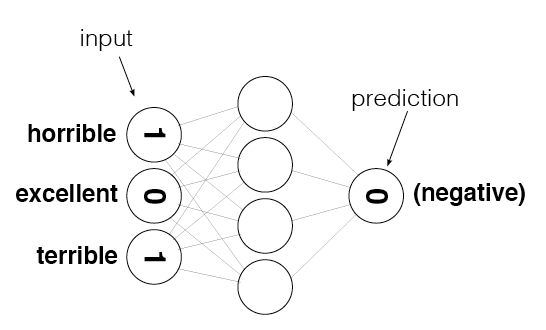

In [38]:
from IPython.display import Image
Image(filename='sentiment_network.png')

In [39]:
def update_input_layer(review):
    
    global layer_0
    
    # clear out previous state, reset the layer to be all 0s
    layer_0 *= 0
    for word in review.split(" "):
        layer_0[0][word2index[word]] += 1

update_input_layer(reviews[0])

In [40]:
layer_0

array([[18.,  0.,  0., ...,  0.,  0.,  0.]])

In [42]:
review_counter = Counter()

In [43]:
for word in reviews[0].split(" "):
    review_counter[word] += 1

In [44]:
review_counter.most_common()

[('.', 27),
 ('', 18),
 ('the', 9),
 ('to', 6),
 ('high', 5),
 ('i', 5),
 ('bromwell', 4),
 ('is', 4),
 ('a', 4),
 ('teachers', 4),
 ('that', 4),
 ('of', 4),
 ('it', 2),
 ('at', 2),
 ('as', 2),
 ('school', 2),
 ('my', 2),
 ('in', 2),
 ('me', 2),
 ('students', 2),
 ('their', 2),
 ('student', 2),
 ('cartoon', 1),
 ('comedy', 1),
 ('ran', 1),
 ('same', 1),
 ('time', 1),
 ('some', 1),
 ('other', 1),
 ('programs', 1),
 ('about', 1),
 ('life', 1),
 ('such', 1),
 ('years', 1),
 ('teaching', 1),
 ('profession', 1),
 ('lead', 1),
 ('believe', 1),
 ('s', 1),
 ('satire', 1),
 ('much', 1),
 ('closer', 1),
 ('reality', 1),
 ('than', 1),
 ('scramble', 1),
 ('survive', 1),
 ('financially', 1),
 ('insightful', 1),
 ('who', 1),
 ('can', 1),
 ('see', 1),
 ('right', 1),
 ('through', 1),
 ('pathetic', 1),
 ('pomp', 1),
 ('pettiness', 1),
 ('whole', 1),
 ('situation', 1),
 ('all', 1),
 ('remind', 1),
 ('schools', 1),
 ('knew', 1),
 ('and', 1),
 ('when', 1),
 ('saw', 1),
 ('episode', 1),
 ('which', 1),
 ('r

# Project 4: Reducing Noise in Our Input Data<a id='project_4'></a>

**TODO:** Attempt to reduce the noise in the input data like Andrew did in the previous video. Specifically, do the following:
* Copy the `SentimentNetwork` class you created earlier into the following cell.
* Modify `update_input_layer` so it does not count how many times each word is used, but rather just stores whether or not a word was used. 

In [45]:
# TODO: -Copy the SentimentNetwork class from Projet 3 lesson
import time
import sys
import numpy as np

# Encapsulate our neural network in a class
class SentimentNetwork:
    def __init__(self, reviews, labels, hidden_nodes = 10, learning_rate = 0.1):
        """Create a SentimenNetwork with the given settings
        Args:
            reviews(list) - List of reviews used for training
            labels(list) - List of POSITIVE/NEGATIVE labels associated with the given reviews
            hidden_nodes(int) - Number of nodes to create in the hidden layer
            learning_rate(float) - Learning rate to use while training
        
        """
        # Assign a seed to our random number generator to ensure we get
        # reproducable results during development 
        np.random.seed(1)

        # process the reviews and their associated labels so that everything
        # is ready for training
        self.pre_process_data(reviews, labels)
        
        # Build the network to have the number of hidden nodes and the learning rate that
        # were passed into this initializer. Make the same number of input nodes as
        # there are vocabulary words and create a single output node.
        self.init_network(len(self.review_vocab),hidden_nodes, 1, learning_rate)

    def pre_process_data(self, reviews, labels):
        
        review_vocab = set()
        # TODO: populate review_vocab with all of the words in the given reviews
        #       Remember to split reviews into individual words 
        #       using "split(' ')" instead of "split()".
        for review in reviews:
            for word in review.split(' '):
                review_vocab.add(word)
        
        # Convert the vocabulary set to a list so we can access words via indices
        self.review_vocab = list(review_vocab)
        
        label_vocab = set()
        # TODO: populate label_vocab with all of the words in the given labels.
        #       There is no need to split the labels because each one is a single word.
        for label in labels:
            label_vocab.add(label)
        
        # Convert the label vocabulary set to a list so we can access labels via indices
        self.label_vocab = list(label_vocab)
        
        # Store the sizes of the review and label vocabularies.
        self.review_vocab_size = len(self.review_vocab)
        self.label_vocab_size = len(self.label_vocab)
        
        # Create a dictionary of words in the vocabulary mapped to index positions
        self.word2index = {}
        # TODO: populate self.word2index with indices for all the words in self.review_vocab
        #       like you saw earlier in the notebook
        for i,word in enumerate(self.review_vocab):
            self.word2index[word]=i 
            
        # Create a dictionary of labels mapped to index positions
        self.label2index = {}
        # TODO: do the same thing you did for self.word2index and self.review_vocab, 
        #       but for self.label2index and self.label_vocab instead
        for i,label in enumerate(self.label_vocab):
            self.label2index[label]=i 
         
        
    def init_network(self, input_nodes, hidden_nodes, output_nodes, learning_rate):
        # Store the number of nodes in input, hidden, and output layers.
        self.input_nodes = input_nodes
        self.hidden_nodes = hidden_nodes
        self.output_nodes = output_nodes

        # Store the learning rate
        self.learning_rate = learning_rate

        # Initialize weights
        
        # TODO: initialize self.weights_0_1 as a matrix of zeros. These are the weights between
        #       the input layer and the hidden layer.
        self.weights_0_1 = np.zeros((input_nodes,hidden_nodes))
        
        # TODO: initialize self.weights_1_2 as a matrix of random values. 
        #       These are the weights between the hidden layer and the output layer.
#         self.weights_1_2 = np.zeros((hidden_nodes,output_nodes))
        self.weights_1_2 = np.random.normal(0.0, self.output_nodes**-0.5, 
                                                (self.hidden_nodes, self.output_nodes))
        
        
        # TODO: Create the input layer, a two-dimensional matrix with shape 
        #       1 x input_nodes, with all values initialized to zero
        self.layer_0 = np.zeros((1,input_nodes))
    
        
    def update_input_layer(self,review):
        # TODO: You can copy most of the code you wrote for update_input_layer 
        #       earlier in this notebook. 
        #
        #       However, MAKE SURE YOU CHANGE ALL VARIABLES TO REFERENCE
        #       THE VERSIONS STORED IN THIS OBJECT, NOT THE GLOBAL OBJECTS.
        #       For example, replace "layer_0 *= 0" with "self.layer_0 *= 0"
        
        # clear out previous state by resetting the layer to be all 0s
        self.layer_0 *= 0
        
        for word in review.split(" "):
            if (word in self.word2index.keys()):
                self.layer_0[0][self.word2index[word]] = 1
                
    def get_target_for_label(self,label):
        # TODO: Copy the code you wrote for get_target_for_label 
        #       earlier in this notebook. 
        if label == "POSITIVE":
            return 1
        else : return 0
        
    def sigmoid(self,x):
        # TODO: Return the result of calculating the sigmoid activation function
        #       shown in the lectures
        return 1/(1+np.exp(-x)) 
    
    def sigmoid_output_2_derivative(self,output):
        # TODO: Return the derivative of the sigmoid activation function, 
        #       where "output" is the original output from the sigmoid fucntion 
        return output*(1-output)

    def train(self, training_reviews, training_labels):
        
        # make sure out we have a matching number of reviews and labels
        assert (len(training_reviews) == len(training_labels))

        # Keep track of correct predictions to display accuracy during training
        correct_so_far = 0

        # Remember when we started for printing time statistics
        start = time.time()

        # loop through all the given reviews and run a forward and backward pass,
        # updating weights for every item
        for i in range(len(training_reviews)):

            # TODO: Get the next review and its correct label
            review = training_reviews[i]
            label = training_labels[i]
            output = np.array(self.get_target_for_label(label))
            output = output.reshape((1,1))
            # print(review)
            # print(output)

            # print(review)
            # print(label)
            self.update_input_layer(review)

            # TODO: Implement the forward pass through the network.
            #       That means use the given review to update the input layer,
            #       then calculate values for the hidden layer,
            #       and finally calculate the output layer.
            #
            #       Do not use an activation function for the hidden layer,
            #       but use the sigmoid activation function for the output layer.

            # update_input_layer(review)
            # output = get_target_for_label(label)

            hidden_layer_input = np.dot(self.layer_0,self.weights_0_1)
            # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
            output_layer_input = np.dot(hidden_layer_input,self.weights_1_2)
            # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
            output_layer_output = self.sigmoid(output_layer_input)
            # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
            # print("Actual output ", output, "\nShape ", output.shape)
            output_layer_error = output_layer_output - output
            # print("Output Layer Error ", output_layer_error, "\nShape ", output_layer_error.shape)
            output_layer_error_term = output_layer_error * self.sigmoid_output_2_derivative(output_layer_output)
            # print("Output Layer Error Term ", output_layer_error_term, "\nShape ", output_layer_error_term.shape)

            # TODO: Implement the back propagation pass here.
            #       That means calculate the error for the forward pass's prediction
            #       and update the weights in the network according to their
            #       contributions toward the error, as calculated via the
            #       gradient descent and back propagation algorithms you
            #       learned in class.


            # print("Weight Shape ",self.weights_1_2.shape)
            # print("Output Layer Error Term Shape ",output_layer_error_term.shape)
            hidden_layer_error = np.dot(output_layer_error_term,self.weights_1_2.T)
            # print("Hidden layer error ",hidden_layer_error," Shape ",hidden_layer_error.shape)
            hidden_layer_error_term = hidden_layer_error
            # print("Hidden layer error term",hidden_layer_error_term, " Shape ", hidden_layer_error_term.shape)

            delta_weight_h_o = np.zeros((self.hidden_nodes,self.output_nodes))
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Output Layer Error term ",output_layer_error_term," Shape ",output_layer_error_term.shape)
            # print("Hidden Layer Output ",hidden_layer_input," Shape ",hidden_layer_input.shape)
            delta_weight_h_o += (output_layer_error_term*hidden_layer_input.T)
            # print("Hidden to output delta weight ", delta_weight_h_o, " Shape ", delta_weight_h_o.shape)
            # print("Weight Hidden to Output ",self.weights_1_2," Shape ",self.weights_1_2.shape)
            self.weights_1_2 -=delta_weight_h_o * self.learning_rate
            # print("Weight Hidden to Output ", self.weights_1_2, " Shape ", self.weights_1_2.shape)

            delta_weight_i_h = np.zeros((self.input_nodes,self.hidden_nodes))
            delta_weight_i_h += (hidden_layer_error_term * self.layer_0.T)
            self.weights_0_1 -= delta_weight_i_h * self.learning_rate
            # print("Weight Input to Hidden", self.weights_0_1, " Shape ", self.weights_0_1.shape)





            # TODO: Keep track of correct predictions. To determine if the prediction was
            #       correct, check that the absolute value of the output error
            #       is less than 0.5. If so, add one to the correct_so_far count.

            # For debug purposes, print out our prediction accuracy and speed
            # throughout the training process.

            print("Layer2",output_layer_output)
            if (output_layer_output[0] >= 0.5 and label == 'POSITIVE'):
                correct_so_far += 1
            elif (output_layer_output[0] < 0.5 and label == 'NEGATIVE'):
                correct_so_far += 1

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0

            sys.stdout.write("\rProgress:" + str(100 * i / float(len(training_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct_so_far) + " #Trained:" + str(i + 1) \
                             + " Training Accuracy:" + str(correct_so_far * 100 / float(i + 1))[:4] + "%")
            if (i % 2500 == 0):
                print("")
    
    def test(self, testing_reviews, testing_labels):
        """
        Attempts to predict the labels for the given testing_reviews,
        and uses the test_labels to calculate the accuracy of those predictions.
        """
        
        # keep track of how many correct predictions we make
        correct = 0

        # we'll time how many predictions per second we make
        start = time.time()

        # Loop through each of the given reviews and call run to predict
        # its label. 
        for i in range(len(testing_reviews)):
            pred = self.run(testing_reviews[i])
            if(pred == testing_labels[i]):
                correct += 1
            
            # For debug purposes, print out our prediction accuracy and speed 
            # throughout the prediction process. 

            elapsed_time = float(time.time() - start)
            reviews_per_second = i / elapsed_time if elapsed_time > 0 else 0
            
            sys.stdout.write("\rProgress:" + str(100 * i/float(len(testing_reviews)))[:4] \
                             + "% Speed(reviews/sec):" + str(reviews_per_second)[0:5] \
                             + " #Correct:" + str(correct) + " #Tested:" + str(i+1) \
                             + " Testing Accuracy:" + str(correct * 100 / float(i+1))[:4] + "%")
    
    def run(self, review):
        """
        Returns a POSITIVE or NEGATIVE prediction for the given review.
        """
        # TODO: Run a forward pass through the network, like you did in the
        #       "train" function. That means use the given review to 
        #       update the input layer, then calculate values for the hidden layer,
        #       and finally calculate the output layer.
        #
        #       Note: The review passed into this function for prediction 
        #             might come from anywhere, so you should convert it 
        #             to lower case prior to using it.
        
        self.update_input_layer(review.lower())
        
        hidden_layer_input = np.dot(self.layer_0, self.weights_0_1)
        # print("Hidden Layer Input ",hidden_layer_input,"\nShape ",hidden_layer_input.shape)
        output_layer_input = np.dot(hidden_layer_input, self.weights_1_2)
        # print("Output Layer Input ", output_layer_input, "\nShape ", output_layer_input.shape)
        output_layer_output = self.sigmoid(output_layer_input)
        # print("Output Layer output ", output_layer_output, "\nShape ", output_layer_output.shape)
        # print("Actual output ", output, "\nShape ", output.shape)
        
        # TODO: The output layer should now contain a prediction. 
        #       Return `POSITIVE` for predictions greater-than-or-equal-to `0.5`, 
        #       and `NEGATIVE` otherwise.
        if (output_layer_output[0] >= 0.5):
            return "POSITIVE"
        else:
            return "NEGATIVE"

   

Run the following cell to recreate the network and train it. Notice we've gone back to the higher learning rate of `0.1`.

In [46]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

Layer2 [[0.5]]
Progress:0.0% Speed(reviews/sec):0.0 #Correct:1 #Trained:1 Training Accuracy:100.%
Layer2 [[0.96741356]]
Progress:0.00% Speed(reviews/sec):34.96 #Correct:1 #Trained:2 Training Accuracy:50.0%Layer2 [[0.9862216]]
Progress:0.00% Speed(reviews/sec):50.71 #Correct:2 #Trained:3 Training Accuracy:66.6%Layer2 [[0.98878042]]
Progress:0.01% Speed(reviews/sec):60.32 #Correct:2 #Trained:4 Training Accuracy:50.0%Layer2 [[0.90250513]]
Progress:0.01% Speed(reviews/sec):66.48 #Correct:3 #Trained:5 Training Accuracy:60.0%Layer2 [[0.89512687]]
Progress:0.02% Speed(reviews/sec):71.55 #Correct:3 #Trained:6 Training Accuracy:50.0%Layer2 [[0.47395133]]
Progress:0.02% Speed(reviews/sec):74.03 #Correct:3 #Trained:7 Training Accuracy:42.8%Layer2 [[0.97345099]]
Progress:0.02% Speed(reviews/sec):75.78 #Correct:3 #Trained:8 Training Accuracy:37.5%Layer2 [[0.91779555]]
Progress:0.03% Speed(reviews/sec):77.05 #Correct:4 #Trained:9 Training Accuracy:44.4%Layer2 [[0.95438818]]
Progress:0.03% Speed(revi

Progress:0.32% Speed(reviews/sec):94.44 #Correct:35 #Trained:79 Training Accuracy:44.3%Layer2 [[0.02331254]]
Progress:0.32% Speed(reviews/sec):94.56 #Correct:36 #Trained:80 Training Accuracy:45.0%Layer2 [[0.00016434]]
Progress:0.33% Speed(reviews/sec):94.53 #Correct:36 #Trained:81 Training Accuracy:44.4%Layer2 [[0.00291195]]
Progress:0.33% Speed(reviews/sec):94.65 #Correct:37 #Trained:82 Training Accuracy:45.1%Layer2 [[0.00181583]]
Progress:0.34% Speed(reviews/sec):94.73 #Correct:37 #Trained:83 Training Accuracy:44.5%Layer2 [[0.00216669]]
Progress:0.34% Speed(reviews/sec):94.87 #Correct:38 #Trained:84 Training Accuracy:45.2%Layer2 [[0.00054868]]
Progress:0.35% Speed(reviews/sec):94.87 #Correct:38 #Trained:85 Training Accuracy:44.7%Layer2 [[0.00381209]]
Progress:0.35% Speed(reviews/sec):94.96 #Correct:39 #Trained:86 Training Accuracy:45.3%Layer2 [[0.00092892]]
Progress:0.35% Speed(reviews/sec):94.96 #Correct:39 #Trained:87 Training Accuracy:44.8%Layer2 [[0.00068777]]
Progress:0.36% Spee

Progress:0.64% Speed(reviews/sec):93.47 #Correct:76 #Trained:156 Training Accuracy:48.7%Layer2 [[0.26599973]]
Progress:0.65% Speed(reviews/sec):93.42 #Correct:76 #Trained:157 Training Accuracy:48.4%Layer2 [[0.23865956]]
Progress:0.65% Speed(reviews/sec):93.37 #Correct:77 #Trained:158 Training Accuracy:48.7%Layer2 [[0.99631034]]
Progress:0.65% Speed(reviews/sec):93.29 #Correct:78 #Trained:159 Training Accuracy:49.0%Layer2 [[0.00302117]]
Progress:0.66% Speed(reviews/sec):93.22 #Correct:79 #Trained:160 Training Accuracy:49.3%Layer2 [[0.96088669]]
Progress:0.66% Speed(reviews/sec):93.15 #Correct:80 #Trained:161 Training Accuracy:49.6%Layer2 [[0.01893555]]
Progress:0.67% Speed(reviews/sec):93.12 #Correct:81 #Trained:162 Training Accuracy:50.0%Layer2 [[0.23646485]]
Progress:0.67% Speed(reviews/sec):93.05 #Correct:81 #Trained:163 Training Accuracy:49.6%Layer2 [[0.66461238]]
Progress:0.67% Speed(reviews/sec):93.06 #Correct:81 #Trained:164 Training Accuracy:49.3%Layer2 [[0.32171095]]
Progress:0

Progress:0.97% Speed(reviews/sec):93.42 #Correct:132 #Trained:234 Training Accuracy:56.4%Layer2 [[0.99079589]]
Progress:0.97% Speed(reviews/sec):93.37 #Correct:133 #Trained:235 Training Accuracy:56.5%Layer2 [[0.09586898]]
Progress:0.97% Speed(reviews/sec):93.32 #Correct:134 #Trained:236 Training Accuracy:56.7%Layer2 [[0.9911037]]
Progress:0.98% Speed(reviews/sec):93.26 #Correct:135 #Trained:237 Training Accuracy:56.9%Layer2 [[0.72107509]]
Progress:0.98% Speed(reviews/sec):93.22 #Correct:135 #Trained:238 Training Accuracy:56.7%Layer2 [[0.97854341]]
Progress:0.99% Speed(reviews/sec):93.14 #Correct:136 #Trained:239 Training Accuracy:56.9%Layer2 [[0.00193553]]
Progress:0.99% Speed(reviews/sec):93.11 #Correct:137 #Trained:240 Training Accuracy:57.0%Layer2 [[0.78066304]]
Progress:1.0% Speed(reviews/sec):93.05 #Correct:138 #Trained:241 Training Accuracy:57.2%Layer2 [[3.40768415e-06]]
Progress:1.00% Speed(reviews/sec):93.00 #Correct:139 #Trained:242 Training Accuracy:57.4%Layer2 [[0.92553769]]

Progress:1.28% Speed(reviews/sec):92.65 #Correct:185 #Trained:309 Training Accuracy:59.8%Layer2 [[0.02287206]]
Progress:1.28% Speed(reviews/sec):92.67 #Correct:186 #Trained:310 Training Accuracy:60.0%Layer2 [[0.98318645]]
Progress:1.29% Speed(reviews/sec):92.62 #Correct:187 #Trained:311 Training Accuracy:60.1%Layer2 [[0.00173967]]
Progress:1.29% Speed(reviews/sec):92.60 #Correct:188 #Trained:312 Training Accuracy:60.2%Layer2 [[0.00985986]]
Progress:1.3% Speed(reviews/sec):92.55 #Correct:188 #Trained:313 Training Accuracy:60.0%Layer2 [[0.16302548]]
Progress:1.30% Speed(reviews/sec):92.53 #Correct:189 #Trained:314 Training Accuracy:60.1%Layer2 [[0.04402981]]
Progress:1.30% Speed(reviews/sec):92.50 #Correct:189 #Trained:315 Training Accuracy:60.0%Layer2 [[0.36875981]]
Progress:1.31% Speed(reviews/sec):92.47 #Correct:190 #Trained:316 Training Accuracy:60.1%Layer2 [[0.0114085]]
Progress:1.31% Speed(reviews/sec):92.44 #Correct:190 #Trained:317 Training Accuracy:59.9%Layer2 [[7.72586838e-11]]

Progress:1.64% Speed(reviews/sec):90.29 #Correct:246 #Trained:395 Training Accuracy:62.2%Layer2 [[0.99888872]]
Progress:1.64% Speed(reviews/sec):90.31 #Correct:246 #Trained:396 Training Accuracy:62.1%Layer2 [[0.99999999]]
Progress:1.65% Speed(reviews/sec):90.29 #Correct:247 #Trained:397 Training Accuracy:62.2%Layer2 [[0.99507053]]
Progress:1.65% Speed(reviews/sec):90.28 #Correct:247 #Trained:398 Training Accuracy:62.0%Layer2 [[0.9999738]]
Progress:1.65% Speed(reviews/sec):90.26 #Correct:248 #Trained:399 Training Accuracy:62.1%Layer2 [[0.98196419]]
Progress:1.66% Speed(reviews/sec):90.25 #Correct:248 #Trained:400 Training Accuracy:62.0%Layer2 [[0.99938228]]
Progress:1.66% Speed(reviews/sec):90.20 #Correct:249 #Trained:401 Training Accuracy:62.0%Layer2 [[0.98622375]]
Progress:1.67% Speed(reviews/sec):90.19 #Correct:249 #Trained:402 Training Accuracy:61.9%Layer2 [[0.99918294]]
Progress:1.67% Speed(reviews/sec):90.16 #Correct:250 #Trained:403 Training Accuracy:62.0%Layer2 [[0.94155081]]
Pr

Progress:2.00% Speed(reviews/sec):89.06 #Correct:299 #Trained:483 Training Accuracy:61.9%Layer2 [[0.96669156]]
Progress:2.01% Speed(reviews/sec):89.06 #Correct:299 #Trained:484 Training Accuracy:61.7%Layer2 [[0.00162821]]
Progress:2.01% Speed(reviews/sec):88.98 #Correct:299 #Trained:485 Training Accuracy:61.6%Layer2 [[0.90199891]]
Progress:2.02% Speed(reviews/sec):88.95 #Correct:299 #Trained:486 Training Accuracy:61.5%Layer2 [[0.00033847]]
Progress:2.02% Speed(reviews/sec):88.91 #Correct:299 #Trained:487 Training Accuracy:61.3%Layer2 [[5.74171135e-05]]
Progress:2.02% Speed(reviews/sec):88.90 #Correct:300 #Trained:488 Training Accuracy:61.4%Layer2 [[0.32807603]]
Progress:2.03% Speed(reviews/sec):88.88 #Correct:300 #Trained:489 Training Accuracy:61.3%Layer2 [[0.0002632]]
Progress:2.03% Speed(reviews/sec):88.87 #Correct:301 #Trained:490 Training Accuracy:61.4%Layer2 [[0.59769576]]
Progress:2.04% Speed(reviews/sec):88.85 #Correct:302 #Trained:491 Training Accuracy:61.5%Layer2 [[0.117828]]


Progress:2.34% Speed(reviews/sec):87.12 #Correct:348 #Trained:564 Training Accuracy:61.7%Layer2 [[0.99999292]]
Progress:2.35% Speed(reviews/sec):87.10 #Correct:349 #Trained:565 Training Accuracy:61.7%Layer2 [[0.00018796]]
Progress:2.35% Speed(reviews/sec):87.08 #Correct:350 #Trained:566 Training Accuracy:61.8%Layer2 [[0.99999979]]
Progress:2.35% Speed(reviews/sec):87.07 #Correct:351 #Trained:567 Training Accuracy:61.9%Layer2 [[0.01586549]]
Progress:2.36% Speed(reviews/sec):87.07 #Correct:352 #Trained:568 Training Accuracy:61.9%Layer2 [[0.99999258]]
Progress:2.36% Speed(reviews/sec):87.05 #Correct:353 #Trained:569 Training Accuracy:62.0%Layer2 [[0.99576997]]
Progress:2.37% Speed(reviews/sec):87.05 #Correct:353 #Trained:570 Training Accuracy:61.9%Layer2 [[0.99979474]]
Progress:2.37% Speed(reviews/sec):87.03 #Correct:354 #Trained:571 Training Accuracy:61.9%Layer2 [[0.02513963]]
Progress:2.37% Speed(reviews/sec):87.01 #Correct:355 #Trained:572 Training Accuracy:62.0%Layer2 [[0.99999997]]
P

Progress:2.7% Speed(reviews/sec):86.48 #Correct:412 #Trained:649 Training Accuracy:63.4%Layer2 [[0.94744172]]
Progress:2.70% Speed(reviews/sec):86.51 #Correct:412 #Trained:650 Training Accuracy:63.3%Layer2 [[0.00516109]]
Progress:2.70% Speed(reviews/sec):86.49 #Correct:412 #Trained:651 Training Accuracy:63.2%Layer2 [[0.95149732]]
Progress:2.71% Speed(reviews/sec):86.49 #Correct:412 #Trained:652 Training Accuracy:63.1%Layer2 [[0.86973905]]
Progress:2.71% Speed(reviews/sec):86.48 #Correct:413 #Trained:653 Training Accuracy:63.2%Layer2 [[0.17088356]]
Progress:2.72% Speed(reviews/sec):86.49 #Correct:414 #Trained:654 Training Accuracy:63.3%Layer2 [[0.01595827]]
Progress:2.72% Speed(reviews/sec):86.48 #Correct:414 #Trained:655 Training Accuracy:63.2%Layer2 [[0.99911418]]
Progress:2.72% Speed(reviews/sec):86.48 #Correct:414 #Trained:656 Training Accuracy:63.1%Layer2 [[0.97229839]]
Progress:2.73% Speed(reviews/sec):86.48 #Correct:415 #Trained:657 Training Accuracy:63.1%Layer2 [[0.99906338]]
Pr

Progress:3.02% Speed(reviews/sec):87.12 #Correct:456 #Trained:726 Training Accuracy:62.8%Layer2 [[0.33856175]]
Progress:3.02% Speed(reviews/sec):87.13 #Correct:456 #Trained:727 Training Accuracy:62.7%Layer2 [[0.99991441]]
Progress:3.02% Speed(reviews/sec):87.14 #Correct:456 #Trained:728 Training Accuracy:62.6%Layer2 [[1.]]
Progress:3.03% Speed(reviews/sec):87.13 #Correct:457 #Trained:729 Training Accuracy:62.6%Layer2 [[0.89399908]]
Progress:3.03% Speed(reviews/sec):87.13 #Correct:457 #Trained:730 Training Accuracy:62.6%Layer2 [[0.97981028]]
Progress:3.04% Speed(reviews/sec):87.13 #Correct:458 #Trained:731 Training Accuracy:62.6%Layer2 [[0.87218594]]
Progress:3.04% Speed(reviews/sec):87.13 #Correct:458 #Trained:732 Training Accuracy:62.5%Layer2 [[0.81520367]]
Progress:3.05% Speed(reviews/sec):87.12 #Correct:459 #Trained:733 Training Accuracy:62.6%Layer2 [[0.56897305]]
Progress:3.05% Speed(reviews/sec):87.13 #Correct:459 #Trained:734 Training Accuracy:62.5%Layer2 [[0.47829631]]
Progress:

Progress:3.33% Speed(reviews/sec):87.45 #Correct:503 #Trained:802 Training Accuracy:62.7%Layer2 [[0.00164818]]
Progress:3.34% Speed(reviews/sec):87.45 #Correct:503 #Trained:803 Training Accuracy:62.6%Layer2 [[1.7783155e-05]]
Progress:3.34% Speed(reviews/sec):87.45 #Correct:504 #Trained:804 Training Accuracy:62.6%Layer2 [[0.0031127]]
Progress:3.35% Speed(reviews/sec):87.44 #Correct:504 #Trained:805 Training Accuracy:62.6%Layer2 [[1.51021273e-07]]
Progress:3.35% Speed(reviews/sec):87.43 #Correct:505 #Trained:806 Training Accuracy:62.6%Layer2 [[0.00097249]]
Progress:3.35% Speed(reviews/sec):87.43 #Correct:505 #Trained:807 Training Accuracy:62.5%Layer2 [[0.01314352]]
Progress:3.36% Speed(reviews/sec):87.43 #Correct:506 #Trained:808 Training Accuracy:62.6%Layer2 [[0.99999997]]
Progress:3.36% Speed(reviews/sec):87.41 #Correct:507 #Trained:809 Training Accuracy:62.6%Layer2 [[0.0295683]]
Progress:3.37% Speed(reviews/sec):87.42 #Correct:508 #Trained:810 Training Accuracy:62.7%Layer2 [[0.9981313

Progress:3.69% Speed(reviews/sec):86.85 #Correct:563 #Trained:888 Training Accuracy:63.4%Layer2 [[0.26041398]]
Progress:3.7% Speed(reviews/sec):86.81 #Correct:563 #Trained:889 Training Accuracy:63.3%Layer2 [[0.00085928]]
Progress:3.70% Speed(reviews/sec):86.80 #Correct:564 #Trained:890 Training Accuracy:63.3%Layer2 [[0.98212693]]
Progress:3.70% Speed(reviews/sec):86.79 #Correct:565 #Trained:891 Training Accuracy:63.4%Layer2 [[4.72030498e-06]]
Progress:3.71% Speed(reviews/sec):86.78 #Correct:566 #Trained:892 Training Accuracy:63.4%Layer2 [[0.99540751]]
Progress:3.71% Speed(reviews/sec):86.77 #Correct:567 #Trained:893 Training Accuracy:63.4%Layer2 [[2.95430036e-12]]
Progress:3.72% Speed(reviews/sec):86.77 #Correct:568 #Trained:894 Training Accuracy:63.5%Layer2 [[0.99850593]]
Progress:3.72% Speed(reviews/sec):86.77 #Correct:569 #Trained:895 Training Accuracy:63.5%Layer2 [[5.49032407e-05]]
Progress:3.72% Speed(reviews/sec):86.77 #Correct:570 #Trained:896 Training Accuracy:63.6%Layer2 [[0.9

Progress:4.00% Speed(reviews/sec):86.95 #Correct:620 #Trained:963 Training Accuracy:64.3%Layer2 [[0.46368528]]
Progress:4.01% Speed(reviews/sec):86.96 #Correct:621 #Trained:964 Training Accuracy:64.4%Layer2 [[0.9957011]]
Progress:4.01% Speed(reviews/sec):86.97 #Correct:622 #Trained:965 Training Accuracy:64.4%Layer2 [[2.15794156e-11]]
Progress:4.02% Speed(reviews/sec):86.99 #Correct:623 #Trained:966 Training Accuracy:64.4%Layer2 [[0.44385862]]
Progress:4.02% Speed(reviews/sec):86.99 #Correct:623 #Trained:967 Training Accuracy:64.4%Layer2 [[0.89637457]]
Progress:4.02% Speed(reviews/sec):87.01 #Correct:623 #Trained:968 Training Accuracy:64.3%Layer2 [[0.99991953]]
Progress:4.03% Speed(reviews/sec):87.02 #Correct:624 #Trained:969 Training Accuracy:64.3%Layer2 [[0.45543578]]
Progress:4.03% Speed(reviews/sec):87.03 #Correct:625 #Trained:970 Training Accuracy:64.4%Layer2 [[0.90240589]]
Progress:4.04% Speed(reviews/sec):87.03 #Correct:626 #Trained:971 Training Accuracy:64.4%Layer2 [[0.00432696]

Progress:4.33% Speed(reviews/sec):87.48 #Correct:689 #Trained:1042 Training Accuracy:66.1%Layer2 [[0.99999889]]
Progress:4.34% Speed(reviews/sec):87.49 #Correct:690 #Trained:1043 Training Accuracy:66.1%Layer2 [[0.91805281]]
Progress:4.34% Speed(reviews/sec):87.51 #Correct:690 #Trained:1044 Training Accuracy:66.0%Layer2 [[0.9757545]]
Progress:4.35% Speed(reviews/sec):87.50 #Correct:691 #Trained:1045 Training Accuracy:66.1%Layer2 [[0.09689849]]
Progress:4.35% Speed(reviews/sec):87.52 #Correct:692 #Trained:1046 Training Accuracy:66.1%Layer2 [[0.99479916]]
Progress:4.35% Speed(reviews/sec):87.53 #Correct:693 #Trained:1047 Training Accuracy:66.1%Layer2 [[1.3441864e-06]]
Progress:4.36% Speed(reviews/sec):87.54 #Correct:694 #Trained:1048 Training Accuracy:66.2%Layer2 [[0.95782887]]
Progress:4.36% Speed(reviews/sec):87.55 #Correct:695 #Trained:1049 Training Accuracy:66.2%Layer2 [[0.00058859]]
Progress:4.37% Speed(reviews/sec):87.57 #Correct:696 #Trained:1050 Training Accuracy:66.2%Layer2 [[0.9

Progress:4.66% Speed(reviews/sec):87.90 #Correct:747 #Trained:1120 Training Accuracy:66.6%Layer2 [[0.63202424]]
Progress:4.66% Speed(reviews/sec):87.90 #Correct:748 #Trained:1121 Training Accuracy:66.7%Layer2 [[5.2956047e-05]]
Progress:4.67% Speed(reviews/sec):87.91 #Correct:749 #Trained:1122 Training Accuracy:66.7%Layer2 [[0.62893276]]
Progress:4.67% Speed(reviews/sec):87.92 #Correct:750 #Trained:1123 Training Accuracy:66.7%Layer2 [[0.03603151]]
Progress:4.67% Speed(reviews/sec):87.93 #Correct:751 #Trained:1124 Training Accuracy:66.8%Layer2 [[0.98267417]]
Progress:4.68% Speed(reviews/sec):87.94 #Correct:752 #Trained:1125 Training Accuracy:66.8%Layer2 [[0.00085623]]
Progress:4.68% Speed(reviews/sec):87.95 #Correct:753 #Trained:1126 Training Accuracy:66.8%Layer2 [[0.9889537]]
Progress:4.69% Speed(reviews/sec):87.96 #Correct:754 #Trained:1127 Training Accuracy:66.9%Layer2 [[2.3853215e-08]]
Progress:4.69% Speed(reviews/sec):87.96 #Correct:755 #Trained:1128 Training Accuracy:66.9%Layer2 [[

Progress:4.98% Speed(reviews/sec):88.21 #Correct:805 #Trained:1198 Training Accuracy:67.1%Layer2 [[0.99299667]]
Progress:4.99% Speed(reviews/sec):88.21 #Correct:806 #Trained:1199 Training Accuracy:67.2%Layer2 [[0.99687699]]
Progress:4.99% Speed(reviews/sec):88.21 #Correct:806 #Trained:1200 Training Accuracy:67.1%Layer2 [[0.99801163]]
Progress:5.0% Speed(reviews/sec):88.20 #Correct:807 #Trained:1201 Training Accuracy:67.1%Layer2 [[0.23628535]]
Progress:5.00% Speed(reviews/sec):88.20 #Correct:808 #Trained:1202 Training Accuracy:67.2%Layer2 [[0.88440076]]
Progress:5.00% Speed(reviews/sec):88.20 #Correct:809 #Trained:1203 Training Accuracy:67.2%Layer2 [[0.73141017]]
Progress:5.01% Speed(reviews/sec):88.19 #Correct:809 #Trained:1204 Training Accuracy:67.1%Layer2 [[3.7148688e-07]]
Progress:5.01% Speed(reviews/sec):88.18 #Correct:809 #Trained:1205 Training Accuracy:67.1%Layer2 [[9.9711453e-05]]
Progress:5.02% Speed(reviews/sec):88.17 #Correct:810 #Trained:1206 Training Accuracy:67.1%Layer2 [[

Progress:5.29% Speed(reviews/sec):88.23 #Correct:855 #Trained:1271 Training Accuracy:67.2%Layer2 [[1.]]
Progress:5.29% Speed(reviews/sec):88.21 #Correct:855 #Trained:1272 Training Accuracy:67.2%Layer2 [[0.99996587]]
Progress:5.3% Speed(reviews/sec):88.20 #Correct:856 #Trained:1273 Training Accuracy:67.2%Layer2 [[0.99997659]]
Progress:5.30% Speed(reviews/sec):88.20 #Correct:856 #Trained:1274 Training Accuracy:67.1%Layer2 [[0.99998294]]
Progress:5.30% Speed(reviews/sec):88.18 #Correct:857 #Trained:1275 Training Accuracy:67.2%Layer2 [[0.99998965]]
Progress:5.31% Speed(reviews/sec):88.18 #Correct:857 #Trained:1276 Training Accuracy:67.1%Layer2 [[0.99999685]]
Progress:5.31% Speed(reviews/sec):88.19 #Correct:858 #Trained:1277 Training Accuracy:67.1%Layer2 [[0.99865552]]
Progress:5.32% Speed(reviews/sec):88.20 #Correct:858 #Trained:1278 Training Accuracy:67.1%Layer2 [[0.99939055]]
Progress:5.32% Speed(reviews/sec):88.20 #Correct:859 #Trained:1279 Training Accuracy:67.1%Layer2 [[0.99999999]]
P

Progress:5.6% Speed(reviews/sec):88.29 #Correct:910 #Trained:1345 Training Accuracy:67.6%Layer2 [[3.54170757e-05]]
Progress:5.60% Speed(reviews/sec):88.29 #Correct:911 #Trained:1346 Training Accuracy:67.6%Layer2 [[0.93530708]]
Progress:5.60% Speed(reviews/sec):88.29 #Correct:912 #Trained:1347 Training Accuracy:67.7%Layer2 [[8.53944857e-07]]
Progress:5.61% Speed(reviews/sec):88.29 #Correct:913 #Trained:1348 Training Accuracy:67.7%Layer2 [[0.99871008]]
Progress:5.61% Speed(reviews/sec):88.28 #Correct:914 #Trained:1349 Training Accuracy:67.7%Layer2 [[0.6926147]]
Progress:5.62% Speed(reviews/sec):88.28 #Correct:914 #Trained:1350 Training Accuracy:67.7%Layer2 [[0.99374203]]
Progress:5.62% Speed(reviews/sec):88.28 #Correct:915 #Trained:1351 Training Accuracy:67.7%Layer2 [[0.10697208]]
Progress:5.62% Speed(reviews/sec):88.28 #Correct:916 #Trained:1352 Training Accuracy:67.7%Layer2 [[0.99888908]]
Progress:5.63% Speed(reviews/sec):88.27 #Correct:917 #Trained:1353 Training Accuracy:67.7%Layer2 [

Progress:5.91% Speed(reviews/sec):88.40 #Correct:957 #Trained:1420 Training Accuracy:67.3%Layer2 [[0.99991309]]
Progress:5.91% Speed(reviews/sec):88.40 #Correct:958 #Trained:1421 Training Accuracy:67.4%Layer2 [[0.51473265]]
Progress:5.92% Speed(reviews/sec):88.41 #Correct:958 #Trained:1422 Training Accuracy:67.3%Layer2 [[0.99999999]]
Progress:5.92% Speed(reviews/sec):88.41 #Correct:959 #Trained:1423 Training Accuracy:67.3%Layer2 [[4.57494494e-08]]
Progress:5.92% Speed(reviews/sec):88.42 #Correct:960 #Trained:1424 Training Accuracy:67.4%Layer2 [[0.93691787]]
Progress:5.93% Speed(reviews/sec):88.42 #Correct:961 #Trained:1425 Training Accuracy:67.4%Layer2 [[0.0010378]]
Progress:5.93% Speed(reviews/sec):88.43 #Correct:962 #Trained:1426 Training Accuracy:67.4%Layer2 [[0.93841838]]
Progress:5.94% Speed(reviews/sec):88.43 #Correct:963 #Trained:1427 Training Accuracy:67.4%Layer2 [[0.11222989]]
Progress:5.94% Speed(reviews/sec):88.44 #Correct:964 #Trained:1428 Training Accuracy:67.5%Layer2 [[0.

Progress:6.22% Speed(reviews/sec):88.52 #Correct:1006 #Trained:1496 Training Accuracy:67.2%Layer2 [[0.18888001]]
Progress:6.23% Speed(reviews/sec):88.52 #Correct:1006 #Trained:1497 Training Accuracy:67.2%Layer2 [[0.00032794]]
Progress:6.23% Speed(reviews/sec):88.52 #Correct:1007 #Trained:1498 Training Accuracy:67.2%Layer2 [[0.99592146]]
Progress:6.24% Speed(reviews/sec):88.53 #Correct:1008 #Trained:1499 Training Accuracy:67.2%Layer2 [[0.5898348]]
Progress:6.24% Speed(reviews/sec):88.53 #Correct:1008 #Trained:1500 Training Accuracy:67.2%Layer2 [[0.99994787]]
Progress:6.25% Speed(reviews/sec):88.53 #Correct:1009 #Trained:1501 Training Accuracy:67.2%Layer2 [[0.80998158]]
Progress:6.25% Speed(reviews/sec):88.54 #Correct:1009 #Trained:1502 Training Accuracy:67.1%Layer2 [[0.7803769]]
Progress:6.25% Speed(reviews/sec):88.54 #Correct:1010 #Trained:1503 Training Accuracy:67.1%Layer2 [[1.74210127e-09]]
Progress:6.26% Speed(reviews/sec):88.55 #Correct:1011 #Trained:1504 Training Accuracy:67.2%Lay

Progress:6.54% Speed(reviews/sec):88.61 #Correct:1064 #Trained:1572 Training Accuracy:67.6%Layer2 [[0.99994023]]
Progress:6.55% Speed(reviews/sec):88.60 #Correct:1065 #Trained:1573 Training Accuracy:67.7%Layer2 [[3.69640809e-08]]
Progress:6.55% Speed(reviews/sec):88.60 #Correct:1066 #Trained:1574 Training Accuracy:67.7%Layer2 [[7.63520242e-05]]
Progress:6.55% Speed(reviews/sec):88.59 #Correct:1066 #Trained:1575 Training Accuracy:67.6%Layer2 [[5.2029361e-09]]
Progress:6.56% Speed(reviews/sec):88.59 #Correct:1067 #Trained:1576 Training Accuracy:67.7%Layer2 [[0.78433172]]
Progress:6.56% Speed(reviews/sec):88.58 #Correct:1068 #Trained:1577 Training Accuracy:67.7%Layer2 [[1.20331966e-07]]
Progress:6.57% Speed(reviews/sec):88.58 #Correct:1069 #Trained:1578 Training Accuracy:67.7%Layer2 [[0.00105527]]
Progress:6.57% Speed(reviews/sec):88.57 #Correct:1069 #Trained:1579 Training Accuracy:67.7%Layer2 [[3.82702815e-09]]
Progress:6.57% Speed(reviews/sec):88.58 #Correct:1070 #Trained:1580 Training 

Progress:6.90% Speed(reviews/sec):88.33 #Correct:1126 #Trained:1659 Training Accuracy:67.8%Layer2 [[3.67782051e-06]]
Progress:6.91% Speed(reviews/sec):88.32 #Correct:1127 #Trained:1660 Training Accuracy:67.8%Layer2 [[0.89805556]]
Progress:6.91% Speed(reviews/sec):88.32 #Correct:1128 #Trained:1661 Training Accuracy:67.9%Layer2 [[0.00078274]]
Progress:6.92% Speed(reviews/sec):88.31 #Correct:1129 #Trained:1662 Training Accuracy:67.9%Layer2 [[0.45194264]]
Progress:6.92% Speed(reviews/sec):88.31 #Correct:1129 #Trained:1663 Training Accuracy:67.8%Layer2 [[8.57370084e-08]]
Progress:6.92% Speed(reviews/sec):88.29 #Correct:1130 #Trained:1664 Training Accuracy:67.9%Layer2 [[0.99950232]]
Progress:6.93% Speed(reviews/sec):88.29 #Correct:1131 #Trained:1665 Training Accuracy:67.9%Layer2 [[0.00021367]]
Progress:6.93% Speed(reviews/sec):88.28 #Correct:1132 #Trained:1666 Training Accuracy:67.9%Layer2 [[0.99996704]]
Progress:6.94% Speed(reviews/sec):88.27 #Correct:1133 #Trained:1667 Training Accuracy:67

Progress:7.21% Speed(reviews/sec):88.30 #Correct:1187 #Trained:1732 Training Accuracy:68.5%Layer2 [[0.98227194]]
Progress:7.21% Speed(reviews/sec):88.30 #Correct:1188 #Trained:1733 Training Accuracy:68.5%Layer2 [[0.05080849]]
Progress:7.22% Speed(reviews/sec):88.31 #Correct:1189 #Trained:1734 Training Accuracy:68.5%Layer2 [[0.93619557]]
Progress:7.22% Speed(reviews/sec):88.32 #Correct:1190 #Trained:1735 Training Accuracy:68.5%Layer2 [[0.00547213]]
Progress:7.22% Speed(reviews/sec):88.33 #Correct:1191 #Trained:1736 Training Accuracy:68.6%Layer2 [[0.00157138]]
Progress:7.23% Speed(reviews/sec):88.33 #Correct:1191 #Trained:1737 Training Accuracy:68.5%Layer2 [[2.71429206e-05]]
Progress:7.23% Speed(reviews/sec):88.34 #Correct:1192 #Trained:1738 Training Accuracy:68.5%Layer2 [[0.03955648]]
Progress:7.24% Speed(reviews/sec):88.34 #Correct:1192 #Trained:1739 Training Accuracy:68.5%Layer2 [[0.00030372]]
Progress:7.24% Speed(reviews/sec):88.35 #Correct:1193 #Trained:1740 Training Accuracy:68.5%L

Progress:7.57% Speed(reviews/sec):88.06 #Correct:1252 #Trained:1819 Training Accuracy:68.8%Layer2 [[0.009712]]
Progress:7.57% Speed(reviews/sec):88.06 #Correct:1253 #Trained:1820 Training Accuracy:68.8%Layer2 [[0.99984339]]
Progress:7.58% Speed(reviews/sec):88.06 #Correct:1254 #Trained:1821 Training Accuracy:68.8%Layer2 [[0.63067491]]
Progress:7.58% Speed(reviews/sec):88.05 #Correct:1254 #Trained:1822 Training Accuracy:68.8%Layer2 [[0.06811024]]
Progress:7.59% Speed(reviews/sec):88.04 #Correct:1254 #Trained:1823 Training Accuracy:68.7%Layer2 [[0.70991446]]
Progress:7.59% Speed(reviews/sec):88.04 #Correct:1254 #Trained:1824 Training Accuracy:68.7%Layer2 [[0.99183259]]
Progress:7.6% Speed(reviews/sec):88.03 #Correct:1255 #Trained:1825 Training Accuracy:68.7%Layer2 [[0.18018167]]
Progress:7.60% Speed(reviews/sec):88.02 #Correct:1256 #Trained:1826 Training Accuracy:68.7%Layer2 [[0.9978094]]
Progress:7.60% Speed(reviews/sec):88.01 #Correct:1257 #Trained:1827 Training Accuracy:68.8%Layer2 [[

Progress:7.88% Speed(reviews/sec):88.13 #Correct:1313 #Trained:1894 Training Accuracy:69.3%Layer2 [[0.98393796]]
Progress:7.89% Speed(reviews/sec):88.13 #Correct:1314 #Trained:1895 Training Accuracy:69.3%Layer2 [[6.27017267e-09]]
Progress:7.89% Speed(reviews/sec):88.13 #Correct:1315 #Trained:1896 Training Accuracy:69.3%Layer2 [[0.10099561]]
Progress:7.9% Speed(reviews/sec):88.13 #Correct:1315 #Trained:1897 Training Accuracy:69.3%Layer2 [[0.92358965]]
Progress:7.90% Speed(reviews/sec):88.14 #Correct:1315 #Trained:1898 Training Accuracy:69.2%Layer2 [[0.99995677]]
Progress:7.90% Speed(reviews/sec):88.14 #Correct:1316 #Trained:1899 Training Accuracy:69.2%Layer2 [[0.0013583]]
Progress:7.91% Speed(reviews/sec):88.14 #Correct:1317 #Trained:1900 Training Accuracy:69.3%Layer2 [[0.98926863]]
Progress:7.91% Speed(reviews/sec):88.15 #Correct:1318 #Trained:1901 Training Accuracy:69.3%Layer2 [[4.30312681e-08]]
Progress:7.92% Speed(reviews/sec):88.15 #Correct:1319 #Trained:1902 Training Accuracy:69.3

Progress:8.20% Speed(reviews/sec):87.47 #Correct:1366 #Trained:1971 Training Accuracy:69.3%Layer2 [[0.99999541]]
Progress:8.21% Speed(reviews/sec):87.46 #Correct:1366 #Trained:1972 Training Accuracy:69.2%Layer2 [[0.9999979]]
Progress:8.21% Speed(reviews/sec):87.40 #Correct:1367 #Trained:1973 Training Accuracy:69.2%Layer2 [[0.68493091]]
Progress:8.22% Speed(reviews/sec):87.36 #Correct:1367 #Trained:1974 Training Accuracy:69.2%Layer2 [[0.99226254]]
Progress:8.22% Speed(reviews/sec):87.35 #Correct:1368 #Trained:1975 Training Accuracy:69.2%Layer2 [[0.22814211]]
Progress:8.22% Speed(reviews/sec):87.32 #Correct:1369 #Trained:1976 Training Accuracy:69.2%Layer2 [[0.99987998]]
Progress:8.23% Speed(reviews/sec):87.31 #Correct:1370 #Trained:1977 Training Accuracy:69.2%Layer2 [[0.60704379]]
Progress:8.23% Speed(reviews/sec):87.30 #Correct:1370 #Trained:1978 Training Accuracy:69.2%Layer2 [[0.92889548]]
Progress:8.24% Speed(reviews/sec):87.30 #Correct:1371 #Trained:1979 Training Accuracy:69.2%Layer2

Progress:8.52% Speed(reviews/sec):86.80 #Correct:1426 #Trained:2047 Training Accuracy:69.6%Layer2 [[0.00704075]]
Progress:8.52% Speed(reviews/sec):86.80 #Correct:1427 #Trained:2048 Training Accuracy:69.6%Layer2 [[0.99217456]]
Progress:8.53% Speed(reviews/sec):86.79 #Correct:1428 #Trained:2049 Training Accuracy:69.6%Layer2 [[0.00013519]]
Progress:8.53% Speed(reviews/sec):86.79 #Correct:1429 #Trained:2050 Training Accuracy:69.7%Layer2 [[0.99928936]]
Progress:8.54% Speed(reviews/sec):86.78 #Correct:1430 #Trained:2051 Training Accuracy:69.7%Layer2 [[0.99969583]]
Progress:8.54% Speed(reviews/sec):86.78 #Correct:1430 #Trained:2052 Training Accuracy:69.6%Layer2 [[0.99999706]]
Progress:8.55% Speed(reviews/sec):86.77 #Correct:1431 #Trained:2053 Training Accuracy:69.7%Layer2 [[0.01077219]]
Progress:8.55% Speed(reviews/sec):86.77 #Correct:1432 #Trained:2054 Training Accuracy:69.7%Layer2 [[0.99966634]]
Progress:8.55% Speed(reviews/sec):86.76 #Correct:1433 #Trained:2055 Training Accuracy:69.7%Layer

Progress:8.85% Speed(reviews/sec):86.29 #Correct:1492 #Trained:2126 Training Accuracy:70.1%Layer2 [[0.9980121]]
Progress:8.85% Speed(reviews/sec):86.28 #Correct:1493 #Trained:2127 Training Accuracy:70.1%Layer2 [[0.80954486]]
Progress:8.86% Speed(reviews/sec):86.28 #Correct:1493 #Trained:2128 Training Accuracy:70.1%Layer2 [[0.17443521]]
Progress:8.86% Speed(reviews/sec):86.27 #Correct:1493 #Trained:2129 Training Accuracy:70.1%Layer2 [[5.55030887e-07]]
Progress:8.87% Speed(reviews/sec):86.27 #Correct:1494 #Trained:2130 Training Accuracy:70.1%Layer2 [[0.98610036]]
Progress:8.87% Speed(reviews/sec):86.27 #Correct:1495 #Trained:2131 Training Accuracy:70.1%Layer2 [[0.00535942]]
Progress:8.87% Speed(reviews/sec):86.26 #Correct:1496 #Trained:2132 Training Accuracy:70.1%Layer2 [[0.00302229]]
Progress:8.88% Speed(reviews/sec):86.26 #Correct:1496 #Trained:2133 Training Accuracy:70.1%Layer2 [[3.28376622e-07]]
Progress:8.88% Speed(reviews/sec):86.24 #Correct:1497 #Trained:2134 Training Accuracy:70.

Progress:9.19% Speed(reviews/sec):85.95 #Correct:1559 #Trained:2207 Training Accuracy:70.6%Layer2 [[0.01117351]]
Progress:9.19% Speed(reviews/sec):85.94 #Correct:1560 #Trained:2208 Training Accuracy:70.6%Layer2 [[0.95534834]]
Progress:9.2% Speed(reviews/sec):85.94 #Correct:1561 #Trained:2209 Training Accuracy:70.6%Layer2 [[0.00020822]]
Progress:9.20% Speed(reviews/sec):85.94 #Correct:1562 #Trained:2210 Training Accuracy:70.6%Layer2 [[0.92876932]]
Progress:9.20% Speed(reviews/sec):85.93 #Correct:1563 #Trained:2211 Training Accuracy:70.6%Layer2 [[0.01353985]]
Progress:9.21% Speed(reviews/sec):85.93 #Correct:1564 #Trained:2212 Training Accuracy:70.7%Layer2 [[0.50504654]]
Progress:9.21% Speed(reviews/sec):85.92 #Correct:1565 #Trained:2213 Training Accuracy:70.7%Layer2 [[0.04398762]]
Progress:9.22% Speed(reviews/sec):85.92 #Correct:1566 #Trained:2214 Training Accuracy:70.7%Layer2 [[0.99316988]]
Progress:9.22% Speed(reviews/sec):85.90 #Correct:1567 #Trained:2215 Training Accuracy:70.7%Layer2

Progress:9.53% Speed(reviews/sec):85.64 #Correct:1623 #Trained:2289 Training Accuracy:70.9%Layer2 [[0.99753869]]
Progress:9.53% Speed(reviews/sec):85.64 #Correct:1623 #Trained:2290 Training Accuracy:70.8%Layer2 [[0.00087942]]
Progress:9.54% Speed(reviews/sec):85.64 #Correct:1623 #Trained:2291 Training Accuracy:70.8%Layer2 [[4.53076982e-07]]
Progress:9.54% Speed(reviews/sec):85.63 #Correct:1624 #Trained:2292 Training Accuracy:70.8%Layer2 [[0.99988278]]
Progress:9.55% Speed(reviews/sec):85.63 #Correct:1625 #Trained:2293 Training Accuracy:70.8%Layer2 [[0.01757809]]
Progress:9.55% Speed(reviews/sec):85.63 #Correct:1626 #Trained:2294 Training Accuracy:70.8%Layer2 [[0.19024756]]
Progress:9.55% Speed(reviews/sec):85.63 #Correct:1626 #Trained:2295 Training Accuracy:70.8%Layer2 [[0.12400311]]
Progress:9.56% Speed(reviews/sec):85.63 #Correct:1627 #Trained:2296 Training Accuracy:70.8%Layer2 [[0.97268051]]
Progress:9.56% Speed(reviews/sec):85.61 #Correct:1628 #Trained:2297 Training Accuracy:70.8%L

Progress:9.87% Speed(reviews/sec):85.38 #Correct:1686 #Trained:2372 Training Accuracy:71.0%Layer2 [[0.9999967]]
Progress:9.88% Speed(reviews/sec):85.38 #Correct:1687 #Trained:2373 Training Accuracy:71.0%Layer2 [[1.62059258e-05]]
Progress:9.88% Speed(reviews/sec):85.37 #Correct:1688 #Trained:2374 Training Accuracy:71.1%Layer2 [[0.97020795]]
Progress:9.89% Speed(reviews/sec):85.37 #Correct:1689 #Trained:2375 Training Accuracy:71.1%Layer2 [[9.19767942e-05]]
Progress:9.89% Speed(reviews/sec):85.37 #Correct:1690 #Trained:2376 Training Accuracy:71.1%Layer2 [[0.99804588]]
Progress:9.9% Speed(reviews/sec):85.36 #Correct:1691 #Trained:2377 Training Accuracy:71.1%Layer2 [[1.29884242e-05]]
Progress:9.90% Speed(reviews/sec):85.36 #Correct:1692 #Trained:2378 Training Accuracy:71.1%Layer2 [[0.13110377]]
Progress:9.90% Speed(reviews/sec):85.36 #Correct:1692 #Trained:2379 Training Accuracy:71.1%Layer2 [[0.00104332]]
Progress:9.91% Speed(reviews/sec):85.36 #Correct:1693 #Trained:2380 Training Accuracy:

Progress:10.1% Speed(reviews/sec):84.94 #Correct:1741 #Trained:2448 Training Accuracy:71.1%Layer2 [[0.95947124]]
Progress:10.2% Speed(reviews/sec):84.91 #Correct:1742 #Trained:2449 Training Accuracy:71.1%Layer2 [[0.25710662]]
Progress:10.2% Speed(reviews/sec):84.90 #Correct:1743 #Trained:2450 Training Accuracy:71.1%Layer2 [[0.99999785]]
Progress:10.2% Speed(reviews/sec):84.88 #Correct:1744 #Trained:2451 Training Accuracy:71.1%Layer2 [[1.10361279e-07]]
Progress:10.2% Speed(reviews/sec):84.88 #Correct:1745 #Trained:2452 Training Accuracy:71.1%Layer2 [[0.99996091]]
Progress:10.2% Speed(reviews/sec):84.87 #Correct:1746 #Trained:2453 Training Accuracy:71.1%Layer2 [[2.77513706e-05]]
Progress:10.2% Speed(reviews/sec):84.86 #Correct:1747 #Trained:2454 Training Accuracy:71.1%Layer2 [[0.10019075]]
Progress:10.2% Speed(reviews/sec):84.86 #Correct:1747 #Trained:2455 Training Accuracy:71.1%Layer2 [[6.37624382e-06]]
Progress:10.2% Speed(reviews/sec):84.85 #Correct:1748 #Trained:2456 Training Accurac

Progress:10.5% Speed(reviews/sec):84.62 #Correct:1808 #Trained:2528 Training Accuracy:71.5%Layer2 [[0.99999359]]
Progress:10.5% Speed(reviews/sec):84.62 #Correct:1809 #Trained:2529 Training Accuracy:71.5%Layer2 [[0.05107758]]
Progress:10.5% Speed(reviews/sec):84.61 #Correct:1810 #Trained:2530 Training Accuracy:71.5%Layer2 [[0.7228113]]
Progress:10.5% Speed(reviews/sec):84.61 #Correct:1811 #Trained:2531 Training Accuracy:71.5%Layer2 [[0.12301232]]
Progress:10.5% Speed(reviews/sec):84.61 #Correct:1812 #Trained:2532 Training Accuracy:71.5%Layer2 [[0.99999821]]
Progress:10.5% Speed(reviews/sec):84.61 #Correct:1813 #Trained:2533 Training Accuracy:71.5%Layer2 [[0.72023621]]
Progress:10.5% Speed(reviews/sec):84.61 #Correct:1813 #Trained:2534 Training Accuracy:71.5%Layer2 [[0.99998697]]
Progress:10.5% Speed(reviews/sec):84.60 #Correct:1814 #Trained:2535 Training Accuracy:71.5%Layer2 [[0.86365232]]
Progress:10.5% Speed(reviews/sec):84.60 #Correct:1814 #Trained:2536 Training Accuracy:71.5%Layer2

Progress:10.8% Speed(reviews/sec):84.33 #Correct:1876 #Trained:2607 Training Accuracy:71.9%Layer2 [[0.40890053]]
Progress:10.8% Speed(reviews/sec):84.33 #Correct:1877 #Trained:2608 Training Accuracy:71.9%Layer2 [[0.99903708]]
Progress:10.8% Speed(reviews/sec):84.33 #Correct:1878 #Trained:2609 Training Accuracy:71.9%Layer2 [[0.00773827]]
Progress:10.8% Speed(reviews/sec):84.33 #Correct:1879 #Trained:2610 Training Accuracy:71.9%Layer2 [[0.98091815]]
Progress:10.8% Speed(reviews/sec):84.33 #Correct:1880 #Trained:2611 Training Accuracy:72.0%Layer2 [[0.02939089]]
Progress:10.8% Speed(reviews/sec):84.33 #Correct:1881 #Trained:2612 Training Accuracy:72.0%Layer2 [[0.99933799]]
Progress:10.8% Speed(reviews/sec):84.32 #Correct:1882 #Trained:2613 Training Accuracy:72.0%Layer2 [[6.33915207e-05]]
Progress:10.8% Speed(reviews/sec):84.32 #Correct:1883 #Trained:2614 Training Accuracy:72.0%Layer2 [[0.86069612]]
Progress:10.8% Speed(reviews/sec):84.31 #Correct:1884 #Trained:2615 Training Accuracy:72.0%L

Progress:11.1% Speed(reviews/sec):84.09 #Correct:1944 #Trained:2688 Training Accuracy:72.3%Layer2 [[0.00328669]]
Progress:11.2% Speed(reviews/sec):84.09 #Correct:1944 #Trained:2689 Training Accuracy:72.2%Layer2 [[0.00013423]]
Progress:11.2% Speed(reviews/sec):84.08 #Correct:1945 #Trained:2690 Training Accuracy:72.3%Layer2 [[0.99930681]]
Progress:11.2% Speed(reviews/sec):84.08 #Correct:1946 #Trained:2691 Training Accuracy:72.3%Layer2 [[0.00690145]]
Progress:11.2% Speed(reviews/sec):84.08 #Correct:1947 #Trained:2692 Training Accuracy:72.3%Layer2 [[0.02993208]]
Progress:11.2% Speed(reviews/sec):84.07 #Correct:1947 #Trained:2693 Training Accuracy:72.2%Layer2 [[1.15571789e-08]]
Progress:11.2% Speed(reviews/sec):84.07 #Correct:1948 #Trained:2694 Training Accuracy:72.3%Layer2 [[0.00073934]]
Progress:11.2% Speed(reviews/sec):84.07 #Correct:1948 #Trained:2695 Training Accuracy:72.2%Layer2 [[3.13485081e-07]]
Progress:11.2% Speed(reviews/sec):84.06 #Correct:1949 #Trained:2696 Training Accuracy:72

Progress:11.5% Speed(reviews/sec):83.88 #Correct:2005 #Trained:2768 Training Accuracy:72.4%Layer2 [[0.76276956]]
Progress:11.5% Speed(reviews/sec):83.87 #Correct:2006 #Trained:2769 Training Accuracy:72.4%Layer2 [[0.69528158]]
Progress:11.5% Speed(reviews/sec):83.87 #Correct:2006 #Trained:2770 Training Accuracy:72.4%Layer2 [[0.99987311]]
Progress:11.5% Speed(reviews/sec):83.87 #Correct:2007 #Trained:2771 Training Accuracy:72.4%Layer2 [[9.71539596e-05]]
Progress:11.5% Speed(reviews/sec):83.87 #Correct:2008 #Trained:2772 Training Accuracy:72.4%Layer2 [[0.57274589]]
Progress:11.5% Speed(reviews/sec):83.86 #Correct:2009 #Trained:2773 Training Accuracy:72.4%Layer2 [[0.46260625]]
Progress:11.5% Speed(reviews/sec):83.86 #Correct:2010 #Trained:2774 Training Accuracy:72.4%Layer2 [[0.98234747]]
Progress:11.5% Speed(reviews/sec):83.85 #Correct:2011 #Trained:2775 Training Accuracy:72.4%Layer2 [[2.57088116e-06]]
Progress:11.5% Speed(reviews/sec):83.85 #Correct:2012 #Trained:2776 Training Accuracy:72

Progress:11.8% Speed(reviews/sec):83.71 #Correct:2079 #Trained:2850 Training Accuracy:72.9%Layer2 [[0.99999999]]
Progress:11.8% Speed(reviews/sec):83.70 #Correct:2080 #Trained:2851 Training Accuracy:72.9%Layer2 [[0.00013159]]
Progress:11.8% Speed(reviews/sec):83.70 #Correct:2081 #Trained:2852 Training Accuracy:72.9%Layer2 [[0.99999985]]
Progress:11.8% Speed(reviews/sec):83.70 #Correct:2082 #Trained:2853 Training Accuracy:72.9%Layer2 [[0.00647767]]
Progress:11.8% Speed(reviews/sec):83.70 #Correct:2083 #Trained:2854 Training Accuracy:72.9%Layer2 [[0.66373309]]
Progress:11.8% Speed(reviews/sec):83.69 #Correct:2084 #Trained:2855 Training Accuracy:72.9%Layer2 [[0.41546005]]
Progress:11.8% Speed(reviews/sec):83.69 #Correct:2085 #Trained:2856 Training Accuracy:73.0%Layer2 [[0.99999212]]
Progress:11.9% Speed(reviews/sec):83.68 #Correct:2086 #Trained:2857 Training Accuracy:73.0%Layer2 [[0.00186307]]
Progress:11.9% Speed(reviews/sec):83.68 #Correct:2087 #Trained:2858 Training Accuracy:73.0%Layer

Progress:12.2% Speed(reviews/sec):83.48 #Correct:2142 #Trained:2929 Training Accuracy:73.1%Layer2 [[0.00126789]]
Progress:12.2% Speed(reviews/sec):83.48 #Correct:2143 #Trained:2930 Training Accuracy:73.1%Layer2 [[0.99999995]]
Progress:12.2% Speed(reviews/sec):83.48 #Correct:2144 #Trained:2931 Training Accuracy:73.1%Layer2 [[1.51803808e-05]]
Progress:12.2% Speed(reviews/sec):83.48 #Correct:2145 #Trained:2932 Training Accuracy:73.1%Layer2 [[0.03414812]]
Progress:12.2% Speed(reviews/sec):83.47 #Correct:2145 #Trained:2933 Training Accuracy:73.1%Layer2 [[0.00013122]]
Progress:12.2% Speed(reviews/sec):83.47 #Correct:2146 #Trained:2934 Training Accuracy:73.1%Layer2 [[0.04648174]]
Progress:12.2% Speed(reviews/sec):83.47 #Correct:2146 #Trained:2935 Training Accuracy:73.1%Layer2 [[0.00279694]]
Progress:12.2% Speed(reviews/sec):83.47 #Correct:2147 #Trained:2936 Training Accuracy:73.1%Layer2 [[0.04159756]]
Progress:12.2% Speed(reviews/sec):83.46 #Correct:2147 #Trained:2937 Training Accuracy:73.1%L

Progress:12.5% Speed(reviews/sec):83.26 #Correct:2195 #Trained:3009 Training Accuracy:72.9%Layer2 [[0.02040226]]
Progress:12.5% Speed(reviews/sec):83.26 #Correct:2196 #Trained:3010 Training Accuracy:72.9%Layer2 [[0.85926562]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2197 #Trained:3011 Training Accuracy:72.9%Layer2 [[0.00149907]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2198 #Trained:3012 Training Accuracy:72.9%Layer2 [[0.03207866]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2198 #Trained:3013 Training Accuracy:72.9%Layer2 [[0.3344126]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2199 #Trained:3014 Training Accuracy:72.9%Layer2 [[0.98141335]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2200 #Trained:3015 Training Accuracy:72.9%Layer2 [[0.12879425]]
Progress:12.5% Speed(reviews/sec):83.25 #Correct:2201 #Trained:3016 Training Accuracy:72.9%Layer2 [[0.00216057]]
Progress:12.5% Speed(reviews/sec):83.24 #Correct:2201 #Trained:3017 Training Accuracy:72.9%Layer2

Progress:12.8% Speed(reviews/sec):83.10 #Correct:2257 #Trained:3090 Training Accuracy:73.0%Layer2 [[0.15901222]]
Progress:12.8% Speed(reviews/sec):83.09 #Correct:2257 #Trained:3091 Training Accuracy:73.0%Layer2 [[0.77230972]]
Progress:12.8% Speed(reviews/sec):83.08 #Correct:2257 #Trained:3092 Training Accuracy:72.9%Layer2 [[0.99896321]]
Progress:12.8% Speed(reviews/sec):83.06 #Correct:2258 #Trained:3093 Training Accuracy:73.0%Layer2 [[0.87011902]]
Progress:12.8% Speed(reviews/sec):83.06 #Correct:2258 #Trained:3094 Training Accuracy:72.9%Layer2 [[0.00232391]]
Progress:12.8% Speed(reviews/sec):83.06 #Correct:2258 #Trained:3095 Training Accuracy:72.9%Layer2 [[0.01798037]]
Progress:12.8% Speed(reviews/sec):83.06 #Correct:2259 #Trained:3096 Training Accuracy:72.9%Layer2 [[0.99950899]]
Progress:12.9% Speed(reviews/sec):83.05 #Correct:2260 #Trained:3097 Training Accuracy:72.9%Layer2 [[0.02594148]]
Progress:12.9% Speed(reviews/sec):83.05 #Correct:2261 #Trained:3098 Training Accuracy:72.9%Layer

Progress:13.2% Speed(reviews/sec):82.90 #Correct:2323 #Trained:3170 Training Accuracy:73.2%Layer2 [[0.91012341]]
Progress:13.2% Speed(reviews/sec):82.90 #Correct:2324 #Trained:3171 Training Accuracy:73.2%Layer2 [[1.11132439e-05]]
Progress:13.2% Speed(reviews/sec):82.90 #Correct:2325 #Trained:3172 Training Accuracy:73.2%Layer2 [[0.9787915]]
Progress:13.2% Speed(reviews/sec):82.90 #Correct:2326 #Trained:3173 Training Accuracy:73.3%Layer2 [[0.00178012]]
Progress:13.2% Speed(reviews/sec):82.90 #Correct:2327 #Trained:3174 Training Accuracy:73.3%Layer2 [[0.1671037]]
Progress:13.2% Speed(reviews/sec):82.89 #Correct:2327 #Trained:3175 Training Accuracy:73.2%Layer2 [[0.02884715]]
Progress:13.2% Speed(reviews/sec):82.88 #Correct:2328 #Trained:3176 Training Accuracy:73.2%Layer2 [[0.11362288]]
Progress:13.2% Speed(reviews/sec):82.88 #Correct:2328 #Trained:3177 Training Accuracy:73.2%Layer2 [[0.43685966]]
Progress:13.2% Speed(reviews/sec):82.89 #Correct:2329 #Trained:3178 Training Accuracy:73.2%Lay

Progress:13.5% Speed(reviews/sec):82.95 #Correct:2394 #Trained:3258 Training Accuracy:73.4%Layer2 [[0.46826652]]
Progress:13.5% Speed(reviews/sec):82.96 #Correct:2394 #Trained:3259 Training Accuracy:73.4%Layer2 [[0.24838368]]
Progress:13.5% Speed(reviews/sec):82.95 #Correct:2395 #Trained:3260 Training Accuracy:73.4%Layer2 [[0.0133475]]
Progress:13.5% Speed(reviews/sec):82.95 #Correct:2395 #Trained:3261 Training Accuracy:73.4%Layer2 [[0.37161609]]
Progress:13.5% Speed(reviews/sec):82.95 #Correct:2396 #Trained:3262 Training Accuracy:73.4%Layer2 [[0.6080919]]
Progress:13.5% Speed(reviews/sec):82.95 #Correct:2397 #Trained:3263 Training Accuracy:73.4%Layer2 [[0.02765483]]
Progress:13.5% Speed(reviews/sec):82.95 #Correct:2398 #Trained:3264 Training Accuracy:73.4%Layer2 [[0.99850666]]
Progress:13.6% Speed(reviews/sec):82.96 #Correct:2399 #Trained:3265 Training Accuracy:73.4%Layer2 [[0.97558528]]
Progress:13.6% Speed(reviews/sec):82.95 #Correct:2399 #Trained:3266 Training Accuracy:73.4%Layer2 

Progress:13.9% Speed(reviews/sec):82.97 #Correct:2454 #Trained:3344 Training Accuracy:73.3%Layer2 [[0.99993643]]
Progress:13.9% Speed(reviews/sec):82.97 #Correct:2455 #Trained:3345 Training Accuracy:73.3%Layer2 [[0.1847066]]
Progress:13.9% Speed(reviews/sec):82.96 #Correct:2456 #Trained:3346 Training Accuracy:73.4%Layer2 [[0.97614574]]
Progress:13.9% Speed(reviews/sec):82.96 #Correct:2457 #Trained:3347 Training Accuracy:73.4%Layer2 [[0.01381152]]
Progress:13.9% Speed(reviews/sec):82.96 #Correct:2458 #Trained:3348 Training Accuracy:73.4%Layer2 [[0.0611477]]
Progress:13.9% Speed(reviews/sec):82.95 #Correct:2458 #Trained:3349 Training Accuracy:73.3%Layer2 [[0.12678327]]
Progress:13.9% Speed(reviews/sec):82.95 #Correct:2459 #Trained:3350 Training Accuracy:73.4%Layer2 [[0.65108375]]
Progress:13.9% Speed(reviews/sec):82.95 #Correct:2460 #Trained:3351 Training Accuracy:73.4%Layer2 [[0.00011044]]
Progress:13.9% Speed(reviews/sec):82.95 #Correct:2461 #Trained:3352 Training Accuracy:73.4%Layer2 

Progress:14.2% Speed(reviews/sec):82.99 #Correct:2527 #Trained:3431 Training Accuracy:73.6%Layer2 [[0.79141309]]
Progress:14.2% Speed(reviews/sec):82.99 #Correct:2527 #Trained:3432 Training Accuracy:73.6%Layer2 [[0.9635599]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2528 #Trained:3433 Training Accuracy:73.6%Layer2 [[0.83691755]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2528 #Trained:3434 Training Accuracy:73.6%Layer2 [[0.99988019]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2529 #Trained:3435 Training Accuracy:73.6%Layer2 [[0.00102438]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2530 #Trained:3436 Training Accuracy:73.6%Layer2 [[0.99856266]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2531 #Trained:3437 Training Accuracy:73.6%Layer2 [[0.91424559]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2531 #Trained:3438 Training Accuracy:73.6%Layer2 [[0.99463936]]
Progress:14.3% Speed(reviews/sec):82.98 #Correct:2532 #Trained:3439 Training Accuracy:73.6%Layer2

Progress:14.6% Speed(reviews/sec):82.99 #Correct:2598 #Trained:3518 Training Accuracy:73.8%Layer2 [[0.00711217]]
Progress:14.6% Speed(reviews/sec):82.99 #Correct:2598 #Trained:3519 Training Accuracy:73.8%Layer2 [[0.00371056]]
Progress:14.6% Speed(reviews/sec):82.99 #Correct:2599 #Trained:3520 Training Accuracy:73.8%Layer2 [[2.00622013e-07]]
Progress:14.6% Speed(reviews/sec):82.99 #Correct:2599 #Trained:3521 Training Accuracy:73.8%Layer2 [[4.12104836e-07]]
Progress:14.6% Speed(reviews/sec):82.98 #Correct:2600 #Trained:3522 Training Accuracy:73.8%Layer2 [[7.84106819e-06]]
Progress:14.6% Speed(reviews/sec):82.98 #Correct:2600 #Trained:3523 Training Accuracy:73.8%Layer2 [[0.0004152]]
Progress:14.6% Speed(reviews/sec):82.98 #Correct:2601 #Trained:3524 Training Accuracy:73.8%Layer2 [[0.17415468]]
Progress:14.6% Speed(reviews/sec):82.97 #Correct:2601 #Trained:3525 Training Accuracy:73.7%Layer2 [[0.06888657]]
Progress:14.6% Speed(reviews/sec):82.97 #Correct:2602 #Trained:3526 Training Accuracy

Progress:14.9% Speed(reviews/sec):82.90 #Correct:2660 #Trained:3600 Training Accuracy:73.8%Layer2 [[2.4836355e-05]]
Progress:15.0% Speed(reviews/sec):82.90 #Correct:2660 #Trained:3601 Training Accuracy:73.8%Layer2 [[0.08990865]]
Progress:15.0% Speed(reviews/sec):82.90 #Correct:2661 #Trained:3602 Training Accuracy:73.8%Layer2 [[0.99931101]]
Progress:15.0% Speed(reviews/sec):82.90 #Correct:2662 #Trained:3603 Training Accuracy:73.8%Layer2 [[1.92648053e-05]]
Progress:15.0% Speed(reviews/sec):82.90 #Correct:2663 #Trained:3604 Training Accuracy:73.8%Layer2 [[0.05397271]]
Progress:15.0% Speed(reviews/sec):82.89 #Correct:2663 #Trained:3605 Training Accuracy:73.8%Layer2 [[0.33695846]]
Progress:15.0% Speed(reviews/sec):82.89 #Correct:2664 #Trained:3606 Training Accuracy:73.8%Layer2 [[0.09573724]]
Progress:15.0% Speed(reviews/sec):82.89 #Correct:2664 #Trained:3607 Training Accuracy:73.8%Layer2 [[0.36784592]]
Progress:15.0% Speed(reviews/sec):82.89 #Correct:2665 #Trained:3608 Training Accuracy:73.

Progress:15.3% Speed(reviews/sec):82.88 #Correct:2727 #Trained:3686 Training Accuracy:73.9%Layer2 [[0.99812796]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2728 #Trained:3687 Training Accuracy:73.9%Layer2 [[0.00283571]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2729 #Trained:3688 Training Accuracy:73.9%Layer2 [[0.97155166]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2730 #Trained:3689 Training Accuracy:74.0%Layer2 [[0.00025855]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2731 #Trained:3690 Training Accuracy:74.0%Layer2 [[0.09036449]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2731 #Trained:3691 Training Accuracy:73.9%Layer2 [[0.00030946]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2732 #Trained:3692 Training Accuracy:73.9%Layer2 [[0.94094437]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2733 #Trained:3693 Training Accuracy:74.0%Layer2 [[0.027039]]
Progress:15.3% Speed(reviews/sec):82.88 #Correct:2734 #Trained:3694 Training Accuracy:74.0%Layer2 

Progress:15.7% Speed(reviews/sec):82.94 #Correct:2800 #Trained:3775 Training Accuracy:74.1%Layer2 [[0.99033465]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2800 #Trained:3776 Training Accuracy:74.1%Layer2 [[0.99659434]]
Progress:15.7% Speed(reviews/sec):82.93 #Correct:2801 #Trained:3777 Training Accuracy:74.1%Layer2 [[0.15317646]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2802 #Trained:3778 Training Accuracy:74.1%Layer2 [[0.98275414]]
Progress:15.7% Speed(reviews/sec):82.93 #Correct:2803 #Trained:3779 Training Accuracy:74.1%Layer2 [[0.26423969]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2804 #Trained:3780 Training Accuracy:74.1%Layer2 [[0.9228348]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2805 #Trained:3781 Training Accuracy:74.1%Layer2 [[0.85030212]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2805 #Trained:3782 Training Accuracy:74.1%Layer2 [[0.999876]]
Progress:15.7% Speed(reviews/sec):82.94 #Correct:2806 #Trained:3783 Training Accuracy:74.1%Layer2 [

Progress:16.0% Speed(reviews/sec):82.97 #Correct:2872 #Trained:3863 Training Accuracy:74.3%Layer2 [[0.49160445]]
Progress:16.0% Speed(reviews/sec):82.97 #Correct:2873 #Trained:3864 Training Accuracy:74.3%Layer2 [[0.92728146]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2874 #Trained:3865 Training Accuracy:74.3%Layer2 [[3.39701163e-05]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2875 #Trained:3866 Training Accuracy:74.3%Layer2 [[0.96600311]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2876 #Trained:3867 Training Accuracy:74.3%Layer2 [[0.14223638]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2877 #Trained:3868 Training Accuracy:74.3%Layer2 [[0.85982668]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2878 #Trained:3869 Training Accuracy:74.3%Layer2 [[0.98440724]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2878 #Trained:3870 Training Accuracy:74.3%Layer2 [[0.0880608]]
Progress:16.1% Speed(reviews/sec):82.97 #Correct:2878 #Trained:3871 Training Accuracy:74.3%La

Progress:16.4% Speed(reviews/sec):83.02 #Correct:2939 #Trained:3952 Training Accuracy:74.3%Layer2 [[0.99864139]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2940 #Trained:3953 Training Accuracy:74.3%Layer2 [[0.00561709]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2941 #Trained:3954 Training Accuracy:74.3%Layer2 [[0.85988538]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2942 #Trained:3955 Training Accuracy:74.3%Layer2 [[0.00062039]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2943 #Trained:3956 Training Accuracy:74.3%Layer2 [[0.74113032]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2944 #Trained:3957 Training Accuracy:74.3%Layer2 [[0.40048753]]
Progress:16.4% Speed(reviews/sec):83.02 #Correct:2945 #Trained:3958 Training Accuracy:74.4%Layer2 [[0.00372068]]
Progress:16.4% Speed(reviews/sec):83.01 #Correct:2945 #Trained:3959 Training Accuracy:74.3%Layer2 [[0.07974792]]
Progress:16.4% Speed(reviews/sec):83.01 #Correct:2946 #Trained:3960 Training Accuracy:74.3%Layer

Progress:16.8% Speed(reviews/sec):82.98 #Correct:3011 #Trained:4037 Training Accuracy:74.5%Layer2 [[0.35117615]]
Progress:16.8% Speed(reviews/sec):82.98 #Correct:3012 #Trained:4038 Training Accuracy:74.5%Layer2 [[0.00081325]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3012 #Trained:4039 Training Accuracy:74.5%Layer2 [[0.16763945]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3013 #Trained:4040 Training Accuracy:74.5%Layer2 [[0.99944101]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3014 #Trained:4041 Training Accuracy:74.5%Layer2 [[0.01021993]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3015 #Trained:4042 Training Accuracy:74.5%Layer2 [[0.69279083]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3016 #Trained:4043 Training Accuracy:74.5%Layer2 [[0.16114755]]
Progress:16.8% Speed(reviews/sec):82.95 #Correct:3017 #Trained:4044 Training Accuracy:74.6%Layer2 [[0.4842636]]
Progress:16.8% Speed(reviews/sec):82.94 #Correct:3017 #Trained:4045 Training Accuracy:74.5%Layer2

Progress:17.1% Speed(reviews/sec):82.97 #Correct:3079 #Trained:4122 Training Accuracy:74.6%Layer2 [[0.75446907]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3080 #Trained:4123 Training Accuracy:74.7%Layer2 [[0.09393705]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3081 #Trained:4124 Training Accuracy:74.7%Layer2 [[0.5457881]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3082 #Trained:4125 Training Accuracy:74.7%Layer2 [[0.00213575]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3083 #Trained:4126 Training Accuracy:74.7%Layer2 [[0.31289347]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3083 #Trained:4127 Training Accuracy:74.7%Layer2 [[0.01194058]]
Progress:17.1% Speed(reviews/sec):82.97 #Correct:3084 #Trained:4128 Training Accuracy:74.7%Layer2 [[0.99377739]]
Progress:17.2% Speed(reviews/sec):82.97 #Correct:3085 #Trained:4129 Training Accuracy:74.7%Layer2 [[0.04684445]]
Progress:17.2% Speed(reviews/sec):82.97 #Correct:3086 #Trained:4130 Training Accuracy:74.7%Layer2

Progress:17.4% Speed(reviews/sec):82.78 #Correct:3143 #Trained:4198 Training Accuracy:74.8%Layer2 [[0.02430557]]
Progress:17.4% Speed(reviews/sec):82.77 #Correct:3143 #Trained:4199 Training Accuracy:74.8%Layer2 [[0.39230118]]
Progress:17.4% Speed(reviews/sec):82.76 #Correct:3144 #Trained:4200 Training Accuracy:74.8%Layer2 [[0.87710867]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3145 #Trained:4201 Training Accuracy:74.8%Layer2 [[0.27390631]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3146 #Trained:4202 Training Accuracy:74.8%Layer2 [[0.78965658]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3147 #Trained:4203 Training Accuracy:74.8%Layer2 [[0.01504666]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3148 #Trained:4204 Training Accuracy:74.8%Layer2 [[0.96779869]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3149 #Trained:4205 Training Accuracy:74.8%Layer2 [[0.27435333]]
Progress:17.5% Speed(reviews/sec):82.75 #Correct:3150 #Trained:4206 Training Accuracy:74.8%Layer

Progress:17.8% Speed(reviews/sec):82.60 #Correct:3199 #Trained:4275 Training Accuracy:74.8%Layer2 [[0.65595823]]
Progress:17.8% Speed(reviews/sec):82.60 #Correct:3199 #Trained:4276 Training Accuracy:74.8%Layer2 [[0.88980143]]
Progress:17.8% Speed(reviews/sec):82.60 #Correct:3200 #Trained:4277 Training Accuracy:74.8%Layer2 [[0.02318169]]
Progress:17.8% Speed(reviews/sec):82.60 #Correct:3201 #Trained:4278 Training Accuracy:74.8%Layer2 [[0.44527467]]
Progress:17.8% Speed(reviews/sec):82.59 #Correct:3201 #Trained:4279 Training Accuracy:74.8%Layer2 [[0.00043339]]
Progress:17.8% Speed(reviews/sec):82.59 #Correct:3202 #Trained:4280 Training Accuracy:74.8%Layer2 [[0.91506558]]
Progress:17.8% Speed(reviews/sec):82.59 #Correct:3203 #Trained:4281 Training Accuracy:74.8%Layer2 [[0.03354789]]
Progress:17.8% Speed(reviews/sec):82.59 #Correct:3204 #Trained:4282 Training Accuracy:74.8%Layer2 [[0.98294891]]
Progress:17.8% Speed(reviews/sec):82.59 #Correct:3205 #Trained:4283 Training Accuracy:74.8%Layer

Progress:18.1% Speed(reviews/sec):82.55 #Correct:3262 #Trained:4358 Training Accuracy:74.8%Layer2 [[0.98602925]]
Progress:18.1% Speed(reviews/sec):82.55 #Correct:3263 #Trained:4359 Training Accuracy:74.8%Layer2 [[0.03377123]]
Progress:18.1% Speed(reviews/sec):82.54 #Correct:3264 #Trained:4360 Training Accuracy:74.8%Layer2 [[0.91122134]]
Progress:18.1% Speed(reviews/sec):82.54 #Correct:3265 #Trained:4361 Training Accuracy:74.8%Layer2 [[0.39840641]]
Progress:18.1% Speed(reviews/sec):82.54 #Correct:3266 #Trained:4362 Training Accuracy:74.8%Layer2 [[0.15350777]]
Progress:18.1% Speed(reviews/sec):82.54 #Correct:3266 #Trained:4363 Training Accuracy:74.8%Layer2 [[0.83111872]]
Progress:18.1% Speed(reviews/sec):82.53 #Correct:3266 #Trained:4364 Training Accuracy:74.8%Layer2 [[0.81676226]]
Progress:18.1% Speed(reviews/sec):82.53 #Correct:3267 #Trained:4365 Training Accuracy:74.8%Layer2 [[0.02917341]]
Progress:18.1% Speed(reviews/sec):82.53 #Correct:3268 #Trained:4366 Training Accuracy:74.8%Layer

Progress:18.5% Speed(reviews/sec):82.54 #Correct:3333 #Trained:4445 Training Accuracy:74.9%Layer2 [[0.49368275]]
Progress:18.5% Speed(reviews/sec):82.54 #Correct:3334 #Trained:4446 Training Accuracy:74.9%Layer2 [[0.21788861]]
Progress:18.5% Speed(reviews/sec):82.53 #Correct:3334 #Trained:4447 Training Accuracy:74.9%Layer2 [[0.17082993]]
Progress:18.5% Speed(reviews/sec):82.53 #Correct:3335 #Trained:4448 Training Accuracy:74.9%Layer2 [[0.9788272]]
Progress:18.5% Speed(reviews/sec):82.53 #Correct:3336 #Trained:4449 Training Accuracy:74.9%Layer2 [[0.12525946]]
Progress:18.5% Speed(reviews/sec):82.53 #Correct:3337 #Trained:4450 Training Accuracy:74.9%Layer2 [[0.52480225]]
Progress:18.5% Speed(reviews/sec):82.53 #Correct:3338 #Trained:4451 Training Accuracy:74.9%Layer2 [[0.00042925]]
Progress:18.5% Speed(reviews/sec):82.52 #Correct:3339 #Trained:4452 Training Accuracy:75.0%Layer2 [[0.99251223]]
Progress:18.5% Speed(reviews/sec):82.52 #Correct:3340 #Trained:4453 Training Accuracy:75.0%Layer2

Progress:18.8% Speed(reviews/sec):82.50 #Correct:3404 #Trained:4529 Training Accuracy:75.1%Layer2 [[0.3788974]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3405 #Trained:4530 Training Accuracy:75.1%Layer2 [[0.91031417]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3406 #Trained:4531 Training Accuracy:75.1%Layer2 [[0.0429395]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3407 #Trained:4532 Training Accuracy:75.1%Layer2 [[0.23563079]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3407 #Trained:4533 Training Accuracy:75.1%Layer2 [[0.33716654]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3408 #Trained:4534 Training Accuracy:75.1%Layer2 [[0.62735591]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3409 #Trained:4535 Training Accuracy:75.1%Layer2 [[0.01944551]]
Progress:18.8% Speed(reviews/sec):82.49 #Correct:3410 #Trained:4536 Training Accuracy:75.1%Layer2 [[0.97173762]]
Progress:18.9% Speed(reviews/sec):82.49 #Correct:3411 #Trained:4537 Training Accuracy:75.1%Layer2 

Progress:19.2% Speed(reviews/sec):82.46 #Correct:3465 #Trained:4613 Training Accuracy:75.1%Layer2 [[0.08771475]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3466 #Trained:4614 Training Accuracy:75.1%Layer2 [[0.7480943]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3467 #Trained:4615 Training Accuracy:75.1%Layer2 [[0.58739996]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3467 #Trained:4616 Training Accuracy:75.1%Layer2 [[0.83644697]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3468 #Trained:4617 Training Accuracy:75.1%Layer2 [[0.26417661]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3469 #Trained:4618 Training Accuracy:75.1%Layer2 [[0.55489479]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3470 #Trained:4619 Training Accuracy:75.1%Layer2 [[0.09928955]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3471 #Trained:4620 Training Accuracy:75.1%Layer2 [[0.7649755]]
Progress:19.2% Speed(reviews/sec):82.46 #Correct:3472 #Trained:4621 Training Accuracy:75.1%Layer2 

Progress:19.5% Speed(reviews/sec):82.48 #Correct:3536 #Trained:4700 Training Accuracy:75.2%Layer2 [[0.94727855]]
Progress:19.5% Speed(reviews/sec):82.48 #Correct:3537 #Trained:4701 Training Accuracy:75.2%Layer2 [[0.65646907]]
Progress:19.5% Speed(reviews/sec):82.48 #Correct:3537 #Trained:4702 Training Accuracy:75.2%Layer2 [[0.89130445]]
Progress:19.5% Speed(reviews/sec):82.48 #Correct:3538 #Trained:4703 Training Accuracy:75.2%Layer2 [[0.05332054]]
Progress:19.5% Speed(reviews/sec):82.48 #Correct:3539 #Trained:4704 Training Accuracy:75.2%Layer2 [[0.28687472]]
Progress:19.6% Speed(reviews/sec):82.48 #Correct:3539 #Trained:4705 Training Accuracy:75.2%Layer2 [[0.11719394]]
Progress:19.6% Speed(reviews/sec):82.48 #Correct:3540 #Trained:4706 Training Accuracy:75.2%Layer2 [[0.04097928]]
Progress:19.6% Speed(reviews/sec):82.48 #Correct:3540 #Trained:4707 Training Accuracy:75.2%Layer2 [[0.68476691]]
Progress:19.6% Speed(reviews/sec):82.48 #Correct:3540 #Trained:4708 Training Accuracy:75.1%Layer

Progress:19.9% Speed(reviews/sec):82.49 #Correct:3606 #Trained:4786 Training Accuracy:75.3%Layer2 [[0.78085644]]
Progress:19.9% Speed(reviews/sec):82.49 #Correct:3607 #Trained:4787 Training Accuracy:75.3%Layer2 [[0.16640137]]
Progress:19.9% Speed(reviews/sec):82.49 #Correct:3608 #Trained:4788 Training Accuracy:75.3%Layer2 [[0.99073159]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3609 #Trained:4789 Training Accuracy:75.3%Layer2 [[0.01642133]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3610 #Trained:4790 Training Accuracy:75.3%Layer2 [[0.97079249]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3611 #Trained:4791 Training Accuracy:75.3%Layer2 [[0.48965986]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3612 #Trained:4792 Training Accuracy:75.3%Layer2 [[0.93131386]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3613 #Trained:4793 Training Accuracy:75.3%Layer2 [[0.00096352]]
Progress:19.9% Speed(reviews/sec):82.48 #Correct:3614 #Trained:4794 Training Accuracy:75.3%Layer

Progress:20.2% Speed(reviews/sec):82.49 #Correct:3676 #Trained:4872 Training Accuracy:75.4%Layer2 [[0.936067]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3677 #Trained:4873 Training Accuracy:75.4%Layer2 [[0.24882234]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3678 #Trained:4874 Training Accuracy:75.4%Layer2 [[0.42136408]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3678 #Trained:4875 Training Accuracy:75.4%Layer2 [[0.63047357]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3678 #Trained:4876 Training Accuracy:75.4%Layer2 [[0.60736561]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3679 #Trained:4877 Training Accuracy:75.4%Layer2 [[0.09554443]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3680 #Trained:4878 Training Accuracy:75.4%Layer2 [[0.61048603]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3681 #Trained:4879 Training Accuracy:75.4%Layer2 [[0.74690567]]
Progress:20.3% Speed(reviews/sec):82.49 #Correct:3681 #Trained:4880 Training Accuracy:75.4%Layer2 

Progress:20.6% Speed(reviews/sec):82.50 #Correct:3743 #Trained:4958 Training Accuracy:75.4%Layer2 [[0.38968019]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3743 #Trained:4959 Training Accuracy:75.4%Layer2 [[0.80900511]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3743 #Trained:4960 Training Accuracy:75.4%Layer2 [[0.05894661]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3743 #Trained:4961 Training Accuracy:75.4%Layer2 [[0.17091626]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3744 #Trained:4962 Training Accuracy:75.4%Layer2 [[0.77894834]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3745 #Trained:4963 Training Accuracy:75.4%Layer2 [[0.55975972]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3745 #Trained:4964 Training Accuracy:75.4%Layer2 [[0.39690281]]
Progress:20.6% Speed(reviews/sec):82.50 #Correct:3745 #Trained:4965 Training Accuracy:75.4%Layer2 [[0.36097419]]
Progress:20.6% Speed(reviews/sec):82.49 #Correct:3746 #Trained:4966 Training Accuracy:75.4%Layer

Progress:21.0% Speed(reviews/sec):82.54 #Correct:3816 #Trained:5046 Training Accuracy:75.6%Layer2 [[0.68632179]]
Progress:21.0% Speed(reviews/sec):82.54 #Correct:3817 #Trained:5047 Training Accuracy:75.6%Layer2 [[0.13578712]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3818 #Trained:5048 Training Accuracy:75.6%Layer2 [[0.98341798]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3819 #Trained:5049 Training Accuracy:75.6%Layer2 [[0.04827071]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3820 #Trained:5050 Training Accuracy:75.6%Layer2 [[0.82594308]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3821 #Trained:5051 Training Accuracy:75.6%Layer2 [[0.04383795]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3822 #Trained:5052 Training Accuracy:75.6%Layer2 [[0.64471661]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3823 #Trained:5053 Training Accuracy:75.6%Layer2 [[0.0621466]]
Progress:21.0% Speed(reviews/sec):82.53 #Correct:3824 #Trained:5054 Training Accuracy:75.6%Layer2

Progress:21.3% Speed(reviews/sec):82.52 #Correct:3887 #Trained:5130 Training Accuracy:75.7%Layer2 [[0.54192447]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3888 #Trained:5131 Training Accuracy:75.7%Layer2 [[0.48843678]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3889 #Trained:5132 Training Accuracy:75.7%Layer2 [[0.11242124]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3889 #Trained:5133 Training Accuracy:75.7%Layer2 [[0.09181165]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3890 #Trained:5134 Training Accuracy:75.7%Layer2 [[0.90819691]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3891 #Trained:5135 Training Accuracy:75.7%Layer2 [[0.28786033]]
Progress:21.3% Speed(reviews/sec):82.52 #Correct:3892 #Trained:5136 Training Accuracy:75.7%Layer2 [[0.98486218]]
Progress:21.4% Speed(reviews/sec):82.51 #Correct:3893 #Trained:5137 Training Accuracy:75.7%Layer2 [[0.40921201]]
Progress:21.4% Speed(reviews/sec):82.51 #Correct:3894 #Trained:5138 Training Accuracy:75.7%Layer

Progress:21.7% Speed(reviews/sec):82.55 #Correct:3962 #Trained:5218 Training Accuracy:75.9%Layer2 [[0.74721262]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3963 #Trained:5219 Training Accuracy:75.9%Layer2 [[0.16378346]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3964 #Trained:5220 Training Accuracy:75.9%Layer2 [[0.94466435]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3965 #Trained:5221 Training Accuracy:75.9%Layer2 [[0.12114571]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3966 #Trained:5222 Training Accuracy:75.9%Layer2 [[0.93977801]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3967 #Trained:5223 Training Accuracy:75.9%Layer2 [[0.10225501]]
Progress:21.7% Speed(reviews/sec):82.55 #Correct:3968 #Trained:5224 Training Accuracy:75.9%Layer2 [[0.97968607]]
Progress:21.7% Speed(reviews/sec):82.54 #Correct:3969 #Trained:5225 Training Accuracy:75.9%Layer2 [[0.68946028]]
Progress:21.7% Speed(reviews/sec):82.54 #Correct:3969 #Trained:5226 Training Accuracy:75.9%Layer

Progress:22.0% Speed(reviews/sec):82.54 #Correct:4033 #Trained:5304 Training Accuracy:76.0%Layer2 [[0.96746474]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4034 #Trained:5305 Training Accuracy:76.0%Layer2 [[0.0777557]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4035 #Trained:5306 Training Accuracy:76.0%Layer2 [[0.9665948]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4036 #Trained:5307 Training Accuracy:76.0%Layer2 [[0.05596286]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4037 #Trained:5308 Training Accuracy:76.0%Layer2 [[0.81609678]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4038 #Trained:5309 Training Accuracy:76.0%Layer2 [[0.05561194]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4039 #Trained:5310 Training Accuracy:76.0%Layer2 [[0.99210769]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4040 #Trained:5311 Training Accuracy:76.0%Layer2 [[0.50220208]]
Progress:22.1% Speed(reviews/sec):82.54 #Correct:4040 #Trained:5312 Training Accuracy:76.0%Layer2 

Progress:22.4% Speed(reviews/sec):82.52 #Correct:4102 #Trained:5390 Training Accuracy:76.1%Layer2 [[0.6708766]]
Progress:22.4% Speed(reviews/sec):82.52 #Correct:4103 #Trained:5391 Training Accuracy:76.1%Layer2 [[0.2928105]]
Progress:22.4% Speed(reviews/sec):82.51 #Correct:4104 #Trained:5392 Training Accuracy:76.1%Layer2 [[0.78889512]]
Progress:22.4% Speed(reviews/sec):82.50 #Correct:4105 #Trained:5393 Training Accuracy:76.1%Layer2 [[0.04681284]]
Progress:22.4% Speed(reviews/sec):82.50 #Correct:4106 #Trained:5394 Training Accuracy:76.1%Layer2 [[0.93287849]]
Progress:22.4% Speed(reviews/sec):82.49 #Correct:4107 #Trained:5395 Training Accuracy:76.1%Layer2 [[0.04008813]]
Progress:22.4% Speed(reviews/sec):82.49 #Correct:4108 #Trained:5396 Training Accuracy:76.1%Layer2 [[0.11946025]]
Progress:22.4% Speed(reviews/sec):82.49 #Correct:4108 #Trained:5397 Training Accuracy:76.1%Layer2 [[0.0240809]]
Progress:22.4% Speed(reviews/sec):82.49 #Correct:4109 #Trained:5398 Training Accuracy:76.1%Layer2 [

Progress:22.7% Speed(reviews/sec):82.41 #Correct:4167 #Trained:5469 Training Accuracy:76.1%Layer2 [[0.40229294]]
Progress:22.7% Speed(reviews/sec):82.41 #Correct:4168 #Trained:5470 Training Accuracy:76.1%Layer2 [[0.97958413]]
Progress:22.7% Speed(reviews/sec):82.41 #Correct:4169 #Trained:5471 Training Accuracy:76.2%Layer2 [[0.6401859]]
Progress:22.7% Speed(reviews/sec):82.41 #Correct:4169 #Trained:5472 Training Accuracy:76.1%Layer2 [[0.93095829]]
Progress:22.8% Speed(reviews/sec):82.41 #Correct:4170 #Trained:5473 Training Accuracy:76.1%Layer2 [[0.07701799]]
Progress:22.8% Speed(reviews/sec):82.40 #Correct:4171 #Trained:5474 Training Accuracy:76.1%Layer2 [[0.76398112]]
Progress:22.8% Speed(reviews/sec):82.40 #Correct:4172 #Trained:5475 Training Accuracy:76.2%Layer2 [[0.01181241]]
Progress:22.8% Speed(reviews/sec):82.40 #Correct:4173 #Trained:5476 Training Accuracy:76.2%Layer2 [[0.9766272]]
Progress:22.8% Speed(reviews/sec):82.40 #Correct:4174 #Trained:5477 Training Accuracy:76.2%Layer2 

Progress:23.1% Speed(reviews/sec):82.35 #Correct:4241 #Trained:5551 Training Accuracy:76.4%Layer2 [[0.02171297]]
Progress:23.1% Speed(reviews/sec):82.35 #Correct:4242 #Trained:5552 Training Accuracy:76.4%Layer2 [[0.06390806]]
Progress:23.1% Speed(reviews/sec):82.35 #Correct:4242 #Trained:5553 Training Accuracy:76.3%Layer2 [[0.42019039]]
Progress:23.1% Speed(reviews/sec):82.35 #Correct:4243 #Trained:5554 Training Accuracy:76.3%Layer2 [[0.89001919]]
Progress:23.1% Speed(reviews/sec):82.34 #Correct:4244 #Trained:5555 Training Accuracy:76.3%Layer2 [[0.80174128]]
Progress:23.1% Speed(reviews/sec):82.35 #Correct:4244 #Trained:5556 Training Accuracy:76.3%Layer2 [[0.10548404]]
Progress:23.1% Speed(reviews/sec):82.34 #Correct:4244 #Trained:5557 Training Accuracy:76.3%Layer2 [[0.24084944]]
Progress:23.1% Speed(reviews/sec):82.34 #Correct:4245 #Trained:5558 Training Accuracy:76.3%Layer2 [[0.98264282]]
Progress:23.1% Speed(reviews/sec):82.34 #Correct:4246 #Trained:5559 Training Accuracy:76.3%Layer

Progress:23.4% Speed(reviews/sec):82.35 #Correct:4310 #Trained:5636 Training Accuracy:76.4%Layer2 [[0.01809162]]
Progress:23.4% Speed(reviews/sec):82.34 #Correct:4310 #Trained:5637 Training Accuracy:76.4%Layer2 [[0.00013284]]
Progress:23.4% Speed(reviews/sec):82.34 #Correct:4311 #Trained:5638 Training Accuracy:76.4%Layer2 [[0.05975466]]
Progress:23.4% Speed(reviews/sec):82.34 #Correct:4311 #Trained:5639 Training Accuracy:76.4%Layer2 [[0.36001743]]
Progress:23.4% Speed(reviews/sec):82.34 #Correct:4312 #Trained:5640 Training Accuracy:76.4%Layer2 [[0.1883503]]
Progress:23.5% Speed(reviews/sec):82.34 #Correct:4312 #Trained:5641 Training Accuracy:76.4%Layer2 [[0.05381509]]
Progress:23.5% Speed(reviews/sec):82.34 #Correct:4313 #Trained:5642 Training Accuracy:76.4%Layer2 [[0.87116304]]
Progress:23.5% Speed(reviews/sec):82.34 #Correct:4314 #Trained:5643 Training Accuracy:76.4%Layer2 [[0.68901112]]
Progress:23.5% Speed(reviews/sec):82.34 #Correct:4314 #Trained:5644 Training Accuracy:76.4%Layer2

Progress:23.7% Speed(reviews/sec):82.38 #Correct:4366 #Trained:5708 Training Accuracy:76.4%Layer2 [[0.94913563]]
Progress:23.7% Speed(reviews/sec):82.38 #Correct:4367 #Trained:5709 Training Accuracy:76.4%Layer2 [[0.19333038]]
Progress:23.7% Speed(reviews/sec):82.38 #Correct:4368 #Trained:5710 Training Accuracy:76.4%Layer2 [[0.99073426]]
Progress:23.7% Speed(reviews/sec):82.37 #Correct:4369 #Trained:5711 Training Accuracy:76.5%Layer2 [[0.71307079]]
Progress:23.7% Speed(reviews/sec):82.37 #Correct:4369 #Trained:5712 Training Accuracy:76.4%Layer2 [[0.72664746]]
Progress:23.8% Speed(reviews/sec):82.37 #Correct:4370 #Trained:5713 Training Accuracy:76.4%Layer2 [[0.04940071]]
Progress:23.8% Speed(reviews/sec):82.37 #Correct:4371 #Trained:5714 Training Accuracy:76.4%Layer2 [[0.70333334]]
Progress:23.8% Speed(reviews/sec):82.37 #Correct:4372 #Trained:5715 Training Accuracy:76.5%Layer2 [[0.04391938]]
Progress:23.8% Speed(reviews/sec):82.37 #Correct:4373 #Trained:5716 Training Accuracy:76.5%Layer

Progress:24.1% Speed(reviews/sec):82.42 #Correct:4445 #Trained:5797 Training Accuracy:76.6%Layer2 [[0.00099176]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4446 #Trained:5798 Training Accuracy:76.6%Layer2 [[0.89854383]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4447 #Trained:5799 Training Accuracy:76.6%Layer2 [[0.04291731]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4448 #Trained:5800 Training Accuracy:76.6%Layer2 [[0.97392211]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4449 #Trained:5801 Training Accuracy:76.6%Layer2 [[0.07535686]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4450 #Trained:5802 Training Accuracy:76.6%Layer2 [[0.73661383]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4451 #Trained:5803 Training Accuracy:76.7%Layer2 [[0.95469781]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4451 #Trained:5804 Training Accuracy:76.6%Layer2 [[0.4673165]]
Progress:24.1% Speed(reviews/sec):82.42 #Correct:4451 #Trained:5805 Training Accuracy:76.6%Layer2

Progress:24.5% Speed(reviews/sec):82.44 #Correct:4515 #Trained:5884 Training Accuracy:76.7%Layer2 [[0.87297747]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4516 #Trained:5885 Training Accuracy:76.7%Layer2 [[0.01717262]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4517 #Trained:5886 Training Accuracy:76.7%Layer2 [[0.25701702]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4517 #Trained:5887 Training Accuracy:76.7%Layer2 [[0.59292803]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4517 #Trained:5888 Training Accuracy:76.7%Layer2 [[0.19787043]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4517 #Trained:5889 Training Accuracy:76.7%Layer2 [[0.05000732]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4518 #Trained:5890 Training Accuracy:76.7%Layer2 [[0.94449549]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4519 #Trained:5891 Training Accuracy:76.7%Layer2 [[0.13452008]]
Progress:24.5% Speed(reviews/sec):82.44 #Correct:4520 #Trained:5892 Training Accuracy:76.7%Layer

Progress:24.8% Speed(reviews/sec):82.46 #Correct:4584 #Trained:5971 Training Accuracy:76.7%Layer2 [[0.02910873]]
Progress:24.8% Speed(reviews/sec):82.46 #Correct:4585 #Trained:5972 Training Accuracy:76.7%Layer2 [[0.61319407]]
Progress:24.8% Speed(reviews/sec):82.46 #Correct:4586 #Trained:5973 Training Accuracy:76.7%Layer2 [[0.21535722]]
Progress:24.8% Speed(reviews/sec):82.45 #Correct:4587 #Trained:5974 Training Accuracy:76.7%Layer2 [[0.82208547]]
Progress:24.8% Speed(reviews/sec):82.45 #Correct:4588 #Trained:5975 Training Accuracy:76.7%Layer2 [[0.00682716]]
Progress:24.8% Speed(reviews/sec):82.45 #Correct:4589 #Trained:5976 Training Accuracy:76.7%Layer2 [[0.95048926]]
Progress:24.9% Speed(reviews/sec):82.44 #Correct:4590 #Trained:5977 Training Accuracy:76.7%Layer2 [[0.03902859]]
Progress:24.9% Speed(reviews/sec):82.44 #Correct:4591 #Trained:5978 Training Accuracy:76.7%Layer2 [[0.14484604]]
Progress:24.9% Speed(reviews/sec):82.44 #Correct:4591 #Trained:5979 Training Accuracy:76.7%Layer

Progress:25.2% Speed(reviews/sec):82.43 #Correct:4649 #Trained:6056 Training Accuracy:76.7%Layer2 [[0.90751122]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4650 #Trained:6057 Training Accuracy:76.7%Layer2 [[0.71922128]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4650 #Trained:6058 Training Accuracy:76.7%Layer2 [[0.13741793]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4650 #Trained:6059 Training Accuracy:76.7%Layer2 [[0.51420941]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4650 #Trained:6060 Training Accuracy:76.7%Layer2 [[0.29370702]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4650 #Trained:6061 Training Accuracy:76.7%Layer2 [[0.2913397]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4651 #Trained:6062 Training Accuracy:76.7%Layer2 [[0.56274454]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4652 #Trained:6063 Training Accuracy:76.7%Layer2 [[0.04725919]]
Progress:25.2% Speed(reviews/sec):82.42 #Correct:4653 #Trained:6064 Training Accuracy:76.7%Layer2

Progress:25.5% Speed(reviews/sec):82.28 #Correct:4714 #Trained:6131 Training Accuracy:76.8%Layer2 [[0.79649937]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4714 #Trained:6132 Training Accuracy:76.8%Layer2 [[0.97931468]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4715 #Trained:6133 Training Accuracy:76.8%Layer2 [[0.07810145]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4716 #Trained:6134 Training Accuracy:76.8%Layer2 [[0.80458694]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4717 #Trained:6135 Training Accuracy:76.8%Layer2 [[0.06175092]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4718 #Trained:6136 Training Accuracy:76.8%Layer2 [[0.99465233]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4719 #Trained:6137 Training Accuracy:76.8%Layer2 [[0.47678328]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4720 #Trained:6138 Training Accuracy:76.8%Layer2 [[0.8874342]]
Progress:25.5% Speed(reviews/sec):82.28 #Correct:4721 #Trained:6139 Training Accuracy:76.9%Layer2

Progress:25.8% Speed(reviews/sec):82.10 #Correct:4782 #Trained:6205 Training Accuracy:77.0%Layer2 [[0.02558195]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4783 #Trained:6206 Training Accuracy:77.0%Layer2 [[0.78190246]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4784 #Trained:6207 Training Accuracy:77.0%Layer2 [[0.17543054]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4785 #Trained:6208 Training Accuracy:77.0%Layer2 [[0.94221799]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4786 #Trained:6209 Training Accuracy:77.0%Layer2 [[0.64160002]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4786 #Trained:6210 Training Accuracy:77.0%Layer2 [[0.77161336]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4787 #Trained:6211 Training Accuracy:77.0%Layer2 [[0.16368497]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4788 #Trained:6212 Training Accuracy:77.0%Layer2 [[0.83503077]]
Progress:25.8% Speed(reviews/sec):82.10 #Correct:4789 #Trained:6213 Training Accuracy:77.0%Layer

Progress:26.1% Speed(reviews/sec):82.05 #Correct:4851 #Trained:6287 Training Accuracy:77.1%Layer2 [[0.20208822]]
Progress:26.1% Speed(reviews/sec):82.05 #Correct:4852 #Trained:6288 Training Accuracy:77.1%Layer2 [[0.82023382]]
Progress:26.2% Speed(reviews/sec):82.05 #Correct:4853 #Trained:6289 Training Accuracy:77.1%Layer2 [[0.36395417]]
Progress:26.2% Speed(reviews/sec):82.05 #Correct:4854 #Trained:6290 Training Accuracy:77.1%Layer2 [[0.30143052]]
Progress:26.2% Speed(reviews/sec):82.04 #Correct:4854 #Trained:6291 Training Accuracy:77.1%Layer2 [[0.17382577]]
Progress:26.2% Speed(reviews/sec):82.04 #Correct:4855 #Trained:6292 Training Accuracy:77.1%Layer2 [[0.91528498]]
Progress:26.2% Speed(reviews/sec):82.03 #Correct:4856 #Trained:6293 Training Accuracy:77.1%Layer2 [[0.09381531]]
Progress:26.2% Speed(reviews/sec):82.03 #Correct:4857 #Trained:6294 Training Accuracy:77.1%Layer2 [[0.97469386]]
Progress:26.2% Speed(reviews/sec):82.02 #Correct:4858 #Trained:6295 Training Accuracy:77.1%Layer

Progress:26.5% Speed(reviews/sec):81.93 #Correct:4920 #Trained:6364 Training Accuracy:77.3%Layer2 [[0.64132578]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4921 #Trained:6365 Training Accuracy:77.3%Layer2 [[0.78893311]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4921 #Trained:6366 Training Accuracy:77.3%Layer2 [[0.96980059]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4922 #Trained:6367 Training Accuracy:77.3%Layer2 [[0.04034609]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4923 #Trained:6368 Training Accuracy:77.3%Layer2 [[0.80761004]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4924 #Trained:6369 Training Accuracy:77.3%Layer2 [[0.34328384]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4925 #Trained:6370 Training Accuracy:77.3%Layer2 [[0.97152578]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4926 #Trained:6371 Training Accuracy:77.3%Layer2 [[0.24041479]]
Progress:26.5% Speed(reviews/sec):81.93 #Correct:4927 #Trained:6372 Training Accuracy:77.3%Layer

Progress:26.8% Speed(reviews/sec):81.79 #Correct:4982 #Trained:6439 Training Accuracy:77.3%Layer2 [[0.05122556]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4983 #Trained:6440 Training Accuracy:77.3%Layer2 [[0.86899077]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4984 #Trained:6441 Training Accuracy:77.3%Layer2 [[0.12450149]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4985 #Trained:6442 Training Accuracy:77.3%Layer2 [[0.47372182]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4985 #Trained:6443 Training Accuracy:77.3%Layer2 [[0.23763584]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4986 #Trained:6444 Training Accuracy:77.3%Layer2 [[0.99448419]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4987 #Trained:6445 Training Accuracy:77.3%Layer2 [[0.65267]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4987 #Trained:6446 Training Accuracy:77.3%Layer2 [[0.94310766]]
Progress:26.8% Speed(reviews/sec):81.79 #Correct:4988 #Trained:6447 Training Accuracy:77.3%Layer2 [

Progress:27.1% Speed(reviews/sec):81.67 #Correct:5046 #Trained:6517 Training Accuracy:77.4%Layer2 [[0.0735615]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5047 #Trained:6518 Training Accuracy:77.4%Layer2 [[0.02342927]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5047 #Trained:6519 Training Accuracy:77.4%Layer2 [[0.00632068]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5048 #Trained:6520 Training Accuracy:77.4%Layer2 [[0.80042289]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5049 #Trained:6521 Training Accuracy:77.4%Layer2 [[0.03343243]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5050 #Trained:6522 Training Accuracy:77.4%Layer2 [[0.54392256]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5051 #Trained:6523 Training Accuracy:77.4%Layer2 [[0.03311416]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5052 #Trained:6524 Training Accuracy:77.4%Layer2 [[0.83400497]]
Progress:27.1% Speed(reviews/sec):81.67 #Correct:5053 #Trained:6525 Training Accuracy:77.4%Layer2

Progress:27.4% Speed(reviews/sec):81.64 #Correct:5110 #Trained:6598 Training Accuracy:77.4%Layer2 [[0.97685754]]
Progress:27.4% Speed(reviews/sec):81.64 #Correct:5111 #Trained:6599 Training Accuracy:77.4%Layer2 [[0.0635417]]
Progress:27.4% Speed(reviews/sec):81.64 #Correct:5112 #Trained:6600 Training Accuracy:77.4%Layer2 [[0.80659341]]
Progress:27.5% Speed(reviews/sec):81.64 #Correct:5113 #Trained:6601 Training Accuracy:77.4%Layer2 [[0.32863617]]
Progress:27.5% Speed(reviews/sec):81.64 #Correct:5114 #Trained:6602 Training Accuracy:77.4%Layer2 [[0.79960811]]
Progress:27.5% Speed(reviews/sec):81.64 #Correct:5115 #Trained:6603 Training Accuracy:77.4%Layer2 [[0.08934775]]
Progress:27.5% Speed(reviews/sec):81.64 #Correct:5116 #Trained:6604 Training Accuracy:77.4%Layer2 [[0.99997395]]
Progress:27.5% Speed(reviews/sec):81.63 #Correct:5117 #Trained:6605 Training Accuracy:77.4%Layer2 [[0.00230056]]
Progress:27.5% Speed(reviews/sec):81.63 #Correct:5118 #Trained:6606 Training Accuracy:77.4%Layer2

Progress:27.7% Speed(reviews/sec):81.49 #Correct:5170 #Trained:6670 Training Accuracy:77.5%Layer2 [[0.95300589]]
Progress:27.7% Speed(reviews/sec):81.49 #Correct:5171 #Trained:6671 Training Accuracy:77.5%Layer2 [[0.10858989]]
Progress:27.7% Speed(reviews/sec):81.48 #Correct:5172 #Trained:6672 Training Accuracy:77.5%Layer2 [[0.99100907]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5173 #Trained:6673 Training Accuracy:77.5%Layer2 [[0.31186409]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5174 #Trained:6674 Training Accuracy:77.5%Layer2 [[0.72338798]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5175 #Trained:6675 Training Accuracy:77.5%Layer2 [[0.29033058]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5176 #Trained:6676 Training Accuracy:77.5%Layer2 [[0.7599026]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5177 #Trained:6677 Training Accuracy:77.5%Layer2 [[0.35440776]]
Progress:27.8% Speed(reviews/sec):81.47 #Correct:5178 #Trained:6678 Training Accuracy:77.5%Layer2

Progress:28.1% Speed(reviews/sec):81.46 #Correct:5240 #Trained:6752 Training Accuracy:77.6%Layer2 [[0.90010961]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5241 #Trained:6753 Training Accuracy:77.6%Layer2 [[0.08488211]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5242 #Trained:6754 Training Accuracy:77.6%Layer2 [[0.99915679]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5243 #Trained:6755 Training Accuracy:77.6%Layer2 [[0.40489574]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5244 #Trained:6756 Training Accuracy:77.6%Layer2 [[0.54801886]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5245 #Trained:6757 Training Accuracy:77.6%Layer2 [[0.06831875]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5246 #Trained:6758 Training Accuracy:77.6%Layer2 [[0.98258558]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5247 #Trained:6759 Training Accuracy:77.6%Layer2 [[0.00051358]]
Progress:28.1% Speed(reviews/sec):81.46 #Correct:5248 #Trained:6760 Training Accuracy:77.6%Layer

Progress:28.4% Speed(reviews/sec):81.47 #Correct:5316 #Trained:6838 Training Accuracy:77.7%Layer2 [[0.44223415]]
Progress:28.4% Speed(reviews/sec):81.47 #Correct:5316 #Trained:6839 Training Accuracy:77.7%Layer2 [[0.19111037]]
Progress:28.4% Speed(reviews/sec):81.47 #Correct:5317 #Trained:6840 Training Accuracy:77.7%Layer2 [[0.45366216]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5317 #Trained:6841 Training Accuracy:77.7%Layer2 [[0.39861631]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5318 #Trained:6842 Training Accuracy:77.7%Layer2 [[0.61153948]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5319 #Trained:6843 Training Accuracy:77.7%Layer2 [[0.28891393]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5320 #Trained:6844 Training Accuracy:77.7%Layer2 [[0.97592299]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5321 #Trained:6845 Training Accuracy:77.7%Layer2 [[0.01032655]]
Progress:28.5% Speed(reviews/sec):81.47 #Correct:5322 #Trained:6846 Training Accuracy:77.7%Layer

Progress:28.8% Speed(reviews/sec):81.49 #Correct:5388 #Trained:6925 Training Accuracy:77.8%Layer2 [[0.0349642]]
Progress:28.8% Speed(reviews/sec):81.49 #Correct:5389 #Trained:6926 Training Accuracy:77.8%Layer2 [[0.28733017]]
Progress:28.8% Speed(reviews/sec):81.49 #Correct:5389 #Trained:6927 Training Accuracy:77.7%Layer2 [[0.01628483]]
Progress:28.8% Speed(reviews/sec):81.49 #Correct:5390 #Trained:6928 Training Accuracy:77.8%Layer2 [[0.99126992]]
Progress:28.8% Speed(reviews/sec):81.50 #Correct:5391 #Trained:6929 Training Accuracy:77.8%Layer2 [[0.87597525]]
Progress:28.8% Speed(reviews/sec):81.50 #Correct:5391 #Trained:6930 Training Accuracy:77.7%Layer2 [[0.77865027]]
Progress:28.8% Speed(reviews/sec):81.50 #Correct:5392 #Trained:6931 Training Accuracy:77.7%Layer2 [[0.08720642]]
Progress:28.8% Speed(reviews/sec):81.50 #Correct:5393 #Trained:6932 Training Accuracy:77.7%Layer2 [[0.69743061]]
Progress:28.8% Speed(reviews/sec):81.50 #Correct:5394 #Trained:6933 Training Accuracy:77.8%Layer2

Progress:29.2% Speed(reviews/sec):81.53 #Correct:5468 #Trained:7013 Training Accuracy:77.9%Layer2 [[0.01302605]]
Progress:29.2% Speed(reviews/sec):81.54 #Correct:5469 #Trained:7014 Training Accuracy:77.9%Layer2 [[0.95508503]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5470 #Trained:7015 Training Accuracy:77.9%Layer2 [[0.03148379]]
Progress:29.2% Speed(reviews/sec):81.54 #Correct:5471 #Trained:7016 Training Accuracy:77.9%Layer2 [[0.88392728]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5472 #Trained:7017 Training Accuracy:77.9%Layer2 [[0.00228726]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5473 #Trained:7018 Training Accuracy:77.9%Layer2 [[0.96581053]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5474 #Trained:7019 Training Accuracy:77.9%Layer2 [[0.06948495]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5475 #Trained:7020 Training Accuracy:77.9%Layer2 [[0.94359012]]
Progress:29.2% Speed(reviews/sec):81.53 #Correct:5476 #Trained:7021 Training Accuracy:77.9%Layer

Progress:29.5% Speed(reviews/sec):81.50 #Correct:5536 #Trained:7097 Training Accuracy:78.0%Layer2 [[0.40624009]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5537 #Trained:7098 Training Accuracy:78.0%Layer2 [[0.26302558]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5537 #Trained:7099 Training Accuracy:77.9%Layer2 [[0.00391576]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5538 #Trained:7100 Training Accuracy:78.0%Layer2 [[0.99764155]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5539 #Trained:7101 Training Accuracy:78.0%Layer2 [[0.51936564]]
Progress:29.5% Speed(reviews/sec):81.51 #Correct:5539 #Trained:7102 Training Accuracy:77.9%Layer2 [[0.61433589]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5540 #Trained:7103 Training Accuracy:77.9%Layer2 [[0.06987712]]
Progress:29.5% Speed(reviews/sec):81.50 #Correct:5541 #Trained:7104 Training Accuracy:77.9%Layer2 [[0.86846153]]
Progress:29.6% Speed(reviews/sec):81.50 #Correct:5542 #Trained:7105 Training Accuracy:78.0%Layer

Progress:29.9% Speed(reviews/sec):81.50 #Correct:5610 #Trained:7182 Training Accuracy:78.1%Layer2 [[0.74453145]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5611 #Trained:7183 Training Accuracy:78.1%Layer2 [[0.02281605]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5612 #Trained:7184 Training Accuracy:78.1%Layer2 [[0.91876912]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5613 #Trained:7185 Training Accuracy:78.1%Layer2 [[0.0315984]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5614 #Trained:7186 Training Accuracy:78.1%Layer2 [[0.98673193]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5615 #Trained:7187 Training Accuracy:78.1%Layer2 [[0.01490638]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5616 #Trained:7188 Training Accuracy:78.1%Layer2 [[0.99253072]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5617 #Trained:7189 Training Accuracy:78.1%Layer2 [[0.00242821]]
Progress:29.9% Speed(reviews/sec):81.50 #Correct:5618 #Trained:7190 Training Accuracy:78.1%Layer2

Progress:30.2% Speed(reviews/sec):81.49 #Correct:5680 #Trained:7267 Training Accuracy:78.1%Layer2 [[0.18788452]]
Progress:30.2% Speed(reviews/sec):81.49 #Correct:5681 #Trained:7268 Training Accuracy:78.1%Layer2 [[0.28053733]]
Progress:30.2% Speed(reviews/sec):81.49 #Correct:5681 #Trained:7269 Training Accuracy:78.1%Layer2 [[0.94077299]]
Progress:30.2% Speed(reviews/sec):81.50 #Correct:5681 #Trained:7270 Training Accuracy:78.1%Layer2 [[0.99904745]]
Progress:30.2% Speed(reviews/sec):81.49 #Correct:5682 #Trained:7271 Training Accuracy:78.1%Layer2 [[0.91605533]]
Progress:30.2% Speed(reviews/sec):81.50 #Correct:5682 #Trained:7272 Training Accuracy:78.1%Layer2 [[0.28794524]]
Progress:30.3% Speed(reviews/sec):81.49 #Correct:5682 #Trained:7273 Training Accuracy:78.1%Layer2 [[0.73359797]]
Progress:30.3% Speed(reviews/sec):81.49 #Correct:5682 #Trained:7274 Training Accuracy:78.1%Layer2 [[0.28596723]]
Progress:30.3% Speed(reviews/sec):81.50 #Correct:5682 #Trained:7275 Training Accuracy:78.1%Layer

Progress:30.5% Speed(reviews/sec):81.53 #Correct:5739 #Trained:7339 Training Accuracy:78.1%Layer2 [[0.04653514]]
Progress:30.5% Speed(reviews/sec):81.53 #Correct:5740 #Trained:7340 Training Accuracy:78.2%Layer2 [[0.84054105]]
Progress:30.5% Speed(reviews/sec):81.53 #Correct:5741 #Trained:7341 Training Accuracy:78.2%Layer2 [[0.61601678]]
Progress:30.5% Speed(reviews/sec):81.53 #Correct:5741 #Trained:7342 Training Accuracy:78.1%Layer2 [[0.78602089]]
Progress:30.5% Speed(reviews/sec):81.53 #Correct:5742 #Trained:7343 Training Accuracy:78.1%Layer2 [[0.68312672]]
Progress:30.5% Speed(reviews/sec):81.53 #Correct:5742 #Trained:7344 Training Accuracy:78.1%Layer2 [[0.73218339]]
Progress:30.6% Speed(reviews/sec):81.53 #Correct:5743 #Trained:7345 Training Accuracy:78.1%Layer2 [[0.11938851]]
Progress:30.6% Speed(reviews/sec):81.53 #Correct:5744 #Trained:7346 Training Accuracy:78.1%Layer2 [[0.90610876]]
Progress:30.6% Speed(reviews/sec):81.53 #Correct:5745 #Trained:7347 Training Accuracy:78.1%Layer

Progress:30.9% Speed(reviews/sec):81.56 #Correct:5811 #Trained:7426 Training Accuracy:78.2%Layer2 [[0.44205791]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5811 #Trained:7427 Training Accuracy:78.2%Layer2 [[0.05079475]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5812 #Trained:7428 Training Accuracy:78.2%Layer2 [[0.44781902]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5812 #Trained:7429 Training Accuracy:78.2%Layer2 [[0.26517213]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5813 #Trained:7430 Training Accuracy:78.2%Layer2 [[0.823729]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5814 #Trained:7431 Training Accuracy:78.2%Layer2 [[0.2211138]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5815 #Trained:7432 Training Accuracy:78.2%Layer2 [[0.93620452]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5816 #Trained:7433 Training Accuracy:78.2%Layer2 [[0.29959079]]
Progress:30.9% Speed(reviews/sec):81.56 #Correct:5817 #Trained:7434 Training Accuracy:78.2%Layer2 [

Progress:31.2% Speed(reviews/sec):81.54 #Correct:5882 #Trained:7510 Training Accuracy:78.3%Layer2 [[0.66957582]]
Progress:31.2% Speed(reviews/sec):81.54 #Correct:5883 #Trained:7511 Training Accuracy:78.3%Layer2 [[0.50442218]]
Progress:31.2% Speed(reviews/sec):81.54 #Correct:5883 #Trained:7512 Training Accuracy:78.3%Layer2 [[0.94170153]]
Progress:31.3% Speed(reviews/sec):81.54 #Correct:5884 #Trained:7513 Training Accuracy:78.3%Layer2 [[0.01125625]]
Progress:31.3% Speed(reviews/sec):81.55 #Correct:5885 #Trained:7514 Training Accuracy:78.3%Layer2 [[0.99986097]]
Progress:31.3% Speed(reviews/sec):81.55 #Correct:5886 #Trained:7515 Training Accuracy:78.3%Layer2 [[0.12607616]]
Progress:31.3% Speed(reviews/sec):81.55 #Correct:5887 #Trained:7516 Training Accuracy:78.3%Layer2 [[0.98569911]]
Progress:31.3% Speed(reviews/sec):81.55 #Correct:5888 #Trained:7517 Training Accuracy:78.3%Layer2 [[0.36510215]]
Progress:31.3% Speed(reviews/sec):81.55 #Correct:5889 #Trained:7518 Training Accuracy:78.3%Layer

Progress:31.5% Speed(reviews/sec):81.58 #Correct:5947 #Trained:7582 Training Accuracy:78.4%Layer2 [[0.98665941]]
Progress:31.5% Speed(reviews/sec):81.58 #Correct:5948 #Trained:7583 Training Accuracy:78.4%Layer2 [[0.05163199]]
Progress:31.5% Speed(reviews/sec):81.58 #Correct:5949 #Trained:7584 Training Accuracy:78.4%Layer2 [[0.07336767]]
Progress:31.6% Speed(reviews/sec):81.58 #Correct:5949 #Trained:7585 Training Accuracy:78.4%Layer2 [[0.14610447]]
Progress:31.6% Speed(reviews/sec):81.58 #Correct:5950 #Trained:7586 Training Accuracy:78.4%Layer2 [[0.93849143]]
Progress:31.6% Speed(reviews/sec):81.58 #Correct:5951 #Trained:7587 Training Accuracy:78.4%Layer2 [[0.10325698]]
Progress:31.6% Speed(reviews/sec):81.58 #Correct:5952 #Trained:7588 Training Accuracy:78.4%Layer2 [[0.77176492]]
Progress:31.6% Speed(reviews/sec):81.58 #Correct:5953 #Trained:7589 Training Accuracy:78.4%Layer2 [[0.03943644]]
Progress:31.6% Speed(reviews/sec):81.57 #Correct:5954 #Trained:7590 Training Accuracy:78.4%Layer

Progress:31.9% Speed(reviews/sec):81.61 #Correct:6017 #Trained:7670 Training Accuracy:78.4%Layer2 [[0.99429779]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6018 #Trained:7671 Training Accuracy:78.4%Layer2 [[0.30701643]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6019 #Trained:7672 Training Accuracy:78.4%Layer2 [[0.92890044]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6020 #Trained:7673 Training Accuracy:78.4%Layer2 [[0.0035543]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6021 #Trained:7674 Training Accuracy:78.4%Layer2 [[0.98293721]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6022 #Trained:7675 Training Accuracy:78.4%Layer2 [[0.09049166]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6023 #Trained:7676 Training Accuracy:78.4%Layer2 [[0.57045217]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6024 #Trained:7677 Training Accuracy:78.4%Layer2 [[0.00019349]]
Progress:31.9% Speed(reviews/sec):81.61 #Correct:6025 #Trained:7678 Training Accuracy:78.4%Layer2

Progress:32.3% Speed(reviews/sec):81.64 #Correct:6094 #Trained:7759 Training Accuracy:78.5%Layer2 [[0.22536928]]
Progress:32.3% Speed(reviews/sec):81.64 #Correct:6095 #Trained:7760 Training Accuracy:78.5%Layer2 [[0.51479118]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6096 #Trained:7761 Training Accuracy:78.5%Layer2 [[0.00883376]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6097 #Trained:7762 Training Accuracy:78.5%Layer2 [[0.91254922]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6098 #Trained:7763 Training Accuracy:78.5%Layer2 [[0.36860804]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6099 #Trained:7764 Training Accuracy:78.5%Layer2 [[0.917661]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6100 #Trained:7765 Training Accuracy:78.5%Layer2 [[0.84022762]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6100 #Trained:7766 Training Accuracy:78.5%Layer2 [[0.50460499]]
Progress:32.3% Speed(reviews/sec):81.63 #Correct:6101 #Trained:7767 Training Accuracy:78.5%Layer2 

Progress:32.6% Speed(reviews/sec):81.67 #Correct:6157 #Trained:7831 Training Accuracy:78.6%Layer2 [[0.81262264]]
Progress:32.6% Speed(reviews/sec):81.67 #Correct:6157 #Trained:7832 Training Accuracy:78.6%Layer2 [[0.94304137]]
Progress:32.6% Speed(reviews/sec):81.67 #Correct:6158 #Trained:7833 Training Accuracy:78.6%Layer2 [[0.05642813]]
Progress:32.6% Speed(reviews/sec):81.67 #Correct:6159 #Trained:7834 Training Accuracy:78.6%Layer2 [[0.91161018]]
Progress:32.6% Speed(reviews/sec):81.66 #Correct:6160 #Trained:7835 Training Accuracy:78.6%Layer2 [[0.26859922]]
Progress:32.6% Speed(reviews/sec):81.65 #Correct:6161 #Trained:7836 Training Accuracy:78.6%Layer2 [[0.95097141]]
Progress:32.6% Speed(reviews/sec):81.65 #Correct:6162 #Trained:7837 Training Accuracy:78.6%Layer2 [[0.85258718]]
Progress:32.6% Speed(reviews/sec):81.64 #Correct:6162 #Trained:7838 Training Accuracy:78.6%Layer2 [[0.9986123]]
Progress:32.6% Speed(reviews/sec):81.64 #Correct:6163 #Trained:7839 Training Accuracy:78.6%Layer2

Progress:32.9% Speed(reviews/sec):81.64 #Correct:6225 #Trained:7914 Training Accuracy:78.6%Layer2 [[0.97507674]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6226 #Trained:7915 Training Accuracy:78.6%Layer2 [[0.28596128]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6227 #Trained:7916 Training Accuracy:78.6%Layer2 [[0.45005677]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6227 #Trained:7917 Training Accuracy:78.6%Layer2 [[0.0504061]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6228 #Trained:7918 Training Accuracy:78.6%Layer2 [[0.89692619]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6229 #Trained:7919 Training Accuracy:78.6%Layer2 [[0.84955407]]
Progress:32.9% Speed(reviews/sec):81.64 #Correct:6229 #Trained:7920 Training Accuracy:78.6%Layer2 [[0.93807246]]
Progress:33.0% Speed(reviews/sec):81.64 #Correct:6230 #Trained:7921 Training Accuracy:78.6%Layer2 [[0.05259728]]
Progress:33.0% Speed(reviews/sec):81.64 #Correct:6231 #Trained:7922 Training Accuracy:78.6%Layer2

Progress:33.3% Speed(reviews/sec):81.64 #Correct:6299 #Trained:7999 Training Accuracy:78.7%Layer2 [[0.00365335]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6300 #Trained:8000 Training Accuracy:78.7%Layer2 [[0.99276468]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6301 #Trained:8001 Training Accuracy:78.7%Layer2 [[0.00089097]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6302 #Trained:8002 Training Accuracy:78.7%Layer2 [[0.90426449]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6303 #Trained:8003 Training Accuracy:78.7%Layer2 [[0.03711601]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6304 #Trained:8004 Training Accuracy:78.7%Layer2 [[0.91961236]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6305 #Trained:8005 Training Accuracy:78.7%Layer2 [[0.14971958]]
Progress:33.3% Speed(reviews/sec):81.63 #Correct:6306 #Trained:8006 Training Accuracy:78.7%Layer2 [[0.99970703]]
Progress:33.3% Speed(reviews/sec):81.62 #Correct:6307 #Trained:8007 Training Accuracy:78.7%Layer

Progress:33.6% Speed(reviews/sec):81.54 #Correct:6365 #Trained:8074 Training Accuracy:78.8%Layer2 [[0.92339426]]
Progress:33.6% Speed(reviews/sec):81.54 #Correct:6366 #Trained:8075 Training Accuracy:78.8%Layer2 [[0.08272355]]
Progress:33.6% Speed(reviews/sec):81.54 #Correct:6367 #Trained:8076 Training Accuracy:78.8%Layer2 [[0.51971799]]
Progress:33.6% Speed(reviews/sec):81.54 #Correct:6368 #Trained:8077 Training Accuracy:78.8%Layer2 [[0.01761806]]
Progress:33.6% Speed(reviews/sec):81.53 #Correct:6369 #Trained:8078 Training Accuracy:78.8%Layer2 [[0.8974479]]
Progress:33.6% Speed(reviews/sec):81.53 #Correct:6370 #Trained:8079 Training Accuracy:78.8%Layer2 [[0.00896788]]
Progress:33.6% Speed(reviews/sec):81.53 #Correct:6371 #Trained:8080 Training Accuracy:78.8%Layer2 [[0.80246664]]
Progress:33.6% Speed(reviews/sec):81.53 #Correct:6372 #Trained:8081 Training Accuracy:78.8%Layer2 [[0.48371111]]
Progress:33.6% Speed(reviews/sec):81.53 #Correct:6373 #Trained:8082 Training Accuracy:78.8%Layer2

Progress:33.9% Speed(reviews/sec):81.46 #Correct:6432 #Trained:8151 Training Accuracy:78.9%Layer2 [[0.08797677]]
Progress:33.9% Speed(reviews/sec):81.46 #Correct:6433 #Trained:8152 Training Accuracy:78.9%Layer2 [[0.96895001]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6434 #Trained:8153 Training Accuracy:78.9%Layer2 [[0.42262279]]
Progress:33.9% Speed(reviews/sec):81.46 #Correct:6435 #Trained:8154 Training Accuracy:78.9%Layer2 [[0.9067275]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6436 #Trained:8155 Training Accuracy:78.9%Layer2 [[0.06846793]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6437 #Trained:8156 Training Accuracy:78.9%Layer2 [[0.76177626]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6438 #Trained:8157 Training Accuracy:78.9%Layer2 [[0.7394208]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6438 #Trained:8158 Training Accuracy:78.9%Layer2 [[0.16909787]]
Progress:33.9% Speed(reviews/sec):81.45 #Correct:6438 #Trained:8159 Training Accuracy:78.9%Layer2 

Progress:34.2% Speed(reviews/sec):81.41 #Correct:6497 #Trained:8232 Training Accuracy:78.9%Layer2 [[0.93502673]]
Progress:34.3% Speed(reviews/sec):81.41 #Correct:6498 #Trained:8233 Training Accuracy:78.9%Layer2 [[0.20301669]]
Progress:34.3% Speed(reviews/sec):81.41 #Correct:6499 #Trained:8234 Training Accuracy:78.9%Layer2 [[0.40690186]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6499 #Trained:8235 Training Accuracy:78.9%Layer2 [[0.00248805]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6500 #Trained:8236 Training Accuracy:78.9%Layer2 [[0.90823785]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6501 #Trained:8237 Training Accuracy:78.9%Layer2 [[0.57913015]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6501 #Trained:8238 Training Accuracy:78.9%Layer2 [[0.9939828]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6502 #Trained:8239 Training Accuracy:78.9%Layer2 [[0.02218428]]
Progress:34.3% Speed(reviews/sec):81.40 #Correct:6503 #Trained:8240 Training Accuracy:78.9%Layer2

Progress:34.6% Speed(reviews/sec):81.34 #Correct:6565 #Trained:8309 Training Accuracy:79.0%Layer2 [[0.55893479]]
Progress:34.6% Speed(reviews/sec):81.34 #Correct:6565 #Trained:8310 Training Accuracy:79.0%Layer2 [[0.14886361]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6565 #Trained:8311 Training Accuracy:78.9%Layer2 [[0.05632303]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6566 #Trained:8312 Training Accuracy:78.9%Layer2 [[0.05234024]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6566 #Trained:8313 Training Accuracy:78.9%Layer2 [[0.01314954]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6567 #Trained:8314 Training Accuracy:78.9%Layer2 [[0.91404289]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6568 #Trained:8315 Training Accuracy:78.9%Layer2 [[0.02115989]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6569 #Trained:8316 Training Accuracy:78.9%Layer2 [[0.97669381]]
Progress:34.6% Speed(reviews/sec):81.33 #Correct:6570 #Trained:8317 Training Accuracy:78.9%Layer

Progress:34.9% Speed(reviews/sec):81.28 #Correct:6628 #Trained:8388 Training Accuracy:79.0%Layer2 [[0.88850607]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6629 #Trained:8389 Training Accuracy:79.0%Layer2 [[0.58485514]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6629 #Trained:8390 Training Accuracy:79.0%Layer2 [[0.09929064]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6629 #Trained:8391 Training Accuracy:79.0%Layer2 [[0.15676296]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6630 #Trained:8392 Training Accuracy:79.0%Layer2 [[0.54235462]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6631 #Trained:8393 Training Accuracy:79.0%Layer2 [[0.10467522]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6632 #Trained:8394 Training Accuracy:79.0%Layer2 [[0.89148231]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6633 #Trained:8395 Training Accuracy:79.0%Layer2 [[0.06388071]]
Progress:34.9% Speed(reviews/sec):81.27 #Correct:6634 #Trained:8396 Training Accuracy:79.0%Layer

Progress:35.2% Speed(reviews/sec):81.20 #Correct:6691 #Trained:8466 Training Accuracy:79.0%Layer2 [[0.87312962]]
Progress:35.2% Speed(reviews/sec):81.20 #Correct:6692 #Trained:8467 Training Accuracy:79.0%Layer2 [[0.00294029]]
Progress:35.2% Speed(reviews/sec):81.20 #Correct:6693 #Trained:8468 Training Accuracy:79.0%Layer2 [[0.95544119]]
Progress:35.2% Speed(reviews/sec):81.20 #Correct:6694 #Trained:8469 Training Accuracy:79.0%Layer2 [[0.00185151]]
Progress:35.2% Speed(reviews/sec):81.20 #Correct:6695 #Trained:8470 Training Accuracy:79.0%Layer2 [[0.85214532]]
Progress:35.2% Speed(reviews/sec):81.20 #Correct:6696 #Trained:8471 Training Accuracy:79.0%Layer2 [[0.11467305]]
Progress:35.2% Speed(reviews/sec):81.19 #Correct:6697 #Trained:8472 Training Accuracy:79.0%Layer2 [[0.8961776]]
Progress:35.3% Speed(reviews/sec):81.18 #Correct:6698 #Trained:8473 Training Accuracy:79.0%Layer2 [[0.4739597]]
Progress:35.3% Speed(reviews/sec):81.18 #Correct:6699 #Trained:8474 Training Accuracy:79.0%Layer2 

Progress:35.6% Speed(reviews/sec):81.03 #Correct:6767 #Trained:8550 Training Accuracy:79.1%Layer2 [[0.9330878]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6768 #Trained:8551 Training Accuracy:79.1%Layer2 [[0.41276081]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6769 #Trained:8552 Training Accuracy:79.1%Layer2 [[0.87863912]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6770 #Trained:8553 Training Accuracy:79.1%Layer2 [[0.52981328]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6770 #Trained:8554 Training Accuracy:79.1%Layer2 [[0.95149288]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6771 #Trained:8555 Training Accuracy:79.1%Layer2 [[0.14943699]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6772 #Trained:8556 Training Accuracy:79.1%Layer2 [[0.99287091]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6773 #Trained:8557 Training Accuracy:79.1%Layer2 [[0.01173707]]
Progress:35.6% Speed(reviews/sec):81.03 #Correct:6774 #Trained:8558 Training Accuracy:79.1%Layer2

Progress:35.9% Speed(reviews/sec):80.96 #Correct:6826 #Trained:8627 Training Accuracy:79.1%Layer2 [[0.2098783]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6827 #Trained:8628 Training Accuracy:79.1%Layer2 [[0.34926509]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6827 #Trained:8629 Training Accuracy:79.1%Layer2 [[0.59925665]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6827 #Trained:8630 Training Accuracy:79.1%Layer2 [[0.95363408]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6828 #Trained:8631 Training Accuracy:79.1%Layer2 [[0.00118673]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6829 #Trained:8632 Training Accuracy:79.1%Layer2 [[0.2379838]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6829 #Trained:8633 Training Accuracy:79.1%Layer2 [[0.04686172]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6830 #Trained:8634 Training Accuracy:79.1%Layer2 [[0.82054192]]
Progress:35.9% Speed(reviews/sec):80.96 #Correct:6831 #Trained:8635 Training Accuracy:79.1%Layer2 

Progress:36.2% Speed(reviews/sec):80.91 #Correct:6893 #Trained:8705 Training Accuracy:79.1%Layer2 [[0.00856733]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6894 #Trained:8706 Training Accuracy:79.1%Layer2 [[0.54355741]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6895 #Trained:8707 Training Accuracy:79.1%Layer2 [[0.03069562]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6896 #Trained:8708 Training Accuracy:79.1%Layer2 [[0.87855626]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6897 #Trained:8709 Training Accuracy:79.1%Layer2 [[0.27068093]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6898 #Trained:8710 Training Accuracy:79.1%Layer2 [[0.92357043]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6899 #Trained:8711 Training Accuracy:79.1%Layer2 [[0.52409438]]
Progress:36.2% Speed(reviews/sec):80.90 #Correct:6899 #Trained:8712 Training Accuracy:79.1%Layer2 [[0.97272311]]
Progress:36.3% Speed(reviews/sec):80.90 #Correct:6900 #Trained:8713 Training Accuracy:79.1%Layer

Progress:36.5% Speed(reviews/sec):80.84 #Correct:6955 #Trained:8782 Training Accuracy:79.1%Layer2 [[0.76209722]]
Progress:36.5% Speed(reviews/sec):80.83 #Correct:6956 #Trained:8783 Training Accuracy:79.1%Layer2 [[0.07307151]]
Progress:36.5% Speed(reviews/sec):80.83 #Correct:6957 #Trained:8784 Training Accuracy:79.2%Layer2 [[0.88992691]]
Progress:36.6% Speed(reviews/sec):80.83 #Correct:6958 #Trained:8785 Training Accuracy:79.2%Layer2 [[0.00166441]]
Progress:36.6% Speed(reviews/sec):80.82 #Correct:6959 #Trained:8786 Training Accuracy:79.2%Layer2 [[0.56337407]]
Progress:36.6% Speed(reviews/sec):80.82 #Correct:6960 #Trained:8787 Training Accuracy:79.2%Layer2 [[0.01147771]]
Progress:36.6% Speed(reviews/sec):80.82 #Correct:6961 #Trained:8788 Training Accuracy:79.2%Layer2 [[0.5948313]]
Progress:36.6% Speed(reviews/sec):80.82 #Correct:6962 #Trained:8789 Training Accuracy:79.2%Layer2 [[0.20582697]]
Progress:36.6% Speed(reviews/sec):80.82 #Correct:6963 #Trained:8790 Training Accuracy:79.2%Layer2

Progress:36.9% Speed(reviews/sec):80.74 #Correct:7023 #Trained:8858 Training Accuracy:79.2%Layer2 [[0.75664876]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7024 #Trained:8859 Training Accuracy:79.2%Layer2 [[0.00151092]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7025 #Trained:8860 Training Accuracy:79.2%Layer2 [[0.54752006]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7026 #Trained:8861 Training Accuracy:79.2%Layer2 [[0.16485478]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7027 #Trained:8862 Training Accuracy:79.2%Layer2 [[0.99174256]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7028 #Trained:8863 Training Accuracy:79.2%Layer2 [[0.02659041]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7029 #Trained:8864 Training Accuracy:79.2%Layer2 [[0.67679201]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7030 #Trained:8865 Training Accuracy:79.3%Layer2 [[0.24313992]]
Progress:36.9% Speed(reviews/sec):80.74 #Correct:7031 #Trained:8866 Training Accuracy:79.3%Layer

Progress:37.2% Speed(reviews/sec):80.67 #Correct:7094 #Trained:8936 Training Accuracy:79.3%Layer2 [[0.60689758]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7095 #Trained:8937 Training Accuracy:79.3%Layer2 [[0.50329093]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7095 #Trained:8938 Training Accuracy:79.3%Layer2 [[0.30127099]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7095 #Trained:8939 Training Accuracy:79.3%Layer2 [[0.00186549]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7096 #Trained:8940 Training Accuracy:79.3%Layer2 [[0.96033402]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7097 #Trained:8941 Training Accuracy:79.3%Layer2 [[0.14056776]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7098 #Trained:8942 Training Accuracy:79.3%Layer2 [[0.50404627]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7099 #Trained:8943 Training Accuracy:79.3%Layer2 [[0.24085661]]
Progress:37.2% Speed(reviews/sec):80.67 #Correct:7100 #Trained:8944 Training Accuracy:79.3%Layer

Progress:37.5% Speed(reviews/sec):80.54 #Correct:7158 #Trained:9008 Training Accuracy:79.4%Layer2 [[0.80720661]]
Progress:37.5% Speed(reviews/sec):80.54 #Correct:7159 #Trained:9009 Training Accuracy:79.4%Layer2 [[0.97559962]]
Progress:37.5% Speed(reviews/sec):80.54 #Correct:7159 #Trained:9010 Training Accuracy:79.4%Layer2 [[0.98580279]]
Progress:37.5% Speed(reviews/sec):80.54 #Correct:7160 #Trained:9011 Training Accuracy:79.4%Layer2 [[0.92209103]]
Progress:37.5% Speed(reviews/sec):80.53 #Correct:7160 #Trained:9012 Training Accuracy:79.4%Layer2 [[0.93651545]]
Progress:37.5% Speed(reviews/sec):80.53 #Correct:7161 #Trained:9013 Training Accuracy:79.4%Layer2 [[0.00813858]]
Progress:37.5% Speed(reviews/sec):80.53 #Correct:7162 #Trained:9014 Training Accuracy:79.4%Layer2 [[0.59548975]]
Progress:37.5% Speed(reviews/sec):80.53 #Correct:7163 #Trained:9015 Training Accuracy:79.4%Layer2 [[0.88678102]]
Progress:37.5% Speed(reviews/sec):80.53 #Correct:7163 #Trained:9016 Training Accuracy:79.4%Layer

Progress:37.8% Speed(reviews/sec):80.43 #Correct:7222 #Trained:9080 Training Accuracy:79.5%Layer2 [[0.18382996]]
Progress:37.8% Speed(reviews/sec):80.43 #Correct:7222 #Trained:9081 Training Accuracy:79.5%Layer2 [[0.03305982]]
Progress:37.8% Speed(reviews/sec):80.43 #Correct:7223 #Trained:9082 Training Accuracy:79.5%Layer2 [[0.98538577]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7224 #Trained:9083 Training Accuracy:79.5%Layer2 [[0.0923285]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7225 #Trained:9084 Training Accuracy:79.5%Layer2 [[0.98744699]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7226 #Trained:9085 Training Accuracy:79.5%Layer2 [[0.77091838]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7226 #Trained:9086 Training Accuracy:79.5%Layer2 [[0.98587663]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7227 #Trained:9087 Training Accuracy:79.5%Layer2 [[0.07027655]]
Progress:37.8% Speed(reviews/sec):80.42 #Correct:7228 #Trained:9088 Training Accuracy:79.5%Layer2

Progress:38.1% Speed(reviews/sec):80.35 #Correct:7289 #Trained:9156 Training Accuracy:79.6%Layer2 [[0.99737799]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7290 #Trained:9157 Training Accuracy:79.6%Layer2 [[0.00080945]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7291 #Trained:9158 Training Accuracy:79.6%Layer2 [[0.9978156]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7292 #Trained:9159 Training Accuracy:79.6%Layer2 [[0.0265684]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7293 #Trained:9160 Training Accuracy:79.6%Layer2 [[0.99916372]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7294 #Trained:9161 Training Accuracy:79.6%Layer2 [[0.07150227]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7295 #Trained:9162 Training Accuracy:79.6%Layer2 [[0.99941885]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7296 #Trained:9163 Training Accuracy:79.6%Layer2 [[0.23809468]]
Progress:38.1% Speed(reviews/sec):80.35 #Correct:7297 #Trained:9164 Training Accuracy:79.6%Layer2 

Progress:38.4% Speed(reviews/sec):80.31 #Correct:7363 #Trained:9235 Training Accuracy:79.7%Layer2 [[0.00669988]]
Progress:38.4% Speed(reviews/sec):80.30 #Correct:7364 #Trained:9236 Training Accuracy:79.7%Layer2 [[0.54202414]]
Progress:38.4% Speed(reviews/sec):80.30 #Correct:7365 #Trained:9237 Training Accuracy:79.7%Layer2 [[0.64030842]]
Progress:38.4% Speed(reviews/sec):80.30 #Correct:7365 #Trained:9238 Training Accuracy:79.7%Layer2 [[0.95423655]]
Progress:38.4% Speed(reviews/sec):80.29 #Correct:7366 #Trained:9239 Training Accuracy:79.7%Layer2 [[0.25661057]]
Progress:38.4% Speed(reviews/sec):80.28 #Correct:7367 #Trained:9240 Training Accuracy:79.7%Layer2 [[0.81370278]]
Progress:38.5% Speed(reviews/sec):80.28 #Correct:7368 #Trained:9241 Training Accuracy:79.7%Layer2 [[0.76664018]]
Progress:38.5% Speed(reviews/sec):80.28 #Correct:7368 #Trained:9242 Training Accuracy:79.7%Layer2 [[0.49397077]]
Progress:38.5% Speed(reviews/sec):80.28 #Correct:7368 #Trained:9243 Training Accuracy:79.7%Layer

Progress:38.7% Speed(reviews/sec):80.24 #Correct:7419 #Trained:9311 Training Accuracy:79.6%Layer2 [[0.43099203]]
Progress:38.7% Speed(reviews/sec):80.24 #Correct:7420 #Trained:9312 Training Accuracy:79.6%Layer2 [[0.93457452]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7421 #Trained:9313 Training Accuracy:79.6%Layer2 [[0.02285031]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7422 #Trained:9314 Training Accuracy:79.6%Layer2 [[0.89728821]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7423 #Trained:9315 Training Accuracy:79.6%Layer2 [[0.10557912]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7424 #Trained:9316 Training Accuracy:79.6%Layer2 [[0.96027467]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7425 #Trained:9317 Training Accuracy:79.6%Layer2 [[0.25141313]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7426 #Trained:9318 Training Accuracy:79.6%Layer2 [[0.99721359]]
Progress:38.8% Speed(reviews/sec):80.24 #Correct:7427 #Trained:9319 Training Accuracy:79.6%Layer

Progress:39.1% Speed(reviews/sec):80.18 #Correct:7488 #Trained:9389 Training Accuracy:79.7%Layer2 [[0.08218105]]
Progress:39.1% Speed(reviews/sec):80.17 #Correct:7489 #Trained:9390 Training Accuracy:79.7%Layer2 [[0.52280463]]
Progress:39.1% Speed(reviews/sec):80.17 #Correct:7490 #Trained:9391 Training Accuracy:79.7%Layer2 [[0.04881654]]
Progress:39.1% Speed(reviews/sec):80.17 #Correct:7491 #Trained:9392 Training Accuracy:79.7%Layer2 [[0.78223194]]
Progress:39.1% Speed(reviews/sec):80.16 #Correct:7492 #Trained:9393 Training Accuracy:79.7%Layer2 [[0.50913194]]
Progress:39.1% Speed(reviews/sec):80.16 #Correct:7492 #Trained:9394 Training Accuracy:79.7%Layer2 [[0.96714917]]
Progress:39.1% Speed(reviews/sec):80.16 #Correct:7493 #Trained:9395 Training Accuracy:79.7%Layer2 [[0.06225984]]
Progress:39.1% Speed(reviews/sec):80.16 #Correct:7494 #Trained:9396 Training Accuracy:79.7%Layer2 [[0.46597497]]
Progress:39.1% Speed(reviews/sec):80.15 #Correct:7494 #Trained:9397 Training Accuracy:79.7%Layer

Progress:39.4% Speed(reviews/sec):80.10 #Correct:7552 #Trained:9464 Training Accuracy:79.7%Layer2 [[0.45770098]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7552 #Trained:9465 Training Accuracy:79.7%Layer2 [[0.85193336]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7552 #Trained:9466 Training Accuracy:79.7%Layer2 [[0.87599644]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7553 #Trained:9467 Training Accuracy:79.7%Layer2 [[0.99584872]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7553 #Trained:9468 Training Accuracy:79.7%Layer2 [[0.80756097]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7554 #Trained:9469 Training Accuracy:79.7%Layer2 [[0.02539792]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7555 #Trained:9470 Training Accuracy:79.7%Layer2 [[0.94566501]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7556 #Trained:9471 Training Accuracy:79.7%Layer2 [[0.16955189]]
Progress:39.4% Speed(reviews/sec):80.10 #Correct:7557 #Trained:9472 Training Accuracy:79.7%Layer

Progress:39.7% Speed(reviews/sec):80.02 #Correct:7615 #Trained:9538 Training Accuracy:79.8%Layer2 [[0.99793909]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7616 #Trained:9539 Training Accuracy:79.8%Layer2 [[0.16778132]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7617 #Trained:9540 Training Accuracy:79.8%Layer2 [[0.86990674]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7618 #Trained:9541 Training Accuracy:79.8%Layer2 [[0.22514352]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7619 #Trained:9542 Training Accuracy:79.8%Layer2 [[0.82925219]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7620 #Trained:9543 Training Accuracy:79.8%Layer2 [[0.94710516]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7620 #Trained:9544 Training Accuracy:79.8%Layer2 [[0.91044683]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7621 #Trained:9545 Training Accuracy:79.8%Layer2 [[0.91200837]]
Progress:39.7% Speed(reviews/sec):80.02 #Correct:7621 #Trained:9546 Training Accuracy:79.8%Layer

Progress:40.0% Speed(reviews/sec):79.93 #Correct:7678 #Trained:9612 Training Accuracy:79.8%Layer2 [[0.98554058]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7679 #Trained:9613 Training Accuracy:79.8%Layer2 [[0.03269032]]
Progress:40.0% Speed(reviews/sec):79.94 #Correct:7680 #Trained:9614 Training Accuracy:79.8%Layer2 [[0.97112007]]
Progress:40.0% Speed(reviews/sec):79.94 #Correct:7681 #Trained:9615 Training Accuracy:79.8%Layer2 [[0.11535306]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7682 #Trained:9616 Training Accuracy:79.8%Layer2 [[0.9133697]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7683 #Trained:9617 Training Accuracy:79.8%Layer2 [[0.54615277]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7683 #Trained:9618 Training Accuracy:79.8%Layer2 [[0.93652243]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7684 #Trained:9619 Training Accuracy:79.8%Layer2 [[0.13489943]]
Progress:40.0% Speed(reviews/sec):79.93 #Correct:7685 #Trained:9620 Training Accuracy:79.8%Layer2

Progress:40.3% Speed(reviews/sec):79.88 #Correct:7749 #Trained:9689 Training Accuracy:79.9%Layer2 [[0.26992687]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7750 #Trained:9690 Training Accuracy:79.9%Layer2 [[0.13237914]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7750 #Trained:9691 Training Accuracy:79.9%Layer2 [[0.30396665]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7751 #Trained:9692 Training Accuracy:79.9%Layer2 [[0.98940388]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7752 #Trained:9693 Training Accuracy:79.9%Layer2 [[0.00292794]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7753 #Trained:9694 Training Accuracy:79.9%Layer2 [[0.00223856]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7753 #Trained:9695 Training Accuracy:79.9%Layer2 [[0.03845557]]
Progress:40.3% Speed(reviews/sec):79.88 #Correct:7754 #Trained:9696 Training Accuracy:79.9%Layer2 [[0.29194105]]
Progress:40.4% Speed(reviews/sec):79.87 #Correct:7754 #Trained:9697 Training Accuracy:79.9%Layer

Progress:40.6% Speed(reviews/sec):79.79 #Correct:7812 #Trained:9763 Training Accuracy:80.0%Layer2 [[0.04917978]]
Progress:40.6% Speed(reviews/sec):79.79 #Correct:7813 #Trained:9764 Training Accuracy:80.0%Layer2 [[0.8365138]]
Progress:40.6% Speed(reviews/sec):79.79 #Correct:7814 #Trained:9765 Training Accuracy:80.0%Layer2 [[0.34716385]]
Progress:40.6% Speed(reviews/sec):79.79 #Correct:7815 #Trained:9766 Training Accuracy:80.0%Layer2 [[0.99861556]]
Progress:40.6% Speed(reviews/sec):79.79 #Correct:7816 #Trained:9767 Training Accuracy:80.0%Layer2 [[0.71613162]]
Progress:40.6% Speed(reviews/sec):79.78 #Correct:7816 #Trained:9768 Training Accuracy:80.0%Layer2 [[0.99405168]]
Progress:40.7% Speed(reviews/sec):79.78 #Correct:7817 #Trained:9769 Training Accuracy:80.0%Layer2 [[0.10089347]]
Progress:40.7% Speed(reviews/sec):79.78 #Correct:7818 #Trained:9770 Training Accuracy:80.0%Layer2 [[0.99822945]]
Progress:40.7% Speed(reviews/sec):79.78 #Correct:7819 #Trained:9771 Training Accuracy:80.0%Layer2

Progress:41.0% Speed(reviews/sec):79.74 #Correct:7878 #Trained:9842 Training Accuracy:80.0%Layer2 [[0.9826695]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7879 #Trained:9843 Training Accuracy:80.0%Layer2 [[0.00204168]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7880 #Trained:9844 Training Accuracy:80.0%Layer2 [[0.41358888]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7880 #Trained:9845 Training Accuracy:80.0%Layer2 [[0.01163214]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7881 #Trained:9846 Training Accuracy:80.0%Layer2 [[0.9984175]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7882 #Trained:9847 Training Accuracy:80.0%Layer2 [[0.2833428]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7883 #Trained:9848 Training Accuracy:80.0%Layer2 [[0.98965515]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7884 #Trained:9849 Training Accuracy:80.0%Layer2 [[0.33645368]]
Progress:41.0% Speed(reviews/sec):79.74 #Correct:7885 #Trained:9850 Training Accuracy:80.0%Layer2 [

Progress:41.3% Speed(reviews/sec):79.70 #Correct:7943 #Trained:9921 Training Accuracy:80.0%Layer2 [[0.15833994]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7944 #Trained:9922 Training Accuracy:80.0%Layer2 [[0.98476284]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7945 #Trained:9923 Training Accuracy:80.0%Layer2 [[0.37943855]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7946 #Trained:9924 Training Accuracy:80.0%Layer2 [[0.98598863]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7947 #Trained:9925 Training Accuracy:80.0%Layer2 [[0.82552876]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7947 #Trained:9926 Training Accuracy:80.0%Layer2 [[0.81428854]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7948 #Trained:9927 Training Accuracy:80.0%Layer2 [[0.58176554]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7948 #Trained:9928 Training Accuracy:80.0%Layer2 [[0.80480533]]
Progress:41.3% Speed(reviews/sec):79.70 #Correct:7949 #Trained:9929 Training Accuracy:80.0%Layer

Progress:41.6% Speed(reviews/sec):79.70 #Correct:8013 #Trained:10005 Training Accuracy:80.0%Layer2 [[0.06702327]]
Progress:41.6% Speed(reviews/sec):79.70 #Correct:8014 #Trained:10006 Training Accuracy:80.0%Layer2 [[0.91369013]]
Progress:41.6% Speed(reviews/sec):79.70 #Correct:8015 #Trained:10007 Training Accuracy:80.0%Layer2 [[0.05680353]]
Progress:41.6% Speed(reviews/sec):79.70 #Correct:8016 #Trained:10008 Training Accuracy:80.0%Layer2 [[0.8802019]]
Progress:41.7% Speed(reviews/sec):79.70 #Correct:8017 #Trained:10009 Training Accuracy:80.0%Layer2 [[0.73998238]]
Progress:41.7% Speed(reviews/sec):79.70 #Correct:8017 #Trained:10010 Training Accuracy:80.0%Layer2 [[0.97961044]]
Progress:41.7% Speed(reviews/sec):79.70 #Correct:8018 #Trained:10011 Training Accuracy:80.0%Layer2 [[0.9671085]]
Progress:41.7% Speed(reviews/sec):79.70 #Correct:8018 #Trained:10012 Training Accuracy:80.0%Layer2 [[0.93308907]]
Progress:41.7% Speed(reviews/sec):79.70 #Correct:8019 #Trained:10013 Training Accuracy:80.

Progress:42.0% Speed(reviews/sec):79.72 #Correct:8086 #Trained:10091 Training Accuracy:80.1%Layer2 [[0.0257983]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8087 #Trained:10092 Training Accuracy:80.1%Layer2 [[0.93327031]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8088 #Trained:10093 Training Accuracy:80.1%Layer2 [[0.01972378]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8089 #Trained:10094 Training Accuracy:80.1%Layer2 [[0.88664806]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8090 #Trained:10095 Training Accuracy:80.1%Layer2 [[0.56749817]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8090 #Trained:10096 Training Accuracy:80.1%Layer2 [[0.67953565]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8091 #Trained:10097 Training Accuracy:80.1%Layer2 [[0.00123528]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8092 #Trained:10098 Training Accuracy:80.1%Layer2 [[0.69498142]]
Progress:42.0% Speed(reviews/sec):79.72 #Correct:8093 #Trained:10099 Training Accuracy:80

Progress:42.3% Speed(reviews/sec):79.75 #Correct:8147 #Trained:10163 Training Accuracy:80.1%Layer2 [[0.12157789]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8148 #Trained:10164 Training Accuracy:80.1%Layer2 [[0.98368465]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8149 #Trained:10165 Training Accuracy:80.1%Layer2 [[0.2637453]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8150 #Trained:10166 Training Accuracy:80.1%Layer2 [[0.12972613]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8150 #Trained:10167 Training Accuracy:80.1%Layer2 [[0.12653562]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8151 #Trained:10168 Training Accuracy:80.1%Layer2 [[0.99918605]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8152 #Trained:10169 Training Accuracy:80.1%Layer2 [[0.47805926]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8153 #Trained:10170 Training Accuracy:80.1%Layer2 [[0.99347409]]
Progress:42.3% Speed(reviews/sec):79.75 #Correct:8154 #Trained:10171 Training Accuracy:80

Progress:42.6% Speed(reviews/sec):79.79 #Correct:8211 #Trained:10235 Training Accuracy:80.2%Layer2 [[0.05349825]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8212 #Trained:10236 Training Accuracy:80.2%Layer2 [[0.95562394]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8213 #Trained:10237 Training Accuracy:80.2%Layer2 [[0.06247566]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8214 #Trained:10238 Training Accuracy:80.2%Layer2 [[0.99874925]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8215 #Trained:10239 Training Accuracy:80.2%Layer2 [[0.30135391]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8216 #Trained:10240 Training Accuracy:80.2%Layer2 [[0.98023763]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8217 #Trained:10241 Training Accuracy:80.2%Layer2 [[0.21962976]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8218 #Trained:10242 Training Accuracy:80.2%Layer2 [[0.99691513]]
Progress:42.6% Speed(reviews/sec):79.79 #Correct:8219 #Trained:10243 Training Accuracy:8

Progress:43.0% Speed(reviews/sec):79.82 #Correct:8282 #Trained:10322 Training Accuracy:80.2%Layer2 [[0.91795134]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8283 #Trained:10323 Training Accuracy:80.2%Layer2 [[0.19519355]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8284 #Trained:10324 Training Accuracy:80.2%Layer2 [[0.52416117]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8285 #Trained:10325 Training Accuracy:80.2%Layer2 [[0.01855096]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8286 #Trained:10326 Training Accuracy:80.2%Layer2 [[0.99923297]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8287 #Trained:10327 Training Accuracy:80.2%Layer2 [[0.45424304]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8288 #Trained:10328 Training Accuracy:80.2%Layer2 [[0.995909]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8289 #Trained:10329 Training Accuracy:80.2%Layer2 [[0.09572293]]
Progress:43.0% Speed(reviews/sec):79.82 #Correct:8290 #Trained:10330 Training Accuracy:80.

Progress:43.3% Speed(reviews/sec):79.84 #Correct:8356 #Trained:10409 Training Accuracy:80.2%Layer2 [[0.12317525]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8357 #Trained:10410 Training Accuracy:80.2%Layer2 [[0.88828066]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8358 #Trained:10411 Training Accuracy:80.2%Layer2 [[0.00425062]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8359 #Trained:10412 Training Accuracy:80.2%Layer2 [[0.97836402]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8360 #Trained:10413 Training Accuracy:80.2%Layer2 [[0.0350581]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8361 #Trained:10414 Training Accuracy:80.2%Layer2 [[0.98996785]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8362 #Trained:10415 Training Accuracy:80.2%Layer2 [[0.03786017]]
Progress:43.3% Speed(reviews/sec):79.84 #Correct:8363 #Trained:10416 Training Accuracy:80.2%Layer2 [[0.99972446]]
Progress:43.4% Speed(reviews/sec):79.84 #Correct:8364 #Trained:10417 Training Accuracy:80

Progress:43.7% Speed(reviews/sec):79.85 #Correct:8432 #Trained:10494 Training Accuracy:80.3%Layer2 [[0.53223313]]
Progress:43.7% Speed(reviews/sec):79.85 #Correct:8433 #Trained:10495 Training Accuracy:80.3%Layer2 [[0.31845408]]
Progress:43.7% Speed(reviews/sec):79.85 #Correct:8434 #Trained:10496 Training Accuracy:80.3%Layer2 [[0.93361049]]
Progress:43.7% Speed(reviews/sec):79.85 #Correct:8435 #Trained:10497 Training Accuracy:80.3%Layer2 [[0.07564174]]
Progress:43.7% Speed(reviews/sec):79.85 #Correct:8436 #Trained:10498 Training Accuracy:80.3%Layer2 [[0.99261007]]
Progress:43.7% Speed(reviews/sec):79.85 #Correct:8437 #Trained:10499 Training Accuracy:80.3%Layer2 [[0.45400048]]
Progress:43.7% Speed(reviews/sec):79.84 #Correct:8438 #Trained:10500 Training Accuracy:80.3%Layer2 [[0.77233565]]
Progress:43.7% Speed(reviews/sec):79.84 #Correct:8439 #Trained:10501 Training Accuracy:80.3%Layer2 [[0.03072103]]
Progress:43.7% Speed(reviews/sec):79.84 #Correct:8440 #Trained:10502 Training Accuracy:8

Progress:44.0% Speed(reviews/sec):79.86 #Correct:8504 #Trained:10580 Training Accuracy:80.3%Layer2 [[0.91141257]]
Progress:44.0% Speed(reviews/sec):79.86 #Correct:8505 #Trained:10581 Training Accuracy:80.3%Layer2 [[0.00051004]]
Progress:44.0% Speed(reviews/sec):79.86 #Correct:8506 #Trained:10582 Training Accuracy:80.3%Layer2 [[0.97050096]]
Progress:44.0% Speed(reviews/sec):79.86 #Correct:8507 #Trained:10583 Training Accuracy:80.3%Layer2 [[1.62892404e-05]]
Progress:44.0% Speed(reviews/sec):79.86 #Correct:8508 #Trained:10584 Training Accuracy:80.3%Layer2 [[0.95194215]]
Progress:44.1% Speed(reviews/sec):79.86 #Correct:8509 #Trained:10585 Training Accuracy:80.3%Layer2 [[0.06958658]]
Progress:44.1% Speed(reviews/sec):79.86 #Correct:8510 #Trained:10586 Training Accuracy:80.3%Layer2 [[0.87895364]]
Progress:44.1% Speed(reviews/sec):79.86 #Correct:8511 #Trained:10587 Training Accuracy:80.3%Layer2 [[0.43238583]]
Progress:44.1% Speed(reviews/sec):79.86 #Correct:8512 #Trained:10588 Training Accura

Progress:44.4% Speed(reviews/sec):79.89 #Correct:8578 #Trained:10668 Training Accuracy:80.4%Layer2 [[0.92581603]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8579 #Trained:10669 Training Accuracy:80.4%Layer2 [[0.07433106]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8580 #Trained:10670 Training Accuracy:80.4%Layer2 [[0.95756583]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8581 #Trained:10671 Training Accuracy:80.4%Layer2 [[0.12641817]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8582 #Trained:10672 Training Accuracy:80.4%Layer2 [[0.15163799]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8582 #Trained:10673 Training Accuracy:80.4%Layer2 [[0.19541528]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8583 #Trained:10674 Training Accuracy:80.4%Layer2 [[0.30450687]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8583 #Trained:10675 Training Accuracy:80.4%Layer2 [[0.04959183]]
Progress:44.4% Speed(reviews/sec):79.89 #Correct:8584 #Trained:10676 Training Accuracy:8

Progress:44.8% Speed(reviews/sec):79.92 #Correct:8655 #Trained:10755 Training Accuracy:80.4%Layer2 [[0.00372852]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8656 #Trained:10756 Training Accuracy:80.4%Layer2 [[0.99026701]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8657 #Trained:10757 Training Accuracy:80.4%Layer2 [[1.56625342e-05]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8658 #Trained:10758 Training Accuracy:80.4%Layer2 [[0.49235856]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8658 #Trained:10759 Training Accuracy:80.4%Layer2 [[0.03129685]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8659 #Trained:10760 Training Accuracy:80.4%Layer2 [[0.91658913]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8660 #Trained:10761 Training Accuracy:80.4%Layer2 [[0.00827307]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8661 #Trained:10762 Training Accuracy:80.4%Layer2 [[0.14444086]]
Progress:44.8% Speed(reviews/sec):79.92 #Correct:8661 #Trained:10763 Training Accura

Progress:45.1% Speed(reviews/sec):79.93 #Correct:8723 #Trained:10838 Training Accuracy:80.4%Layer2 [[0.80735393]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8724 #Trained:10839 Training Accuracy:80.4%Layer2 [[0.29036054]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8725 #Trained:10840 Training Accuracy:80.4%Layer2 [[0.96041532]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8726 #Trained:10841 Training Accuracy:80.4%Layer2 [[0.92909903]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8726 #Trained:10842 Training Accuracy:80.4%Layer2 [[0.97092132]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8727 #Trained:10843 Training Accuracy:80.4%Layer2 [[0.10358354]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8728 #Trained:10844 Training Accuracy:80.4%Layer2 [[0.71767762]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8729 #Trained:10845 Training Accuracy:80.4%Layer2 [[0.44942742]]
Progress:45.1% Speed(reviews/sec):79.93 #Correct:8730 #Trained:10846 Training Accuracy:8

Progress:45.5% Speed(reviews/sec):79.95 #Correct:8793 #Trained:10925 Training Accuracy:80.4%Layer2 [[0.03603994]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8794 #Trained:10926 Training Accuracy:80.4%Layer2 [[0.9825827]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8795 #Trained:10927 Training Accuracy:80.4%Layer2 [[0.29402898]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8796 #Trained:10928 Training Accuracy:80.4%Layer2 [[0.85825438]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8797 #Trained:10929 Training Accuracy:80.4%Layer2 [[0.14940874]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8798 #Trained:10930 Training Accuracy:80.4%Layer2 [[0.64439961]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8799 #Trained:10931 Training Accuracy:80.4%Layer2 [[0.003623]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8800 #Trained:10932 Training Accuracy:80.4%Layer2 [[0.71655803]]
Progress:45.5% Speed(reviews/sec):79.95 #Correct:8801 #Trained:10933 Training Accuracy:80.4

Progress:45.8% Speed(reviews/sec):79.98 #Correct:8872 #Trained:11013 Training Accuracy:80.5%Layer2 [[0.14328565]]
Progress:45.8% Speed(reviews/sec):79.99 #Correct:8873 #Trained:11014 Training Accuracy:80.5%Layer2 [[0.8912459]]
Progress:45.8% Speed(reviews/sec):79.98 #Correct:8874 #Trained:11015 Training Accuracy:80.5%Layer2 [[0.01871974]]
Progress:45.8% Speed(reviews/sec):79.99 #Correct:8875 #Trained:11016 Training Accuracy:80.5%Layer2 [[0.62557773]]
Progress:45.9% Speed(reviews/sec):79.98 #Correct:8876 #Trained:11017 Training Accuracy:80.5%Layer2 [[0.32925783]]
Progress:45.9% Speed(reviews/sec):79.99 #Correct:8877 #Trained:11018 Training Accuracy:80.5%Layer2 [[0.98038723]]
Progress:45.9% Speed(reviews/sec):79.98 #Correct:8878 #Trained:11019 Training Accuracy:80.5%Layer2 [[0.01751966]]
Progress:45.9% Speed(reviews/sec):79.98 #Correct:8879 #Trained:11020 Training Accuracy:80.5%Layer2 [[0.98298009]]
Progress:45.9% Speed(reviews/sec):79.98 #Correct:8880 #Trained:11021 Training Accuracy:80

Progress:46.2% Speed(reviews/sec):80.01 #Correct:8950 #Trained:11101 Training Accuracy:80.6%Layer2 [[0.1264777]]
Progress:46.2% Speed(reviews/sec):80.01 #Correct:8951 #Trained:11102 Training Accuracy:80.6%Layer2 [[0.72724881]]
Progress:46.2% Speed(reviews/sec):80.01 #Correct:8952 #Trained:11103 Training Accuracy:80.6%Layer2 [[0.39682035]]
Progress:46.2% Speed(reviews/sec):80.01 #Correct:8953 #Trained:11104 Training Accuracy:80.6%Layer2 [[0.96511592]]
Progress:46.2% Speed(reviews/sec):80.01 #Correct:8954 #Trained:11105 Training Accuracy:80.6%Layer2 [[0.11054596]]
Progress:46.2% Speed(reviews/sec):80.02 #Correct:8955 #Trained:11106 Training Accuracy:80.6%Layer2 [[0.91044655]]
Progress:46.2% Speed(reviews/sec):80.02 #Correct:8956 #Trained:11107 Training Accuracy:80.6%Layer2 [[0.18006745]]
Progress:46.2% Speed(reviews/sec):80.02 #Correct:8957 #Trained:11108 Training Accuracy:80.6%Layer2 [[0.9525503]]
Progress:46.2% Speed(reviews/sec):80.01 #Correct:8958 #Trained:11109 Training Accuracy:80.

Progress:46.6% Speed(reviews/sec):80.03 #Correct:9024 #Trained:11187 Training Accuracy:80.6%Layer2 [[0.08300468]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9025 #Trained:11188 Training Accuracy:80.6%Layer2 [[0.99000858]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9026 #Trained:11189 Training Accuracy:80.6%Layer2 [[0.03785979]]
Progress:46.6% Speed(reviews/sec):80.02 #Correct:9027 #Trained:11190 Training Accuracy:80.6%Layer2 [[0.93746208]]
Progress:46.6% Speed(reviews/sec):80.02 #Correct:9028 #Trained:11191 Training Accuracy:80.6%Layer2 [[0.89305328]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9028 #Trained:11192 Training Accuracy:80.6%Layer2 [[0.90102363]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9029 #Trained:11193 Training Accuracy:80.6%Layer2 [[0.91681673]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9029 #Trained:11194 Training Accuracy:80.6%Layer2 [[0.93272543]]
Progress:46.6% Speed(reviews/sec):80.03 #Correct:9030 #Trained:11195 Training Accuracy:8

Progress:46.9% Speed(reviews/sec):80.03 #Correct:9097 #Trained:11270 Training Accuracy:80.7%Layer2 [[0.98223767]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9098 #Trained:11271 Training Accuracy:80.7%Layer2 [[0.13638107]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9099 #Trained:11272 Training Accuracy:80.7%Layer2 [[0.47179822]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9099 #Trained:11273 Training Accuracy:80.7%Layer2 [[0.72249323]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9099 #Trained:11274 Training Accuracy:80.7%Layer2 [[0.95607234]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9100 #Trained:11275 Training Accuracy:80.7%Layer2 [[0.58586633]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9100 #Trained:11276 Training Accuracy:80.7%Layer2 [[0.40941518]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9100 #Trained:11277 Training Accuracy:80.6%Layer2 [[0.91603527]]
Progress:46.9% Speed(reviews/sec):80.03 #Correct:9100 #Trained:11278 Training Accuracy:8

Progress:47.3% Speed(reviews/sec):80.07 #Correct:9163 #Trained:11359 Training Accuracy:80.6%Layer2 [[0.36742445]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9164 #Trained:11360 Training Accuracy:80.6%Layer2 [[0.9385403]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9165 #Trained:11361 Training Accuracy:80.6%Layer2 [[0.02969708]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9166 #Trained:11362 Training Accuracy:80.6%Layer2 [[0.71282516]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9167 #Trained:11363 Training Accuracy:80.6%Layer2 [[0.48613538]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9168 #Trained:11364 Training Accuracy:80.6%Layer2 [[0.56278981]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9169 #Trained:11365 Training Accuracy:80.6%Layer2 [[0.00551142]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9170 #Trained:11366 Training Accuracy:80.6%Layer2 [[0.93765743]]
Progress:47.3% Speed(reviews/sec):80.07 #Correct:9171 #Trained:11367 Training Accuracy:80

Progress:47.6% Speed(reviews/sec):80.09 #Correct:9240 #Trained:11446 Training Accuracy:80.7%Layer2 [[0.7592233]]
Progress:47.6% Speed(reviews/sec):80.09 #Correct:9241 #Trained:11447 Training Accuracy:80.7%Layer2 [[0.78224892]]
Progress:47.6% Speed(reviews/sec):80.09 #Correct:9241 #Trained:11448 Training Accuracy:80.7%Layer2 [[0.83285273]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9242 #Trained:11449 Training Accuracy:80.7%Layer2 [[0.1115008]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9243 #Trained:11450 Training Accuracy:80.7%Layer2 [[0.61684271]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9244 #Trained:11451 Training Accuracy:80.7%Layer2 [[0.93460044]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9244 #Trained:11452 Training Accuracy:80.7%Layer2 [[0.97932302]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9245 #Trained:11453 Training Accuracy:80.7%Layer2 [[0.83336209]]
Progress:47.7% Speed(reviews/sec):80.09 #Correct:9245 #Trained:11454 Training Accuracy:80.

Progress:48.0% Speed(reviews/sec):80.11 #Correct:9316 #Trained:11534 Training Accuracy:80.7%Layer2 [[0.99890716]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9317 #Trained:11535 Training Accuracy:80.7%Layer2 [[0.44935636]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9318 #Trained:11536 Training Accuracy:80.7%Layer2 [[0.99523972]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9319 #Trained:11537 Training Accuracy:80.7%Layer2 [[0.00124162]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9320 #Trained:11538 Training Accuracy:80.7%Layer2 [[0.98279754]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9321 #Trained:11539 Training Accuracy:80.7%Layer2 [[0.00027505]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9322 #Trained:11540 Training Accuracy:80.7%Layer2 [[0.83392102]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9323 #Trained:11541 Training Accuracy:80.7%Layer2 [[0.12867845]]
Progress:48.0% Speed(reviews/sec):80.11 #Correct:9324 #Trained:11542 Training Accuracy:8

Progress:48.4% Speed(reviews/sec):80.15 #Correct:9394 #Trained:11622 Training Accuracy:80.8%Layer2 [[0.75873358]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9395 #Trained:11623 Training Accuracy:80.8%Layer2 [[0.01910313]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9396 #Trained:11624 Training Accuracy:80.8%Layer2 [[0.84855132]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9397 #Trained:11625 Training Accuracy:80.8%Layer2 [[0.05058668]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9398 #Trained:11626 Training Accuracy:80.8%Layer2 [[0.96902958]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9399 #Trained:11627 Training Accuracy:80.8%Layer2 [[0.14102105]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9400 #Trained:11628 Training Accuracy:80.8%Layer2 [[0.64686872]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9401 #Trained:11629 Training Accuracy:80.8%Layer2 [[0.31885873]]
Progress:48.4% Speed(reviews/sec):80.15 #Correct:9402 #Trained:11630 Training Accuracy:8

Progress:48.7% Speed(reviews/sec):80.14 #Correct:9461 #Trained:11703 Training Accuracy:80.8%Layer2 [[0.71177075]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9461 #Trained:11704 Training Accuracy:80.8%Layer2 [[0.14431051]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9461 #Trained:11705 Training Accuracy:80.8%Layer2 [[0.62830736]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9461 #Trained:11706 Training Accuracy:80.8%Layer2 [[0.94738404]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9462 #Trained:11707 Training Accuracy:80.8%Layer2 [[0.05485646]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9463 #Trained:11708 Training Accuracy:80.8%Layer2 [[0.49954745]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9463 #Trained:11709 Training Accuracy:80.8%Layer2 [[0.30521218]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9464 #Trained:11710 Training Accuracy:80.8%Layer2 [[0.79148859]]
Progress:48.7% Speed(reviews/sec):80.14 #Correct:9465 #Trained:11711 Training Accuracy:8

Progress:49.1% Speed(reviews/sec):80.16 #Correct:9535 #Trained:11791 Training Accuracy:80.8%Layer2 [[0.93591092]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9535 #Trained:11792 Training Accuracy:80.8%Layer2 [[0.96880106]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9536 #Trained:11793 Training Accuracy:80.8%Layer2 [[0.80140003]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9536 #Trained:11794 Training Accuracy:80.8%Layer2 [[0.99988472]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9537 #Trained:11795 Training Accuracy:80.8%Layer2 [[0.02482047]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9538 #Trained:11796 Training Accuracy:80.8%Layer2 [[0.95413875]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9539 #Trained:11797 Training Accuracy:80.8%Layer2 [[0.10115061]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9540 #Trained:11798 Training Accuracy:80.8%Layer2 [[0.91099505]]
Progress:49.1% Speed(reviews/sec):80.16 #Correct:9541 #Trained:11799 Training Accuracy:8

Progress:49.4% Speed(reviews/sec):80.19 #Correct:9614 #Trained:11880 Training Accuracy:80.9%Layer2 [[0.57351049]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9615 #Trained:11881 Training Accuracy:80.9%Layer2 [[0.07850077]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9616 #Trained:11882 Training Accuracy:80.9%Layer2 [[0.99995357]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9617 #Trained:11883 Training Accuracy:80.9%Layer2 [[0.00602492]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9618 #Trained:11884 Training Accuracy:80.9%Layer2 [[0.06150491]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9618 #Trained:11885 Training Accuracy:80.9%Layer2 [[0.41971965]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9619 #Trained:11886 Training Accuracy:80.9%Layer2 [[0.9858468]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9620 #Trained:11887 Training Accuracy:80.9%Layer2 [[0.05712827]]
Progress:49.5% Speed(reviews/sec):80.19 #Correct:9621 #Trained:11888 Training Accuracy:80

Progress:49.8% Speed(reviews/sec):80.21 #Correct:9689 #Trained:11967 Training Accuracy:80.9%Layer2 [[0.07336877]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9690 #Trained:11968 Training Accuracy:80.9%Layer2 [[0.91190315]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9691 #Trained:11969 Training Accuracy:80.9%Layer2 [[0.00964934]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9692 #Trained:11970 Training Accuracy:80.9%Layer2 [[0.76562497]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9693 #Trained:11971 Training Accuracy:80.9%Layer2 [[0.0088908]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9694 #Trained:11972 Training Accuracy:80.9%Layer2 [[0.97897223]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9695 #Trained:11973 Training Accuracy:80.9%Layer2 [[0.04887728]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9696 #Trained:11974 Training Accuracy:80.9%Layer2 [[0.45379633]]
Progress:49.8% Speed(reviews/sec):80.21 #Correct:9696 #Trained:11975 Training Accuracy:80

Progress:50.2% Speed(reviews/sec):80.23 #Correct:9770 #Trained:12054 Training Accuracy:81.0%Layer2 [[0.67165699]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9771 #Trained:12055 Training Accuracy:81.0%Layer2 [[0.02420738]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9772 #Trained:12056 Training Accuracy:81.0%Layer2 [[0.88894575]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9773 #Trained:12057 Training Accuracy:81.0%Layer2 [[0.00116082]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9774 #Trained:12058 Training Accuracy:81.0%Layer2 [[0.94918067]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9775 #Trained:12059 Training Accuracy:81.0%Layer2 [[0.8047088]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9775 #Trained:12060 Training Accuracy:81.0%Layer2 [[0.58435625]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9776 #Trained:12061 Training Accuracy:81.0%Layer2 [[0.07405308]]
Progress:50.2% Speed(reviews/sec):80.23 #Correct:9777 #Trained:12062 Training Accuracy:81

Progress:50.5% Speed(reviews/sec):80.26 #Correct:9843 #Trained:12143 Training Accuracy:81.0%Layer2 [[0.00199546]]
Progress:50.5% Speed(reviews/sec):80.26 #Correct:9844 #Trained:12144 Training Accuracy:81.0%Layer2 [[0.99812258]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9845 #Trained:12145 Training Accuracy:81.0%Layer2 [[0.00367241]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9846 #Trained:12146 Training Accuracy:81.0%Layer2 [[0.98838718]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9847 #Trained:12147 Training Accuracy:81.0%Layer2 [[0.00110895]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9848 #Trained:12148 Training Accuracy:81.0%Layer2 [[0.57458637]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9849 #Trained:12149 Training Accuracy:81.0%Layer2 [[0.03347364]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9850 #Trained:12150 Training Accuracy:81.0%Layer2 [[0.85195288]]
Progress:50.6% Speed(reviews/sec):80.26 #Correct:9851 #Trained:12151 Training Accuracy:8

Progress:50.9% Speed(reviews/sec):80.29 #Correct:9914 #Trained:12232 Training Accuracy:81.0%Layer2 [[0.94744749]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9915 #Trained:12233 Training Accuracy:81.0%Layer2 [[0.00364271]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9916 #Trained:12234 Training Accuracy:81.0%Layer2 [[0.93524233]]
Progress:50.9% Speed(reviews/sec):80.29 #Correct:9917 #Trained:12235 Training Accuracy:81.0%Layer2 [[0.83482856]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9917 #Trained:12236 Training Accuracy:81.0%Layer2 [[0.95971387]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9918 #Trained:12237 Training Accuracy:81.0%Layer2 [[0.22255637]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9919 #Trained:12238 Training Accuracy:81.0%Layer2 [[0.81133059]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9920 #Trained:12239 Training Accuracy:81.0%Layer2 [[0.15491149]]
Progress:50.9% Speed(reviews/sec):80.30 #Correct:9921 #Trained:12240 Training Accuracy:8

Progress:51.3% Speed(reviews/sec):80.31 #Correct:9985 #Trained:12317 Training Accuracy:81.0%Layer2 [[0.03480248]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9986 #Trained:12318 Training Accuracy:81.0%Layer2 [[0.93441572]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9987 #Trained:12319 Training Accuracy:81.0%Layer2 [[0.42724122]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9988 #Trained:12320 Training Accuracy:81.0%Layer2 [[0.70889318]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9989 #Trained:12321 Training Accuracy:81.0%Layer2 [[0.00590847]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9990 #Trained:12322 Training Accuracy:81.0%Layer2 [[0.99768488]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9991 #Trained:12323 Training Accuracy:81.0%Layer2 [[0.00107634]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9992 #Trained:12324 Training Accuracy:81.0%Layer2 [[0.93533944]]
Progress:51.3% Speed(reviews/sec):80.31 #Correct:9993 #Trained:12325 Training Accuracy:8

Progress:51.6% Speed(reviews/sec):80.33 #Correct:10059 #Trained:12405 Training Accuracy:81.0%Layer2 [[0.06645689]]
Progress:51.6% Speed(reviews/sec):80.33 #Correct:10060 #Trained:12406 Training Accuracy:81.0%Layer2 [[0.99629101]]
Progress:51.6% Speed(reviews/sec):80.33 #Correct:10061 #Trained:12407 Training Accuracy:81.0%Layer2 [[0.76484039]]
Progress:51.6% Speed(reviews/sec):80.33 #Correct:10061 #Trained:12408 Training Accuracy:81.0%Layer2 [[0.98946245]]
Progress:51.7% Speed(reviews/sec):80.33 #Correct:10062 #Trained:12409 Training Accuracy:81.0%Layer2 [[0.1246994]]
Progress:51.7% Speed(reviews/sec):80.33 #Correct:10063 #Trained:12410 Training Accuracy:81.0%Layer2 [[0.98207118]]
Progress:51.7% Speed(reviews/sec):80.33 #Correct:10064 #Trained:12411 Training Accuracy:81.0%Layer2 [[0.30902726]]
Progress:51.7% Speed(reviews/sec):80.33 #Correct:10065 #Trained:12412 Training Accuracy:81.0%Layer2 [[0.94970367]]
Progress:51.7% Speed(reviews/sec):80.33 #Correct:10066 #Trained:12413 Training Ac

Progress:52.0% Speed(reviews/sec):80.36 #Correct:10138 #Trained:12492 Training Accuracy:81.1%Layer2 [[0.98910844]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10139 #Trained:12493 Training Accuracy:81.1%Layer2 [[0.71934657]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10139 #Trained:12494 Training Accuracy:81.1%Layer2 [[0.95143337]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10140 #Trained:12495 Training Accuracy:81.1%Layer2 [[0.00238354]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10141 #Trained:12496 Training Accuracy:81.1%Layer2 [[0.98121813]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10142 #Trained:12497 Training Accuracy:81.1%Layer2 [[0.01291361]]
Progress:52.0% Speed(reviews/sec):80.36 #Correct:10143 #Trained:12498 Training Accuracy:81.1%Layer2 [[0.91082342]]
Progress:52.0% Speed(reviews/sec):80.35 #Correct:10144 #Trained:12499 Training Accuracy:81.1%Layer2 [[0.09320462]]
Progress:52.0% Speed(reviews/sec):80.35 #Correct:10145 #Trained:12500 Training A

Progress:52.4% Speed(reviews/sec):80.38 #Correct:10213 #Trained:12579 Training Accuracy:81.1%Layer2 [[0.24840476]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10214 #Trained:12580 Training Accuracy:81.1%Layer2 [[0.99930542]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10215 #Trained:12581 Training Accuracy:81.1%Layer2 [[0.04786623]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10216 #Trained:12582 Training Accuracy:81.1%Layer2 [[0.96815421]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10217 #Trained:12583 Training Accuracy:81.1%Layer2 [[0.00148772]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10218 #Trained:12584 Training Accuracy:81.1%Layer2 [[0.3349212]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10218 #Trained:12585 Training Accuracy:81.1%Layer2 [[0.19467744]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10219 #Trained:12586 Training Accuracy:81.1%Layer2 [[0.95626413]]
Progress:52.4% Speed(reviews/sec):80.38 #Correct:10220 #Trained:12587 Training Ac

Progress:52.7% Speed(reviews/sec):80.41 #Correct:10274 #Trained:12651 Training Accuracy:81.2%Layer2 [[3.81388728e-08]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10275 #Trained:12652 Training Accuracy:81.2%Layer2 [[0.16198886]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10275 #Trained:12653 Training Accuracy:81.2%Layer2 [[0.08181744]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10276 #Trained:12654 Training Accuracy:81.2%Layer2 [[0.0626147]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10276 #Trained:12655 Training Accuracy:81.2%Layer2 [[0.02343087]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10277 #Trained:12656 Training Accuracy:81.2%Layer2 [[0.99774433]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10278 #Trained:12657 Training Accuracy:81.2%Layer2 [[0.00025987]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10279 #Trained:12658 Training Accuracy:81.2%Layer2 [[0.96986572]]
Progress:52.7% Speed(reviews/sec):80.41 #Correct:10280 #Trained:12659 Trainin

Progress:53.0% Speed(reviews/sec):80.43 #Correct:10336 #Trained:12722 Training Accuracy:81.2%Layer2 [[0.99951858]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10337 #Trained:12723 Training Accuracy:81.2%Layer2 [[0.3757053]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10338 #Trained:12724 Training Accuracy:81.2%Layer2 [[0.6262625]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10339 #Trained:12725 Training Accuracy:81.2%Layer2 [[0.21693918]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10340 #Trained:12726 Training Accuracy:81.2%Layer2 [[0.78308138]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10341 #Trained:12727 Training Accuracy:81.2%Layer2 [[0.14151197]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10342 #Trained:12728 Training Accuracy:81.2%Layer2 [[0.98175422]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10343 #Trained:12729 Training Accuracy:81.2%Layer2 [[0.00500145]]
Progress:53.0% Speed(reviews/sec):80.43 #Correct:10344 #Trained:12730 Training Acc

Progress:53.3% Speed(reviews/sec):80.45 #Correct:10416 #Trained:12810 Training Accuracy:81.3%Layer2 [[0.1775304]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10416 #Trained:12811 Training Accuracy:81.3%Layer2 [[0.02506632]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10417 #Trained:12812 Training Accuracy:81.3%Layer2 [[0.9539949]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10418 #Trained:12813 Training Accuracy:81.3%Layer2 [[0.06793128]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10419 #Trained:12814 Training Accuracy:81.3%Layer2 [[0.63372458]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10420 #Trained:12815 Training Accuracy:81.3%Layer2 [[0.36353289]]
Progress:53.3% Speed(reviews/sec):80.45 #Correct:10421 #Trained:12816 Training Accuracy:81.3%Layer2 [[0.86505174]]
Progress:53.4% Speed(reviews/sec):80.45 #Correct:10422 #Trained:12817 Training Accuracy:81.3%Layer2 [[0.02177398]]
Progress:53.4% Speed(reviews/sec):80.45 #Correct:10423 #Trained:12818 Training Acc

Progress:53.6% Speed(reviews/sec):80.48 #Correct:10474 #Trained:12883 Training Accuracy:81.3%Layer2 [[0.00475302]]
Progress:53.6% Speed(reviews/sec):80.48 #Correct:10475 #Trained:12884 Training Accuracy:81.3%Layer2 [[0.97266114]]
Progress:53.6% Speed(reviews/sec):80.48 #Correct:10476 #Trained:12885 Training Accuracy:81.3%Layer2 [[0.09672359]]
Progress:53.6% Speed(reviews/sec):80.48 #Correct:10477 #Trained:12886 Training Accuracy:81.3%Layer2 [[0.77289294]]
Progress:53.6% Speed(reviews/sec):80.48 #Correct:10478 #Trained:12887 Training Accuracy:81.3%Layer2 [[0.52311469]]
Progress:53.6% Speed(reviews/sec):80.48 #Correct:10478 #Trained:12888 Training Accuracy:81.3%Layer2 [[0.96461458]]
Progress:53.7% Speed(reviews/sec):80.48 #Correct:10479 #Trained:12889 Training Accuracy:81.3%Layer2 [[0.10463042]]
Progress:53.7% Speed(reviews/sec):80.48 #Correct:10480 #Trained:12890 Training Accuracy:81.3%Layer2 [[0.86047329]]
Progress:53.7% Speed(reviews/sec):80.48 #Correct:10481 #Trained:12891 Training A

Progress:53.9% Speed(reviews/sec):80.51 #Correct:10533 #Trained:12954 Training Accuracy:81.3%Layer2 [[0.66704328]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10534 #Trained:12955 Training Accuracy:81.3%Layer2 [[0.09987231]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10535 #Trained:12956 Training Accuracy:81.3%Layer2 [[0.98578673]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10536 #Trained:12957 Training Accuracy:81.3%Layer2 [[0.16007983]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10537 #Trained:12958 Training Accuracy:81.3%Layer2 [[0.76212897]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10538 #Trained:12959 Training Accuracy:81.3%Layer2 [[0.07559487]]
Progress:53.9% Speed(reviews/sec):80.51 #Correct:10539 #Trained:12960 Training Accuracy:81.3%Layer2 [[0.12152323]]
Progress:54.0% Speed(reviews/sec):80.51 #Correct:10539 #Trained:12961 Training Accuracy:81.3%Layer2 [[0.02216473]]
Progress:54.0% Speed(reviews/sec):80.51 #Correct:10540 #Trained:12962 Training A

Progress:54.3% Speed(reviews/sec):80.53 #Correct:10609 #Trained:13041 Training Accuracy:81.3%Layer2 [[0.12952468]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10610 #Trained:13042 Training Accuracy:81.3%Layer2 [[0.81737752]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10611 #Trained:13043 Training Accuracy:81.3%Layer2 [[0.00191444]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10612 #Trained:13044 Training Accuracy:81.3%Layer2 [[0.76107482]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10613 #Trained:13045 Training Accuracy:81.3%Layer2 [[0.33465819]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10614 #Trained:13046 Training Accuracy:81.3%Layer2 [[0.14694894]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10614 #Trained:13047 Training Accuracy:81.3%Layer2 [[0.28067329]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10615 #Trained:13048 Training Accuracy:81.3%Layer2 [[0.96570736]]
Progress:54.3% Speed(reviews/sec):80.53 #Correct:10616 #Trained:13049 Training A

Progress:54.6% Speed(reviews/sec):80.56 #Correct:10674 #Trained:13113 Training Accuracy:81.4%Layer2 [[0.58906054]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10674 #Trained:13114 Training Accuracy:81.3%Layer2 [[0.35807439]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10674 #Trained:13115 Training Accuracy:81.3%Layer2 [[0.00275557]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10675 #Trained:13116 Training Accuracy:81.3%Layer2 [[0.11488225]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10675 #Trained:13117 Training Accuracy:81.3%Layer2 [[0.01253581]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10676 #Trained:13118 Training Accuracy:81.3%Layer2 [[0.01494037]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10676 #Trained:13119 Training Accuracy:81.3%Layer2 [[0.01206036]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10677 #Trained:13120 Training Accuracy:81.3%Layer2 [[0.60936379]]
Progress:54.6% Speed(reviews/sec):80.56 #Correct:10678 #Trained:13121 Training A

Progress:54.9% Speed(reviews/sec):80.58 #Correct:10730 #Trained:13184 Training Accuracy:81.3%Layer2 [[0.64162856]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10731 #Trained:13185 Training Accuracy:81.3%Layer2 [[0.01372362]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10732 #Trained:13186 Training Accuracy:81.3%Layer2 [[0.69014922]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10733 #Trained:13187 Training Accuracy:81.3%Layer2 [[0.03333392]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10734 #Trained:13188 Training Accuracy:81.3%Layer2 [[0.50025589]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10735 #Trained:13189 Training Accuracy:81.3%Layer2 [[0.18183042]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10736 #Trained:13190 Training Accuracy:81.3%Layer2 [[0.82797686]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10737 #Trained:13191 Training Accuracy:81.3%Layer2 [[9.79276815e-05]]
Progress:54.9% Speed(reviews/sec):80.58 #Correct:10738 #Trained:13192 Traini

Progress:55.2% Speed(reviews/sec):80.61 #Correct:10794 #Trained:13256 Training Accuracy:81.4%Layer2 [[0.86503126]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10795 #Trained:13257 Training Accuracy:81.4%Layer2 [[0.30319023]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10796 #Trained:13258 Training Accuracy:81.4%Layer2 [[0.89425209]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10797 #Trained:13259 Training Accuracy:81.4%Layer2 [[0.00872787]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10798 #Trained:13260 Training Accuracy:81.4%Layer2 [[0.94361504]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10799 #Trained:13261 Training Accuracy:81.4%Layer2 [[0.24039764]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10800 #Trained:13262 Training Accuracy:81.4%Layer2 [[0.96788703]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10801 #Trained:13263 Training Accuracy:81.4%Layer2 [[0.14140504]]
Progress:55.2% Speed(reviews/sec):80.61 #Correct:10802 #Trained:13264 Training A

Progress:55.5% Speed(reviews/sec):80.62 #Correct:10863 #Trained:13343 Training Accuracy:81.4%Layer2 [[0.39208767]]
Progress:55.5% Speed(reviews/sec):80.62 #Correct:10864 #Trained:13344 Training Accuracy:81.4%Layer2 [[0.35548297]]
Progress:55.6% Speed(reviews/sec):80.62 #Correct:10864 #Trained:13345 Training Accuracy:81.4%Layer2 [[0.74502625]]
Progress:55.6% Speed(reviews/sec):80.62 #Correct:10864 #Trained:13346 Training Accuracy:81.4%Layer2 [[0.77570125]]
Progress:55.6% Speed(reviews/sec):80.61 #Correct:10865 #Trained:13347 Training Accuracy:81.4%Layer2 [[0.97431116]]
Progress:55.6% Speed(reviews/sec):80.61 #Correct:10865 #Trained:13348 Training Accuracy:81.3%Layer2 [[0.94166015]]
Progress:55.6% Speed(reviews/sec):80.61 #Correct:10866 #Trained:13349 Training Accuracy:81.3%Layer2 [[0.87132322]]
Progress:55.6% Speed(reviews/sec):80.61 #Correct:10866 #Trained:13350 Training Accuracy:81.3%Layer2 [[0.74303737]]
Progress:55.6% Speed(reviews/sec):80.61 #Correct:10867 #Trained:13351 Training A

Progress:55.9% Speed(reviews/sec):80.63 #Correct:10939 #Trained:13428 Training Accuracy:81.4%Layer2 [[0.91182319]]
Progress:55.9% Speed(reviews/sec):80.63 #Correct:10940 #Trained:13429 Training Accuracy:81.4%Layer2 [[0.49598371]]
Progress:55.9% Speed(reviews/sec):80.63 #Correct:10941 #Trained:13430 Training Accuracy:81.4%Layer2 [[0.72379751]]
Progress:55.9% Speed(reviews/sec):80.63 #Correct:10942 #Trained:13431 Training Accuracy:81.4%Layer2 [[0.02731158]]
Progress:55.9% Speed(reviews/sec):80.63 #Correct:10943 #Trained:13432 Training Accuracy:81.4%Layer2 [[0.96387318]]
Progress:55.9% Speed(reviews/sec):80.63 #Correct:10944 #Trained:13433 Training Accuracy:81.4%Layer2 [[0.08319833]]
Progress:55.9% Speed(reviews/sec):80.62 #Correct:10945 #Trained:13434 Training Accuracy:81.4%Layer2 [[0.97313081]]
Progress:55.9% Speed(reviews/sec):80.62 #Correct:10946 #Trained:13435 Training Accuracy:81.4%Layer2 [[0.23291665]]
Progress:55.9% Speed(reviews/sec):80.62 #Correct:10947 #Trained:13436 Training A

Progress:56.2% Speed(reviews/sec):80.59 #Correct:11011 #Trained:13506 Training Accuracy:81.5%Layer2 [[0.99976634]]
Progress:56.2% Speed(reviews/sec):80.59 #Correct:11012 #Trained:13507 Training Accuracy:81.5%Layer2 [[0.25918629]]
Progress:56.2% Speed(reviews/sec):80.59 #Correct:11013 #Trained:13508 Training Accuracy:81.5%Layer2 [[0.99434742]]
Progress:56.2% Speed(reviews/sec):80.58 #Correct:11014 #Trained:13509 Training Accuracy:81.5%Layer2 [[0.01196623]]
Progress:56.2% Speed(reviews/sec):80.58 #Correct:11015 #Trained:13510 Training Accuracy:81.5%Layer2 [[0.96731529]]
Progress:56.2% Speed(reviews/sec):80.58 #Correct:11016 #Trained:13511 Training Accuracy:81.5%Layer2 [[0.01033232]]
Progress:56.2% Speed(reviews/sec):80.58 #Correct:11017 #Trained:13512 Training Accuracy:81.5%Layer2 [[0.51139099]]
Progress:56.3% Speed(reviews/sec):80.58 #Correct:11018 #Trained:13513 Training Accuracy:81.5%Layer2 [[0.33253481]]
Progress:56.3% Speed(reviews/sec):80.58 #Correct:11019 #Trained:13514 Training A

Progress:56.5% Speed(reviews/sec):80.55 #Correct:11078 #Trained:13584 Training Accuracy:81.5%Layer2 [[0.97390185]]
Progress:56.6% Speed(reviews/sec):80.55 #Correct:11079 #Trained:13585 Training Accuracy:81.5%Layer2 [[0.34402664]]
Progress:56.6% Speed(reviews/sec):80.55 #Correct:11080 #Trained:13586 Training Accuracy:81.5%Layer2 [[0.68011066]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11081 #Trained:13587 Training Accuracy:81.5%Layer2 [[0.60422644]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11081 #Trained:13588 Training Accuracy:81.5%Layer2 [[0.9862155]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11082 #Trained:13589 Training Accuracy:81.5%Layer2 [[0.48535191]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11083 #Trained:13590 Training Accuracy:81.5%Layer2 [[0.69582352]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11084 #Trained:13591 Training Accuracy:81.5%Layer2 [[0.00633953]]
Progress:56.6% Speed(reviews/sec):80.54 #Correct:11085 #Trained:13592 Training Ac

Progress:56.9% Speed(reviews/sec):80.52 #Correct:11147 #Trained:13664 Training Accuracy:81.5%Layer2 [[0.07313773]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11147 #Trained:13665 Training Accuracy:81.5%Layer2 [[0.54384808]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11147 #Trained:13666 Training Accuracy:81.5%Layer2 [[0.78498393]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11148 #Trained:13667 Training Accuracy:81.5%Layer2 [[0.11072627]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11149 #Trained:13668 Training Accuracy:81.5%Layer2 [[0.96677325]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11150 #Trained:13669 Training Accuracy:81.5%Layer2 [[0.03973908]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11151 #Trained:13670 Training Accuracy:81.5%Layer2 [[0.98606763]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11152 #Trained:13671 Training Accuracy:81.5%Layer2 [[0.83950021]]
Progress:56.9% Speed(reviews/sec):80.52 #Correct:11152 #Trained:13672 Training A

Progress:57.2% Speed(reviews/sec):80.45 #Correct:11203 #Trained:13736 Training Accuracy:81.5%Layer2 [[0.74088144]]
Progress:57.2% Speed(reviews/sec):80.45 #Correct:11204 #Trained:13737 Training Accuracy:81.5%Layer2 [[0.08990818]]
Progress:57.2% Speed(reviews/sec):80.45 #Correct:11205 #Trained:13738 Training Accuracy:81.5%Layer2 [[0.67152675]]
Progress:57.2% Speed(reviews/sec):80.44 #Correct:11206 #Trained:13739 Training Accuracy:81.5%Layer2 [[0.09909429]]
Progress:57.2% Speed(reviews/sec):80.44 #Correct:11207 #Trained:13740 Training Accuracy:81.5%Layer2 [[0.99886383]]
Progress:57.2% Speed(reviews/sec):80.44 #Correct:11208 #Trained:13741 Training Accuracy:81.5%Layer2 [[0.01069949]]
Progress:57.2% Speed(reviews/sec):80.43 #Correct:11209 #Trained:13742 Training Accuracy:81.5%Layer2 [[0.94221767]]
Progress:57.2% Speed(reviews/sec):80.43 #Correct:11210 #Trained:13743 Training Accuracy:81.5%Layer2 [[0.00634795]]
Progress:57.2% Speed(reviews/sec):80.43 #Correct:11211 #Trained:13744 Training A

Progress:57.5% Speed(reviews/sec):80.38 #Correct:11271 #Trained:13811 Training Accuracy:81.6%Layer2 [[0.4639194]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11272 #Trained:13812 Training Accuracy:81.6%Layer2 [[0.98191264]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11273 #Trained:13813 Training Accuracy:81.6%Layer2 [[0.00090735]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11274 #Trained:13814 Training Accuracy:81.6%Layer2 [[0.66596509]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11275 #Trained:13815 Training Accuracy:81.6%Layer2 [[0.16104086]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11276 #Trained:13816 Training Accuracy:81.6%Layer2 [[0.87499088]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11277 #Trained:13817 Training Accuracy:81.6%Layer2 [[0.05994792]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11278 #Trained:13818 Training Accuracy:81.6%Layer2 [[0.8024494]]
Progress:57.5% Speed(reviews/sec):80.38 #Correct:11279 #Trained:13819 Training Acc

Progress:57.8% Speed(reviews/sec):80.36 #Correct:11343 #Trained:13891 Training Accuracy:81.6%Layer2 [[0.0266573]]
Progress:57.8% Speed(reviews/sec):80.36 #Correct:11344 #Trained:13892 Training Accuracy:81.6%Layer2 [[0.99388174]]
Progress:57.8% Speed(reviews/sec):80.36 #Correct:11345 #Trained:13893 Training Accuracy:81.6%Layer2 [[0.00998013]]
Progress:57.8% Speed(reviews/sec):80.36 #Correct:11346 #Trained:13894 Training Accuracy:81.6%Layer2 [[0.98105077]]
Progress:57.8% Speed(reviews/sec):80.36 #Correct:11347 #Trained:13895 Training Accuracy:81.6%Layer2 [[0.04843345]]
Progress:57.8% Speed(reviews/sec):80.36 #Correct:11348 #Trained:13896 Training Accuracy:81.6%Layer2 [[0.4030204]]
Progress:57.9% Speed(reviews/sec):80.36 #Correct:11348 #Trained:13897 Training Accuracy:81.6%Layer2 [[0.0812645]]
Progress:57.9% Speed(reviews/sec):80.36 #Correct:11349 #Trained:13898 Training Accuracy:81.6%Layer2 [[0.92647172]]
Progress:57.9% Speed(reviews/sec):80.36 #Correct:11350 #Trained:13899 Training Accu

Progress:58.2% Speed(reviews/sec):80.35 #Correct:11412 #Trained:13972 Training Accuracy:81.6%Layer2 [[0.98366556]]
Progress:58.2% Speed(reviews/sec):80.35 #Correct:11413 #Trained:13973 Training Accuracy:81.6%Layer2 [[0.05404983]]
Progress:58.2% Speed(reviews/sec):80.35 #Correct:11414 #Trained:13974 Training Accuracy:81.6%Layer2 [[0.74379441]]
Progress:58.2% Speed(reviews/sec):80.35 #Correct:11415 #Trained:13975 Training Accuracy:81.6%Layer2 [[0.04363311]]
Progress:58.2% Speed(reviews/sec):80.35 #Correct:11416 #Trained:13976 Training Accuracy:81.6%Layer2 [[0.53237374]]
Progress:58.2% Speed(reviews/sec):80.34 #Correct:11417 #Trained:13977 Training Accuracy:81.6%Layer2 [[0.59869461]]
Progress:58.2% Speed(reviews/sec):80.34 #Correct:11417 #Trained:13978 Training Accuracy:81.6%Layer2 [[0.97411015]]
Progress:58.2% Speed(reviews/sec):80.34 #Correct:11418 #Trained:13979 Training Accuracy:81.6%Layer2 [[0.00320094]]
Progress:58.2% Speed(reviews/sec):80.34 #Correct:11419 #Trained:13980 Training A

Progress:58.5% Speed(reviews/sec):80.34 #Correct:11487 #Trained:14055 Training Accuracy:81.7%Layer2 [[0.0520056]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11488 #Trained:14056 Training Accuracy:81.7%Layer2 [[0.97957394]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11489 #Trained:14057 Training Accuracy:81.7%Layer2 [[0.43311176]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11490 #Trained:14058 Training Accuracy:81.7%Layer2 [[0.65886426]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11491 #Trained:14059 Training Accuracy:81.7%Layer2 [[0.10773288]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11492 #Trained:14060 Training Accuracy:81.7%Layer2 [[0.57543169]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11493 #Trained:14061 Training Accuracy:81.7%Layer2 [[0.09911562]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11494 #Trained:14062 Training Accuracy:81.7%Layer2 [[0.96942645]]
Progress:58.5% Speed(reviews/sec):80.34 #Correct:11495 #Trained:14063 Training Ac

Progress:58.9% Speed(reviews/sec):80.35 #Correct:11555 #Trained:14140 Training Accuracy:81.7%Layer2 [[0.72882262]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11556 #Trained:14141 Training Accuracy:81.7%Layer2 [[0.6246131]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11556 #Trained:14142 Training Accuracy:81.7%Layer2 [[0.99318555]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11557 #Trained:14143 Training Accuracy:81.7%Layer2 [[0.00688048]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11558 #Trained:14144 Training Accuracy:81.7%Layer2 [[0.15607733]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11558 #Trained:14145 Training Accuracy:81.7%Layer2 [[0.00270429]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11559 #Trained:14146 Training Accuracy:81.7%Layer2 [[0.89260592]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11560 #Trained:14147 Training Accuracy:81.7%Layer2 [[0.08669878]]
Progress:58.9% Speed(reviews/sec):80.35 #Correct:11561 #Trained:14148 Training Ac

Progress:59.2% Speed(reviews/sec):80.37 #Correct:11627 #Trained:14226 Training Accuracy:81.7%Layer2 [[0.98227589]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11628 #Trained:14227 Training Accuracy:81.7%Layer2 [[0.33922301]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11629 #Trained:14228 Training Accuracy:81.7%Layer2 [[0.99106339]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11630 #Trained:14229 Training Accuracy:81.7%Layer2 [[0.13106712]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11631 #Trained:14230 Training Accuracy:81.7%Layer2 [[0.59839002]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11632 #Trained:14231 Training Accuracy:81.7%Layer2 [[0.14215404]]
Progress:59.2% Speed(reviews/sec):80.37 #Correct:11633 #Trained:14232 Training Accuracy:81.7%Layer2 [[0.99964154]]
Progress:59.3% Speed(reviews/sec):80.37 #Correct:11634 #Trained:14233 Training Accuracy:81.7%Layer2 [[0.07767748]]
Progress:59.3% Speed(reviews/sec):80.37 #Correct:11635 #Trained:14234 Training A

Progress:59.6% Speed(reviews/sec):80.37 #Correct:11705 #Trained:14312 Training Accuracy:81.7%Layer2 [[0.77617609]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11706 #Trained:14313 Training Accuracy:81.7%Layer2 [[5.45128665e-05]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11707 #Trained:14314 Training Accuracy:81.7%Layer2 [[0.52006046]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11708 #Trained:14315 Training Accuracy:81.7%Layer2 [[0.06825514]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11709 #Trained:14316 Training Accuracy:81.7%Layer2 [[0.89027879]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11710 #Trained:14317 Training Accuracy:81.7%Layer2 [[0.28587042]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11711 #Trained:14318 Training Accuracy:81.7%Layer2 [[0.98016759]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11712 #Trained:14319 Training Accuracy:81.7%Layer2 [[0.00668028]]
Progress:59.6% Speed(reviews/sec):80.37 #Correct:11713 #Trained:14320 Traini

Progress:59.9% Speed(reviews/sec):80.39 #Correct:11774 #Trained:14399 Training Accuracy:81.7%Layer2 [[0.54994719]]
Progress:59.9% Speed(reviews/sec):80.39 #Correct:11774 #Trained:14400 Training Accuracy:81.7%Layer2 [[0.04049625]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11774 #Trained:14401 Training Accuracy:81.7%Layer2 [[0.16572736]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11775 #Trained:14402 Training Accuracy:81.7%Layer2 [[0.55702319]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11776 #Trained:14403 Training Accuracy:81.7%Layer2 [[0.16695147]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11777 #Trained:14404 Training Accuracy:81.7%Layer2 [[0.98443792]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11778 #Trained:14405 Training Accuracy:81.7%Layer2 [[0.47222862]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11779 #Trained:14406 Training Accuracy:81.7%Layer2 [[0.90446643]]
Progress:60.0% Speed(reviews/sec):80.39 #Correct:11780 #Trained:14407 Training A

Progress:60.3% Speed(reviews/sec):80.39 #Correct:11839 #Trained:14484 Training Accuracy:81.7%Layer2 [[0.94601193]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11840 #Trained:14485 Training Accuracy:81.7%Layer2 [[0.07041127]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11841 #Trained:14486 Training Accuracy:81.7%Layer2 [[0.97008028]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11842 #Trained:14487 Training Accuracy:81.7%Layer2 [[0.61192475]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11842 #Trained:14488 Training Accuracy:81.7%Layer2 [[0.29093663]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11842 #Trained:14489 Training Accuracy:81.7%Layer2 [[0.07029884]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11843 #Trained:14490 Training Accuracy:81.7%Layer2 [[0.22594404]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11843 #Trained:14491 Training Accuracy:81.7%Layer2 [[0.01680397]]
Progress:60.3% Speed(reviews/sec):80.39 #Correct:11844 #Trained:14492 Training A

Progress:60.7% Speed(reviews/sec):80.41 #Correct:11913 #Trained:14572 Training Accuracy:81.7%Layer2 [[0.8729181]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11914 #Trained:14573 Training Accuracy:81.7%Layer2 [[0.04646368]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11915 #Trained:14574 Training Accuracy:81.7%Layer2 [[0.92832472]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11916 #Trained:14575 Training Accuracy:81.7%Layer2 [[0.23534832]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11917 #Trained:14576 Training Accuracy:81.7%Layer2 [[0.99995766]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11918 #Trained:14577 Training Accuracy:81.7%Layer2 [[0.01913053]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11919 #Trained:14578 Training Accuracy:81.7%Layer2 [[0.56333339]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11920 #Trained:14579 Training Accuracy:81.7%Layer2 [[0.00948678]]
Progress:60.7% Speed(reviews/sec):80.41 #Correct:11921 #Trained:14580 Training Ac

Progress:61.0% Speed(reviews/sec):80.43 #Correct:11970 #Trained:14643 Training Accuracy:81.7%Layer2 [[0.02203234]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11971 #Trained:14644 Training Accuracy:81.7%Layer2 [[0.99821857]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11972 #Trained:14645 Training Accuracy:81.7%Layer2 [[0.53961022]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11972 #Trained:14646 Training Accuracy:81.7%Layer2 [[0.90301996]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11973 #Trained:14647 Training Accuracy:81.7%Layer2 [[0.1060304]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11974 #Trained:14648 Training Accuracy:81.7%Layer2 [[0.99452535]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11975 #Trained:14649 Training Accuracy:81.7%Layer2 [[0.13181625]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11976 #Trained:14650 Training Accuracy:81.7%Layer2 [[0.99971231]]
Progress:61.0% Speed(reviews/sec):80.43 #Correct:11977 #Trained:14651 Training Ac

Progress:61.3% Speed(reviews/sec):80.45 #Correct:12030 #Trained:14714 Training Accuracy:81.7%Layer2 [[0.99941607]]
Progress:61.3% Speed(reviews/sec):80.45 #Correct:12031 #Trained:14715 Training Accuracy:81.7%Layer2 [[0.02397567]]
Progress:61.3% Speed(reviews/sec):80.45 #Correct:12032 #Trained:14716 Training Accuracy:81.7%Layer2 [[0.53060623]]
Progress:61.3% Speed(reviews/sec):80.45 #Correct:12033 #Trained:14717 Training Accuracy:81.7%Layer2 [[0.60082693]]
Progress:61.3% Speed(reviews/sec):80.46 #Correct:12033 #Trained:14718 Training Accuracy:81.7%Layer2 [[0.96930565]]
Progress:61.3% Speed(reviews/sec):80.46 #Correct:12034 #Trained:14719 Training Accuracy:81.7%Layer2 [[0.01057769]]
Progress:61.3% Speed(reviews/sec):80.46 #Correct:12035 #Trained:14720 Training Accuracy:81.7%Layer2 [[0.95839478]]
Progress:61.3% Speed(reviews/sec):80.46 #Correct:12036 #Trained:14721 Training Accuracy:81.7%Layer2 [[0.00022598]]
Progress:61.3% Speed(reviews/sec):80.46 #Correct:12037 #Trained:14722 Training A

Progress:61.6% Speed(reviews/sec):80.48 #Correct:12092 #Trained:14786 Training Accuracy:81.7%Layer2 [[0.70995163]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12093 #Trained:14787 Training Accuracy:81.7%Layer2 [[0.0350105]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12094 #Trained:14788 Training Accuracy:81.7%Layer2 [[0.85765433]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12095 #Trained:14789 Training Accuracy:81.7%Layer2 [[0.09249712]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12096 #Trained:14790 Training Accuracy:81.7%Layer2 [[0.80303322]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12097 #Trained:14791 Training Accuracy:81.7%Layer2 [[0.03537749]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12098 #Trained:14792 Training Accuracy:81.7%Layer2 [[0.94346626]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12099 #Trained:14793 Training Accuracy:81.7%Layer2 [[0.00596894]]
Progress:61.6% Speed(reviews/sec):80.48 #Correct:12100 #Trained:14794 Training Ac

Progress:61.9% Speed(reviews/sec):80.49 #Correct:12174 #Trained:14873 Training Accuracy:81.8%Layer2 [[0.01841966]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12175 #Trained:14874 Training Accuracy:81.8%Layer2 [[0.55087723]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12176 #Trained:14875 Training Accuracy:81.8%Layer2 [[0.22790072]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12177 #Trained:14876 Training Accuracy:81.8%Layer2 [[0.87341497]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12178 #Trained:14877 Training Accuracy:81.8%Layer2 [[0.07184599]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12179 #Trained:14878 Training Accuracy:81.8%Layer2 [[0.49281959]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12179 #Trained:14879 Training Accuracy:81.8%Layer2 [[0.03809597]]
Progress:61.9% Speed(reviews/sec):80.49 #Correct:12180 #Trained:14880 Training Accuracy:81.8%Layer2 [[0.99895122]]
Progress:62.0% Speed(reviews/sec):80.49 #Correct:12181 #Trained:14881 Training A

Progress:62.3% Speed(reviews/sec):80.50 #Correct:12253 #Trained:14958 Training Accuracy:81.9%Layer2 [[0.86335323]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12254 #Trained:14959 Training Accuracy:81.9%Layer2 [[0.39999893]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12255 #Trained:14960 Training Accuracy:81.9%Layer2 [[0.22775422]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12255 #Trained:14961 Training Accuracy:81.9%Layer2 [[0.00016342]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12256 #Trained:14962 Training Accuracy:81.9%Layer2 [[0.94021307]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12257 #Trained:14963 Training Accuracy:81.9%Layer2 [[0.27033008]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12258 #Trained:14964 Training Accuracy:81.9%Layer2 [[0.98361526]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12259 #Trained:14965 Training Accuracy:81.9%Layer2 [[0.0303825]]
Progress:62.3% Speed(reviews/sec):80.50 #Correct:12260 #Trained:14966 Training Ac

Progress:62.6% Speed(reviews/sec):80.50 #Correct:12318 #Trained:15044 Training Accuracy:81.8%Layer2 [[0.95632648]]
Progress:62.6% Speed(reviews/sec):80.50 #Correct:12319 #Trained:15045 Training Accuracy:81.8%Layer2 [[0.15279972]]
Progress:62.6% Speed(reviews/sec):80.50 #Correct:12320 #Trained:15046 Training Accuracy:81.8%Layer2 [[0.98447178]]
Progress:62.6% Speed(reviews/sec):80.50 #Correct:12321 #Trained:15047 Training Accuracy:81.8%Layer2 [[0.04449933]]
Progress:62.6% Speed(reviews/sec):80.50 #Correct:12322 #Trained:15048 Training Accuracy:81.8%Layer2 [[0.98856425]]
Progress:62.7% Speed(reviews/sec):80.50 #Correct:12323 #Trained:15049 Training Accuracy:81.8%Layer2 [[0.04844505]]
Progress:62.7% Speed(reviews/sec):80.50 #Correct:12324 #Trained:15050 Training Accuracy:81.8%Layer2 [[0.95466679]]
Progress:62.7% Speed(reviews/sec):80.50 #Correct:12325 #Trained:15051 Training Accuracy:81.8%Layer2 [[0.00438301]]
Progress:62.7% Speed(reviews/sec):80.50 #Correct:12326 #Trained:15052 Training A

Progress:63.0% Speed(reviews/sec):80.52 #Correct:12390 #Trained:15130 Training Accuracy:81.8%Layer2 [[0.96912774]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12391 #Trained:15131 Training Accuracy:81.8%Layer2 [[0.02135111]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12392 #Trained:15132 Training Accuracy:81.8%Layer2 [[0.73811257]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12393 #Trained:15133 Training Accuracy:81.8%Layer2 [[0.14732036]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12394 #Trained:15134 Training Accuracy:81.8%Layer2 [[0.59469879]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12395 #Trained:15135 Training Accuracy:81.8%Layer2 [[0.67064105]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12395 #Trained:15136 Training Accuracy:81.8%Layer2 [[0.86731024]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12396 #Trained:15137 Training Accuracy:81.8%Layer2 [[0.15991722]]
Progress:63.0% Speed(reviews/sec):80.52 #Correct:12397 #Trained:15138 Training A

Progress:63.4% Speed(reviews/sec):80.53 #Correct:12464 #Trained:15217 Training Accuracy:81.9%Layer2 [[0.15045241]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12465 #Trained:15218 Training Accuracy:81.9%Layer2 [[0.97026756]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12466 #Trained:15219 Training Accuracy:81.9%Layer2 [[0.0460238]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12467 #Trained:15220 Training Accuracy:81.9%Layer2 [[0.56951864]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12468 #Trained:15221 Training Accuracy:81.9%Layer2 [[0.01926522]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12469 #Trained:15222 Training Accuracy:81.9%Layer2 [[0.92986742]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12470 #Trained:15223 Training Accuracy:81.9%Layer2 [[0.23150545]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12471 #Trained:15224 Training Accuracy:81.9%Layer2 [[0.97163698]]
Progress:63.4% Speed(reviews/sec):80.53 #Correct:12472 #Trained:15225 Training Ac

Progress:63.7% Speed(reviews/sec):80.55 #Correct:12523 #Trained:15289 Training Accuracy:81.9%Layer2 [[0.03587788]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12524 #Trained:15290 Training Accuracy:81.9%Layer2 [[0.95062399]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12525 #Trained:15291 Training Accuracy:81.9%Layer2 [[0.08188806]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12526 #Trained:15292 Training Accuracy:81.9%Layer2 [[0.97505805]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12527 #Trained:15293 Training Accuracy:81.9%Layer2 [[0.00635329]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12528 #Trained:15294 Training Accuracy:81.9%Layer2 [[0.98198572]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12529 #Trained:15295 Training Accuracy:81.9%Layer2 [[0.0226792]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12530 #Trained:15296 Training Accuracy:81.9%Layer2 [[0.98283705]]
Progress:63.7% Speed(reviews/sec):80.55 #Correct:12531 #Trained:15297 Training Ac

Progress:64.0% Speed(reviews/sec):80.57 #Correct:12585 #Trained:15361 Training Accuracy:81.9%Layer2 [[0.07520629]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12586 #Trained:15362 Training Accuracy:81.9%Layer2 [[0.64013987]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12587 #Trained:15363 Training Accuracy:81.9%Layer2 [[0.00290606]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12588 #Trained:15364 Training Accuracy:81.9%Layer2 [[0.79201952]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12589 #Trained:15365 Training Accuracy:81.9%Layer2 [[0.5185965]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12589 #Trained:15366 Training Accuracy:81.9%Layer2 [[0.97783001]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12590 #Trained:15367 Training Accuracy:81.9%Layer2 [[0.1392293]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12591 #Trained:15368 Training Accuracy:81.9%Layer2 [[0.98892803]]
Progress:64.0% Speed(reviews/sec):80.57 #Correct:12592 #Trained:15369 Training Acc

Progress:64.3% Speed(reviews/sec):80.59 #Correct:12657 #Trained:15446 Training Accuracy:81.9%Layer2 [[0.99979623]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12658 #Trained:15447 Training Accuracy:81.9%Layer2 [[0.31350353]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12659 #Trained:15448 Training Accuracy:81.9%Layer2 [[0.90503462]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12660 #Trained:15449 Training Accuracy:81.9%Layer2 [[0.20426414]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12661 #Trained:15450 Training Accuracy:81.9%Layer2 [[0.74981503]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12662 #Trained:15451 Training Accuracy:81.9%Layer2 [[0.49524419]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12663 #Trained:15452 Training Accuracy:81.9%Layer2 [[0.98194258]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12664 #Trained:15453 Training Accuracy:81.9%Layer2 [[0.13064528]]
Progress:64.3% Speed(reviews/sec):80.59 #Correct:12665 #Trained:15454 Training A

Progress:64.6% Speed(reviews/sec):80.60 #Correct:12722 #Trained:15517 Training Accuracy:81.9%Layer2 [[0.01188759]]
Progress:64.6% Speed(reviews/sec):80.61 #Correct:12723 #Trained:15518 Training Accuracy:81.9%Layer2 [[0.99504354]]
Progress:64.6% Speed(reviews/sec):80.61 #Correct:12724 #Trained:15519 Training Accuracy:81.9%Layer2 [[0.03371033]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12725 #Trained:15520 Training Accuracy:81.9%Layer2 [[0.9812945]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12726 #Trained:15521 Training Accuracy:81.9%Layer2 [[0.01179682]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12727 #Trained:15522 Training Accuracy:81.9%Layer2 [[0.96657791]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12728 #Trained:15523 Training Accuracy:81.9%Layer2 [[0.01794323]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12729 #Trained:15524 Training Accuracy:81.9%Layer2 [[0.11818185]]
Progress:64.6% Speed(reviews/sec):80.60 #Correct:12729 #Trained:15525 Training Ac

Progress:64.9% Speed(reviews/sec):80.60 #Correct:12786 #Trained:15600 Training Accuracy:81.9%Layer2 [[0.81437754]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12787 #Trained:15601 Training Accuracy:81.9%Layer2 [[4.28107003e-06]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12788 #Trained:15602 Training Accuracy:81.9%Layer2 [[0.93349031]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12789 #Trained:15603 Training Accuracy:81.9%Layer2 [[2.42750282e-05]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12790 #Trained:15604 Training Accuracy:81.9%Layer2 [[0.89904055]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12791 #Trained:15605 Training Accuracy:81.9%Layer2 [[0.46913048]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12792 #Trained:15606 Training Accuracy:81.9%Layer2 [[0.14888986]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12792 #Trained:15607 Training Accuracy:81.9%Layer2 [[0.17777824]]
Progress:65.0% Speed(reviews/sec):80.60 #Correct:12793 #Trained:15608 Tr

Progress:65.3% Speed(reviews/sec):80.61 #Correct:12858 #Trained:15685 Training Accuracy:81.9%Layer2 [[0.50525535]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12858 #Trained:15686 Training Accuracy:81.9%Layer2 [[0.99308946]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12859 #Trained:15687 Training Accuracy:81.9%Layer2 [[0.00381367]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12860 #Trained:15688 Training Accuracy:81.9%Layer2 [[0.94089516]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12861 #Trained:15689 Training Accuracy:81.9%Layer2 [[0.01641853]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12862 #Trained:15690 Training Accuracy:81.9%Layer2 [[0.96371849]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12863 #Trained:15691 Training Accuracy:81.9%Layer2 [[0.0121071]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12864 #Trained:15692 Training Accuracy:81.9%Layer2 [[0.50179179]]
Progress:65.3% Speed(reviews/sec):80.61 #Correct:12865 #Trained:15693 Training Ac

Progress:65.7% Speed(reviews/sec):80.62 #Correct:12933 #Trained:15772 Training Accuracy:81.9%Layer2 [[0.63390905]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12934 #Trained:15773 Training Accuracy:82.0%Layer2 [[0.82144635]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12934 #Trained:15774 Training Accuracy:81.9%Layer2 [[0.96219451]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12935 #Trained:15775 Training Accuracy:81.9%Layer2 [[0.72930071]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12935 #Trained:15776 Training Accuracy:81.9%Layer2 [[0.88031566]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12936 #Trained:15777 Training Accuracy:81.9%Layer2 [[0.00421195]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12937 #Trained:15778 Training Accuracy:81.9%Layer2 [[0.97689156]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12938 #Trained:15779 Training Accuracy:81.9%Layer2 [[0.09335836]]
Progress:65.7% Speed(reviews/sec):80.62 #Correct:12939 #Trained:15780 Training A

Progress:66.0% Speed(reviews/sec):80.63 #Correct:12994 #Trained:15843 Training Accuracy:82.0%Layer2 [[0.48088218]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:12995 #Trained:15844 Training Accuracy:82.0%Layer2 [[0.61338263]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:12996 #Trained:15845 Training Accuracy:82.0%Layer2 [[0.02456524]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:12997 #Trained:15846 Training Accuracy:82.0%Layer2 [[0.91672263]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:12998 #Trained:15847 Training Accuracy:82.0%Layer2 [[0.0098538]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:12999 #Trained:15848 Training Accuracy:82.0%Layer2 [[0.70119946]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:13000 #Trained:15849 Training Accuracy:82.0%Layer2 [[0.80012535]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:13000 #Trained:15850 Training Accuracy:82.0%Layer2 [[0.55376669]]
Progress:66.0% Speed(reviews/sec):80.63 #Correct:13001 #Trained:15851 Training Ac

Progress:66.3% Speed(reviews/sec):80.65 #Correct:13057 #Trained:15914 Training Accuracy:82.0%Layer2 [[0.95779339]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13058 #Trained:15915 Training Accuracy:82.0%Layer2 [[0.04679833]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13059 #Trained:15916 Training Accuracy:82.0%Layer2 [[0.57859723]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13060 #Trained:15917 Training Accuracy:82.0%Layer2 [[0.18402178]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13061 #Trained:15918 Training Accuracy:82.0%Layer2 [[0.9915239]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13062 #Trained:15919 Training Accuracy:82.0%Layer2 [[0.00056511]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13063 #Trained:15920 Training Accuracy:82.0%Layer2 [[0.99020728]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13064 #Trained:15921 Training Accuracy:82.0%Layer2 [[0.16333879]]
Progress:66.3% Speed(reviews/sec):80.65 #Correct:13065 #Trained:15922 Training Ac

Progress:66.6% Speed(reviews/sec):80.67 #Correct:13119 #Trained:16002 Training Accuracy:81.9%Layer2 [[0.9907807]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13120 #Trained:16003 Training Accuracy:81.9%Layer2 [[0.28502056]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13121 #Trained:16004 Training Accuracy:81.9%Layer2 [[0.68327332]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13122 #Trained:16005 Training Accuracy:81.9%Layer2 [[0.02208745]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13123 #Trained:16006 Training Accuracy:81.9%Layer2 [[0.94450779]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13124 #Trained:16007 Training Accuracy:81.9%Layer2 [[0.23725607]]
Progress:66.6% Speed(reviews/sec):80.67 #Correct:13125 #Trained:16008 Training Accuracy:81.9%Layer2 [[0.86512448]]
Progress:66.7% Speed(reviews/sec):80.67 #Correct:13126 #Trained:16009 Training Accuracy:81.9%Layer2 [[0.15191691]]
Progress:66.7% Speed(reviews/sec):80.67 #Correct:13127 #Trained:16010 Training Ac

Progress:67.0% Speed(reviews/sec):80.68 #Correct:13188 #Trained:16088 Training Accuracy:81.9%Layer2 [[0.08344237]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13188 #Trained:16089 Training Accuracy:81.9%Layer2 [[0.00187817]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13189 #Trained:16090 Training Accuracy:81.9%Layer2 [[0.54415441]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13190 #Trained:16091 Training Accuracy:81.9%Layer2 [[0.03784961]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13191 #Trained:16092 Training Accuracy:81.9%Layer2 [[0.91785882]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13192 #Trained:16093 Training Accuracy:81.9%Layer2 [[0.0574053]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13193 #Trained:16094 Training Accuracy:81.9%Layer2 [[0.85660512]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13194 #Trained:16095 Training Accuracy:81.9%Layer2 [[0.25360094]]
Progress:67.0% Speed(reviews/sec):80.68 #Correct:13195 #Trained:16096 Training Ac

Progress:67.3% Speed(reviews/sec):80.70 #Correct:13251 #Trained:16159 Training Accuracy:82.0%Layer2 [[0.03593235]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13252 #Trained:16160 Training Accuracy:82.0%Layer2 [[0.94617777]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13253 #Trained:16161 Training Accuracy:82.0%Layer2 [[0.4187885]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13254 #Trained:16162 Training Accuracy:82.0%Layer2 [[0.94392856]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13255 #Trained:16163 Training Accuracy:82.0%Layer2 [[0.30136338]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13256 #Trained:16164 Training Accuracy:82.0%Layer2 [[0.83154794]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13257 #Trained:16165 Training Accuracy:82.0%Layer2 [[0.12615707]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13258 #Trained:16166 Training Accuracy:82.0%Layer2 [[0.95946656]]
Progress:67.3% Speed(reviews/sec):80.70 #Correct:13259 #Trained:16167 Training Ac

Progress:67.6% Speed(reviews/sec):80.72 #Correct:13316 #Trained:16230 Training Accuracy:82.0%Layer2 [[0.99122915]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13317 #Trained:16231 Training Accuracy:82.0%Layer2 [[0.00605957]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13318 #Trained:16232 Training Accuracy:82.0%Layer2 [[0.99407117]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13319 #Trained:16233 Training Accuracy:82.0%Layer2 [[0.01376718]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13320 #Trained:16234 Training Accuracy:82.0%Layer2 [[0.65525578]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13321 #Trained:16235 Training Accuracy:82.0%Layer2 [[0.11706315]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13322 #Trained:16236 Training Accuracy:82.0%Layer2 [[0.89112905]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13323 #Trained:16237 Training Accuracy:82.0%Layer2 [[0.04061256]]
Progress:67.6% Speed(reviews/sec):80.72 #Correct:13324 #Trained:16238 Training A

Progress:67.9% Speed(reviews/sec):80.72 #Correct:13389 #Trained:16313 Training Accuracy:82.0%Layer2 [[0.00142236]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13390 #Trained:16314 Training Accuracy:82.0%Layer2 [[0.32009214]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13390 #Trained:16315 Training Accuracy:82.0%Layer2 [[0.53382261]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13390 #Trained:16316 Training Accuracy:82.0%Layer2 [[0.31936013]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13390 #Trained:16317 Training Accuracy:82.0%Layer2 [[0.00501179]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13391 #Trained:16318 Training Accuracy:82.0%Layer2 [[0.92673562]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13392 #Trained:16319 Training Accuracy:82.0%Layer2 [[0.02693082]]
Progress:67.9% Speed(reviews/sec):80.71 #Correct:13393 #Trained:16320 Training Accuracy:82.0%Layer2 [[0.00644524]]
Progress:68.0% Speed(reviews/sec):80.71 #Correct:13393 #Trained:16321 Training A

Progress:68.3% Speed(reviews/sec):80.70 #Correct:13453 #Trained:16394 Training Accuracy:82.0%Layer2 [[0.00334384]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13453 #Trained:16395 Training Accuracy:82.0%Layer2 [[0.14756279]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13454 #Trained:16396 Training Accuracy:82.0%Layer2 [[0.1991699]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13454 #Trained:16397 Training Accuracy:82.0%Layer2 [[0.78539842]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13454 #Trained:16398 Training Accuracy:82.0%Layer2 [[0.93481133]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13455 #Trained:16399 Training Accuracy:82.0%Layer2 [[0.14513623]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13456 #Trained:16400 Training Accuracy:82.0%Layer2 [[0.59751263]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13457 #Trained:16401 Training Accuracy:82.0%Layer2 [[0.41832043]]
Progress:68.3% Speed(reviews/sec):80.70 #Correct:13458 #Trained:16402 Training Ac

Progress:68.6% Speed(reviews/sec):80.68 #Correct:13521 #Trained:16474 Training Accuracy:82.0%Layer2 [[0.18546439]]
Progress:68.6% Speed(reviews/sec):80.68 #Correct:13521 #Trained:16475 Training Accuracy:82.0%Layer2 [[0.15146237]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13522 #Trained:16476 Training Accuracy:82.0%Layer2 [[0.83412436]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13523 #Trained:16477 Training Accuracy:82.0%Layer2 [[0.04475824]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13524 #Trained:16478 Training Accuracy:82.0%Layer2 [[0.57397688]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13525 #Trained:16479 Training Accuracy:82.0%Layer2 [[0.78468692]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13525 #Trained:16480 Training Accuracy:82.0%Layer2 [[0.63840667]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13526 #Trained:16481 Training Accuracy:82.0%Layer2 [[0.10777152]]
Progress:68.6% Speed(reviews/sec):80.67 #Correct:13527 #Trained:16482 Training A

Progress:68.9% Speed(reviews/sec):80.66 #Correct:13589 #Trained:16554 Training Accuracy:82.0%Layer2 [[0.99972511]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13590 #Trained:16555 Training Accuracy:82.0%Layer2 [[0.15155433]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13591 #Trained:16556 Training Accuracy:82.0%Layer2 [[0.39505739]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13591 #Trained:16557 Training Accuracy:82.0%Layer2 [[0.81086434]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13591 #Trained:16558 Training Accuracy:82.0%Layer2 [[0.99966653]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13592 #Trained:16559 Training Accuracy:82.0%Layer2 [[0.21670676]]
Progress:68.9% Speed(reviews/sec):80.66 #Correct:13593 #Trained:16560 Training Accuracy:82.0%Layer2 [[0.72239349]]
Progress:69.0% Speed(reviews/sec):80.66 #Correct:13594 #Trained:16561 Training Accuracy:82.0%Layer2 [[0.10856601]]
Progress:69.0% Speed(reviews/sec):80.66 #Correct:13595 #Trained:16562 Training A

Progress:69.2% Speed(reviews/sec):80.62 #Correct:13659 #Trained:16632 Training Accuracy:82.1%Layer2 [[0.95068166]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13660 #Trained:16633 Training Accuracy:82.1%Layer2 [[0.73402515]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13660 #Trained:16634 Training Accuracy:82.1%Layer2 [[0.97203305]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13661 #Trained:16635 Training Accuracy:82.1%Layer2 [[0.31693419]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13662 #Trained:16636 Training Accuracy:82.1%Layer2 [[0.03558057]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13662 #Trained:16637 Training Accuracy:82.1%Layer2 [[0.09324424]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13663 #Trained:16638 Training Accuracy:82.1%Layer2 [[0.79883377]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13664 #Trained:16639 Training Accuracy:82.1%Layer2 [[0.03852251]]
Progress:69.3% Speed(reviews/sec):80.62 #Correct:13665 #Trained:16640 Training A

Progress:69.6% Speed(reviews/sec):80.61 #Correct:13723 #Trained:16713 Training Accuracy:82.1%Layer2 [[0.02830725]]
Progress:69.6% Speed(reviews/sec):80.61 #Correct:13724 #Trained:16714 Training Accuracy:82.1%Layer2 [[0.26027055]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13724 #Trained:16715 Training Accuracy:82.1%Layer2 [[0.10565658]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13725 #Trained:16716 Training Accuracy:82.1%Layer2 [[0.84384532]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13726 #Trained:16717 Training Accuracy:82.1%Layer2 [[0.6835204]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13726 #Trained:16718 Training Accuracy:82.1%Layer2 [[0.71024778]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13727 #Trained:16719 Training Accuracy:82.1%Layer2 [[0.52077187]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13727 #Trained:16720 Training Accuracy:82.0%Layer2 [[0.76192937]]
Progress:69.6% Speed(reviews/sec):80.60 #Correct:13728 #Trained:16721 Training Ac

Progress:69.9% Speed(reviews/sec):80.62 #Correct:13798 #Trained:16800 Training Accuracy:82.1%Layer2 [[0.98118319]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13799 #Trained:16801 Training Accuracy:82.1%Layer2 [[0.30794929]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13800 #Trained:16802 Training Accuracy:82.1%Layer2 [[0.82842824]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13801 #Trained:16803 Training Accuracy:82.1%Layer2 [[0.19093067]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13802 #Trained:16804 Training Accuracy:82.1%Layer2 [[0.9126143]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13803 #Trained:16805 Training Accuracy:82.1%Layer2 [[0.11633667]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13804 #Trained:16806 Training Accuracy:82.1%Layer2 [[0.99459566]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13805 #Trained:16807 Training Accuracy:82.1%Layer2 [[0.92510928]]
Progress:70.0% Speed(reviews/sec):80.62 #Correct:13805 #Trained:16808 Training Ac

Progress:70.3% Speed(reviews/sec):80.61 #Correct:13867 #Trained:16884 Training Accuracy:82.1%Layer2 [[0.52823494]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13868 #Trained:16885 Training Accuracy:82.1%Layer2 [[0.87658404]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13868 #Trained:16886 Training Accuracy:82.1%Layer2 [[0.96848158]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13869 #Trained:16887 Training Accuracy:82.1%Layer2 [[0.02175708]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13870 #Trained:16888 Training Accuracy:82.1%Layer2 [[0.84695836]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13871 #Trained:16889 Training Accuracy:82.1%Layer2 [[0.00549392]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13872 #Trained:16890 Training Accuracy:82.1%Layer2 [[0.88113717]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13873 #Trained:16891 Training Accuracy:82.1%Layer2 [[0.07614124]]
Progress:70.3% Speed(reviews/sec):80.61 #Correct:13874 #Trained:16892 Training A

Progress:70.6% Speed(reviews/sec):80.59 #Correct:13933 #Trained:16964 Training Accuracy:82.1%Layer2 [[0.96487545]]
Progress:70.6% Speed(reviews/sec):80.59 #Correct:13934 #Trained:16965 Training Accuracy:82.1%Layer2 [[0.04703351]]
Progress:70.6% Speed(reviews/sec):80.59 #Correct:13935 #Trained:16966 Training Accuracy:82.1%Layer2 [[0.99075796]]
Progress:70.6% Speed(reviews/sec):80.59 #Correct:13936 #Trained:16967 Training Accuracy:82.1%Layer2 [[0.06141274]]
Progress:70.6% Speed(reviews/sec):80.59 #Correct:13937 #Trained:16968 Training Accuracy:82.1%Layer2 [[0.99097326]]
Progress:70.7% Speed(reviews/sec):80.59 #Correct:13938 #Trained:16969 Training Accuracy:82.1%Layer2 [[0.37059008]]
Progress:70.7% Speed(reviews/sec):80.59 #Correct:13939 #Trained:16970 Training Accuracy:82.1%Layer2 [[0.41844953]]
Progress:70.7% Speed(reviews/sec):80.59 #Correct:13939 #Trained:16971 Training Accuracy:82.1%Layer2 [[0.25158652]]
Progress:70.7% Speed(reviews/sec):80.59 #Correct:13940 #Trained:16972 Training A

Progress:71.0% Speed(reviews/sec):80.57 #Correct:14001 #Trained:17042 Training Accuracy:82.1%Layer2 [[0.92825801]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14002 #Trained:17043 Training Accuracy:82.1%Layer2 [[0.97496436]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14002 #Trained:17044 Training Accuracy:82.1%Layer2 [[0.8275381]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14003 #Trained:17045 Training Accuracy:82.1%Layer2 [[0.02696703]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14004 #Trained:17046 Training Accuracy:82.1%Layer2 [[0.99936755]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14005 #Trained:17047 Training Accuracy:82.1%Layer2 [[0.0063449]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14006 #Trained:17048 Training Accuracy:82.1%Layer2 [[0.92360384]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14007 #Trained:17049 Training Accuracy:82.1%Layer2 [[0.00414281]]
Progress:71.0% Speed(reviews/sec):80.56 #Correct:14008 #Trained:17050 Training Acc

Progress:71.3% Speed(reviews/sec):80.55 #Correct:14072 #Trained:17123 Training Accuracy:82.1%Layer2 [[0.00326323]]
Progress:71.3% Speed(reviews/sec):80.55 #Correct:14073 #Trained:17124 Training Accuracy:82.1%Layer2 [[0.99041025]]
Progress:71.3% Speed(reviews/sec):80.55 #Correct:14074 #Trained:17125 Training Accuracy:82.1%Layer2 [[0.00271733]]
Progress:71.3% Speed(reviews/sec):80.55 #Correct:14075 #Trained:17126 Training Accuracy:82.1%Layer2 [[0.95114437]]
Progress:71.3% Speed(reviews/sec):80.55 #Correct:14076 #Trained:17127 Training Accuracy:82.1%Layer2 [[0.00482786]]
Progress:71.3% Speed(reviews/sec):80.54 #Correct:14077 #Trained:17128 Training Accuracy:82.1%Layer2 [[0.98428411]]
Progress:71.3% Speed(reviews/sec):80.54 #Correct:14078 #Trained:17129 Training Accuracy:82.1%Layer2 [[0.01662351]]
Progress:71.3% Speed(reviews/sec):80.54 #Correct:14079 #Trained:17130 Training Accuracy:82.1%Layer2 [[0.97449204]]
Progress:71.3% Speed(reviews/sec):80.54 #Correct:14080 #Trained:17131 Training A

Progress:71.6% Speed(reviews/sec):80.53 #Correct:14145 #Trained:17202 Training Accuracy:82.2%Layer2 [[0.98883603]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14146 #Trained:17203 Training Accuracy:82.2%Layer2 [[0.25702056]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14147 #Trained:17204 Training Accuracy:82.2%Layer2 [[0.38995823]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14147 #Trained:17205 Training Accuracy:82.2%Layer2 [[0.05536055]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14148 #Trained:17206 Training Accuracy:82.2%Layer2 [[0.81715894]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14149 #Trained:17207 Training Accuracy:82.2%Layer2 [[0.02534002]]
Progress:71.6% Speed(reviews/sec):80.53 #Correct:14150 #Trained:17208 Training Accuracy:82.2%Layer2 [[0.97942232]]
Progress:71.7% Speed(reviews/sec):80.52 #Correct:14151 #Trained:17209 Training Accuracy:82.2%Layer2 [[0.82180076]]
Progress:71.7% Speed(reviews/sec):80.52 #Correct:14151 #Trained:17210 Training A

Progress:72.0% Speed(reviews/sec):80.51 #Correct:14210 #Trained:17281 Training Accuracy:82.2%Layer2 [[0.00079958]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14211 #Trained:17282 Training Accuracy:82.2%Layer2 [[0.97567249]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14212 #Trained:17283 Training Accuracy:82.2%Layer2 [[0.11153631]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14213 #Trained:17284 Training Accuracy:82.2%Layer2 [[0.32660302]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14213 #Trained:17285 Training Accuracy:82.2%Layer2 [[0.36977926]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14214 #Trained:17286 Training Accuracy:82.2%Layer2 [[0.78658431]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14215 #Trained:17287 Training Accuracy:82.2%Layer2 [[0.0080971]]
Progress:72.0% Speed(reviews/sec):80.51 #Correct:14216 #Trained:17288 Training Accuracy:82.2%Layer2 [[0.99598231]]
Progress:72.0% Speed(reviews/sec):80.50 #Correct:14217 #Trained:17289 Training Ac

Progress:72.3% Speed(reviews/sec):80.48 #Correct:14277 #Trained:17360 Training Accuracy:82.2%Layer2 [[0.99530448]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14278 #Trained:17361 Training Accuracy:82.2%Layer2 [[0.72713911]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14278 #Trained:17362 Training Accuracy:82.2%Layer2 [[0.38954455]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14278 #Trained:17363 Training Accuracy:82.2%Layer2 [[0.2589837]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14279 #Trained:17364 Training Accuracy:82.2%Layer2 [[0.82707852]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14280 #Trained:17365 Training Accuracy:82.2%Layer2 [[0.76006888]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14280 #Trained:17366 Training Accuracy:82.2%Layer2 [[0.28135734]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14280 #Trained:17367 Training Accuracy:82.2%Layer2 [[0.06874488]]
Progress:72.3% Speed(reviews/sec):80.48 #Correct:14281 #Trained:17368 Training Ac

Progress:72.6% Speed(reviews/sec):80.45 #Correct:14341 #Trained:17439 Training Accuracy:82.2%Layer2 [[0.00122873]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14342 #Trained:17440 Training Accuracy:82.2%Layer2 [[0.99303656]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14343 #Trained:17441 Training Accuracy:82.2%Layer2 [[0.21707681]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14344 #Trained:17442 Training Accuracy:82.2%Layer2 [[0.99783904]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14345 #Trained:17443 Training Accuracy:82.2%Layer2 [[0.06198882]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14346 #Trained:17444 Training Accuracy:82.2%Layer2 [[0.87808326]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14347 #Trained:17445 Training Accuracy:82.2%Layer2 [[0.00344311]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14348 #Trained:17446 Training Accuracy:82.2%Layer2 [[0.99690116]]
Progress:72.6% Speed(reviews/sec):80.45 #Correct:14349 #Trained:17447 Training A

Progress:72.9% Speed(reviews/sec):80.43 #Correct:14415 #Trained:17517 Training Accuracy:82.2%Layer2 [[0.01442313]]
Progress:72.9% Speed(reviews/sec):80.43 #Correct:14416 #Trained:17518 Training Accuracy:82.2%Layer2 [[0.99828314]]
Progress:72.9% Speed(reviews/sec):80.43 #Correct:14417 #Trained:17519 Training Accuracy:82.2%Layer2 [[0.00399517]]
Progress:72.9% Speed(reviews/sec):80.43 #Correct:14418 #Trained:17520 Training Accuracy:82.2%Layer2 [[0.81098283]]
Progress:73.0% Speed(reviews/sec):80.43 #Correct:14419 #Trained:17521 Training Accuracy:82.2%Layer2 [[0.14530444]]
Progress:73.0% Speed(reviews/sec):80.43 #Correct:14420 #Trained:17522 Training Accuracy:82.2%Layer2 [[0.74748265]]
Progress:73.0% Speed(reviews/sec):80.42 #Correct:14421 #Trained:17523 Training Accuracy:82.2%Layer2 [[0.00821236]]
Progress:73.0% Speed(reviews/sec):80.42 #Correct:14422 #Trained:17524 Training Accuracy:82.2%Layer2 [[0.99356483]]
Progress:73.0% Speed(reviews/sec):80.42 #Correct:14423 #Trained:17525 Training A

Progress:73.3% Speed(reviews/sec):80.40 #Correct:14481 #Trained:17597 Training Accuracy:82.2%Layer2 [[0.00136542]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14482 #Trained:17598 Training Accuracy:82.2%Layer2 [[0.48148828]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14482 #Trained:17599 Training Accuracy:82.2%Layer2 [[0.65975264]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14482 #Trained:17600 Training Accuracy:82.2%Layer2 [[0.99647504]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14483 #Trained:17601 Training Accuracy:82.2%Layer2 [[0.21993196]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14484 #Trained:17602 Training Accuracy:82.2%Layer2 [[0.99923515]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14485 #Trained:17603 Training Accuracy:82.2%Layer2 [[0.05686754]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14486 #Trained:17604 Training Accuracy:82.2%Layer2 [[0.24683723]]
Progress:73.3% Speed(reviews/sec):80.40 #Correct:14486 #Trained:17605 Training A

Progress:73.6% Speed(reviews/sec):80.38 #Correct:14543 #Trained:17675 Training Accuracy:82.2%Layer2 [[0.22922966]]
Progress:73.6% Speed(reviews/sec):80.38 #Correct:14544 #Trained:17676 Training Accuracy:82.2%Layer2 [[0.99035339]]
Progress:73.6% Speed(reviews/sec):80.38 #Correct:14545 #Trained:17677 Training Accuracy:82.2%Layer2 [[0.21924238]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14546 #Trained:17678 Training Accuracy:82.2%Layer2 [[0.93820933]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14547 #Trained:17679 Training Accuracy:82.2%Layer2 [[0.89802652]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14547 #Trained:17680 Training Accuracy:82.2%Layer2 [[0.87284959]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14548 #Trained:17681 Training Accuracy:82.2%Layer2 [[0.02168517]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14549 #Trained:17682 Training Accuracy:82.2%Layer2 [[0.61090138]]
Progress:73.6% Speed(reviews/sec):80.37 #Correct:14550 #Trained:17683 Training A

Progress:73.9% Speed(reviews/sec):80.36 #Correct:14612 #Trained:17754 Training Accuracy:82.3%Layer2 [[0.9959244]]
Progress:73.9% Speed(reviews/sec):80.36 #Correct:14613 #Trained:17755 Training Accuracy:82.3%Layer2 [[0.98012365]]
Progress:73.9% Speed(reviews/sec):80.35 #Correct:14613 #Trained:17756 Training Accuracy:82.2%Layer2 [[0.80017489]]
Progress:73.9% Speed(reviews/sec):80.35 #Correct:14614 #Trained:17757 Training Accuracy:82.2%Layer2 [[0.03569083]]
Progress:73.9% Speed(reviews/sec):80.35 #Correct:14615 #Trained:17758 Training Accuracy:82.3%Layer2 [[0.87096135]]
Progress:73.9% Speed(reviews/sec):80.35 #Correct:14616 #Trained:17759 Training Accuracy:82.3%Layer2 [[0.02557417]]
Progress:73.9% Speed(reviews/sec):80.35 #Correct:14617 #Trained:17760 Training Accuracy:82.3%Layer2 [[0.93831801]]
Progress:74.0% Speed(reviews/sec):80.35 #Correct:14618 #Trained:17761 Training Accuracy:82.3%Layer2 [[0.00341864]]
Progress:74.0% Speed(reviews/sec):80.35 #Correct:14619 #Trained:17762 Training Ac

Progress:74.3% Speed(reviews/sec):80.33 #Correct:14684 #Trained:17834 Training Accuracy:82.3%Layer2 [[0.95649887]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14685 #Trained:17835 Training Accuracy:82.3%Layer2 [[0.13270082]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14686 #Trained:17836 Training Accuracy:82.3%Layer2 [[0.84960926]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14687 #Trained:17837 Training Accuracy:82.3%Layer2 [[0.00326873]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14688 #Trained:17838 Training Accuracy:82.3%Layer2 [[0.8776088]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14689 #Trained:17839 Training Accuracy:82.3%Layer2 [[0.00031282]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14690 #Trained:17840 Training Accuracy:82.3%Layer2 [[0.90784152]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14691 #Trained:17841 Training Accuracy:82.3%Layer2 [[0.08549978]]
Progress:74.3% Speed(reviews/sec):80.33 #Correct:14692 #Trained:17842 Training Ac

Progress:74.6% Speed(reviews/sec):80.31 #Correct:14754 #Trained:17914 Training Accuracy:82.3%Layer2 [[0.92522937]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14755 #Trained:17915 Training Accuracy:82.3%Layer2 [[0.19051659]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14756 #Trained:17916 Training Accuracy:82.3%Layer2 [[0.94682111]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14757 #Trained:17917 Training Accuracy:82.3%Layer2 [[0.15565238]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14758 #Trained:17918 Training Accuracy:82.3%Layer2 [[0.88390368]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14759 #Trained:17919 Training Accuracy:82.3%Layer2 [[0.03341805]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14760 #Trained:17920 Training Accuracy:82.3%Layer2 [[0.91561769]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14761 #Trained:17921 Training Accuracy:82.3%Layer2 [[0.15811155]]
Progress:74.6% Speed(reviews/sec):80.31 #Correct:14762 #Trained:17922 Training A

Progress:74.9% Speed(reviews/sec):80.29 #Correct:14823 #Trained:17992 Training Accuracy:82.3%Layer2 [[0.71038184]]
Progress:74.9% Speed(reviews/sec):80.29 #Correct:14824 #Trained:17993 Training Accuracy:82.3%Layer2 [[0.07244795]]
Progress:74.9% Speed(reviews/sec):80.29 #Correct:14825 #Trained:17994 Training Accuracy:82.3%Layer2 [[0.9981186]]
Progress:74.9% Speed(reviews/sec):80.29 #Correct:14826 #Trained:17995 Training Accuracy:82.3%Layer2 [[0.22287353]]
Progress:74.9% Speed(reviews/sec):80.29 #Correct:14827 #Trained:17996 Training Accuracy:82.3%Layer2 [[0.98780368]]
Progress:74.9% Speed(reviews/sec):80.28 #Correct:14828 #Trained:17997 Training Accuracy:82.3%Layer2 [[0.01737636]]
Progress:74.9% Speed(reviews/sec):80.29 #Correct:14829 #Trained:17998 Training Accuracy:82.3%Layer2 [[0.22388026]]
Progress:74.9% Speed(reviews/sec):80.28 #Correct:14829 #Trained:17999 Training Accuracy:82.3%Layer2 [[0.08446852]]
Progress:74.9% Speed(reviews/sec):80.28 #Correct:14830 #Trained:18000 Training Ac

Progress:75.2% Speed(reviews/sec):80.27 #Correct:14888 #Trained:18072 Training Accuracy:82.3%Layer2 [[0.69408542]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14889 #Trained:18073 Training Accuracy:82.3%Layer2 [[0.14967579]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14890 #Trained:18074 Training Accuracy:82.3%Layer2 [[0.83115313]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14891 #Trained:18075 Training Accuracy:82.3%Layer2 [[0.02932871]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14892 #Trained:18076 Training Accuracy:82.3%Layer2 [[0.12373842]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14892 #Trained:18077 Training Accuracy:82.3%Layer2 [[0.00394309]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14893 #Trained:18078 Training Accuracy:82.3%Layer2 [[0.92703065]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14894 #Trained:18079 Training Accuracy:82.3%Layer2 [[0.02322009]]
Progress:75.3% Speed(reviews/sec):80.27 #Correct:14895 #Trained:18080 Training A

Progress:75.6% Speed(reviews/sec):80.26 #Correct:14958 #Trained:18152 Training Accuracy:82.4%Layer2 [[0.93451581]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14959 #Trained:18153 Training Accuracy:82.4%Layer2 [[0.00014406]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14960 #Trained:18154 Training Accuracy:82.4%Layer2 [[0.88716275]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14961 #Trained:18155 Training Accuracy:82.4%Layer2 [[0.00084734]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14962 #Trained:18156 Training Accuracy:82.4%Layer2 [[0.92630065]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14963 #Trained:18157 Training Accuracy:82.4%Layer2 [[4.77536796e-05]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14964 #Trained:18158 Training Accuracy:82.4%Layer2 [[0.98143571]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14965 #Trained:18159 Training Accuracy:82.4%Layer2 [[0.94506957]]
Progress:75.6% Speed(reviews/sec):80.26 #Correct:14965 #Trained:18160 Traini

Progress:75.9% Speed(reviews/sec):80.24 #Correct:15031 #Trained:18232 Training Accuracy:82.4%Layer2 [[0.93971811]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15032 #Trained:18233 Training Accuracy:82.4%Layer2 [[0.15948678]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15033 #Trained:18234 Training Accuracy:82.4%Layer2 [[0.87308253]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15034 #Trained:18235 Training Accuracy:82.4%Layer2 [[0.02057381]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15035 #Trained:18236 Training Accuracy:82.4%Layer2 [[0.18956114]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15035 #Trained:18237 Training Accuracy:82.4%Layer2 [[0.00289869]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15036 #Trained:18238 Training Accuracy:82.4%Layer2 [[0.41286901]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15036 #Trained:18239 Training Accuracy:82.4%Layer2 [[0.06503179]]
Progress:75.9% Speed(reviews/sec):80.24 #Correct:15037 #Trained:18240 Training A

Progress:76.3% Speed(reviews/sec):80.24 #Correct:15103 #Trained:18315 Training Accuracy:82.4%Layer2 [[0.65684181]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15103 #Trained:18316 Training Accuracy:82.4%Layer2 [[0.77429041]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15104 #Trained:18317 Training Accuracy:82.4%Layer2 [[0.06420654]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15105 #Trained:18318 Training Accuracy:82.4%Layer2 [[0.91716538]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15106 #Trained:18319 Training Accuracy:82.4%Layer2 [[0.08060204]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15107 #Trained:18320 Training Accuracy:82.4%Layer2 [[0.90863863]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15108 #Trained:18321 Training Accuracy:82.4%Layer2 [[0.09942272]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15109 #Trained:18322 Training Accuracy:82.4%Layer2 [[0.07995441]]
Progress:76.3% Speed(reviews/sec):80.24 #Correct:15109 #Trained:18323 Training A

Progress:76.6% Speed(reviews/sec):80.22 #Correct:15164 #Trained:18397 Training Accuracy:82.4%Layer2 [[0.04362156]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15165 #Trained:18398 Training Accuracy:82.4%Layer2 [[0.51039206]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15166 #Trained:18399 Training Accuracy:82.4%Layer2 [[0.04170694]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15167 #Trained:18400 Training Accuracy:82.4%Layer2 [[0.9809934]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15168 #Trained:18401 Training Accuracy:82.4%Layer2 [[0.41583257]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15169 #Trained:18402 Training Accuracy:82.4%Layer2 [[0.90427658]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15170 #Trained:18403 Training Accuracy:82.4%Layer2 [[0.02255918]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15171 #Trained:18404 Training Accuracy:82.4%Layer2 [[0.9915302]]
Progress:76.6% Speed(reviews/sec):80.22 #Correct:15172 #Trained:18405 Training Acc

Progress:76.9% Speed(reviews/sec):80.21 #Correct:15240 #Trained:18478 Training Accuracy:82.4%Layer2 [[0.99433486]]
Progress:76.9% Speed(reviews/sec):80.21 #Correct:15241 #Trained:18479 Training Accuracy:82.4%Layer2 [[0.28095627]]
Progress:76.9% Speed(reviews/sec):80.21 #Correct:15242 #Trained:18480 Training Accuracy:82.4%Layer2 [[0.96083115]]
Progress:77.0% Speed(reviews/sec):80.21 #Correct:15243 #Trained:18481 Training Accuracy:82.4%Layer2 [[0.08791277]]
Progress:77.0% Speed(reviews/sec):80.21 #Correct:15244 #Trained:18482 Training Accuracy:82.4%Layer2 [[0.99998657]]
Progress:77.0% Speed(reviews/sec):80.21 #Correct:15245 #Trained:18483 Training Accuracy:82.4%Layer2 [[0.00807685]]
Progress:77.0% Speed(reviews/sec):80.21 #Correct:15246 #Trained:18484 Training Accuracy:82.4%Layer2 [[0.96425974]]
Progress:77.0% Speed(reviews/sec):80.20 #Correct:15247 #Trained:18485 Training Accuracy:82.4%Layer2 [[0.77658011]]
Progress:77.0% Speed(reviews/sec):80.20 #Correct:15247 #Trained:18486 Training A

Progress:77.3% Speed(reviews/sec):80.19 #Correct:15310 #Trained:18558 Training Accuracy:82.4%Layer2 [[0.90025044]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15311 #Trained:18559 Training Accuracy:82.4%Layer2 [[0.53506819]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15311 #Trained:18560 Training Accuracy:82.4%Layer2 [[0.52175609]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15312 #Trained:18561 Training Accuracy:82.4%Layer2 [[0.00202782]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15313 #Trained:18562 Training Accuracy:82.4%Layer2 [[0.69284949]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15314 #Trained:18563 Training Accuracy:82.4%Layer2 [[0.01317674]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15315 #Trained:18564 Training Accuracy:82.4%Layer2 [[0.99540055]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15316 #Trained:18565 Training Accuracy:82.4%Layer2 [[0.06854376]]
Progress:77.3% Speed(reviews/sec):80.19 #Correct:15317 #Trained:18566 Training A

Progress:77.6% Speed(reviews/sec):80.18 #Correct:15386 #Trained:18640 Training Accuracy:82.5%Layer2 [[0.97958797]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15387 #Trained:18641 Training Accuracy:82.5%Layer2 [[0.01064575]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15388 #Trained:18642 Training Accuracy:82.5%Layer2 [[0.09527015]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15388 #Trained:18643 Training Accuracy:82.5%Layer2 [[0.00299541]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15389 #Trained:18644 Training Accuracy:82.5%Layer2 [[0.99436886]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15390 #Trained:18645 Training Accuracy:82.5%Layer2 [[0.07243256]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15391 #Trained:18646 Training Accuracy:82.5%Layer2 [[0.41772831]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15391 #Trained:18647 Training Accuracy:82.5%Layer2 [[0.02845557]]
Progress:77.6% Speed(reviews/sec):80.18 #Correct:15392 #Trained:18648 Training A

Progress:78.0% Speed(reviews/sec):80.17 #Correct:15460 #Trained:18722 Training Accuracy:82.5%Layer2 [[0.37415481]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15460 #Trained:18723 Training Accuracy:82.5%Layer2 [[0.01211556]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15461 #Trained:18724 Training Accuracy:82.5%Layer2 [[0.99725029]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15462 #Trained:18725 Training Accuracy:82.5%Layer2 [[0.00102313]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15463 #Trained:18726 Training Accuracy:82.5%Layer2 [[0.99999659]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15464 #Trained:18727 Training Accuracy:82.5%Layer2 [[0.03225791]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15465 #Trained:18728 Training Accuracy:82.5%Layer2 [[0.99376533]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15466 #Trained:18729 Training Accuracy:82.5%Layer2 [[0.26695576]]
Progress:78.0% Speed(reviews/sec):80.17 #Correct:15467 #Trained:18730 Training A

Progress:78.3% Speed(reviews/sec):80.16 #Correct:15531 #Trained:18804 Training Accuracy:82.5%Layer2 [[0.99664236]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15532 #Trained:18805 Training Accuracy:82.5%Layer2 [[0.00883708]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15533 #Trained:18806 Training Accuracy:82.5%Layer2 [[0.99863599]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15534 #Trained:18807 Training Accuracy:82.5%Layer2 [[0.00439751]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15535 #Trained:18808 Training Accuracy:82.5%Layer2 [[0.30485489]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15535 #Trained:18809 Training Accuracy:82.5%Layer2 [[2.17480136e-05]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15536 #Trained:18810 Training Accuracy:82.5%Layer2 [[0.67599743]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15537 #Trained:18811 Training Accuracy:82.5%Layer2 [[0.03451335]]
Progress:78.3% Speed(reviews/sec):80.16 #Correct:15538 #Trained:18812 Traini

Progress:78.6% Speed(reviews/sec):80.15 #Correct:15604 #Trained:18885 Training Accuracy:82.6%Layer2 [[0.12971259]]
Progress:78.6% Speed(reviews/sec):80.15 #Correct:15605 #Trained:18886 Training Accuracy:82.6%Layer2 [[0.97661986]]
Progress:78.6% Speed(reviews/sec):80.15 #Correct:15606 #Trained:18887 Training Accuracy:82.6%Layer2 [[0.17275732]]
Progress:78.6% Speed(reviews/sec):80.15 #Correct:15607 #Trained:18888 Training Accuracy:82.6%Layer2 [[0.98767319]]
Progress:78.7% Speed(reviews/sec):80.15 #Correct:15608 #Trained:18889 Training Accuracy:82.6%Layer2 [[0.56988447]]
Progress:78.7% Speed(reviews/sec):80.15 #Correct:15608 #Trained:18890 Training Accuracy:82.6%Layer2 [[0.94032459]]
Progress:78.7% Speed(reviews/sec):80.15 #Correct:15609 #Trained:18891 Training Accuracy:82.6%Layer2 [[0.08239917]]
Progress:78.7% Speed(reviews/sec):80.15 #Correct:15610 #Trained:18892 Training Accuracy:82.6%Layer2 [[0.86637019]]
Progress:78.7% Speed(reviews/sec):80.15 #Correct:15611 #Trained:18893 Training A

Progress:79.0% Speed(reviews/sec):80.15 #Correct:15674 #Trained:18968 Training Accuracy:82.6%Layer2 [[0.0727227]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15674 #Trained:18969 Training Accuracy:82.6%Layer2 [[0.24511285]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15675 #Trained:18970 Training Accuracy:82.6%Layer2 [[0.079873]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15675 #Trained:18971 Training Accuracy:82.6%Layer2 [[0.00651257]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15676 #Trained:18972 Training Accuracy:82.6%Layer2 [[0.85987647]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15677 #Trained:18973 Training Accuracy:82.6%Layer2 [[0.29023714]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15678 #Trained:18974 Training Accuracy:82.6%Layer2 [[0.95895004]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15679 #Trained:18975 Training Accuracy:82.6%Layer2 [[0.12075606]]
Progress:79.0% Speed(reviews/sec):80.15 #Correct:15680 #Trained:18976 Training Accu

Progress:79.3% Speed(reviews/sec):80.14 #Correct:15743 #Trained:19048 Training Accuracy:82.6%Layer2 [[0.96844923]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15744 #Trained:19049 Training Accuracy:82.6%Layer2 [[0.00163479]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15745 #Trained:19050 Training Accuracy:82.6%Layer2 [[0.997969]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15746 #Trained:19051 Training Accuracy:82.6%Layer2 [[0.38220021]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15747 #Trained:19052 Training Accuracy:82.6%Layer2 [[0.9997443]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15748 #Trained:19053 Training Accuracy:82.6%Layer2 [[0.00802864]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15749 #Trained:19054 Training Accuracy:82.6%Layer2 [[0.9838354]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15750 #Trained:19055 Training Accuracy:82.6%Layer2 [[0.02963035]]
Progress:79.3% Speed(reviews/sec):80.14 #Correct:15751 #Trained:19056 Training Accur

Progress:79.7% Speed(reviews/sec):80.14 #Correct:15818 #Trained:19131 Training Accuracy:82.6%Layer2 [[0.01704645]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15819 #Trained:19132 Training Accuracy:82.6%Layer2 [[0.88483646]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15820 #Trained:19133 Training Accuracy:82.6%Layer2 [[5.05173083e-05]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15821 #Trained:19134 Training Accuracy:82.6%Layer2 [[0.16425221]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15821 #Trained:19135 Training Accuracy:82.6%Layer2 [[0.25951892]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15822 #Trained:19136 Training Accuracy:82.6%Layer2 [[0.20007495]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15822 #Trained:19137 Training Accuracy:82.6%Layer2 [[0.27863792]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15823 #Trained:19138 Training Accuracy:82.6%Layer2 [[0.96026499]]
Progress:79.7% Speed(reviews/sec):80.14 #Correct:15824 #Trained:19139 Traini

Progress:80.0% Speed(reviews/sec):80.13 #Correct:15891 #Trained:19213 Training Accuracy:82.7%Layer2 [[0.90775856]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15891 #Trained:19214 Training Accuracy:82.7%Layer2 [[0.9946904]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15892 #Trained:19215 Training Accuracy:82.7%Layer2 [[0.01207214]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15893 #Trained:19216 Training Accuracy:82.7%Layer2 [[0.83135759]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15894 #Trained:19217 Training Accuracy:82.7%Layer2 [[0.01260288]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15895 #Trained:19218 Training Accuracy:82.7%Layer2 [[0.91236153]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15896 #Trained:19219 Training Accuracy:82.7%Layer2 [[0.00029297]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15897 #Trained:19220 Training Accuracy:82.7%Layer2 [[0.99778613]]
Progress:80.0% Speed(reviews/sec):80.13 #Correct:15898 #Trained:19221 Training Ac

Progress:80.4% Speed(reviews/sec):80.13 #Correct:15970 #Trained:19297 Training Accuracy:82.7%Layer2 [[0.56626867]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15970 #Trained:19298 Training Accuracy:82.7%Layer2 [[0.90752126]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15971 #Trained:19299 Training Accuracy:82.7%Layer2 [[0.21706655]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15972 #Trained:19300 Training Accuracy:82.7%Layer2 [[0.99935048]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15973 #Trained:19301 Training Accuracy:82.7%Layer2 [[0.00211429]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15974 #Trained:19302 Training Accuracy:82.7%Layer2 [[0.93044909]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15975 #Trained:19303 Training Accuracy:82.7%Layer2 [[0.0102555]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15976 #Trained:19304 Training Accuracy:82.7%Layer2 [[0.82064282]]
Progress:80.4% Speed(reviews/sec):80.13 #Correct:15977 #Trained:19305 Training Ac

Progress:80.7% Speed(reviews/sec):80.13 #Correct:16042 #Trained:19381 Training Accuracy:82.7%Layer2 [[0.00964535]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16043 #Trained:19382 Training Accuracy:82.7%Layer2 [[0.73915151]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16044 #Trained:19383 Training Accuracy:82.7%Layer2 [[0.36642903]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16045 #Trained:19384 Training Accuracy:82.7%Layer2 [[0.99653568]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16046 #Trained:19385 Training Accuracy:82.7%Layer2 [[0.07530088]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16047 #Trained:19386 Training Accuracy:82.7%Layer2 [[0.96639906]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16048 #Trained:19387 Training Accuracy:82.7%Layer2 [[0.00709884]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16049 #Trained:19388 Training Accuracy:82.7%Layer2 [[0.44030783]]
Progress:80.7% Speed(reviews/sec):80.13 #Correct:16049 #Trained:19389 Training A

Progress:81.1% Speed(reviews/sec):80.13 #Correct:16114 #Trained:19465 Training Accuracy:82.7%Layer2 [[0.00057976]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16115 #Trained:19466 Training Accuracy:82.7%Layer2 [[0.94972115]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16116 #Trained:19467 Training Accuracy:82.7%Layer2 [[0.03443964]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16117 #Trained:19468 Training Accuracy:82.7%Layer2 [[0.98634899]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16118 #Trained:19469 Training Accuracy:82.7%Layer2 [[0.00011547]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16119 #Trained:19470 Training Accuracy:82.7%Layer2 [[0.32629863]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16119 #Trained:19471 Training Accuracy:82.7%Layer2 [[0.14813593]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16120 #Trained:19472 Training Accuracy:82.7%Layer2 [[0.99998669]]
Progress:81.1% Speed(reviews/sec):80.13 #Correct:16121 #Trained:19473 Training A

Progress:81.4% Speed(reviews/sec):80.14 #Correct:16185 #Trained:19549 Training Accuracy:82.7%Layer2 [[0.06284917]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16186 #Trained:19550 Training Accuracy:82.7%Layer2 [[0.25147829]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16186 #Trained:19551 Training Accuracy:82.7%Layer2 [[0.38868746]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16187 #Trained:19552 Training Accuracy:82.7%Layer2 [[0.82597697]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16188 #Trained:19553 Training Accuracy:82.7%Layer2 [[0.2914143]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16189 #Trained:19554 Training Accuracy:82.7%Layer2 [[0.97921005]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16190 #Trained:19555 Training Accuracy:82.7%Layer2 [[0.04970194]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16191 #Trained:19556 Training Accuracy:82.7%Layer2 [[0.99206676]]
Progress:81.4% Speed(reviews/sec):80.14 #Correct:16192 #Trained:19557 Training Ac

Progress:81.8% Speed(reviews/sec):80.15 #Correct:16254 #Trained:19635 Training Accuracy:82.7%Layer2 [[0.01039959]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16255 #Trained:19636 Training Accuracy:82.7%Layer2 [[0.68226918]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16256 #Trained:19637 Training Accuracy:82.7%Layer2 [[0.01134929]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16257 #Trained:19638 Training Accuracy:82.7%Layer2 [[0.9630361]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16258 #Trained:19639 Training Accuracy:82.7%Layer2 [[0.06557651]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16259 #Trained:19640 Training Accuracy:82.7%Layer2 [[0.56670939]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16260 #Trained:19641 Training Accuracy:82.7%Layer2 [[0.46583952]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16261 #Trained:19642 Training Accuracy:82.7%Layer2 [[0.78539639]]
Progress:81.8% Speed(reviews/sec):80.15 #Correct:16262 #Trained:19643 Training Ac

Progress:82.1% Speed(reviews/sec):80.16 #Correct:16332 #Trained:19720 Training Accuracy:82.8%Layer2 [[0.81271213]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16333 #Trained:19721 Training Accuracy:82.8%Layer2 [[0.26531641]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16334 #Trained:19722 Training Accuracy:82.8%Layer2 [[0.98880628]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16335 #Trained:19723 Training Accuracy:82.8%Layer2 [[0.0056047]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16336 #Trained:19724 Training Accuracy:82.8%Layer2 [[0.94043564]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16337 #Trained:19725 Training Accuracy:82.8%Layer2 [[0.42676034]]
Progress:82.1% Speed(reviews/sec):80.16 #Correct:16338 #Trained:19726 Training Accuracy:82.8%Layer2 [[0.57592319]]
Progress:82.1% Speed(reviews/sec):80.15 #Correct:16339 #Trained:19727 Training Accuracy:82.8%Layer2 [[0.11369316]]
Progress:82.1% Speed(reviews/sec):80.15 #Correct:16340 #Trained:19728 Training Ac

Progress:82.5% Speed(reviews/sec):80.15 #Correct:16408 #Trained:19804 Training Accuracy:82.8%Layer2 [[0.49741765]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16408 #Trained:19805 Training Accuracy:82.8%Layer2 [[0.96251825]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16408 #Trained:19806 Training Accuracy:82.8%Layer2 [[0.44456173]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16408 #Trained:19807 Training Accuracy:82.8%Layer2 [[0.39113531]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16409 #Trained:19808 Training Accuracy:82.8%Layer2 [[0.86197971]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16410 #Trained:19809 Training Accuracy:82.8%Layer2 [[0.26981532]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16411 #Trained:19810 Training Accuracy:82.8%Layer2 [[0.56728499]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16412 #Trained:19811 Training Accuracy:82.8%Layer2 [[0.00079519]]
Progress:82.5% Speed(reviews/sec):80.15 #Correct:16413 #Trained:19812 Training A

Progress:82.8% Speed(reviews/sec):80.16 #Correct:16478 #Trained:19890 Training Accuracy:82.8%Layer2 [[0.92086272]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16479 #Trained:19891 Training Accuracy:82.8%Layer2 [[0.00610315]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16480 #Trained:19892 Training Accuracy:82.8%Layer2 [[0.99994835]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16481 #Trained:19893 Training Accuracy:82.8%Layer2 [[0.00191875]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16482 #Trained:19894 Training Accuracy:82.8%Layer2 [[0.94527488]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16483 #Trained:19895 Training Accuracy:82.8%Layer2 [[0.08809939]]
Progress:82.8% Speed(reviews/sec):80.16 #Correct:16484 #Trained:19896 Training Accuracy:82.8%Layer2 [[0.51942849]]
Progress:82.9% Speed(reviews/sec):80.16 #Correct:16485 #Trained:19897 Training Accuracy:82.8%Layer2 [[0.62854412]]
Progress:82.9% Speed(reviews/sec):80.16 #Correct:16485 #Trained:19898 Training A

Progress:83.2% Speed(reviews/sec):80.16 #Correct:16552 #Trained:19976 Training Accuracy:82.8%Layer2 [[0.8324214]]
Progress:83.2% Speed(reviews/sec):80.17 #Correct:16553 #Trained:19977 Training Accuracy:82.8%Layer2 [[0.00254102]]
Progress:83.2% Speed(reviews/sec):80.17 #Correct:16554 #Trained:19978 Training Accuracy:82.8%Layer2 [[0.95603462]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16555 #Trained:19979 Training Accuracy:82.8%Layer2 [[0.00010475]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16556 #Trained:19980 Training Accuracy:82.8%Layer2 [[0.39570718]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16556 #Trained:19981 Training Accuracy:82.8%Layer2 [[4.59272718e-05]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16557 #Trained:19982 Training Accuracy:82.8%Layer2 [[0.95573064]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16558 #Trained:19983 Training Accuracy:82.8%Layer2 [[0.13187852]]
Progress:83.2% Speed(reviews/sec):80.16 #Correct:16559 #Trained:19984 Trainin

Progress:83.5% Speed(reviews/sec):80.17 #Correct:16629 #Trained:20060 Training Accuracy:82.8%Layer2 [[0.76037307]]
Progress:83.5% Speed(reviews/sec):80.17 #Correct:16630 #Trained:20061 Training Accuracy:82.8%Layer2 [[0.77985609]]
Progress:83.5% Speed(reviews/sec):80.17 #Correct:16630 #Trained:20062 Training Accuracy:82.8%Layer2 [[0.85923655]]
Progress:83.5% Speed(reviews/sec):80.17 #Correct:16631 #Trained:20063 Training Accuracy:82.8%Layer2 [[0.58294684]]
Progress:83.5% Speed(reviews/sec):80.17 #Correct:16631 #Trained:20064 Training Accuracy:82.8%Layer2 [[0.96304163]]
Progress:83.6% Speed(reviews/sec):80.17 #Correct:16632 #Trained:20065 Training Accuracy:82.8%Layer2 [[0.00036626]]
Progress:83.6% Speed(reviews/sec):80.17 #Correct:16633 #Trained:20066 Training Accuracy:82.8%Layer2 [[0.99057691]]
Progress:83.6% Speed(reviews/sec):80.17 #Correct:16634 #Trained:20067 Training Accuracy:82.8%Layer2 [[0.51084168]]
Progress:83.6% Speed(reviews/sec):80.17 #Correct:16634 #Trained:20068 Training A

Progress:83.9% Speed(reviews/sec):80.17 #Correct:16699 #Trained:20143 Training Accuracy:82.9%Layer2 [[0.06694286]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16700 #Trained:20144 Training Accuracy:82.9%Layer2 [[0.99205842]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16701 #Trained:20145 Training Accuracy:82.9%Layer2 [[0.00063078]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16702 #Trained:20146 Training Accuracy:82.9%Layer2 [[0.99998571]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16703 #Trained:20147 Training Accuracy:82.9%Layer2 [[0.7196694]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16703 #Trained:20148 Training Accuracy:82.9%Layer2 [[0.9041424]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16704 #Trained:20149 Training Accuracy:82.9%Layer2 [[0.6908311]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16704 #Trained:20150 Training Accuracy:82.8%Layer2 [[0.99675232]]
Progress:83.9% Speed(reviews/sec):80.17 #Correct:16705 #Trained:20151 Training Accu

Progress:84.2% Speed(reviews/sec):80.17 #Correct:16774 #Trained:20227 Training Accuracy:82.9%Layer2 [[0.06958868]]
Progress:84.2% Speed(reviews/sec):80.17 #Correct:16775 #Trained:20228 Training Accuracy:82.9%Layer2 [[0.9515413]]
Progress:84.2% Speed(reviews/sec):80.17 #Correct:16776 #Trained:20229 Training Accuracy:82.9%Layer2 [[0.01863158]]
Progress:84.2% Speed(reviews/sec):80.17 #Correct:16777 #Trained:20230 Training Accuracy:82.9%Layer2 [[0.98705589]]
Progress:84.2% Speed(reviews/sec):80.17 #Correct:16778 #Trained:20231 Training Accuracy:82.9%Layer2 [[0.0040499]]
Progress:84.2% Speed(reviews/sec):80.17 #Correct:16779 #Trained:20232 Training Accuracy:82.9%Layer2 [[0.98952082]]
Progress:84.3% Speed(reviews/sec):80.17 #Correct:16780 #Trained:20233 Training Accuracy:82.9%Layer2 [[0.19984929]]
Progress:84.3% Speed(reviews/sec):80.17 #Correct:16781 #Trained:20234 Training Accuracy:82.9%Layer2 [[0.99258863]]
Progress:84.3% Speed(reviews/sec):80.17 #Correct:16782 #Trained:20235 Training Acc

Progress:84.6% Speed(reviews/sec):80.19 #Correct:16855 #Trained:20314 Training Accuracy:82.9%Layer2 [[0.99992388]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16856 #Trained:20315 Training Accuracy:82.9%Layer2 [[0.11976922]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16857 #Trained:20316 Training Accuracy:82.9%Layer2 [[0.99700589]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16858 #Trained:20317 Training Accuracy:82.9%Layer2 [[0.00169509]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16859 #Trained:20318 Training Accuracy:82.9%Layer2 [[0.38345719]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16859 #Trained:20319 Training Accuracy:82.9%Layer2 [[0.63551244]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16859 #Trained:20320 Training Accuracy:82.9%Layer2 [[0.94515341]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16860 #Trained:20321 Training Accuracy:82.9%Layer2 [[0.00187989]]
Progress:84.6% Speed(reviews/sec):80.19 #Correct:16861 #Trained:20322 Training A

Progress:84.9% Speed(reviews/sec):80.19 #Correct:16926 #Trained:20399 Training Accuracy:82.9%Layer2 [[0.12500693]]
Progress:84.9% Speed(reviews/sec):80.19 #Correct:16927 #Trained:20400 Training Accuracy:82.9%Layer2 [[0.02183331]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16927 #Trained:20401 Training Accuracy:82.9%Layer2 [[0.03549281]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16928 #Trained:20402 Training Accuracy:82.9%Layer2 [[0.83875969]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16929 #Trained:20403 Training Accuracy:82.9%Layer2 [[0.13473181]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16930 #Trained:20404 Training Accuracy:82.9%Layer2 [[0.62357277]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16931 #Trained:20405 Training Accuracy:82.9%Layer2 [[0.00548932]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16932 #Trained:20406 Training Accuracy:82.9%Layer2 [[0.08088591]]
Progress:85.0% Speed(reviews/sec):80.19 #Correct:16932 #Trained:20407 Training A

Progress:85.3% Speed(reviews/sec):80.21 #Correct:16998 #Trained:20486 Training Accuracy:82.9%Layer2 [[0.98521109]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:16999 #Trained:20487 Training Accuracy:82.9%Layer2 [[0.03965928]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17000 #Trained:20488 Training Accuracy:82.9%Layer2 [[0.98690181]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17001 #Trained:20489 Training Accuracy:82.9%Layer2 [[0.01583549]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17002 #Trained:20490 Training Accuracy:82.9%Layer2 [[0.99831024]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17003 #Trained:20491 Training Accuracy:82.9%Layer2 [[0.0081836]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17004 #Trained:20492 Training Accuracy:82.9%Layer2 [[0.64146011]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17005 #Trained:20493 Training Accuracy:82.9%Layer2 [[0.02774116]]
Progress:85.3% Speed(reviews/sec):80.21 #Correct:17006 #Trained:20494 Training Ac

Progress:85.7% Speed(reviews/sec):80.22 #Correct:17078 #Trained:20573 Training Accuracy:83.0%Layer2 [[0.07939064]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17079 #Trained:20574 Training Accuracy:83.0%Layer2 [[0.99972874]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17080 #Trained:20575 Training Accuracy:83.0%Layer2 [[0.25601803]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17081 #Trained:20576 Training Accuracy:83.0%Layer2 [[0.82970072]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17082 #Trained:20577 Training Accuracy:83.0%Layer2 [[0.00155644]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17083 #Trained:20578 Training Accuracy:83.0%Layer2 [[0.99119449]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17084 #Trained:20579 Training Accuracy:83.0%Layer2 [[0.53622731]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17084 #Trained:20580 Training Accuracy:83.0%Layer2 [[0.91695257]]
Progress:85.7% Speed(reviews/sec):80.22 #Correct:17085 #Trained:20581 Training A

Progress:86.0% Speed(reviews/sec):80.23 #Correct:17150 #Trained:20658 Training Accuracy:83.0%Layer2 [[0.72740529]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17151 #Trained:20659 Training Accuracy:83.0%Layer2 [[8.55851061e-05]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17152 #Trained:20660 Training Accuracy:83.0%Layer2 [[0.36316279]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17152 #Trained:20661 Training Accuracy:83.0%Layer2 [[0.51781118]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17152 #Trained:20662 Training Accuracy:83.0%Layer2 [[0.58136362]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17153 #Trained:20663 Training Accuracy:83.0%Layer2 [[0.09482797]]
Progress:86.0% Speed(reviews/sec):80.23 #Correct:17154 #Trained:20664 Training Accuracy:83.0%Layer2 [[0.2291269]]
Progress:86.1% Speed(reviews/sec):80.23 #Correct:17154 #Trained:20665 Training Accuracy:83.0%Layer2 [[0.29197814]]
Progress:86.1% Speed(reviews/sec):80.23 #Correct:17155 #Trained:20666 Trainin

Progress:86.4% Speed(reviews/sec):80.23 #Correct:17222 #Trained:20742 Training Accuracy:83.0%Layer2 [[0.61998295]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17223 #Trained:20743 Training Accuracy:83.0%Layer2 [[0.05214154]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17224 #Trained:20744 Training Accuracy:83.0%Layer2 [[0.54893395]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17225 #Trained:20745 Training Accuracy:83.0%Layer2 [[0.60816864]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17225 #Trained:20746 Training Accuracy:83.0%Layer2 [[0.57907603]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17226 #Trained:20747 Training Accuracy:83.0%Layer2 [[0.0088415]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17227 #Trained:20748 Training Accuracy:83.0%Layer2 [[0.99926715]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17228 #Trained:20749 Training Accuracy:83.0%Layer2 [[0.09902672]]
Progress:86.4% Speed(reviews/sec):80.23 #Correct:17229 #Trained:20750 Training Ac

Progress:86.7% Speed(reviews/sec):80.25 #Correct:17285 #Trained:20814 Training Accuracy:83.0%Layer2 [[0.91566035]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17286 #Trained:20815 Training Accuracy:83.0%Layer2 [[0.06507729]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17287 #Trained:20816 Training Accuracy:83.0%Layer2 [[0.99238059]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17288 #Trained:20817 Training Accuracy:83.0%Layer2 [[0.41291186]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17289 #Trained:20818 Training Accuracy:83.0%Layer2 [[0.77085594]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17290 #Trained:20819 Training Accuracy:83.0%Layer2 [[0.09116518]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17291 #Trained:20820 Training Accuracy:83.0%Layer2 [[0.99824253]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17292 #Trained:20821 Training Accuracy:83.0%Layer2 [[0.16123702]]
Progress:86.7% Speed(reviews/sec):80.25 #Correct:17293 #Trained:20822 Training A

Progress:87.0% Speed(reviews/sec):80.25 #Correct:17364 #Trained:20899 Training Accuracy:83.0%Layer2 [[0.32927682]]
Progress:87.0% Speed(reviews/sec):80.25 #Correct:17365 #Trained:20900 Training Accuracy:83.0%Layer2 [[0.89708933]]
Progress:87.0% Speed(reviews/sec):80.25 #Correct:17366 #Trained:20901 Training Accuracy:83.0%Layer2 [[0.57515521]]
Progress:87.0% Speed(reviews/sec):80.25 #Correct:17366 #Trained:20902 Training Accuracy:83.0%Layer2 [[0.9718543]]
Progress:87.0% Speed(reviews/sec):80.25 #Correct:17367 #Trained:20903 Training Accuracy:83.0%Layer2 [[9.31413643e-05]]
Progress:87.0% Speed(reviews/sec):80.25 #Correct:17368 #Trained:20904 Training Accuracy:83.0%Layer2 [[0.59645364]]
Progress:87.1% Speed(reviews/sec):80.25 #Correct:17369 #Trained:20905 Training Accuracy:83.0%Layer2 [[0.01139519]]
Progress:87.1% Speed(reviews/sec):80.25 #Correct:17370 #Trained:20906 Training Accuracy:83.0%Layer2 [[0.93102144]]
Progress:87.1% Speed(reviews/sec):80.25 #Correct:17371 #Trained:20907 Trainin

Progress:87.4% Speed(reviews/sec):80.26 #Correct:17438 #Trained:20987 Training Accuracy:83.0%Layer2 [[0.90868141]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17438 #Trained:20988 Training Accuracy:83.0%Layer2 [[0.20795187]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17438 #Trained:20989 Training Accuracy:83.0%Layer2 [[0.02153722]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17439 #Trained:20990 Training Accuracy:83.0%Layer2 [[0.37651008]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17439 #Trained:20991 Training Accuracy:83.0%Layer2 [[0.28598539]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17440 #Trained:20992 Training Accuracy:83.0%Layer2 [[0.43450817]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17440 #Trained:20993 Training Accuracy:83.0%Layer2 [[0.00347453]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17441 #Trained:20994 Training Accuracy:83.0%Layer2 [[0.99554057]]
Progress:87.4% Speed(reviews/sec):80.26 #Correct:17442 #Trained:20995 Training A

Progress:87.8% Speed(reviews/sec):80.28 #Correct:17513 #Trained:21074 Training Accuracy:83.1%Layer2 [[0.98311252]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17514 #Trained:21075 Training Accuracy:83.1%Layer2 [[0.00528452]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17515 #Trained:21076 Training Accuracy:83.1%Layer2 [[0.9704177]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17516 #Trained:21077 Training Accuracy:83.1%Layer2 [[0.00349474]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17517 #Trained:21078 Training Accuracy:83.1%Layer2 [[0.72325238]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17518 #Trained:21079 Training Accuracy:83.1%Layer2 [[0.73650774]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17518 #Trained:21080 Training Accuracy:83.1%Layer2 [[0.60632991]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17519 #Trained:21081 Training Accuracy:83.1%Layer2 [[0.00665901]]
Progress:87.8% Speed(reviews/sec):80.28 #Correct:17520 #Trained:21082 Training Ac

Progress:88.1% Speed(reviews/sec):80.29 #Correct:17587 #Trained:21161 Training Accuracy:83.1%Layer2 [[0.01380867]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17588 #Trained:21162 Training Accuracy:83.1%Layer2 [[0.89020954]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17589 #Trained:21163 Training Accuracy:83.1%Layer2 [[0.03892768]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17590 #Trained:21164 Training Accuracy:83.1%Layer2 [[0.98226891]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17591 #Trained:21165 Training Accuracy:83.1%Layer2 [[0.46846952]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17592 #Trained:21166 Training Accuracy:83.1%Layer2 [[0.7394083]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17593 #Trained:21167 Training Accuracy:83.1%Layer2 [[0.24279858]]
Progress:88.1% Speed(reviews/sec):80.29 #Correct:17594 #Trained:21168 Training Accuracy:83.1%Layer2 [[0.82663344]]
Progress:88.2% Speed(reviews/sec):80.29 #Correct:17595 #Trained:21169 Training Ac

Progress:88.4% Speed(reviews/sec):80.30 #Correct:17648 #Trained:21232 Training Accuracy:83.1%Layer2 [[0.63657147]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17649 #Trained:21233 Training Accuracy:83.1%Layer2 [[0.00358322]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17650 #Trained:21234 Training Accuracy:83.1%Layer2 [[0.987049]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17651 #Trained:21235 Training Accuracy:83.1%Layer2 [[0.12946117]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17652 #Trained:21236 Training Accuracy:83.1%Layer2 [[0.9987931]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17653 #Trained:21237 Training Accuracy:83.1%Layer2 [[0.07073717]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17654 #Trained:21238 Training Accuracy:83.1%Layer2 [[0.80484099]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17655 #Trained:21239 Training Accuracy:83.1%Layer2 [[0.16532485]]
Progress:88.4% Speed(reviews/sec):80.30 #Correct:17656 #Trained:21240 Training Accu

Progress:88.7% Speed(reviews/sec):80.31 #Correct:17712 #Trained:21303 Training Accuracy:83.1%Layer2 [[0.37509333]]
Progress:88.7% Speed(reviews/sec):80.31 #Correct:17713 #Trained:21304 Training Accuracy:83.1%Layer2 [[0.98920014]]
Progress:88.7% Speed(reviews/sec):80.31 #Correct:17714 #Trained:21305 Training Accuracy:83.1%Layer2 [[0.16523646]]
Progress:88.7% Speed(reviews/sec):80.31 #Correct:17715 #Trained:21306 Training Accuracy:83.1%Layer2 [[0.96981997]]
Progress:88.7% Speed(reviews/sec):80.32 #Correct:17716 #Trained:21307 Training Accuracy:83.1%Layer2 [[0.82401983]]
Progress:88.7% Speed(reviews/sec):80.32 #Correct:17716 #Trained:21308 Training Accuracy:83.1%Layer2 [[0.99292365]]
Progress:88.7% Speed(reviews/sec):80.32 #Correct:17717 #Trained:21309 Training Accuracy:83.1%Layer2 [[0.0382682]]
Progress:88.7% Speed(reviews/sec):80.32 #Correct:17718 #Trained:21310 Training Accuracy:83.1%Layer2 [[0.9841765]]
Progress:88.7% Speed(reviews/sec):80.32 #Correct:17719 #Trained:21311 Training Acc

Progress:89.1% Speed(reviews/sec):80.33 #Correct:17786 #Trained:21391 Training Accuracy:83.1%Layer2 [[0.00026965]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17787 #Trained:21392 Training Accuracy:83.1%Layer2 [[0.8837085]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17788 #Trained:21393 Training Accuracy:83.1%Layer2 [[0.00021353]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17789 #Trained:21394 Training Accuracy:83.1%Layer2 [[0.90528671]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17790 #Trained:21395 Training Accuracy:83.1%Layer2 [[0.0004344]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17791 #Trained:21396 Training Accuracy:83.1%Layer2 [[0.99536636]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17792 #Trained:21397 Training Accuracy:83.1%Layer2 [[0.10885826]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17793 #Trained:21398 Training Accuracy:83.1%Layer2 [[0.97442837]]
Progress:89.1% Speed(reviews/sec):80.33 #Correct:17794 #Trained:21399 Training Acc

Progress:89.4% Speed(reviews/sec):80.34 #Correct:17863 #Trained:21478 Training Accuracy:83.1%Layer2 [[0.99994726]]
Progress:89.4% Speed(reviews/sec):80.34 #Correct:17864 #Trained:21479 Training Accuracy:83.1%Layer2 [[0.17041236]]
Progress:89.4% Speed(reviews/sec):80.34 #Correct:17865 #Trained:21480 Training Accuracy:83.1%Layer2 [[0.99692454]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17866 #Trained:21481 Training Accuracy:83.1%Layer2 [[0.09699431]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17867 #Trained:21482 Training Accuracy:83.1%Layer2 [[0.93833781]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17868 #Trained:21483 Training Accuracy:83.1%Layer2 [[0.06757671]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17869 #Trained:21484 Training Accuracy:83.1%Layer2 [[0.99845543]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17870 #Trained:21485 Training Accuracy:83.1%Layer2 [[0.93700758]]
Progress:89.5% Speed(reviews/sec):80.34 #Correct:17870 #Trained:21486 Training A

Progress:89.8% Speed(reviews/sec):80.34 #Correct:17936 #Trained:21561 Training Accuracy:83.1%Layer2 [[0.05619712]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17937 #Trained:21562 Training Accuracy:83.1%Layer2 [[0.98890892]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17938 #Trained:21563 Training Accuracy:83.1%Layer2 [[0.57290236]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17938 #Trained:21564 Training Accuracy:83.1%Layer2 [[0.99182443]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17939 #Trained:21565 Training Accuracy:83.1%Layer2 [[0.33589456]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17940 #Trained:21566 Training Accuracy:83.1%Layer2 [[0.95024265]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17941 #Trained:21567 Training Accuracy:83.1%Layer2 [[0.01398962]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17942 #Trained:21568 Training Accuracy:83.1%Layer2 [[0.87245591]]
Progress:89.8% Speed(reviews/sec):80.34 #Correct:17943 #Trained:21569 Training A

Progress:90.1% Speed(reviews/sec):80.35 #Correct:18014 #Trained:21647 Training Accuracy:83.2%Layer2 [[0.12316083]]
Progress:90.1% Speed(reviews/sec):80.35 #Correct:18015 #Trained:21648 Training Accuracy:83.2%Layer2 [[0.98401405]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18016 #Trained:21649 Training Accuracy:83.2%Layer2 [[0.00155713]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18017 #Trained:21650 Training Accuracy:83.2%Layer2 [[0.99976832]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18018 #Trained:21651 Training Accuracy:83.2%Layer2 [[0.03038349]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18019 #Trained:21652 Training Accuracy:83.2%Layer2 [[0.99999723]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18020 #Trained:21653 Training Accuracy:83.2%Layer2 [[0.47030105]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18021 #Trained:21654 Training Accuracy:83.2%Layer2 [[0.69797826]]
Progress:90.2% Speed(reviews/sec):80.35 #Correct:18022 #Trained:21655 Training A

Progress:90.5% Speed(reviews/sec):80.35 #Correct:18088 #Trained:21731 Training Accuracy:83.2%Layer2 [[0.03998267]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18089 #Trained:21732 Training Accuracy:83.2%Layer2 [[0.97020435]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18090 #Trained:21733 Training Accuracy:83.2%Layer2 [[0.0027419]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18091 #Trained:21734 Training Accuracy:83.2%Layer2 [[0.76493204]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18092 #Trained:21735 Training Accuracy:83.2%Layer2 [[0.01750378]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18093 #Trained:21736 Training Accuracy:83.2%Layer2 [[0.99786989]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18094 #Trained:21737 Training Accuracy:83.2%Layer2 [[0.08697936]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18095 #Trained:21738 Training Accuracy:83.2%Layer2 [[0.79217113]]
Progress:90.5% Speed(reviews/sec):80.35 #Correct:18096 #Trained:21739 Training Ac

Progress:90.9% Speed(reviews/sec):80.36 #Correct:18158 #Trained:21818 Training Accuracy:83.2%Layer2 [[0.95619053]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18159 #Trained:21819 Training Accuracy:83.2%Layer2 [[0.0035943]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18160 #Trained:21820 Training Accuracy:83.2%Layer2 [[0.38989786]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18160 #Trained:21821 Training Accuracy:83.2%Layer2 [[0.0612617]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18161 #Trained:21822 Training Accuracy:83.2%Layer2 [[0.78330043]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18162 #Trained:21823 Training Accuracy:83.2%Layer2 [[0.78033154]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18162 #Trained:21824 Training Accuracy:83.2%Layer2 [[0.9725142]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18163 #Trained:21825 Training Accuracy:83.2%Layer2 [[0.0068718]]
Progress:90.9% Speed(reviews/sec):80.36 #Correct:18164 #Trained:21826 Training Accur

Progress:91.2% Speed(reviews/sec):80.36 #Correct:18233 #Trained:21903 Training Accuracy:83.2%Layer2 [[0.00238789]]
Progress:91.2% Speed(reviews/sec):80.36 #Correct:18234 #Trained:21904 Training Accuracy:83.2%Layer2 [[0.15711849]]
Progress:91.2% Speed(reviews/sec):80.36 #Correct:18234 #Trained:21905 Training Accuracy:83.2%Layer2 [[0.35002582]]
Progress:91.2% Speed(reviews/sec):80.36 #Correct:18235 #Trained:21906 Training Accuracy:83.2%Layer2 [[0.99404354]]
Progress:91.2% Speed(reviews/sec):80.36 #Correct:18236 #Trained:21907 Training Accuracy:83.2%Layer2 [[0.1580439]]
Progress:91.2% Speed(reviews/sec):80.37 #Correct:18237 #Trained:21908 Training Accuracy:83.2%Layer2 [[0.97053283]]
Progress:91.2% Speed(reviews/sec):80.37 #Correct:18238 #Trained:21909 Training Accuracy:83.2%Layer2 [[0.00078741]]
Progress:91.2% Speed(reviews/sec):80.37 #Correct:18239 #Trained:21910 Training Accuracy:83.2%Layer2 [[0.98573862]]
Progress:91.2% Speed(reviews/sec):80.37 #Correct:18240 #Trained:21911 Training Ac

Progress:91.5% Speed(reviews/sec):80.39 #Correct:18299 #Trained:21976 Training Accuracy:83.2%Layer2 [[0.96069743]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18300 #Trained:21977 Training Accuracy:83.2%Layer2 [[0.03364739]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18301 #Trained:21978 Training Accuracy:83.2%Layer2 [[0.89618742]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18302 #Trained:21979 Training Accuracy:83.2%Layer2 [[0.00158446]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18303 #Trained:21980 Training Accuracy:83.2%Layer2 [[0.38602946]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18303 #Trained:21981 Training Accuracy:83.2%Layer2 [[0.02207734]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18304 #Trained:21982 Training Accuracy:83.2%Layer2 [[0.60931313]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18305 #Trained:21983 Training Accuracy:83.2%Layer2 [[0.39572913]]
Progress:91.5% Speed(reviews/sec):80.39 #Correct:18306 #Trained:21984 Training A

Progress:91.8% Speed(reviews/sec):80.38 #Correct:18366 #Trained:22056 Training Accuracy:83.2%Layer2 [[0.7987043]]
Progress:91.9% Speed(reviews/sec):80.38 #Correct:18367 #Trained:22057 Training Accuracy:83.2%Layer2 [[0.01330793]]
Progress:91.9% Speed(reviews/sec):80.38 #Correct:18368 #Trained:22058 Training Accuracy:83.2%Layer2 [[0.92750953]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18369 #Trained:22059 Training Accuracy:83.2%Layer2 [[0.03686871]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18370 #Trained:22060 Training Accuracy:83.2%Layer2 [[0.10891591]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18370 #Trained:22061 Training Accuracy:83.2%Layer2 [[9.55926368e-05]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18371 #Trained:22062 Training Accuracy:83.2%Layer2 [[0.90553398]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18372 #Trained:22063 Training Accuracy:83.2%Layer2 [[0.11888458]]
Progress:91.9% Speed(reviews/sec):80.37 #Correct:18373 #Trained:22064 Trainin

Progress:92.2% Speed(reviews/sec):80.35 #Correct:18430 #Trained:22131 Training Accuracy:83.2%Layer2 [[0.10551772]]
Progress:92.2% Speed(reviews/sec):80.35 #Correct:18431 #Trained:22132 Training Accuracy:83.2%Layer2 [[0.93835318]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18432 #Trained:22133 Training Accuracy:83.2%Layer2 [[0.01509716]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18433 #Trained:22134 Training Accuracy:83.2%Layer2 [[0.59345383]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18434 #Trained:22135 Training Accuracy:83.2%Layer2 [[0.08761933]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18435 #Trained:22136 Training Accuracy:83.2%Layer2 [[0.97842853]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18436 #Trained:22137 Training Accuracy:83.2%Layer2 [[0.01755018]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18437 #Trained:22138 Training Accuracy:83.2%Layer2 [[0.87399464]]
Progress:92.2% Speed(reviews/sec):80.34 #Correct:18438 #Trained:22139 Training A

Progress:92.5% Speed(reviews/sec):80.34 #Correct:18504 #Trained:22213 Training Accuracy:83.3%Layer2 [[0.67942515]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18504 #Trained:22214 Training Accuracy:83.2%Layer2 [[0.65710656]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18505 #Trained:22215 Training Accuracy:83.2%Layer2 [[0.41489672]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18506 #Trained:22216 Training Accuracy:83.3%Layer2 [[0.31634493]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18506 #Trained:22217 Training Accuracy:83.2%Layer2 [[0.03284601]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18507 #Trained:22218 Training Accuracy:83.2%Layer2 [[0.45687805]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18507 #Trained:22219 Training Accuracy:83.2%Layer2 [[0.33572969]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18508 #Trained:22220 Training Accuracy:83.2%Layer2 [[0.99719938]]
Progress:92.5% Speed(reviews/sec):80.34 #Correct:18509 #Trained:22221 Training A

Progress:92.8% Speed(reviews/sec):80.35 #Correct:18567 #Trained:22284 Training Accuracy:83.3%Layer2 [[0.94059128]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18568 #Trained:22285 Training Accuracy:83.3%Layer2 [[0.03247948]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18569 #Trained:22286 Training Accuracy:83.3%Layer2 [[0.99803614]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18570 #Trained:22287 Training Accuracy:83.3%Layer2 [[0.2256095]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18571 #Trained:22288 Training Accuracy:83.3%Layer2 [[0.9984173]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18572 #Trained:22289 Training Accuracy:83.3%Layer2 [[0.02126677]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18573 #Trained:22290 Training Accuracy:83.3%Layer2 [[0.99768903]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18574 #Trained:22291 Training Accuracy:83.3%Layer2 [[3.70355988e-05]]
Progress:92.8% Speed(reviews/sec):80.35 #Correct:18575 #Trained:22292 Training

Progress:93.2% Speed(reviews/sec):80.36 #Correct:18641 #Trained:22372 Training Accuracy:83.3%Layer2 [[0.22023014]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18641 #Trained:22373 Training Accuracy:83.3%Layer2 [[0.0012981]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18642 #Trained:22374 Training Accuracy:83.3%Layer2 [[0.92812354]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18643 #Trained:22375 Training Accuracy:83.3%Layer2 [[0.02912417]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18644 #Trained:22376 Training Accuracy:83.3%Layer2 [[0.9010708]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18645 #Trained:22377 Training Accuracy:83.3%Layer2 [[0.15929157]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18646 #Trained:22378 Training Accuracy:83.3%Layer2 [[0.53402792]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18647 #Trained:22379 Training Accuracy:83.3%Layer2 [[0.02170294]]
Progress:93.2% Speed(reviews/sec):80.36 #Correct:18648 #Trained:22380 Training Acc

Progress:93.5% Speed(reviews/sec):80.38 #Correct:18706 #Trained:22445 Training Accuracy:83.3%Layer2 [[1.03119934e-05]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18707 #Trained:22446 Training Accuracy:83.3%Layer2 [[0.8524001]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18708 #Trained:22447 Training Accuracy:83.3%Layer2 [[0.00056442]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18709 #Trained:22448 Training Accuracy:83.3%Layer2 [[0.96871888]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18710 #Trained:22449 Training Accuracy:83.3%Layer2 [[0.01247834]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18711 #Trained:22450 Training Accuracy:83.3%Layer2 [[0.99421861]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18712 #Trained:22451 Training Accuracy:83.3%Layer2 [[0.32640926]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18713 #Trained:22452 Training Accuracy:83.3%Layer2 [[0.97720898]]
Progress:93.5% Speed(reviews/sec):80.38 #Correct:18714 #Trained:22453 Trainin

Progress:93.8% Speed(reviews/sec):80.40 #Correct:18772 #Trained:22519 Training Accuracy:83.3%Layer2 [[0.00119395]]
Progress:93.8% Speed(reviews/sec):80.40 #Correct:18773 #Trained:22520 Training Accuracy:83.3%Layer2 [[0.97963898]]
Progress:93.8% Speed(reviews/sec):80.40 #Correct:18774 #Trained:22521 Training Accuracy:83.3%Layer2 [[0.00437013]]
Progress:93.8% Speed(reviews/sec):80.40 #Correct:18775 #Trained:22522 Training Accuracy:83.3%Layer2 [[0.45278681]]
Progress:93.8% Speed(reviews/sec):80.41 #Correct:18775 #Trained:22523 Training Accuracy:83.3%Layer2 [[0.97390566]]
Progress:93.8% Speed(reviews/sec):80.41 #Correct:18775 #Trained:22524 Training Accuracy:83.3%Layer2 [[0.51807368]]
Progress:93.8% Speed(reviews/sec):80.41 #Correct:18776 #Trained:22525 Training Accuracy:83.3%Layer2 [[0.04182091]]
Progress:93.8% Speed(reviews/sec):80.40 #Correct:18777 #Trained:22526 Training Accuracy:83.3%Layer2 [[0.94228117]]
Progress:93.8% Speed(reviews/sec):80.40 #Correct:18778 #Trained:22527 Training A

Progress:94.1% Speed(reviews/sec):80.42 #Correct:18827 #Trained:22590 Training Accuracy:83.3%Layer2 [[0.37868428]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18827 #Trained:22591 Training Accuracy:83.3%Layer2 [[0.34611472]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18828 #Trained:22592 Training Accuracy:83.3%Layer2 [[0.58979332]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18829 #Trained:22593 Training Accuracy:83.3%Layer2 [[0.84201265]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18829 #Trained:22594 Training Accuracy:83.3%Layer2 [[0.90244052]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18830 #Trained:22595 Training Accuracy:83.3%Layer2 [[0.01017085]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18831 #Trained:22596 Training Accuracy:83.3%Layer2 [[0.94557963]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18832 #Trained:22597 Training Accuracy:83.3%Layer2 [[0.68869417]]
Progress:94.1% Speed(reviews/sec):80.42 #Correct:18832 #Trained:22598 Training A

Progress:94.4% Speed(reviews/sec):80.41 #Correct:18899 #Trained:22672 Training Accuracy:83.3%Layer2 [[0.99972463]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18900 #Trained:22673 Training Accuracy:83.3%Layer2 [[0.61675916]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18900 #Trained:22674 Training Accuracy:83.3%Layer2 [[0.94962039]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18901 #Trained:22675 Training Accuracy:83.3%Layer2 [[0.47250027]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18902 #Trained:22676 Training Accuracy:83.3%Layer2 [[0.67592994]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18903 #Trained:22677 Training Accuracy:83.3%Layer2 [[0.01779695]]
Progress:94.4% Speed(reviews/sec):80.41 #Correct:18904 #Trained:22678 Training Accuracy:83.3%Layer2 [[0.88108899]]
Progress:94.4% Speed(reviews/sec):80.42 #Correct:18905 #Trained:22679 Training Accuracy:83.3%Layer2 [[0.01467354]]
Progress:94.4% Speed(reviews/sec):80.42 #Correct:18906 #Trained:22680 Training A

Progress:94.7% Speed(reviews/sec):80.44 #Correct:18970 #Trained:22747 Training Accuracy:83.3%Layer2 [[0.0011156]]
Progress:94.7% Speed(reviews/sec):80.44 #Correct:18971 #Trained:22748 Training Accuracy:83.3%Layer2 [[0.99915004]]
Progress:94.7% Speed(reviews/sec):80.44 #Correct:18972 #Trained:22749 Training Accuracy:83.3%Layer2 [[0.07803785]]
Progress:94.7% Speed(reviews/sec):80.44 #Correct:18973 #Trained:22750 Training Accuracy:83.3%Layer2 [[0.99137452]]
Progress:94.7% Speed(reviews/sec):80.44 #Correct:18974 #Trained:22751 Training Accuracy:83.3%Layer2 [[0.16144975]]
Progress:94.7% Speed(reviews/sec):80.44 #Correct:18975 #Trained:22752 Training Accuracy:83.3%Layer2 [[0.968207]]
Progress:94.8% Speed(reviews/sec):80.44 #Correct:18976 #Trained:22753 Training Accuracy:83.3%Layer2 [[0.36797697]]
Progress:94.8% Speed(reviews/sec):80.44 #Correct:18977 #Trained:22754 Training Accuracy:83.4%Layer2 [[0.96825012]]
Progress:94.8% Speed(reviews/sec):80.44 #Correct:18978 #Trained:22755 Training Accu

Progress:95.0% Speed(reviews/sec):80.45 #Correct:19030 #Trained:22818 Training Accuracy:83.3%Layer2 [[0.8948359]]
Progress:95.0% Speed(reviews/sec):80.45 #Correct:19031 #Trained:22819 Training Accuracy:83.3%Layer2 [[0.00079988]]
Progress:95.0% Speed(reviews/sec):80.45 #Correct:19032 #Trained:22820 Training Accuracy:83.4%Layer2 [[0.86655953]]
Progress:95.0% Speed(reviews/sec):80.45 #Correct:19033 #Trained:22821 Training Accuracy:83.4%Layer2 [[0.04492078]]
Progress:95.0% Speed(reviews/sec):80.46 #Correct:19034 #Trained:22822 Training Accuracy:83.4%Layer2 [[0.71414567]]
Progress:95.0% Speed(reviews/sec):80.46 #Correct:19035 #Trained:22823 Training Accuracy:83.4%Layer2 [[0.00315606]]
Progress:95.0% Speed(reviews/sec):80.46 #Correct:19036 #Trained:22824 Training Accuracy:83.4%Layer2 [[0.97927046]]
Progress:95.1% Speed(reviews/sec):80.46 #Correct:19037 #Trained:22825 Training Accuracy:83.4%Layer2 [[0.18344395]]
Progress:95.1% Speed(reviews/sec):80.46 #Correct:19038 #Trained:22826 Training Ac

Progress:95.4% Speed(reviews/sec):80.46 #Correct:19106 #Trained:22905 Training Accuracy:83.4%Layer2 [[0.00104529]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19107 #Trained:22906 Training Accuracy:83.4%Layer2 [[0.11325256]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19107 #Trained:22907 Training Accuracy:83.4%Layer2 [[0.53433064]]
Progress:95.4% Speed(reviews/sec):80.47 #Correct:19107 #Trained:22908 Training Accuracy:83.4%Layer2 [[0.96986332]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19108 #Trained:22909 Training Accuracy:83.4%Layer2 [[0.00759951]]
Progress:95.4% Speed(reviews/sec):80.47 #Correct:19109 #Trained:22910 Training Accuracy:83.4%Layer2 [[0.95568211]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19110 #Trained:22911 Training Accuracy:83.4%Layer2 [[0.00169568]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19111 #Trained:22912 Training Accuracy:83.4%Layer2 [[0.37737999]]
Progress:95.4% Speed(reviews/sec):80.46 #Correct:19111 #Trained:22913 Training A

Progress:95.8% Speed(reviews/sec):80.48 #Correct:19183 #Trained:22993 Training Accuracy:83.4%Layer2 [[0.01612433]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19184 #Trained:22994 Training Accuracy:83.4%Layer2 [[0.76019118]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19185 #Trained:22995 Training Accuracy:83.4%Layer2 [[0.00143331]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19186 #Trained:22996 Training Accuracy:83.4%Layer2 [[0.88191117]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19187 #Trained:22997 Training Accuracy:83.4%Layer2 [[0.01778586]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19188 #Trained:22998 Training Accuracy:83.4%Layer2 [[0.12953715]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19188 #Trained:22999 Training Accuracy:83.4%Layer2 [[0.00647094]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19189 #Trained:23000 Training Accuracy:83.4%Layer2 [[0.81391095]]
Progress:95.8% Speed(reviews/sec):80.48 #Correct:19190 #Trained:23001 Training A

Progress:96.1% Speed(reviews/sec):80.50 #Correct:19249 #Trained:23066 Training Accuracy:83.4%Layer2 [[0.99998847]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19250 #Trained:23067 Training Accuracy:83.4%Layer2 [[0.89260892]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19250 #Trained:23068 Training Accuracy:83.4%Layer2 [[0.96607204]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19251 #Trained:23069 Training Accuracy:83.4%Layer2 [[6.40292539e-05]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19252 #Trained:23070 Training Accuracy:83.4%Layer2 [[0.990685]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19253 #Trained:23071 Training Accuracy:83.4%Layer2 [[0.07185181]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19254 #Trained:23072 Training Accuracy:83.4%Layer2 [[0.95294807]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19255 #Trained:23073 Training Accuracy:83.4%Layer2 [[0.38613216]]
Progress:96.1% Speed(reviews/sec):80.50 #Correct:19256 #Trained:23074 Training

Progress:96.4% Speed(reviews/sec):80.50 #Correct:19322 #Trained:23149 Training Accuracy:83.4%Layer2 [[0.73480214]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19322 #Trained:23150 Training Accuracy:83.4%Layer2 [[0.99547121]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19323 #Trained:23151 Training Accuracy:83.4%Layer2 [[0.00265163]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19324 #Trained:23152 Training Accuracy:83.4%Layer2 [[0.99998456]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19325 #Trained:23153 Training Accuracy:83.4%Layer2 [[0.39991607]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19326 #Trained:23154 Training Accuracy:83.4%Layer2 [[0.71508689]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19327 #Trained:23155 Training Accuracy:83.4%Layer2 [[0.0394314]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19328 #Trained:23156 Training Accuracy:83.4%Layer2 [[0.9970579]]
Progress:96.4% Speed(reviews/sec):80.50 #Correct:19329 #Trained:23157 Training Acc

Progress:96.7% Speed(reviews/sec):80.47 #Correct:19389 #Trained:23225 Training Accuracy:83.4%Layer2 [[0.80396942]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19389 #Trained:23226 Training Accuracy:83.4%Layer2 [[0.81670239]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19390 #Trained:23227 Training Accuracy:83.4%Layer2 [[0.31803423]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19391 #Trained:23228 Training Accuracy:83.4%Layer2 [[0.99688311]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19392 #Trained:23229 Training Accuracy:83.4%Layer2 [[0.8516337]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19392 #Trained:23230 Training Accuracy:83.4%Layer2 [[0.99568806]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19393 #Trained:23231 Training Accuracy:83.4%Layer2 [[0.26777409]]
Progress:96.7% Speed(reviews/sec):80.48 #Correct:19394 #Trained:23232 Training Accuracy:83.4%Layer2 [[0.96698328]]
Progress:96.8% Speed(reviews/sec):80.48 #Correct:19395 #Trained:23233 Training Ac

Progress:97.1% Speed(reviews/sec):80.48 #Correct:19458 #Trained:23309 Training Accuracy:83.4%Layer2 [[0.01719716]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19459 #Trained:23310 Training Accuracy:83.4%Layer2 [[0.24755467]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19459 #Trained:23311 Training Accuracy:83.4%Layer2 [[0.54563667]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19459 #Trained:23312 Training Accuracy:83.4%Layer2 [[0.93410896]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19460 #Trained:23313 Training Accuracy:83.4%Layer2 [[0.00193589]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19461 #Trained:23314 Training Accuracy:83.4%Layer2 [[0.24841637]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19461 #Trained:23315 Training Accuracy:83.4%Layer2 [[0.63409208]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19461 #Trained:23316 Training Accuracy:83.4%Layer2 [[0.37206813]]
Progress:97.1% Speed(reviews/sec):80.48 #Correct:19461 #Trained:23317 Training A

Progress:97.4% Speed(reviews/sec):80.48 #Correct:19527 #Trained:23393 Training Accuracy:83.4%Layer2 [[0.39909293]]
Progress:97.4% Speed(reviews/sec):80.48 #Correct:19528 #Trained:23394 Training Accuracy:83.4%Layer2 [[0.88447576]]
Progress:97.4% Speed(reviews/sec):80.48 #Correct:19529 #Trained:23395 Training Accuracy:83.4%Layer2 [[0.05200104]]
Progress:97.4% Speed(reviews/sec):80.48 #Correct:19530 #Trained:23396 Training Accuracy:83.4%Layer2 [[0.88099039]]
Progress:97.4% Speed(reviews/sec):80.48 #Correct:19531 #Trained:23397 Training Accuracy:83.4%Layer2 [[0.02088501]]
Progress:97.4% Speed(reviews/sec):80.47 #Correct:19532 #Trained:23398 Training Accuracy:83.4%Layer2 [[0.9523094]]
Progress:97.4% Speed(reviews/sec):80.47 #Correct:19533 #Trained:23399 Training Accuracy:83.4%Layer2 [[0.13545256]]
Progress:97.4% Speed(reviews/sec):80.47 #Correct:19534 #Trained:23400 Training Accuracy:83.4%Layer2 [[0.98362683]]
Progress:97.5% Speed(reviews/sec):80.47 #Correct:19535 #Trained:23401 Training Ac

Progress:97.8% Speed(reviews/sec):80.41 #Correct:19606 #Trained:23477 Training Accuracy:83.5%Layer2 [[0.00016684]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19607 #Trained:23478 Training Accuracy:83.5%Layer2 [[0.99982807]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19608 #Trained:23479 Training Accuracy:83.5%Layer2 [[0.00087698]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19609 #Trained:23480 Training Accuracy:83.5%Layer2 [[0.84786313]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19610 #Trained:23481 Training Accuracy:83.5%Layer2 [[0.04636682]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19611 #Trained:23482 Training Accuracy:83.5%Layer2 [[0.89033722]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19612 #Trained:23483 Training Accuracy:83.5%Layer2 [[0.00082356]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19613 #Trained:23484 Training Accuracy:83.5%Layer2 [[0.99425712]]
Progress:97.8% Speed(reviews/sec):80.41 #Correct:19614 #Trained:23485 Training A

Progress:98.1% Speed(reviews/sec):80.42 #Correct:19687 #Trained:23562 Training Accuracy:83.5%Layer2 [[0.99317974]]
Progress:98.1% Speed(reviews/sec):80.42 #Correct:19688 #Trained:23563 Training Accuracy:83.5%Layer2 [[0.56448884]]
Progress:98.1% Speed(reviews/sec):80.42 #Correct:19688 #Trained:23564 Training Accuracy:83.5%Layer2 [[0.99983488]]
Progress:98.1% Speed(reviews/sec):80.41 #Correct:19689 #Trained:23565 Training Accuracy:83.5%Layer2 [[0.02903783]]
Progress:98.1% Speed(reviews/sec):80.41 #Correct:19690 #Trained:23566 Training Accuracy:83.5%Layer2 [[0.99999798]]
Progress:98.1% Speed(reviews/sec):80.41 #Correct:19691 #Trained:23567 Training Accuracy:83.5%Layer2 [[0.0650577]]
Progress:98.1% Speed(reviews/sec):80.41 #Correct:19692 #Trained:23568 Training Accuracy:83.5%Layer2 [[0.98605951]]
Progress:98.2% Speed(reviews/sec):80.41 #Correct:19693 #Trained:23569 Training Accuracy:83.5%Layer2 [[0.35429098]]
Progress:98.2% Speed(reviews/sec):80.41 #Correct:19694 #Trained:23570 Training Ac

Progress:98.4% Speed(reviews/sec):80.39 #Correct:19755 #Trained:23637 Training Accuracy:83.5%Layer2 [[0.33699763]]
Progress:98.4% Speed(reviews/sec):80.39 #Correct:19756 #Trained:23638 Training Accuracy:83.5%Layer2 [[0.9970897]]
Progress:98.4% Speed(reviews/sec):80.39 #Correct:19757 #Trained:23639 Training Accuracy:83.5%Layer2 [[0.00070259]]
Progress:98.4% Speed(reviews/sec):80.39 #Correct:19758 #Trained:23640 Training Accuracy:83.5%Layer2 [[0.90724502]]
Progress:98.5% Speed(reviews/sec):80.38 #Correct:19759 #Trained:23641 Training Accuracy:83.5%Layer2 [[0.03190853]]
Progress:98.5% Speed(reviews/sec):80.38 #Correct:19760 #Trained:23642 Training Accuracy:83.5%Layer2 [[0.93888052]]
Progress:98.5% Speed(reviews/sec):80.38 #Correct:19761 #Trained:23643 Training Accuracy:83.5%Layer2 [[0.86734437]]
Progress:98.5% Speed(reviews/sec):80.38 #Correct:19761 #Trained:23644 Training Accuracy:83.5%Layer2 [[0.92272179]]
Progress:98.5% Speed(reviews/sec):80.38 #Correct:19762 #Trained:23645 Training Ac

Progress:98.8% Speed(reviews/sec):80.37 #Correct:19824 #Trained:23716 Training Accuracy:83.5%Layer2 [[0.9857928]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19825 #Trained:23717 Training Accuracy:83.5%Layer2 [[0.04823478]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19826 #Trained:23718 Training Accuracy:83.5%Layer2 [[0.65438953]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19827 #Trained:23719 Training Accuracy:83.5%Layer2 [[0.05925771]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19828 #Trained:23720 Training Accuracy:83.5%Layer2 [[0.88306778]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19829 #Trained:23721 Training Accuracy:83.5%Layer2 [[0.00103889]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19830 #Trained:23722 Training Accuracy:83.5%Layer2 [[0.8438597]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19831 #Trained:23723 Training Accuracy:83.5%Layer2 [[0.01350849]]
Progress:98.8% Speed(reviews/sec):80.37 #Correct:19832 #Trained:23724 Training Acc

Progress:99.1% Speed(reviews/sec):80.35 #Correct:19899 #Trained:23795 Training Accuracy:83.6%Layer2 [[0.00200209]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19900 #Trained:23796 Training Accuracy:83.6%Layer2 [[0.99994709]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19901 #Trained:23797 Training Accuracy:83.6%Layer2 [[1.12684701e-08]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19902 #Trained:23798 Training Accuracy:83.6%Layer2 [[0.99947933]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19903 #Trained:23799 Training Accuracy:83.6%Layer2 [[0.41605623]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19904 #Trained:23800 Training Accuracy:83.6%Layer2 [[0.90024407]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19905 #Trained:23801 Training Accuracy:83.6%Layer2 [[2.59306946e-05]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19906 #Trained:23802 Training Accuracy:83.6%Layer2 [[0.99299051]]
Progress:99.1% Speed(reviews/sec):80.35 #Correct:19907 #Trained:23803 Tr

Progress:99.4% Speed(reviews/sec):80.33 #Correct:19973 #Trained:23875 Training Accuracy:83.6%Layer2 [[0.07717121]]
Progress:99.4% Speed(reviews/sec):80.33 #Correct:19974 #Trained:23876 Training Accuracy:83.6%Layer2 [[0.99812389]]
Progress:99.4% Speed(reviews/sec):80.33 #Correct:19975 #Trained:23877 Training Accuracy:83.6%Layer2 [[0.78440936]]
Progress:99.4% Speed(reviews/sec):80.33 #Correct:19975 #Trained:23878 Training Accuracy:83.6%Layer2 [[0.89668784]]
Progress:99.4% Speed(reviews/sec):80.33 #Correct:19976 #Trained:23879 Training Accuracy:83.6%Layer2 [[0.33404065]]
Progress:99.4% Speed(reviews/sec):80.33 #Correct:19977 #Trained:23880 Training Accuracy:83.6%Layer2 [[0.97994189]]
Progress:99.5% Speed(reviews/sec):80.33 #Correct:19978 #Trained:23881 Training Accuracy:83.6%Layer2 [[0.1902597]]
Progress:99.5% Speed(reviews/sec):80.33 #Correct:19979 #Trained:23882 Training Accuracy:83.6%Layer2 [[0.4515686]]
Progress:99.5% Speed(reviews/sec):80.33 #Correct:19979 #Trained:23883 Training Acc

Progress:99.8% Speed(reviews/sec):80.32 #Correct:20048 #Trained:23954 Training Accuracy:83.6%Layer2 [[0.63583018]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20049 #Trained:23955 Training Accuracy:83.6%Layer2 [[0.13910567]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20050 #Trained:23956 Training Accuracy:83.6%Layer2 [[0.92550622]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20051 #Trained:23957 Training Accuracy:83.6%Layer2 [[0.02009102]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20052 #Trained:23958 Training Accuracy:83.6%Layer2 [[0.9999786]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20053 #Trained:23959 Training Accuracy:83.6%Layer2 [[0.52290159]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20053 #Trained:23960 Training Accuracy:83.6%Layer2 [[0.99955483]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20054 #Trained:23961 Training Accuracy:83.6%Layer2 [[0.01055554]]
Progress:99.8% Speed(reviews/sec):80.32 #Correct:20055 #Trained:23962 Training Ac

That should have trained much better than the earlier attempts. It's still not wonderful, but it should have improved dramatically. Run the following cell to test your model with 1000 predictions.

In [47]:
mlp.test(reviews[-1000:],labels[-1000:])

Progress:14.5% Speed(reviews/sec):718.5 #Correct:129 #Tested:146 Testing Accuracy:88.3%

Progress:28.2% Speed(reviews/sec):689.6 #Correct:247 #Tested:283 Testing Accuracy:87.2%

Progress:42.3% Speed(reviews/sec):691.4 #Correct:369 #Tested:424 Testing Accuracy:87.0%

Progress:57.3% Speed(reviews/sec):704.9 #Correct:498 #Tested:574 Testing Accuracy:86.7%

Progress:72.9% Speed(reviews/sec):718.1 #Correct:619 #Tested:730 Testing Accuracy:84.7%

Progress:88.3% Speed(reviews/sec):725.3 #Correct:744 #Tested:884 Testing Accuracy:84.1%

Progress:99.9% Speed(reviews/sec):724.0 #Correct:841 #Tested:1000 Testing Accuracy:84.1%

# End of Project 4. 
## Andrew's solution was actually in the previous video, so rewatch that video if you had any problems with that project. Then continue on to the next lesson.
# Analyzing Inefficiencies in our Network<a id='lesson_5'></a>
The following cells include the code Andrew shows in the next video. We've included it here so you can run the cells along with the video without having to type in everything.

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
layer_0 = np.zeros(10)

In [ ]:
layer_0

In [ ]:
layer_0[4] = 1
layer_0[9] = 1

In [ ]:
layer_0

In [ ]:
weights_0_1 = np.random.randn(10,5)

In [ ]:
layer_0.dot(weights_0_1)

In [ ]:
indices = [4,9]

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (1 * weights_0_1[index])

In [ ]:
layer_1

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
layer_1 = np.zeros(5)

In [ ]:
for index in indices:
    layer_1 += (weights_0_1[index])

In [ ]:
layer_1

# Project 5: Making our Network More Efficient<a id='project_5'></a>
**TODO:** Make the `SentimentNetwork` class more efficient by eliminating unnecessary multiplications and additions that occur during forward and backward propagation. To do that, you can do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Remove the `update_input_layer` function - you will not need it in this version.
* Modify `init_network`:
>* You no longer need a separate input layer, so remove any mention of `self.layer_0`
>* You will be dealing with the old hidden layer more directly, so create `self.layer_1`, a two-dimensional matrix with shape 1 x hidden_nodes, with all values initialized to zero
* Modify `train`:
>* Change the name of the input parameter `training_reviews` to `training_reviews_raw`. This will help with the next step.
>* At the beginning of the function, you'll want to preprocess your reviews to convert them to a list of indices (from `word2index`) that are actually used in the review. This is equivalent to what you saw in the video when Andrew set specific indices to 1. Your code should create a local `list` variable named `training_reviews` that should contain a `list` for each review in `training_reviews_raw`. Those lists should contain the indices for words found in the review.
>* Remove call to `update_input_layer`
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* In the forward pass, replace the code that updates `layer_1` with new logic that only adds the weights for the indices used in the review.
>* When updating `weights_0_1`, only update the individual weights that were used in the forward pass.
* Modify `run`:
>* Remove call to `update_input_layer` 
>* Use `self`'s  `layer_1` instead of a local `layer_1` object.
>* Much like you did in `train`, you will need to pre-process the `review` so you can work with word indices, then update `layer_1` by adding weights for the indices used in the review.

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 4 lesson
#       -Modify it according to the above instructions 

Run the following cell to recreate the network and train it once again.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000], learning_rate=0.1)
mlp.train(reviews[:-1000],labels[:-1000])

That should have trained much better than the earlier attempts. Run the following cell to test your model with 1000 predictions.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 5. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.
# Further Noise Reduction<a id='lesson_6'></a>

In [ ]:
Image(filename='sentiment_network_sparse_2.png')

In [ ]:
# words most frequently seen in a review with a "POSITIVE" label
pos_neg_ratios.most_common()

In [ ]:
# words most frequently seen in a review with a "NEGATIVE" label
list(reversed(pos_neg_ratios.most_common()))[0:30]

In [ ]:
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.plotting import figure, show, output_file
from bokeh.io import output_notebook
output_notebook()

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],pos_neg_ratios.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="Word Positive/Negative Affinity Distribution")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

In [ ]:
frequency_frequency = Counter()

for word, cnt in total_counts.most_common():
    frequency_frequency[cnt] += 1

In [ ]:
hist, edges = np.histogram(list(map(lambda x:x[1],frequency_frequency.most_common())), density=True, bins=100, normed=True)

p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="The frequency distribution of the words in our corpus")
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:], line_color="#555555")
show(p)

# Project 6: Reducing Noise by Strategically Reducing the Vocabulary<a id='project_6'></a>

**TODO:** Improve `SentimentNetwork`'s performance by reducing more noise in the vocabulary. Specifically, do the following:
* Copy the `SentimentNetwork` class from the previous project into the following cell.
* Modify `pre_process_data`:
>* Add two additional parameters: `min_count` and `polarity_cutoff`
>* Calculate the positive-to-negative ratios of words used in the reviews. (You can use code you've written elsewhere in the notebook, but we are moving it into the class like we did with other helper code earlier.)
>* Andrew's solution only calculates a postive-to-negative ratio for words that occur at least 50 times. This keeps the network from attributing too much sentiment to rarer words. You can choose to add this to your solution if you would like.  
>* Change so words are only added to the vocabulary if they occur in the vocabulary more than `min_count` times.
>* Change so words are only added to the vocabulary if the absolute value of their postive-to-negative ratio is at least `polarity_cutoff`
* Modify `__init__`:
>* Add the same two parameters (`min_count` and `polarity_cutoff`) and use them when you call `pre_process_data`

In [ ]:
# TODO: -Copy the SentimentNetwork class from Project 5 lesson
#       -Modify it according to the above instructions 

Run the following cell to train your network with a small polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.05,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance. It should be 

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

Run the following cell to train your network with a much larger polarity cutoff.

In [ ]:
mlp = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=20,polarity_cutoff=0.8,learning_rate=0.01)
mlp.train(reviews[:-1000],labels[:-1000])

And run the following cell to test it's performance.

In [ ]:
mlp.test(reviews[-1000:],labels[-1000:])

# End of Project 6. 
## Watch the next video to see Andrew's solution, then continue on to the next lesson.

# Analysis: What's Going on in the Weights?<a id='lesson_7'></a>

In [ ]:
mlp_full = SentimentNetwork(reviews[:-1000],labels[:-1000],min_count=0,polarity_cutoff=0,learning_rate=0.01)

In [ ]:
mlp_full.train(reviews[:-1000],labels[:-1000])

In [ ]:
Image(filename='sentiment_network_sparse.png')

In [ ]:
def get_most_similar_words(focus = "horrible"):
    most_similar = Counter()

    for word in mlp_full.word2index.keys():
        most_similar[word] = np.dot(mlp_full.weights_0_1[mlp_full.word2index[word]],mlp_full.weights_0_1[mlp_full.word2index[focus]])
    
    return most_similar.most_common()

In [ ]:
get_most_similar_words("excellent")

In [ ]:
get_most_similar_words("terrible")

In [ ]:
import matplotlib.colors as colors

words_to_visualize = list()
for word, ratio in pos_neg_ratios.most_common(500):
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)
    
for word, ratio in list(reversed(pos_neg_ratios.most_common()))[0:500]:
    if(word in mlp_full.word2index.keys()):
        words_to_visualize.append(word)

In [ ]:
pos = 0
neg = 0

colors_list = list()
vectors_list = list()
for word in words_to_visualize:
    if word in pos_neg_ratios.keys():
        vectors_list.append(mlp_full.weights_0_1[mlp_full.word2index[word]])
        if(pos_neg_ratios[word] > 0):
            pos+=1
            colors_list.append("#00ff00")
        else:
            neg+=1
            colors_list.append("#000000")

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
words_top_ted_tsne = tsne.fit_transform(vectors_list)

In [ ]:
p = figure(tools="pan,wheel_zoom,reset,save",
           toolbar_location="above",
           title="vector T-SNE for most polarized words")

source = ColumnDataSource(data=dict(x1=words_top_ted_tsne[:,0],
                                    x2=words_top_ted_tsne[:,1],
                                    names=words_to_visualize,
                                    color=colors_list))

p.scatter(x="x1", y="x2", size=8, source=source, fill_color="color")

word_labels = LabelSet(x="x1", y="x2", text="names", y_offset=6,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
p.add_layout(word_labels)

show(p)

# green indicates positive words, black indicates negative words